**Name:** Dimitri Vinci

**ID** 223960

###**1. INDEX AND INFORMATIONS**

####1.1 INDEX

Detailed index of the section is provided

First chapter deals with index and other generic infos about this document.
Second chapter states reference quoted in this documetn.
Third chapter install and import necessary libraries.
Fourth chapter set random seed used as long as other user settable option (and access to drive).
Fifth chapter handle finantial data loading and transformation.
Sixth chapter contain general code utils regarding plotting, evaluation functions and other utils necessary to run evolutionary code.
Seventh chapter contains gp tree operators and functions definition.
Eight chapter contain gymnasium maze environments defintions (as long as mazes used in this work).
Ninth chapter contain code of semantic organized MAP elite (SOMAP) and genetic programming emitter .
Tenth chapter contain the function to run main experiments
Eleventh chapter contain results of experiments .



1.  Index and informations

   - index
   - notes on document structure and conventions

2. References

3. Libraries

   - libraries installed
   - imported library

4. Other Things

5. Data handling

6. Code Utils

  - plotting
  - evaluation utils
  - other utils

7. Tree handling

   - operators
   - utils

8. Maze environment

   - maze environment
   - mazes creation

9. Pyribs handling

   - SOMAP
   - Genetic programming emitter

10. Evolutionary code

   - maze navigation
   - genetic programming

11. Main

   - maze experiments
   - gp experiments



####1.2 NOTES ON DOCUMENT STRUCTURE AND CONVENTIONS

**NOTE  - STYLE USED:**

this document use style standard PEP 8 [1] with following criteria
- two spaces between code and inline comments
- a single spaces between # and start of comment
- around 79 characters maximum for each line
- 4 spaces as construct body identifier
- aggregation of high priority operators
- specification of return for each function
- doublequotes instead of single quotes
- naming conventions:
  - CapWords for classes
  - lowercase_with_underscore for functions, methods, variables
  - _leading_underscore for non public method and instance variable
  - CAPITALWORDS for constants and global variables


it also employ docstring convention PEP 257 [2]

###**2. REFERENCES**

here all references that are employed to justify or give ground to statements (or brief snippets of code employed) are provided. During work expositon references to this section are annotated with [number]

[1] https://peps.python.org/pep-0008/

[2] https://peps.python.org/pep-0257/

[3] https://github.com/thanakorn/gym-image-maze/tree/master

###**3. LIBRARIES**

Here is showed code for library installation (3.1) and importing (3.2). It should always be executed.

In [1]:
# necessary before everything else executed
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib
matplotlib.use('agg')

####3.1 LIBRARIES INSTALLED

**deap**

for genetic programming

In [2]:
!pip install deap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 1.8 MB/s eta 0:00:00


**pygraphviz**

In [3]:
# Note: this cell will install the dependencies pygraphviz and networkx
# If you are using Windows, please follow the instructions that you will find here:
#       https://pygraphviz.github.io/documentation/stable/install.html#windows
# If you are still not able to import pygraphviz due to an error like:
# 'ImportError: DLL load failed while importing _graphviz'
# you may solve this error by adding e.g. "C:\Program Files\Graphviz\bin" to the PATH environment variable.
!python3 -m pip install networkx
!sudo apt-get install graphviz graphviz-dev
!pip install pygraphviz

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Note, selecting 'libgraphviz-dev' instead of 'graphviz-dev'
graphviz is already the newest version (2.42.2-6).
The following additional packages will be installed:
  libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin libgtk2.0-common
  libgvc6-plugins-gtk librsvg2-common libxdot4
Suggested packages:
  gvfs
The following NEW packages will be installed:
  libgail-common libgail18 libgraphviz-dev libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libgvc6-plugins-gtk librsvg2-common libxdot4
0 upgraded, 9 newly installed, 0 to remove and 30 not upgraded.
Need to get 2,433 kB of archives.
After this operation, 7,694 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgtk2.0-common all 2.24.33-2ubuntu2 [125 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/main amd64 libgtk2.0-0 amd64 2.24.33-2ubuntu2 [2,037 kB]
Get:3 http://archive.ubuntu.com/ubuntu jamm

**pyribs and gymnasium![Cattura.JPG](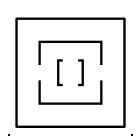![Cattura.JPG](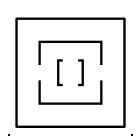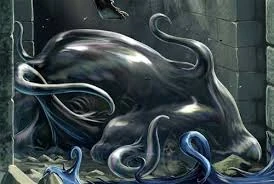))**

In [4]:
%pip install swig  # Must be installed before box2d.
%pip install ribs[visualize] gymnasium[box2d]==0.29.1 "moviepy>=1.0.0" dask distributed

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 120.5/120.5 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 26.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for box2d-py: filename=box2d_py-2.3.5-cp310-cp310-linux_x86_64.whl size=2373071 sha256=5f524701672c069e606fd2e62ed801684ffeea0ef3c5f0c064f3a13a38f6e284
  Stored in directory: /root/.cache/pip/wheels/db/8f/6a/eaaadf056fba10a98d986f6dce954e6201ba3126926fc5ad9e
Successfully built box2d-py


In [5]:
!pip install opencv-python

In [6]:
!pip install pyglet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 858.3/858.3 kB 6.4 MB/s eta 0:00:00


####3.2 IMPORTED LIBRARY

In [7]:
# STANDARD LIBRARIES
import math
import os
import copy
import math
from copy import deepcopy
import random
import warnings
import sys
import operator  # For graph operator
import importlib
import imp
import networkx as nx
from enum import Enum
import json
from typing import List
import ctypes
from operator import *
import time
import importlib
import decorator
importlib.reload(decorator)
import numbers
import pickle

# THIRD PARTY IMPORTS
import pandas as pd
# Graph plotting
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout
# For data series handling
import numpy as np
# deap
import deap
from deap import algorithms
from deap import base
from deap import creator
from deap import tools
from deap import gp
# For stat calculator
import statistics
# Pyribs
import ribs
from ribs._utils import check_batch_shape, check_finite, check_is_1d
from ribs.archives._archive_base import ArchiveBase
from ribs.schedulers import Scheduler
from ribs.emitters import EvolutionStrategyEmitter
from ribs.archives import GridArchive
from ribs._utils import check_1d_shape, validate_batch_args
from ribs.emitters._emitter_base import EmitterBase
from ribs.emitters.opt import _get_es
from ribs.emitters.rankers import _get_ranker
# Gymnasium
import gymnasium as gym
from gymnasium import spaces
import cv2 as cv
# For environment display
from IPython.display import clear_output, display
from PIL import Image
from dask.distributed import Client  # Parallelism
from tqdm import tqdm, trange  # Bar
# for typing
from typing import *

###**4. OTHER THINGS**

Global variables (4.1) and general utility code (4.2) like drive mounting and PATH definition is here presented.

####4.1 USER DEFINED GLOBAL VARIABLES

**Path**

In [8]:
# Contains folder were experiments are located
PATH: str = "drive/MyDrive/Bioinsp/project"

**Random seed**

In [9]:
# Random seed to make computation deterministic
RANDOM_SEED: int = 0

In [10]:
random.seed(RANDOM_SEED)

####4.2 UTILITY CODE

**For plotting**

plot and save in the notebook matplotlib graph

In [11]:
%matplotlib inline

In [12]:
FOLDER: str = "results"

**Mounting drive**

mount the drive to the directory where project is located

In [13]:
from google.colab import drive
drive.mount("drive", force_remount=True)

Mounted at drive


In [14]:
os.chdir(PATH)

**for numpy error behaviour**

In [15]:
np.seterr(divide='raise', over = 'raise', under = 'raise', invalid = 'raise')
#np.setter(all=ignore)

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

**set matplotlib figure dim**

In [16]:
plt.rcParams['figure.figsize'] = [20, 20]

###**5. DATA HANDLING**

this is code to handle data retrieval and processing for the gp experiments (the first one do not need data preprocessing)

use this data dict to store all data: note it is suposed that index reporting refer to first index in the considered dataframe

In [17]:
DATA_DICT: Dict[str, Union[pd.DataFrame, int]] = {}
DATA_DICT["full"] = {}
DATA_DICT["develop"] = {}
DATA_DICT["test"] = {}
DATA_DICT["full_train"] = {}
DATA_DICT["full_train"]["1"] = {}
DATA_DICT["full_train"]["2"] = {}
DATA_DICT["full_train"]["3"] = {}
DATA_DICT["full_train"]["4"] = {}


do not need all data so filter with usecols

In [18]:
full_df: pd.DataFrame = pd.read_csv('genetic_programming_part/EURUSD1440.csv',  header = None, sep='\t')
full_df.columns = ["Time",	"Open",	"High",	"Low",	"Close",	"Volume"]

compute pips

In [19]:
full_df["Pips"] = (full_df["Close"] - full_df["Open"])*10000

add a column with correct prediction
- 0 sell euro
- 1 buy euro

In [20]:
full_df["Label"] = full_df["Pips"] > 0

In [21]:
def convert(row):
    if row["Label"] == True:
        return 1
    else:
        return 0
full_df["Label"] = full_df.apply(convert, axis=1)

In [22]:
DATA_DICT["full"]["data"]  = full_df

create train and test data

In [23]:
DATA_DICT["full"]["length"] = len(full_df)

In [24]:
DATA_DICT["develop"]["data"] = DATA_DICT["full"]["data"].iloc[:int(0.9*DATA_DICT["full"]["length"])+1]
DATA_DICT["develop"]["start_index"] = int(0.8*DATA_DICT["full"]["length"])
DATA_DICT["develop"]["end_index"] = int(0.9*DATA_DICT["full"]["length"])
DATA_DICT["test"]["data"] = DATA_DICT["full"]["data"].iloc[:int(DATA_DICT["full"]["length"])]
DATA_DICT["test"]["start_index"] = int(0.9*DATA_DICT["full"]["length"])
DATA_DICT["test"]["end_index"] = int(DATA_DICT["full"]["length"]) -1


In [25]:
print(DATA_DICT["develop"]["start_index"])
print(DATA_DICT["develop"]["end_index"])

4010
4511


In [26]:
DATA_DICT["develop"]["data"]

,Time,Open,High,Low,Close,Volume,Pips,Label
0,2007-12-18 00:00,1.44068,1.44357,1.43639,1.44166,775225,9.8,1
1,2007-12-19 00:00,1.44167,1.44235,1.43229,1.43797,862962,-37.0,0
2,2007-12-20 00:00,1.43817,1.43899,1.43073,1.43292,861036,-52.5,0
3,2007-12-21 00:00,1.43289,1.44101,1.43218,1.43772,839553,48.3,1
4,2007-12-23 00:00,1.43738,1.43824,1.43643,1.43724,21348,-1.4,0
...,...,...,...,...,...,...,...,...
4507,2022-05-15 00:00,1.03952,1.04138,1.03906,1.03980,15223,2.8,1
4508,2022-05-16 00:00,1.03984,1.04430,1.03889,1.04390,194185,40.6,1
4509,2022-05-17 00:00,1.04390,1.05556,1.04318,1.05487,237886,109.7,1
4510,2022-05-18 00:00,1.05485,1.05636,1.04597,1.04729,143214,-75.6,0


In [27]:
print(DATA_DICT["test"]["start_index"])
print(DATA_DICT["test"]["end_index"])

4511
5012


In [28]:
DATA_DICT["test"]["data"]

,Time,Open,High,Low,Close,Volume,Pips,Label
0,2007-12-18 00:00,1.44068,1.44357,1.43639,1.44166,775225,9.8,1
1,2007-12-19 00:00,1.44167,1.44235,1.43229,1.43797,862962,-37.0,0
2,2007-12-20 00:00,1.43817,1.43899,1.43073,1.43292,861036,-52.5,0
3,2007-12-21 00:00,1.43289,1.44101,1.43218,1.43772,839553,48.3,1
4,2007-12-23 00:00,1.43738,1.43824,1.43643,1.43724,21348,-1.4,0
...,...,...,...,...,...,...,...,...
5008,2023-12-20 00:00,1.09793,1.09793,1.09298,1.09432,263424,-36.1,0
5009,2023-12-21 00:00,1.09433,1.10125,1.09352,1.10056,349858,62.3,1
5010,2023-12-22 00:00,1.10057,1.10401,1.09938,1.10135,348633,7.8,1
5011,2023-12-24 00:00,1.10108,1.10159,1.10108,1.10149,94,4.1,1


In [29]:
train_offset: int = int(0.8*DATA_DICT["full"]["length"]/4)
print(train_offset)
DATA_DICT["full_train"]["1"]["data"] = DATA_DICT["full"]["data"].iloc[:train_offset+1]
DATA_DICT["full_train"]["1"]["train_index"] = int(1/2*train_offset)
DATA_DICT["full_train"]["1"]["eval_index"] = int(0.9*train_offset)
DATA_DICT["full_train"]["1"]["eval_end_index"] = int(train_offset)
DATA_DICT["full_train"]["2"]["data"] = DATA_DICT["full"]["data"].iloc[train_offset:2*train_offset+1]
DATA_DICT["full_train"]["2"]["train_index"] = int((3/2)*train_offset)
DATA_DICT["full_train"]["2"]["eval_index"] = int(1.9*train_offset)
DATA_DICT["full_train"]["2"]["eval_end_index"] = int(2*train_offset)
DATA_DICT["full_train"]["3"]["data"] = DATA_DICT["full"]["data"].iloc[2*train_offset:3*train_offset+1]
DATA_DICT["full_train"]["3"]["train_index"] = int((5/2)*train_offset)
DATA_DICT["full_train"]["3"]["eval_index"] = int(2.9*train_offset)
DATA_DICT["full_train"]["3"]["eval_end_index"] = int(3*train_offset)
DATA_DICT["full_train"]["4"]["data"] = DATA_DICT["full"]["data"].iloc[3*train_offset:4*train_offset+1]
DATA_DICT["full_train"]["4"]["train_index"] = int((7/2)*train_offset)
DATA_DICT["full_train"]["4"]["eval_index"] = int(3.9*train_offset)
DATA_DICT["full_train"]["4"]["eval_end_index"] = int(4*train_offset)


1002


In [30]:
print(DATA_DICT["full_train"]["1"]["train_index"])
print(DATA_DICT["full_train"]["1"]["eval_index"])
print(DATA_DICT["full_train"]["1"]["eval_end_index"])

501
901
1002


In [31]:
print(DATA_DICT["full_train"]["2"]["train_index"])
print(DATA_DICT["full_train"]["2"]["eval_index"])
print(DATA_DICT["full_train"]["2"]["eval_end_index"])

1503
1903
2004


In [32]:
print(DATA_DICT["full_train"]["3"]["train_index"])
print(DATA_DICT["full_train"]["3"]["eval_index"])
print(DATA_DICT["full_train"]["3"]["eval_end_index"])

2505
2905
3006


In [33]:
print(DATA_DICT["full_train"]["4"]["train_index"])
print(DATA_DICT["full_train"]["4"]["eval_index"])
print(DATA_DICT["full_train"]["4"]["eval_end_index"])

3507
3907
4008


###**6. CODE UTILS**

#### 6.1 PLOTTING

#####**6.1.1 pyribs**

this utility draw the som map
- use a label to note when a node was added
- colors represent presence of elite and its fitness (white no elite, more dark green better elite)

In [34]:
def draw_fancy_topology(topology: nx.Graph, max_value: int, draw_labels = False) -> None:
    '''
    draw topology of pyribs
    ...

    Keyword Arguments:
    ----------
        topology: nx.Graph
            -- topology of graph

        max_value: int
            -- max possible fitness value

    Returns
    ----------
        None
    '''
    node_list: List[nx.Node] = [node for node in  topology.nodes(data = True)]
    label_dict = {}
    for elem in node_list:
        label_dict[elem[0]] = "iteration: " + str(elem[1]["iteration"])
    fitness_map: Dict[int, float] = {}
    fitness_set = set([node[1]["fitness"] for node in node_list])
    for elem in list(fitness_set):
        fitness_map[elem] = elem*1.0/max_value
    node_colors: Dict[int, float] = [fitness_map.get(node[1]["fitness"], 0) for node in topology.nodes(data = True)]
    # Need to specify a layout when calling the draw functions below
    # spring_layout is the default layout used within networkx (e.g. by `draw`)
    pos = nx.spring_layout(topology)
    nodes = nx.draw_networkx_nodes(topology, pos, node_color = node_colors,
                                   edgecolors = (0,0,0),  linewidths = 3.0,
                                   cmap = plt.cm.Greens, node_size = 900)
    edges = nx.draw_networkx_edges(topology, pos,  arrowsize = 20)
    for l in pos:  # Raise text positions
        pos[l][1] = pos[l][1] + 0.05
    if draw_labels:
        nx.draw_networkx_labels(topology, pos, labels=label_dict)
    # Uncomment this if you want your labels
    # Draw_networkx_labels(G, pos)
    nodes.set_array(node_colors)
    ax = plt.gca()
    ax.set_axis_off()
    plt.colorbar(nodes, ax=ax)
    plt.show()
    return None

#####**6.2 maze experiments**

this are used to plot result of maze experiment

In [35]:
def plot_cumulative_distro_objective(archive1: ribs.archives.ArchiveBase,
                                     archive2: Optional[ribs.archives.ArchiveBase] = None) -> None:
    '''
    plot cumulative distro of objective values in archive
    ...

    Keyword Arguments:
    ----------
        archive1: ribs.archives.BaseArchive
            -- pyribs archive

        archive2: Optional[ribs.archives.BaseArchive] = None
            -- pyribs archive

    Returns
    ----------
        None
    '''
    archive1_frame: pd.DataFrame = archive1.as_pandas()
    archive1_raw_list : List[float] = list(archive1_frame.iloc[:, 3:4].to_records())
    archive1_list: List[float] = [elem[1] for elem in archive1_raw_list]
    # evaluate the histogram
    values, base = np.histogram(archive1_list, bins = 40)
    #evaluate the cumulative
    cumulative = np.cumsum(values)
    # plot the cumulative function
    plt.plot(base[:-1], cumulative, c="blue")
    if archive2 is not None:
        archive2_frame = archive2.as_pandas()
        archive2_raw_list = list(archive1_frame.iloc[:, 3:4].to_records())
        archive2_list = [elem[1] for elem in archive1_raw_list]
        # evaluate the histogram
        values, base = np.histogram(archive1_list, bins=40)
        #evaluate the cumulative
        cumulative = np.cumsum(values)
        # plot the cumulative function
        plt.plot(base[:-1], cumulative, c = "green")
    plt.xlabel("Distance to goal")
    plt.ylabel("Fraction")
    plt.show()
    return None

In [36]:
def plot_solution_spread(archives: List[ribs.archives.ArchiveBase]) -> None:
    '''
    plot solution spread
    ...

    Keyword Arguments:
    ----------
        archives: List[ribs.archives.BaseArchive]
            -- list of archive

    Returns
    ----------
        None
    '''
    datas: List[float] = []
    if type(archives) == "list":
        for archive in archives:
            archive_frame = archive.as_pandas()
            archive_raw_frame = list(archive_frame.iloc[:, 1:3].to_records())
            final_dist_list: List[float]  = []
            for i in range(len(archive_raw_frame)):
                elem1 = [archive_raw_frame[i][1], archive_raw_frame[i][2]]
                list_dist = []
                for j in range(len(archive_raw_frame)):
                    if i != j:
                        elem2 = [archive_raw_frame[j][1], archive_raw_frame[j][2]]
                        list_dist.append(
                            sum(abs(val1-val2) for val1, val2 in zip(elem1, elem2)))
                final_dist_list.append(min(list_dist))
            datas.append(final_dist_list)
    else:
        archive_frame = archives.as_pandas()
        archive_raw_frame = list(archive_frame.iloc[:, 1:3].to_records())
        final_dist_list: List[float]  = []
        for i in range(len(archive_raw_frame)):
            elem1 = [archive_raw_frame[i][1], archive_raw_frame[i][2]]
            list_dist: List[float]  = []
            for j in range(len(archive_raw_frame)):
                if i != j:
                    elem2 = [archive_raw_frame[j][1], archive_raw_frame[j][2]]
                    list_dist.append(
                        sum(abs(val1-val2) for val1, val2 in zip(elem1, elem2)))
            final_dist_list.append(min(list_dist))
        datas.append(final_dist_list)
    fig = plt.figure(figsize =(10, 7))
    # Creating axes instance
    ax = fig.add_axes([0, 0, 1, 1])
    # Creating plot
    bp = ax.boxplot(datas)
    # show plot
    plt.show()
    return None

In [37]:
def plot_solution_distance(archive1: ribs.archives.ArchiveBase,
                           archive2: Optional[ribs.archives.ArchiveBase] = None) -> None:
    '''
    plot solution distance
    ...

    Keyword Arguments:
    ----------
        archive1: ribs.archives.BaseArchive
            -- ribs archive

        archive2: Optional[ribs.archives.BaseArchive] = None
            -- ribs archive

    Returns
    ----------
        None
    '''
    datas: List[float] = []
    archive1_frame: pd.DataFrame = archive1.as_pandas()
    archive1_raw_list: List[float] = list(archive1_frame.iloc[:, 3:4].to_records())
    archive1_list: List[float]  = [elem[1] for elem in archive1_raw_list]
    datas.append(archive1_list)
    if archive2 is not None:
        archive2_frame: pd.DataFrame = archive2.as_pandas()
        archive2_raw_list: List[float]  = list(archive1_frame.iloc[:, 3:4].to_records())
        archive2_list: List[float]  = [elem[1] for elem in archive1_raw_list]
        datas.append(archive2_list)
    plt.show()
    fig = plt.figure(figsize = (10, 7))
    # Creating axes instance
    ax = fig.add_axes([0, 0, 1, 1])
    # Creating plot
    bp = ax.boxplot(datas)
    # show plot
    plt.show()

#####**6.2 GP experiments**

this are utils for plotting gp experiments

In [38]:
def plotTrends(logbook, name: str, folder: Optional[str] = None) -> None:
    '''
    plot gp solution trend
    ...

    Keyword Arguments:
    ----------
        logbook
            -- logbook of evolution

        name: str
            -- name of file

        folder: Optional[str] = None
            -- folder where output results

    Returns
    ----------
        None
    '''
    gen = logbook.select("gen")
    fit_min = logbook.select("min")
    fit_max = logbook.select("max")
    fit_avg = logbook.select("avg")
    fit_std = logbook.select("std")
    fig = plt.figure("Genetic Programming (fitness trend)")
    ax1 = fig.add_subplot(111)
    line1 = ax1.plot(gen, fit_min, label = "Min")
    line2 = ax1.plot(gen, fit_max, label = "Max")
    line3 = ax1.errorbar(gen, fit_avg, yerr = fit_std, label = "Avg")
    ax1.set_xlabel("Generation")
    ax1.set_ylabel("Fitness")
    ax1.set_xlim(0, len(gen) - 1)
    ax1.legend()
    plt.savefig(folder + "/" + "trends_" + name + ".png")
    plt.show()

In [39]:
def plotTree(nodes: List[str], edges: List[str], labels: List[str],
             name: str, folder: Optional[str] = None) -> None:
    '''
    plot gp tree
    ...

    Keyword Arguments:
    ----------
        nodes: List[str]
            -- graph node

        edges: List[str]
            -- graph edges

        labels: List[str]
            -- graph labels

        name: str
            -- name of output

        folder: Optional[str] = None
            -- where output

    Returns
    ----------
        None
    '''
    if folder is not None and not os.path.exists(folder):
        os.makedirs(folder)
    if importModule("pygraphviz"):
        import pygraphviz as pgv
        g = pgv.AGraph()
        g.add_nodes_from(nodes)
        g.add_edges_from(edges)
        g.layout(prog = "dot")
        for i in nodes:
            n = g.get_node(i)
            print(i)
            print(labels)
            print(labels[i])
            n.attr["label"] = labels[i]
        g.draw(folder + "/" + "tree_" + name + ".pdf")
    if importModule("networkx"):
        import networkx as nx
        plt.figure("GP (best tree)")
        g = nx.Graph()
        g.add_nodes_from(nodes)
        g.add_edges_from(edges)
        pos = nx.nx_agraph.graphviz_layout(g, prog = "dot")
        nx.draw_networkx_nodes(g, pos)
        nx.draw_networkx_edges(g, pos)
        nx.draw_networkx_labels(g, pos, labels)
        plt.savefig(folder + "/" + "tree_" + name + ".png")
    return None

In [40]:
def importModule(module: str) -> bool:
    '''
    safe import module
    ...

    Keyword Arguments:
    ----------
        module: str
            -- module name

    Returns
    ----------
        if module was founder
    '''
    try:
        imp.find_module(module)
        found: bool = True
        importlib.import_module(module)
    except ImportError:
        found: bool = False
    return found

this is used to plot a single individual

In [41]:
def plot_individual(individual: deap.gp.PrimitiveTree, logbook: deap.tools.Logbook,
                    folder: str = FOLDER, seed: int = RANDOM_SEED) -> None:
    '''
    plot gp individual
    ...

    Keyword Arguments:
    ----------
    individual: deap.gp.PrimitiveTree
        -- individual

    logbook: deap.tools.Logbook
        -- evolutioanry logbook

    folder: str = FOLDER
        -- folder on which save result

    seed: int = RANDOM_SEED
        -- seed

    Returns
    ----------
    '''
    # plot GP tree
    nodes, edges, labels = gp.graph(individual)
    plotTree(nodes, edges, labels, "coev_" + str(seed), "results")
    # plot fitness trends
    if folder is not None and not os.path.exists(folder):
        os.makedirs(folder)
    name = "result" + str(seed)
    gen = np.array(logbook.select("gen"))
    fit_type = np.array(logbook.select("type"))
    fit_min = np.array(logbook.select("min"))
    fit_max = np.array(logbook.select("max"))
    fit_avg = np.array(logbook.select("avg"))
    fit_std = np.array(logbook.select("std"))
    gp_entries = np.array([i for i,val in enumerate(fit_type) if  val == "gp"])
    fig = plt.figure("GP (fitness trend)")
    ax2 = fig.add_subplot(111)
    line1 = ax2.plot(gen[gp_entries], fit_min[gp_entries], label = "Min")
    line2 = ax2.plot(gen[gp_entries], fit_max[gp_entries], label = "Max")
    line3 = ax2.errorbar(gen[gp_entries], fit_avg[gp_entries], yerr = fit_std[gp_entries], label = "Avg")
    ax2.set_xlabel("Generation")
    ax2.set_ylabel("Fitness")
    #ax2.set_yscale("log")
    ax2.set_xlim(0,len(gen[gp_entries]) - 1)
    ax2.set_title("GP")
    ax2.legend()
    plt.savefig(folder + "/" + "trends_" + name + "_gp.png")
    plt.show()
    return None

####6.2 EVALUATION UTILS

#####**6.2.1 gp experiments**

following dict define measure of interest of an experiment in gp setting

In [42]:
EVALUATION_DICT: Dict[str, float] = {}
EVALUATION_DICT["fitness"] = None  # This is not indicative given the inertia penalty is used for computation porpose but however included
EVALUATION_DICT["fitness_wo_transaction"] = None
EVALUATION_DICT["max_earning"] = None
EVALUATION_DICT["min_earning"] = None
EVALUATION_DICT["dev_earning"] = None
EVALUATION_DICT["avg_earning"] = None
EVALUATION_DICT["risk"] = None
EVALUATION_DICT["downside_earning"] = None
EVALUATION_DICT["MDD"] = None
EVALUATION_DICT["accuracy"] = None
EVALUATION_DICT["precision"] = None
EVALUATION_DICT["recall"] = None
EVALUATION_DICT["f1"] = None

In [43]:
def evaluate_baseline(data: pd.DataFrame, start_index: int, end_index: int,
                      transaction_cost: int = 4,
                      strategy: str = "buy_and_hold_euro") -> Dict[str, float]:
    '''
    evaluate baseline
    ...

    Keyword Arguments:
    ----------
        data: pd.DataFrame
            -- data over which compute stats

        start_index: int
            -- start index of performance evaluation over dataframe

        end_index: int
            -- end index of performance evaluation over dataframe

        transaction_cost: int = 4
            -- transaction cost

        strategy: str = "buy_and_hold_euro"
            -- strategy employed

    Returns
    ----------
        performances dictionary
    '''
    evaluation_dict: Dict[str, float] = copy.copy(EVALUATION_DICT)
    computed_fitness: float = 0
    last_move: str = "Euro"  # Start at all asset as euro
    earning_cumulator: List[float] = []
    # Consider as positive class hold choice
    TP: int = 0
    TN: int = 0
    FP: int = 0
    FN: int = 0
    P: int = 0
    N: int = 0
    for current_index in range(start_index, end_index):
        # Retrieve decision
        decision: int = 0
        if strategy == "buy_and_hold_euro":
            decision: int = 1
        elif strategy == "buy_and_hold_dollar":
            decision: int = 0
        # Check decision results
        if decision == data["Label"][current_index]:  # Check if decision is correct
            computed_fitness = computed_fitness + abs(data["Pips"][current_index])  # Add pips earning as absolute value
            earning_cumulator.append(abs(data["Pips"][current_index]))
            if (((decision == 1) and (strategy == "buy_and_hold_euro")) or ((decision == 0) and (strategy == "buy_and_hold_dollar"))):
              TP = TP + 1
            else:
              TN = TN + 1
        else:  # Remained same position
            computed_fitness: float = computed_fitness - abs(data["Pips"][current_index])
            if (((data["Label"][current_index] == 0) and (strategy == "buy_and_hold_euro")) or ((data["Label"][current_index] == 1) and (strategy == "buy_and_hold_dollar"))):
                  FP = FP + 1
            else:
              FN = FN + 1
        if (((data["Label"][current_index] == 1) and (strategy == "buy_and_hold_euro")) or ((data["Label"][current_index] == 0) and (strategy == "buy_and_hold_dollar"))):
          P = P + 1
        else:
          N = N + 1
    evaluation_dict["max_earning"] = max(earning_cumulator)
    max_value_index = earning_cumulator.index(evaluation_dict["max_earning"], 0, len(earning_cumulator))
    min_through = min(earning_cumulator[max_value_index::])
    evaluation_dict["MDD"] = abs((min_through-evaluation_dict["max_earning"])/evaluation_dict["max_earning"])
    evaluation_dict["min_earning"] = min(earning_cumulator)
    evaluation_dict["dev_earning"] = np.std(earning_cumulator)
    evaluation_dict["median_earning"] = statistics.median(earning_cumulator)
    evaluation_dict["avg_earning"] = statistics.mean(earning_cumulator)
    evaluation_dict["risk"] = math.sqrt(252)*evaluation_dict["dev_earning"]
    new_list: List[float] = []
    for elem in earning_cumulator:
        if elem < evaluation_dict["avg_earning"]:
            new_list.append(elem)
    evaluation_dict["downside_risk"] = math.sqrt(252)*np.std(new_list)
    evaluation_dict["accuracy"] = (TP + TN) / (P + N)
    evaluation_dict["precision"] = TP / (TP + FP)
    evaluation_dict["recall"] = TP / (TP + FN)
    evaluation_dict["f1"] = 2*TP / (2*TP + FP + FN)
    # Compute fitness value
    evaluation_dict["fitness"] = None
    evaluation_dict["fitness_wo_transaction"] = computed_fitness
    return evaluation_dict


the following is a variation of the baseline evaluation function for a single tree

note that the agent definition is :

- suppose agent do operation at midnight having starting price as only input (as long as previous start/end/pip values)

- suppose agent has all commodities in euro at start. clearly can switch toward dollars or return euro. there is no concept in forex market as  uninvested moneys (out of the market) and no concept of risk free investment

- agent has no concept of budget, can change all its budget in euro or all in dollars every operation

In [44]:
def evaluation_function(individual: deap.gp.PrimitiveTree, data: pd.DataFrame, start_index: int, end_index: int,
                        toolbox: deap.base.Toolbox,
                        transaction_cost: int = 4, compute_all_metrics: bool = False,
                        get_features: bool = False) -> Union[Dict[str, float], np.ndarray, Tuple[float]]:
    '''
    evaluate gp individual
    ...

    Keyword Arguments:
    ----------
        data: pd.DataFrame
            -- data over which compute stats

        start_index: int
            -- start index of performance evaluation over dataframe

        end_index: int
            -- end index of performance evaluation over dataframe

        transaction_cost: int = 4
            -- transaction cost

        strategy: str = "buy_and_hold_euro"
            -- strategy employed

        compute_all_metrics: bool = False
            -- if compute all metrics

        get_features: bool = False
            -- if get all predictions

    Returns
    ----------
        performances dictionary
    '''
    if compute_all_metrics:
        evaluation_dict: Dict[str, float] = copy.copy(EVALUATION_DICT)
        earning_cumulator: List[int] = []
    # Transform the tree expression in a callable function
    gpFunction_list = []
    if type(individual) is list:
        for elem in  individual:
          gpFunction_list.append(toolbox.compile(expr=elem))
    else:
        gpFunction = toolbox.compile(expr=individual)
    # Set values of data series to wrapper
    # Here add all serie last element included (then are filtered  in the wrapper class if current index cannot be included)
    seriesWrapper.pip_series = np.asarray(data["Pips"][:end_index + 1])
    seriesWrapper.end_price_series = np.asarray(data["Close"][:end_index + 1])
    seriesWrapper.start_price_series = np.asarray(data["Open"][:end_index + 1])
    seriesWrapper.high_price_series = np.asarray(data["High"][:end_index + 1])
    seriesWrapper.low_price_series = np.asarray(data["Low"][:end_index + 1])
    computed_fitness: int = 0
    last_move: str = "Euro"  # Start at all asset as euro
    number_ops: int = 0
    decision_cumulator = []
    # Consider as positive class hold
    TP: int = 0
    TN: int = 0
    FP: int = 0
    FN: int = 0
    P: int = 0
    N: int = 0
    for current_index in range(start_index, end_index):
        seriesWrapper.index_value = current_index
        decision = 0
        if type(individual) is list:
            decision_list = []
            for gpFunction in gpFunction_list:
                try:
                  single_decision: int = gpFunction(data["Pips"][current_index-1], data["Open"][current_index],
                                            data["Close"][current_index-1], data["High"][current_index-1],
                                            data["Low"][current_index-1])
                except  Exception as e:
                  print(e)
                  print(individual)
                  single_decision = 0
                decision_list.append(single_decision)
            decision_list_int = [int(decision_list_el) for decision_list_el in decision_list]
            decision = sum(decision_list_int) / len(decision_list_int)
            if decision >= 0.5:
              decision = 1
            else:
              decision = 0
        else:
            try:
              decision: int = gpFunction(data["Pips"][current_index-1], data["Open"][current_index],
                                        data["Close"][current_index-1], data["High"][current_index-1],
                                        data["Low"][current_index-1])
            except  Exception as e:
              print(e)
              print(individual)
              decision = 0
        decision: int = int(decision == True)  # Convert decision to int
        decision_cumulator.append(decision)
        if decision == data["Label"][current_index]:  # Check if decision is correct
            computed_fitness = computed_fitness + abs(data["Pips"][current_index])  # Add pips earning as absolute value
            if (((decision == 1) and (last_move == "Dollar")) or ((decision == 0) and (last_move == "Euro"))):  # Not stay same position
                number_ops = number_ops + 1  # Increase number operation
                # Change position
                if last_move == "Dollar":
                    last_move = "Euro"
                else:
                    last_move = "Dollar"
            if compute_all_metrics:
                earning_cumulator.append(abs(data["Pips"][current_index]))
                if decision == 1:
                    TP = TP + 1
                else:
                    TN = TN + 1
        else:
            computed_fitness = computed_fitness - abs(data["Pips"][current_index])
            if compute_all_metrics:
                if data["Label"][current_index] == 0:
                   FP = FP + 1
                else:
                   FN = FN + 1
        if compute_all_metrics:
           if data["Label"][current_index] == 1:
              P = P + 1
           else:
              N = N + 1
    if compute_all_metrics:
        evaluation_dict["max_earning"] = max(earning_cumulator)
        max_value_index = earning_cumulator.index(evaluation_dict["max_earning"], 0, len(earning_cumulator))
        min_through = min(earning_cumulator[max_value_index::])
        evaluation_dict["MDD"] = abs((min_through-evaluation_dict["max_earning"])/evaluation_dict["max_earning"])
        evaluation_dict["min_earning"] = min(earning_cumulator)
        evaluation_dict["dev_earning"] = np.std(earning_cumulator)
        evaluation_dict["median_earning"] = statistics.median(earning_cumulator)
        evaluation_dict["avg_earning"] = statistics.mean(earning_cumulator)
        evaluation_dict["risk"] = math.sqrt(252)*evaluation_dict["dev_earning"]
        evaluation_dict["accuracy"] = (TP + TN) / (P + N)
        evaluation_dict["precision"] = (TP / (TP + FP)) if (TP + FP) != 0 else 0
        evaluation_dict["recall"] = (TP / (TP + FN)) if (TP + FN) != 0 else 0
        evaluation_dict["f1"] = 2*TP / (2*TP + FP + FN)
        new_list: List[int] = []
        for elem in earning_cumulator:
            if elem < evaluation_dict["avg_earning"]:
                new_list.append(elem)
        evaluation_dict["downside_risk"] = math.sqrt(252)*np.std(new_list)
    # compute fitness value
    computed_fitness_wo_transaction: int = computed_fitness
    computed_fitness: int = computed_fitness - number_ops*transaction_cost - max(0, 4 - number_ops)*8   # Add transaction cost and inertia penalty
    if compute_all_metrics:
        evaluation_dict["fitness"] = computed_fitness
        evaluation_dict["fitness_wo_transaction"] = computed_fitness_wo_transaction
    if not(compute_all_metrics):
      if not(get_features):
        return computed_fitness,
      else:
        return computed_fitness, np.asarray(decision_cumulator)
    else:
      if not(get_features):
        return evaluation_dict
      else:
        return evaluation_dict, np.asarray(decision_cumulator)

In [45]:
def compute_features(individual: deap.gp.PrimitiveTree, data: pd.DataFrame,
                     start_index: int, end_index: int, toolbox: deap.base.Toolbox,
                     transaction_cost: int = 4)  -> np.ndarray:
    '''
    compute all predictions over dataframe
    ...

    Keyword Arguments:
    ----------
        individual: deap.gp.PrimitiveTree
            -- gp individual

        data: pd.DataFrame
            -- dataframe over which compute computation

        start_index: int
            -- start index of computation

        end_index: int
            -- end index computation

        toolbox: deap.base.Toolbox
            -- toolbox of evolutionary run

        transaction_cost: int = 4
            -- transaction cost

    Returns
    ----------
        features collected
    '''
    # Transform the tree expression in a callable function
    gpFunction = toolbox.compile(expr = individual)
    # Set values of data series to wrapper
    # Here add all serie last element included (then are filtered  in the wrapper class if current index cannot be included)
    seriesWrapper.pip_series = np.asarray(data["Pips"][: end_index + 1])
    seriesWrapper.end_price_series = np.asarray(data["Close"][: end_index + 1])
    seriesWrapper.start_price_series = np.asarray(data["Open"][: end_index + 1])
    seriesWrapper.high_price_series = np.asarray(data["High"][: end_index + 1])
    seriesWrapper.low_price_series = np.asarray(data["Low"][: end_index + 1])
    decision_cumulator: List[int] = []
    for current_index in range(start_index, end_index):
        seriesWrapper.index_value = current_index
        decision = gpFunction(data["Pips"][current_index-1],
                              data["Open"][current_index], data["Close"][current_index-1],
                              data["High"][current_index - 1],
                              data["Low"][current_index - 1])
        decision: int = int(decision == True)  # Convert decision to int
        decision_cumulator.append(decision)
    return decision_cumulator

#### 6.3 OTHER UTILS

In [46]:
def check_shape(array: np.ndarray, array_name: str,
                dim: int, dim_name: str, extra_msg: str = "") -> None:
    '''
    Checks that the array has shape dim.
    ...

    Keyword Arguments:
    ----------
        array: np.ndarray
            -- generic np array

        array_name: str
            -- name of array

        dim: int
            -- dimension value

        dim_name: str
            -- dimension name

        extra_msg: str = ""
            -- possible extra message

    Returns
    ----------
        None
    '''
    if isinstance(dim, numbers.Integral):
        dim = (dim,)
    if array.ndim != len(dim) or array.shape != dim:
        comma = "," if len(dim) == 1 else ""
        raise ValueError(
            f"Expected {array_name} to be an array with shape "
            f"{dim} (i.e. shape ({dim_name}{comma})) but it had shape "
            f"{array.shape}.{extra_msg}")
    return None

#####**gp experiments**

here some utility used for evolution (like statistics computed, code for retrieve toolbox and evaluation function)

In [47]:
def set_creator() -> None:
    '''
    create pset
    ...

    Keyword Arguments:
    ----------

    Returns
    ----------
        None
    '''
    # FITNESS DEFINITION
    # As any evolutionary program, symbolic regression needs (at least) two object types : an individual containing the genotype and a fitness.
    # We can easily create them with the creator :
    try:
        del creator.FitnessMax
        del creator.Individual
    except:
        pass
    # The first line creates the fitness object (this is a minimization problem, so the weight is negative).
    # The weights argument must be an iterable of weights, even if there is only one fitness measure
    creator.create("FitnessMax", base.Fitness, weights = (1.0,))
    creator.create("Individual", gp.PrimitiveTree, fitness=creator.FitnessMax)
    return None

In [48]:
def retrieve_toolbox(data: pd.DataFrame, start_index: int, end_index: int, pset: deap.gp.PrimitiveSetTyped,
                     gp_trnmt_size: int = 3, transaction_cost: int = 4) -> deap.base.Toolbox:
    '''
    retrieve evolutionary run toolbox
    ...

    Keyword Arguments:
    ----------
    data: pd.DataFrame
        -- data over which run  evolution

    start_index: int
        -- related to data

    end_index: int
        -- related to data

    pset: deap.gp.PrimitiveSetTyped
        -- pset

    gp_trnmt_size: int = 3
        -- gp tournament size

    transaction_cost: int = 4
        -- transaction cost

    Returns
    ----------
        None
    '''
    # PARAMETER OF ALGORITHM
    # Now, we want to register some parameters specific to the evolution process. In DEAP, this is done through the toolbox
    toolbox: deap.base.Toolbox = base.Toolbox()
    toolbox.register("expr", gp.genHalfAndHalf, pset = pset, min_ = 1, max_ = 2)  # The first lines register and
    toolbox.register("individual", tools.initIterate, creator.Individual, toolbox.expr)  #  How to create an individual
    toolbox.register("population", tools.initRepeat, list, toolbox.individual)  # How to create the population (by repeating the individual initialization).
    toolbox.register("compile", gp.compile, pset=pset)  # Used in evalSYmbReg
    toolbox.register("evaluate", evaluation_function, data = data,
                     start_index = start_index, end_index = end_index,
                     toolbox = toolbox, transaction_cost = transaction_cost)  # Introduce the evaluation function, which will receive an individual as input, and return the corresponding fitness
    toolbox.register("select", tools.selTournament, tournsize = gp_trnmt_size)  # Choose the selection method (a tournament of size 3)
    toolbox.register("mate", gp.cxOnePoint)  # Mate method (one point crossover with uniform probability over all the nodes)
    toolbox.register("expr_mut", gp.genFull, min_ = 0, max_ = 2)  # Mutation method (a uniform probability mutation which may append a new full sub-tree to a node)
    toolbox.register("mutate", gp.mutUniform, expr=toolbox.expr_mut, pset=pset)
    # Decorate the mate and mutate method to limit the height of generated individuals
    # Koza in his book on genetic programming suggest to use a max depth of 17.
    toolbox.decorate("mate", gp.staticLimit(key = operator.attrgetter("height"), max_value = 10))
    toolbox.decorate("mutate", gp.staticLimit(key = operator.attrgetter("height"), max_value = 10))
    return toolbox

In [49]:
def retrieve_statistics() -> tools.Statistics:
    '''
    retrieve stats tool for evolutioanry computation
    ...

    Keyword Arguments:
    ----------

    Returns
    ----------
        Statistics object
    '''
    stats: tools.Statistics = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("avg", np.mean)
    stats.register("std", np.std)
    stats.register("min", np.min)
    stats.register("max", np.max)
    logbook = tools.Logbook()
    logbook.header = "gen", "type", "evals", "std", "min", "avg", "max"
    return stats, logbook

finding a maximum set of node at a given distance is equivalent to 1 to the maximum indipendent set problem, which is NP hard, instead we are more interst to find node wich are far from the other nodes so we can act similarly to the baricenter of the graph

The barycenter a connected graph $G$ is the subgraph induced by the set of its nodes $v$ minimizing the objective function called baricentricity
$$
\sum_{u \in V(G)} d_G(u, v)
$$
where $d_G$ is the (possibly weighted) path length.

in our case instead we would like to obtain set of nodes with a objective function with at least a certain value k. for implicity we wil call this set "k-baricenter".
note that k value represents the sum of this distances and it is always

$$
\min{\sum_{u \in V(G)} d_G(u, v)} \le{k} \le{\max{\sum_{u \in V(G)} d_G(u, v)}}
$$

In [50]:
def extract_k_barycenter(G: nx.Graph, k: int, min_baricentricity: int,
                         max_baricentricity: int) -> List[int]:
    '''
    Extract k barycenter
    ...

    Keyword Arguments:
    ----------
        G: nx.Graph
            -- topology grapj

        k: int
            -- k value

        min_baricentricity: int
            -- miniomum graph baricentricity

        max_baricentricity: int
            -- max graph baricentricity

    Returns
    ----------
        extract baricenter vertices
    '''
    n: int = len(G)
    sp: Dict[int, List[int]] = nx.shortest_path_length(G)
    barycenter_vertices: List[int] = []
    for v, dists in sp:
          barycentricity = sum(dists.values())
          if barycentricity > k:
              barycenter_vertices.append(v)
    return barycenter_vertices

In [51]:
def extract_barycenter_and_baricentricity(G: nx.Graph) -> List[Union[List[int], int]]:
    '''
    Extract baricenters
    ...

    Keyword Arguments:
    ----------
        G: nx.Graph
            -- topology grapj

    Returns
    ----------
        extract baricenter vertices and smallest baricenter
    '''
    n: int = len(G)
    sp: Dict[int, List[int]] = nx.shortest_path_length(G)
    smallest, barycenter_vertices, n = float("inf"), [], len(G)
    for v, dists in sp:
        barycentricity: int = sum(dists.values())
        if barycentricity < smallest:
            smallest: int = barycentricity
            barycenter_vertices = [v]
        elif barycentricity == smallest:
            barycenter_vertices.append(v)
    return barycenter_vertices, smallest

In [52]:
def extract_max_barycenter_and_max_baricentricity(G: nx.Graph) -> List[Union[List[int], int]]:
    '''
    Extract max barycenter and maximum baricentricity
    ...

    Keyword Arguments:
    ----------
        G: nx.Graph
            -- topology grapj

    Returns
    ----------
         baricenter vertices and max baricentricity
    '''
    n: int = len(G)
    sp: Dict[int, List[int]] = nx.shortest_path_length(G)
    barycenter_vertices: List[int] = []
    biggest, barycenter_vertices, n = -float("inf"), [], len(G)
    for v, dists in sp:
        barycentricity = sum(dists.values())
        if barycentricity  > biggest:
            biggest: int = barycentricity
            barycenter_vertices: int = [v]
        elif barycentricity == biggest:
            barycenter_vertices.append(v)
    return barycenter_vertices, biggest

#####**maze experiment**

In [53]:
def simulate(model: np.ndarray, config_file: str, num_dim: int) -> List[Union[float, np.ndarray]]:
    '''
    Simulate maze
    ...

    Keyword Arguments:
    ----------
        model: np.ndarray
            -- model to be evaluated

        config_file: str
            -- where maze file located

        num_dim: int
            -- number dim to be outputted

    Returns
    ----------
         reward and features
    '''
    # if number of dim lower than two correct to 2
    if num_dim < 2:
        num_dim: int = 2
    env: MazeEnv = MazeEnv(config_file)
    action_dim: int = env.action_space.n
    obs_dim: int = env.observation_space.shape[0]
    model: np.ndarray = model.reshape((action_dim, obs_dim)) # questo perche sono flattened nel emitter
    final_reward: float = 0.0
    obs, _ = env.reset() # reset environment
    done: float = False # sarebbe il risultato di truncated o teminated
    while not done: # simulate the environment
        action = np.argmax(model @ np.asarray(obs))  # Linear policy.
        obs, reward, terminated, truncated, _ = env.step(action)
        done: bool = terminated or truncated
        final_reward: float = reward
    # construct features
    features: List[int] = []
    number_couple: int = int(num_dim / 2)
    # append last couple of coordinate
    features.append(env.trajectory_storer[len(env.trajectory_storer) - 1][0])
    features.append(env.trajectory_storer[len(env.trajectory_storer) - 1][1])
    # if other dimension are requested
    if (number_couple - 1) != 0:
        couple_counter: int = 1
        leng: int = len(env.trajectory_storer) - 1  # length excluded  last element
        interval: int = int(leng/(number_couple - 1))
        for i in range(0, len(env.trajectory_storer), 1):
            if (((i % interval) == 0) and (couple_counter < number_couple)):
                features.append(env.trajectory_storer[i][0])
                features.append(env.trajectory_storer[i][1])
                couple_counter = couple_counter + 1
    features: np.ndarray = np.asarray(features)
    # given it maximizes reward
    final_reward: float = env.maze.size*env.maze.size - final_reward
    return final_reward, features

use the following dict to store different test configuration

In [54]:
EXP_DICT: Dict[str, str] = {}
EXP_DICT["template"] = "gymnasium_part/mazes/maze_template.json"
EXP_DICT["maze1"] = "gymnasium_part/mazes/maze1.json"
EXP_DICT["maze2"] = "gymnasium_part/mazes/maze2.json"
EXP_DICT["maze3"] = "gymnasium_part/mazes/maze3.json"
EXP_DICT["maze4"] = "gymnasium_part/mazes/maze4.json"


###**7. TREE HANDLING**

code to handle tree in GP experiment

In [55]:
# This wrapper is needed or give error in type checking
class seriesWrapper:
    '''
    wrapper to handle gp over data series

    ...

    Class Variables:
    ----------
        index_value: int = None
            -- Limit temporal window

        pip_series: np.ndarray = None
            -- This store the actual series considered

        start_price_series: np.ndarray = None
            -- start price series

        end_price_series: np.ndarray = None
            -- end price series

        high_price_series: np.ndarray = None
            -- high price series

        low_price_series: np.ndarray = None
            -- low price series

    Instance Variables:
    ----------
        take_the_last: bool
            -- if also current index have to be retrieved

        series: pd.DataFrame
            -- stored pd dataframe


    Public Methods:
    ----------
        get_value(self)-> np.ndarray
            -- get value inside this wrapper


    '''
    # CLASS VARIABLES
    index_value: int = None  # Limit temporal window
    pip_series: np.ndarray = None  # This store the actual series considered
    start_price_series: np.ndarray = None
    end_price_series: np.ndarray = None
    high_price_series: np.ndarray = None
    low_price_series: np.ndarray = None

    # METHODS
    def __init__(self, check: bool = True, input_series: np.ndarray = None,
                 start_type: str = None, take_the_last: bool = False)-> None:
        '''
        take_the_last
           -- if the last index have to be taken in data series when cutting it (e.g. starting values)
        '''
        self.series: pd.DataFrame = None
        if start_type is None:  # If it is not a starting type series
            self.series = np.asarray(input_series)
        self.check = check
        self.take_the_last: bool = take_the_last
        self._start_type = start_type
        if self._start_type == "start_price":  # If considering start type also actual index have to be considered
            self.take_the_last = True
        return None

    def get_value(self)-> np.ndarray:
        '''
        get stored value
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
              stored series
        '''
        output: np.ndarray = None
        # If this is start input series take class attribute value
        if self.series is None:
            # This is dependendant on which particular start series i consider
            if self._start_type == "start_price":
                output = copy.copy(seriesWrapper.start_price_series)
            elif self._start_type == "end_price":
                output = copy.copy(seriesWrapper.end_price_series)
            elif self._start_type == "pip":
                output = copy.copy(seriesWrapper.pip_series)
            elif self._start_type == "high_price":
                output = copy.copy(seriesWrapper.high_price_series)
            elif self._start_type == "low_price":
                output = copy.copy(seriesWrapper.low_price_series)
        else:  # Rlse take stored series
            output = copy.copy(self.series)
        if self.check:  # Based on actual index predicted have to cut part of value
            if self.take_the_last:
                return output[:(seriesWrapper.index_value+1)]
            else:
                return output[:seriesWrapper.index_value]
        else:
            return output

    def __str__(self) -> str:
        return "series"

#### 7.1  OPERATORS

#####**7.1.1 time series operation**

this operators are defined over time series


**output float**

operator which output float

maximum: maximum value of a time series

In [56]:
def maximum(wrapper: seriesWrapper) -> float:
    '''
    compute values of array
    ...

    Keyword Arguments:
    ----------
        wrapper: seriesWrapper
            -- series over which compute values

    Returns
    ----------
         maximum
    '''
    arr: pd.DataFrame = wrapper.get_value()
    try:
        result: float = float(np.max(arr))
    except:
        result: float = 1
    return result

minimum: minimum value of a time series

In [57]:
def minimum(wrapper: seriesWrapper)  -> float:
    '''
    compute minimum of array
    ...

    Keyword Arguments:
    ----------
        wrapper: seriesWrapper
            -- series over which compute values

    Returns
    ----------
         minimum
    '''
    arr: pd.DataFrame = wrapper.get_value()
    try:
        result: float = float(np.min(arr))
    except:
        result: float = 1
    return result

value: return a specific data value given index

In [58]:
def value(wrapper: seriesWrapper, index: int)  -> float:
    '''
    extract specific value from array
    ...

    Keyword Arguments:
    ----------
        wrapper: seriesWrapper
            -- series over which compute values

        index: int
            -- index which want to retrieve

    Returns
    ----------
         value one want to retrieve
    '''
    index: int = int(index)
    arr: pd.DataFrame = wrapper.get_value()
    if ((index <= len(arr)) and (index >= 0)):
        try:
            result: float = float(arr[index])
            return result
        except:
            return 1
    else:
        return 1

sum_all: return a value sum of all element in array

In [59]:
def sum_all(wrapper: seriesWrapper)  -> float:
    '''
    sum all numpy values of array
    ...

    Keyword Arguments:
    ----------
        wrapper: seriesWrapper
            -- series over which compute values

    Returns
    ----------
         sum all values
    '''
    arr: pd.DataFrame = wrapper.get_value()
    # possible overflow error
    try:
        return_value: float = np.sum(arr)
    except:
        return_value: float = 1
    return return_value

**output time series**

filter_pos : return only positive values in a time series

In [60]:
def filter_pos(wrapper: seriesWrapper) -> seriesWrapper:
    '''
    remove all negative elements array
    ...

    Keyword Arguments:
    ----------
        wrapper: seriesWrapper
            -- series over which compute values

    Returns
    ----------
         new array filtered
    '''
    arr: pd.DataFrame = wrapper.get_value()
    new_arr: np.ndarray = []
    for index in np.ndindex(arr.shape):
        if arr[index] > 0:
            new_arr.append(arr[index])
    new_arr: np.ndarray = np.asarray(new_arr)
    out_wrapper: seriesWrapper = seriesWrapper(input_series = new_arr, check = False,
                                take_the_last = True)
    return out_wrapper

filter_neg: return only negative values in a time series

In [61]:
def filter_neg(wrapper: seriesWrapper) -> seriesWrapper:
    '''
    remove all positive elements array
    ...

    Keyword Arguments:
    ----------
        wrapper: seriesWrapper
            -- series over which compute values

    Returns
    ----------
         new array filtered
    '''
    arr: pd.DataFrame = wrapper.get_value()
    new_arr: List[float] = []
    for index in np.ndindex(arr.shape):
        if arr[index] < 0:
            new_arr.append(arr[index])
    new_arr: np.ndarray = np.asarray(new_arr)
    out_wrapper: seriesWrapper = seriesWrapper(input_series = new_arr, check = False,
                                take_the_last = True)
    return out_wrapper

filter_lag: return only a subset of a series

In [62]:
def filter_lag(wrapper: seriesWrapper, start: int, stop: int) -> seriesWrapper:
    '''
    select all values between certain indexe
    ...

    Keyword Arguments:
    ----------
        wrapper: seriesWrapper
            -- series over which compute values

        start : int
            -- start series

        stop: int
            -- stop index of series

    Returns
    ----------
         new array filtered
    '''
    arr: pd.DataFrame = wrapper.get_value()
    start: int = int(start)
    stop: int = int(stop)
    if ((start < len(arr)) and (start >= 0) and (stop >= 0) and (stop < len(arr)+1)):
      arr: np.ndarray = arr[start:(stop + 1)]
    out_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = False,
                                take_the_last = True)
    return out_wrapper

sum_np: sum np array elemetwise


In [63]:
def sum_np(wrapper1: seriesWrapper, wrapper2: seriesWrapper) -> seriesWrapper:
  '''
  sum two series
  ...

  Keyword Arguments:
  ----------
      wrapper1: seriesWrapper
          -- first series to be summed

      wrapper2: seriesWrapper
          -- second series to be summed

  Returns
  ----------
        summed series
  '''
  if len(wrapper1.get_value()) == len(wrapper2.get_value()):
      try:
          arr: np.ndarray = np.add(wrapper1.get_value(), wrapper2.get_value())
          new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                      take_the_last = wrapper1.take_the_last)
          return new_wrapper
      except:
          return wrapper1
  else:
      return wrapper1

sub_np: subtract np array elemetwise

In [64]:
def sub_np(wrapper1: seriesWrapper, wrapper2: seriesWrapper) -> seriesWrapper:
  '''
  subtract two series
  ...

  Keyword Arguments:
  ----------
      wrapper1: seriesWrapper
          -- first series to be subtracted

      wrapper2: seriesWrapper
          -- second series to be subtracted

  Returns
  ----------
        subtracted series
  '''
  if len(wrapper1.get_value()) == len(wrapper2.get_value()):
      try:
          arr: np.ndarray = np.subtract(wrapper1.get_value(), wrapper2.get_value())
          new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                      take_the_last = wrapper1.take_the_last)
          return new_wrapper
      except:
          return wrapper1
  else:
      return wrapper1

mul_np: multiply np array elemetwise

In [65]:
def mul_np(wrapper1: seriesWrapper, wrapper2: seriesWrapper) -> seriesWrapper:
  '''
  multiply elementwise two series
  ...

  Keyword Arguments:
  ----------
      wrapper1: seriesWrapper
          -- first series to be multiplied

      wrapper2: seriesWrapper
          -- second series to be multiplied

  Returns
  ----------
        multiplied series
  '''
  if len(wrapper1.get_value()) == len(wrapper2.get_value()):
      try:
          arr: np.ndarray = np.multiply(wrapper1.get_value(), wrapper2.get_value())
          new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                      take_the_last = wrapper1.take_the_last)
          return new_wrapper
      except:
          return wrapper1
  else:
      return wrapper1

div_np: divide np array elemetwise

In [66]:
def div_np(wrapper1: seriesWrapper, wrapper2: seriesWrapper) -> seriesWrapper:
  '''
  divide elementwise two series
  ...

  Keyword Arguments:
  ----------
      wrapper1: seriesWrapper
          -- first series to be divided

      wrapper2: seriesWrapper
          -- second series to be divided

  Returns
  ----------
        divided series
  '''
  if len(wrapper1.get_value()) == len(wrapper2.get_value()):
      try:
          assert (wrapper2.get_value()!=0).all()
          arr: np.ndarray = np.divide(wrapper1.get_value(), wrapper2.get_value())
          new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                      take_the_last = wrapper1.take_the_last)
          return new_wrapper
      except:
          return wrapper1
  else:
      return wrapper1

log_np: logarithm np array elementwise

In [67]:
def log_np(wrapper1: seriesWrapper, base: float) -> seriesWrapper:
  '''
  compute logarithm elementwise two series
  ...

  Keyword Arguments:
  ----------
      wrapper1: seriesWrapper
          -- first series to be divided

      base: float
          -- base logarithm operation

  Returns
  ----------
        result series
  '''
  if ((base > 0)and(base != 1)):
      arr: pd.DataFrame = wrapper1.get_value()
      for index in np.ndindex(arr.shape):
          if arr[index] > 0:
              try:
                  arr[index] = math.log(arr[index], base)
              except:
                  arr[index] = 1
          else:
              arr[index] = 1
      new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                  take_the_last = wrapper1.take_the_last)
      return new_wrapper
  else:
      return wrapper1

exp_np: exponential np array elementwise

note here have to check if argument is positive

In [68]:
def power_np(wrapper1: seriesWrapper, exponent: float) -> seriesWrapper:
  '''
  compute power elementwise a series
  ...

  Keyword Arguments:
  ----------
      wrapper1: seriesWrapper
          -- first series to be divided

      exponent: float
          -- exponent

  Returns
  ----------
        result series
  '''
  if (exponent >= 1):
      arr: pd.DataFrame = wrapper1.get_value()
      for index in np.ndindex(arr.shape):
            try:
                arr[index] = arr[index]**exponent
            except:
                arr[index] = 1
      new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                  take_the_last = wrapper1.take_the_last)
      return new_wrapper
  elif ((exponent > 0) and (exponent < 1)):
      arr: pd.DataFrame = wrapper1.get_value()
      for index in np.ndindex(arr.shape):
            if arr[index] > 0:
                try:
                    arr[index] = arr[index]**exponent
                except:
                    arr[index] = 1
            else:
                arr[index] = 1
      new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                  take_the_last = wrapper1.take_the_last)
      return new_wrapper
  elif ((exponent > -1) and (exponent < 0)):
      arr: pd.DataFrame = wrapper1.get_value()
      for index in np.ndindex(arr.shape):
            if arr[index] > 0:
                try:
                    arr[index] = arr[index]**exponent
                except:
                    arr[index] = 1
            else:
                arr[index] = 1
      new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                  take_the_last = wrapper1.take_the_last)
      return new_wrapper
  elif (exponent <= -1):
      arr: pd.DataFrame = wrapper1.get_value()
      for index in np.ndindex(arr.shape):
            if arr[index] != 0:
                try:
                    arr[index] = arr[index]**exponent
                except:
                    arr[index] = 1
            else:
                arr[index] = 1
      new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                  take_the_last = wrapper1.take_the_last)
      return new_wrapper
  else:
      return wrapper1

exp_np

In [69]:
def exp_np(wrapper1: seriesWrapper, base: float) -> seriesWrapper:
  '''
  compute exponential elementwise a series
  ...

  Keyword Arguments:
  ----------
      wrapper1: seriesWrapper
          -- first series to be divided

      base: float
          -- exponent

  Returns
  ----------
        result series
  '''
  if (base > 0):
      arr: pd.DataFrame = wrapper1.get_value()
      for index in np.ndindex(arr.shape):
          try:
              arr[index] = base**arr[index]
          except:
              arr[index] = 1
      new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                  take_the_last = wrapper1.take_the_last)
      return new_wrapper
  else:
      return wrapper1

opposite_np: opposite value for each element array

In [70]:
def opposite_np(wrapper1: seriesWrapper) -> seriesWrapper:
    '''
    compute opposite np value in a series
    ...

    Keyword Arguments:
    ----------
        wrapper1: seriesWrapper
            -- first series to be divided

    Returns
    ----------
          result series
    '''
    arr: pd.DataFrame = wrapper1.get_value()
    for index in np.ndindex(arr.shape):
          arr[index] = arr[index]*-1
    new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                take_the_last = wrapper1.take_the_last)
    return new_wrapper

absv_np: opposite value for each element array

In [71]:
def abs_np(wrapper1: seriesWrapper) -> seriesWrapper:
    '''
    compute abs np value in a series
    ...

    Keyword Arguments:
    ----------
        wrapper1: seriesWrapper
            -- first series to be divided

    Returns
    ----------
          result series
    '''
    arr: pd.DataFrame = wrapper1.get_value()
    for index in np.ndindex(arr.shape):
        arr[index] = abs(arr[index])
    new_wrapper: seriesWrapper = seriesWrapper(input_series = arr, check = wrapper1.check,
                                take_the_last = wrapper1.take_the_last)
    return new_wrapper

#####**7.1.2 single values operation**

**sign operation**

add also abs due to the fact that a zero is very difficult to be obtained with real constant

In [72]:
def absv(input: float) -> float: # not need norm of difference given that
  '''
  compute abs value
  ...

  Keyword Arguments:
  ----------
      input: float
          -- input value

  Returns
  ----------
        result value
  '''
  return abs(input)

add also opposite fore same reason

In [73]:
def opposite(input: float)-> float:
  '''
  compute opposite value
  ...

  Keyword Arguments:
  ----------
      input: float
          -- input value

  Returns
  ----------
        result value
  '''
  return -1*input

**other basics ops**

if-then-else

In [74]:
def if_then_else(input: bool, output1: bool, output2: bool) -> bool:
    '''
    compute if then else given two values
    ...

    Keyword Arguments:
    ----------
        input: bool
            -- input

        output1: bool
            -- first output

        output2: bool
            -- else output condition

    Returns
    ----------
          result value
    '''
    return output1 if input else output2

greater

In [75]:
def greater(value1: float, value2: float)-> bool:
  '''
  check if value 1 is greater than the two
  ...

  Keyword Arguments:
  ----------
      value1: float
          -- first value

      value2: float
          -- second value

  Returns
  ----------
        result value
  '''
  return value1 > value2

greater_equal

In [76]:
def greater_equal(value1: float, value2: float)-> bool:
  '''
  check if value 1 is greater or equal than the two
  ...

  Keyword Arguments:
  ----------
      value1: float
          -- first value

      value2: float
          -- second value

  Returns
  ----------
        result value
  '''
  return value1 >= value2

lower

In [77]:
def lower(value1: float, value2: float)-> bool:
  '''
  check if value 1 is lower than the two
  ...

  Keyword Arguments:
  ----------
      value1: float
          -- first value

      value2: float
          -- second value

  Returns
  ----------
        result value
  '''
  return value1 < value2

lower_equal

In [78]:
def lower_equal(value1: float, value2: float)-> bool:
  '''
  check if value 1 is lower or equale than the two
  ...

  Keyword Arguments:
  ----------
      value1: float
          -- first value

      value2: float
          -- second value

  Returns
  ----------
        result value
  '''
  return value1 <= value2

equal

In [79]:
def equal(value1: float, value2: float)-> bool:
  '''
  check if value 1 is equal than the two
  ...

  Keyword Arguments:
  ----------
      value1: float
          -- first value

      value2: float
          -- second value

  Returns
  ----------
        result value
  '''
  return value1 == value2

protected div

In [80]:
def div(left: float, right: float)-> float:
    '''
    protected division
    ...

    Keyword Arguments:
    ----------
        left: float
            -- dividend

        right: float
            -- divisor


    Returns
    ----------
          result value
    '''
    try:
        return left / right
    except:
        return 1

protected sum

In [81]:
def protected_sum(left: float, right: float)-> float:
    '''
    protected sum
    ...

    Keyword Arguments:
    ----------
        left: float
            -- first argument

        right: float
            --  second argument


    Returns
    ----------
          result value
    '''
    try:
        return left + right
    except:
        return 1

protected sub

In [82]:
def protected_sub(left: float, right: float)-> float:
    '''
    protected sum
    ...

    Keyword Arguments:
    ----------
        left: float
            -- first argument

        right: float
            --  second argument


    Returns
    ----------
          result value
    '''
    try:
        return left - right
    except:
        return 1

protected mul

In [83]:
def protected_mul(left: float, right: float)-> float:
    '''
    protected sum
    ...

    Keyword Arguments:
    ----------
        left: float
            -- first argument

        right: float
            --  second argument


    Returns
    ----------
          result value
    '''
    try:
        return left * right
    except:
        return 1

protected exponential

do not need power version because it is subsumed by this exponential function

In [84]:
def expn(base: float, exponent: float)-> float:
    '''
    exponentiate a value
    ...

    Keyword Arguments:
    ----------
        base: float
            -- base

        exponent: float
            -- exponent


    Returns
    ----------
          result value
    '''
    if (base > 0):
      try:
          return base**exponent
      except:
          return 1
    else:
      return 1

protected logarithm

In [85]:
def logm(x: float, base: float)-> float:
    '''
    compute a logarithm over  a value
    ...

    Keyword Arguments:
    ----------
        x: float
            -- input

        base: float
            -- base


    Returns
    ----------
          result value
    '''
    if ((base > 0) and (base != 1) and (x > 0)):
        try:
            return math.log(x, base)
        except:
            return 1
    else:
        return 1

####7.2  CODE FOR TREE DEFINITION

In [86]:
def retrieve_pset() -> gp.PrimitiveSetTyped:
    '''
    retrieve evolutionary computation pset
    ...

    Keyword Arguments:
    ----------

    Returns
    ----------
    '''
    # Operator set creation
    pset = gp.PrimitiveSetTyped("main", [float, float, float, float, float], bool)
    # Give these values directly as input of the alogrithm
    pset.renameArguments(ARG0 = 'last_pip')
    pset.renameArguments(ARG1 = 'start_change')
    pset.renameArguments(ARG2 = 'last_change')
    pset.renameArguments(ARG3 = 'last_high')
    pset.renameArguments(ARG4 = 'last_low')
    # Single value operation
    # Canonical logic operator
    pset.addPrimitive(operator.or_, [bool, bool], bool)
    pset.addPrimitive(operator.and_, [bool, bool], bool)
    pset.addPrimitive(operator.not_, [bool], bool)
    pset.addPrimitive(if_then_else, [bool, float, float], float)
    pset.addPrimitive(greater, [float, float], bool)
    pset.addPrimitive(greater_equal, [float, float], bool)
    pset.addPrimitive(lower, [float, float], bool)
    pset.addPrimitive(lower_equal, [float, float], bool)
    pset.addPrimitive(equal, [float, float], bool)
    # Canonical arithmetic operator
    pset.addPrimitive(protected_mul, [float, float], float)
    pset.addPrimitive(protected_sum, [float, float], float)
    pset.addPrimitive(protected_sub, [float, float], float)
    pset.addPrimitive(div, [float, float], float)
    pset.addPrimitive(expn, [float, float], float)
    pset.addPrimitive(logm, [float, float], float)
    # Functions
    # To change sign of values
    pset.addPrimitive(absv, [float], float)
    pset.addPrimitive(opposite, [float], float)
    # Series operation
    pset.addPrimitive(abs_np, [seriesWrapper], seriesWrapper)
    pset.addPrimitive(opposite_np, [seriesWrapper], seriesWrapper)
    pset.addPrimitive(exp_np, [seriesWrapper, float], seriesWrapper)
    pset.addPrimitive(power_np, [seriesWrapper, float], seriesWrapper)
    pset.addPrimitive(log_np, [seriesWrapper, float], seriesWrapper)
    pset.addPrimitive(div_np, [seriesWrapper, seriesWrapper], seriesWrapper)
    pset.addPrimitive(mul_np, [seriesWrapper, seriesWrapper], seriesWrapper)
    pset.addPrimitive(sub_np, [seriesWrapper, seriesWrapper], seriesWrapper)
    pset.addPrimitive(sum_np, [seriesWrapper, seriesWrapper], seriesWrapper)
    pset.addPrimitive(filter_lag, [seriesWrapper, float, float], seriesWrapper)
    pset.addPrimitive(filter_pos, [seriesWrapper], seriesWrapper)
    pset.addPrimitive(filter_neg, [seriesWrapper], seriesWrapper)
    pset.addPrimitive(sum_all, [seriesWrapper], float)
    pset.addPrimitive(maximum, [seriesWrapper], float)
    pset.addPrimitive(minimum, [seriesWrapper], float)
    pset.addPrimitive(value, [seriesWrapper, float], float)
    # TERMINAL
    # Float terminal
    pset.addEphemeralConstant("const", lambda: random.uniform(-500, 500), float)  # Use as delimiter maximum dimension of timeframe of dataset
    # sStandard bolean values
    pset.addTerminal(True, bool)
    pset.addTerminal(False, bool)
    # Series terminal
    # Pip series
    pip_series: seriesWrapper = seriesWrapper(start_type = "pip")
    pset.addTerminal(pip_series, seriesWrapper, name = "pip_series")
    # Start prices series
    start_price_series: seriesWrapper = seriesWrapper(start_type = "start_price")
    pset.addTerminal(start_price_series, seriesWrapper, name = "start_price_series")
    # End prices series
    end_price_series: seriesWrapper = seriesWrapper(start_type = "end_price")
    pset.addTerminal(end_price_series, seriesWrapper, name = "end_price_series")
    # High prices series
    high_price_series: seriesWrapper = seriesWrapper(start_type = "high_price")
    pset.addTerminal(high_price_series, seriesWrapper, name = "high_price_series")
    # Low prices series
    low_price_series: seriesWrapper = seriesWrapper(start_type = "low_price")
    pset.addTerminal(low_price_series, seriesWrapper, name = "low_price_series")
    return pset

###**8 MAZE ENVIRONMENT**

#### 8.1 MAZE ENVIRONMENT

this environment is a custom environment obtained modifying [3]

##### **8.1.1 Utilities**

In [87]:
def map_tuple(f, t1: int, t2: int) -> float:
    '''
    apply function elementwise to tuple
    ...

    Keyword Arguments:
    ----------
    f
        -- function

    t1: int
        -- first tuple elment

    t2: int
        -- second tuple element

    Returns
    ----------
        tuple mapped
    '''
    return tuple(map(lambda a, b: f(a, b), t1, t2))

In [88]:
def distance(a: Tuple[int], b: Tuple[int]) -> float:
    '''
    compute distance between two point
    ...

    Keyword Arguments:
    ----------
    a: Tuple[int]
        -- first tuple

    b: Tuple[int]
        -- second tuple

    Returns
    ----------
        distance (squared)
    '''
    ax, ay = a
    bx, by = b
    return math.sqrt((ax - bx)**2 + (ay - by)**2)

In [89]:
def hor_distance(a: Tuple[int], b: Tuple[int]) -> float:
    '''
    compute horizontal distance
    ...

    Keyword Arguments:
    ----------
    a: Tuple[int]
        -- first tuple

    b: Tuple[int]
        -- second tuple

    Returns
    ----------
        manhattan distance
    '''
    ax, ay = a
    bx, by = b
    return ax - bx

In [90]:
def ver_distance(a: Tuple[int], b: Tuple[int]) -> float:
    '''
    compute vertical distance
    ...

    Keyword Arguments:
    ----------
    a: Tuple[int]
        -- first tuple

    b: Tuple[int]
        -- second tuple

    Returns
    ----------
        manhattan distance
    '''
    ax, ay = a
    bx, by = b
    return ay - by

In [91]:
def dist_from_point_to_line(point: Tuple[int], line_start: Tuple[int],
                            line_end: Tuple[int]) -> float:
    '''
    compute horizontal distancedistance from point to line
    ...

    Keyword Arguments:
    ----------
    point: Tuple[int]
        -- point

    line_start: Tuple[int]
        -- start line

    line_end: Tuple[int]
        -- end line

    Returns
    ----------
        manhattan distance
    '''
    px, py = point
    ax, ay = line_start
    bx, by = line_end
    line_length = distance(line_start, line_end)
    r = ((px - ax) * (bx - ax) + (py - ay) * (by - ay)) / (line_length ** 2)
    closest_point_in_line = ax + (r * (bx - ax)), ay + (r * (by - ay))
    if r >= 0. and r <= 1.:  # Closest point is on the line
        return distance(point, closest_point_in_line)
    else: # Closest point is not on the line
        return min(distance(point, line_start), distance(point, line_end))

##### **8.1.2 Environment component**

In [92]:
class Action(Enum):
    Left: Tuple[int] = (-1, 0)
    Left_two: Tuple[int] = (-2, 0)
    Right: Tuple[int] = (1, 0)
    Right_two: Tuple[int] = (2, 0)
    Up: Tuple[int] = (0, -1)
    Up_two: Tuple[int] = (0, -2)
    Down: Tuple[int] = (0, 1)
    Down_two: Tuple[int] = (0, 1)


In [93]:
class Robot(object):
    '''
    a module to handle robot

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        position: Tuple[int]
            -- position of robot

        size: int
            -- size of robot


    Public Methods:
    ----------
        move(self, action: Action) -> None
            -- move robot

        calculate_new_pos(self, action: Action, _check_bump: bool = False) -> Tuple[int]
            -- calculate new robot position

    '''
    def __init__(self, position: Tuple[int], size: int) -> None:
        self.position: Tuple[int] = position
        self.size: int = size
        return None

    def move(self, action: Action) -> None:
        '''
        move robot
        ...

        Keyword Arguments:
        ----------
        action: Action
            -- action to be performed

        Returns
        ----------
        '''
        self.position: Tuple[int] = self.calculate_new_pos(action)
        return None

    def calculate_new_pos(self, action: Action, check_bump: bool = False) -> Tuple[int]:
        '''
        move robot
        ...

        Keyword Arguments:
        ----------
        action: Action
            -- action to be performed

        check_bump: bool = False
            -- check if bump

        Returns
        ----------
        '''
        if (((action.name == "Up_two") or (action.name == "Down_two") or (action.name == "Left_two") or (action.name == "Right_two")) and check_bump):
            if action.name == "Up_two":
                d: Tuple[int] = Action.Up.value
            elif action.name == "Down_two":
                d: Tuple[int] = Action.Down.value
            elif action.name == "Left_two":
                d: Tuple[int] = Action.Left.value
            elif action.name == "Right_two":
                d: Tuple[int] = Action.Right.value
            new_pos1: Tuple[int] = map_tuple(add, self.position, d)
            new_pos2: Tuple[int] = map_tuple(add, self.position, action.value)
            return new_pos1, new_pos2
        else:
            d: Tuple[int] = action.value
            new_pos: Tuple[int] = map_tuple(add, self.position, d)
            return new_pos

In [94]:
class Wall(object):
    '''
    a wall class

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        a: Tuple[int]
            -- start point of wall

        b: Tuple[int]
            -- end point of wall


    Public Methods:
    ----------
        length(self) -> float
            -- length of wall

    '''
    def __init__(self, a: Tuple[int], b: Tuple[int]) -> None:
        self.a: Tuple[int] = a
        self.b: Tuple[int] = b
        return None

    def length(self) -> float:
        '''
        distance between start and end line
        ...

        Keyword Arguments:
        ----------
        Returns
        ----------
        computed distance
        '''
        return distance(self.a, self.b)

In [95]:
class Maze(object):
    '''
    a maze class

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        size: int
            -- maze size

        initial_pos: Tuple[int]
            -- initial robot position

        robot: Robot
            -- robot

        goal: Tuple[int]
            -- goal position

        walls: List[Walls]
            -- list walls in maze

        num_collision: int
            -- number robot collision before finding free path

        total_collision: int
            -- total number collision


    Public Methods:
    ----------
        move_robot(self, action: Action) -> Tuple[int]
            -- move robot

        collide(self, pos: Tuple[int]) -> bool
            -- check robto collision

        ver_dist_to_point(self, point: Tuple[int]) -> float
            -- compute vertical distance robot to point

        hor_dist_to_point(self, point: Tuple[int]) -> float
            -- compute horizontal distance robot to point

        dist_from_right_wall(self) -> float
            -- compute distance robot to nearest right wall

        dist_from_left_wall(self) -> float
            -- compute distance robot to nearest left wall

        dist_from_up_wall(self) -> float
            -- compute distance robot to nearest up wall

        dist_from_down_wall(self) -> float
            -- compute distance robot to nearest down wall

        is_robot_reach_goal(self) -> bool
            -- check if robot reach goal

        dist_to_goal(self) -> float
            -- get distance to goal

        ver_dist_to_goal(self) -> float
            -- compute vertical distance to goal

        hor_dist_to_goal(self) -> float
            -- compute horizontal distance to goal

        dist_from_start(self) -> float
            -- compute distance from starting point

    '''

    @classmethod
    def from_config(cls, config_file: str):
        '''
        get maze from config
        ...

        Keyword Arguments:
        ----------
        config_file: str
            -- config file where maze have to be obtained

        Returns
        ----------
            new maze
        '''
        maze_config: Dict[str, Union[Tuple[int], Dict[str, List[int]]]] = json.load(open(config_file))
        maze_size: int = maze_config['size']
        robot_pos: Tuple[int] = maze_config['robot']['x'], maze_config['robot']['y']
        robot_size: int = maze_config['robot']['size']
        goal_pos: Tuple[int] = maze_config['goal']['x'], maze_config['goal']['y']
        walls: List[Wall] = [Wall((config['ax'], config['ay']), (config['bx'], config['by'])) for config in maze_config['walls']]
        maze: Maze = Maze(maze_size, robot_pos, robot_size, goal_pos, walls)
        return maze

    def __init__(self, size: int, robot_pos: Tuple[int], robot_size: int, goal_pos: Tuple[int], walls: List[Wall] = []) -> None:
        self.size: int = size
        self.initial_pos: Tuple[int] = robot_pos
        self.robot: Robot = Robot(robot_pos, robot_size)
        self.goal: Tuple[int] = goal_pos
        # Add borders
        height, width = (size, size)
        self.walls: List[Wall] = [
            Wall((0, 0), (width - 1, 0)),
            Wall((0, 0), (0, height - 1)),
            Wall((0, height - 1), (height - 1, width - 1)),
            Wall((width - 1, height - 1), (width - 1,0))
        ]
        self.walls.extend(walls)
        self.num_collision: int = 0
        self.total_collision: int = 0
        return None

    def move_robot(self, action: Action) -> Tuple[int]:
        '''
        move the robot
        ...

        Keyword Arguments:
        ----------
        action: Action
            -- action to be performed

        Returns
        ----------
            new position
        '''
        if ((action.name == "Up_two") or (action.name == "Down_two") or (action.name == "Left_two") or (action.name == "Right_two")):
           new_pos1, new_pos2 = self.robot.calculate_new_pos(action, check_bump = True)
           if ((not self.collide(new_pos1)) and (not self.collide(new_pos2))):
                self.robot.move(action)
                self.num_collision = 0
           else:
                self.num_collision = self.num_collision + 1
                self.total_collision = self.total_collision +1
        else:
          new_pos = self.robot.calculate_new_pos(action, check_bump = True)
          if not self.collide(new_pos):
                self.robot.move(action)
                self.num_collision = 0
          else:
                self.num_collision = self.num_collision + 1
                self.total_collision = self.total_collision +1
        return None

    def collide(self, pos: Tuple[int]) -> bool:
        '''
        check if robot collide
        ...

        Keyword Arguments:
        ----------
        pos: Tuple[int]
            -- new robot position

        Returns
        ----------
            if collide
        '''
        for wall in self.walls:
            if dist_from_point_to_line(pos, wall.a, wall.b) <= self.robot.size:
                return True
        return False

    def ver_dist_to_point(self, point: Tuple[int]) -> float:
        '''
        compute vertical distance between robot pos e point
        ...

        Keyword Arguments:
        ----------
        pos: Tuple[int]
            -- new robot position

        Returns
        ----------
            dist
        '''
        return ver_distance(self.robot.position, point)

    def hor_dist_to_point(self, point: Tuple[int]) -> float:
        '''
        compute horizontal distance between robot pos e point
        ...

        Keyword Arguments:
        ----------
        pos: Tuple[int]
            -- new robot position

        Returns
        ----------
            dist
        '''
        return hor_distance(self.robot.position, point)

    def dist_from_right_wall(self) -> float:
        '''
        compute minimum distance between robot pose and wall to the right
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        wall_cuml: List[float] = []
        for wall in self.walls:
            if self.hor_dist_to_point(wall.a) > 0:
               wall_cuml.append(dist_from_point_to_line(self.robot.position, wall.a, wall.b))
        return min(wall_cuml)

    def dist_from_left_wall(self) -> float:
        '''
        compute minimum distance between robot pos and wall to the left
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        wall_cuml: List[float] = []
        for wall in self.walls:
            if self.hor_dist_to_point(wall.a) < 0:
               wall_cuml.append(dist_from_point_to_line(self.robot.position, wall.a, wall.b))
        return min(wall_cuml)

    def dist_from_up_wall(self) -> float:
        '''
        compute minimum distance between robot pos and up wall
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        wall_cuml: List[float] = []
        for wall in self.walls:
            if self.ver_dist_to_point(wall.a) > 0:
               wall_cuml.append(dist_from_point_to_line(self.robot.position, wall.a, wall.b))
        return min(wall_cuml)

    def dist_from_down_wall(self) -> float:
        '''
        compute minimum distance between robot pos and down wall
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        wall_cuml: List[float] = []
        for wall in self.walls:
            if self.ver_dist_to_point(wall.a) < 0:
               wall_cuml.append(dist_from_point_to_line(self.robot.position, wall.a, wall.b))
        return min(wall_cuml)

    def is_robot_reach_goal(self) -> bool:
        '''
        check if robot reach goal
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            if robot reach goal
        '''
        return self.robot.position == self.goal

    def dist_to_goal(self) -> float:
        '''
        compute distance to goal
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        return distance(self.robot.position, self.goal)

    def ver_dist_to_goal(self) -> float:
        '''
        compute vertical distance between robot pos and goal
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        return ver_distance(self.robot.position, self.goal)

    def hor_dist_to_goal(self) -> float:
        '''
        compute horizontal distance between robot pos and goal
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        return hor_distance(self.robot.position, self.goal)

    def dist_from_start(self) -> float:
        '''
        compute  distance between robot pos and start
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
            dist
        '''
        return distance(self.initial_pos, self.robot.position)


In [96]:
class MazeDrawer:
    '''
    a module to handle Maze drawing

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        None


    Public Methods:
    ----------
        draw_maze(cls, maze: Maze, height: int, width: int) -> np.ndarray
            -- draw a maze

    '''
    @classmethod
    def draw_maze(cls, maze: Maze, height: int, width: int) -> np.ndarray:
        '''
        draw the maze
        ...

        Keyword Arguments:
        ----------
        maze: Maze
            -- maze

        height: int
            -- height of maze

        width: int
            -- width of maze

        Returns
        ----------
            image of maze
        '''
        BLACK = (0,0,0)
        img = np.ones((maze.size, maze.size), dtype=np.uint8) * 255
        cv.circle(img, (maze.robot.position), maze.robot.size, BLACK, -1)
        cv.circle(img, (maze.goal), 1, BLACK, -1)
        for wall in maze.walls:
            cv.line(img, wall.a, wall.b, BLACK)
        img = cv.resize(img, (height, width), interpolation=cv.INTER_NEAREST)
        return img

#####  **8.1.3 Environment**

In [97]:
class MazeEnv(gym.Env):
    '''
    a maze class

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        config_file: str
            -- mze configuration file

        time_limit: int
            -- time limit before stopping evolution

        timestep: int
            -- store timesteps

        truncated: bool
            -- if truncate agent episode

        terminated: bool
            -- if  episode terminated

        maze: Maze
            -- maze instance

        action_space: spaces.Discrete
            -- action spaces

        observation_space: spaces.Box
            -- observation spaces

        trajectory_storer: List[Tuple[int]]
            -- store trajectory

        stored_min_dist: int
            -- store minimum distance to goal reached so fare


    Public Methods:
    ----------
        step(self,
              action: Action
              ) -> List[np.ndarray]
            -- do a step of robnot

        reset(self)  -> List[np.ndarray]
            -- reset robot position

        render(self) -> None
            -- display robot


    '''

    # CLASS VARIABLES
    ALL_ACTIONS: List[Action] = [Action.Left, Action.Left_two, Action.Right, Action.Right_two, Action.Up, Action.Up_two, Action.Down, Action.Down_two]

    def __init__(self, config_file: str = "gymnasium_part/mazes/maze_template.json",
                 time_limit: int = 500) -> None:
        self.config_file: str = config_file  # File in which maze is stored
        self.time_limit: int = time_limit  # Default value is the paper original value
        self.timestep: int = 0  # Store timesteps
        # To check truncation and termination
        self.truncated: bool = False
        self.terminated: bool = False
        # Store maze
        self.maze: Maze = Maze.from_config(config_file)
        self.action_space: spaces.Discrete = spaces.Discrete(len(self.ALL_ACTIONS))
        low: np.ndarray = np.array(
            [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
            ]
        ).astype(np.float32)
        high: np.ndarray = np.array(
            [
                1,
                1,
                1,
                1,
                10000,
                10000,
                10000,
                10000,
                sys.maxsize,
                sys.maxsize
            ]
        ).astype(np.float32)
        self.observation_space: spaces.Box = spaces.Box(low, high)
        # For render
        self.maze_storer: List[Maze] = []
        # Store trajectory
        self.trajectory_storer: List[Tuple[int]] = []
        # Store minimum distance founded so far
        self.stored_min_dist: int = sys.maxsize
        return None

    def step(self,
             action: Action
             ) -> List[np.ndarray]:
        '''
        do a step of robot and return observation
        ...

        Keyword Arguments:
        ----------
        action: Action
            -- an action provided by the agent to update the environment state.

        Returns
        ----------
            observation, reward, if terminated or truncated and addtional info
        '''
        action: Action = self.ALL_ACTIONS[action]  # Take the action from the available action
        self.timestep = self.timestep + 1  # Increase timestep
        self.maze.move_robot(action)  # Do action
        # Store next position
        self.trajectory_storer.append(self.maze.robot.position)
        # Check if terminated or truncated
        self.terminated = self.maze.is_robot_reach_goal()
        self.truncated = (self.timestep == self.time_limit)
        # Reward is minimum distance to goal in trajectory
        new_dist_to_goal: float = self.maze.dist_to_goal()
        if new_dist_to_goal < self.stored_min_dist:
            self.stored_min_dist = new_dist_to_goal
        self.maze_storer.append(MazeDrawer.draw_maze(self.maze, 1000, 1000))
        # Returns
        observation: List[int] = []  # Observation (ObsType) – An element of the environment’s observation_space
        # Construct observation
        # Compasses
        hor_dist = self.maze.hor_dist_to_goal()
        ver_dist =  self.maze.ver_dist_to_goal()
        up_compass = 1 if ver_dist > 0 else 0
        down_compass = 1 if ver_dist < 0 else 0
        left_compass = 1 if hor_dist < 0 else 0
        right_compass = 1 if hor_dist  > 0 else 0
        observation.extend([up_compass, down_compass, left_compass, right_compass])
        # laser sensors
        laser_sensors: List[int] = [self.maze.dist_from_up_wall(), self.maze.dist_from_down_wall(),
                         self.maze.dist_from_left_wall(), self.maze.dist_from_right_wall()]
        observation.extend(laser_sensors)
        observation.append(self.maze.num_collision)  # aAppend number of collision
        observation.append(self.maze.total_collision)  # Append number of collision
        reward: float = self.stored_min_dist  # Reward (SupportsFloat) – The reward as a result of taking the action.
        terminated: bool  =  self.terminated # Terminated (bool) – Whether the agent reaches the terminal state
        truncated: bool = self.truncated  # Truncated (bool) – Whether the truncation condition outside the scope of the MDP is satisfied.
        info: Dict[str, float] =  {}  # Info (dict) – Contains auxiliary diagnostic information (helpful for debugging, learning, and logging).
        return observation, reward, terminated, truncated, info

    def reset(self)  -> List[np.ndarray]:
        '''
        reset environment
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
        initial observation and additional info
        '''
        self.maze = Maze.from_config(self.config_file)
        self.truncated = False
        self.terminated = False
        self.timestep = 0
        self.maze_storer.append(MazeDrawer.draw_maze(self.maze, 1000, 1000))
        self.trajectory_storer.append(self.maze.robot.position)
        # Returns
        observation: List[int] = []  # Observation (ObsType) – An element of the environment’s observation_space
        # Construct observation
        # Compasses
        hor_dist: int = self.maze.hor_dist_to_goal()
        ver_dist: int =  self.maze.ver_dist_to_goal()
        up_compass: int = 1 if ver_dist > 0 else 0
        down_compass: int = 1 if ver_dist < 0 else 0
        left_compass: int = 1 if hor_dist < 0 else 0
        right_compass: int = 1 if hor_dist  > 0 else 0
        observation.extend([up_compass, down_compass, left_compass, right_compass])
        # Laser sensors
        laser_sensors: List[int] = [self.maze.dist_from_up_wall(), self.maze.dist_from_down_wall(),
                         self.maze.dist_from_left_wall(), self.maze.dist_from_right_wall()]
        observation.extend(laser_sensors)
        observation.append(self.maze.num_collision)  # Append number of collision
        observation.append(self.maze.total_collision)  # Append number of collision
        info: Dict[str, int] = {}  # Info (dictionary) – This dictionary contains auxiliary information complementing observation.
        return observation, info

    def render(self) -> None:
        '''
        display maze movements
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
        '''
        for maze in self.maze_storer:
            display(Image.fromarray(maze, mode="L"), clear=True)
        return None


example of usage

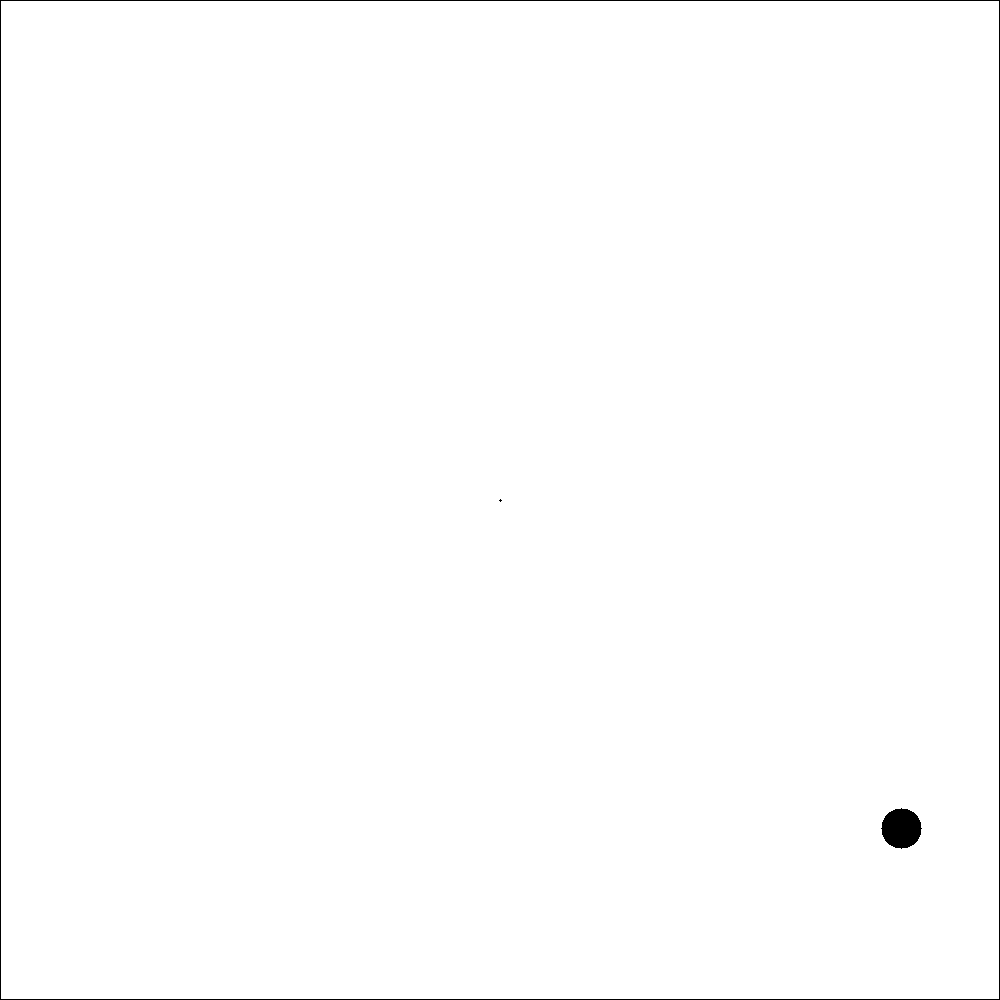

In [98]:
env = MazeEnv()
env.reset()
env = MazeEnv()
env.reset()
for i in range(500):
    observation, reward, terminated, truncated, info = env.step(env.action_space.sample())
    print("observation " + str(observation))
    print("reward " + str(reward))
env.render()
env.close()

#### 8.2 MAZES CREATION

In [99]:
MAZE_TEMPLATE: Dict[str, Union[Tuple[int], List[Dict[str, int]]]] = {}
MAZE_TEMPLATE["size"] = 1000
MAZE_TEMPLATE["robot"] = {"x": 900, "y": 900, "size": 20}
MAZE_TEMPLATE["goal"] = {"x": 500, "y": 500}
MAZE_TEMPLATE["walls"] = []
with open("gymnasium_part/mazes/maze_template.json", "w") as outfile:
    json.dump(MAZE_TEMPLATE, outfile)


maze 1

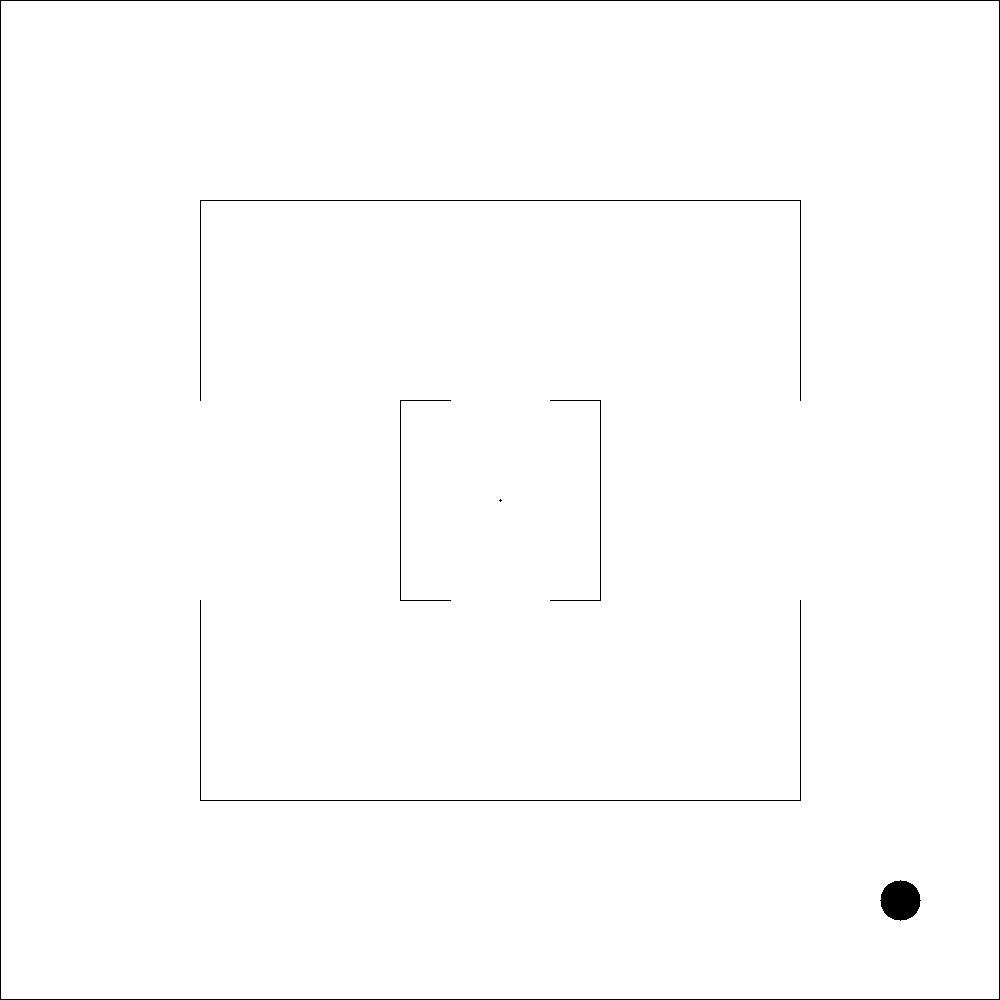

In [100]:
maze1: Dict[str, Union[Tuple[int], List[Dict[str, int]]]] = copy.deepcopy(MAZE_TEMPLATE)
maze1["walls"].extend([
    # external wall
    {"ax": 200, "ay": 200, "bx": 800, "by": 200},  # Upper horizontal wall
    {"ax": 200, "ay": 800, "bx": 800, "by": 800},  # Lower horizzontal wall
    {"ax": 200, "ay": 200, "bx": 200, "by": 400},  # Left upper vertical vall
    {"ax": 200, "ay": 600, "bx": 200, "by": 800},  # Left lower vertical vall
    {"ax": 800, "ay": 200, "bx": 800, "by": 400},  # Right upper vertical vall
    {"ax": 800, "ay": 600, "bx": 800, "by": 800},  # Right lower vertical vall
    # internal wall
    {"ax": 400, "ay": 400, "bx": 450, "by": 400},  # Upper left horizontal wall 1
    {"ax": 550, "ay": 400, "bx": 600, "by": 400},  # Upper left horizontal wall 2
    {"ax": 400, "ay": 600, "bx": 450, "by": 600},  # Upper right horizontal wall 1
    {"ax": 550, "ay": 600, "bx": 600, "by": 600},  # Upper right horizontal wall 1
    {"ax": 400, "ay": 400, "bx": 400, "by": 600},  # Left vertical
    {"ax": 600, "ay": 400, "bx": 600, "by": 600},  # Right vertical
])
with open("gymnasium_part/mazes/maze1.json", "w") as outfile:
    json.dump(maze1, outfile)
env = MazeEnv(config_file  = "gymnasium_part/mazes/maze1.json")
env.reset()
env.render()

maze 2

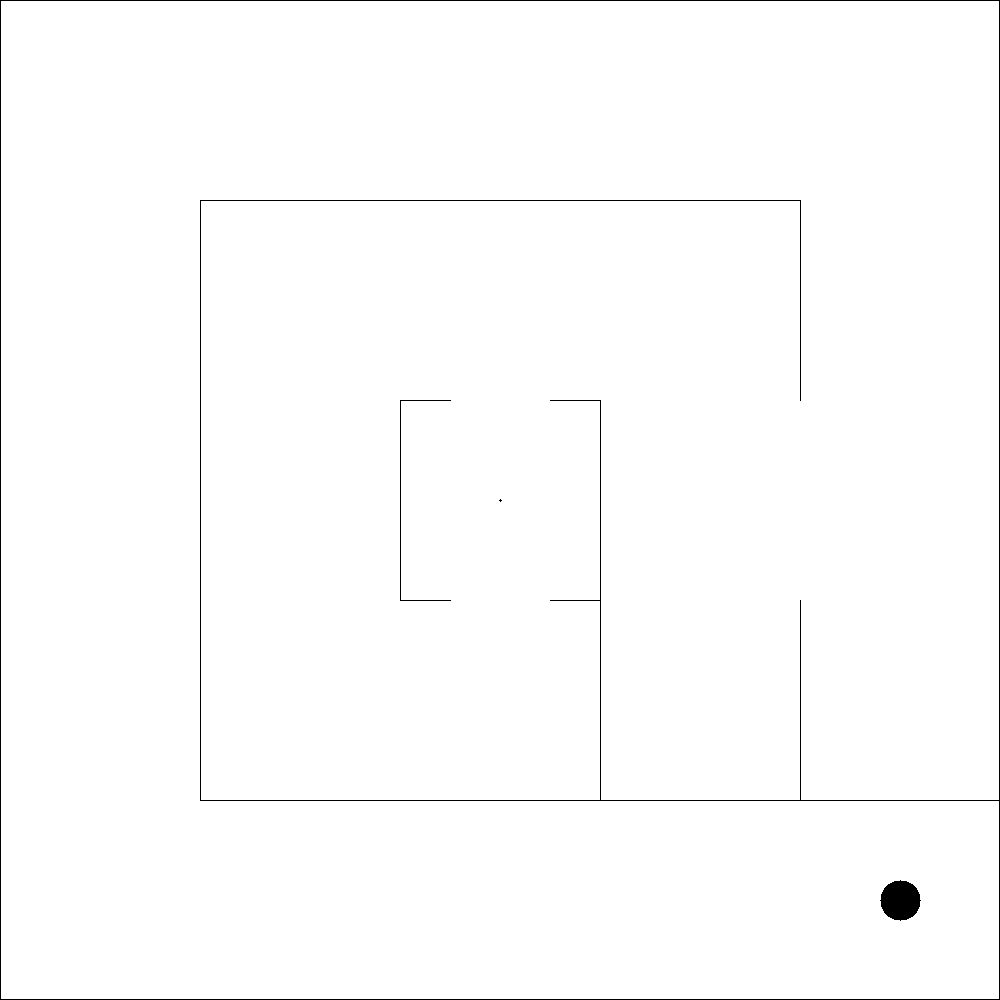

In [101]:
maze1: Dict[str, Union[Tuple[int], List[Dict[str, int]]]] = copy.deepcopy(MAZE_TEMPLATE)
maze1["walls"].extend([
    # External wall
    {"ax": 200, "ay": 200, "bx": 800, "by": 200},  # Upper horizontal wall
    {"ax": 200, "ay": 800, "bx": 999, "by": 800},  # Lower horizzontal wall
    {"ax": 200, "ay": 200, "bx": 200, "by": 800},  # Left upper vertical vall
    {"ax": 800, "ay": 200, "bx": 800, "by": 400},  # Right upper vertical vall
    {"ax": 800, "ay": 600, "bx": 800, "by": 800},  # Right lower vertical vall
    # Internal wall
    {"ax": 400, "ay": 400, "bx": 450, "by": 400},  # Upper left horizontal wall 1
    {"ax": 550, "ay": 400, "bx": 600, "by": 400},  # Upper left horizontal wall 2
    {"ax": 400, "ay": 600, "bx": 450, "by": 600},  # Upper right horizontal wall 1
    {"ax": 550, "ay": 600, "bx": 600, "by": 600},  # Upper right horizontal wall 1
    {"ax": 400, "ay": 400, "bx": 400, "by": 600},  # Left vertical
    {"ax": 600, "ay": 400, "bx": 600, "by": 800},  # Right vertical
])
with open("gymnasium_part/mazes/maze2.json", "w") as outfile:
    json.dump(maze1, outfile)
env = MazeEnv(config_file = "gymnasium_part/mazes/maze2.json")
env.reset()
env.render()

maze 3

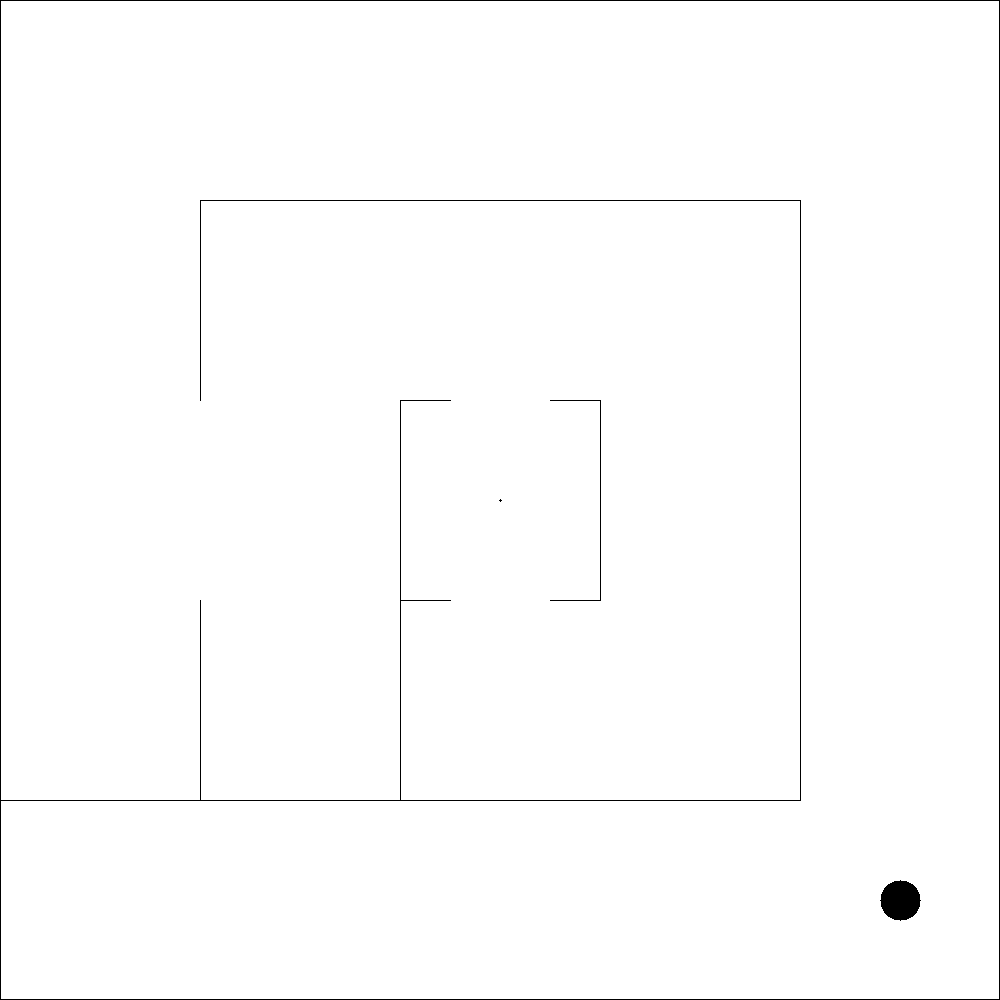

In [102]:
maze1: Dict[str, Union[Tuple[int], List[Dict[str, int]]]] = copy.deepcopy(MAZE_TEMPLATE)
maze1["walls"].extend([
    # external wall
    {"ax": 200, "ay": 200, "bx": 800, "by": 200},  # Upper horizontal wall
    {"ax": 0, "ay": 800, "bx": 800, "by": 800},  # Lower horizzontal wall
    {"ax": 200, "ay": 200, "bx": 200, "by": 400},  # Left upper vertical vall
    {"ax": 200, "ay": 600, "bx": 200, "by": 800},  # Left lower vertical vall
    {"ax": 800, "ay": 200, "bx": 800, "by": 800},  # Right upper vertical vall
    # internal wall
    {"ax": 400, "ay": 400, "bx": 450, "by": 400},  # Upper left horizontal wall 1
    {"ax": 550, "ay": 400, "bx": 600, "by": 400},  # Upper left horizontal wall 2
    {"ax": 400, "ay": 600, "bx": 450, "by": 600},  # Upper right horizontal wall 1
    {"ax": 550, "ay": 600, "bx": 600, "by": 600},  # Upper right horizontal wall 1
    {"ax": 400, "ay": 400, "bx": 400, "by": 800},  # Left vertical
    {"ax": 600, "ay": 400, "bx": 600, "by": 600},  # Right vertical
])
with open("gymnasium_part/mazes/maze3.json", "w") as outfile:
    json.dump(maze1, outfile)
env = MazeEnv(config_file = "gymnasium_part/mazes/maze3.json")
env.reset()
env.render()

maze 4

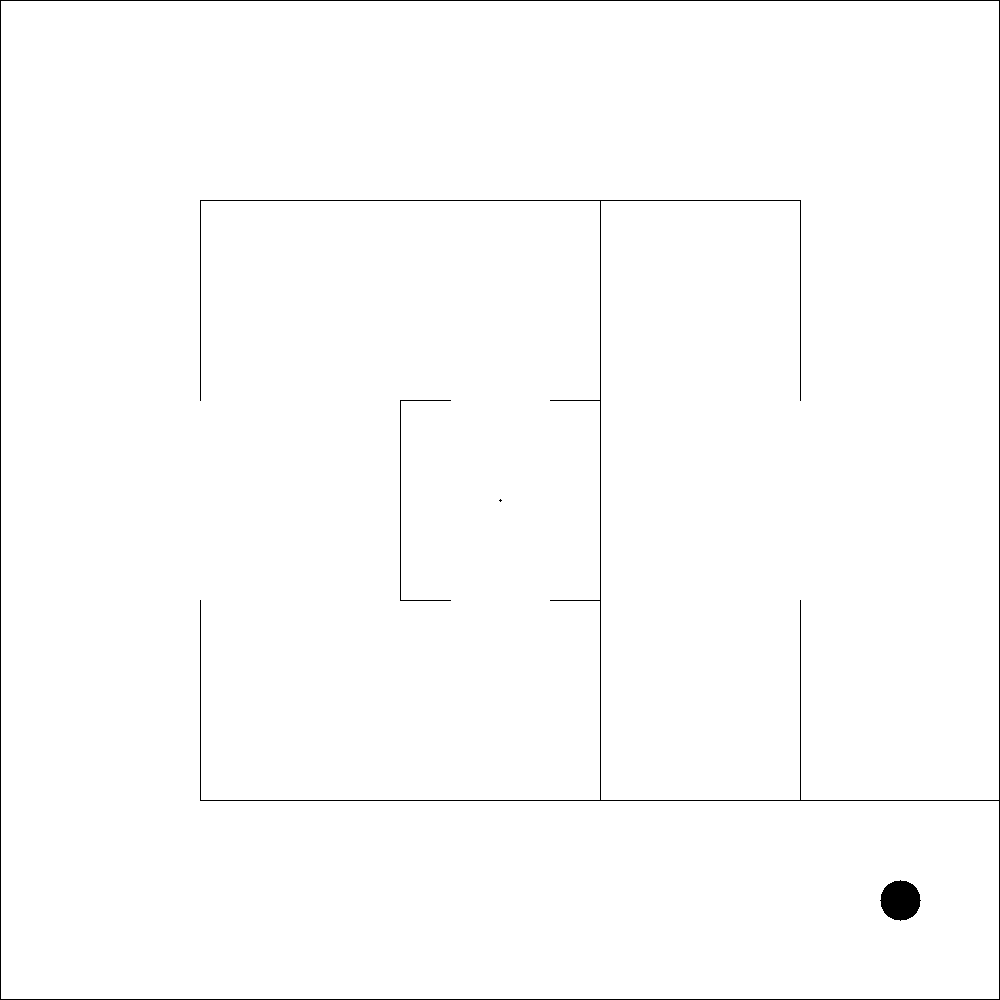

In [103]:
maze1: Dict[str, Union[Tuple[int], List[Dict[str, int]]]] = copy.deepcopy(MAZE_TEMPLATE)
maze1["walls"].extend([
    # External wall
    {"ax": 200, "ay": 200, "bx": 800, "by": 200},  # Upper horizontal wall
    {"ax": 200, "ay": 800, "bx": 999, "by": 800},  # Lower horizzontal wall
    {"ax": 200, "ay": 200, "bx": 200, "by": 400},  # Left upper vertical vall
    {"ax": 200, "ay": 600, "bx": 200, "by": 800},  # Left lower vertical vall
    {"ax": 800, "ay": 200, "bx": 800, "by": 400},  # Right upper vertical vall
    {"ax": 800, "ay": 600, "bx": 800, "by": 800},  # Right lower vertical vall
    # Internal wall
    {"ax": 400, "ay": 400, "bx": 450, "by": 400},  # Upper left horizontal wall 1
    {"ax": 550, "ay": 400, "bx": 600, "by": 400},  # Upper left horizontal wall 2
    {"ax": 400, "ay": 600, "bx": 450, "by": 600},  # Upper right horizontal wall 1
    {"ax": 550, "ay": 600, "bx": 600, "by": 600},  # Upper right horizontal wall 1
    {"ax": 400, "ay": 400, "bx": 400, "by": 600},  # Left vertical
    {"ax": 600, "ay": 200, "bx": 600, "by": 800},  # Right vertical
])
with open("gymnasium_part/mazes/maze4.json", "w") as outfile:
    json.dump(maze1, outfile)
env = MazeEnv(config_file = "gymnasium_part/mazes/maze4.json")
env.reset()
env.render()

###**9.PYRIBS HANDLING**

#### 9.1 SOMAP - self organized MAP

SOMAP contains a self organized map
- every neurons is a bin which could contain an elite. note that every neuron possess a feature list which define the bin center
- at start differently from original algorithm no bins is constructed than first batch create a single neuron (bin) for each datapoint
- we allow both batch or single update. a batch update is reagrded as a single update for looking if at least a node is added and time related factor. this is done because self organized map change number of connection and node to adapt to a data distro (supposing most data come from high density data region, removing very old nodes allow to counteract the fact that randomly ). in the case at hand emitter emit data according to a distro which change during time.

note that at every step a new bin could be created and that every elite is readded to the batch. a bin could be empty due no data point lie on it however in that it will disappear because it never fires

In [104]:
class SelfOrganizedArchive(ArchiveBase):
    '''
    self organized archive

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        nodes: List[Dict[str, float]]
            -- nodes of the topology graph


    Public Methods:
    ----------
        index_of(self, measures: np.ndarray, get_all: bool = False) -> List[np.ndarray]
            -- index of the input batch

        index_of_single(self, measures, get_all: bool  = False) -> List[np.ndarray]
            -- indexc of a single input

        update_som(self, solution_batch: np.ndarray, objective_batch: np.ndarray, measures_batch: np.ndarray,
                   metadata_batch: Optional[np.ndarray] = None, single: bool  = False)  -> List[np.ndarray]
            -- update self organized map

        add(self,
            solution_batch: np.ndarray,
            objective_batch: np.ndarray,
            measures_batch: np.ndarray,
            metadata_batch: Optional[np.ndarray] = None) -> List[np.ndarray]
            -- add batch elements to archive

        add_single(self,
            solution_batch: np.ndarray,
            objective_batch: np.ndarray,
            measures_batch: np.ndarray,
            metadata_batch: Optional[np.ndarray] = None)  -> List[np.ndarray]
            -- add single element to archive

        obtain_topology(self)  -> nx.Graph
            -- obtained stored topology


    '''
    def  __init__(self,
                  solution_dim: int,
                  measure_dim: int,
                  maximum_age: int,
                  learning_rate: float = 1.0,
                  threshold_min: float = -np.inf,
                  qd_score_offset: float = 0.0,
                  seed: Optional[int] = None,
                  dtype: int = np.float64,
                  activity_threshold: float = 0.95, # More close to one more bins added
                  initial_firing_threshold: int = 1, # Initial firing counter value
                  firing_threshold: float = 0.5, # Decide if input trained sufficiently
                  decay_firing: float = 3.33, #  Control decay of firing counter curve for firing units
                  decay_neighbour: float = 14.3, #  Control decay of firing counter curve for neighbour units
                  multiplier_firing: float = 1.05,  # Control adaptation of firing counter curve for firing units
                  multiplier_neighbour: float = 1.05, # Control adaptation of firing counter curve for neighbour units
                  lr_firing: float = 0.4, # Learning rates for firing units
                  lr_neighbour: float = 0.2,  # Learning rates for firing units
                  ) -> None:
        # initialize base archive
        ArchiveBase.__init__(
            self,
            solution_dim = solution_dim, #  number of dimension of solution added to archive
            cells = 2,  # initially only two cells
            measure_dim = measure_dim,  # number of dimension per solution
            learning_rate = learning_rate,
            threshold_min = threshold_min,
            qd_score_offset = qd_score_offset,
            seed = seed,
            dtype = dtype,
        )
        # SOM PART
        self._nodes_arr: np.ndarray = None  # At start no node in self organizing map
        self._freezed_nodes: int = 0  # Progressive number keep track until which index bins refered to freezed node
        # Connections are stored as set of tuple
        self._active_connections: Set[Tuple[int]] = set()  # Currently active connection
        self._freezed_connections: Set[Tuple[int]] = set()  # Currently freezed connection
        self._connections_age: Dict[Tuple[int], int] = {}  # Connection age is stored as dictionary which has tuple of node index as key
        self._maximum_age: int = maximum_age
        # Thresholds
        self._activity_threshold: int = activity_threshold
        self._firing_threshold: int = firing_threshold
        # Firing counter
        self._firing_counters: Dict[int, int] = {}
        # Firing counter curve parametrization
        self._initial_firing_threshold: int = initial_firing_threshold
        self._decay_firing: float = decay_firing
        self._decay_neighbour: float = decay_neighbour
        self._multiplier_firing: float = multiplier_firing
        self._multiplier_neighbour: float = multiplier_neighbour
        # Learning rates
        self._lr_neighbour: float = lr_neighbour
        self._lr_firing: float = lr_firing
        # To store topology in a convenient way
        self.nodes: List[Dict[str, float]] = []
        return None

    def index_of(self, measures: np.ndarray, get_all: bool = False) -> List[np.ndarray]:
        '''
        Returns archive indices for the given batch of measures.
        ...

        Keyword Arguments:
        ----------
         measures: np.ndarray
            -- input measures

        get_all: bool = False
            -- if want to retrieve  also distance from this indices

        Returns
        ----------
        indices where insert values
        '''
        measures: np.ndarray = np.asarray(measures)
        check_batch_shape(measures, "measures", self.measure_dim, "measure_dim")
        check_finite(measures, "measures")
        list_index_first: List[int] = []
        list_dist_first: List[float] = []
        list_dist_second: List[int] = []
        list_index_second: List[float] = []
        center = copy.copy(self._nodes_arr)
        for i in range(measures.shape[0]):
            selected_data: np.ndarray = measures[i]
            selected_data: np.ndarray = np.repeat(selected_data[np.newaxis, :], center.shape[0], axis=0)
            norms: np.ndarray = np.linalg.norm(selected_data-center, ord=1, axis =1)
            index: int = np.argmin(norms)  # Retrieve lower value
            list_index_first.append(index)
            list_dist_first.append(norms[index])
            norms_rem: np.ndarray = np.delete(norms, index)
            value: int = np.amin(norms_rem)
            if np.where(norms==value)[0].shape[0] == 1:
                index = np.where(norms==value)[0][0]
            else: # 1 is used to take second index with that value. it is done in case same value for first and second best index
                index = np.where(norms==value)[0][1]
            list_index_second.append(index)
            list_dist_second.append(norms[index])
        first_index: np.ndarray = np.asarray(list_index_first)
        second_index: np.ndarray = np.asarray(list_index_second)
        dist_first: float = np.asarray(list_dist_first)
        dist_second: float = np.asarray(list_dist_second)
        if get_all:
            return first_index, second_index, dist_first, dist_second
        else:
            return first_index

    def index_of_single(self, measures, get_all: bool  = False) -> List[np.ndarray]:
        '''
        Returns the index of the measures for one solution.
        ...

        Keyword Arguments:
        ----------
         measures: np.ndarray
            -- input measures

        get_all: bool = False
            -- if want to retrieve  also distance from this indices

        Returns
        ----------
        indices where insert values
        '''
        measures: np.ndarray = np.asarray(measures)
        check_shape(measures, "measures", self.measure_dim, "measure_dim")
        check_finite(measures, "measures")
        if not(get_all):
           return self.index_of(np.expand_dims(measures, axis=0))[0]
        else:
           return self.index_of(np.expand_dims(measures, axis=0), get_all)

    def update_som(self, solution_batch: np.ndarray, objective_batch: np.ndarray, measures_batch: np.ndarray,
                   metadata_batch: Optional[np.ndarray] = None, single: bool  = False)  -> List[np.ndarray]:
        '''
        Update self organized map
        ...

        Keyword Arguments:
        ----------
         solution_batch: np.ndarray
            -- solution batch

         objective_batch: np.ndarray
            -- contain objextive values

        measures_batch: np.ndarray
            -- contain featrues of interest

        metadata_batch: Optional[np.ndarray] = None
            -- eventually extra metadata

        single: bool  = False
            -- if batch is only a single value

        Returns
        ----------
        indices where insert values
        '''
        number_added = 0  # Number node added totally to the map
        # First add create initial population of neurons
        if ((self._state["add"] == 0) and (not(single))):  # For multiple take first two nodes
            self._nodes_arr = copy.copy(measures_batch[0:2])
            self._firing_counters[0] = self._initial_firing_threshold
            self._firing_counters[1] = self._initial_firing_threshold
            number_added = 2  # Number node added totally to the map
        elif (((self._state["add"] == 0) or (self._state["add"] == 1)) and single):  # For single cals add directly node
            if self._nodes_arr is None:
              self._nodes_arr = copy.copy(measures_batch[0])
              self._firing_counters[0] = self._initial_firing_threshold
            else:
              np.concatenate((self._nodes_arr, measures_batch[0]), axis=0)
              self._firing_counters[1] = self._initial_firing_threshold
            return solution_batch, objective_batch, measures_batch,  metadata_batch
        # Continue with operation if in batch mode or single mode after two add
        lower_bound = 2 if self._state["add"] == 0 else 0
        for t in range(lower_bound, measures_batch.shape[0], 1):
            # Retrieve most and second most firing indexes and the distances between first and second
            index_batch_first, index_batch_second, dist_first, dist_second = self.index_of_single(measures_batch[t], get_all = True)
            index_batch_first: int = int(index_batch_first)
            index_batch_second: int = int(index_batch_second)
            dist_first: float = float(dist_first)
            dist_second: float = float(dist_second)
            indexes: List[int] = [index_batch_first, index_batch_second]
            indexes.sort()
            connection: Tuple[int] = tuple(indexes)
            activity: float = math.exp(-dist_first)
            added: bool = False
            if ((activity < self._activity_threshold) and (self._firing_counters[index_batch_first] < self._firing_threshold)):
                # Add the neuron
                self._nodes_arr: np.ndarray = np.concatenate((self._nodes_arr, np.expand_dims(np.divide(np.add(self._nodes_arr[index_batch_first],
                                                                                                  measures_batch[t]), 2),
                                                                                  axis=0)),
                                                axis=0)
                # Add active connections a connection between first and second and new firing
                indexes: List[int] = [index_batch_first, self._nodes_arr.shape[0]-1]
                indexes.sort()
                self._active_connections.add(tuple(indexes))
                self._connections_age[tuple(indexes)]=0
                indexes: List[int] = [index_batch_second, self._nodes_arr.shape[0]-1]
                indexes.sort()
                self._active_connections.add(tuple(indexes))
                self._connections_age[tuple(indexes)]=0
                # Remove old connections if active and exist
                indexes: List[int] = [index_batch_second, index_batch_first]
                indexes.sort()
                if tuple(indexes) in self._active_connections:
                    self._active_connections.remove(tuple(indexes))
                    del self._connections_age[tuple(indexes)]
                self._firing_counters[self._freezed_nodes + number_added] = self._initial_firing_threshold  # Create new firing threshold for new node added
                number_added: int = number_added + 1  # Number of node added increased by one
                added: bool = True # A new node was added
            elif (connection not in self._active_connections) or (connection not in self._freezed_connections): # No new node added and no connection exist between first and second firing neuron
                self._active_connections.add(connection)  # Add new connection to active
                self._connections_age[connection] = 0  # Set its age to one
            if not(added):  # Adapt the position of active neighbour
                if index_batch_first >= self._freezed_nodes:  # Adapt firing node only if not freezed
                    second_factor: float = self._firing_counters[index_batch_first] * self._lr_firing
                    first_factor: np.ndarray = np.subtract(measures_batch[t], self._nodes_arr[index_batch_first])
                    self._nodes_arr[index_batch_first] = np.add(self._nodes_arr[index_batch_first], np.multiply(first_factor, second_factor))
                for connection in self._active_connections:  # Adapt all active neighbour (note that a freeze connection cannot connect an unactive and active node)
                    if ((connection[0] == index_batch_first) or (connection[1] == index_batch_first)):
                        neighbour_index: int = None
                        if connection[0] == index_batch_first:
                            neighbour_index = connection[1]
                        else:
                            neighbour_index = connection[0]
                        if neighbour_index >= self._freezed_nodes:  # Adapt only if active
                            second_factor: float = self._firing_counters[neighbour_index] * self._lr_neighbour
                            first_factor: np.ndarray = np.subtract(measures_batch[t], self._nodes_arr[neighbour_index])
                            self._nodes_arr[neighbour_index] = np.add(self._nodes_arr[neighbour_index], np.multiply(first_factor, second_factor))
            # Age active edges connected to firing unit
            self._firing_counters[index_batch_first] = (
                self._firing_counters[index_batch_first]
                - (1/self._multiplier_firing)*(1-math.exp(-self._multiplier_firing*(self._state["add"] + 1)/self._decay_firing)))
            for connection in self._active_connections:
                if ((connection[0] == index_batch_first) or (connection[1] == index_batch_first)):
                    self._connections_age[connection] = self._connections_age[connection] + 1
                elif ((connection[0] == index_batch_second) or (connection[1] == index_batch_second)):
                    self._connections_age[connection] = self._connections_age[connection] + 1
                    neighbour_index: int = None
                    if connection[0] == index_batch_first:
                        neighbour_index = connection[1]
                    else:
                        neighbour_index = connection[0]
                    self._firing_counters[neighbour_index] = (
                        self._firing_counters[neighbour_index]
                        - (1/self._multiplier_neighbour)*(1-math.exp(-self._multiplier_neighbour*(self._state["add"] + 1)/self._decay_neighbour)))
            for connection in self._freezed_connections:
              if ((connection[0] == index_batch_first) or (connection[1] == index_batch_first)):
                  neighbour_index: int = None
                  if connection[0] == index_batch_first:
                      neighbour_index = connection[1]
                  else:
                      neighbour_index = connection[0]
                  self._firing_counters[neighbour_index] = (
                      self._firing_counters[neighbour_index]
                      - (1/self._multiplier_neighbour)*(1-math.exp(-self._multiplier_neighbour*(self._state["add"] + 1)/self._decay_neighbour)))
            # Check if some active edges must be removed
            if((len(self._active_connections) != 1) and (len(self._freezed_connections) != 0)):  # Do it only if it is not first connection added
                new_active_connections = copy.copy(self._active_connections)
                for connection in self._active_connections:
                    if self._connections_age[connection] == self._maximum_age:
                        del self._connections_age[connection]
                        new_active_connections.remove(connection)
                self._active_connections=new_active_connections
            # Delete active node which have no neighbour
            to_be_removed: List[int] = []
            for i in range(self._freezed_nodes, self._freezed_nodes + number_added, 1):
              number_neighbour: int = 0
              for connection in self._active_connections:
                  if ((connection[0] == i) or (connection[1] == i)):
                      number_neighbour = 1
                  if number_neighbour != 0:
                      break  # Exit the loop
              if number_neighbour == 0: # Remember to eliminate the current node
                  to_be_removed.append(i)
            if to_be_removed:
                # Eliminate node
                # Remove from _firing_counters
                for i in to_be_removed:
                    del self._firing_counters[i]
                # Correct firing counters
                new_counter: Dict[int, int] = {}
                for i in range(self._freezed_nodes):
                    new_counter[i] = self._firing_counters[i]
                for i in range(self._freezed_nodes, self._freezed_nodes + number_added):
                    if i not in to_be_removed:
                        number_below = 0
                        for j in to_be_removed:
                            if j < i:
                              number_below = number_below + 1
                        new_counter[i-number_below] = self._firing_counters[i]
                self._firing_counters = new_counter
                # Update connections
                new_active: set = set()
                for connection in self._active_connections:
                    new_connection: List[Tuple[int]] =  []
                    number_below: int = 0
                    for j in to_be_removed:
                        if j <  connection[0]:
                            number_below = number_below + 1
                    new_connection.append(connection[0]-number_below)
                    number_below: int = 0
                    for j in to_be_removed:
                        if j <  connection[1]:
                          number_below = number_below + 1
                    new_connection.append(connection[1]-number_below)
                    new_connection.sort()
                    new_connection = tuple(new_connection)
                    new_active.add(new_connection)
                self._active_connections = new_active
                # Update age
                new_age_dict: Dict[Tuple[int], int] = {}
                for connection in self._connections_age:
                    new_connection: List[Tuple[int]] =  []
                    number_below: int = 0
                    for j in to_be_removed:
                        if j <  connection[0]:
                            number_below = number_below + 1
                    new_connection.append(connection[0]-number_below)
                    number_below: int = 0
                    for j in to_be_removed:
                        if j <  connection[1]:
                          number_below = number_below + 1
                    new_connection.append(connection[1]-number_below)
                    new_connection.sort()
                    new_connection = tuple(new_connection)
                    new_age_dict[new_connection] = self._connections_age[connection]
                self._connections_age = new_age_dict
                # Remove from _nodes_arr
                new_arr: List[np.ndarray] = []
                for i in range(self._nodes_arr.shape[0]):
                    check = True
                    for j in to_be_removed:
                        if i == j:
                          check = False
                    if check:
                        new_arr.append(self._nodes_arr[i])
                number_added: int = number_added - len(to_be_removed)
                self._nodes_arr = np.stack(new_arr, axis = 0)
        # Add to topology information
        for i in range(self._freezed_nodes, self._freezed_nodes + number_added, 1):
            new_dict: Dict[str, Union[float, str, int]] = {}
            new_dict["iteration"] = self._state["add"]
            new_dict["fitness"] = None
            new_dict["measure"] = None
            new_dict["solution"] = None
            self.nodes.append((i, new_dict))
        # Add connections and node to freezes set
        self._freezed_connections  = self._freezed_connections.union(self._active_connections)
        self._active_connections  = set() # reset active connection for next call to add
        self._freezed_nodes = self._freezed_nodes + number_added # increase number of freezed node
        # Extract all elite and join to the original batch
        if self._state["add"] != 0:
            occupied_indices: np.ndarray = self._occupied_arr
            measures_batch: np.ndarray = np.concatenate((measures_batch, copy.copy(self._measures_arr[occupied_indices, :])), axis = 0) if self._measures_arr.size != 0 else measures_batch
            objective_batch: np.ndarray = np.concatenate((objective_batch, copy.copy(self._objective_arr[occupied_indices])), axis = 0) if self._objective_arr.size != 0 else objective_batch
            solution_batch: np.ndarray = np.concatenate((solution_batch, copy.copy(self._solution_arr[occupied_indices, :])), axis=0) if self._solution_arr.size != 0 else solution_batch
            if metadata_batch is not None:
                metadata_batch = np.concatenate((metadata_batch, copy.copy(self._metadata_arr[occupied_indices, :])), axis = 0) if self._metadata_arr.size != 0 else metadata_batch
        # Reset all firing counter
        for index in self._firing_counters:
            self._firing_counters[index] = self._initial_firing_threshold
        # Reset bins
        self._cells = self._nodes_arr.shape[0] # Update number cells
        self._num_occupied = 0
        self._occupied_arr = np.zeros(self._cells, dtype=bool)
        self._occupied_indices = np.empty(self._cells, dtype=np.int32)
        # Necessary set to zero (empty which is the default initializer array to random numbers instead)
        self._solution_arr = np.zeros((self._cells, self._solution_dim),
                                      dtype=self.dtype)
        self._objective_arr = np.zeros(self._cells, dtype=self.dtype)
        self._measures_arr = np.zeros((self._cells, self._measure_dim),
                                      dtype=self.dtype)
        self._metadata_arr = np.zeros(self._cells, dtype=object)
        self._threshold_arr = np.full(self._cells, self._threshold_min, dtype=self.dtype)
        # Necessary or error due to change o archive dimension
        self._stats_reset()
        return solution_batch, objective_batch, measures_batch,  metadata_batch

    def add(self,
            solution_batch: np.ndarray,
            objective_batch: np.ndarray,
            measures_batch: np.ndarray,
            metadata_batch: Optional[np.ndarray] = None) -> List[np.ndarray]:
        '''
        add a batch to archive
        ...

        Keyword Arguments:
        ----------
         solution_batch: np.ndarray
            -- solution batch

         objective_batch: np.ndarray
            -- contain objextive values

        measures_batch: np.ndarray
            -- contain featrues of interest

        metadata_batch: Optional[np.ndarray] = None
            -- eventually extra metadata

        Returns
        ----------
        status of add operation
        '''
        solution_batch, objective_batch, measures_batch,  metadata_batch = self.update_som(
            solution_batch, objective_batch, measures_batch, metadata_batch = None)
        status_batch, value_batch = super().add(
              solution_batch,
              objective_batch,
              measures_batch,
              metadata_batch = metadata_batch)
        for i in range(self._occupied_indices.shape[0]):
            self.nodes[i][1]["fitness"] = self._objective_arr[i]
            self.nodes[i][1]["measure"] = self._measures_arr[i]
            self.nodes[i][1]["solution"] = self._solution_arr[i]


        return status_batch, value_batch

    def add_single(self,
            solution_batch: np.ndarray,
            objective_batch: np.ndarray,
            measures_batch: np.ndarray,
            metadata_batch: Optional[np.ndarray] = None)  -> List[np.ndarray]:
        '''
        add a single element to archive
        ...

        Keyword Arguments:
        ----------
         solution_batch: np.ndarray
            -- solution batch

         objective_batch: np.ndarray
            -- contain objextive values

        measures_batch: np.ndarray
            -- contain featrues of interest

        metadata_batch: Optional[np.ndarray] = None
            -- eventually extra metadata

        Returns
        ----------
        status of add operation
        '''
        solution_batch, objective_batch, measures_batch,  metadata_batch = self.update_som(
            solution_batch, objective_batch, measures_batch, metadata_batch = None, single = True)
        status_batch, value_batch = super().add(
              solution_batch,
              objective_batch,
              measures_batch,
              metadata_batch=metadata_batch)
        return status_batch, value_batch

    def obtain_topology(self)  -> nx.Graph:
        '''
        obtain topology of semantic map
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
        topology stored
        '''
        G: nx.Graph = nx.Graph()
        G.add_nodes_from(self.nodes)
        G.add_edges_from(list(self._freezed_connections))
        return G


####9.2 Genetic Programming Emitter

pyribs can memorize only float objects
- a progressive float number is generated for every tree generated by emitter
- this tree are memorized using a dictionary using float as key
- emitter output float values not individual to scheduler
- communicator matain only active individual in archive


In [105]:
class Communicator:
    '''
    used to store elite individual of gp evolution

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        storer_dict: Dict[int, deap.gp.PrimitiveTree]
            -- store individual associated to int index

        meas_to_id: Dict[float, int]
            -- float index to int index

        id_to_meas: Dict[int, float]
            -- int index to float


    Public Methods:
    ----------

    '''
    def __init__(self)  -> None:
        self.storer_dict: Dict[int, deap.gp.PrimitiveTree] = {}  # Used to store actual batch solution
        self.meas_to_id: Dict[float, int] = {}  # Used to store int to float
        self.id_to_meas: Dict[int, float] = {}  # Used to store int to float
        return None

In [106]:
class GPEmitter(EmitterBase):
    '''
    genetic programming emitter

    ...

    Class Variables:
    ----------
        None

    Instance Variables:
    ----------
        communicator: Communicator
            -- communicator instance contained

        toolbox: deap.base.Toolbox
            -- toolbox used for gp evolutioanry run

        pop_gp: List[deap.gp.PrimitiveTree]
            -- population of gp evolution process


    Public Methods:
    ----------
        index_of(self, measures: np.ndarray, get_all: bool = False) -> List[np.ndarray]
            -- index of the input batch

        index_of_single(self, measures, get_all: bool  = False) -> List[np.ndarray]
            -- indexc of a single input

        update_som(self, solution_batch: np.ndarray, objective_batch: np.ndarray, measures_batch: np.ndarray,
                   metadata_batch: Optional[np.ndarray] = None, single: bool  = False)  -> List[np.ndarray]
            -- update self organized map

        add(self,
            solution_batch: np.ndarray,
            objective_batch: np.ndarray,
            measures_batch: np.ndarray,
            metadata_batch: Optional[np.ndarray] = None) -> List[np.ndarray]
            -- add batch elements to archive

        add_single(self,
            solution_batch: np.ndarray,
            objective_batch: np.ndarray,
            measures_batch: np.ndarray,
            metadata_batch: Optional[np.ndarray] = None)  -> List[np.ndarray]
            -- add single element to archive

        obtain_topology(self)  -> nx.Graph
            -- obtained stored topology


    '''
    def __init__(
        self,
        archive: ribs.archives.ArchiveBase,
        ranker: str = "2imp",
        ranker_factor: float = 0,  # Boost in fitness due to a rankign position
        es: str = "cma_es",
        es_kwargs: Optional[Dict[str, Union[str, int, float]]] = None,
        evolutionary_params: Dict[str, Union[int, float, pd.DataFrame]] = {
            "data": DATA_DICT["full_train"]["1"]["data"],
            "train_index": DATA_DICT["full_train"]["1"]["train_index"],
            "eval_index": DATA_DICT["full_train"]["1"]["eval_index"],
            "eval_end_index": DATA_DICT["full_train"]["1"]["eval_end_index"],
            "pop_size": 200,
            "crossover_prob":0.5,
            "mutation_prob": 0.2,
            "gp_trnmt_size": 3,
            "transaction_cost": 4
        },
        seed: Optional[int] = RANDOM_SEED,
        bounds=None
    ) -> None:
        self._rng: float = np.random.default_rng(seed)  # Set random number generator
        EmitterBase.__init__(
            self,
            archive,
            solution_dim = archive.solution_dim,
            bounds = bounds,
        )
        self._ranker_factor: float = ranker_factor
        # Set for restart
        self._itrs: int = 0
        # Set evolutionary params
        self._evolutionary_params: Dict[str, Union[int, float, pd.DataFrame]] = evolutionary_params
        self._pset: deap.gp.PrimitiveSetTyped = retrieve_pset()
        set_creator()
        self.toolbox: deap.base.Toolbox = retrieve_toolbox(self._evolutionary_params["data"],
                                        self._evolutionary_params["train_index"],
                                        self._evolutionary_params["eval_index"],
                                        self._pset,
                                        self._evolutionary_params["gp_trnmt_size"],
                                        self._evolutionary_params["transaction_cost"])
        # We add also another version of evaluate
        self.toolbox.register("evaluate_and_get_features", evaluation_function,
                         data = self._evolutionary_params["data"],
                         start_index = self._evolutionary_params["eval_index"],
                         end_index = self._evolutionary_params["eval_end_index"],
                         toolbox = self.toolbox,
                         transaction_cost = self._evolutionary_params["transaction_cost"],
                         get_features = True)
        self.toolbox.register("evaluate_over_develop", evaluation_function,
                         data = DATA_DICT["develop"]["data"],
                         start_index = DATA_DICT["develop"]["start_index"],
                         end_index = DATA_DICT["develop"]["end_index"],
                         toolbox = self.toolbox,
                         transaction_cost = 2)
        self.stats, self.logbook = retrieve_statistics()  # Initially empty
        # Obtain initial pop
        self.batch_len: int = self._evolutionary_params["pop_size"]
        self.pop_gp: List[deap.gp.PrimitiveTree] = self.toolbox.population(n = self._evolutionary_params["pop_size"])
        # Get ranker to rank solution
        self._ranker:  ribs.emitters.rankers.RankerBase = _get_ranker(ranker)
        self._ranker.reset(self, archive, self._rng)
        # Handle communicator
        self.communicator: Communicator = Communicator()
        self._actual_index: int = 0
        for ind in self.pop_gp:
            self.communicator.storer_dict[self._actual_index] = ind
            meas: float = random.random()
            while ((meas in set(self.communicator.meas_to_id.keys())) or (meas == 0.0)):  # Check if this value not already exist
                meas = random.random()
            self.communicator.meas_to_id[meas] = self._actual_index
            self.communicator.id_to_meas[self._actual_index] = meas
            self._actual_index = self._actual_index + 1
        return None

    @property
    def batch_size(self) -> int:
        '''
        return batch size
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
        batch size
        '''
        return self._evolutionary_params["pop_size"]

    @property
    def itrs(self) -> int:
        '''
        return number of call to emitter
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
        number of call
        '''
        return self._itrs

    def ask(self) -> np.ndarray:
        '''
        ask for solutions. generate via mutation and crossover new population
        ...

        Keyword Arguments:
        ----------

        Returns
        ----------
        float index to individual
        '''
        if self._itrs != 0: # create new individuals via mutation and crossover
            # Select and clone the offspring
            off_gp: List[deap.gp.PrimitiveTree] = self.toolbox.select(self.pop_gp, self.batch_len)
            off_gp: List[deap.gp.PrimitiveTree] = [self.toolbox.clone(ind) for ind in off_gp]
            # Apply crossover and mutation
            # note it is done in place modyfing single or both (in case of crossover)
            # so fitness value have to be deleted
            # crossover
            for ind1, ind2 in zip(off_gp[::2], off_gp[1::2]):
                if random.random() < self._evolutionary_params["crossover_prob"]:
                    self.toolbox.mate(ind1, ind2)
                    del ind1.fitness.values
                    del ind2.fitness.values
            # Mutation
            for ind in off_gp:
                if random.random() < self._evolutionary_params["mutation_prob"]:
                    self.toolbox.mutate(ind)
                    del ind.fitness.values
            self.pop_gp: List[deap.gp.PrimitiveTree] = off_gp
            # Update population storer with all new individual
            start: int = self._actual_index
            for ind in self.pop_gp:
                self.communicator.storer_dict[self._actual_index] = ind
                meas: float = random.random()
                while ((meas in set(self.communicator.meas_to_id.keys())) or (meas == 0.0)): # check if this value not already exist
                    meas = random.random()
                self.communicator.meas_to_id[meas] = self._actual_index
                self.communicator.id_to_meas[self._actual_index] = meas
                self._actual_index = self._actual_index + 1
            end: int = self._actual_index
        else:
           start: int = 0
           end: int = self.batch_size
        ret_arr: np.ndarray = np.asarray([self.communicator.id_to_meas[i] for i in range(start, end)])
        self.communicator.evaluated_pop = self.pop_gp
        ret_arr: np.ndarray = np.expand_dims(ret_arr, axis = 1)
        return ret_arr


    def tell(self,
             solution_batch: np.ndarray,
             objective_batch: np.ndarray,
             measures_batch: np.ndarray,
             status_batch: np.ndarray,
             value_batch: np.ndarray,
             metadata_batch: Optional[np.ndarray] = None) -> None:
        '''
        ask for feedback of solution added to archive.
         create new population and assign fitness based on that feedback .
         polish communicator
        ...

        Keyword Arguments:
        ----------
        solution_batch: np.ndarray
            -- float indices to solution

         objective_batch: np.ndarray
            -- objective values of individual

         measures_batch: np.ndarray
            -- individual featrues

        status_batch: np.ndarray
            -- status of add operation

        value_batch: np.ndarray
            -- where in archive solution are located

         metadata_batch: Optional[np.ndarray] = None
            -- eventual extra data

        Returns
        ----------
        '''
        (
            solution_batch,
            objective_batch,
            measures_batch,
            status_batch,
            value_batch,
            metadata_batch,
        ) = validate_batch_args(
            archive=self.archive,
            solution_batch=solution_batch,
            objective_batch=objective_batch,
            measures_batch=measures_batch,
            status_batch=status_batch,
            value_batch=value_batch,
            metadata_batch=metadata_batch,
        )

        # Increase iteration counter.
        self._itrs = self._itrs + 1
        # Count number of new solutions.
        new_sols: np.ndarray = status_batch.astype(bool).sum()
        # Sort the solutions using ranker.
        indices, ranking_values = self._ranker.rank(
            self, self.archive, self._rng, solution_batch, objective_batch,
            measures_batch, status_batch, value_batch, metadata_batch)
        # update off gp (because more results are returned for example in som)
        new_pop: List[deap.gp.PrimitiveTree] = []
        for i in range(len(list(indices))):
            sol = solution_batch[list(indices).index(i)]
            new_pop.append(self.communicator.storer_dict[self.communicator.meas_to_id[sol[0]]])
        self.pop_gp: List[deap.gp.PrimitiveTree] = new_pop

        # update fitness
        index = 0
        for ind in self.pop_gp:
            ind.fitness.values = self.toolbox.evaluate(ind) + (indices[index]/len(list(indices)))*self._ranker_factor
            index = index + 1
        # record stats
        record: tools.Statistics = self.stats.compile(self.pop_gp)
        self.logbook.record(gen = self._itrs, type = 'gp', evals = len(self.pop_gp), **record)
        # store best values
        best_gp: deap.gp.PrimitiveTree = tools.selBest(self.pop_gp, 1)[0]
        # update communicator
        # only the elite have to be preserved in the storer
        solution_arr: np.ndarray = self.archive._solution_arr
        occupied_indices: np.ndarray = self.archive._occupied_arr
        solution_arr: np.ndarray = solution_arr[occupied_indices, :]
        new_communicator: Communicator = Communicator()
        for sol in solution_arr:
            id: float = self.communicator.meas_to_id[sol[0]]
            new_communicator.meas_to_id[sol[0]] = id
            new_communicator.id_to_meas[id] = self.communicator.id_to_meas[id]
            new_communicator.storer_dict[id] = self.communicator.storer_dict[id]
        self.communicator = new_communicator
        return None

###**10 EVOLUTIONARY CODE**

the main code for evolutioanry experimetns

#### 10.1 MAZE NAVIGATION (REINFORCEMENT LEARNING)

this function is used to run the proprer test

CVT-MAP-Elites, author of CVT paper set the number of niches k = 5000

In [107]:
def maze_exp(archive_name: str = "cvt", exp_name: str = "template", dim: int = 2,
             total_itrs: int = 100, params: Dict[str, float] = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             }) -> ribs.archives.ArchiveBase:
    '''
    do a maze experiment
    ...

    Keyword Arguments:
    ----------
    archive_name: str = "cvt"
        -- which archive use

    exp_name: str = "template"
        -- which maze use

    dim: int = 2
        -- dimension to retrieve

    total_itrs: int = 100
        -- number iteration

    params: Dict[str, float] = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 75
             }
        -- params of archive

    Returns
    ----------
    resulting archive
    '''
    initial_model: np.ndarray = np.zeros((8, 10))
    start_time: float = time.time()
    archive: ribs.archives.ArchiveBase = None
    if archive_name == "cvt":
        archive: ribs.archives.CVTArchive = ribs.archives.CVTArchive(
        solution_dim=initial_model.size,  # Dimensionality of solutions in the archive.
        cells = 5000,
        ranges = [(0, 1000) for i in range(dim)],
        qd_score_offset=-600,  # See the note below.
        )
    else:
        archive: SelfOrganizedArchive = SelfOrganizedArchive(
            solution_dim=initial_model.size,  # Dimensionality of solutions in the archive.
            measure_dim=dim,
            maximum_age = params["maximum_age"],
            multiplier_neighbour = params["multiplier_neighbour"],
            multiplier_firing = params["multiplier_firing"],
            decay_neighbour = params["decay_neighbour"],
            decay_firing = params["decay_firing"],
            qd_score_offset=-600,  # See the note below.
        )
    time_to_cvt: float = time.time() - start_time
    print("extra time to initialize archive " + str(time_to_cvt))

    emitter: EvolutionStrategyEmitter = [
        EvolutionStrategyEmitter(
            archive = archive,
            x0 = initial_model.flatten(),
            sigma0 = 1.0,
            ranker = "2imp",
            batch_size = 10,
        ) for _ in range(5) # Create 5 separate emitters.
    ]
    scheduler: Scheduler = Scheduler(archive, emitter)
    initial_model: np.ndarray = np.zeros((8, 10))
    start_time: float = time.time()
    for itr in trange(1, total_itrs + 1, file = sys.stdout, desc = "Iterations"):
        # SOM
        print("archive training")
        # Request models from the scheduler.
        sols: np.ndarray = scheduler.ask()
        results: List[Tuple[np.ndarray]] = []
        # Evaluate the models and record the objectives and measuress.
        for i in range(sols.shape[0]):
          final_reward, features = simulate(sols[i, :], EXP_DICT[exp_name], dim)
          results.append((final_reward, features))
        objs, meas = [], []
        for final_reward, features in results:
            objs.append(final_reward)
            meas.append(features)
        # Send the results back to the scheduler.
        start_time_som: float = time.time()
        scheduler.tell(objs, meas)
        print("time to add to " + str(archive_name) + str(" ") + str(time.time() - start_time_som))
        if (itr % 25 == 0):
            tqdm.write(f"> {itr} itrs completed after {time.time() - start_time:.2f}s")
            print("\n")
            print("*******************************************************************************")
            print(str(archive_name) + " ARCHIVE")
            print("*******************************************************************************")
            # Logging.
            tqdm.write(f"  - Size: {archive.stats.num_elites}")    # Number of elites in the archive. len(archive) also provides this info.
            tqdm.write(f"  - Coverage: {archive.stats.coverage}")  # Proportion of archive cells which have an elite.
            tqdm.write(f"  - QD Score: {archive.stats.qd_score}")  # QD score, i.e. sum of objective values of all elites in the archive.
                                                                    # Accounts for qd_score_offset as described in the GridArchive section.
            tqdm.write(f"  - Max Obj: {archive.stats.obj_max}")    # Maximum objective value in the archive.
            tqdm.write(f"  - Mean Obj: {archive.stats.obj_mean}")  # Mean objective value of elites in the archive.
    return archive



#### 10.2 GENETIC PROGRAMMING

this is used for a generic gp evolutionary run

In [108]:
def simple_evol_run(exp_num: int = 1, n_gen: int = 25, pop_size: int = 200, crossover_prob: float = 0.5,
                    mutation_prob: float = 0.2, gp_trnmt_size: int = 3, transaction_cost: int = 4, plot: bool = True,
                    folder: str = FOLDER, seed: int = RANDOM_SEED)  -> deap.gp.PrimitiveTree:
    '''
    do a gp evolutionary run
    ...

    Keyword Arguments:
    ----------
    exp_num: int = 1
        -- number of experimetn

    n_gen: int = 50
        -- number generation

    pop_size: int = 200
        -- number individual in popolutaion

    crossover_prob: float = 0.5
        -- crossover probabilities

    mutation_prob: float = 0.2
        -- mutation probabilities

    gp_trnmt_size: int = 3
        -- tournament size

    transaction_cost: int = 4
      -- transactionc ost

    plot: bool = True
      -- if plot individual

    folder: str = FOLDER
      -- folder where output result

    seed: int = RANDOM_SEED
        -- random seed

    Returns
    ----------
    resulting tree
    '''
    # RETRIEVE PSET
    pset = retrieve_pset()
    # SET CREATOR
    set_creator()
    # RETRIEVE TOOLBOX
    toolbox = retrieve_toolbox(DATA_DICT["full_train"][str(exp_num)]["data"],
                               DATA_DICT["full_train"][str(exp_num)]["train_index"],
                               DATA_DICT["full_train"][str(exp_num)]["eval_index"],
                               pset, gp_trnmt_size = gp_trnmt_size, transaction_cost = transaction_cost)
    # RETRIEIVE STATS
    stats, logbook = retrieve_statistics()
    # EVOLUTIONARY CODE
    # Obtain initial pop
    pop_gp: List[deap.gp.PrimitiveTree] = toolbox.population(n=pop_size)
    # Select random initial best individual
    best_gp: deap.gp.PrimitiveTree = tools.selRandom(pop_gp, 1)[0]
    # Compute their fitness
    for ind in pop_gp:
        ind.fitness.values = toolbox.evaluate(ind)
    # Record their stat
    record = stats.compile(pop_gp)
    logbook.record(gen = 0, type = "gp", evals = len(pop_gp), **record)
    print(logbook.stream)
    # Begin the evolution
    for g in range(1, n_gen):
        # Select and clone the offspring
        off_gp: List[deap.gp.PrimitiveTree] = toolbox.select(pop_gp, len(pop_gp))
        off_gp: List[deap.gp.PrimitiveTree] = [toolbox.clone(ind) for ind in off_gp]
        # Apply crossover and mutation
        # note it is done in place modyfing single or both (in case of crossover)
        # so fitness value have to be deleted
        # Crossover
        # over gp
        for ind1, ind2 in zip(off_gp[::2], off_gp[1::2]):
            if random.random() < crossover_prob:
                toolbox.mate(ind1, ind2)
                del ind1.fitness.values
                del ind2.fitness.values
        # Mutation
        # over gp
        for ind in off_gp:
            if random.random() < mutation_prob:
                toolbox.mutate(ind)
                del ind.fitness.values
        for ind in off_gp:
            ind.fitness.values = toolbox.evaluate(ind)
        # Replace the old population by the offspring
        pop_gp: List[deap.gp.PrimitiveTree] = off_gp
        # Record stats
        record = stats.compile(pop_gp)
        logbook.record(gen = g, type = "gp", evals = len(pop_gp), **record)
        print(logbook.stream)
        # store best values
        best_gp = tools.selBest(pop_gp, 1)[0]
    if plot:
        plot_individual(best_gp, logbook, folder = folder)
    print("Best individual GP is %s, %s" % (best_gp, best_gp.fitness.values))
    return best_gp.fitness.values

this is used for a coupled Pyribs-gp run

In [109]:
def gp_exp(exp_num: int = 1,
             n_gen: int = 25, pop_size: int = 200, crossover_prob: float = 0.5,
             mutation_prob: float = 0.2, gp_trnmt_size: int = 3,
             transaction_cost: int = 4, plot: bool = True,
             folder: str = FOLDER, seed: int = RANDOM_SEED,
             maximum_age: int = 150, decay_firing = 6.66, decay_neighbour = 28.6,
             multiplier_firing = 2.10, multiplier_neighbour = 2.10,
             ranker_factor = 0) -> List[Union[SelfOrganizedArchive, GPEmitter, float]]:
    '''
    do a gp experiment
    ...

    Keyword Arguments:
    ----------
    exp_num: int = 1
        -- number of experimetn

    n_gen: int = 50
        -- number generation

    pop_size: int = 200
        -- number individual in popolutaion

    crossover_prob: float = 0.5
        -- crossover probabilities

    mutation_prob: float = 0.2
        -- mutation probabilities

    gp_trnmt_size: int = 3
        -- tournament size

    transaction_cost: int = 4
      -- transactionc ost

    plot: bool = True
      -- if plot individual

    folder: str = FOLDER
      -- folder where output result

    seed: int = RANDOM_SEED
        -- random seed

    Returns
    ----------
    resulting archive, emitter and evaluation score
    '''
    som_archive: SelfOrganizedArchive = SelfOrganizedArchive(
        solution_dim = 1,
        measure_dim =  (
            DATA_DICT["full_train"][str(exp_num)]["eval_end_index"]
            - DATA_DICT["full_train"][str(exp_num)]["eval_index"]),
        maximum_age = maximum_age,
        decay_firing = decay_firing,
        decay_neighbour = decay_neighbour,
        multiplier_firing = multiplier_firing,
        multiplier_neighbour = multiplier_neighbour
    )
    evolutionary_params: Dict[str, Union[pd.DataFrame, int, float]]= {
            "data": DATA_DICT["full_train"][str(exp_num)]["data"],
            "train_index": DATA_DICT["full_train"][str(exp_num)]["train_index"],
            "eval_index": DATA_DICT["full_train"][str(exp_num)]["eval_index"],
            "eval_end_index": DATA_DICT["full_train"][str(exp_num)]["eval_end_index"],
            "pop_size": pop_size,
            "crossover_prob": crossover_prob,
            "mutation_prob": mutation_prob,
            "gp_trnmt_size": gp_trnmt_size,
            "transaction_cost": transaction_cost
        }
    som_emitter: GPEmitter = [
            GPEmitter(
                som_archive,
                evolutionary_params = evolutionary_params,
                ranker_factor = ranker_factor
            )
        ]
    som_scheduler: Scheduler = Scheduler(som_archive, som_emitter)
    start_time: float = time.time()
    for itr in trange(1, n_gen + 1, file = sys.stdout, desc = "Iterations"):
        # SOM
        print("som training")
        # Request models from the scheduler.
        sols: np.ndarray = som_scheduler.ask()
        results: List[Tuple[np.ndarray]] = []
        # Evaluate the models and record the objectives and measuress.
        for i in range(sols.shape[0]):
            index: int = som_emitter[0].communicator.meas_to_id[float(sols[i])]
            final_reward, features = som_emitter[0].toolbox.evaluate_and_get_features(
                som_emitter[0].communicator.storer_dict[index])
            results.append((final_reward, features))
        objs, meas = [], []
        for final_reward, features in results:
            objs.append(final_reward)
            meas.append(features)

        # Send the results back to the scheduler.
        som_scheduler.tell(objs, meas)
        if (itr % 25 == 0):
            # Print stats
            tqdm.write(f"> {itr} itrs completed after {time.time() - start_time:.2f}s")
            print("\n")
            print("*******************************************************************************")
            print("SOMAP ARCHIVE")
            print("*******************************************************************************")
            # Logging.
            tqdm.write(f"  - Size: {som_archive.stats.num_elites}")  # Number of elites in the archive. len(archive) also provides this info.
            tqdm.write(f"  - Coverage: {som_archive.stats.coverage}")  # Proportion of archive cells which have an elite.
            tqdm.write(f"  - QD Score: {som_archive.stats.qd_score}")  # QD score, i.e. sum of objective values of all elites in the archive.
                                                                    # Accounts for qd_score_offset as described in the GridArchive section.
            tqdm.write(f"  - Max Obj: {som_archive.stats.obj_max}")   # Maximum objective value in the archive.
            tqdm.write(f"  - Mean Obj: {som_archive.stats.obj_mean}")  # Mean objective value of elites in the archive.
        if (itr%5 == 0):
            pop: List[deap.gp.PrimitiveTree] = []
            for lab in som_emitter[0].communicator.storer_dict:
                pop.append(som_emitter[0].communicator.storer_dict[lab])
            cum: float = 0
            for ind in pop:
                evaluation_dict = evaluation_function(individual = ind,
                        data =  DATA_DICT["test"]["data"],
                        start_index = DATA_DICT["test"]["start_index"],
                        end_index = DATA_DICT["test"]["end_index"],
                        toolbox = som_emitter[0].toolbox,
                        transaction_cost = 2,
                        compute_all_metrics = True)
                cum: float = cum + evaluation_dict["fitness_wo_transaction"]
            test: float = cum / len(pop)
            print("test metric: " + str(test))

    final_pop: List[deap.gp.PrimitiveTree] = []
    for lab in som_emitter[0].communicator.storer_dict:
        final_pop.append(som_emitter[0].communicator.storer_dict[lab])
    cum: float = 0
    for ind in final_pop:
        cum: float = cum + som_emitter[0].toolbox.evaluate_over_develop(ind)[0]
    devlop_metric: float = cum / len(final_pop)
    return som_archive, som_emitter[0], devlop_metric

###**11 MAIN**

####11.1 MAZE EXPERIMENTS

features space dimension tested:
- 2-D (end-point of the trajectory)
- 50-D (trajectory length = 25)
- 250-D (trajectory length = 125)
- 1000-D (trajectory length = 500)

original author use 20 independent evolutionary runs and 75000 generations per experiment. here due to limit of environment we restrict to 200

for every of the four maze execute
- cvt archive
- som with std parameter (max edge age 3/4 number gen per epoch)
- som without deleting nodes (max edge age = number gen per epoch)

som which generate more nodes
- som with double multiplier firing of winner and neighbour
- som with double decay decay firing winnder and neighbour


som which generates less nodes
- som half decay firing winner and neighbour
- som half multiplier firing winner and neighbour

#####**11.1.1 maze 1**

######*11.1.3 1d*

cvt

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze1")

extra time to initialize archive 56.95211482048035
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.4117467403411865
Iterations:   1%|          | 1/100 [00:25<42:02, 25.48s/it]archive training
time to add to cvt 0.0033273696899414062
Iterations:   2%|▏         | 2/100 [00:53<43:50, 26.84s/it]archive training
time to add to cvt 0.003299713134765625
Iterations:   3%|▎         | 3/100 [01:20<43:31, 26.92s/it]archive training
time to add to cvt 0.0033822059631347656
Iterations:   4%|▍         | 4/100 [01:47<43:34, 27.23s/it]archive training
time to add to cvt 0.00729060173034668
Iterations:   5%|▌         | 5/100 [02:14<42:58, 27.14s/it]archive training
time to add to cvt 0.004511833190917969
Iterations:   6%|▌         | 6/100 [02:44<43:45, 27.94s/it]archive training
time to add to cvt 0.0033571720123291016
Iterations:   7%|▋         | 7/100 [03:12<43:07, 27.83s/it]archive training
time to add to cvt 0.00403285026550293
Iterations:   8%|▊         | 8

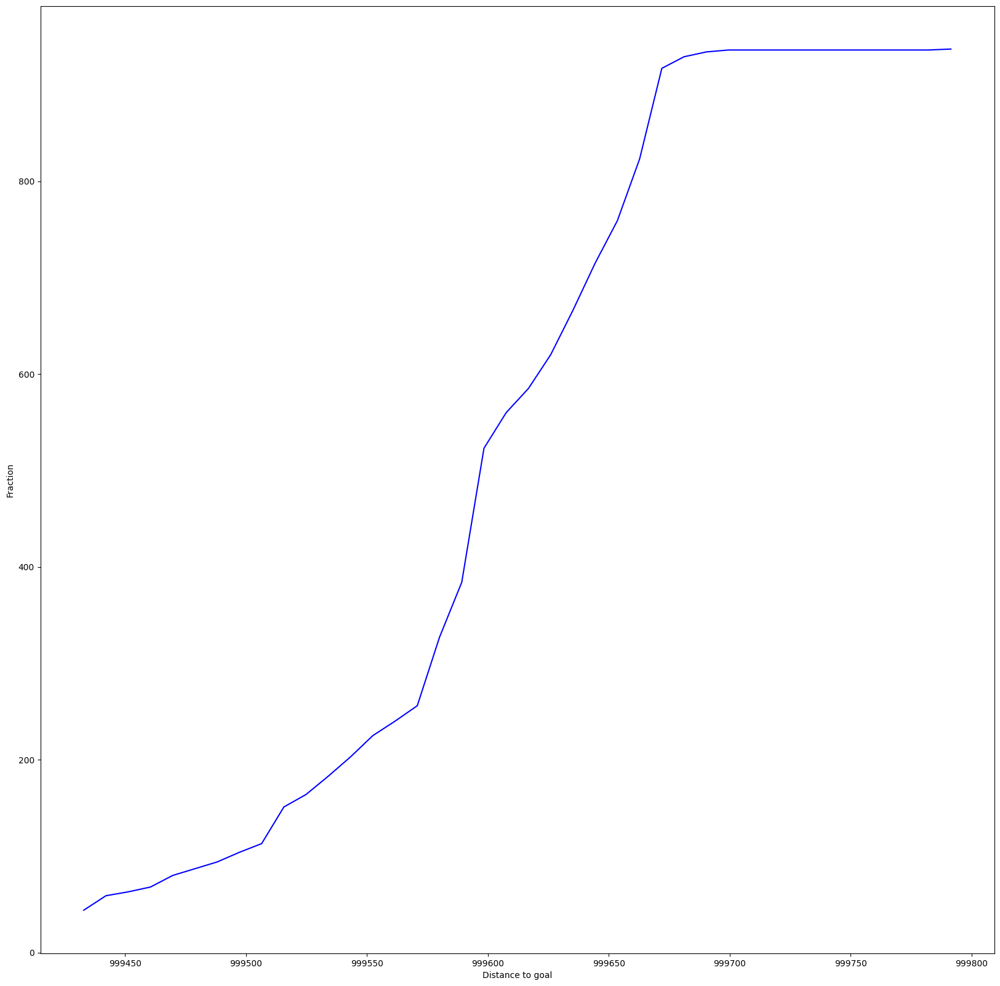

In [ ]:
plot_cumulative_distro_objective(archive)

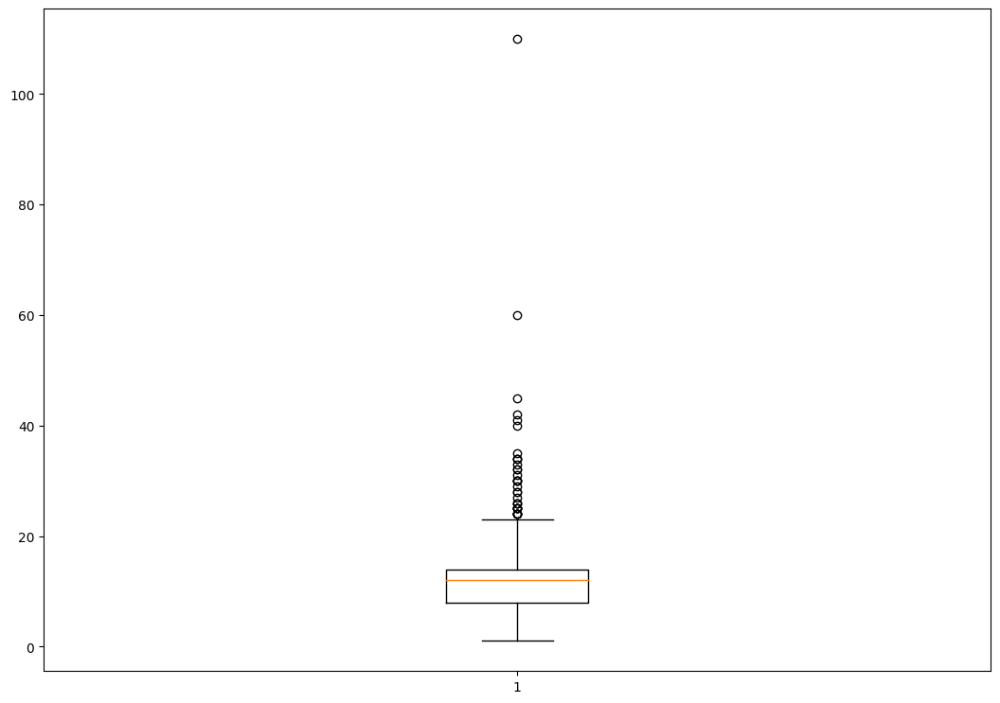

In [ ]:
plot_solution_spread(archive)

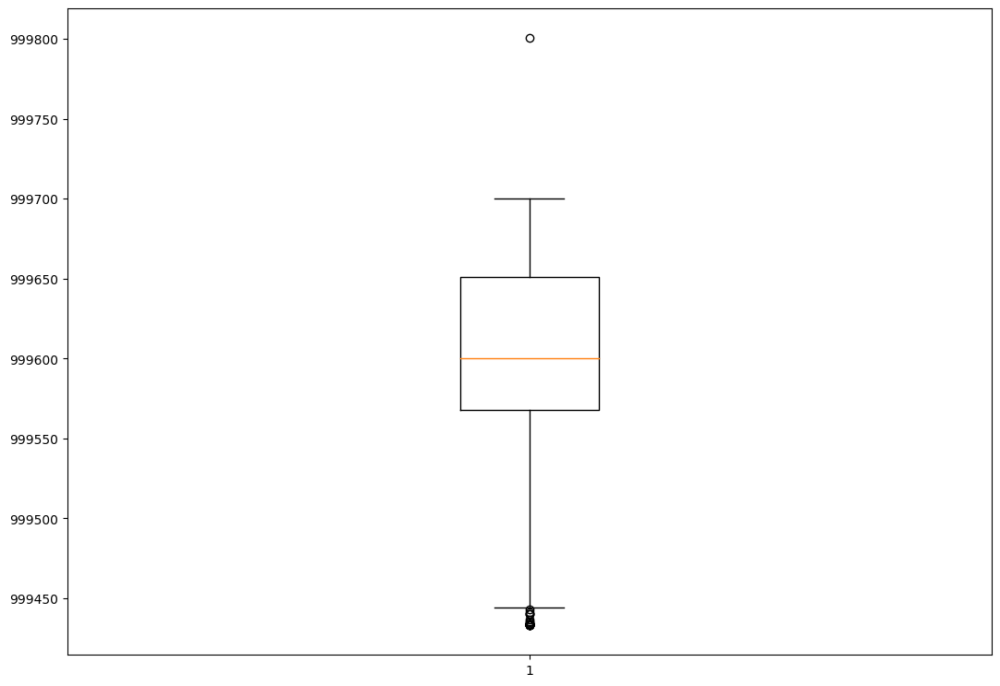

In [ ]:
plot_solution_distance(archive)

**som**

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1")

extra time to initialize archive 0.00020503997802734375
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.03473472595214844
Iterations:   1%|          | 1/100 [00:18<30:56, 18.75s/it]archive training
time to add to som 0.017830610275268555
Iterations:   2%|▏         | 2/100 [00:37<31:01, 19.00s/it]archive training
time to add to som 0.010776996612548828
Iterations:   3%|▎         | 3/100 [01:03<35:23, 21.90s/it]archive training
time to add to som 0.01338338851928711
Iterations:   4%|▍         | 4/100 [01:25<35:12, 22.01s/it]archive training
time to add to som 0.011223554611206055
Iterations:   5%|▌         | 5/100 [01:43<32:48, 20.72s/it]archive training
time to add to som 0.012009382247924805
Iterations:   6%|▌         | 6/100 [02:01<30:58, 19.78s/it]archive training
time to add to som 0.012778282165527344
Iterations:   7%|▋         | 7/100 [02:20<30:12, 19.49s/it]archive training
time to add to som 0.012423515319824219
Iterations:   8%|▊        

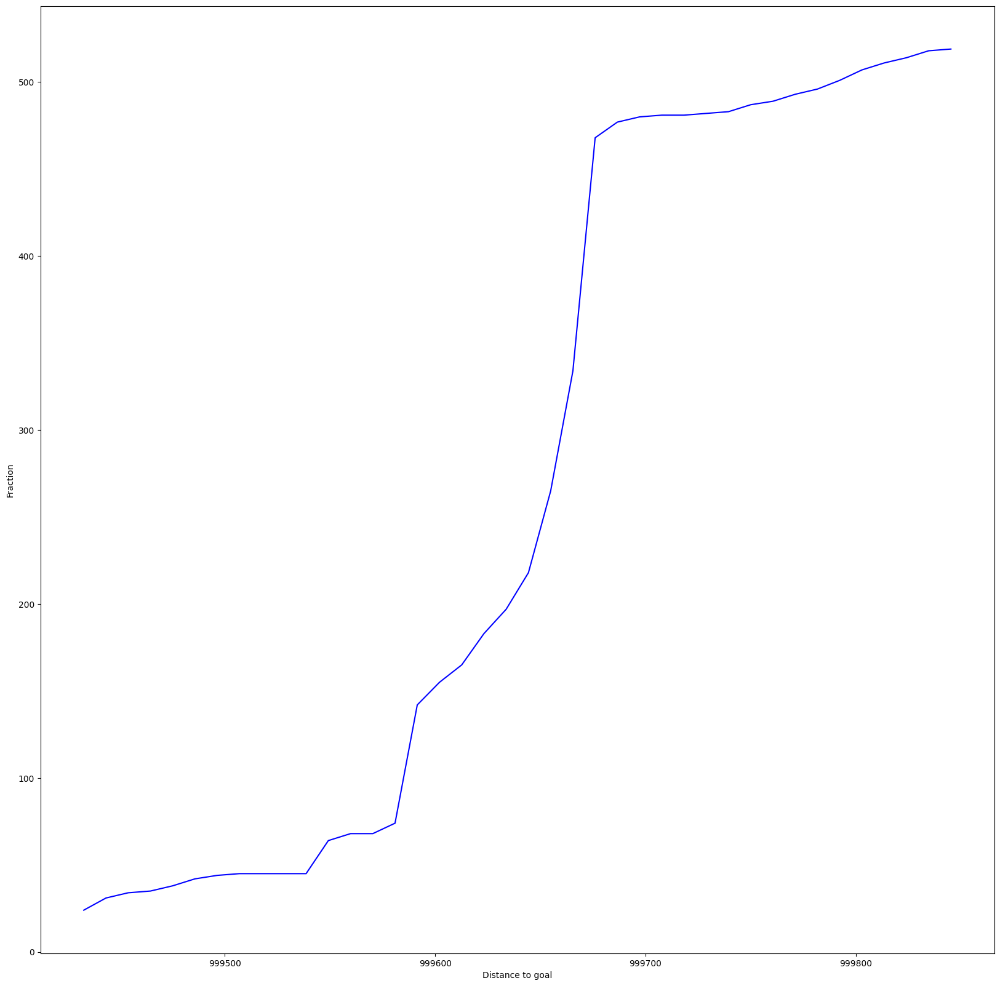

In [ ]:
plot_cumulative_distro_objective(archive)

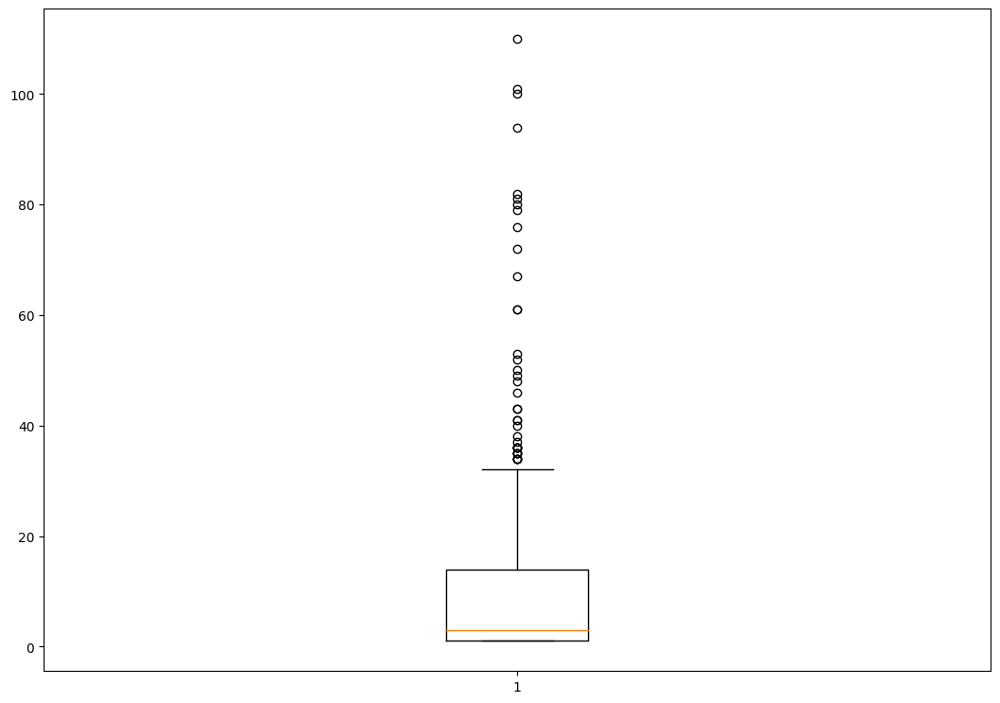

In [ ]:
plot_solution_spread(archive)

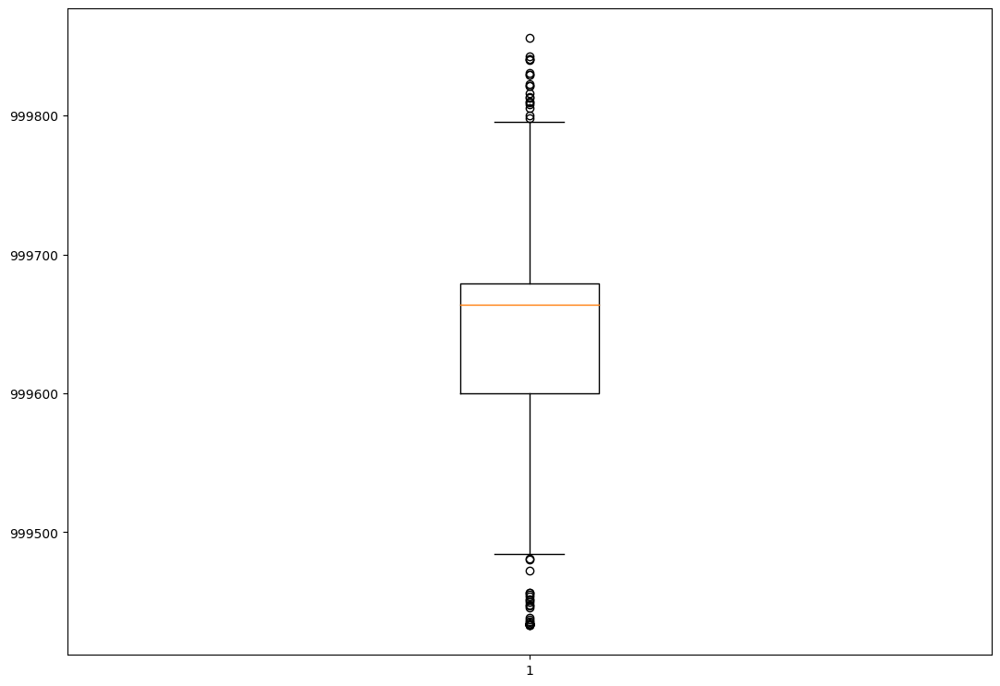

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.001506805419921875
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 4.3845601081848145
Iterations:   1%|          | 1/100 [00:41<1:07:40, 41.02s/it]archive training
time to add to som 0.01263737678527832
Iterations:   2%|▏         | 2/100 [01:05<50:57, 31.20s/it]  archive training
time to add to som 0.026417970657348633
Iterations:   3%|▎         | 3/100 [01:37<51:19, 31.74s/it]archive training
time to add to som 0.014970541000366211
Iterations:   4%|▍         | 4/100 [02:01<46:03, 28.78s/it]archive training
time to add to som 0.02992701530456543
Iterations:   5%|▌         | 5/100 [02:29<45:00, 28.42s/it]archive training
time to add to som 0.015730619430541992
Iterations:   6%|▌         | 6/100 [02:57<44:23, 28.34s/it]archive training
time to add to som 0.016521453857421875
Iterations:   7%|▋         | 7/100 [03:15<38:40, 24.95s/it]archive training
time to add to som 0.017621755599975586
Iterations:   8%|▊        

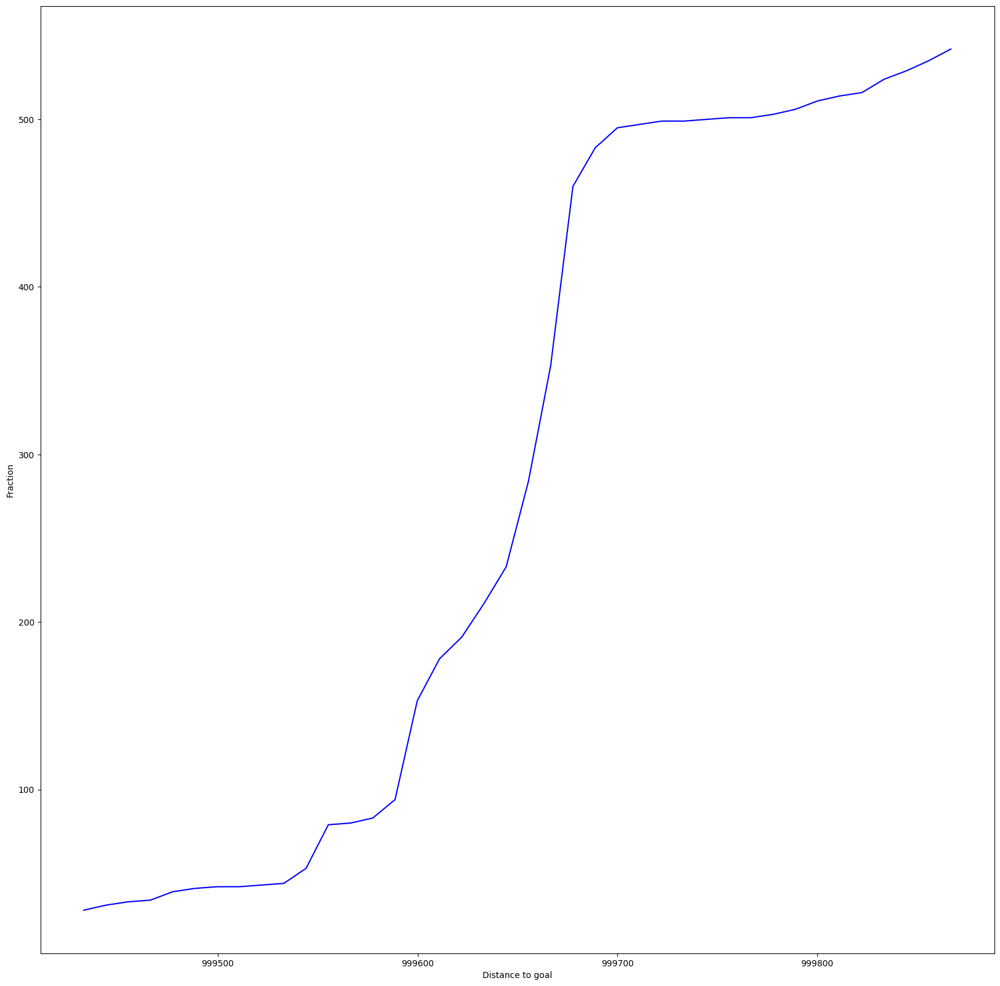

In [ ]:
plot_cumulative_distro_objective(archive)


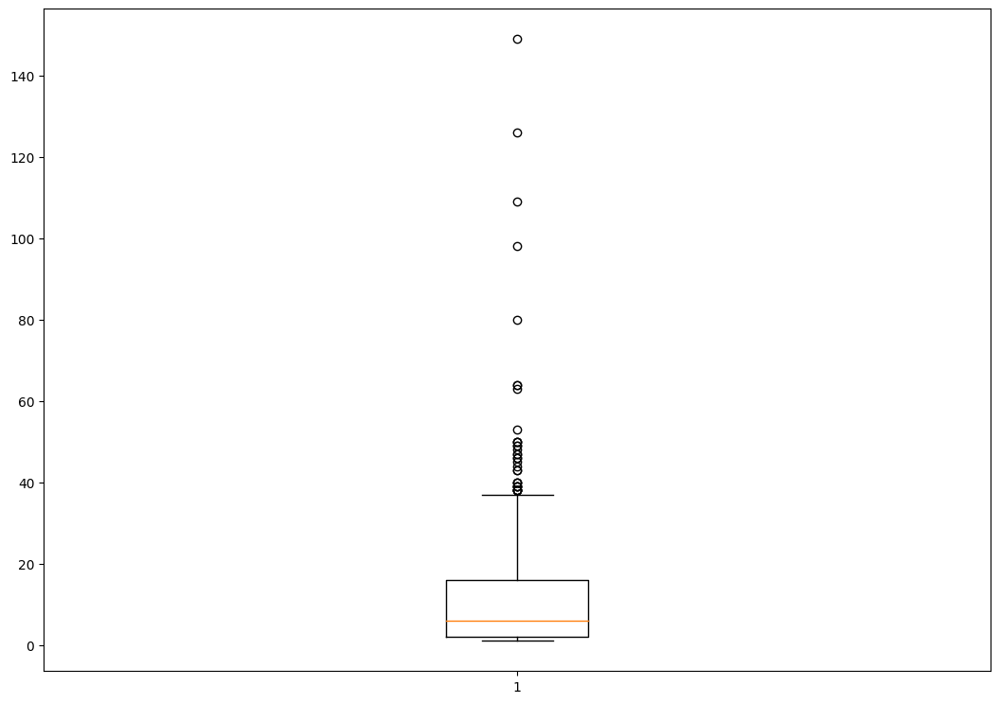

In [ ]:
plot_solution_spread(archive)


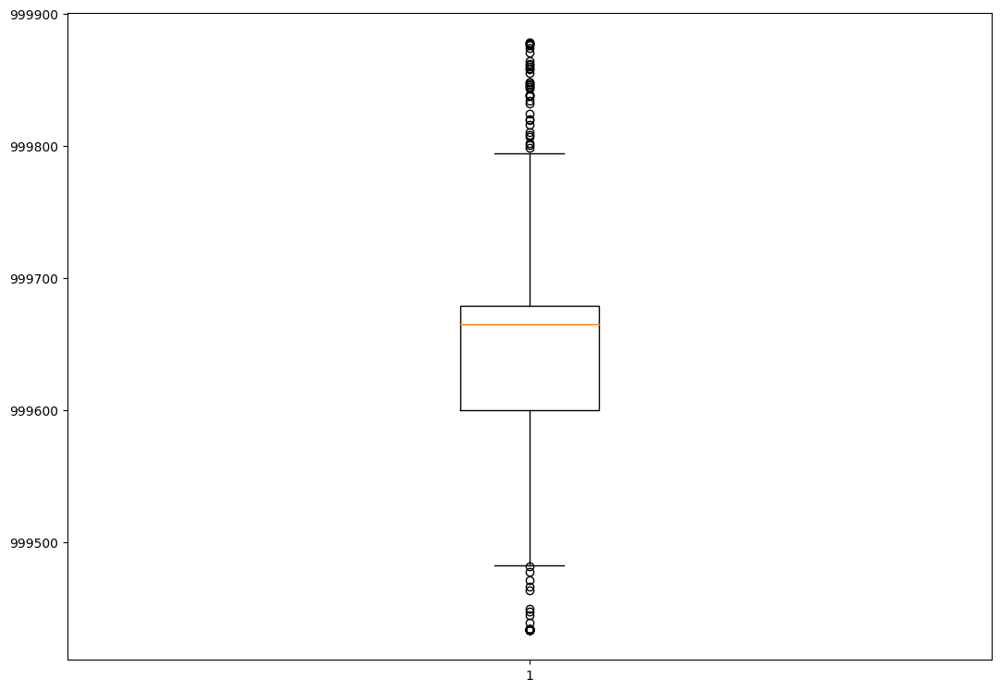

In [ ]:
plot_solution_distance(archive)

som doppio multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0003752708435058594
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 2.667714834213257
Iterations:   1%|          | 1/100 [00:24<39:56, 24.20s/it]archive training
time to add to som 0.013181447982788086
Iterations:   2%|▏         | 2/100 [00:43<34:27, 21.10s/it]archive training
time to add to som 0.020090579986572266
Iterations:   3%|▎         | 3/100 [01:02<33:03, 20.44s/it]archive training
time to add to som 0.015433549880981445
Iterations:   4%|▍         | 4/100 [01:22<32:03, 20.04s/it]archive training
time to add to som 0.015135049819946289
Iterations:   5%|▌         | 5/100 [01:41<31:06, 19.64s/it]archive training
time to add to som 0.015566349029541016
Iterations:   6%|▌         | 6/100 [02:00<30:23, 19.39s/it]archive training
time to add to som 0.025306224822998047
Iterations:   7%|▋         | 7/100 [02:19<30:02, 19.38s/it]archive training
time to add to som 0.01702117919921875
Iterations:   8%|▊         | 

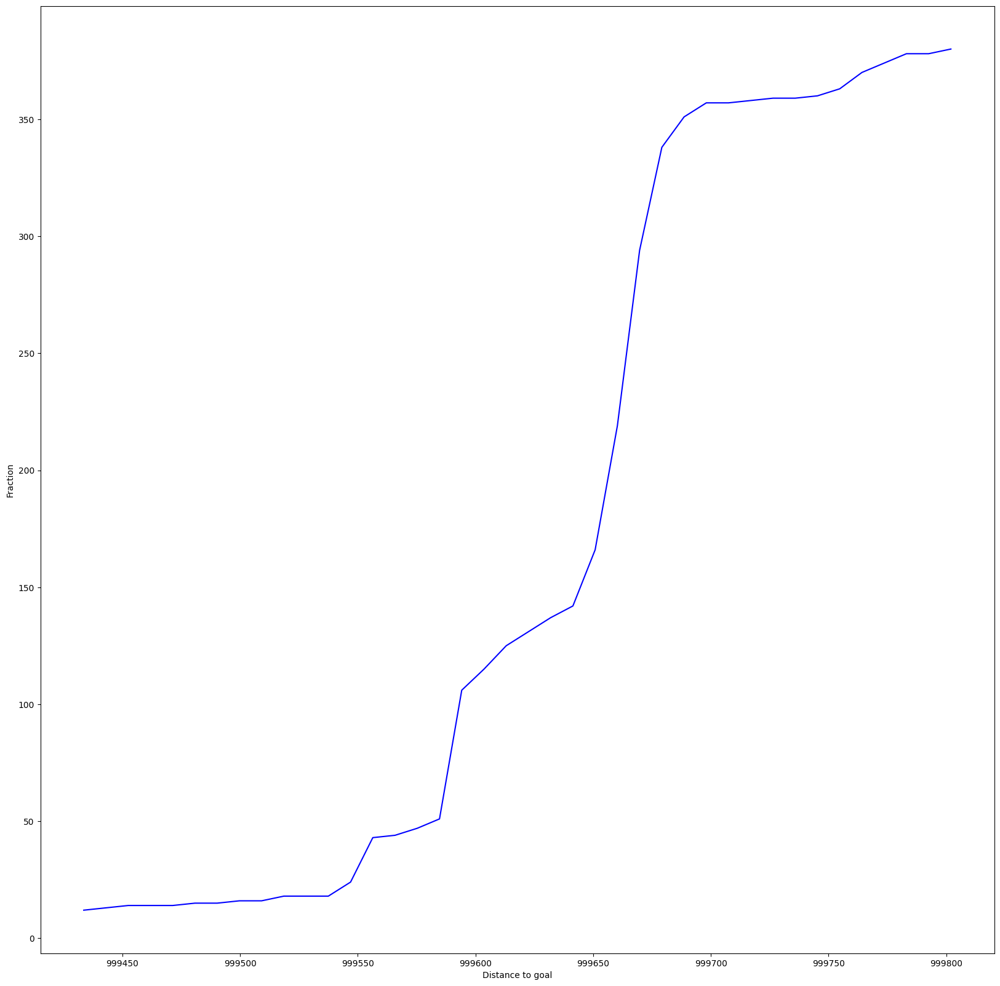

In [ ]:
plot_cumulative_distro_objective(archive)

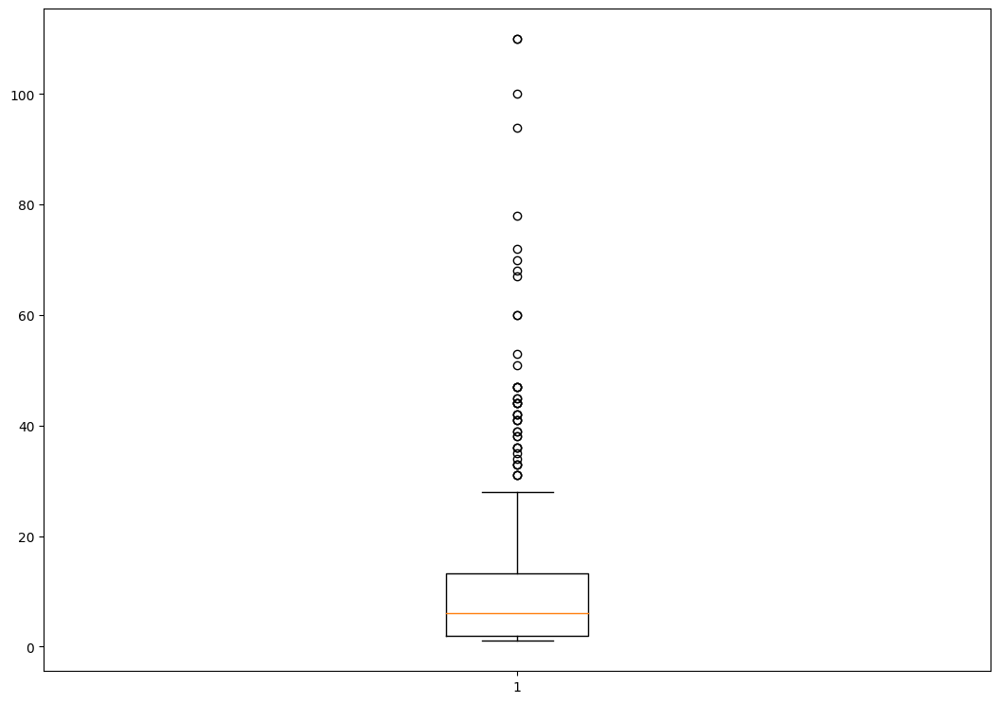

In [ ]:
plot_solution_spread(archive)

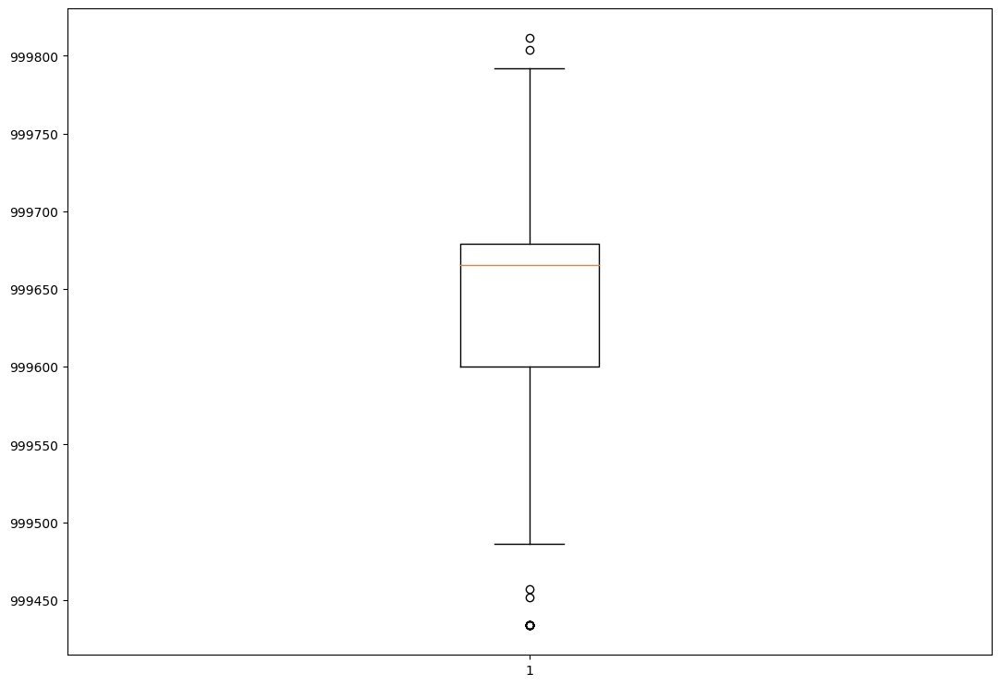

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0037055015563964844
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 2.7882168292999268
Iterations:   1%|          | 1/100 [00:23<39:11, 23.76s/it]archive training
time to add to som 0.021662235260009766
Iterations:   2%|▏         | 2/100 [00:42<33:44, 20.66s/it]archive training
time to add to som 0.015377044677734375
Iterations:   3%|▎         | 3/100 [01:00<31:44, 19.63s/it]archive training
time to add to som 0.017274141311645508
Iterations:   4%|▍         | 4/100 [01:19<30:42, 19.20s/it]archive training
time to add to som 0.018670082092285156
Iterations:   5%|▌         | 5/100 [01:37<29:43, 18.77s/it]archive training
time to add to som 0.03856301307678223
Iterations:   6%|▌         | 6/100 [01:56<29:25, 18.78s/it]archive training
time to add to som 0.032559871673583984
Iterations:   7%|▋         | 7/100 [02:17<30:14, 19.51s/it]archive training
time to add to som 0.030086994171142578
Iterations:   8%|▊         |

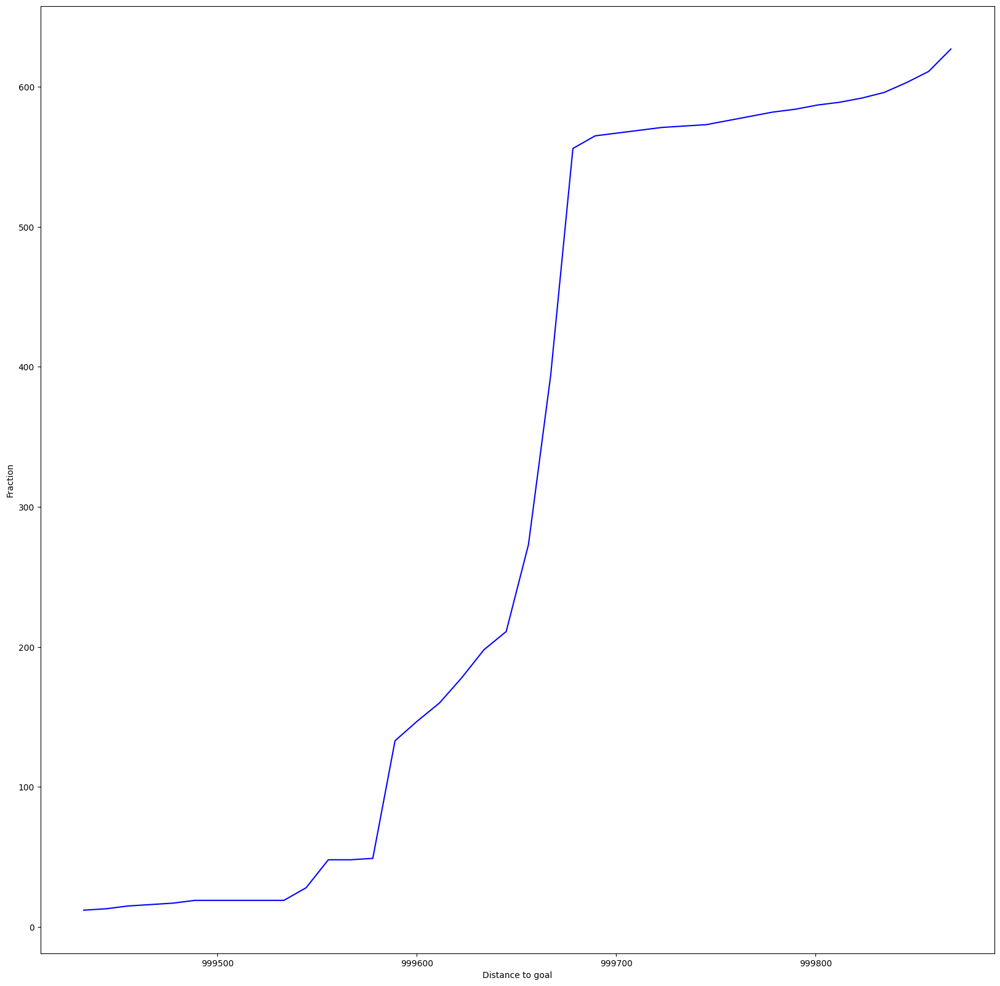

In [ ]:
plot_cumulative_distro_objective(archive)


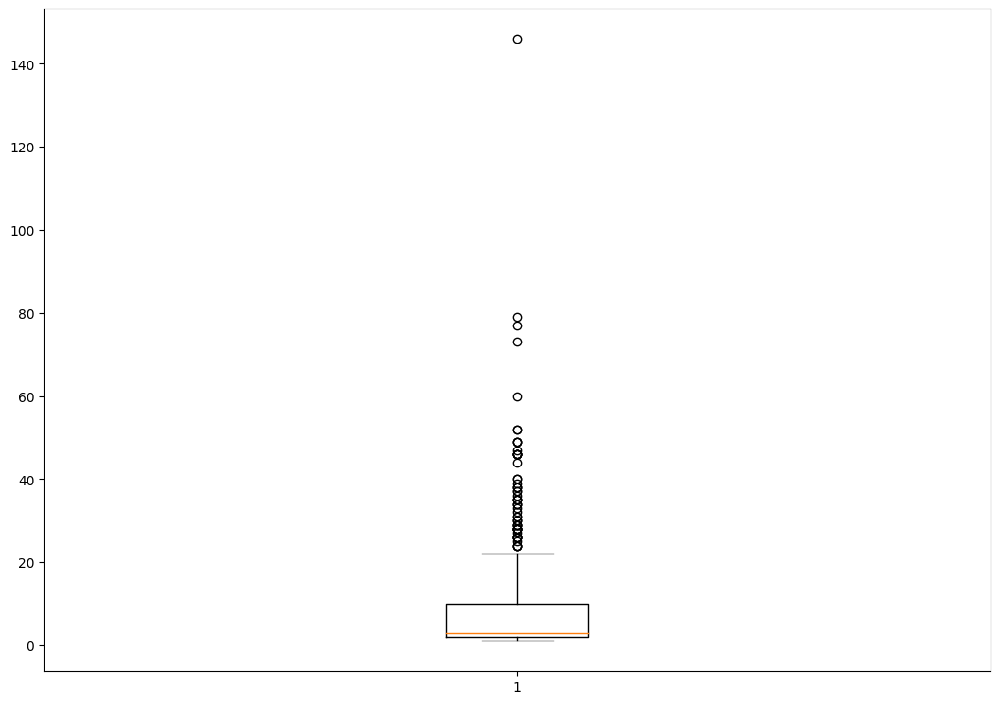

In [ ]:
plot_solution_spread(archive)


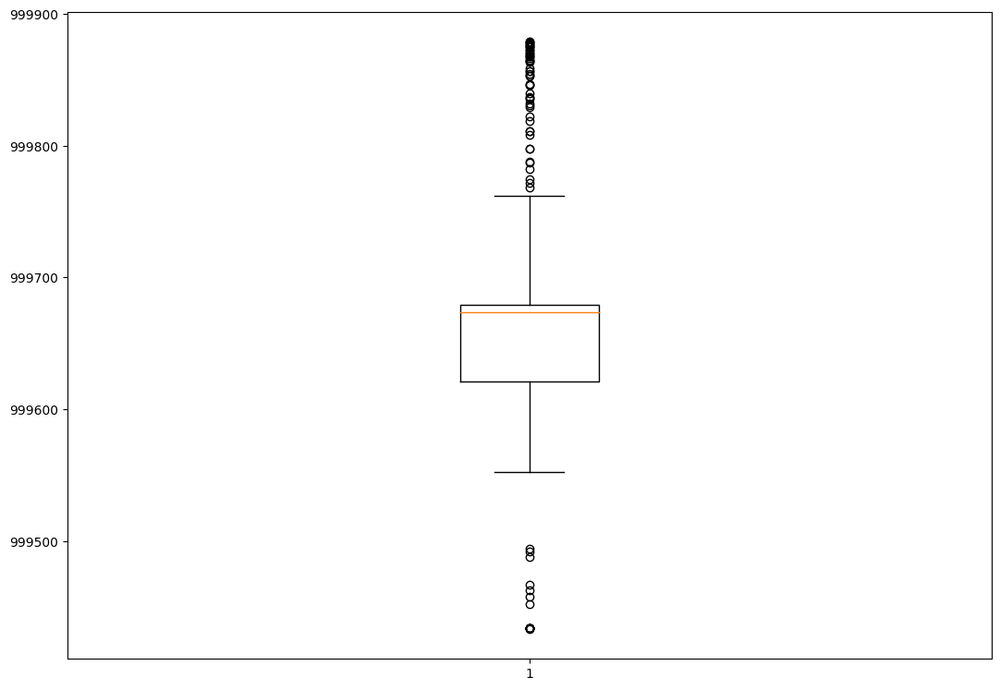

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003502368927001953
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 2.690682888031006
Iterations:   1%|          | 1/100 [00:25<41:47, 25.32s/it]archive training
time to add to som 0.019121170043945312
Iterations:   2%|▏         | 2/100 [00:44<35:41, 21.85s/it]archive training
time to add to som 0.05690360069274902
Iterations:   3%|▎         | 3/100 [01:04<33:34, 20.77s/it]archive training
time to add to som 0.015035390853881836
Iterations:   4%|▍         | 4/100 [01:23<32:01, 20.02s/it]archive training
time to add to som 0.024770021438598633
Iterations:   5%|▌         | 5/100 [01:52<36:49, 23.26s/it]archive training
time to add to som 0.018248558044433594
Iterations:   6%|▌         | 6/100 [02:16<36:48, 23.50s/it]archive training
time to add to som 0.030086040496826172
Iterations:   7%|▋         | 7/100 [02:35<34:36, 22.32s/it]archive training
time to add to som 0.021401643753051758
Iterations:   8%|▊         | 

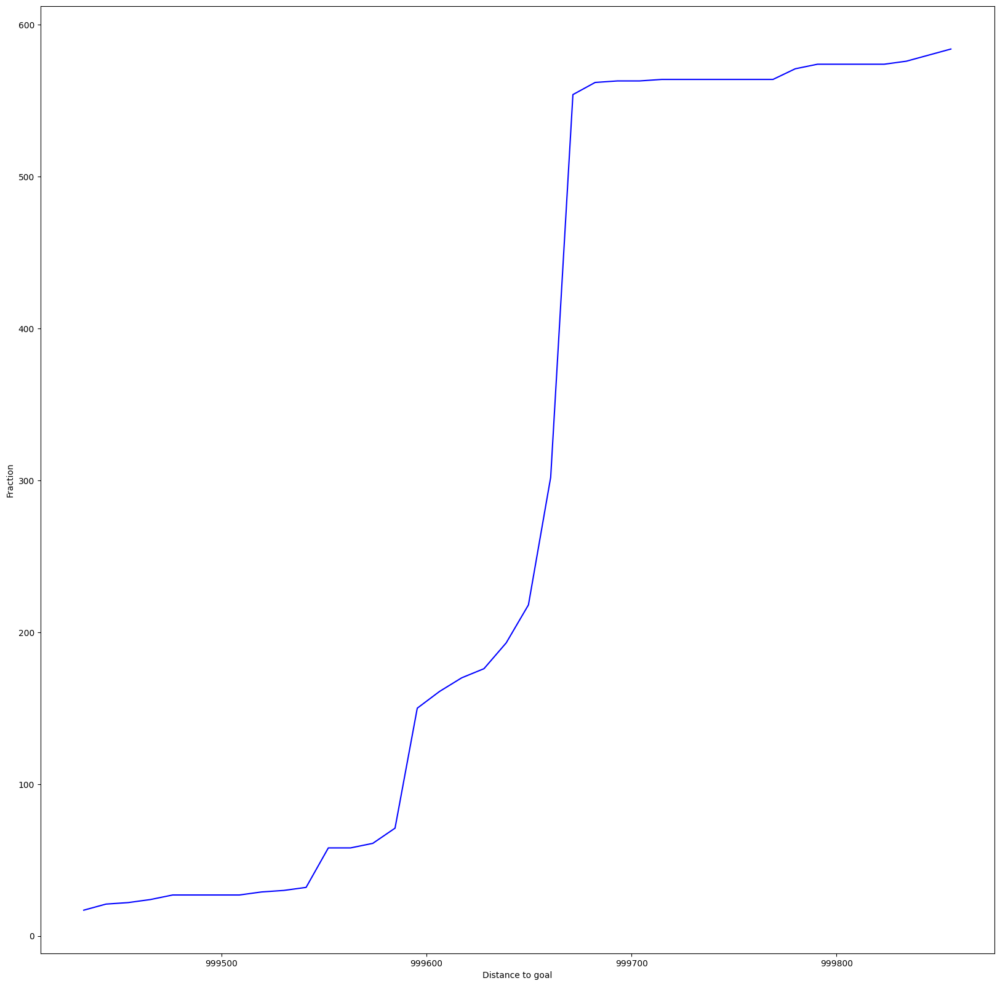

In [ ]:
plot_cumulative_distro_objective(archive)

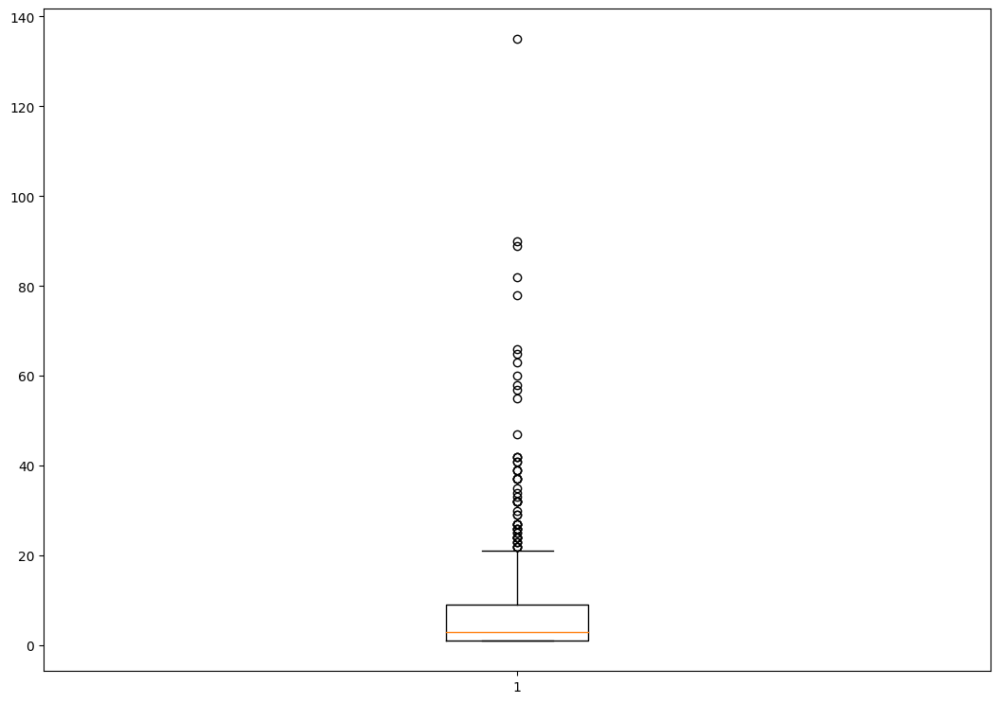

In [ ]:
plot_solution_spread(archive)

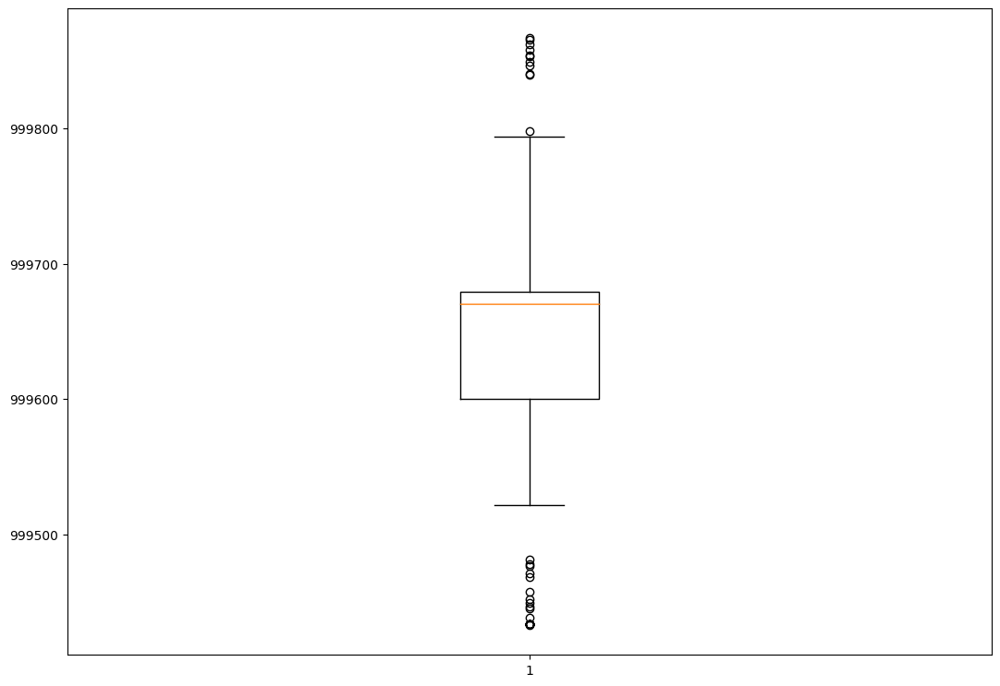

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 2, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0007090568542480469
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.021807193756103516
Iterations:   1%|          | 1/100 [00:20<34:19, 20.80s/it]archive training
time to add to som 0.014156579971313477
Iterations:   2%|▏         | 2/100 [00:39<32:21, 19.81s/it]archive training
time to add to som 0.015404224395751953
Iterations:   3%|▎         | 3/100 [01:01<33:12, 20.54s/it]archive training
time to add to som 0.02499532699584961
Iterations:   4%|▍         | 4/100 [01:21<32:48, 20.50s/it]archive training
time to add to som 0.017519474029541016
Iterations:   5%|▌         | 5/100 [01:42<32:25, 20.48s/it]archive training
time to add to som 0.019919157028198242
Iterations:   6%|▌         | 6/100 [02:02<31:52, 20.35s/it]archive training
time to add to som 0.019350290298461914
Iterations:   7%|▋         | 7/100 [02:22<31:29, 20.32s/it]archive training
time to add to som 0.0203399658203125
Iterations:   8%|▊         |

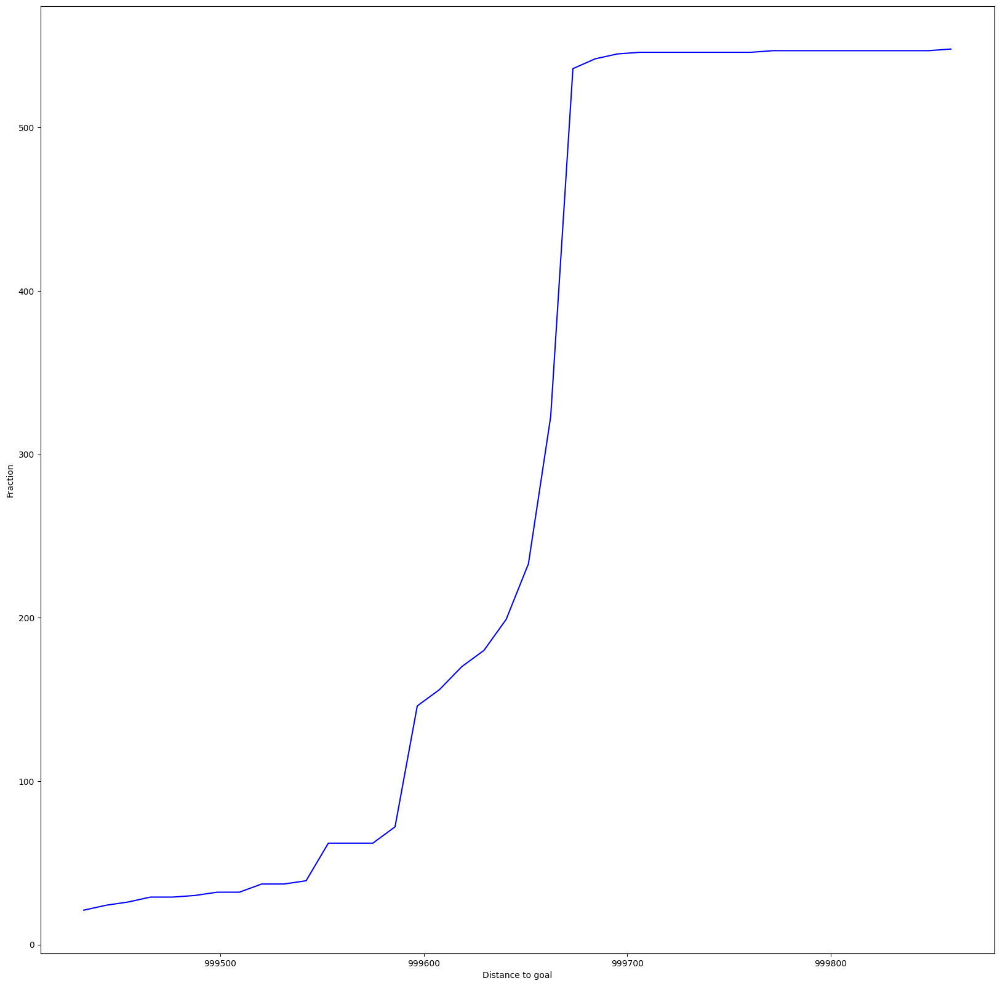

In [ ]:
plot_cumulative_distro_objective(archive)

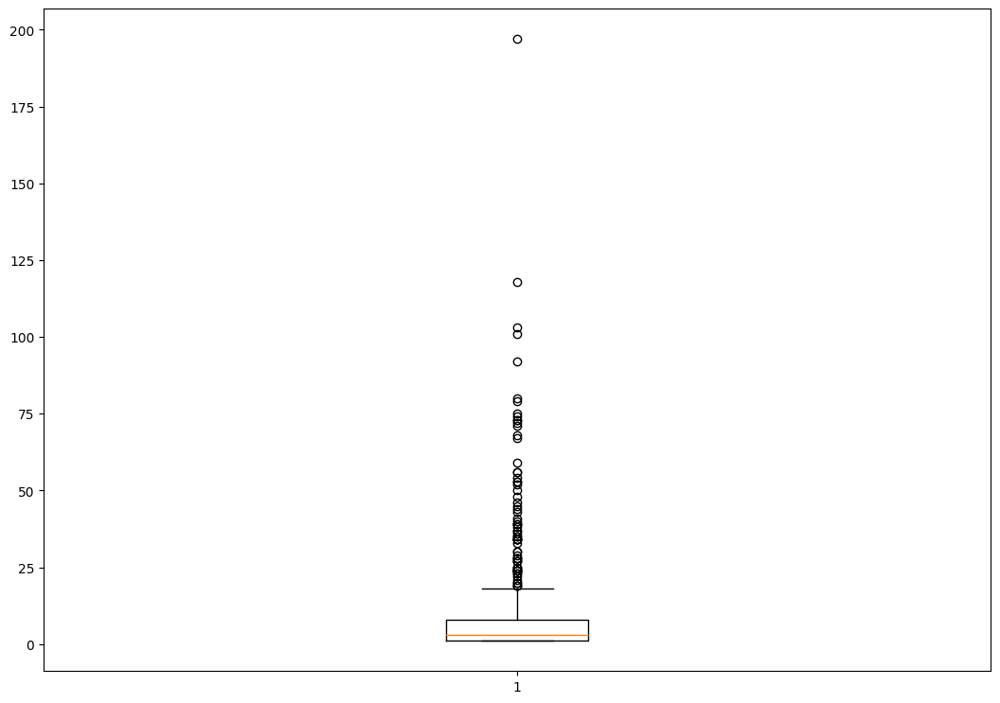

In [ ]:
plot_solution_spread(archive)

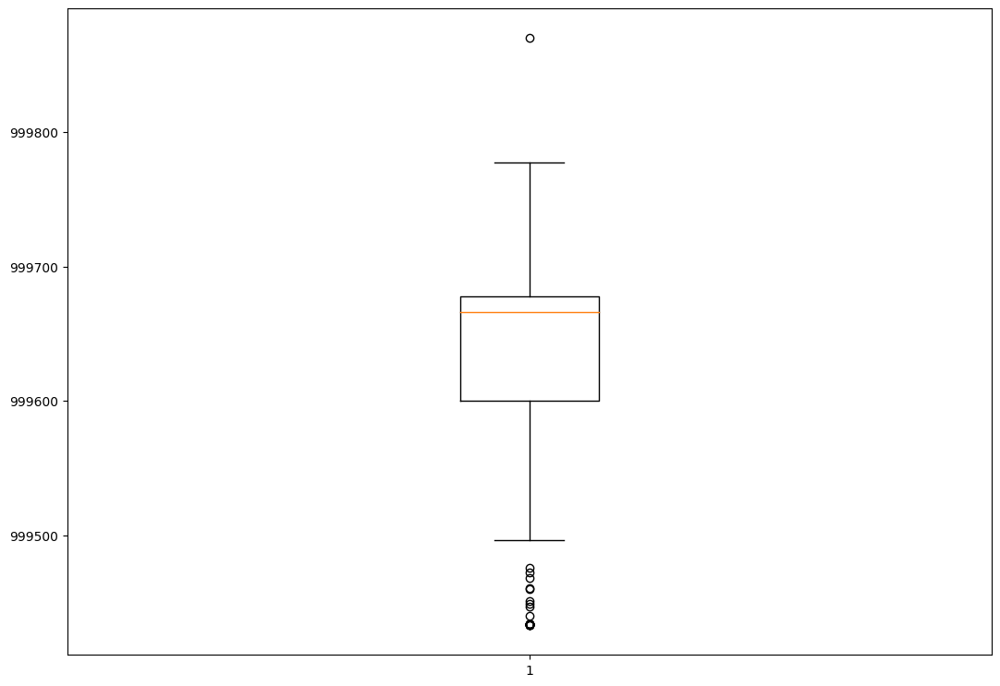

In [ ]:
plot_solution_distance(archive)

######*11.1.3 50d*

cvt

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze1", dim = 50)

extra time to initialize archive 71.90693831443787
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 2.769134759902954
Iterations:   1%|          | 1/100 [00:52<1:26:22, 52.35s/it]archive training
time to add to cvt 0.028310537338256836
Iterations:   2%|▏         | 2/100 [01:24<1:06:18, 40.59s/it]archive training
time to add to cvt 0.028954505920410156
Iterations:   3%|▎         | 3/100 [01:57<59:44, 36.95s/it]  archive training
time to add to cvt 0.029019594192504883
Iterations:   4%|▍         | 4/100 [02:29<56:14, 35.15s/it]archive training
time to add to cvt 0.043239593505859375
Iterations:   5%|▌         | 5/100 [03:02<54:24, 34.36s/it]archive training
time to add to cvt 0.03528904914855957
Iterations:   6%|▌         | 6/100 [03:35<53:05, 33.89s/it]archive training
time to add to cvt 0.02868056297302246
Iterations:   7%|▋         | 7/100 [04:08<52:03, 33.58s/it]archive training
time to add to cvt 0.027514934539794922
Iterations:   8%|▊         |

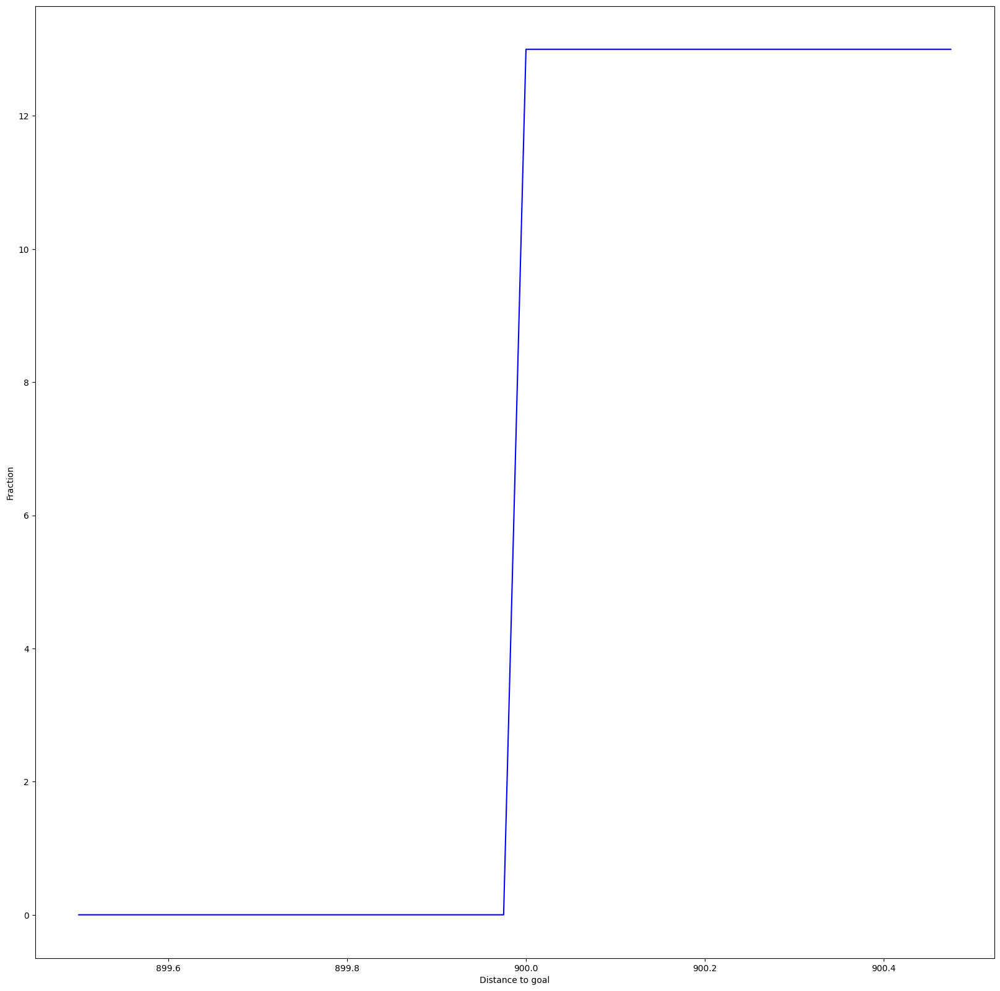

In [ ]:
plot_cumulative_distro_objective(archive)

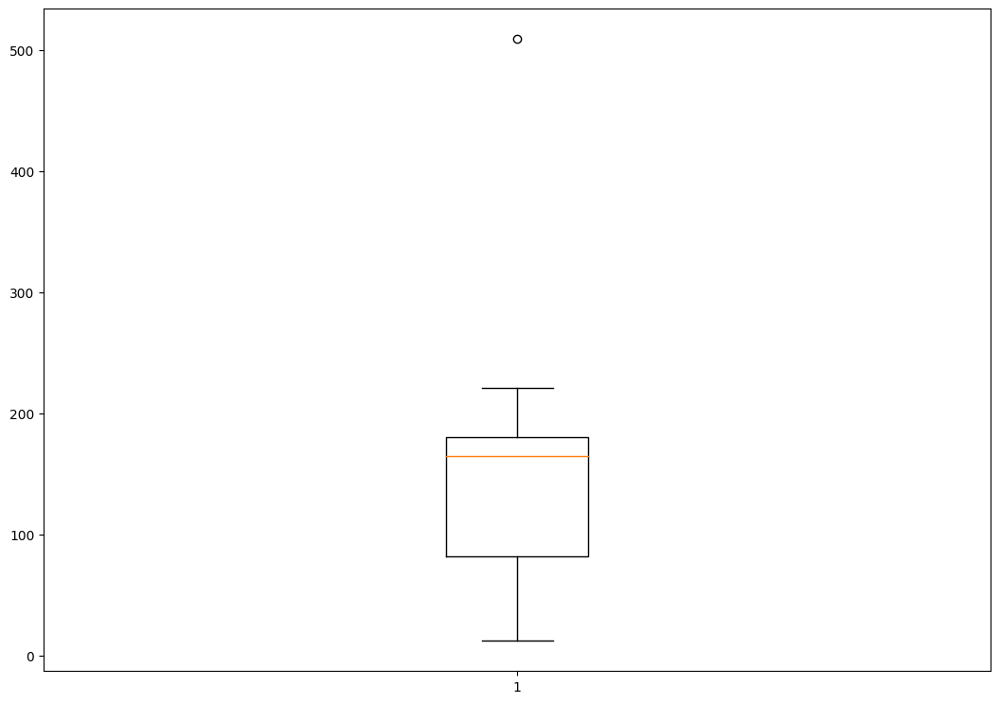

In [ ]:
plot_solution_spread(archive)

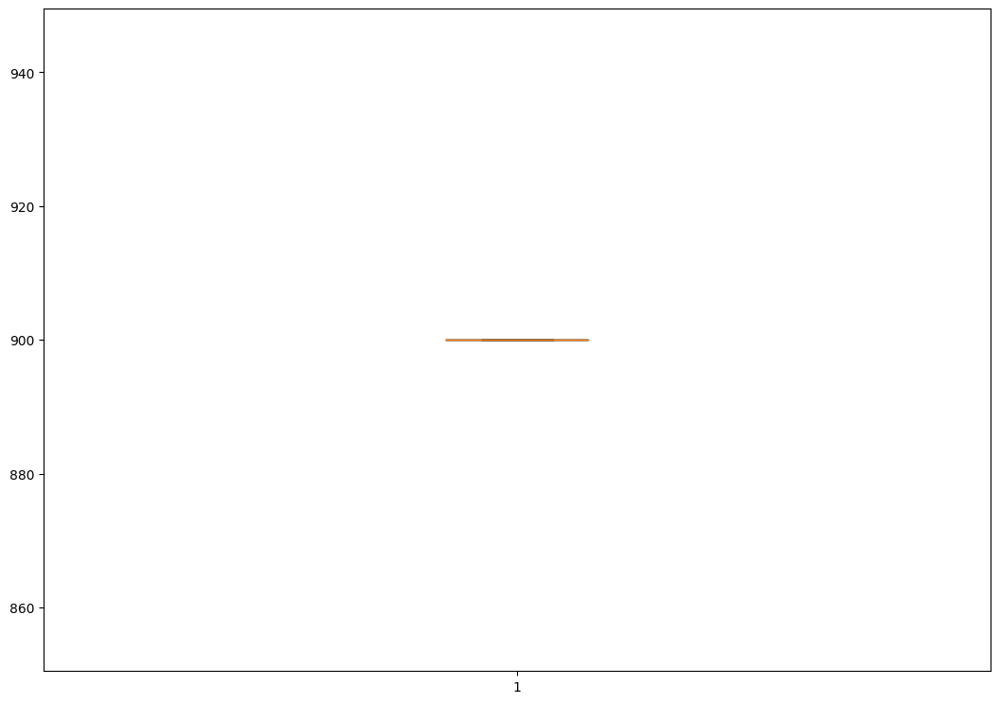

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 50)

extra time to initialize archive 0.0003199577331542969
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 3.240696430206299
Iterations:   1%|          | 1/100 [00:23<38:12, 23.15s/it]archive training
time to add to som 0.012979745864868164
Iterations:   2%|▏         | 2/100 [00:40<31:53, 19.53s/it]archive training
time to add to som 0.014992713928222656
Iterations:   3%|▎         | 3/100 [00:57<29:52, 18.48s/it]archive training
time to add to som 0.016273021697998047
Iterations:   4%|▍         | 4/100 [01:14<28:51, 18.04s/it]archive training
time to add to som 0.018842697143554688
Iterations:   5%|▌         | 5/100 [01:32<28:38, 18.09s/it]archive training
time to add to som 0.02900385856628418
Iterations:   6%|▌         | 6/100 [01:50<28:15, 18.04s/it]archive training
time to add to som 0.030797243118286133
Iterations:   7%|▋         | 7/100 [02:08<27:50, 17.96s/it]archive training
time to add to som 0.020089149475097656
Iterations:   8%|▊         | 

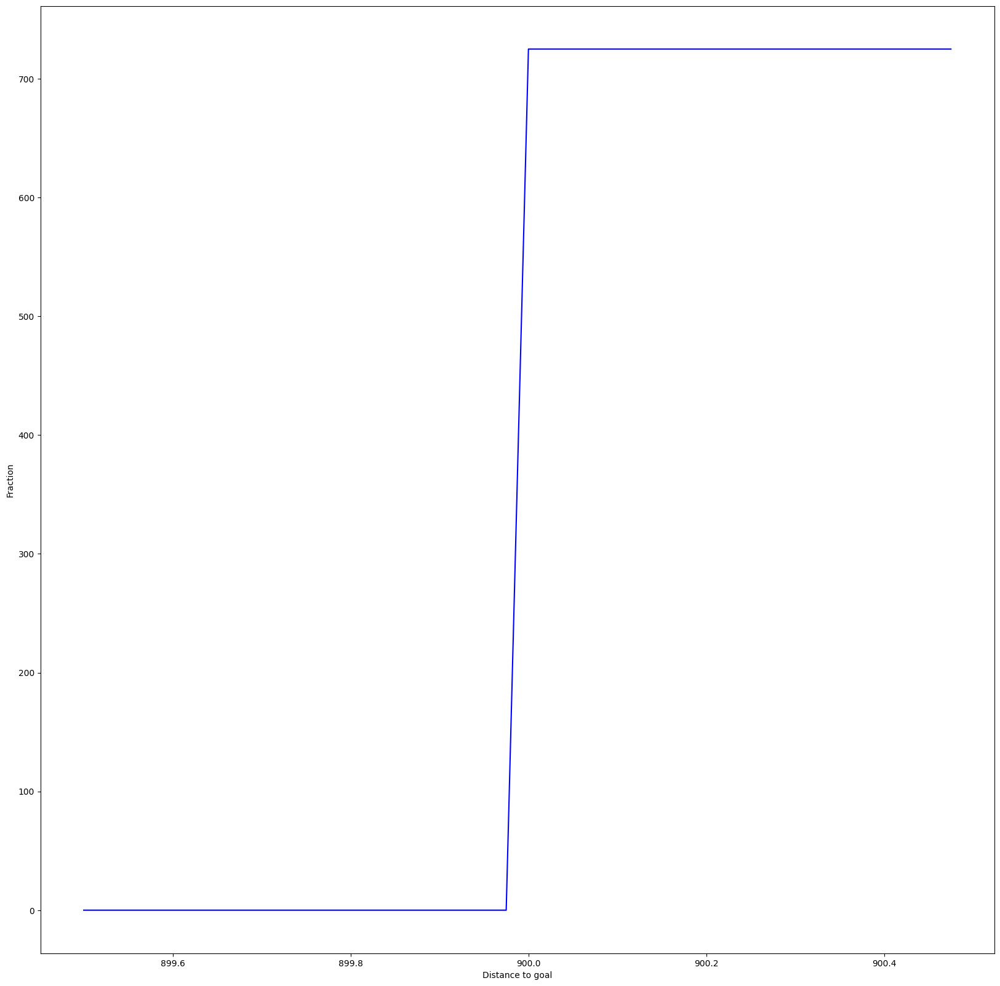

In [ ]:
plot_cumulative_distro_objective(archive)

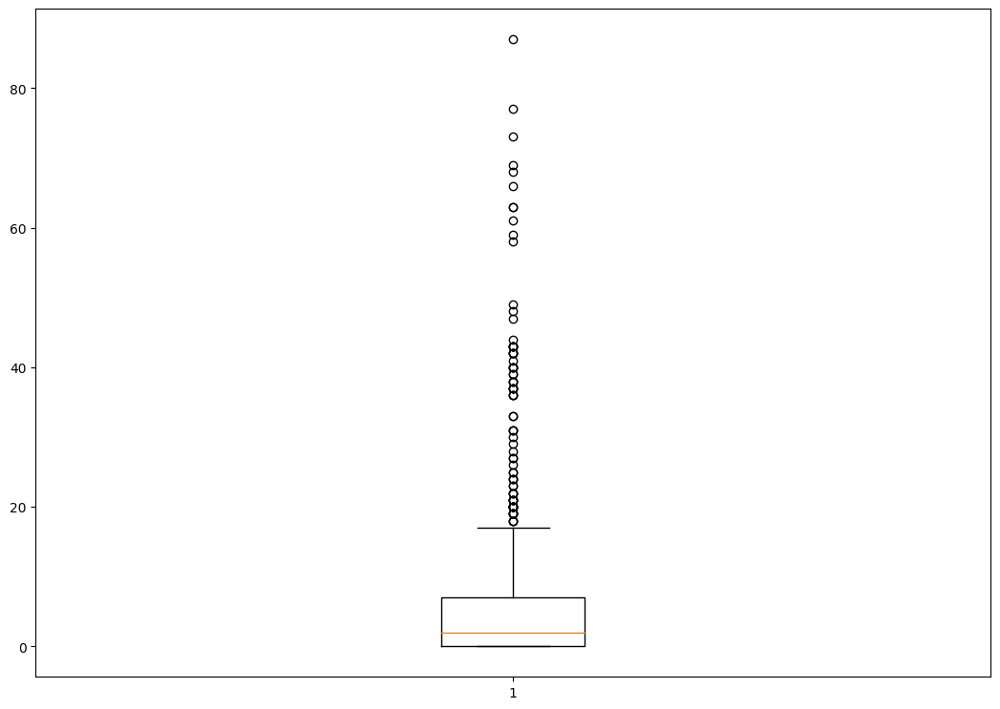

In [ ]:
plot_solution_spread(archive)

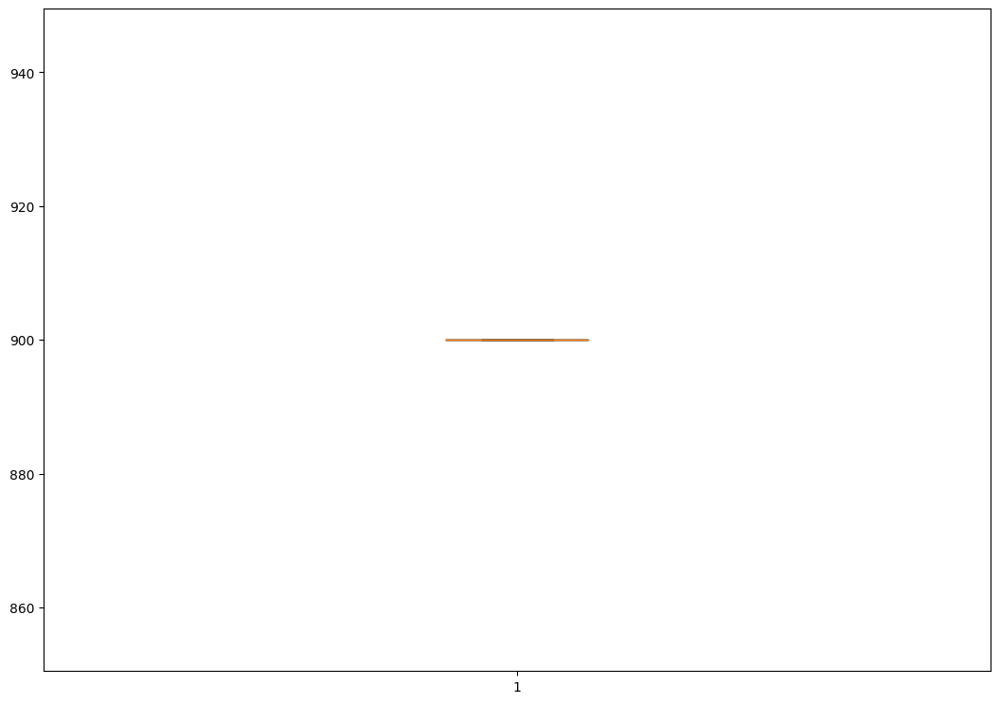

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })


extra time to initialize archive 0.0009987354278564453
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012004852294921875
Iterations:   1%|          | 1/100 [00:17<29:38, 17.96s/it]archive training
time to add to som 0.013878345489501953
Iterations:   2%|▏         | 2/100 [00:36<29:26, 18.02s/it]archive training
time to add to som 0.024061203002929688
Iterations:   3%|▎         | 3/100 [00:54<29:37, 18.33s/it]archive training
time to add to som 0.025831222534179688
Iterations:   4%|▍         | 4/100 [01:14<30:10, 18.85s/it]archive training
time to add to som 0.018740177154541016
Iterations:   5%|▌         | 5/100 [01:32<29:41, 18.75s/it]archive training
time to add to som 0.022278547286987305
Iterations:   6%|▌         | 6/100 [01:51<29:19, 18.71s/it]archive training
time to add to som 0.02097797393798828
Iterations:   7%|▋         | 7/100 [02:10<28:51, 18.62s/it]archive training
time to add to som 0.0336456298828125
Iterations:   8%|▊         |

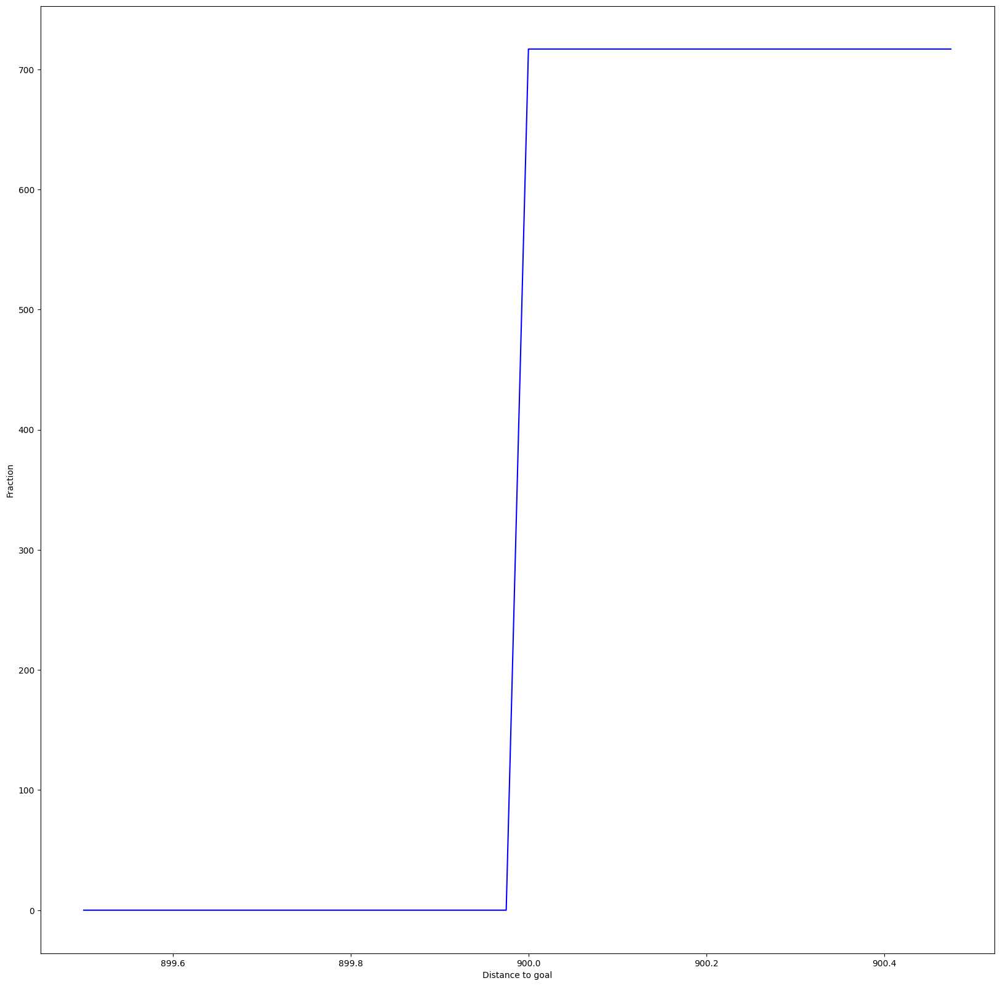

In [ ]:
plot_cumulative_distro_objective(archive)

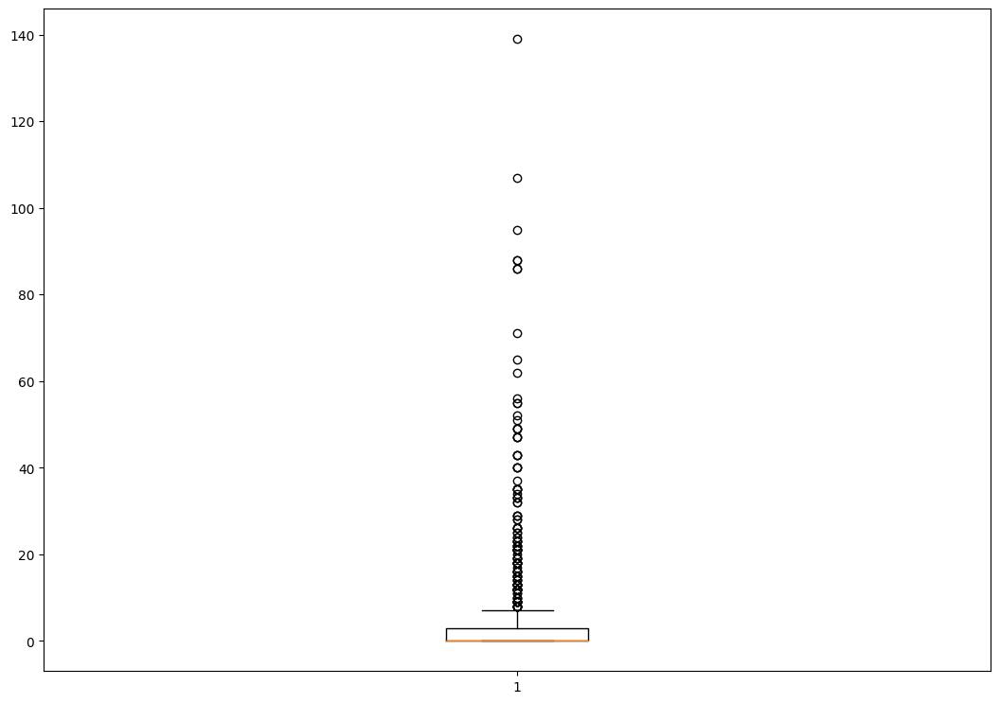

In [ ]:
plot_solution_spread(archive)

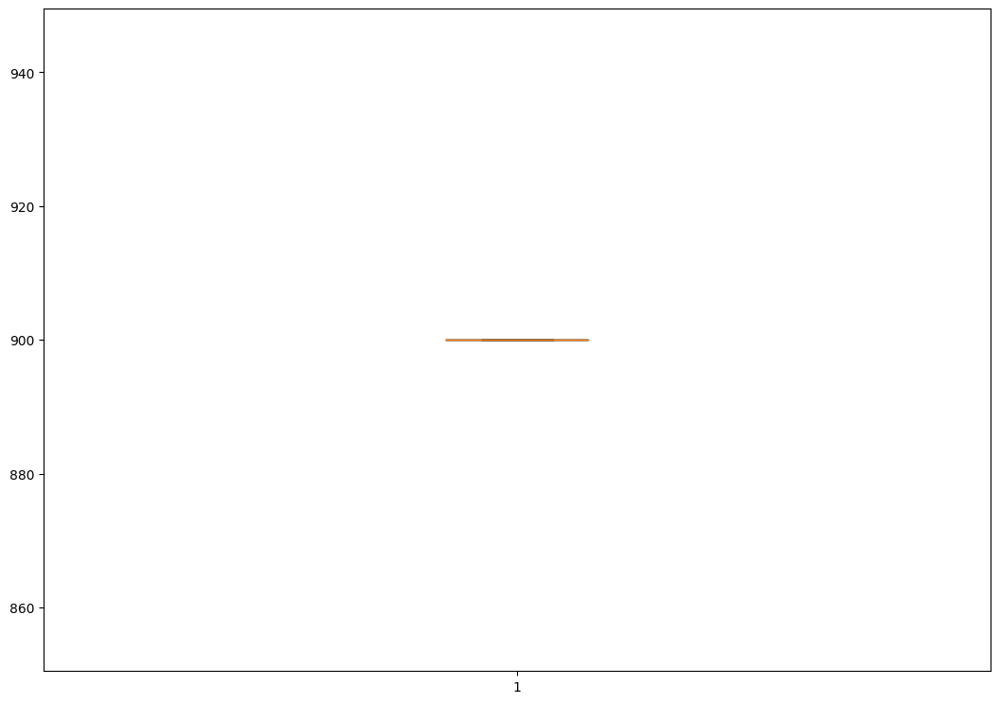

In [ ]:
plot_solution_distance(archive)

som doppio multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.0006427764892578125
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012614011764526367
Iterations:   1%|          | 1/100 [00:20<33:13, 20.13s/it]archive training
time to add to som 0.014748334884643555
Iterations:   2%|▏         | 2/100 [00:39<31:57, 19.57s/it]archive training
time to add to som 0.02450275421142578
Iterations:   3%|▎         | 3/100 [00:58<31:31, 19.50s/it]archive training
time to add to som 0.025142431259155273
Iterations:   4%|▍         | 4/100 [01:18<31:17, 19.56s/it]archive training
time to add to som 0.017604589462280273
Iterations:   5%|▌         | 5/100 [01:38<31:26, 19.85s/it]archive training
time to add to som 0.018872976303100586
Iterations:   6%|▌         | 6/100 [01:58<30:53, 19.72s/it]archive training
time to add to som 0.01957416534423828
Iterations:   7%|▋         | 7/100 [02:17<30:23, 19.61s/it]archive training
time to add to som 0.030341625213623047
Iterations:   8%|▊         

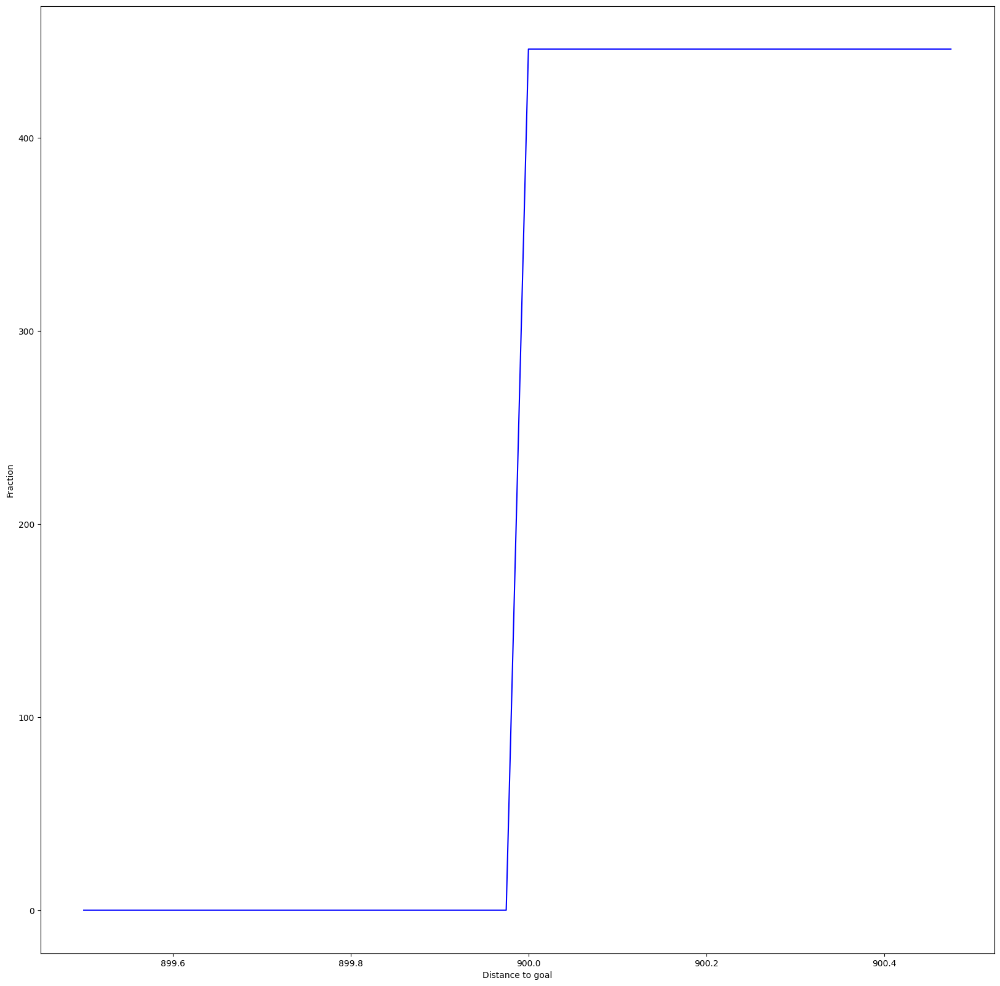

In [ ]:
plot_cumulative_distro_objective(archive)



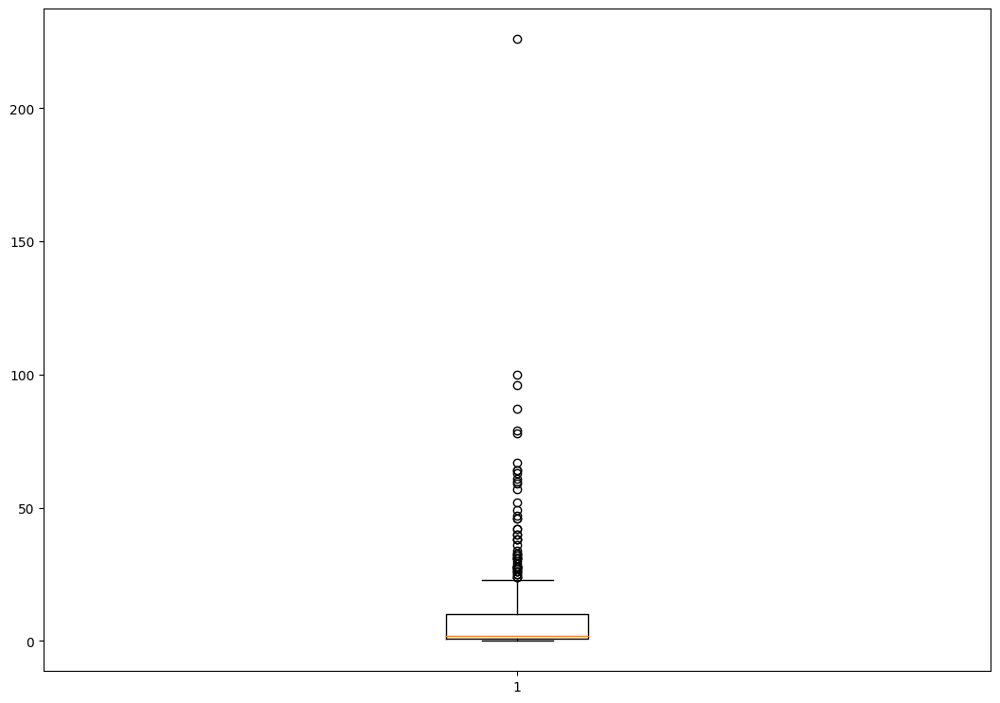

In [ ]:
plot_solution_spread(archive)

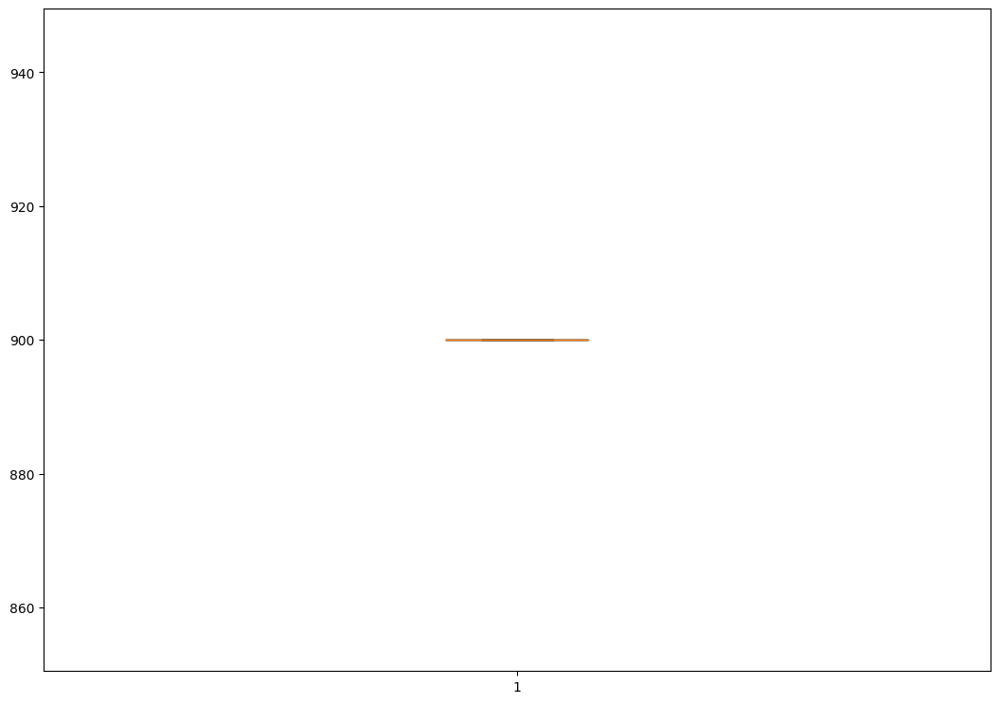

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.001008749008178711
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.013068199157714844
Iterations:   1%|          | 1/100 [00:17<29:18, 17.77s/it]archive training
time to add to som 0.02491140365600586
Iterations:   2%|▏         | 2/100 [00:35<29:25, 18.02s/it]archive training
time to add to som 0.01681661605834961
Iterations:   3%|▎         | 3/100 [00:53<29:02, 17.96s/it]archive training
time to add to som 0.034497737884521484
Iterations:   4%|▍         | 4/100 [01:12<28:58, 18.11s/it]archive training
time to add to som 0.020111083984375
Iterations:   5%|▌         | 5/100 [01:31<29:13, 18.46s/it]archive training
time to add to som 0.019238710403442383
Iterations:   6%|▌         | 6/100 [01:49<28:34, 18.24s/it]archive training
time to add to som 0.021960973739624023
Iterations:   7%|▋         | 7/100 [02:07<28:10, 18.18s/it]archive training
time to add to som 0.02154541015625
Iterations:   8%|▊         | 8/100 

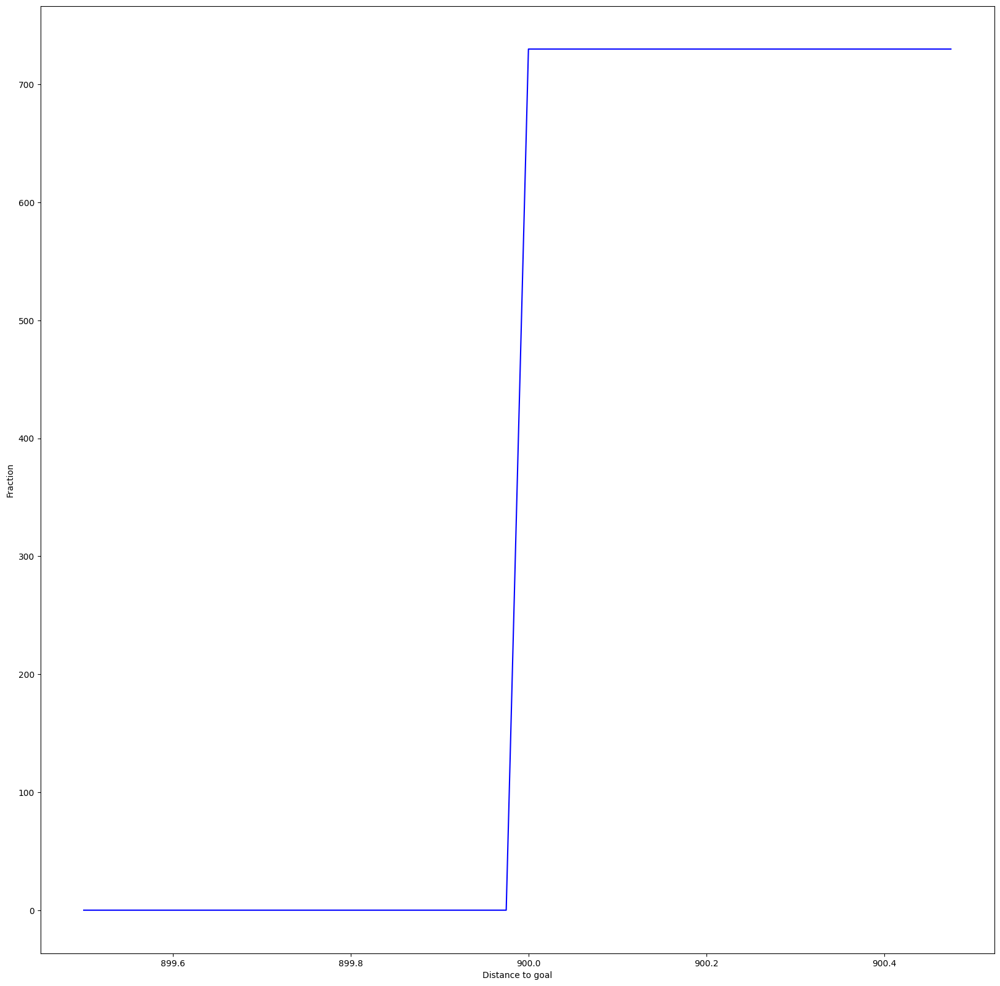

In [ ]:
plot_cumulative_distro_objective(archive)


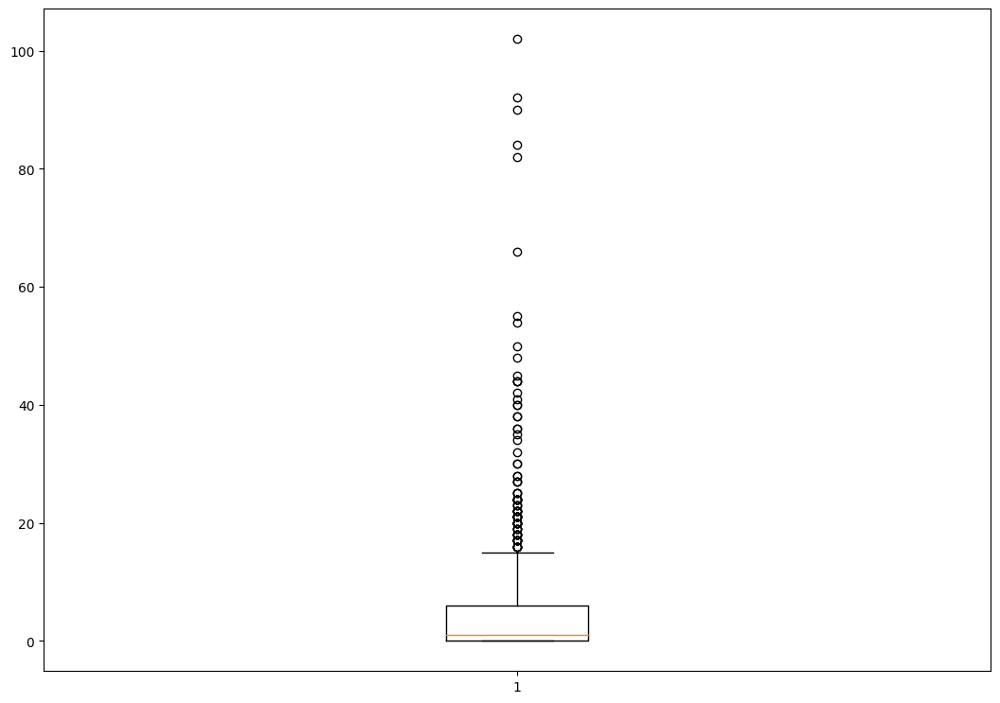

In [ ]:
plot_solution_spread(archive)


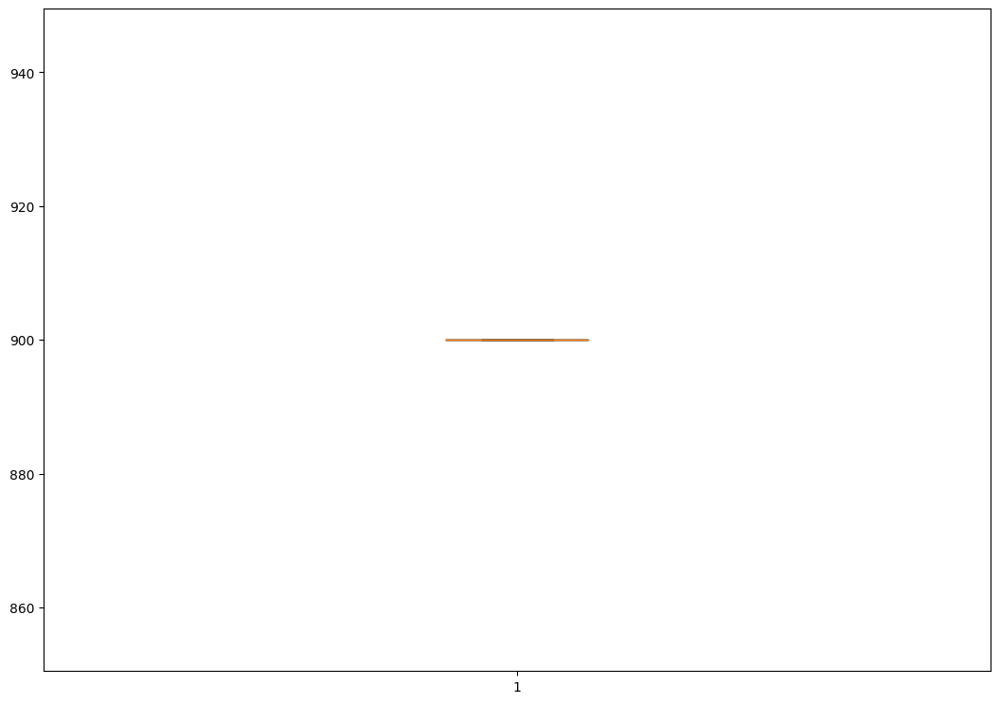

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 50, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.0003590583801269531
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.02853226661682129
Iterations:   1%|          | 1/100 [00:39<1:04:24, 39.04s/it]archive training
time to add to som 0.013239145278930664
Iterations:   2%|▏         | 2/100 [01:05<52:02, 31.86s/it]  archive training
time to add to som 0.02198624610900879
Iterations:   3%|▎         | 3/100 [01:26<43:21, 26.82s/it]archive training
time to add to som 0.015798091888427734
Iterations:   4%|▍         | 4/100 [01:47<39:06, 24.45s/it]archive training
time to add to som 0.02034759521484375
Iterations:   5%|▌         | 5/100 [02:07<36:13, 22.87s/it]archive training
time to add to som 0.029496431350708008
Iterations:   6%|▌         | 6/100 [02:29<35:07, 22.42s/it]archive training
time to add to som 0.02039813995361328
Iterations:   7%|▋         | 7/100 [02:50<34:18, 22.14s/it]archive training
time to add to som 0.021448373794555664
Iterations:   8%|▊       

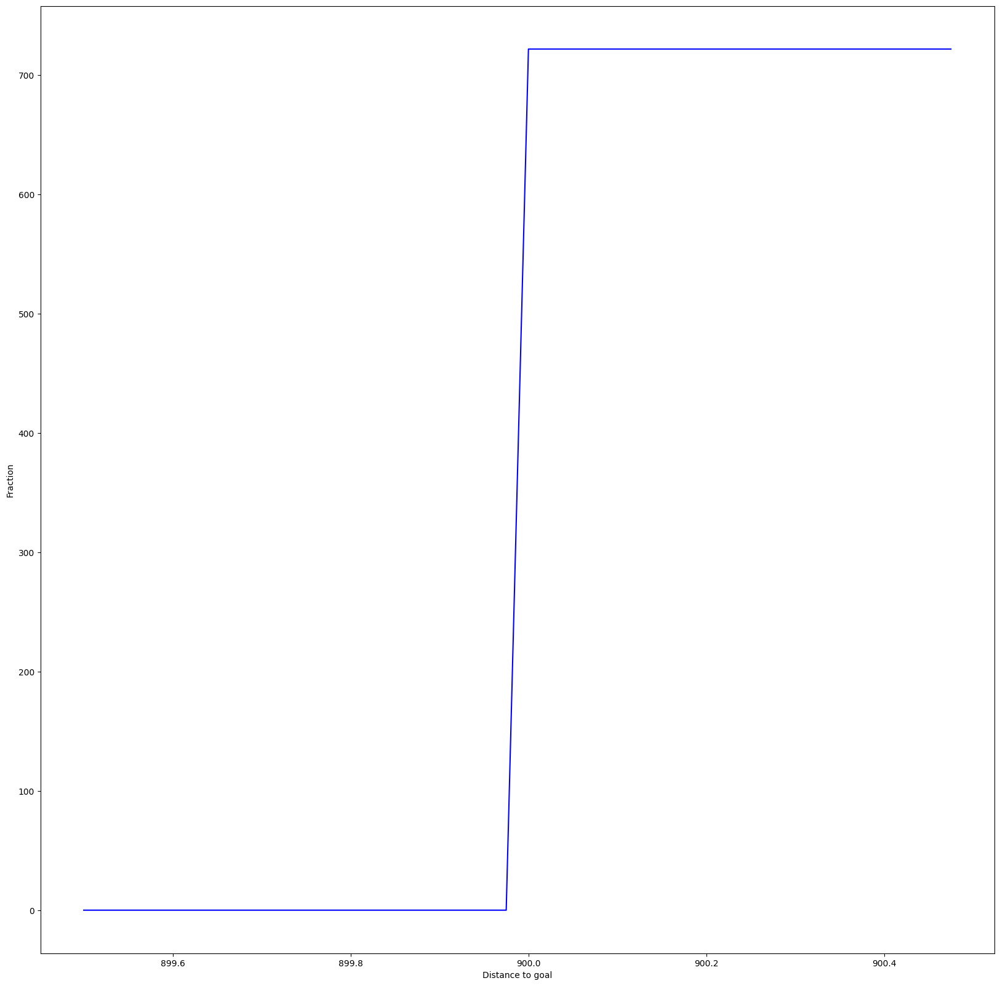

In [ ]:
plot_cumulative_distro_objective(archive)


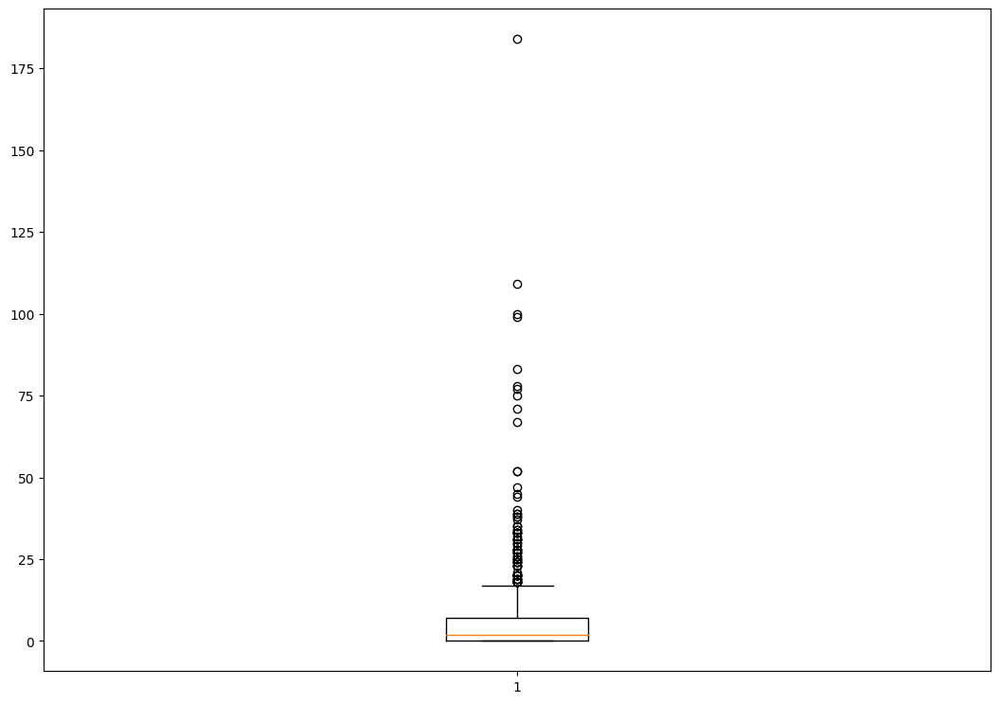

In [ ]:
plot_solution_spread(archive)


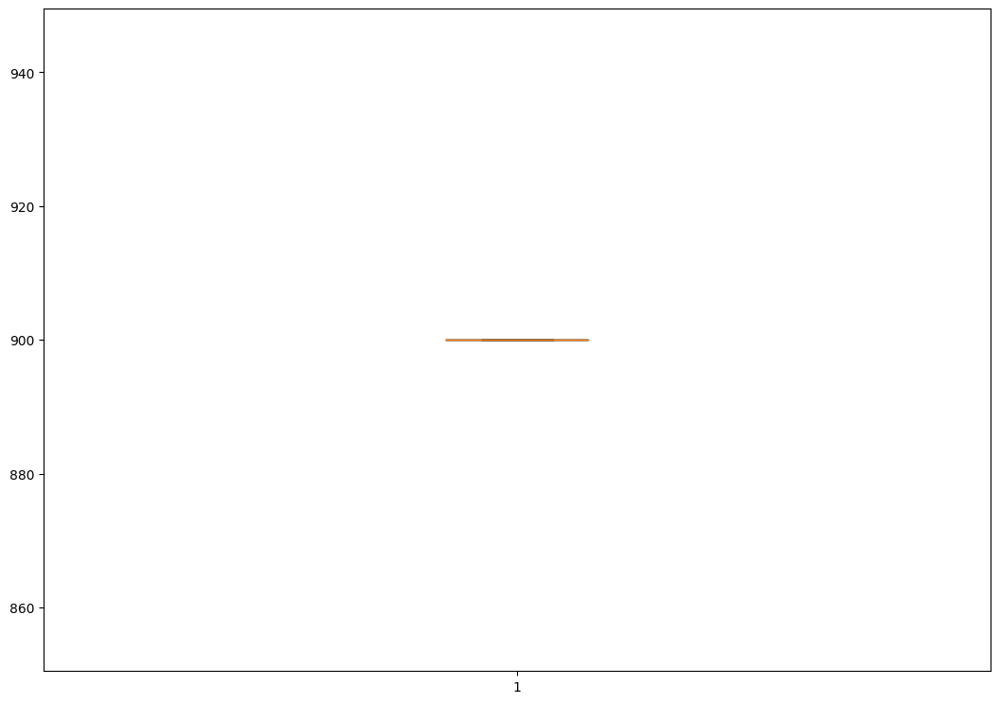

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 50, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.00031185150146484375
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012965679168701172
Iterations:   1%|          | 1/100 [00:19<32:27, 19.67s/it]archive training
time to add to som 0.017069578170776367
Iterations:   2%|▏         | 2/100 [00:39<32:19, 19.79s/it]archive training
time to add to som 0.03592205047607422
Iterations:   3%|▎         | 3/100 [01:00<33:02, 20.44s/it]archive training
time to add to som 0.019469022750854492
Iterations:   4%|▍         | 4/100 [01:23<33:54, 21.20s/it]archive training
time to add to som 0.035624027252197266
Iterations:   5%|▌         | 5/100 [01:45<34:05, 21.53s/it]archive training
time to add to som 0.02406167984008789
Iterations:   6%|▌         | 6/100 [02:07<34:19, 21.91s/it]archive training
time to add to som 0.045351505279541016
Iterations:   7%|▋         | 7/100 [02:31<34:46, 22.44s/it]archive training
time to add to som 0.026796340942382812
Iterations:   8%|▊        

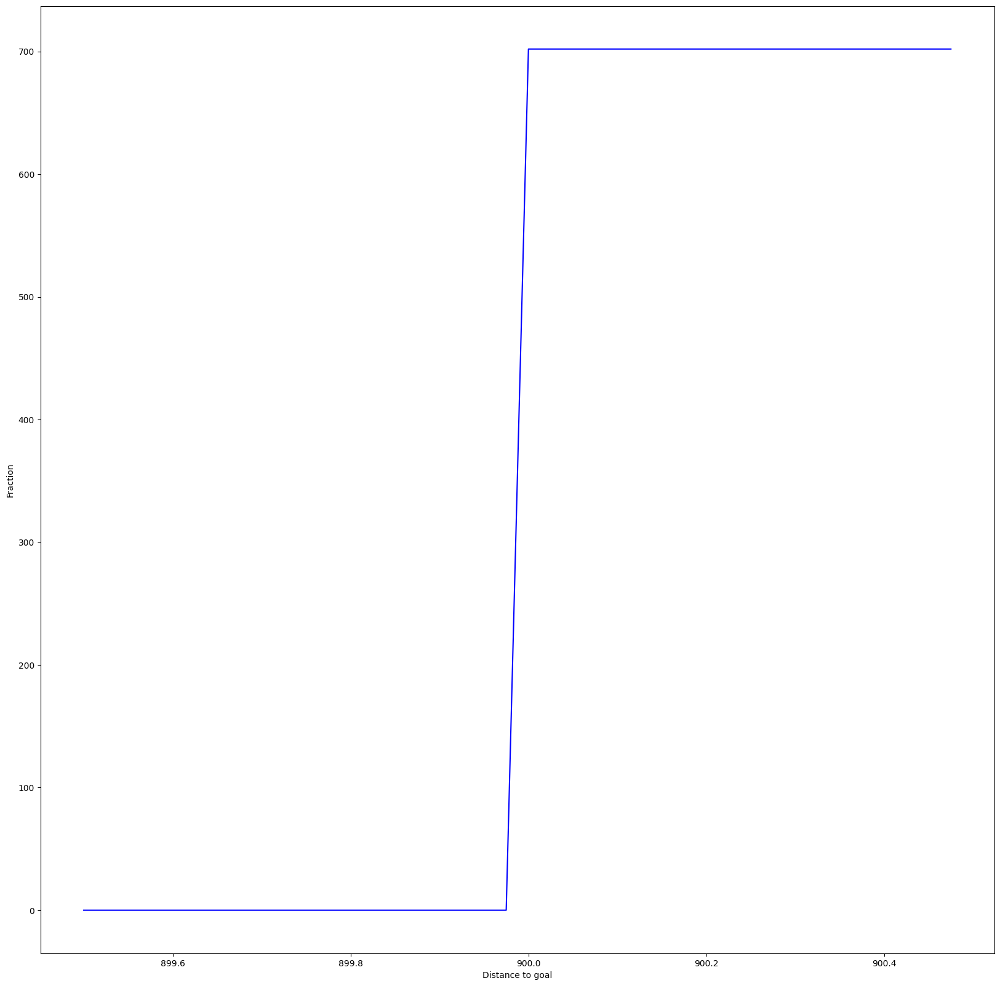

In [ ]:
plot_cumulative_distro_objective(archive)


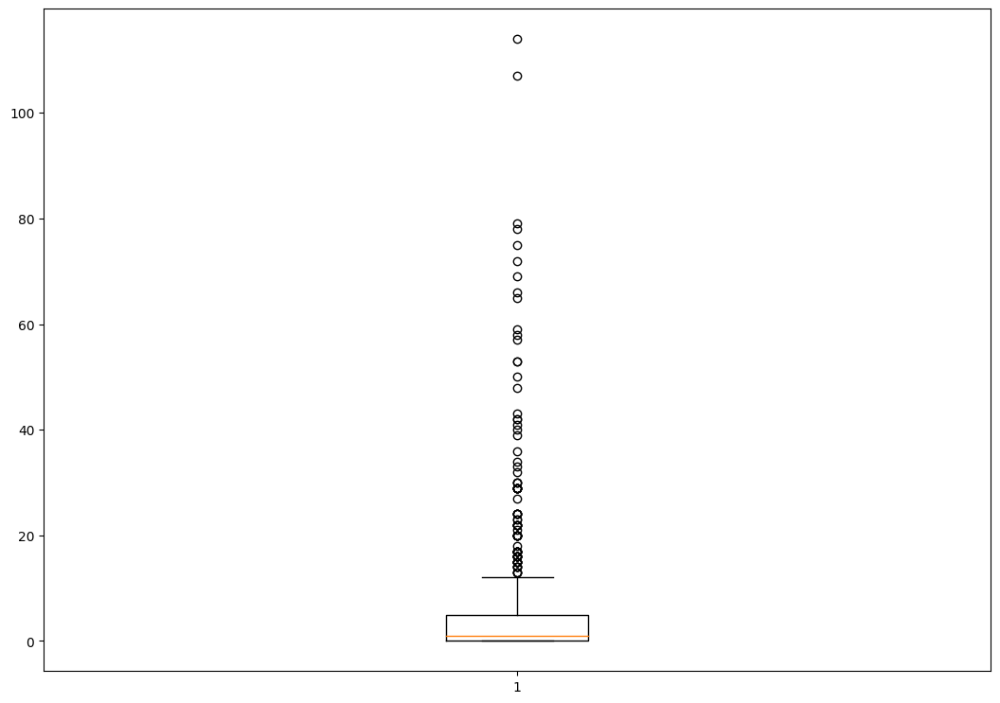

In [ ]:
plot_solution_spread(archive)


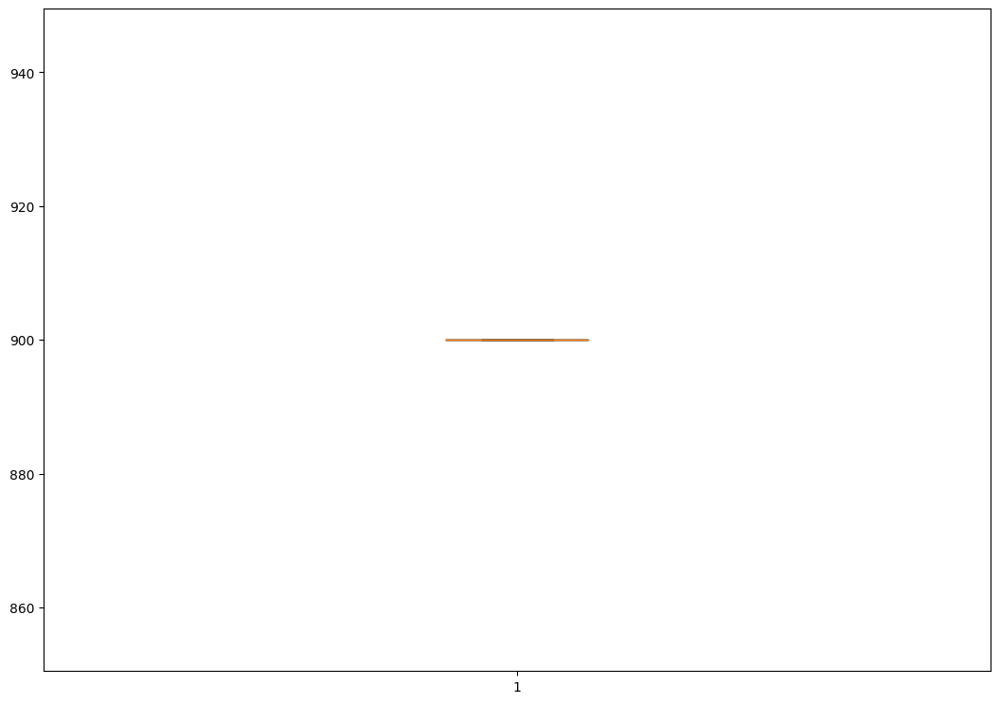

In [ ]:
plot_solution_distance(archive)

######*11.1.3 250d*

cvt

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze1", dim = 250)

extra time to initialize archive 199.56168723106384
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.5650644302368164
Iterations:   1%|          | 1/100 [00:21<34:39, 21.00s/it]archive training
time to add to cvt 0.12498307228088379
Iterations:   2%|▏         | 2/100 [00:42<35:03, 21.47s/it]archive training
time to add to cvt 0.0885014533996582
Iterations:   3%|▎         | 3/100 [01:04<34:32, 21.37s/it]archive training
time to add to cvt 0.09359860420227051
Iterations:   4%|▍         | 4/100 [01:24<33:53, 21.19s/it]archive training
time to add to cvt 0.09464144706726074
Iterations:   5%|▌         | 5/100 [01:47<34:10, 21.59s/it]archive training
time to add to cvt 0.10489201545715332
Iterations:   6%|▌         | 6/100 [02:07<33:21, 21.30s/it]archive training
time to add to cvt 0.1259162425994873
Iterations:   7%|▋         | 7/100 [02:29<33:01, 21.31s/it]archive training
time to add to cvt 0.08670496940612793
Iterations:   8%|▊         | 8/100 [02:

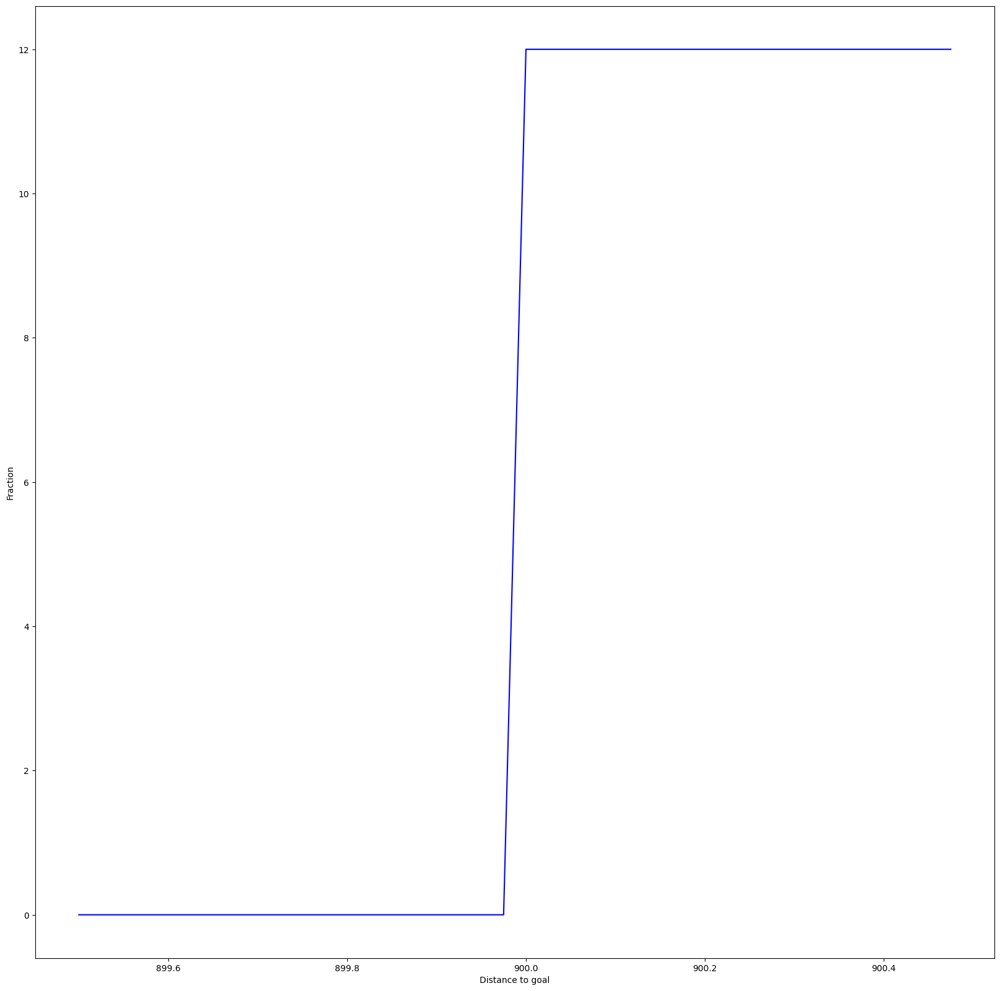

In [ ]:
plot_cumulative_distro_objective(archive)

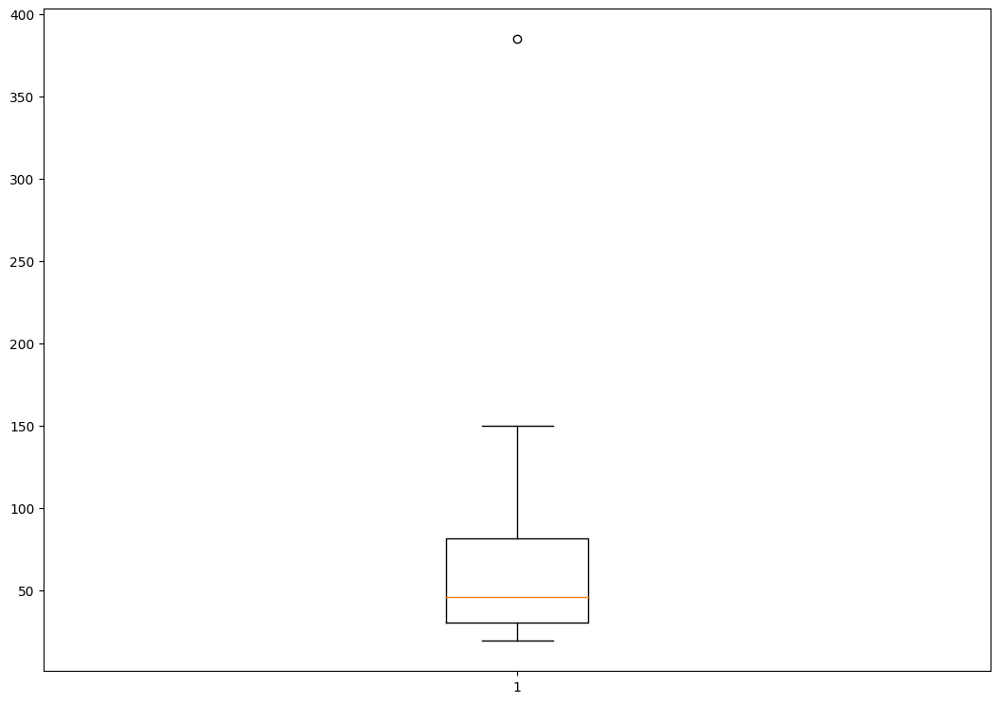

In [ ]:
plot_solution_spread(archive)

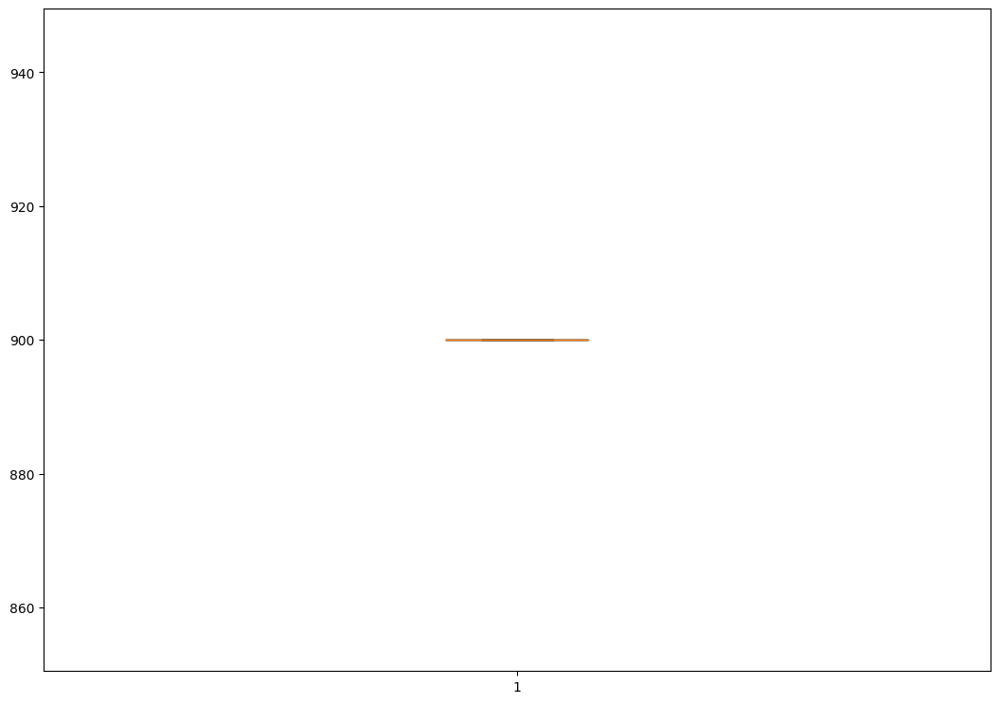

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 250)

extra time to initialize archive 0.0008106231689453125
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014306068420410156
Iterations:   1%|          | 1/100 [00:20<33:18, 20.19s/it]archive training
time to add to som 0.018642663955688477
Iterations:   2%|▏         | 2/100 [00:40<33:00, 20.21s/it]archive training
time to add to som 0.03496813774108887
Iterations:   3%|▎         | 3/100 [01:01<33:35, 20.78s/it]archive training
time to add to som 0.0304720401763916
Iterations:   4%|▍         | 4/100 [01:22<32:58, 20.61s/it]archive training
time to add to som 0.030210018157958984
Iterations:   5%|▌         | 5/100 [01:42<32:20, 20.42s/it]archive training
time to add to som 0.04632377624511719
Iterations:   6%|▌         | 6/100 [02:04<32:41, 20.87s/it]archive training
time to add to som 0.04086422920227051
Iterations:   7%|▋         | 7/100 [02:25<32:48, 21.17s/it]archive training
time to add to som 0.04450392723083496
Iterations:   8%|▊         | 8/

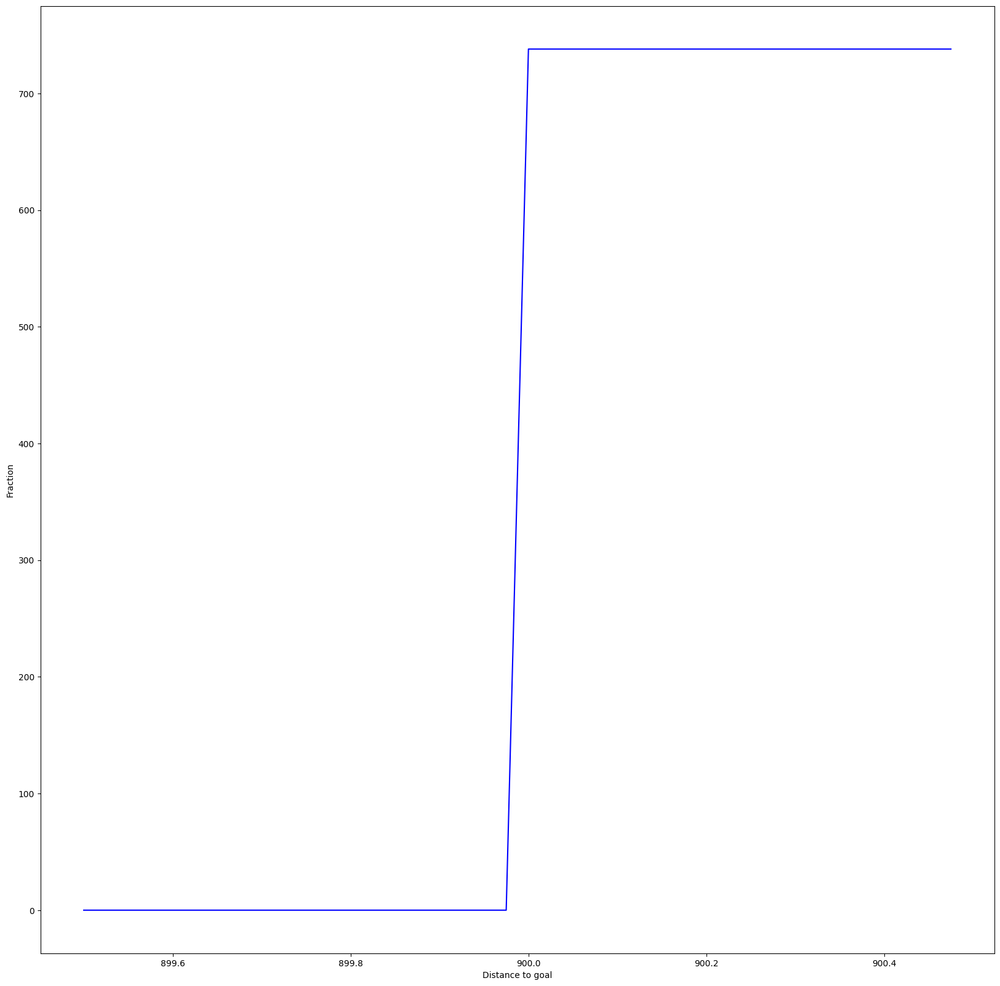

In [ ]:
plot_cumulative_distro_objective(archive)

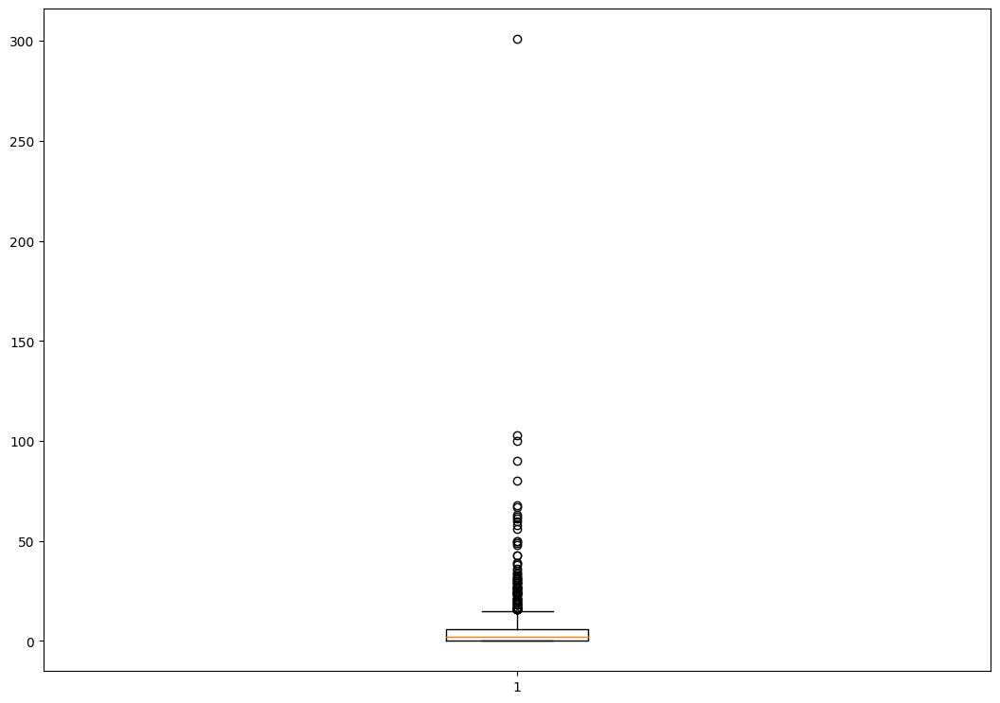

In [ ]:
plot_solution_spread(archive)

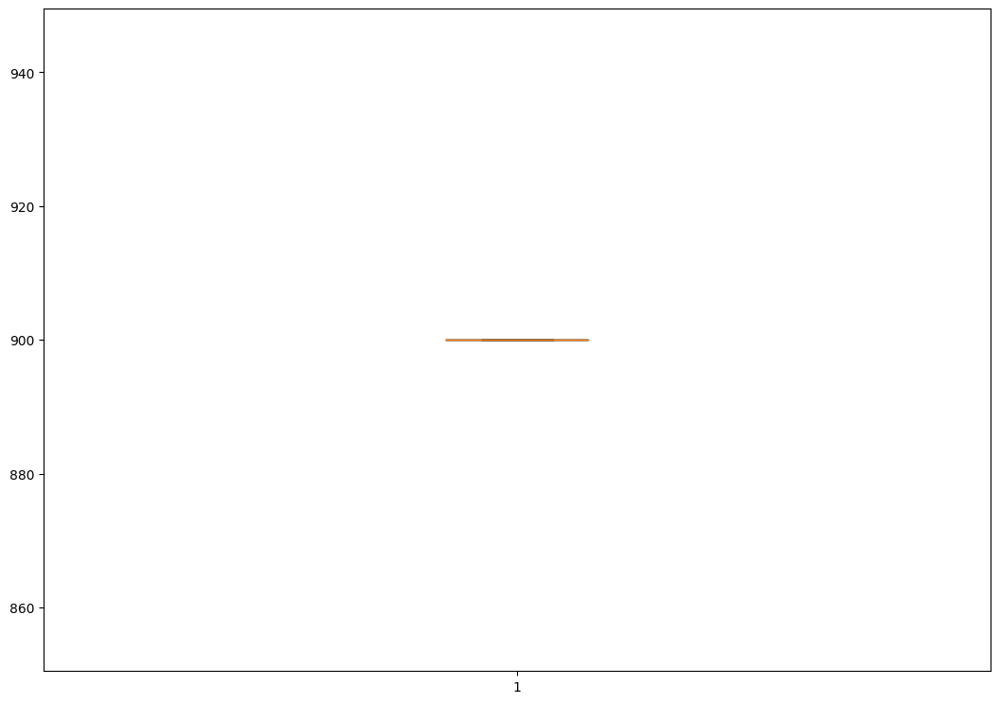

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 250, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })


extra time to initialize archive 0.0004019737243652344
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014733076095581055
Iterations:   1%|          | 1/100 [00:19<31:32, 19.11s/it]archive training
time to add to som 0.028751134872436523
Iterations:   2%|▏         | 2/100 [00:38<31:51, 19.51s/it]archive training
time to add to som 0.022918701171875
Iterations:   3%|▎         | 3/100 [00:59<32:04, 19.84s/it]archive training
time to add to som 0.0291290283203125
Iterations:   4%|▍         | 4/100 [01:18<31:37, 19.77s/it]archive training
time to add to som 0.03351998329162598
Iterations:   5%|▌         | 5/100 [01:38<31:21, 19.80s/it]archive training
time to add to som 0.0502626895904541
Iterations:   6%|▌         | 6/100 [01:59<31:40, 20.21s/it]archive training
time to add to som 0.035718441009521484
Iterations:   7%|▋         | 7/100 [02:19<31:20, 20.23s/it]archive training
time to add to som 0.04312014579772949
Iterations:   8%|▊         | 8/100

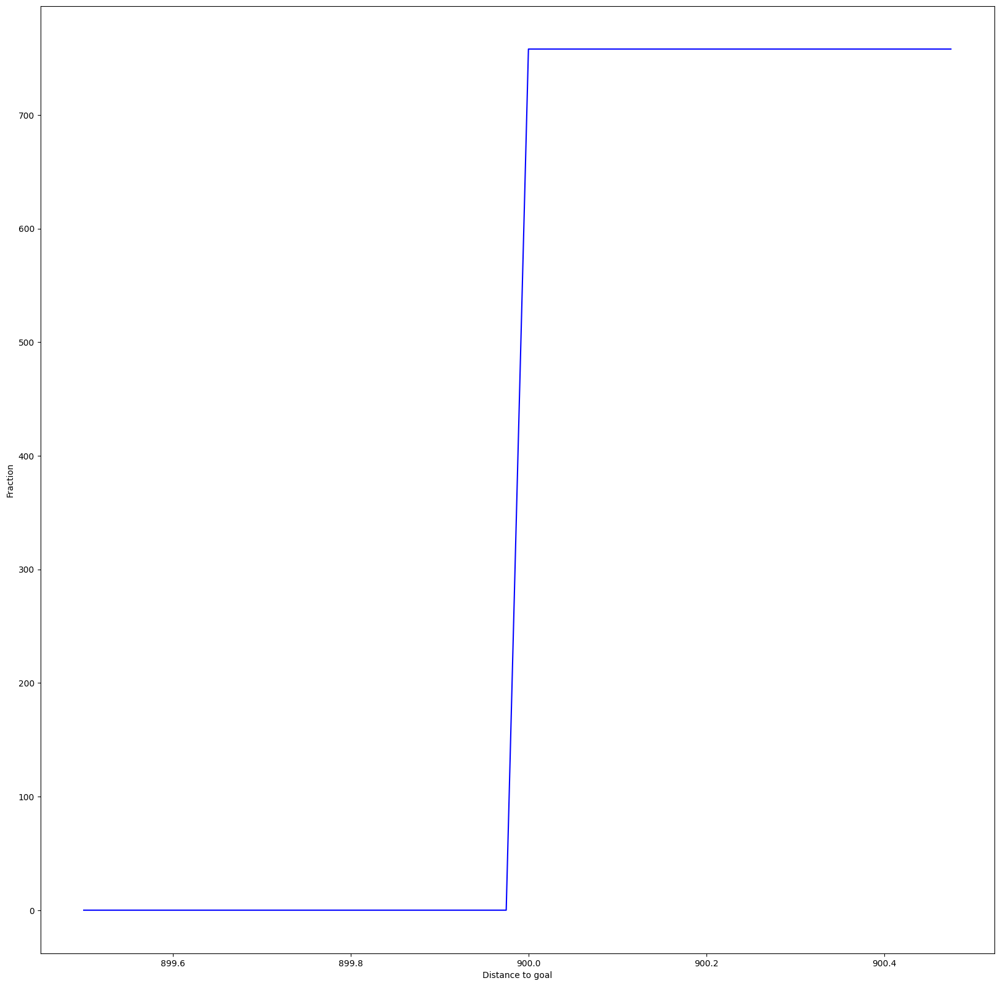

In [ ]:
plot_cumulative_distro_objective(archive)


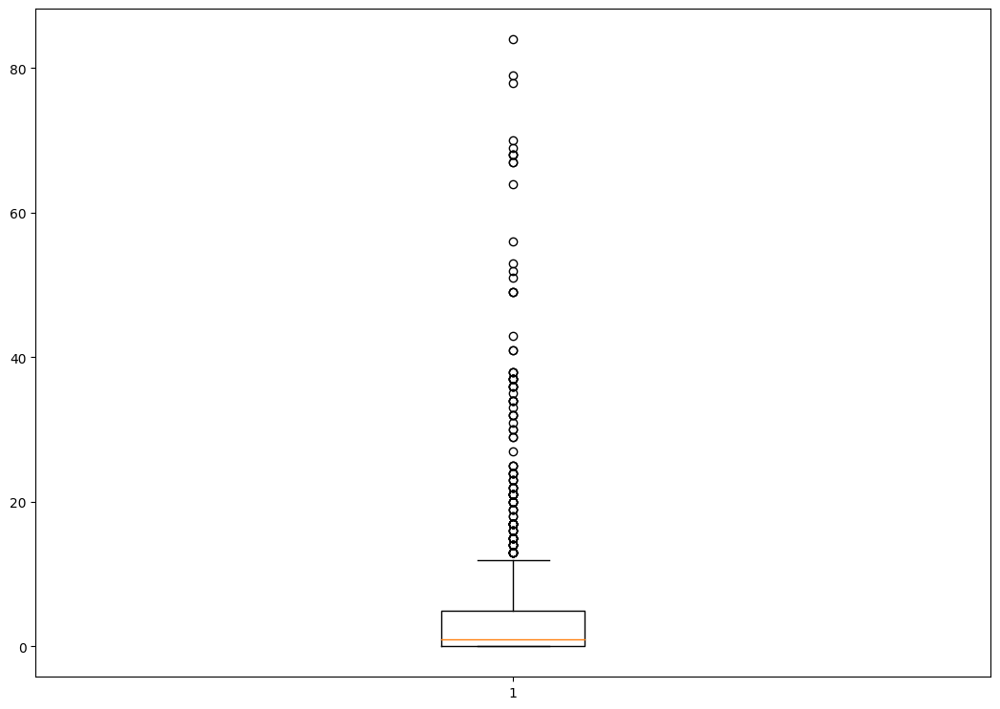

In [ ]:
plot_solution_spread(archive)

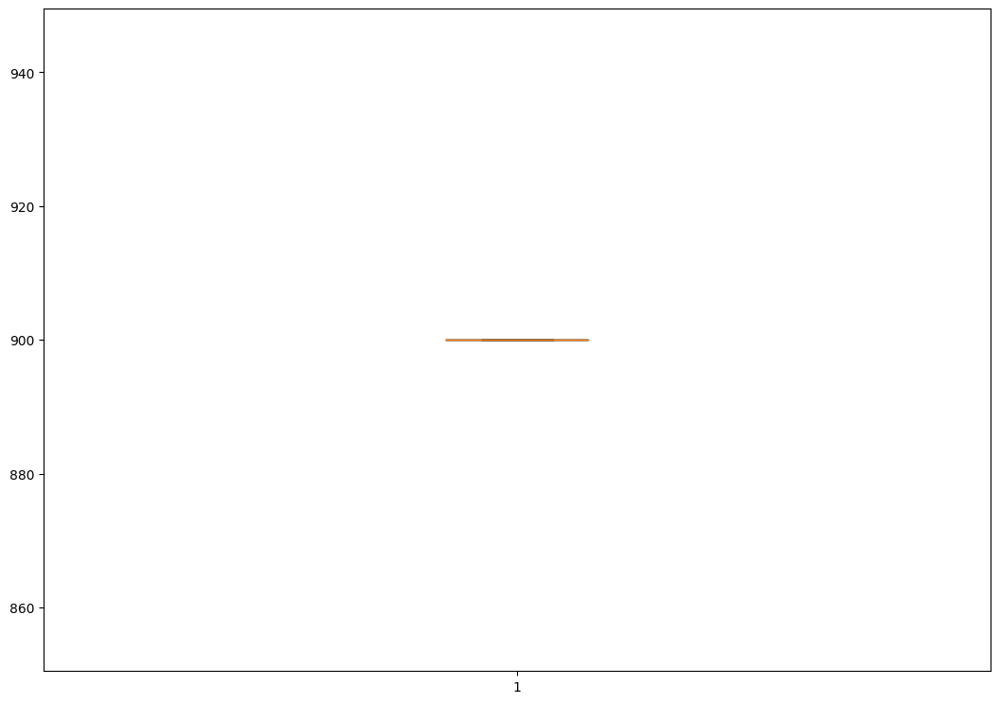

In [ ]:
plot_solution_distance(archive)

som doppio multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 250, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0007529258728027344
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.021218299865722656
Iterations:   1%|          | 1/100 [00:20<33:27, 20.28s/it]archive training
time to add to som 0.017345190048217773
Iterations:   2%|▏         | 2/100 [00:40<32:58, 20.19s/it]archive training
time to add to som 0.020937204360961914
Iterations:   3%|▎         | 3/100 [00:59<32:04, 19.84s/it]archive training
time to add to som 0.026422500610351562
Iterations:   4%|▍         | 4/100 [01:19<31:29, 19.68s/it]archive training
time to add to som 0.03890872001647949
Iterations:   5%|▌         | 5/100 [01:40<31:50, 20.11s/it]archive training
time to add to som 0.03220486640930176
Iterations:   6%|▌         | 6/100 [02:00<31:28, 20.09s/it]archive training
time to add to som 0.03291916847229004
Iterations:   7%|▋         | 7/100 [02:20<31:10, 20.11s/it]archive training
time to add to som 0.05375027656555176
Iterations:   8%|▊         | 

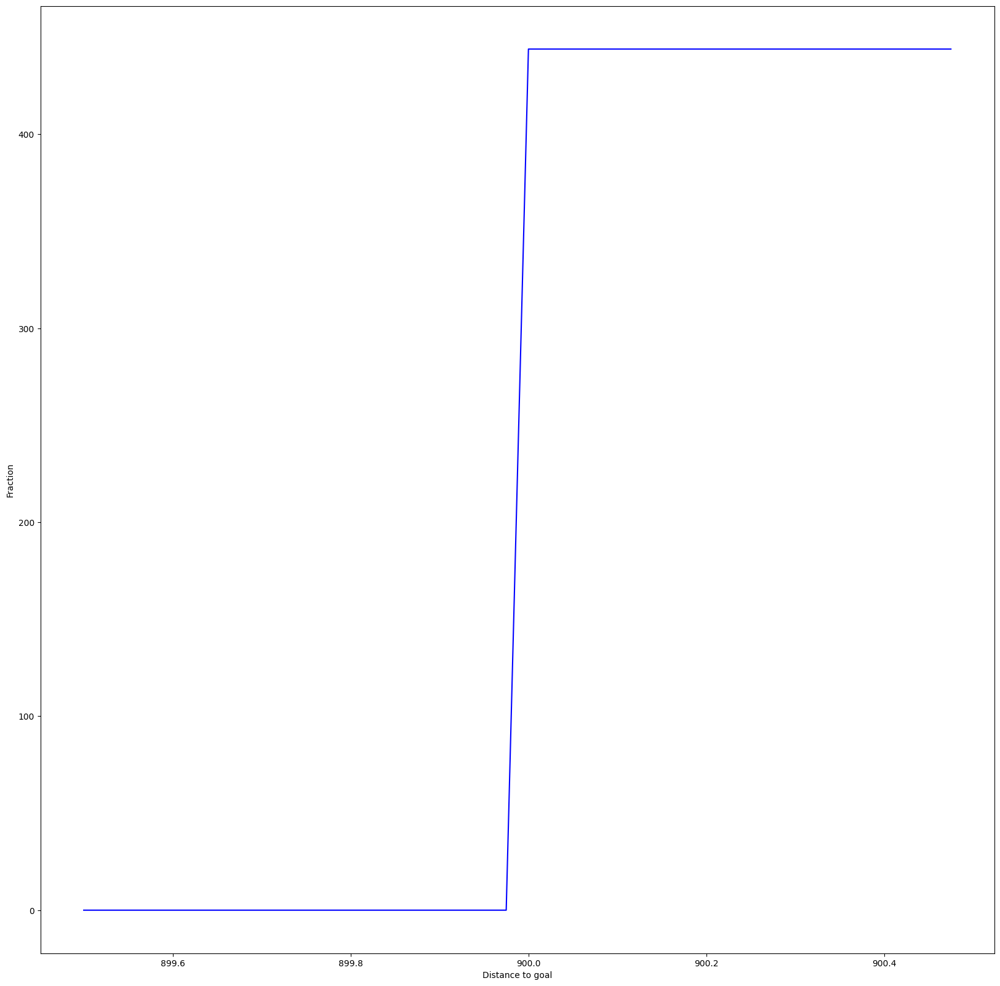

In [ ]:
plot_cumulative_distro_objective(archive)

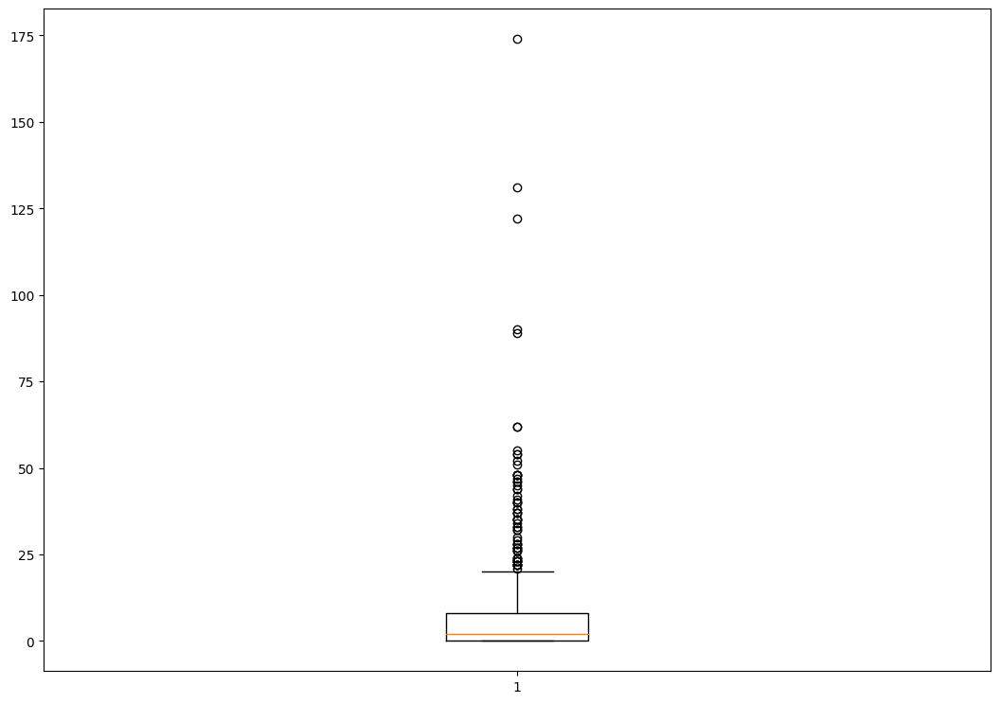

In [ ]:
plot_solution_spread(archive)

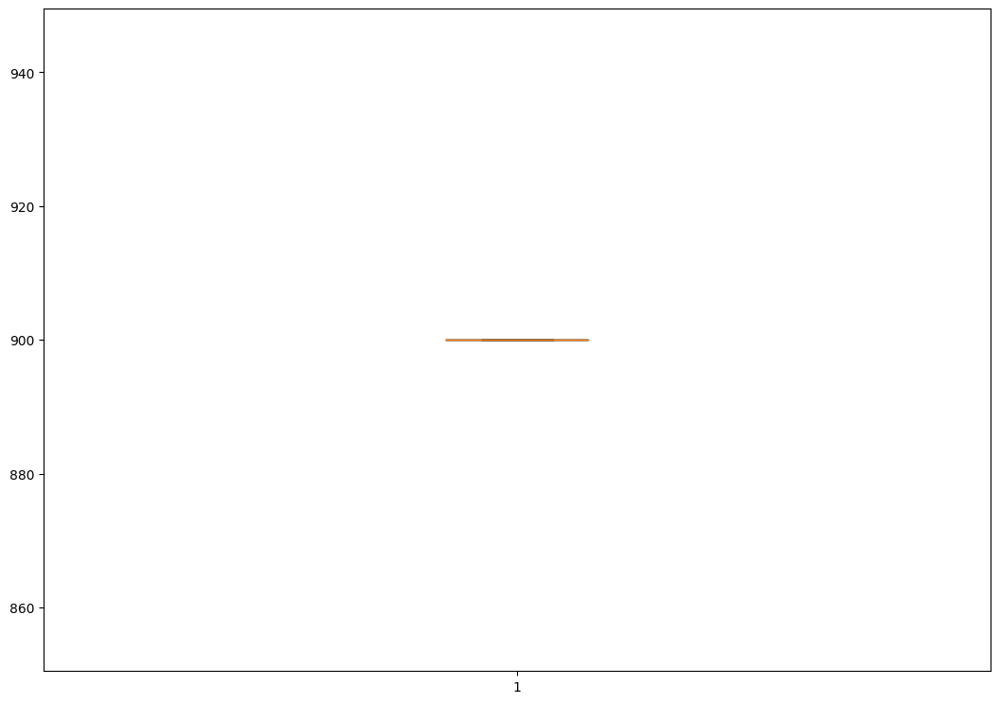

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 250, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.00030493736267089844
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.022417306900024414
Iterations:   1%|          | 1/100 [00:19<31:40, 19.20s/it]archive training
time to add to som 0.01888418197631836
Iterations:   2%|▏         | 2/100 [00:37<30:27, 18.65s/it]archive training
time to add to som 0.022285938262939453
Iterations:   3%|▎         | 3/100 [00:55<29:45, 18.41s/it]archive training
time to add to som 0.025928735733032227
Iterations:   4%|▍         | 4/100 [01:13<29:26, 18.40s/it]archive training
time to add to som 0.04428219795227051
Iterations:   5%|▌         | 5/100 [01:33<29:34, 18.68s/it]archive training
time to add to som 0.03618764877319336
Iterations:   6%|▌         | 6/100 [01:52<29:42, 18.97s/it]archive training
time to add to som 0.03742218017578125
Iterations:   7%|▋         | 7/100 [02:11<29:05, 18.76s/it]archive training
time to add to som 0.04219841957092285
Iterations:   8%|▊         | 

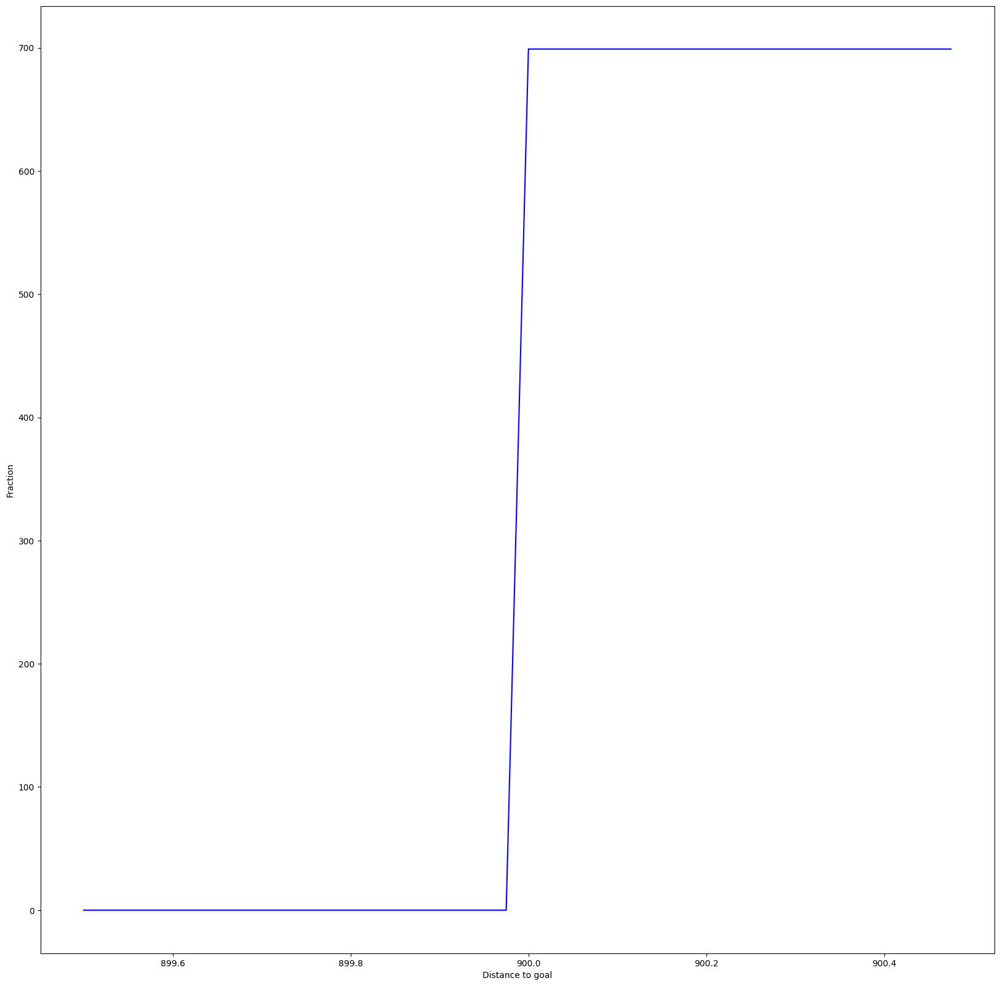

In [ ]:
plot_cumulative_distro_objective(archive)


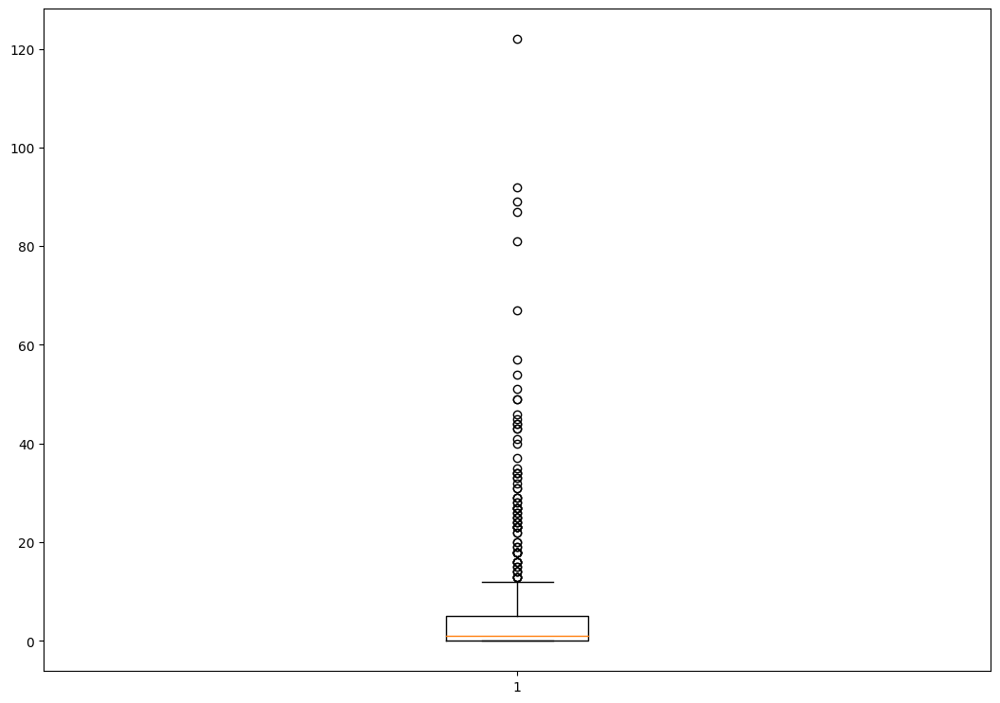

In [ ]:
plot_solution_spread(archive)


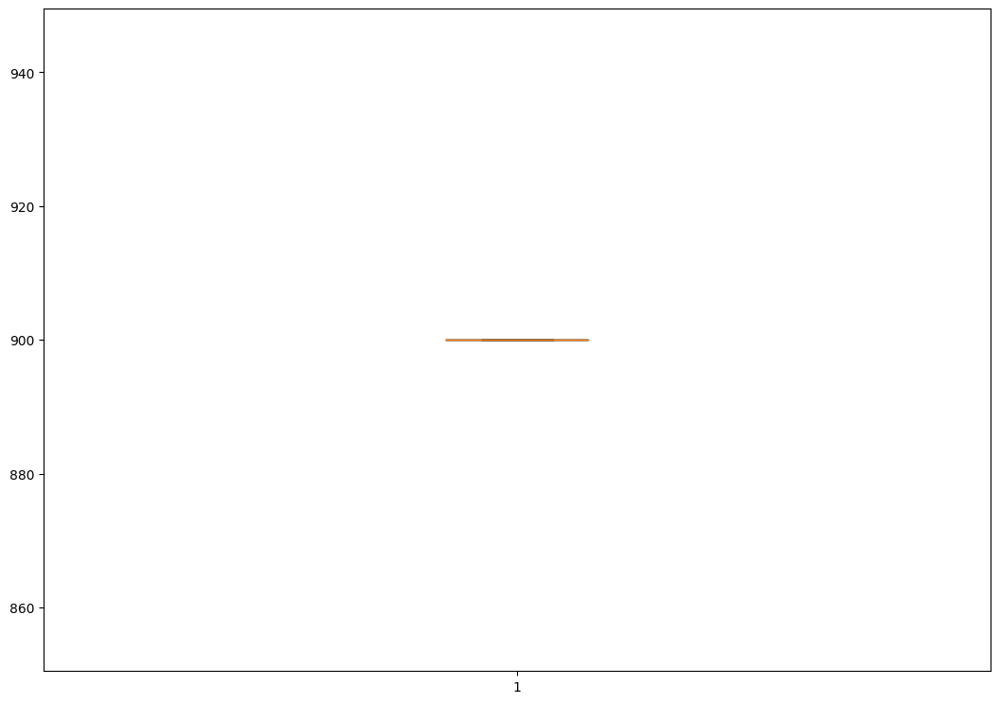

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 250, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })



extra time to initialize archive 0.0002968311309814453
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.024083375930786133
Iterations:   1%|          | 1/100 [00:19<32:28, 19.68s/it]archive training
time to add to som 0.015281200408935547
Iterations:   2%|▏         | 2/100 [00:39<32:41, 20.02s/it]archive training
time to add to som 0.03152585029602051
Iterations:   3%|▎         | 3/100 [00:59<31:52, 19.72s/it]archive training
time to add to som 0.022731781005859375
Iterations:   4%|▍         | 4/100 [01:20<32:18, 20.19s/it]archive training
time to add to som 0.04244804382324219
Iterations:   5%|▌         | 5/100 [01:41<32:19, 20.41s/it]archive training
time to add to som 0.03241276741027832
Iterations:   6%|▌         | 6/100 [02:00<31:36, 20.18s/it]archive training
time to add to som 0.034182071685791016
Iterations:   7%|▋         | 7/100 [02:20<31:03, 20.03s/it]archive training
time to add to som 0.0505983829498291
Iterations:   8%|▊         | 8

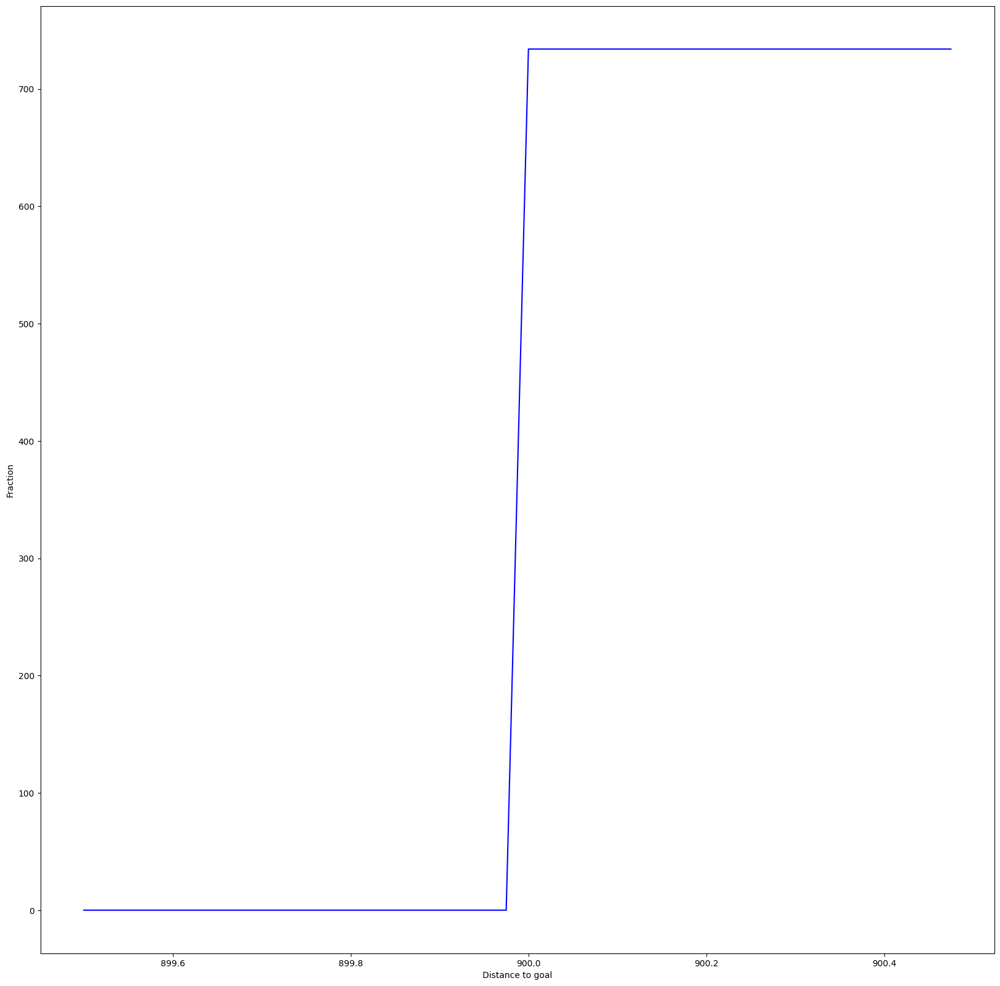

In [ ]:
plot_cumulative_distro_objective(archive)

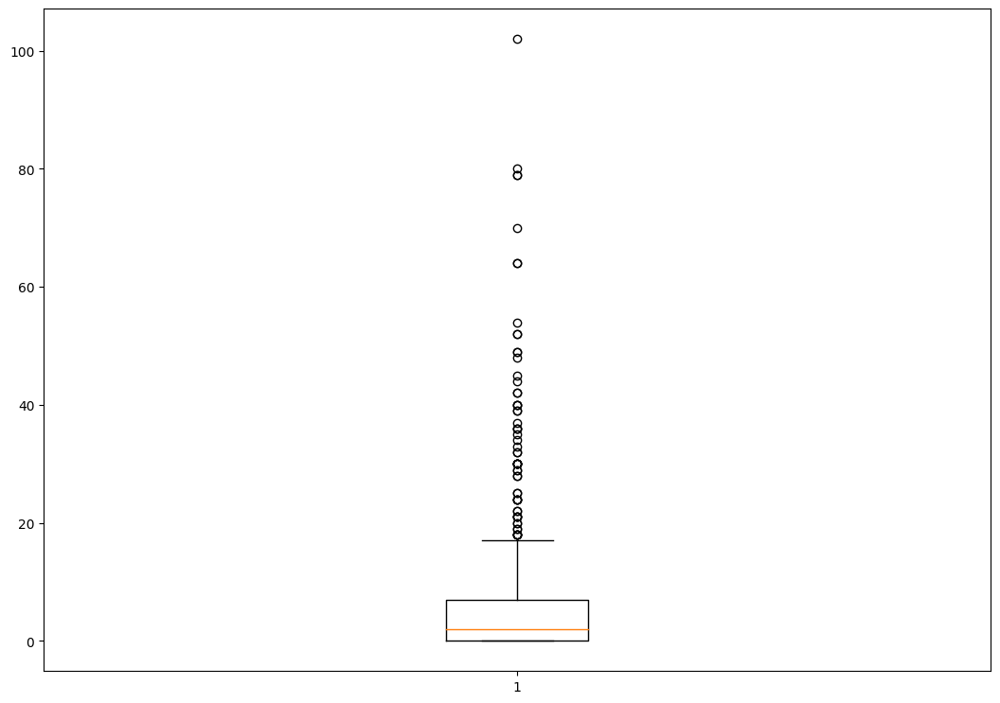

In [ ]:
plot_solution_spread(archive)


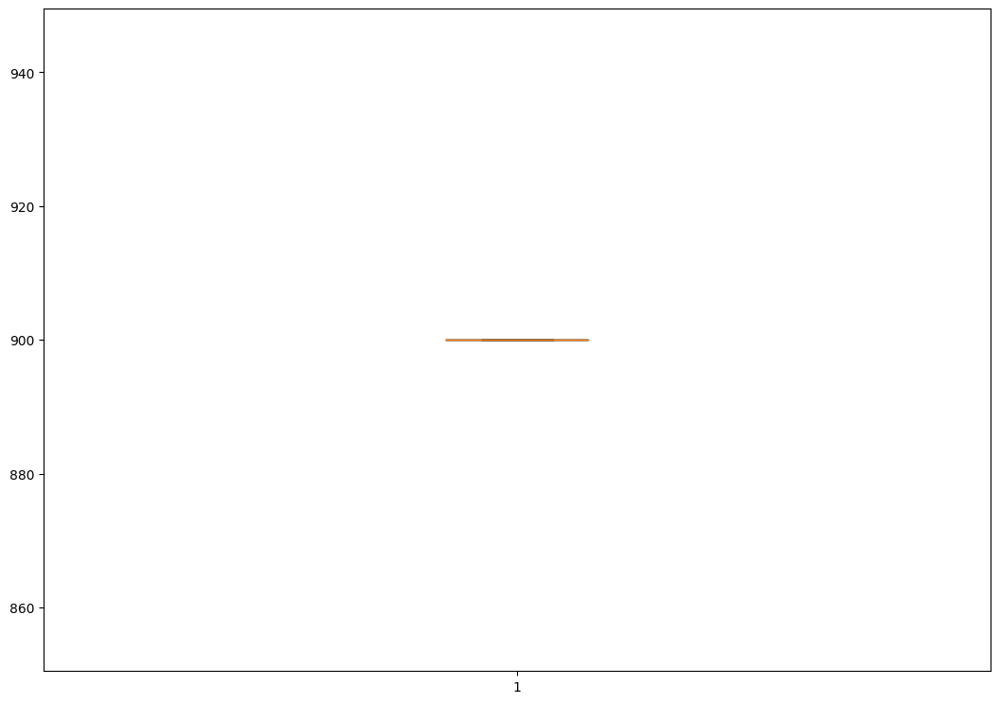

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 250, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0003159046173095703
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.02498793601989746
Iterations:   1%|          | 1/100 [00:20<33:32, 20.32s/it]archive training
time to add to som 0.0194549560546875
Iterations:   2%|▏         | 2/100 [00:43<35:42, 21.86s/it]archive training
time to add to som 0.024869680404663086
Iterations:   3%|▎         | 3/100 [01:03<34:20, 21.24s/it]archive training
time to add to som 0.04294013977050781
Iterations:   4%|▍         | 4/100 [01:24<33:43, 21.08s/it]archive training
time to add to som 0.03617215156555176
Iterations:   5%|▌         | 5/100 [01:46<33:39, 21.26s/it]archive training
time to add to som 0.04872751235961914
Iterations:   6%|▌         | 6/100 [02:06<32:52, 20.98s/it]archive training
time to add to som 0.07858610153198242
Iterations:   7%|▋         | 7/100 [02:27<32:29, 20.96s/it]archive training
time to add to som 0.05254030227661133
Iterations:   8%|▊         | 8/10

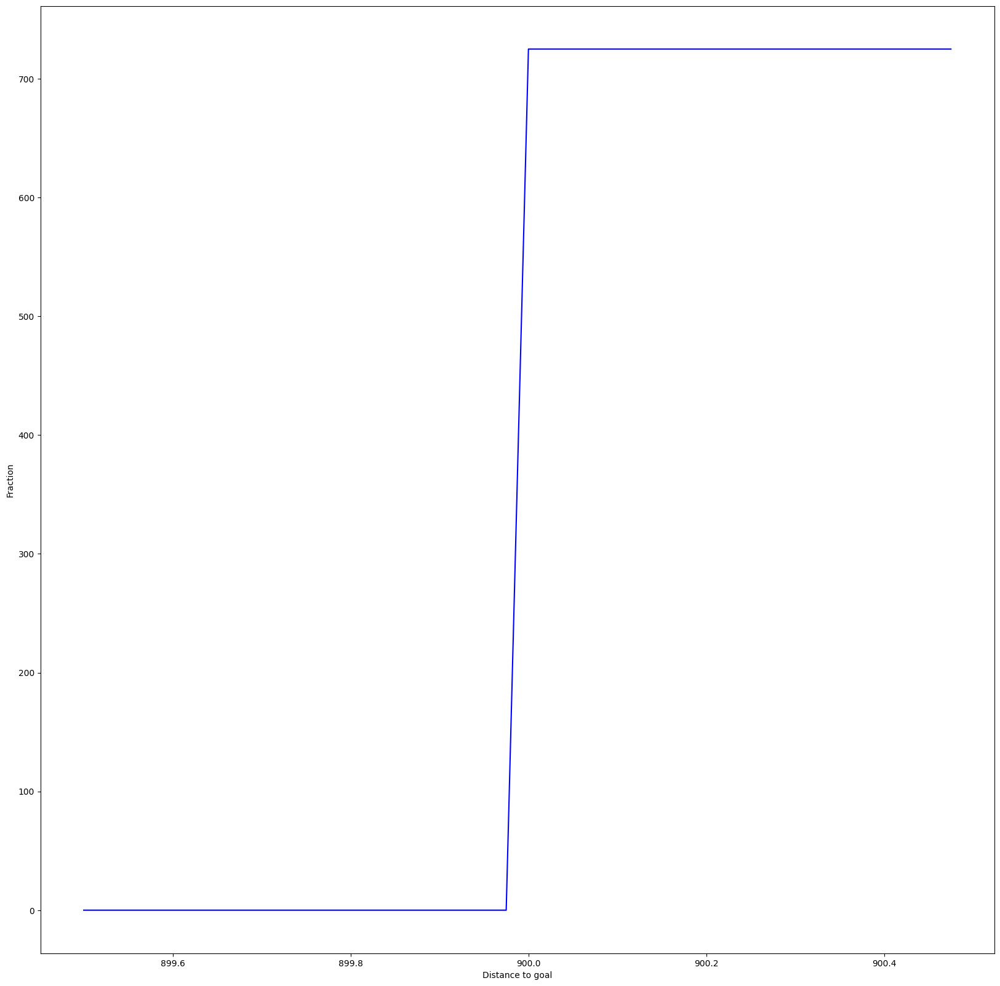

In [ ]:
plot_cumulative_distro_objective(archive)

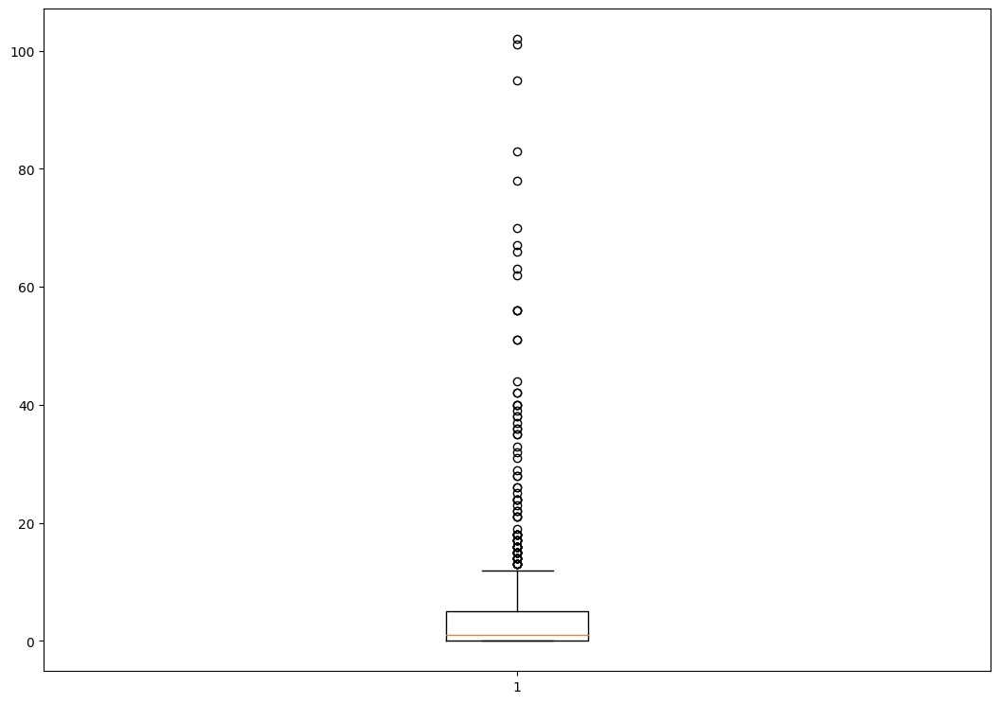

In [ ]:
plot_solution_spread(archive)

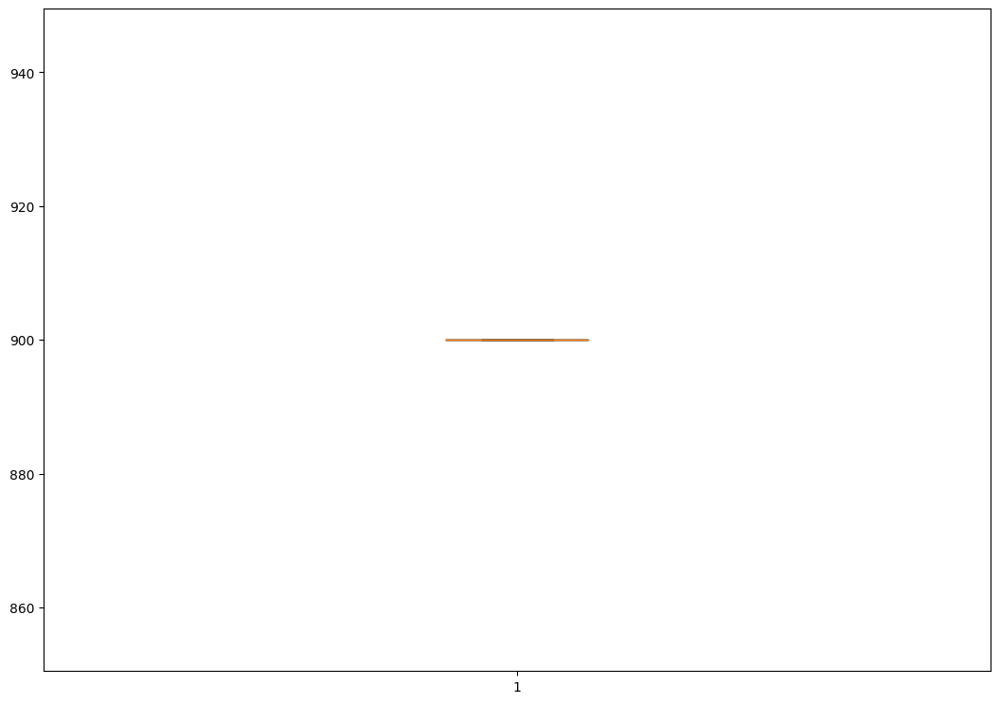

In [ ]:
plot_solution_distance(archive)

######*11.1.3 500d*

cvt

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze1", dim = 500)

extra time to initialize archive 373.5893654823303
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.24693846702575684
Iterations:   1%|          | 1/100 [00:57<1:34:26, 57.24s/it]archive training
time to add to cvt 0.2558119297027588
Iterations:   2%|▏         | 2/100 [01:39<1:19:04, 48.42s/it]archive training
time to add to cvt 0.5474894046783447
Iterations:   3%|▎         | 3/100 [02:28<1:18:54, 48.81s/it]archive training
time to add to cvt 0.26064085960388184
Iterations:   4%|▍         | 4/100 [03:21<1:20:17, 50.18s/it]archive training
time to add to cvt 0.9048683643341064
Iterations:   5%|▌         | 5/100 [04:12<1:20:01, 50.54s/it]archive training
time to add to cvt 0.24256396293640137
Iterations:   6%|▌         | 6/100 [05:03<1:19:27, 50.72s/it]archive training
time to add to cvt 0.2673673629760742
Iterations:   7%|▋         | 7/100 [05:52<1:18:03, 50.36s/it]archive training
time to add to cvt 0.25676798820495605
Iterations:   8%|▊         

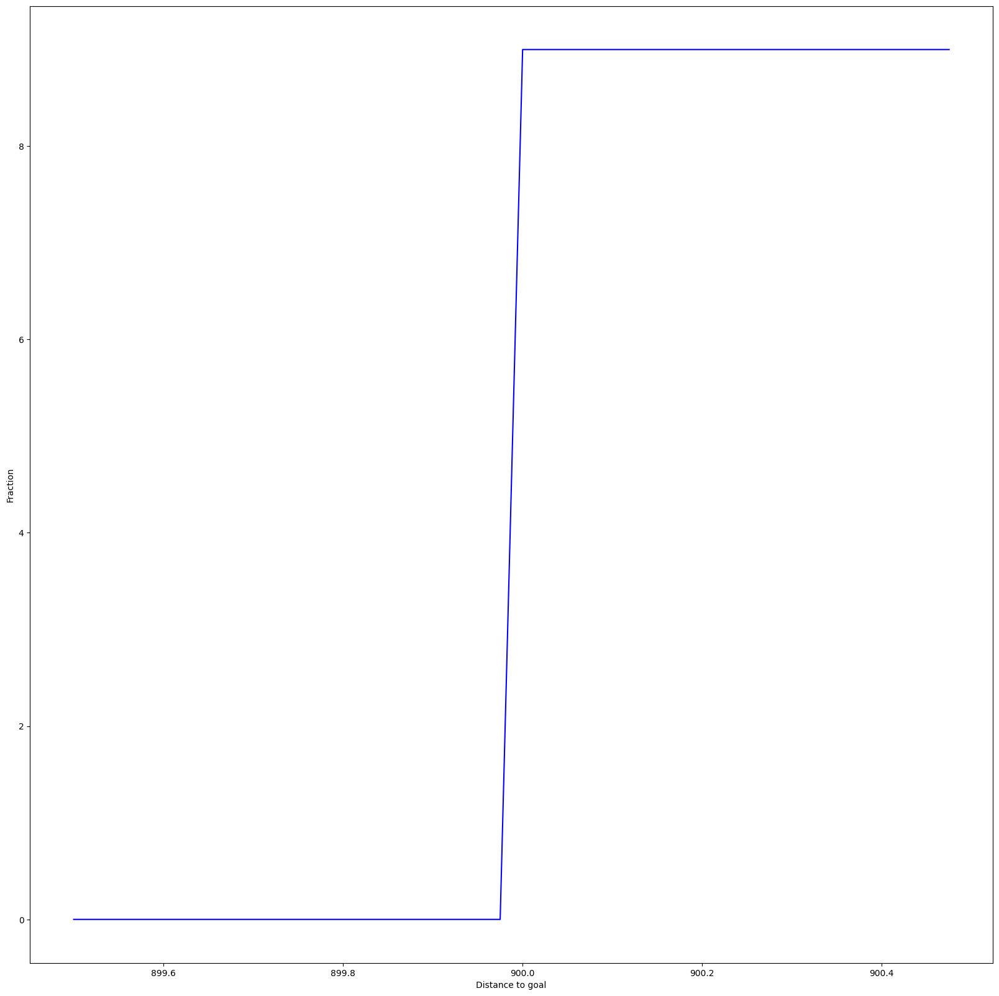

In [ ]:
plot_cumulative_distro_objective(archive)

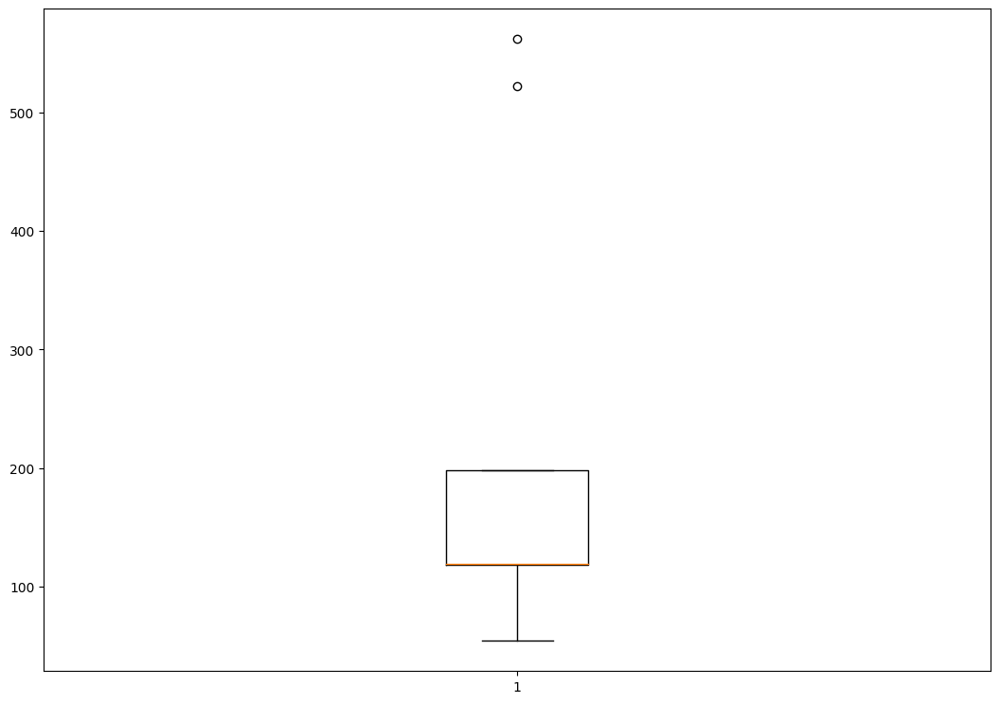

In [ ]:
plot_solution_spread(archive)

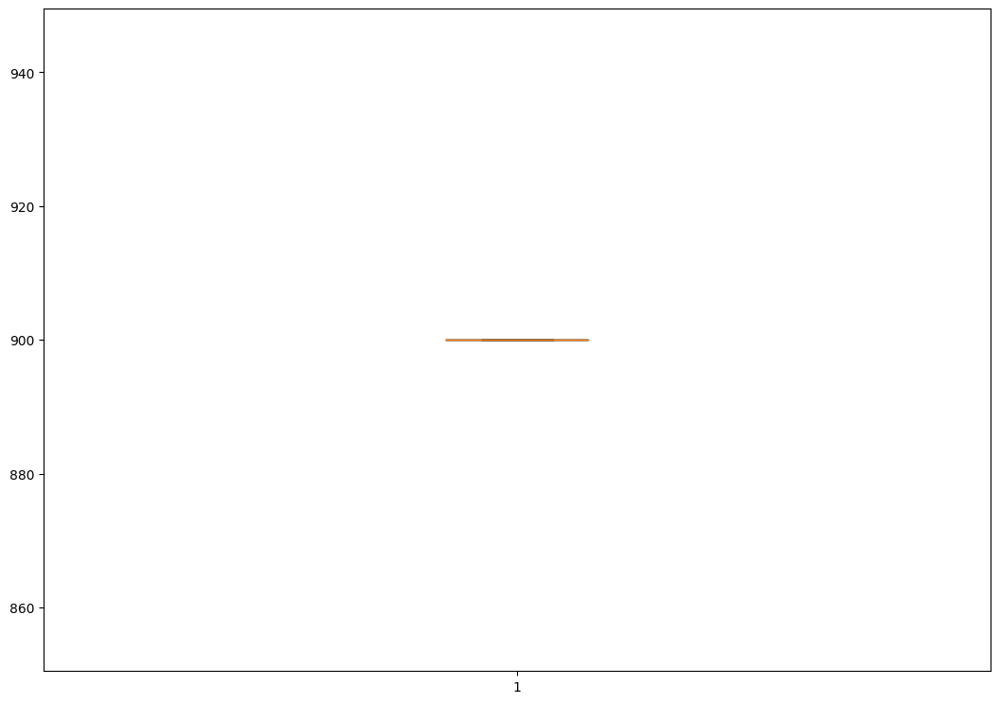

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 500)

extra time to initialize archive 0.00033974647521972656
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.013840675354003906
Iterations:   1%|          | 1/100 [00:17<28:52, 17.50s/it]archive training
time to add to som 0.0192110538482666
Iterations:   2%|▏         | 2/100 [00:35<28:52, 17.68s/it]archive training
time to add to som 0.026126384735107422
Iterations:   3%|▎         | 3/100 [00:53<28:49, 17.83s/it]archive training
time to add to som 0.05508899688720703
Iterations:   4%|▍         | 4/100 [01:12<29:22, 18.36s/it]archive training
time to add to som 0.044162750244140625
Iterations:   5%|▌         | 5/100 [01:30<29:01, 18.33s/it]archive training
time to add to som 0.058211326599121094
Iterations:   6%|▌         | 6/100 [01:48<28:32, 18.22s/it]archive training
time to add to som 0.06792426109313965
Iterations:   7%|▋         | 7/100 [02:06<28:11, 18.19s/it]archive training
time to add to som 0.07818961143493652
Iterations:   8%|▊         | 

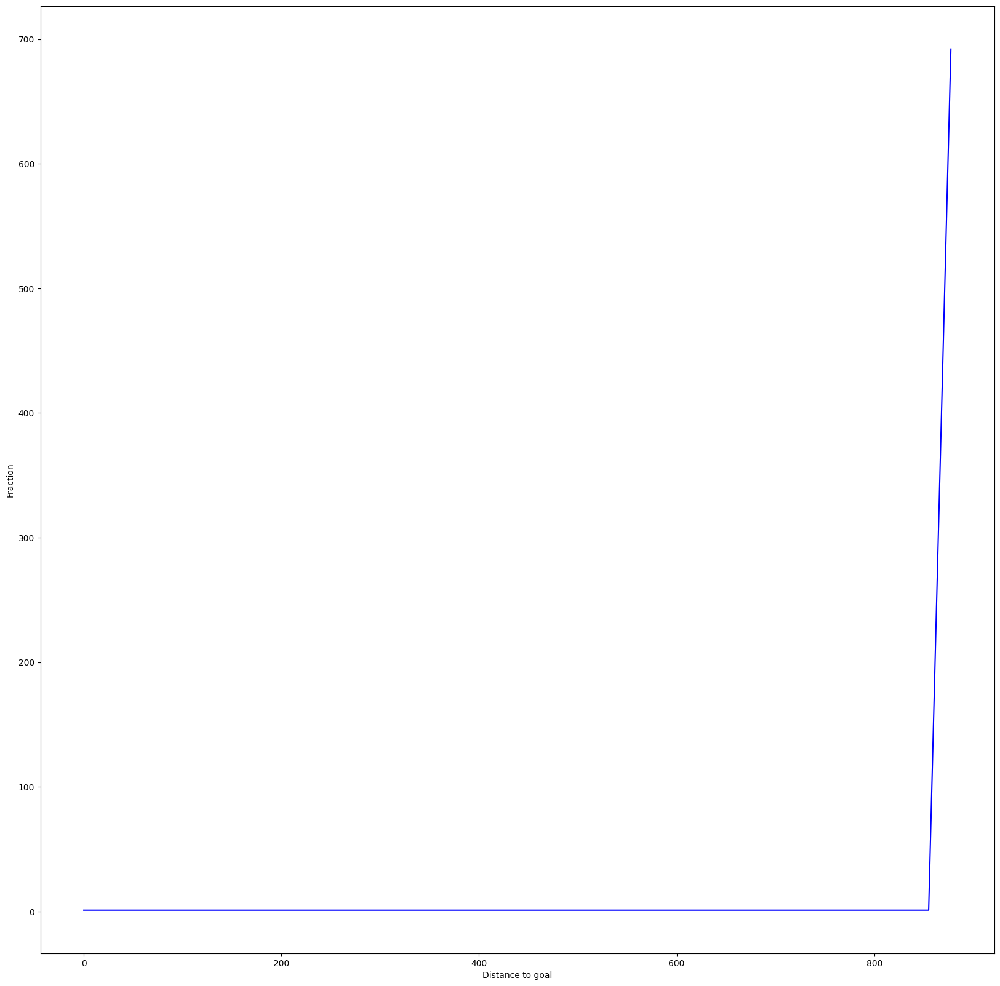

In [ ]:
plot_cumulative_distro_objective(archive)

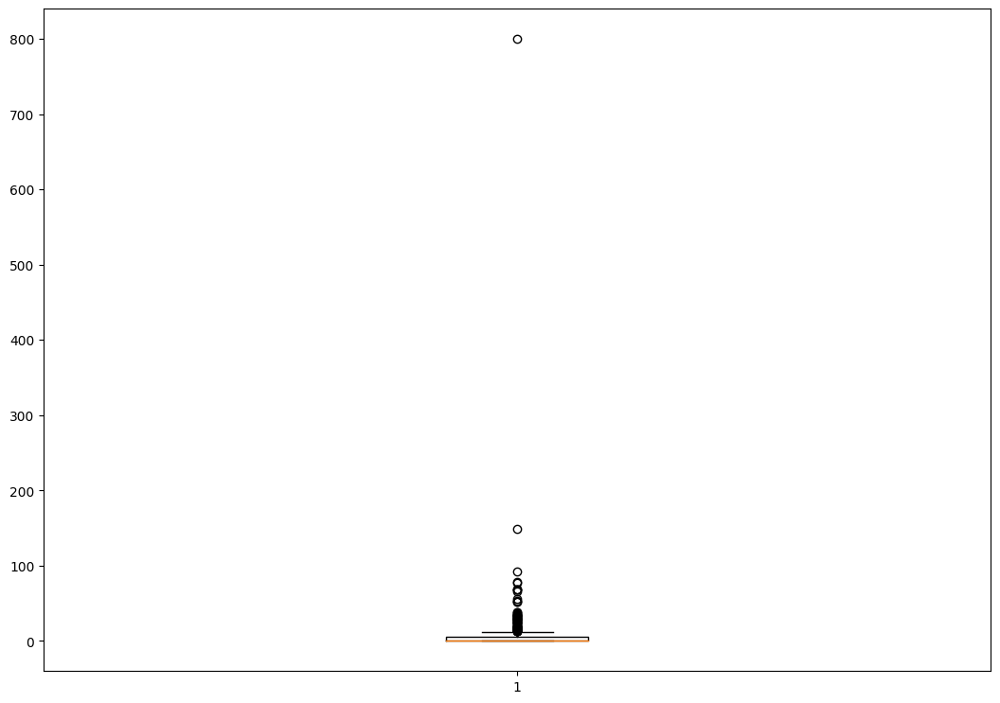

In [ ]:
plot_solution_spread(archive)

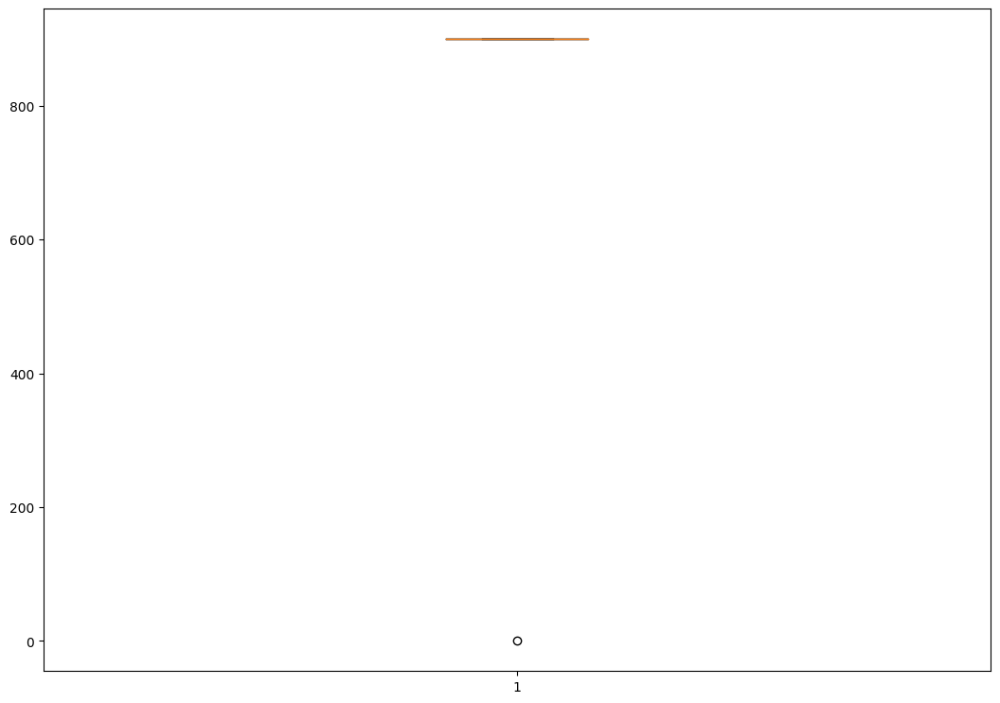

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })


extra time to initialize archive 0.001420736312866211
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014893293380737305
Iterations:   1%|          | 1/100 [00:18<30:46, 18.66s/it]archive training
time to add to som 0.022585391998291016
Iterations:   2%|▏         | 2/100 [00:36<30:07, 18.45s/it]archive training
time to add to som 0.03323674201965332
Iterations:   3%|▎         | 3/100 [00:55<29:43, 18.39s/it]archive training
time to add to som 0.05148601531982422
Iterations:   4%|▍         | 4/100 [01:14<30:11, 18.87s/it]archive training
time to add to som 0.04484224319458008
Iterations:   5%|▌         | 5/100 [01:34<30:10, 19.06s/it]archive training
time to add to som 0.05482816696166992
Iterations:   6%|▌         | 6/100 [01:52<29:39, 18.93s/it]archive training
time to add to som 0.06446480751037598
Iterations:   7%|▋         | 7/100 [02:11<29:09, 18.82s/it]archive training
time to add to som 0.09226775169372559
Iterations:   8%|▊         | 8/1

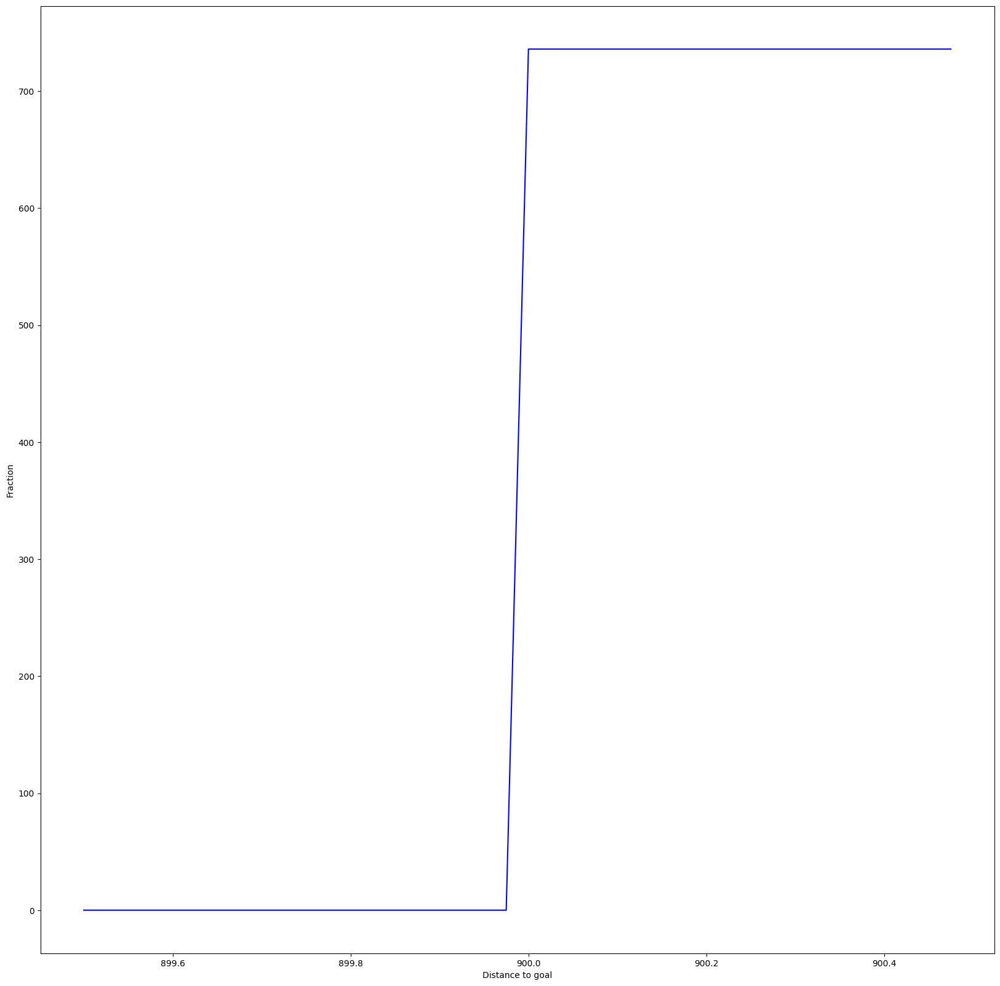

In [ ]:
plot_cumulative_distro_objective(archive)

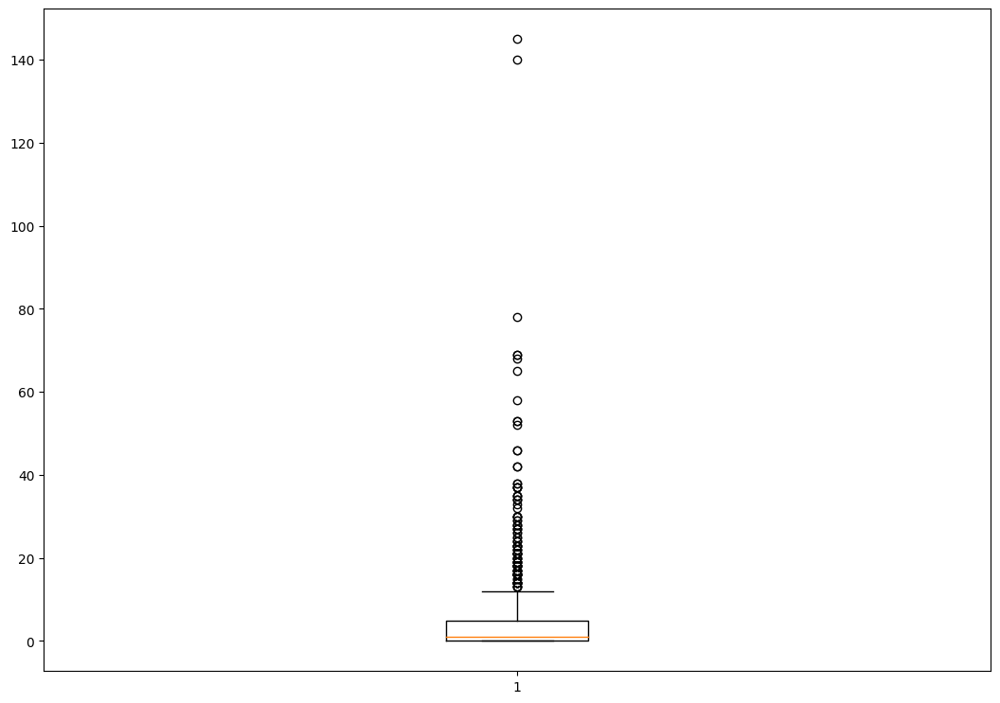

In [ ]:
plot_solution_spread(archive)

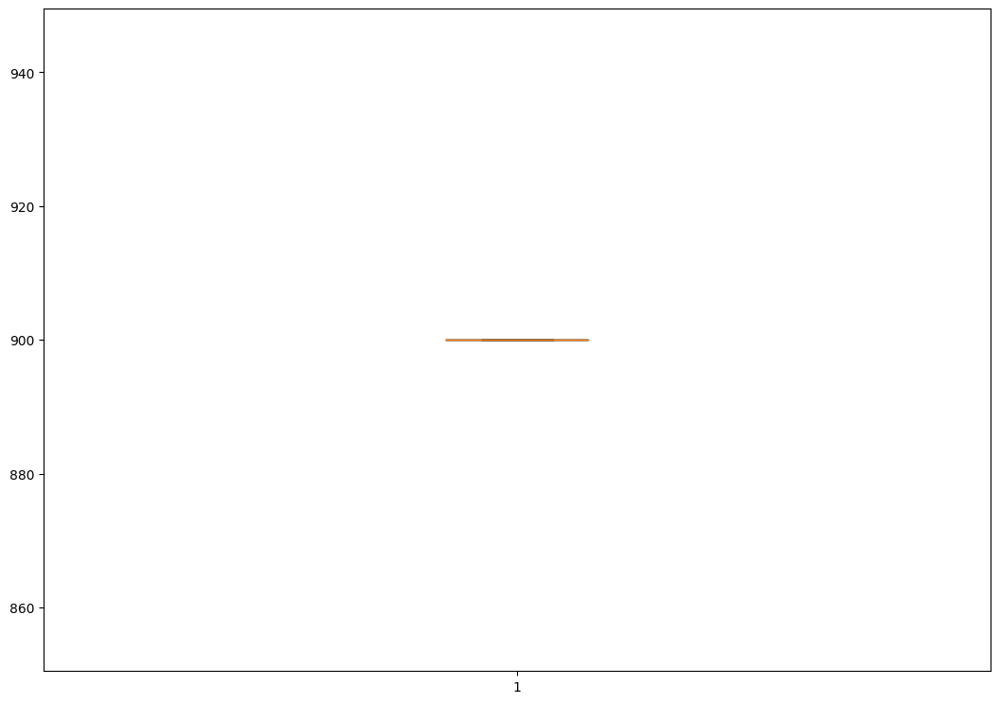

In [ ]:
plot_solution_distance(archive)

som doppio multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.00036072731018066406
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.02207159996032715
Iterations:   1%|          | 1/100 [00:20<33:58, 20.59s/it]archive training
time to add to som 0.020030498504638672
Iterations:   2%|▏         | 2/100 [00:40<32:42, 20.03s/it]archive training
time to add to som 0.024425506591796875
Iterations:   3%|▎         | 3/100 [00:59<32:02, 19.82s/it]archive training
time to add to som 0.04481005668640137
Iterations:   4%|▍         | 4/100 [01:20<32:06, 20.07s/it]archive training
time to add to som 0.051070213317871094
Iterations:   5%|▌         | 5/100 [01:40<31:50, 20.11s/it]archive training
time to add to som 0.043381452560424805
Iterations:   6%|▌         | 6/100 [01:59<31:11, 19.91s/it]archive training
time to add to som 0.05072641372680664
Iterations:   7%|▋         | 7/100 [02:19<30:38, 19.77s/it]archive training
time to add to som 0.07874131202697754
Iterations:   8%|▊         |

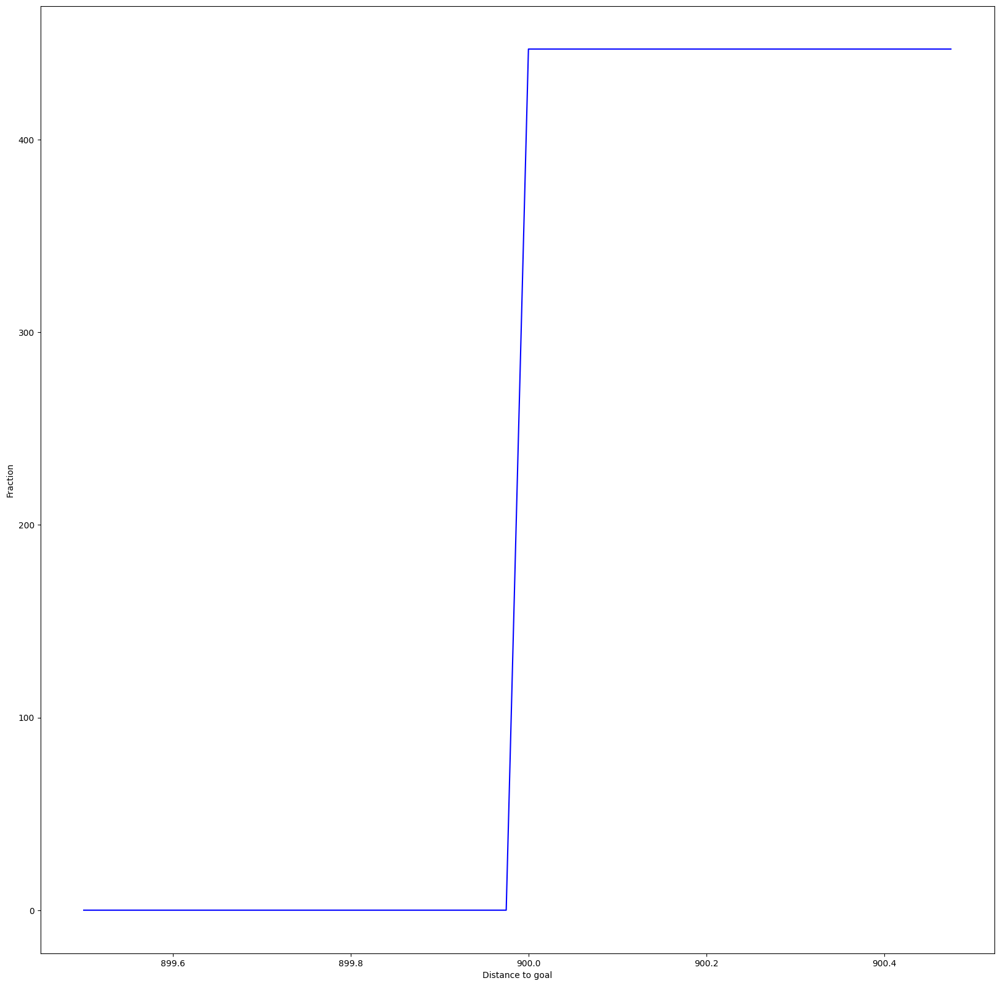

In [ ]:
plot_cumulative_distro_objective(archive)


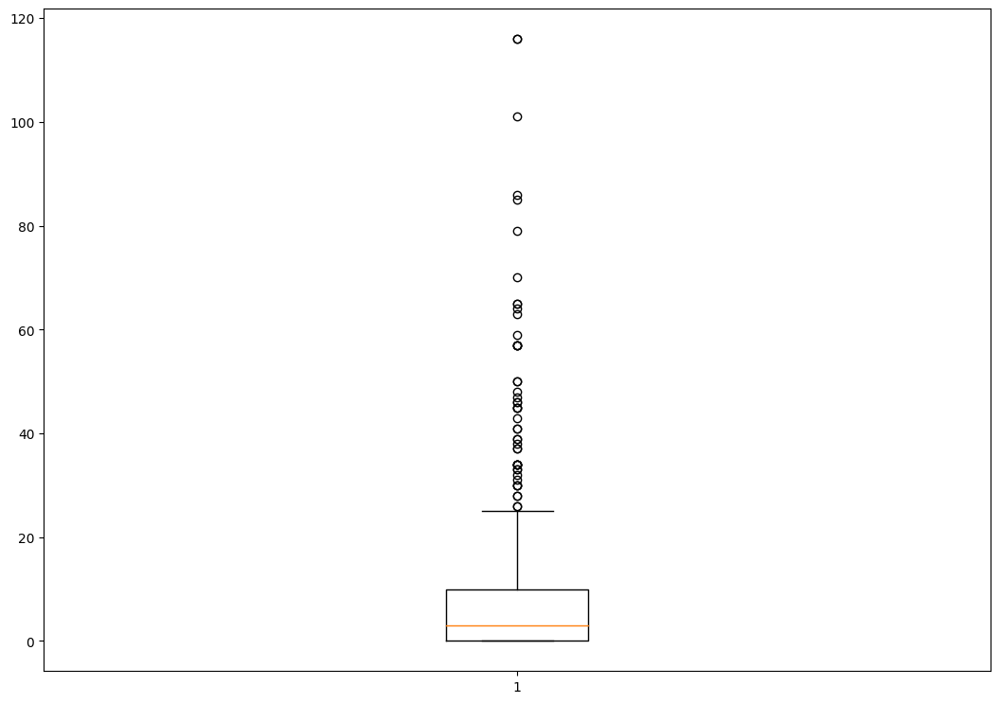

In [ ]:
plot_solution_spread(archive)


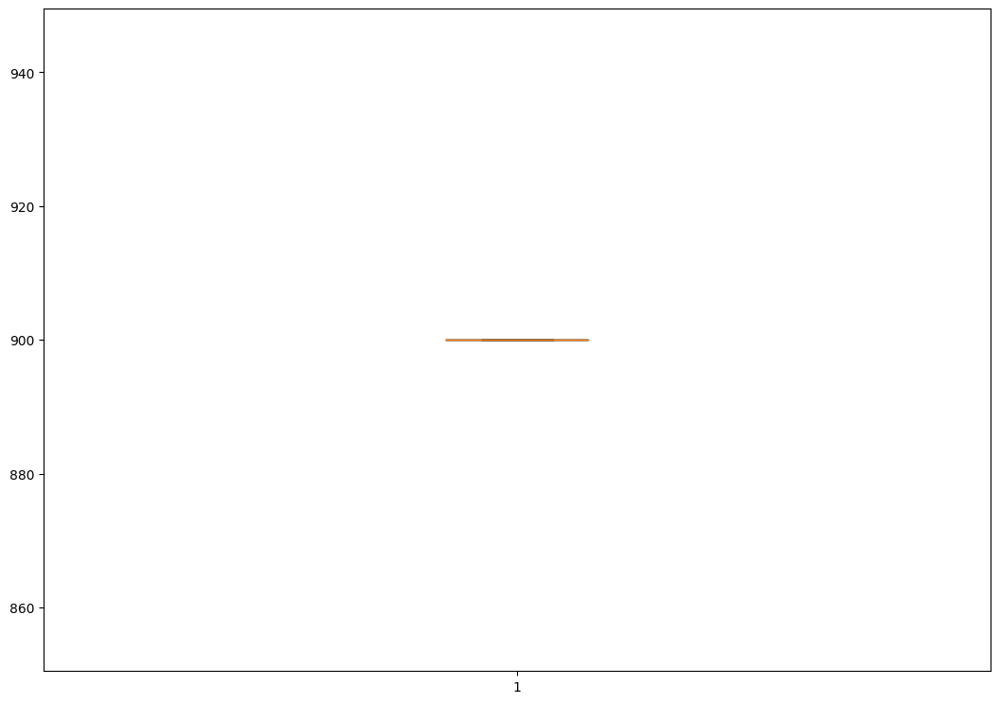

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })


extra time to initialize archive 0.0003247261047363281
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.030313730239868164
Iterations:   1%|          | 1/100 [00:20<33:12, 20.13s/it]archive training
time to add to som 0.02334141731262207
Iterations:   2%|▏         | 2/100 [00:39<31:53, 19.53s/it]archive training
time to add to som 0.032140254974365234
Iterations:   3%|▎         | 3/100 [00:57<30:55, 19.13s/it]archive training
time to add to som 0.04125213623046875
Iterations:   4%|▍         | 4/100 [01:16<30:34, 19.11s/it]archive training
time to add to som 0.06368088722229004
Iterations:   5%|▌         | 5/100 [01:36<30:43, 19.41s/it]archive training
time to add to som 0.05799078941345215
Iterations:   6%|▌         | 6/100 [01:55<30:07, 19.23s/it]archive training
time to add to som 0.05966329574584961
Iterations:   7%|▋         | 7/100 [02:14<29:23, 18.97s/it]archive training
time to add to som 0.0619654655456543
Iterations:   8%|▊         | 8/1

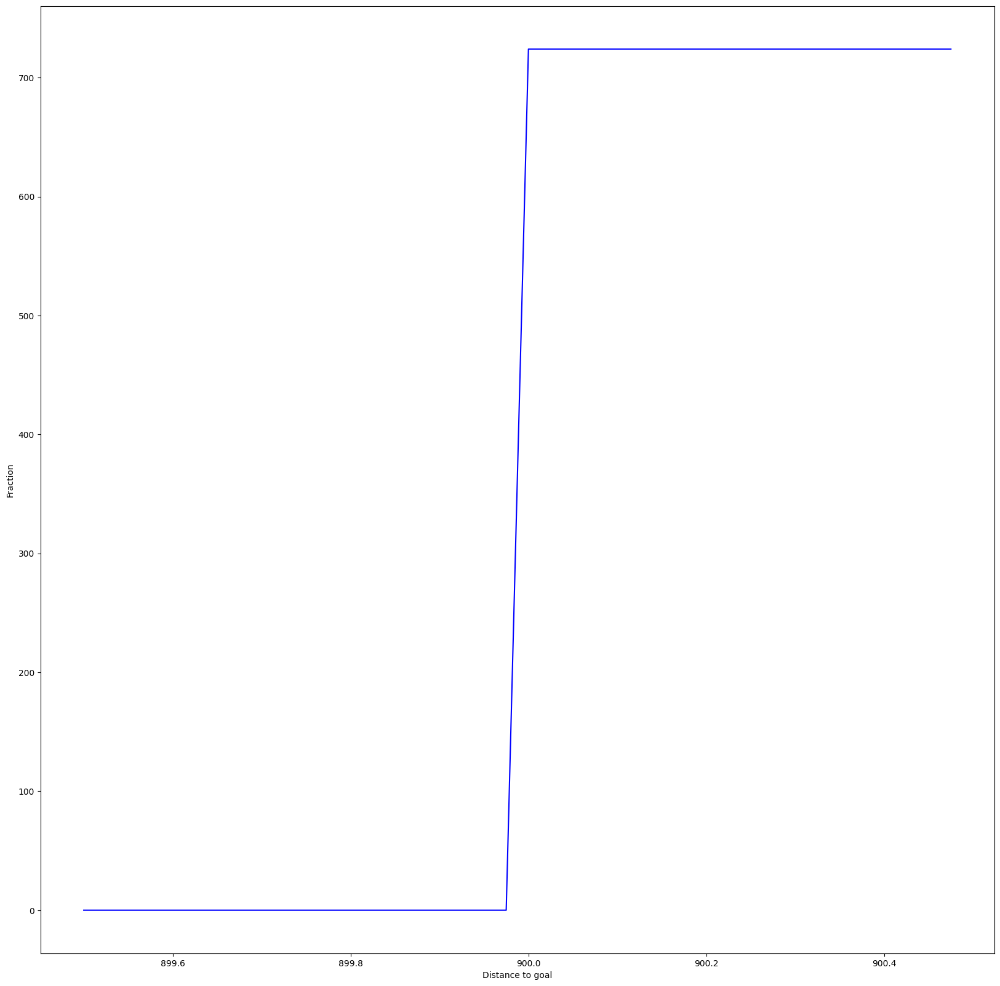

In [ ]:
plot_cumulative_distro_objective(archive)


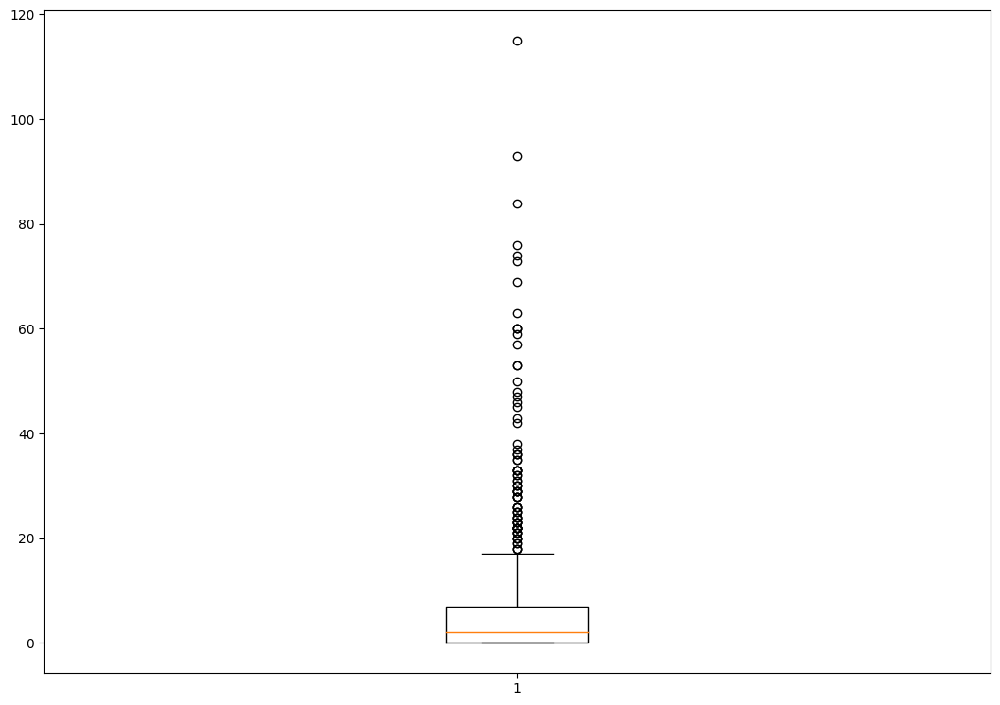

In [ ]:
plot_solution_spread(archive)


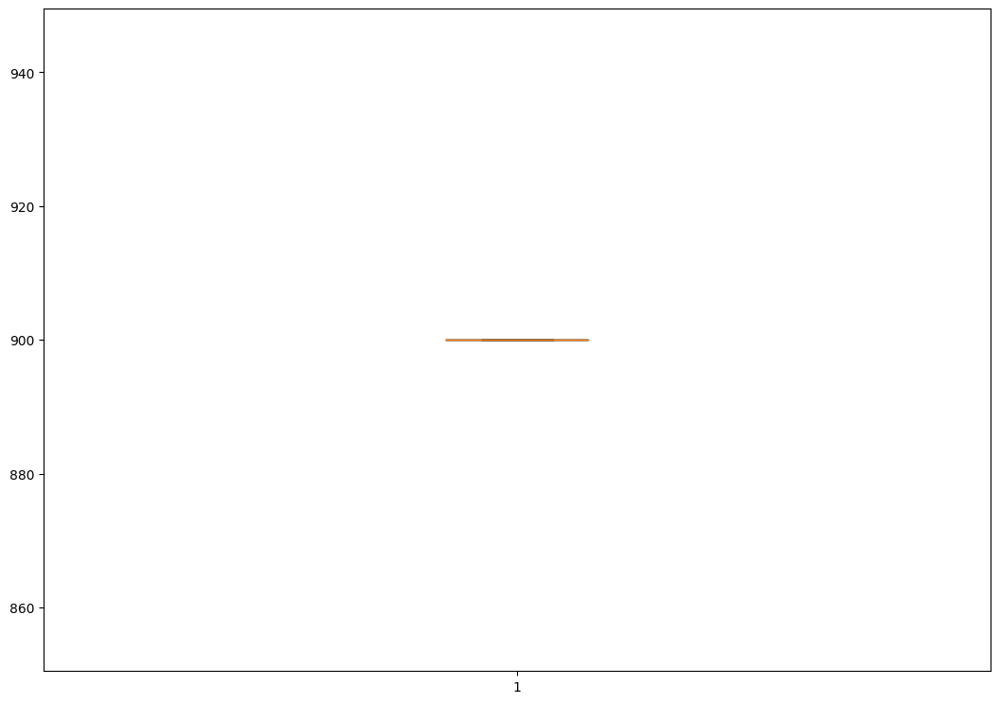

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 500, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.006918907165527344
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 3.9689481258392334
Iterations:   1%|          | 1/100 [00:47<1:18:03, 47.31s/it]archive training
time to add to som 0.021034955978393555
Iterations:   2%|▏         | 2/100 [01:27<1:10:34, 43.21s/it]archive training
time to add to som 0.027745962142944336
Iterations:   3%|▎         | 3/100 [02:07<1:07:43, 41.90s/it]archive training
time to add to som 0.03402090072631836
Iterations:   4%|▍         | 4/100 [02:46<1:05:11, 40.75s/it]archive training
time to add to som 0.04143476486206055
Iterations:   5%|▌         | 5/100 [03:28<1:04:49, 40.94s/it]archive training
time to add to som 0.06024289131164551
Iterations:   6%|▌         | 6/100 [04:17<1:08:44, 43.88s/it]archive training
time to add to som 0.07766842842102051
Iterations:   7%|▋         | 7/100 [04:58<1:06:16, 42.75s/it]archive training
time to add to som 0.07473301887512207
Iterations:   8%|▊ 

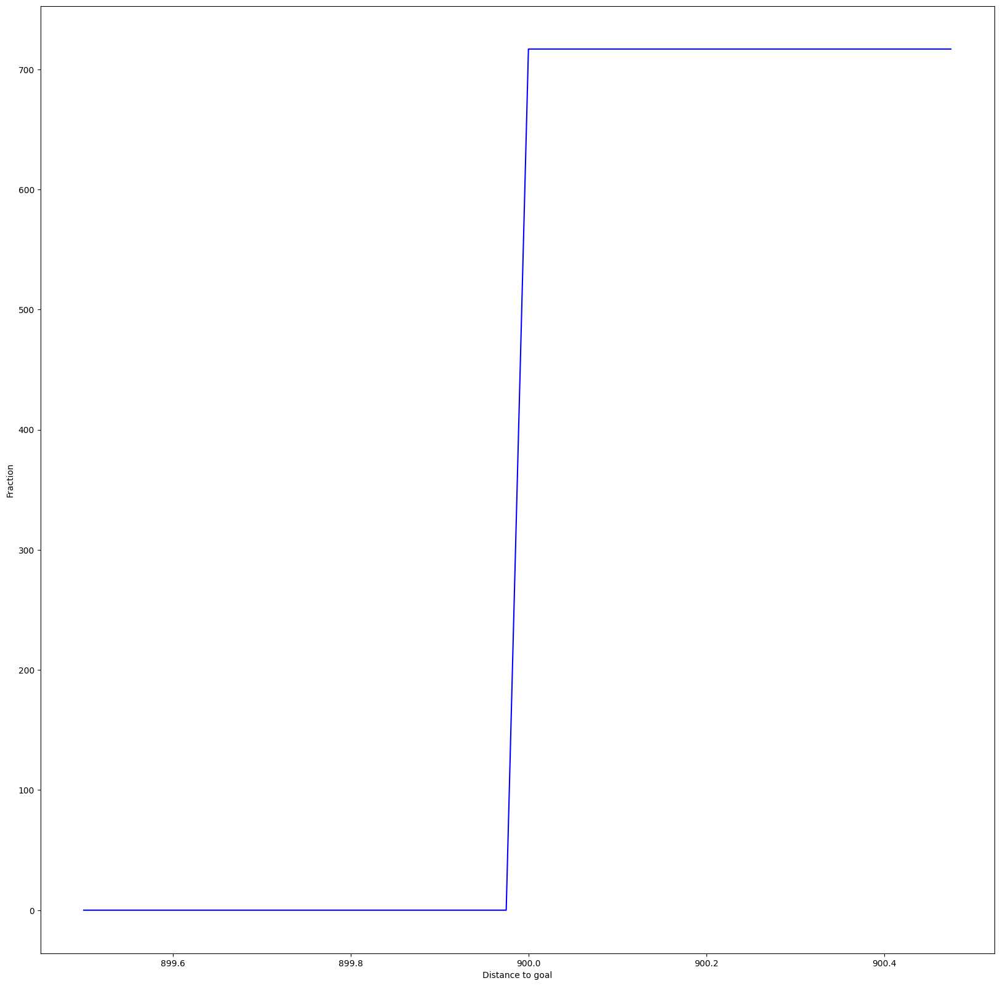

In [ ]:
plot_cumulative_distro_objective(archive)

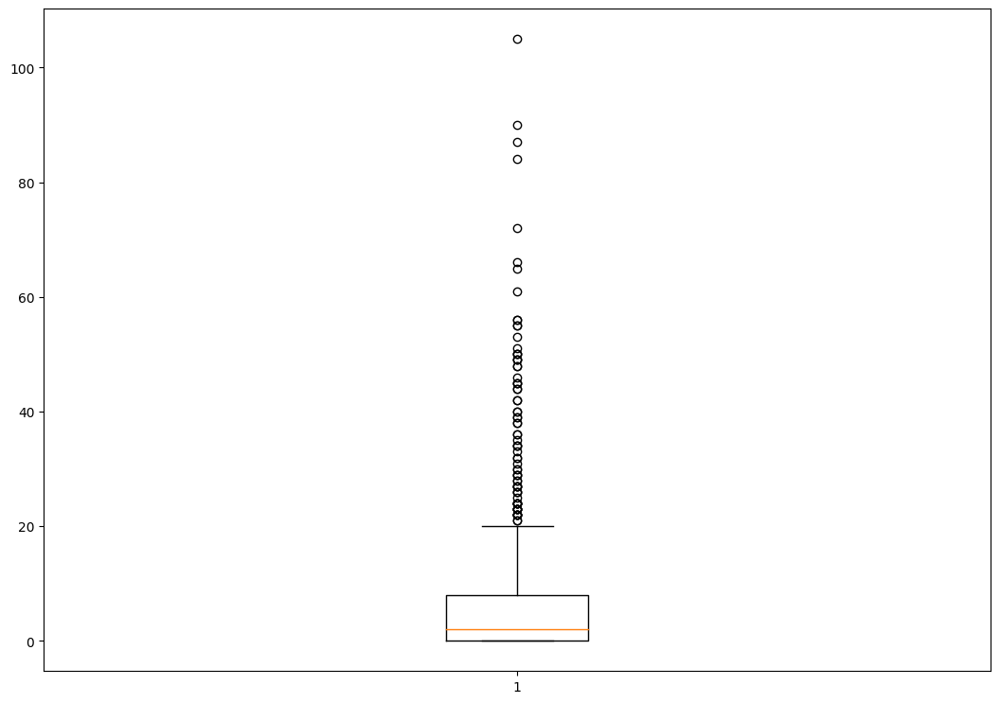

In [ ]:
plot_solution_spread(archive)

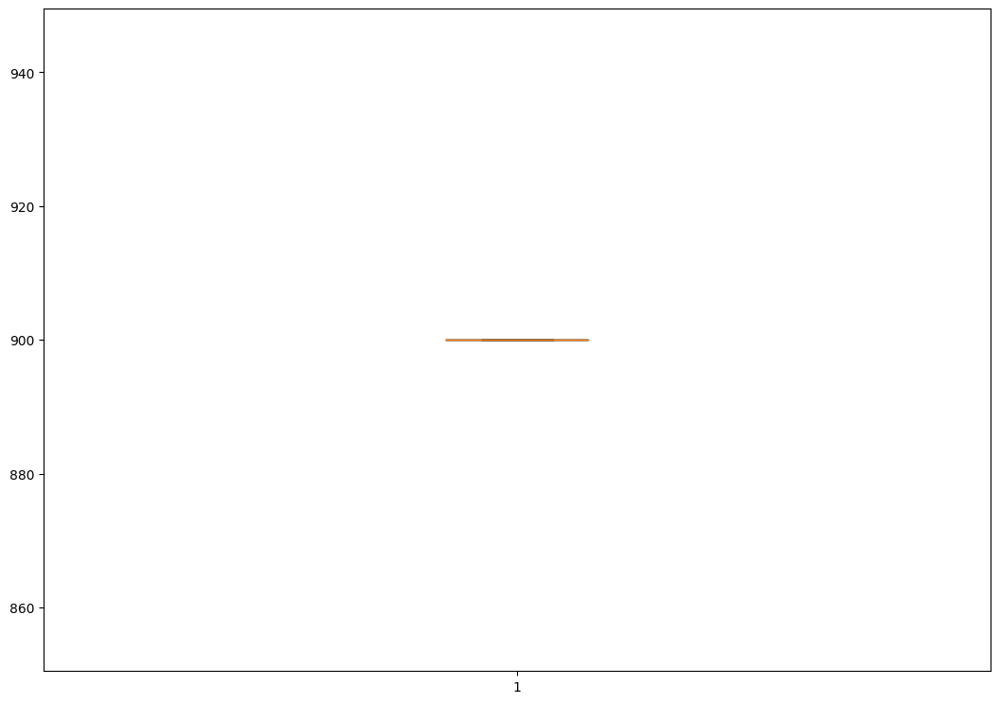

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze1", dim = 500, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0011937618255615234
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.017904996871948242
Iterations:   1%|          | 1/100 [00:34<57:40, 34.96s/it]archive training
time to add to som 0.026469707489013672
Iterations:   2%|▏         | 2/100 [01:10<58:02, 35.54s/it]archive training
time to add to som 0.03671598434448242
Iterations:   3%|▎         | 3/100 [01:45<56:55, 35.21s/it]archive training
time to add to som 0.04705309867858887
Iterations:   4%|▍         | 4/100 [02:21<56:57, 35.60s/it]archive training
time to add to som 0.05621004104614258
Iterations:   5%|▌         | 5/100 [03:11<1:04:07, 40.50s/it]archive training
time to add to som 0.09909200668334961
Iterations:   6%|▌         | 6/100 [03:47<1:01:11, 39.05s/it]archive training
time to add to som 0.08469843864440918
Iterations:   7%|▋         | 7/100 [04:25<59:55, 38.66s/it]  archive training
time to add to som 0.1016852855682373
Iterations:   8%|▊        

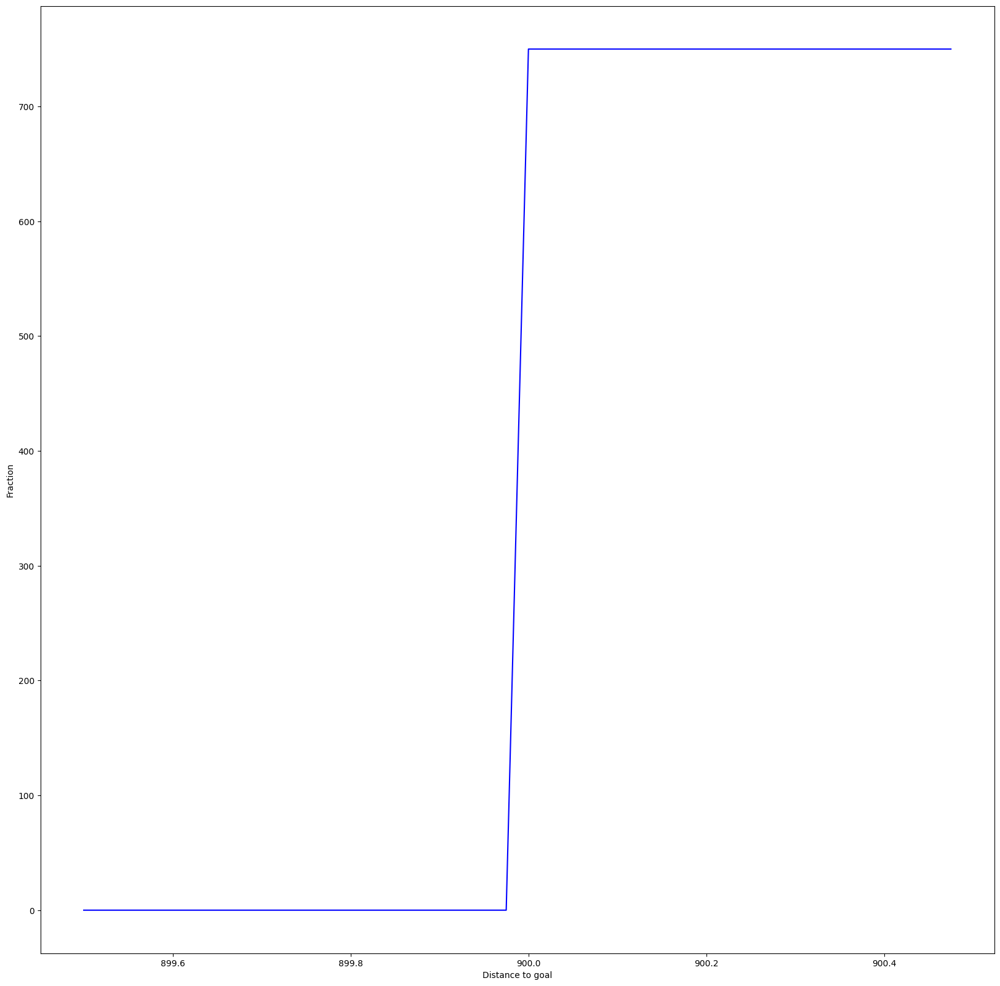

In [ ]:
plot_cumulative_distro_objective(archive)

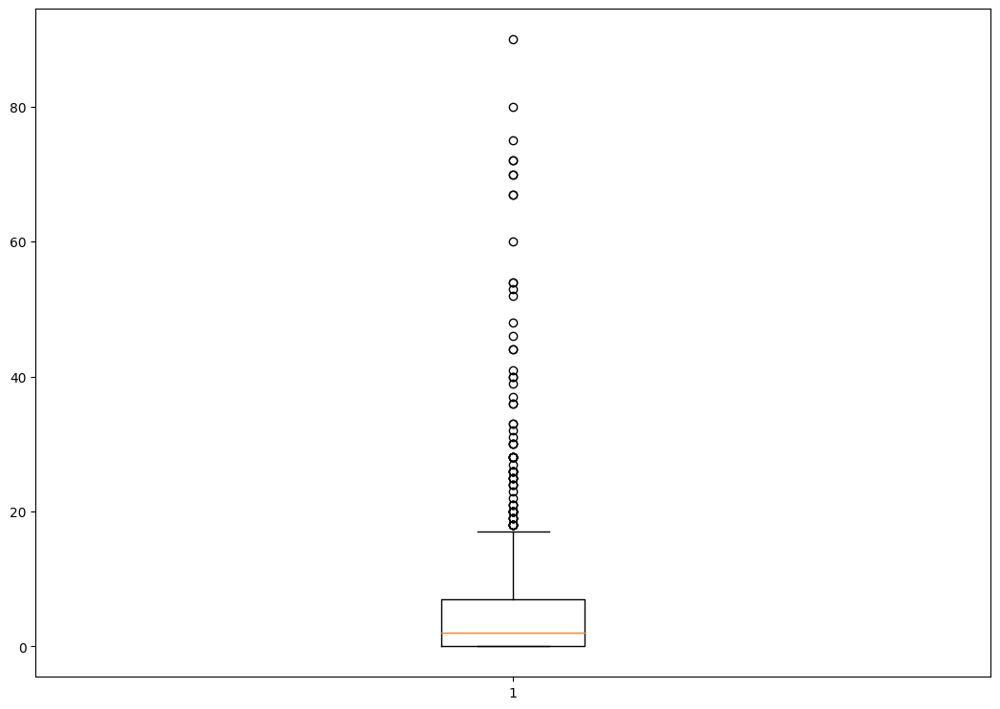

In [ ]:
plot_solution_spread(archive)

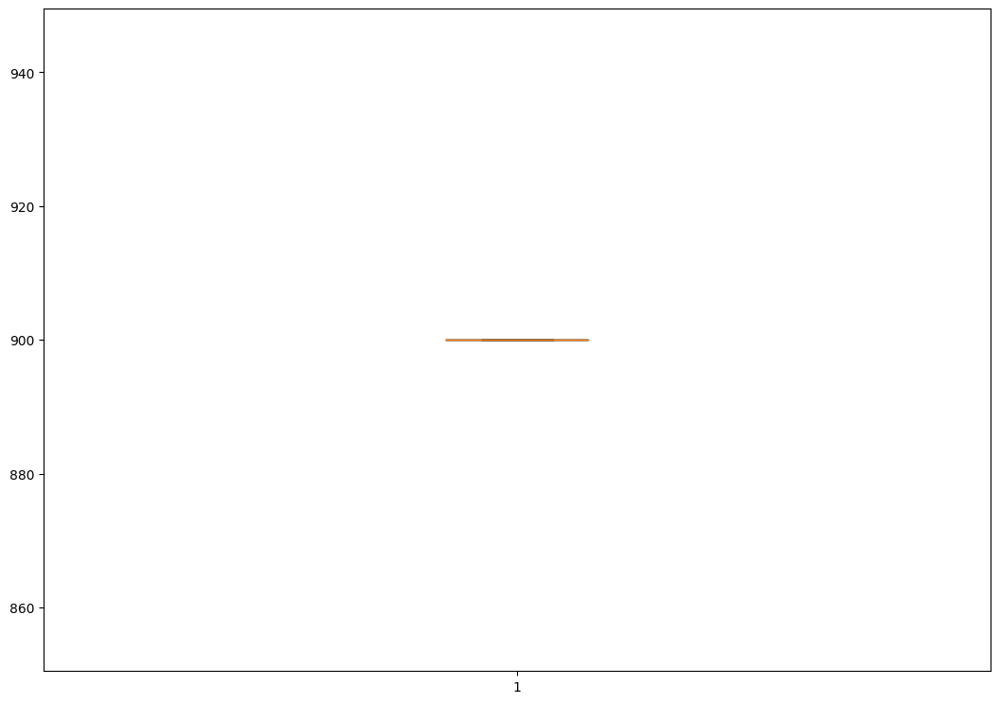

In [ ]:
plot_solution_distance(archive)

#####**11.1.2 maze 2**

######*11.1.3 1d*

cvt

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze2")

extra time to initialize archive 36.645715951919556
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.0036394596099853516
Iterations:   1%|          | 1/100 [00:27<45:09, 27.37s/it]archive training
time to add to cvt 0.003305196762084961
Iterations:   2%|▏         | 2/100 [00:54<44:24, 27.19s/it]archive training
time to add to cvt 0.003440380096435547
Iterations:   3%|▎         | 3/100 [01:22<44:18, 27.41s/it]archive training
time to add to cvt 0.004809856414794922
Iterations:   4%|▍         | 4/100 [01:49<43:33, 27.22s/it]archive training
time to add to cvt 0.0051958560943603516
Iterations:   5%|▌         | 5/100 [02:15<42:52, 27.08s/it]archive training
time to add to cvt 0.003633737564086914
Iterations:   6%|▌         | 6/100 [02:43<42:44, 27.28s/it]archive training
time to add to cvt 0.0032854080200195312
Iterations:   7%|▋         | 7/100 [03:11<42:30, 27.43s/it]archive training
time to add to cvt 0.004806995391845703
Iterations:   8%|▊       

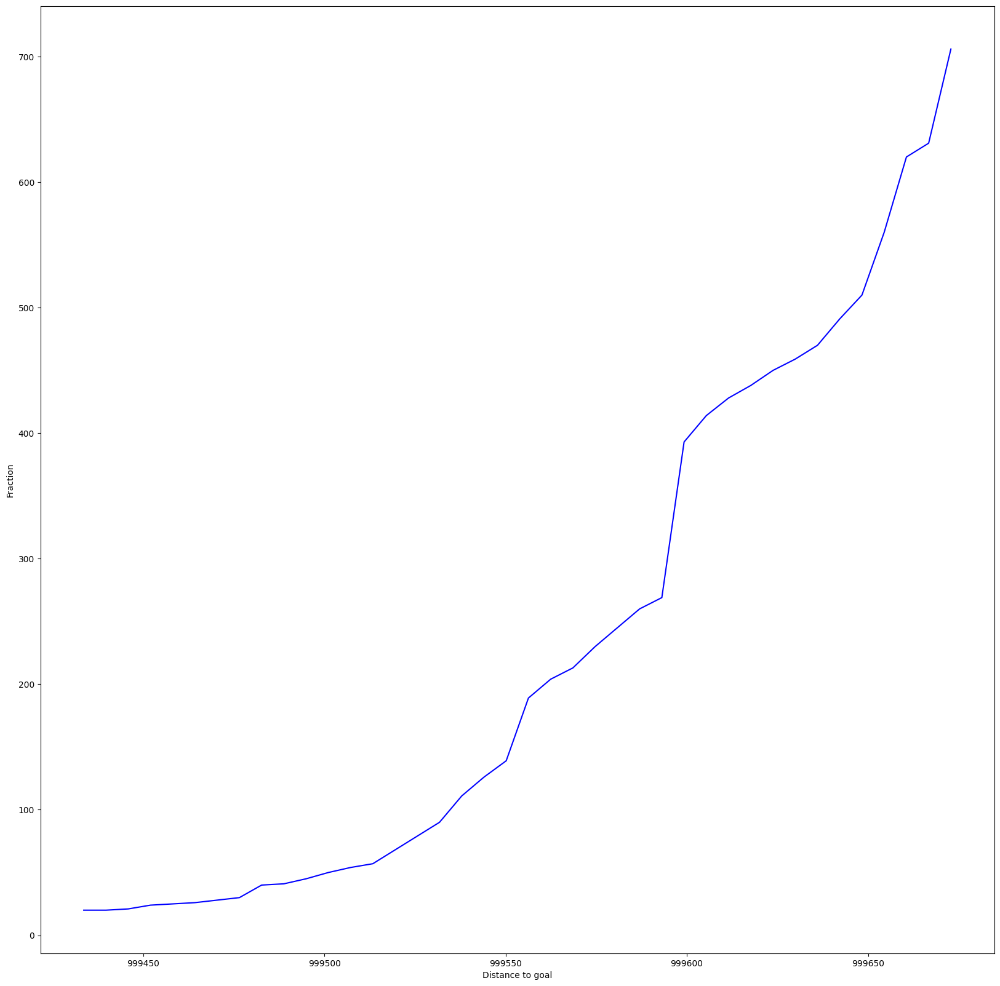

In [ ]:
plot_cumulative_distro_objective(archive)

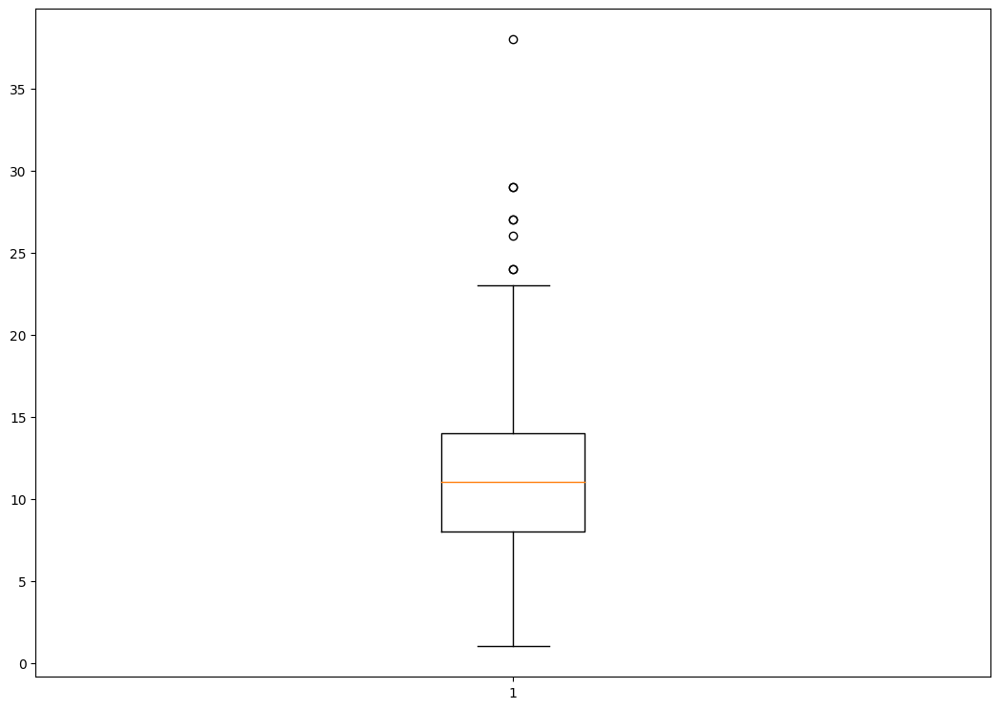

In [ ]:
plot_solution_spread(archive)

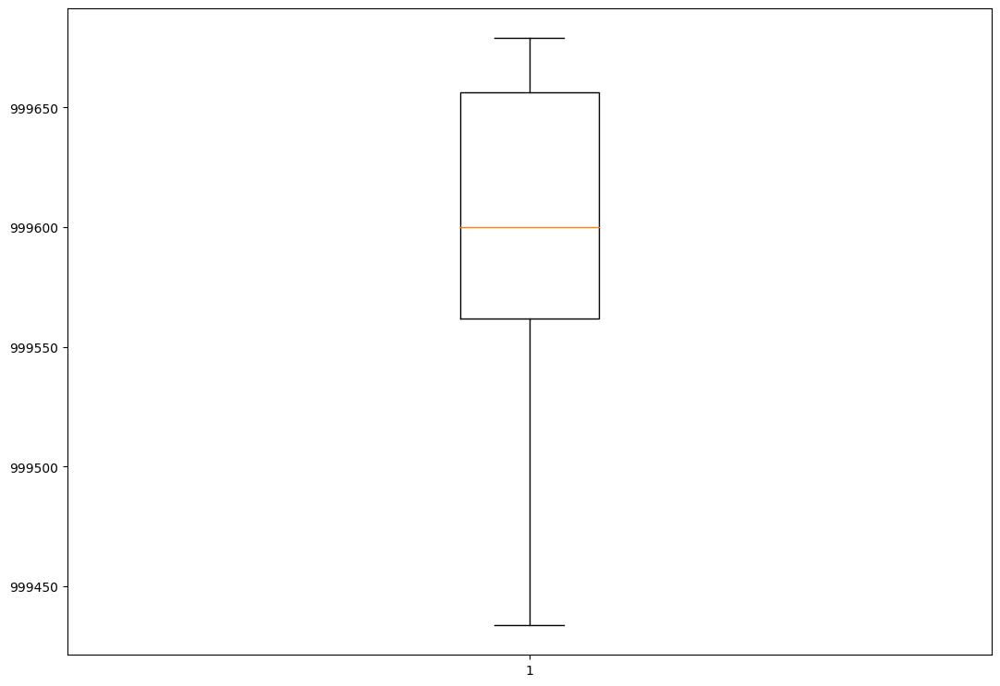

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2")

extra time to initialize archive 0.0003235340118408203
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012887716293334961
Iterations:   1%|          | 1/100 [00:17<29:09, 17.67s/it]archive training
time to add to som 0.020908832550048828
Iterations:   2%|▏         | 2/100 [00:35<29:19, 17.95s/it]archive training
time to add to som 0.08481311798095703
Iterations:   3%|▎         | 3/100 [00:54<29:53, 18.49s/it]archive training
time to add to som 0.015062093734741211
Iterations:   4%|▍         | 4/100 [01:12<29:11, 18.24s/it]archive training
time to add to som 0.01787424087524414
Iterations:   5%|▌         | 5/100 [01:30<28:35, 18.06s/it]archive training
time to add to som 0.016454219818115234
Iterations:   6%|▌         | 6/100 [01:48<28:03, 17.91s/it]archive training
time to add to som 0.017166852951049805
Iterations:   7%|▋         | 7/100 [02:05<27:39, 17.84s/it]archive training
time to add to som 0.027603864669799805
Iterations:   8%|▊         

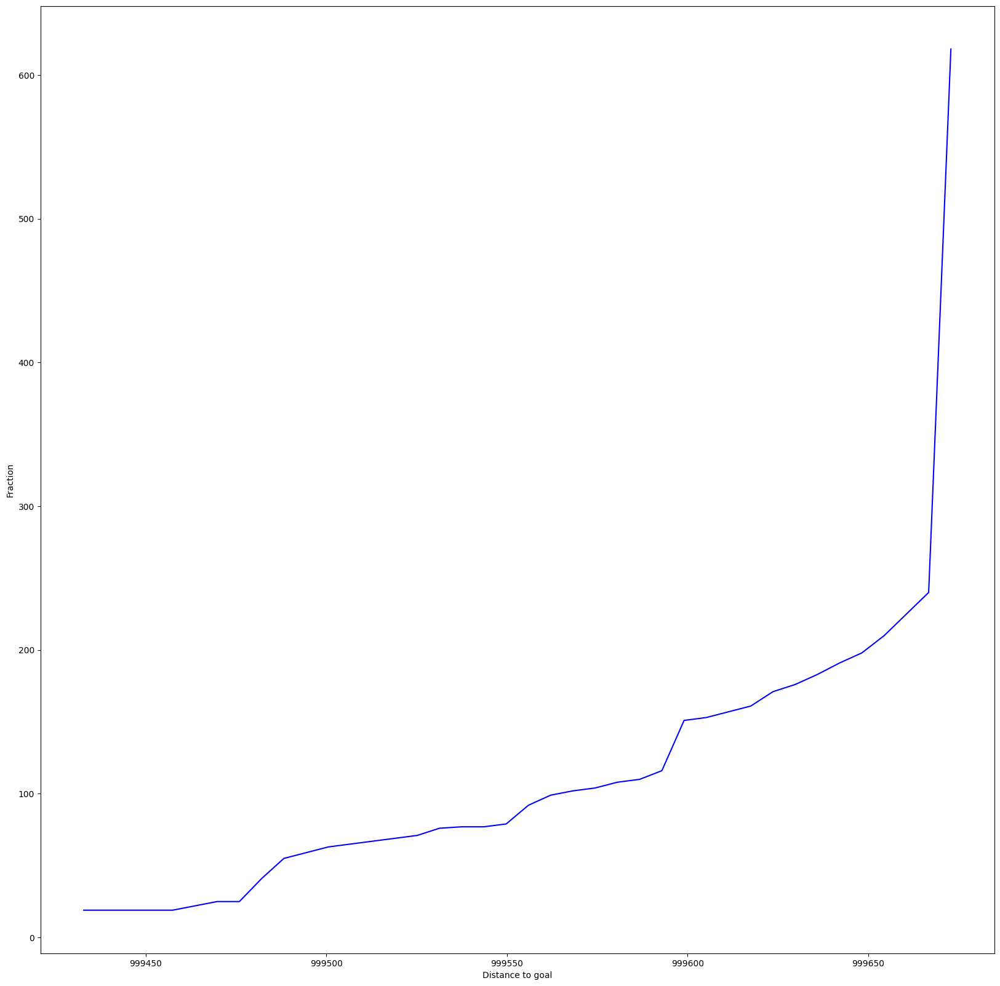

In [ ]:
plot_cumulative_distro_objective(archive)

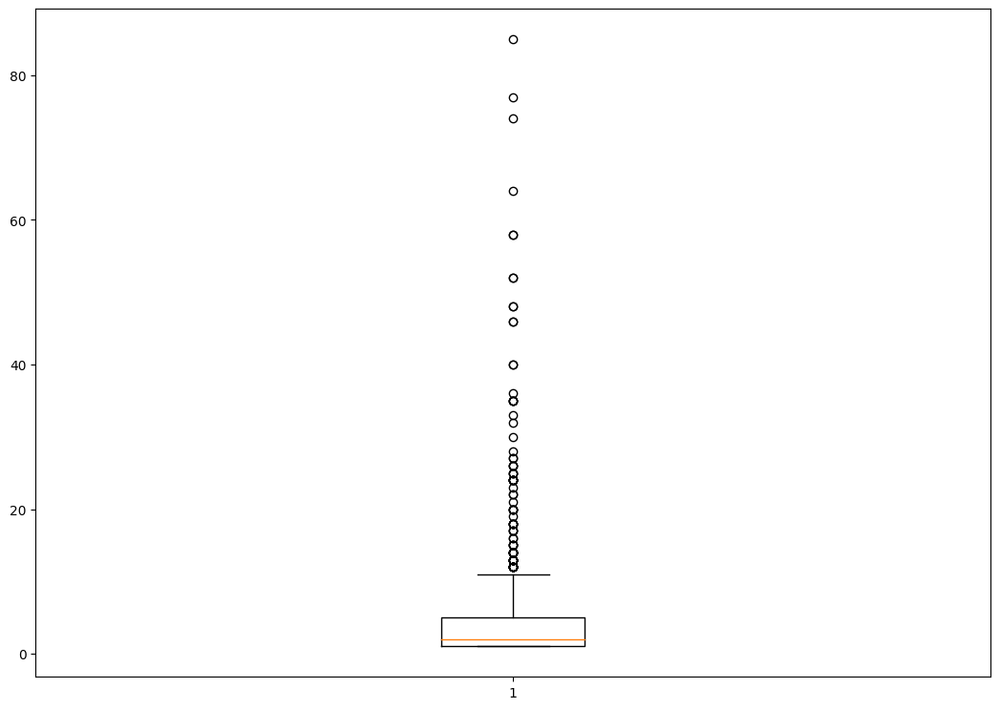

In [ ]:
plot_solution_spread(archive)

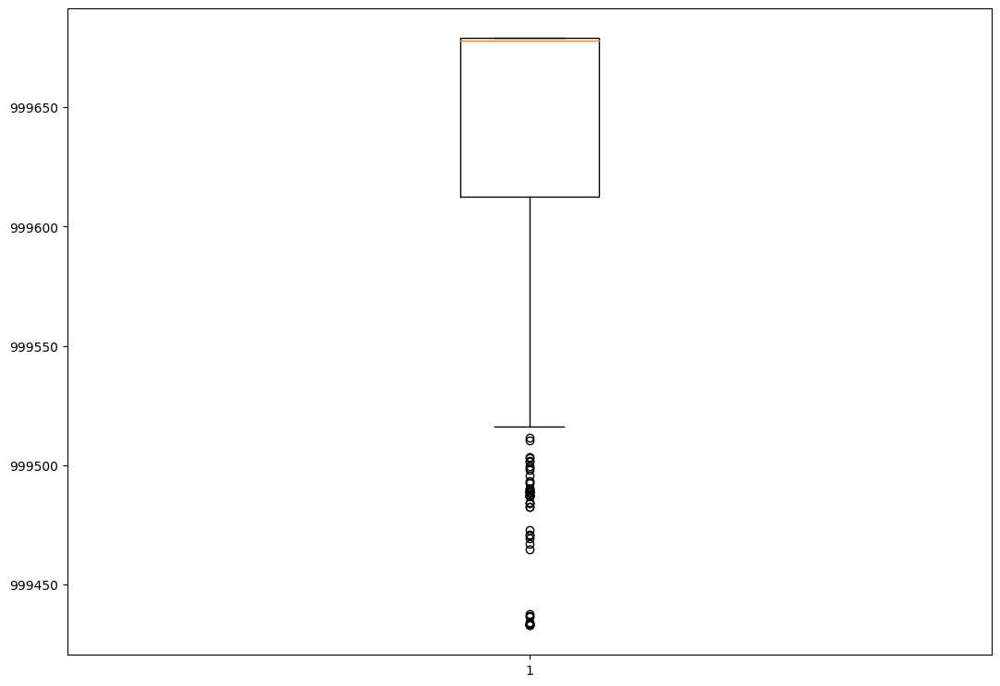

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 2, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })


extra time to initialize archive 0.0003464221954345703
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01189565658569336
Iterations:   1%|          | 1/100 [00:19<32:17, 19.58s/it]archive training
time to add to som 0.022576332092285156
Iterations:   2%|▏         | 2/100 [00:38<31:34, 19.34s/it]archive training
time to add to som 0.01891016960144043
Iterations:   3%|▎         | 3/100 [01:01<33:25, 20.68s/it]archive training
time to add to som 0.014484643936157227
Iterations:   4%|▍         | 4/100 [01:20<32:28, 20.30s/it]archive training
time to add to som 0.01799321174621582
Iterations:   5%|▌         | 5/100 [01:40<31:38, 19.99s/it]archive training
time to add to som 0.03031611442565918
Iterations:   6%|▌         | 6/100 [02:00<31:36, 20.18s/it]archive training
time to add to som 0.018399477005004883
Iterations:   7%|▋         | 7/100 [02:21<31:36, 20.40s/it]archive training
time to add to som 0.017839431762695312
Iterations:   8%|▊         | 

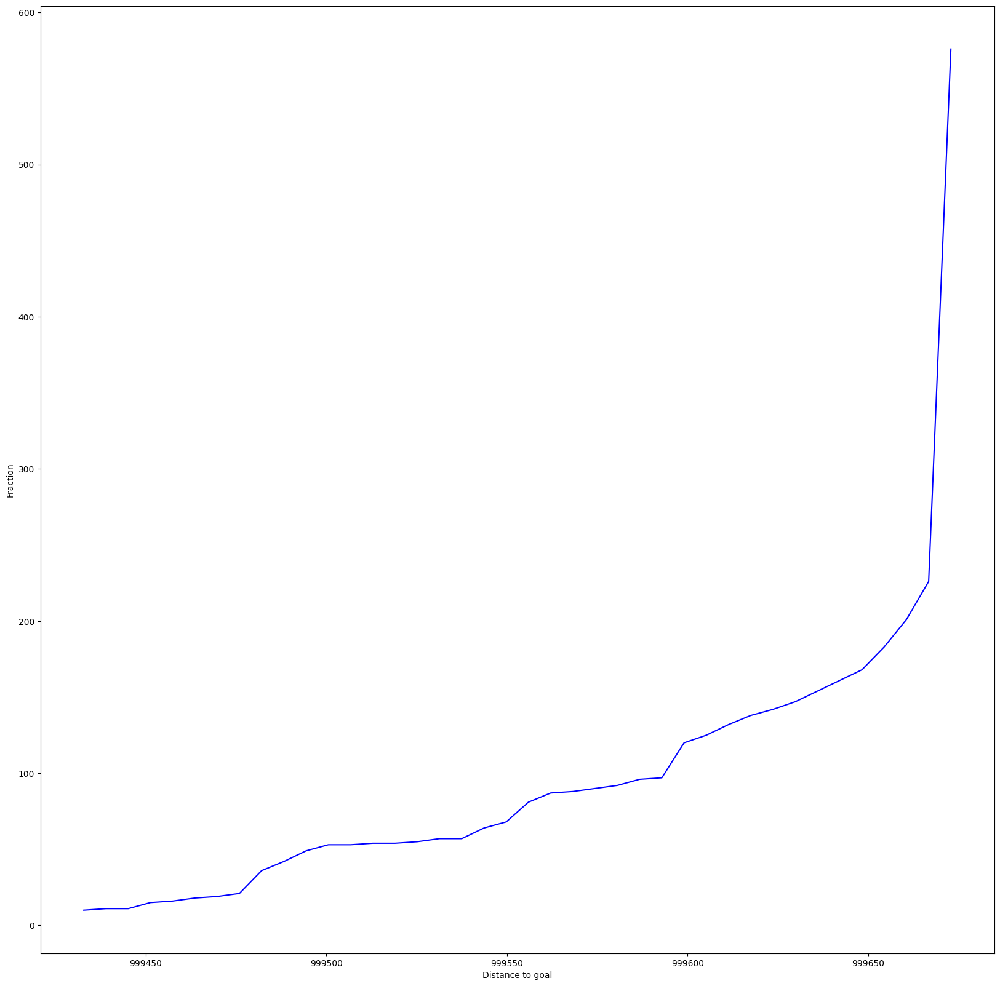

In [ ]:
plot_cumulative_distro_objective(archive)

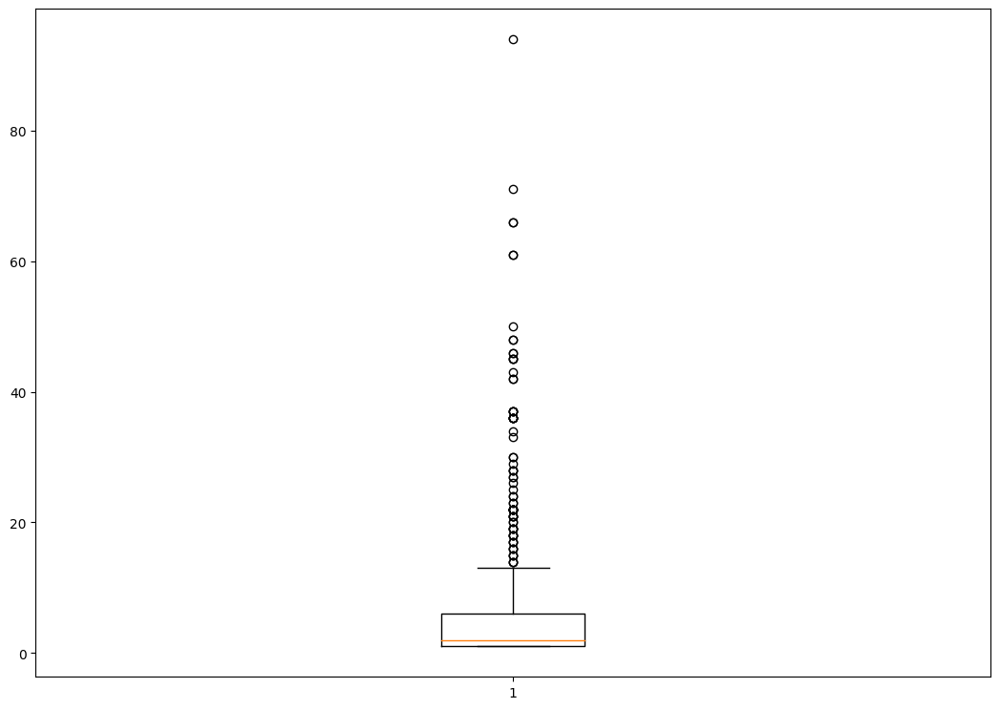

In [ ]:
plot_solution_spread(archive)


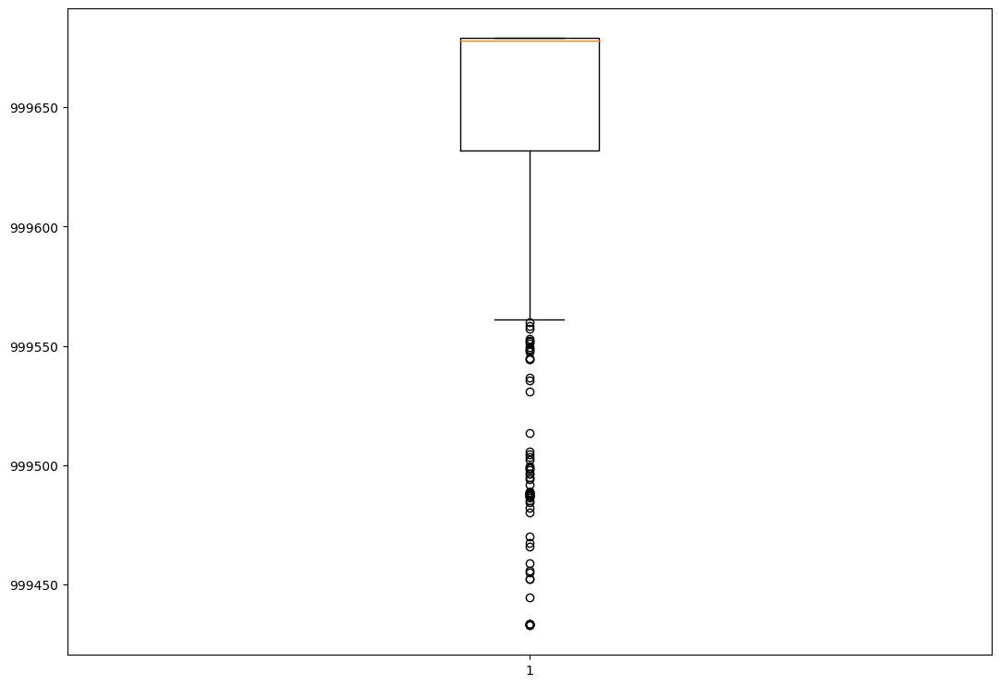

In [ ]:
plot_solution_distance(archive)

som double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 2, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.00040721893310546875
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.011518716812133789
Iterations:   1%|          | 1/100 [00:18<31:06, 18.86s/it]archive training
time to add to som 0.020606279373168945
Iterations:   2%|▏         | 2/100 [00:37<30:48, 18.86s/it]archive training
time to add to som 0.013927221298217773
Iterations:   3%|▎         | 3/100 [00:57<30:59, 19.17s/it]archive training
time to add to som 0.018352746963500977
Iterations:   4%|▍         | 4/100 [01:16<30:25, 19.01s/it]archive training
time to add to som 0.01573324203491211
Iterations:   5%|▌         | 5/100 [01:35<30:05, 19.00s/it]archive training
time to add to som 0.0246737003326416
Iterations:   6%|▌         | 6/100 [01:54<29:51, 19.06s/it]archive training
time to add to som 0.026000261306762695
Iterations:   7%|▋         | 7/100 [02:14<30:13, 19.50s/it]archive training
time to add to som 0.017045974731445312
Iterations:   8%|▊         

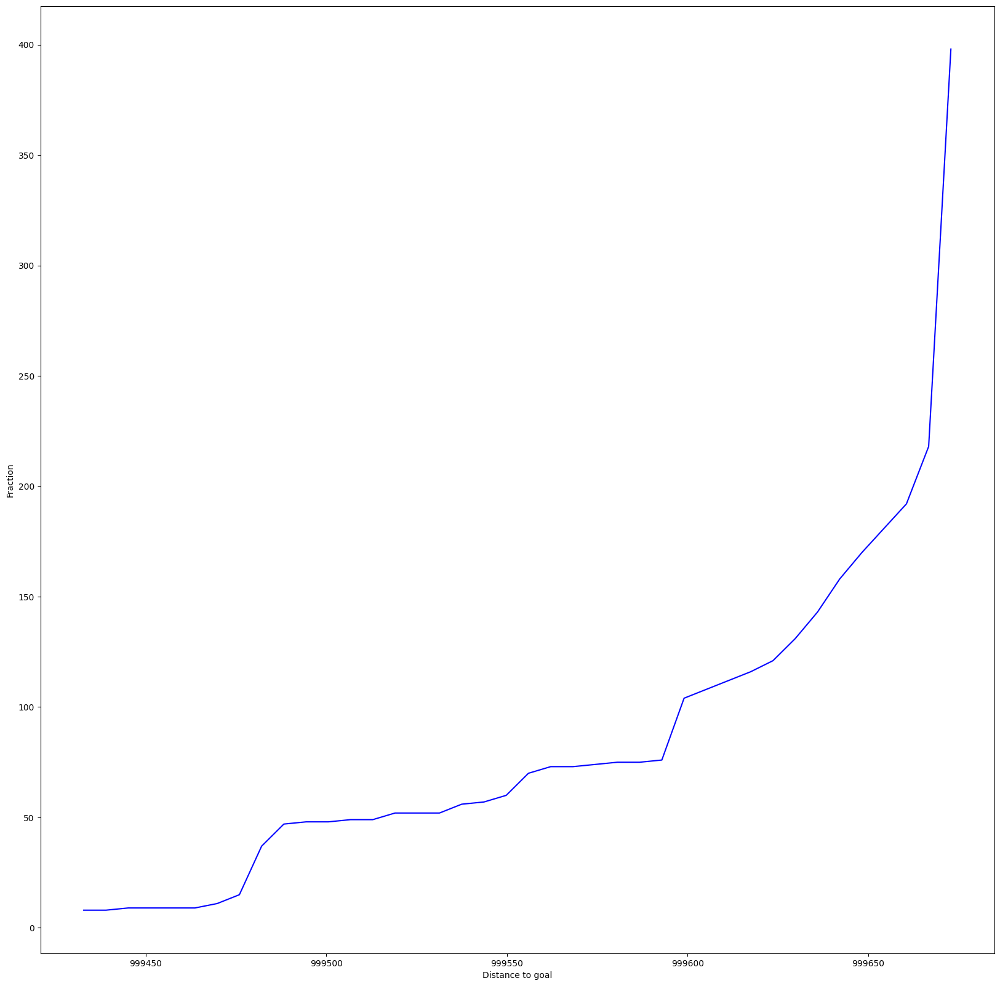

In [ ]:
plot_cumulative_distro_objective(archive)

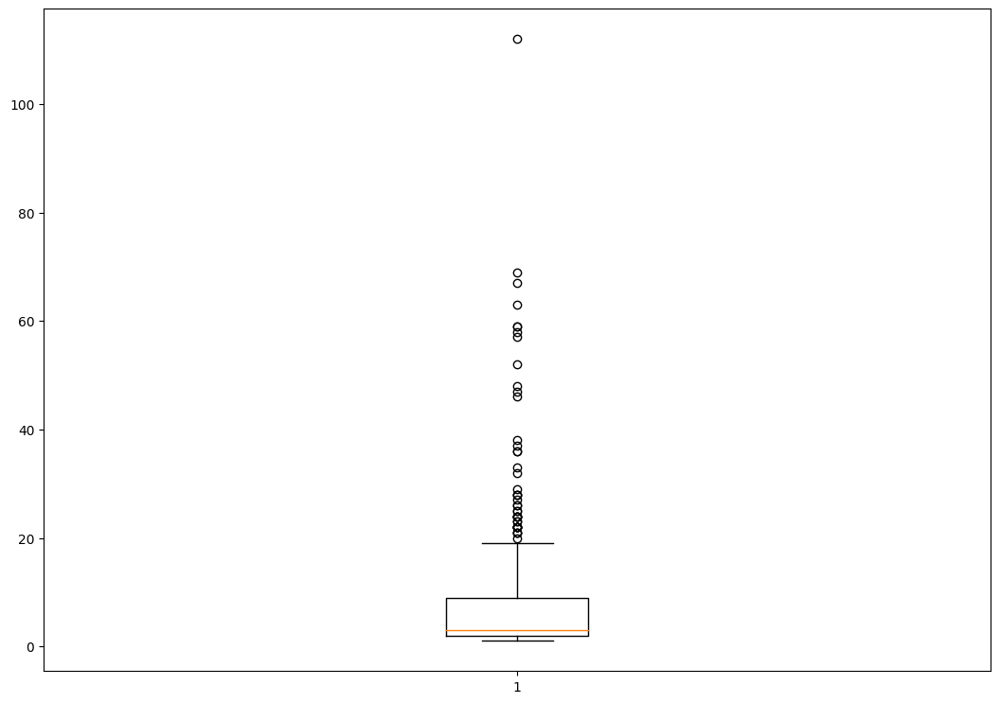

In [ ]:
plot_solution_spread(archive)

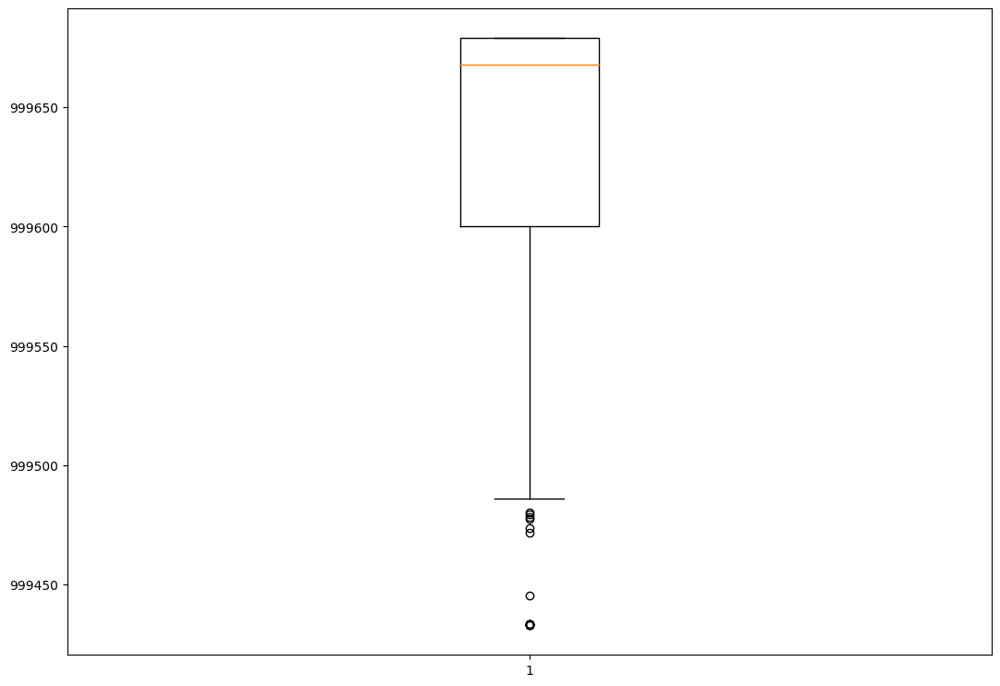

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 2, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })


extra time to initialize archive 0.007986783981323242
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.02083301544189453
Iterations:   1%|          | 1/100 [00:32<54:20, 32.93s/it]archive training
time to add to som 0.013614416122436523
Iterations:   2%|▏         | 2/100 [01:03<51:15, 31.39s/it]archive training
time to add to som 0.022572040557861328
Iterations:   3%|▎         | 3/100 [01:27<45:26, 28.11s/it]archive training
time to add to som 0.07041645050048828
Iterations:   4%|▍         | 4/100 [02:01<48:58, 30.61s/it]archive training
time to add to som 0.03710055351257324
Iterations:   5%|▌         | 5/100 [02:30<47:35, 30.06s/it]archive training
time to add to som 0.01726078987121582
Iterations:   6%|▌         | 6/100 [02:58<45:42, 29.18s/it]archive training
time to add to som 0.021569252014160156
Iterations:   7%|▋         | 7/100 [03:16<39:42, 25.62s/it]archive training
time to add to som 0.019105911254882812
Iterations:   8%|▊         | 8

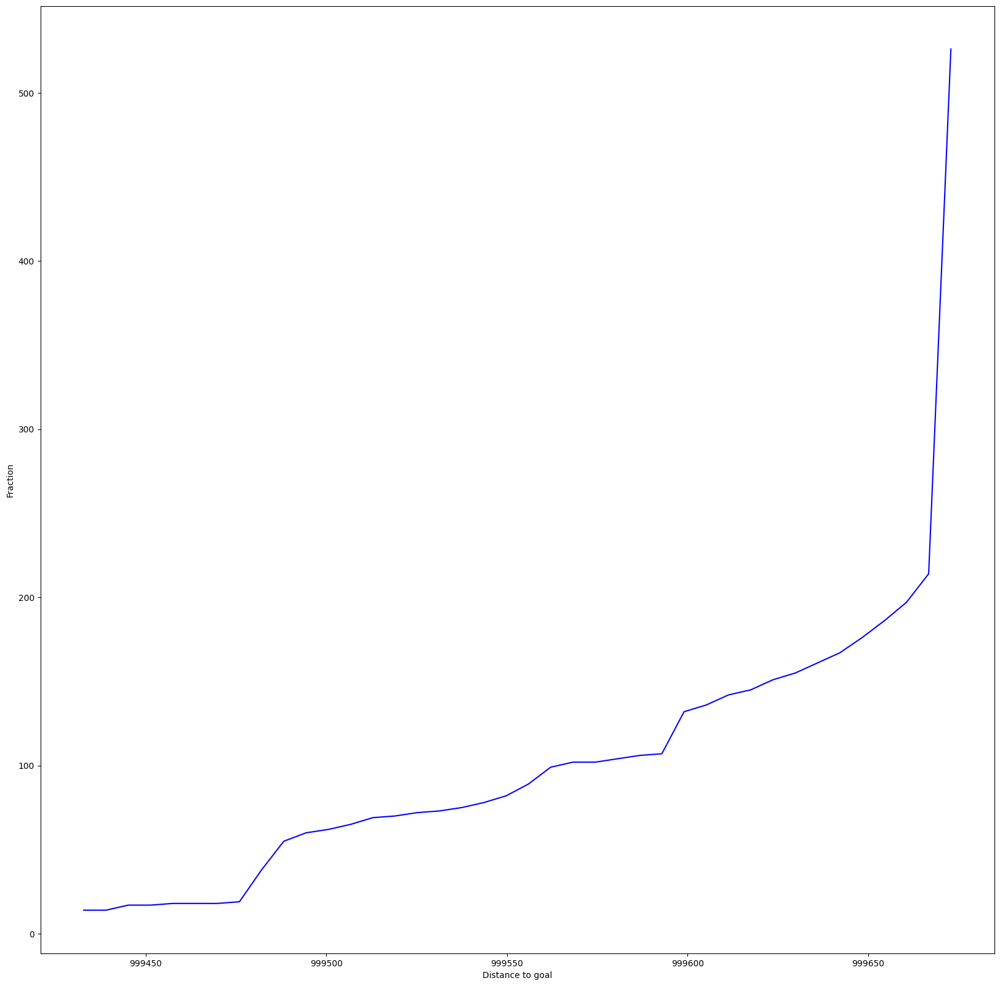

In [ ]:
plot_cumulative_distro_objective(archive)


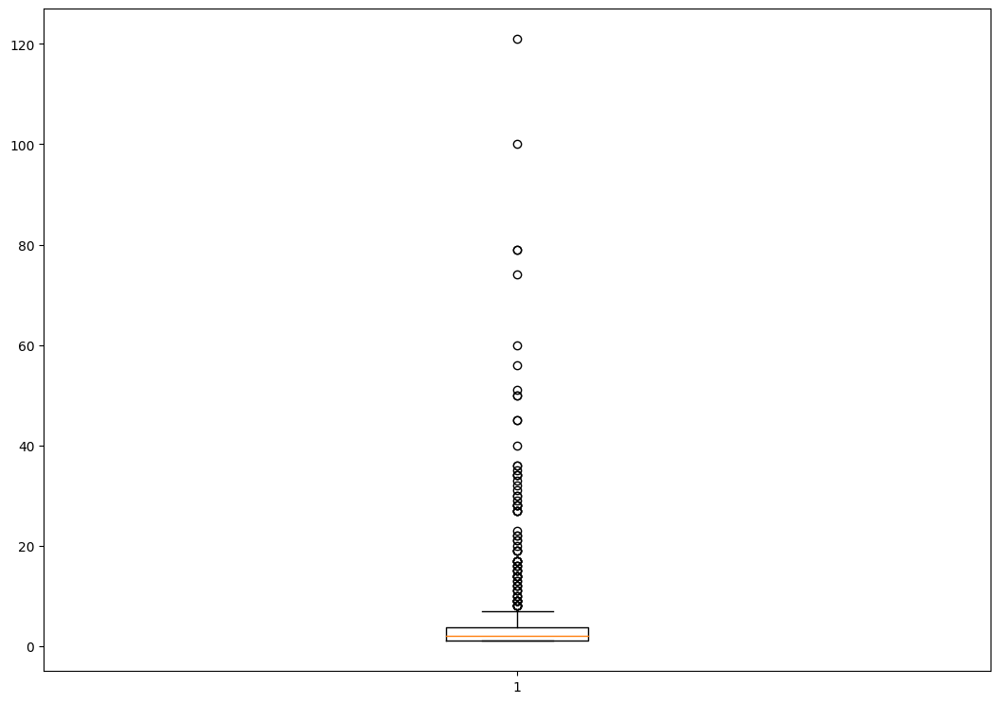

In [ ]:
plot_solution_spread(archive)


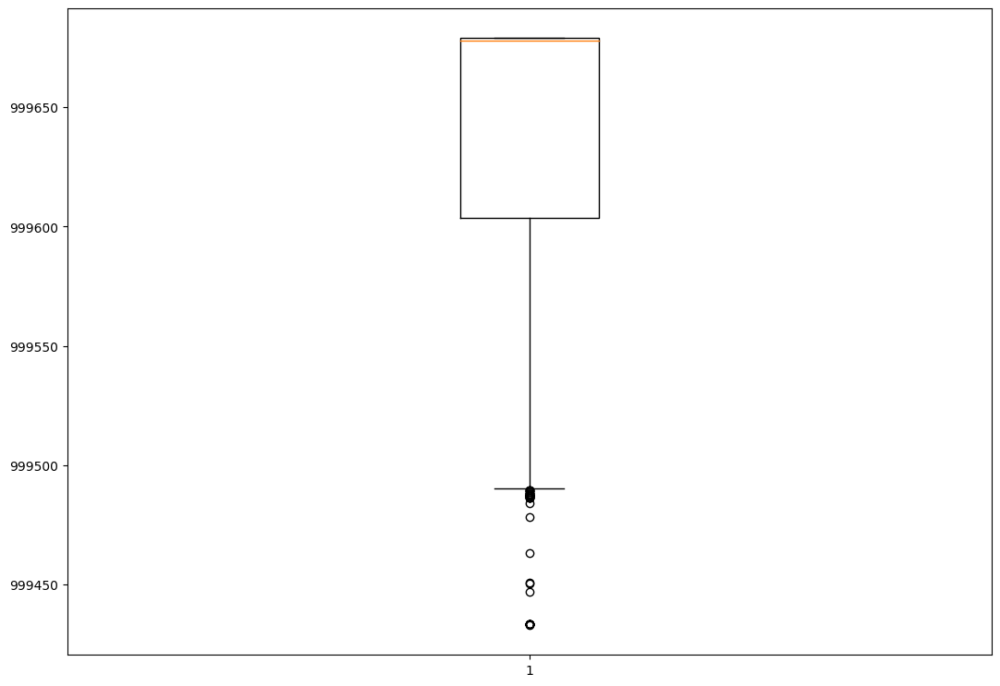

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 2, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })
)


In [ ]:
plot_cumulative_distro_objective(archive

In [ ]:
plot_solution_spread(archive)


In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 2, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




In [ ]:
plot_cumulative_distro_objective(archive)

In [ ]:
plot_solution_spread(archive)

In [ ]:
plot_solution_distance(archive)

######*11.1.3 50d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze2", dim=50)

extra time to initialize archive 78.62267923355103
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.02778911590576172
Iterations:   1%|          | 1/100 [00:54<1:30:26, 54.81s/it]archive training
time to add to cvt 0.02875971794128418
Iterations:   2%|▏         | 2/100 [01:41<1:21:47, 50.08s/it]archive training
time to add to cvt 0.06650233268737793
Iterations:   3%|▎         | 3/100 [02:29<1:19:04, 48.92s/it]archive training
time to add to cvt 0.03960227966308594
Iterations:   4%|▍         | 4/100 [03:10<1:13:44, 46.09s/it]archive training
time to add to cvt 0.03940749168395996
Iterations:   5%|▌         | 5/100 [03:59<1:14:13, 46.88s/it]archive training
time to add to cvt 0.4236586093902588
Iterations:   6%|▌         | 6/100 [04:52<1:16:38, 48.93s/it]archive training
time to add to cvt 0.02687358856201172
Iterations:   7%|▋         | 7/100 [05:41<1:16:00, 49.04s/it]archive training
time to add to cvt 0.1242835521697998
Iterations:   8%|▊       

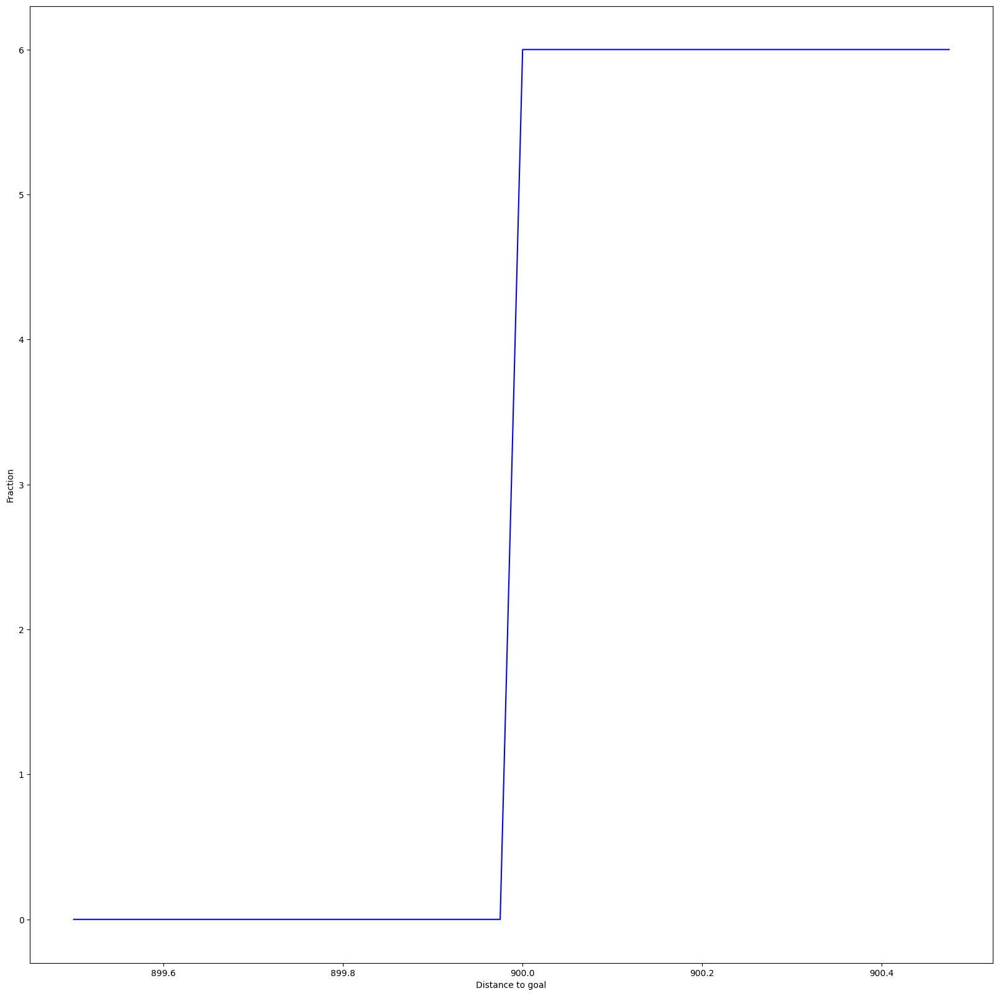

In [ ]:
plot_cumulative_distro_objective(archive)

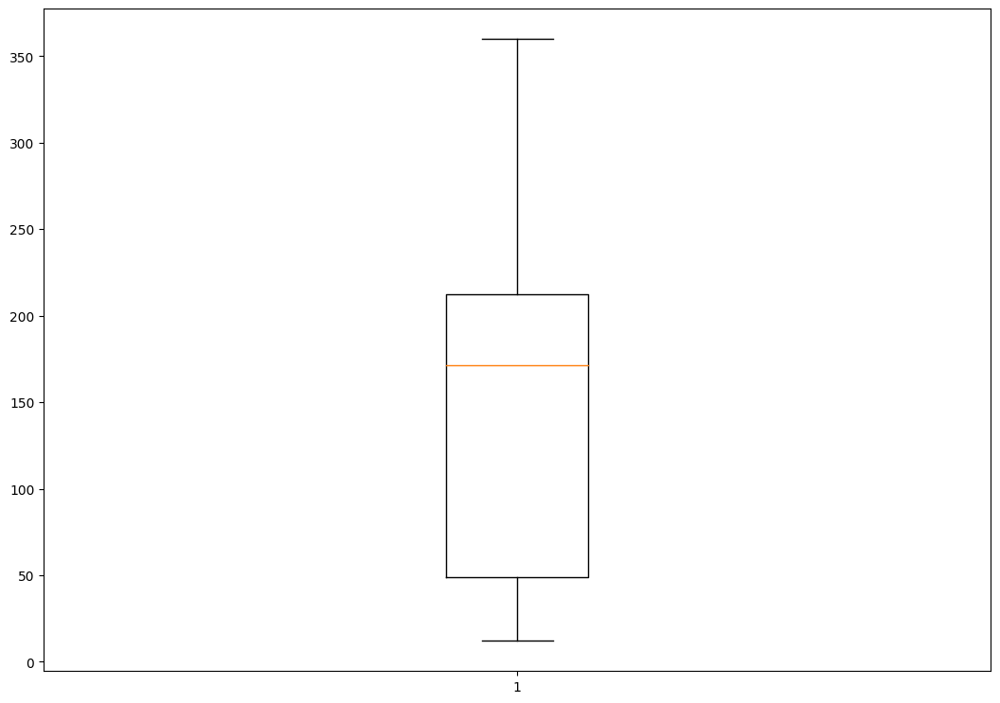

In [ ]:
plot_solution_spread(archive)

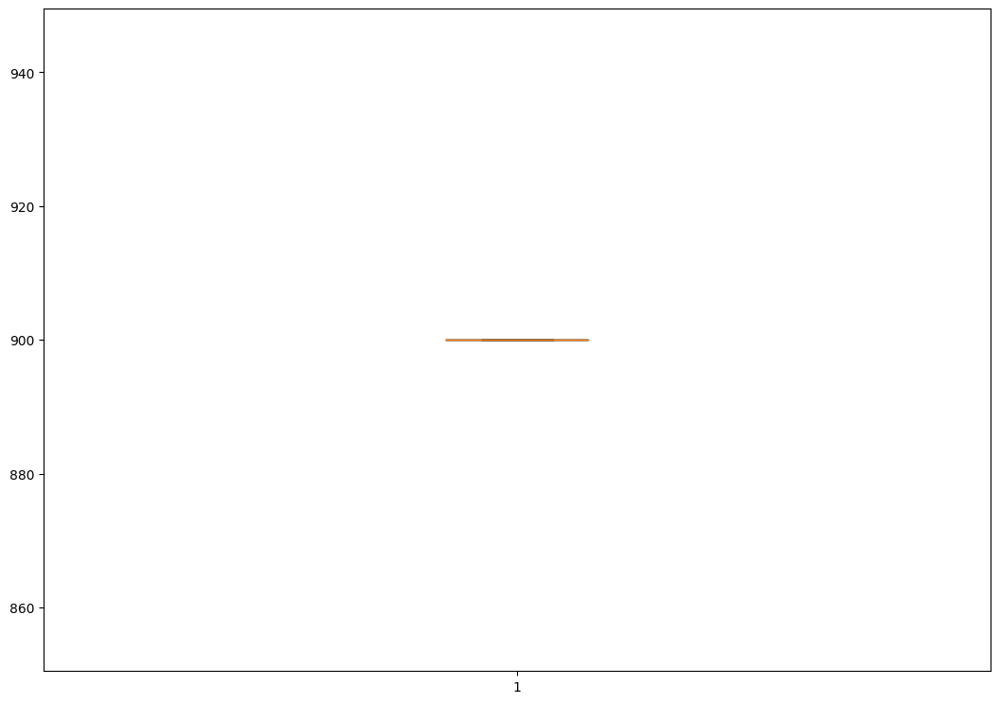

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 50)

extra time to initialize archive 0.00033092498779296875
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.016454696655273438
Iterations:   1%|          | 1/100 [00:17<28:19, 17.16s/it]archive training
time to add to som 0.019391775131225586
Iterations:   2%|▏         | 2/100 [00:35<28:54, 17.70s/it]archive training
time to add to som 0.015032052993774414
Iterations:   3%|▎         | 3/100 [00:53<28:56, 17.91s/it]archive training
time to add to som 0.016574859619140625
Iterations:   4%|▍         | 4/100 [01:10<28:18, 17.70s/it]archive training
time to add to som 0.017077207565307617
Iterations:   5%|▌         | 5/100 [01:28<27:46, 17.54s/it]archive training
time to add to som 0.017979860305786133
Iterations:   6%|▌         | 6/100 [01:45<27:28, 17.54s/it]archive training
time to add to som 0.02010345458984375
Iterations:   7%|▋         | 7/100 [02:02<27:07, 17.50s/it]archive training
time to add to som 0.03412795066833496
Iterations:   8%|▊        

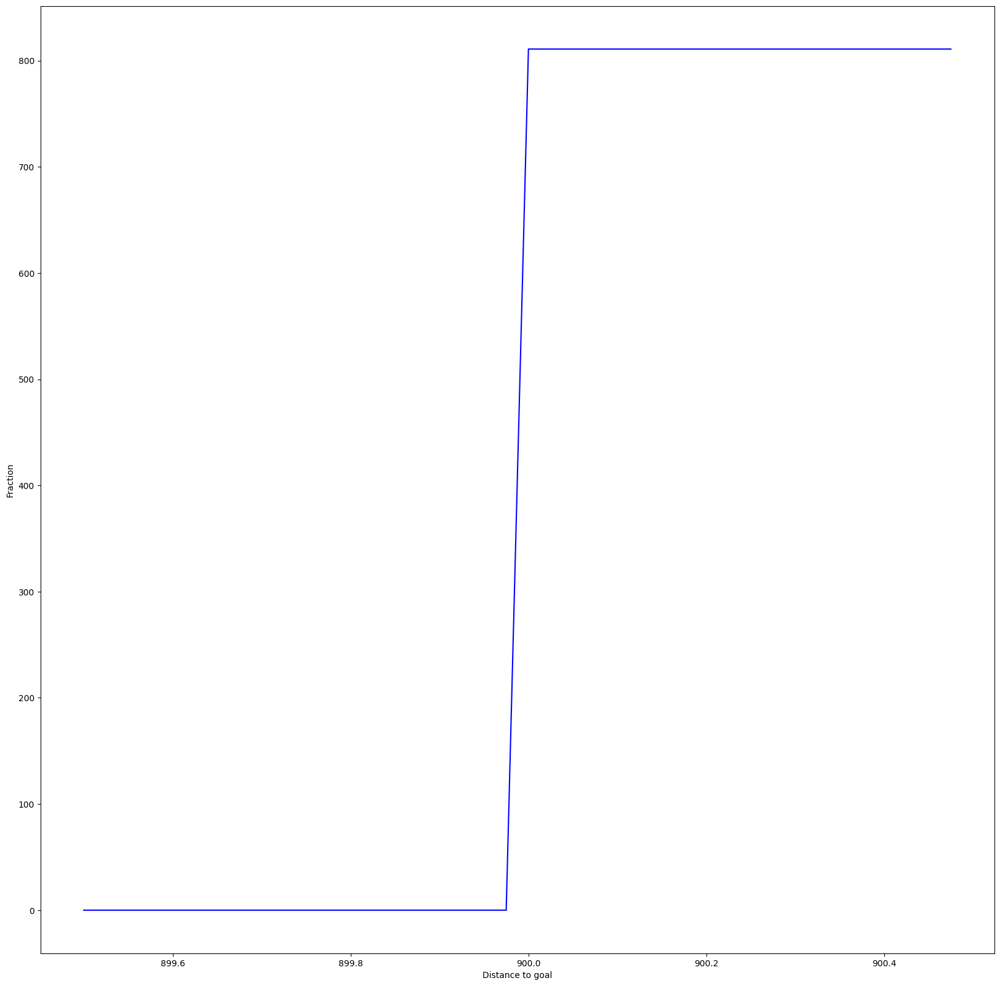

In [ ]:
plot_cumulative_distro_objective(archive)


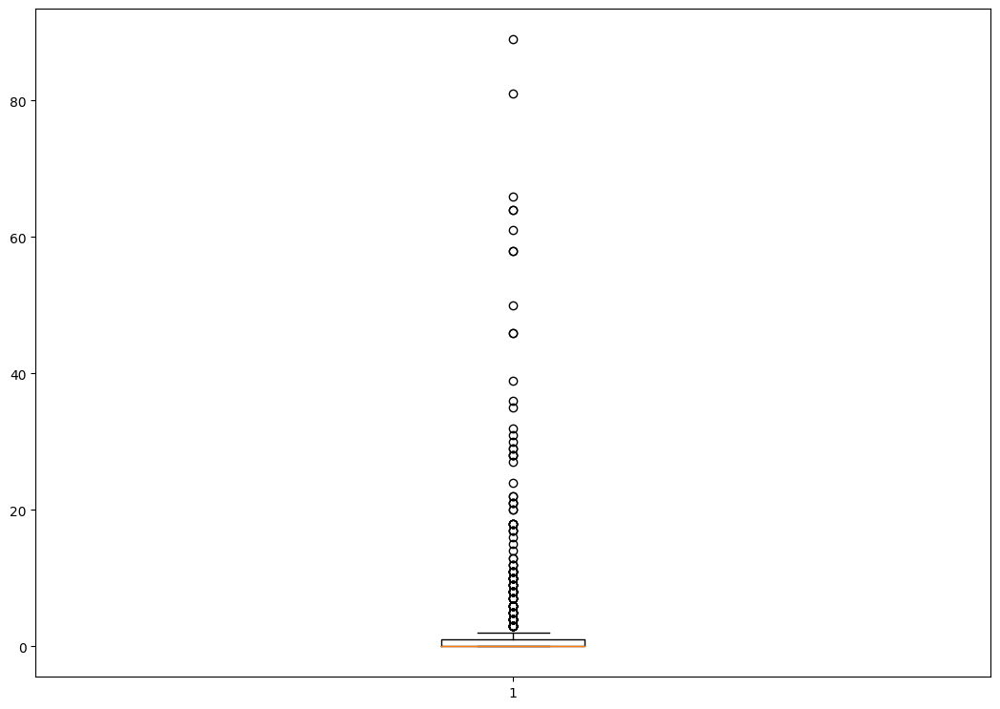

In [ ]:
plot_solution_spread(archive)


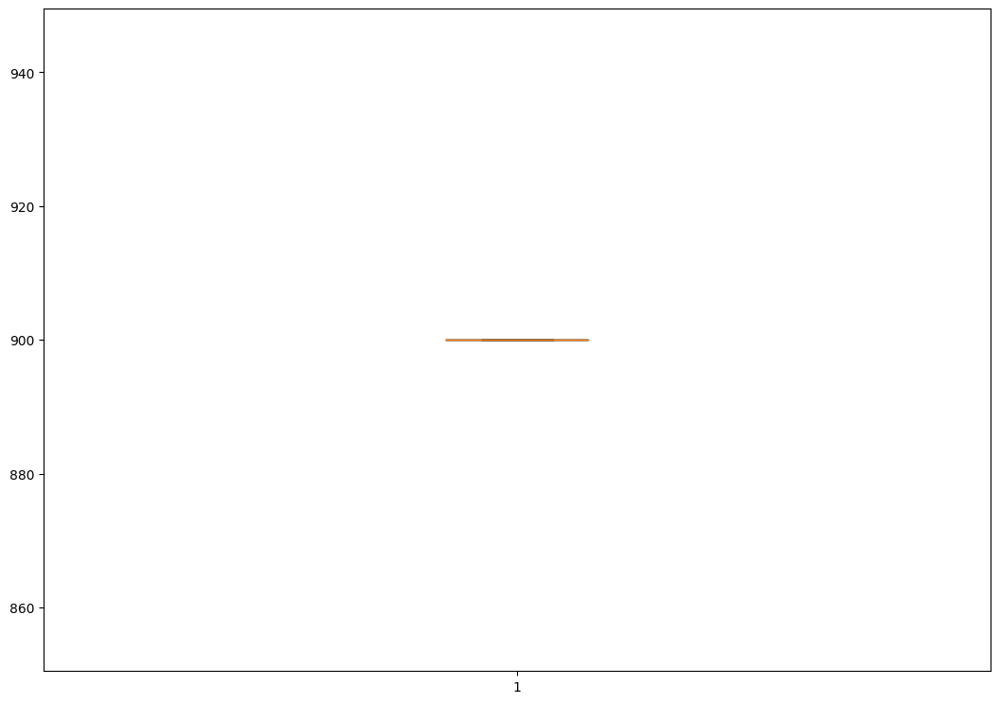

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.0003097057342529297
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.018088340759277344
Iterations:   1%|          | 1/100 [00:19<32:37, 19.78s/it]archive training
time to add to som 0.014057636260986328
Iterations:   2%|▏         | 2/100 [00:39<31:50, 19.50s/it]archive training
time to add to som 0.015190362930297852
Iterations:   3%|▎         | 3/100 [00:57<31:03, 19.21s/it]archive training
time to add to som 0.017136335372924805
Iterations:   4%|▍         | 4/100 [01:16<30:30, 19.07s/it]archive training
time to add to som 0.02774786949157715
Iterations:   5%|▌         | 5/100 [01:36<30:32, 19.29s/it]archive training
time to add to som 0.01942276954650879
Iterations:   6%|▌         | 6/100 [01:56<30:31, 19.49s/it]archive training
time to add to som 0.0196225643157959
Iterations:   7%|▋         | 7/100 [02:15<30:01, 19.37s/it]archive training
time to add to som 0.019850969314575195
Iterations:   8%|▊         | 

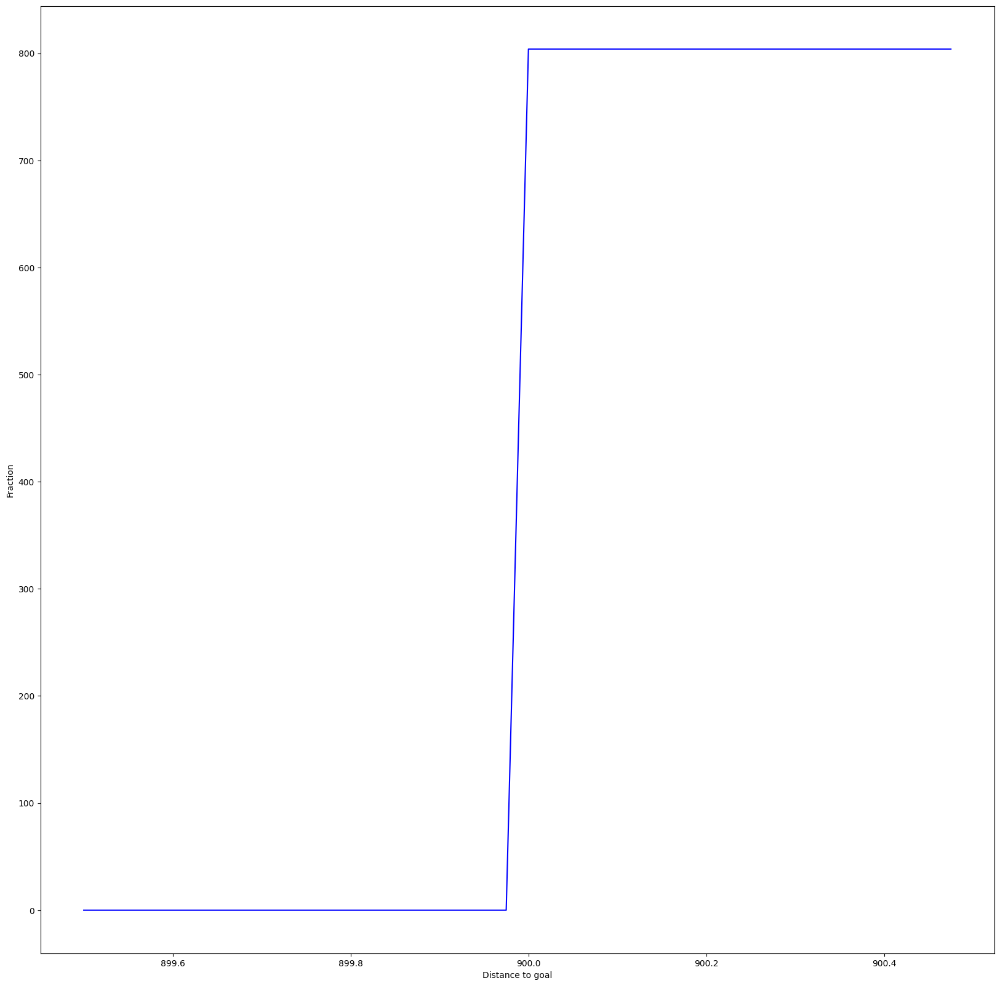

In [ ]:
plot_cumulative_distro_objective(archive)


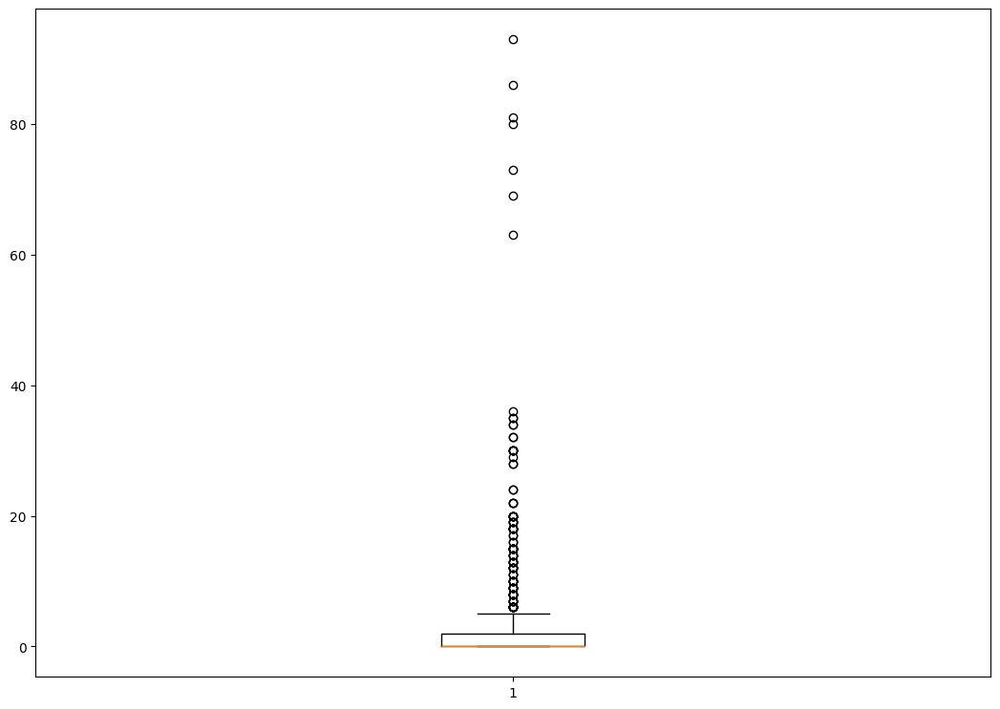

In [ ]:
plot_solution_spread(archive)

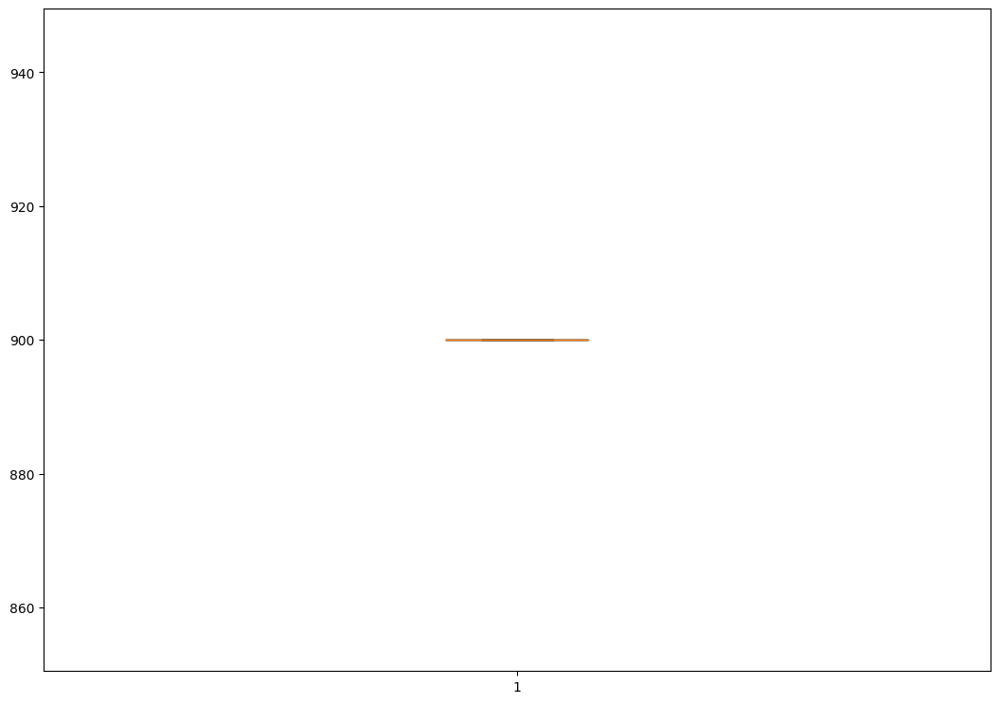

In [ ]:
plot_solution_distance(archive)

som double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0025615692138671875
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012810707092285156
Iterations:   1%|          | 1/100 [00:20<34:08, 20.69s/it]archive training
time to add to som 0.02180337905883789
Iterations:   2%|▏         | 2/100 [00:40<32:38, 19.98s/it]archive training
time to add to som 0.015296697616577148
Iterations:   3%|▎         | 3/100 [00:59<32:00, 19.80s/it]archive training
time to add to som 0.028273582458496094
Iterations:   4%|▍         | 4/100 [01:19<31:56, 19.96s/it]archive training
time to add to som 0.01766037940979004
Iterations:   5%|▌         | 5/100 [01:40<31:46, 20.07s/it]archive training
time to add to som 0.01839303970336914
Iterations:   6%|▌         | 6/100 [01:59<31:10, 19.89s/it]archive training
time to add to som 0.02411365509033203
Iterations:   7%|▋         | 7/100 [02:19<30:42, 19.82s/it]archive training
time to add to som 0.029868125915527344
Iterations:   8%|▊         | 

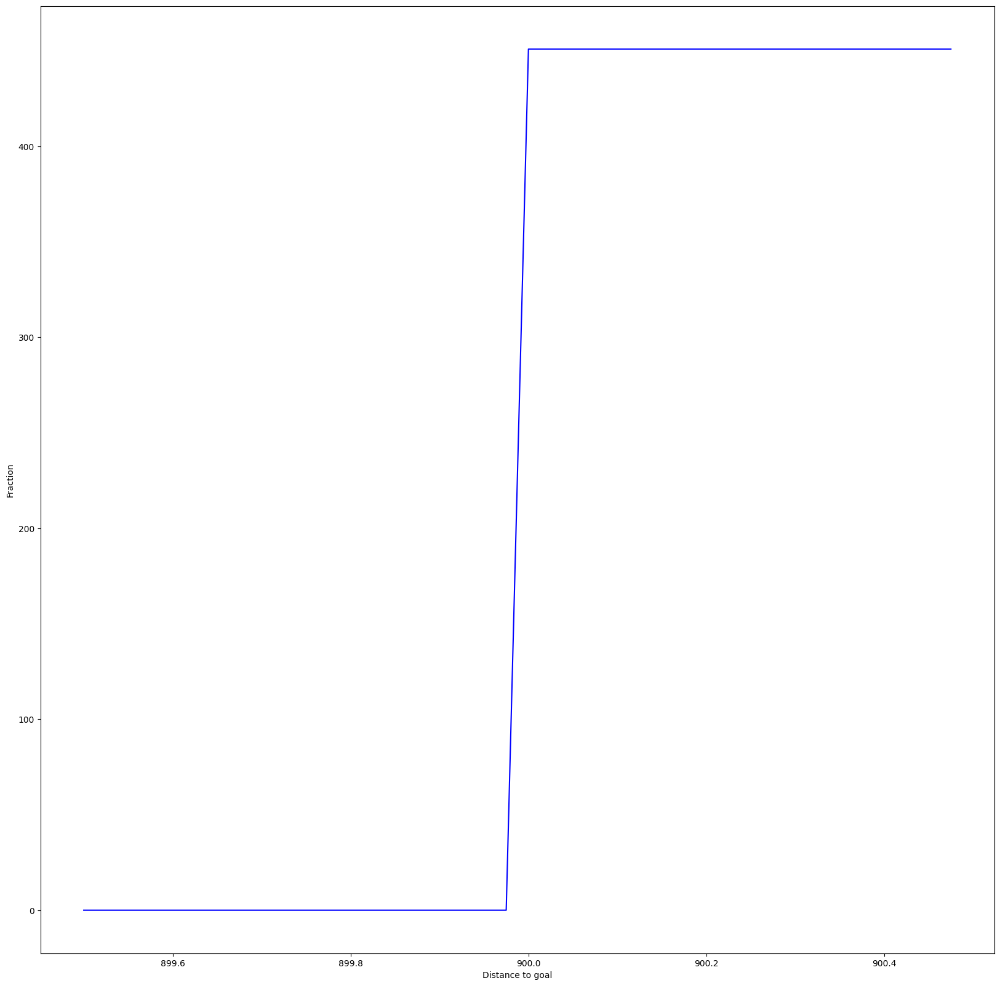

In [ ]:
plot_cumulative_distro_objective(archive)

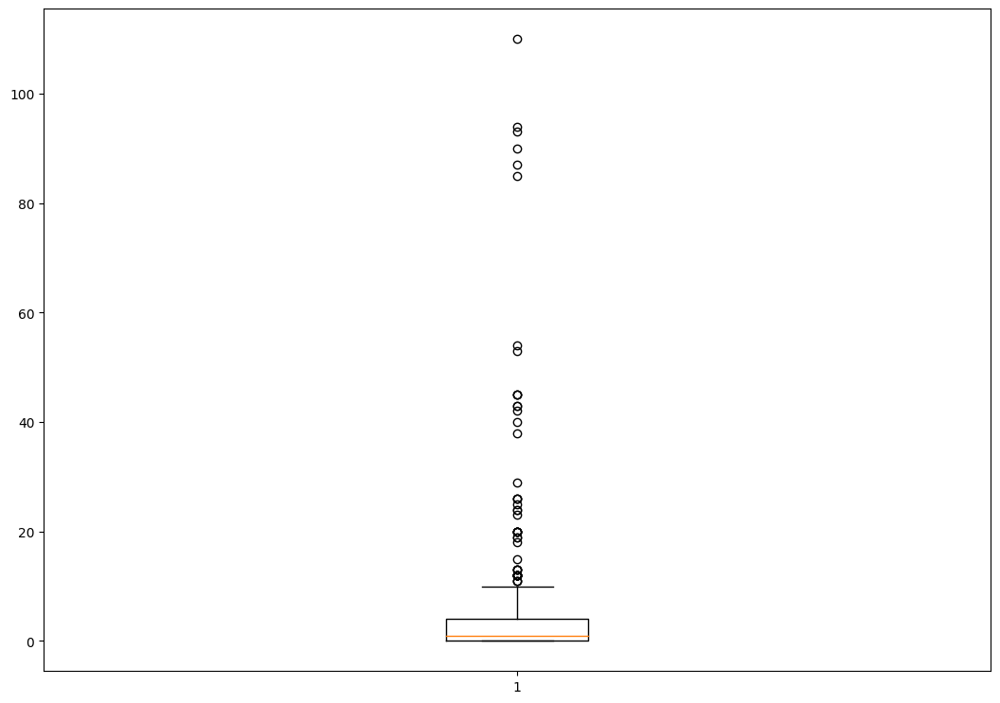

In [ ]:
plot_solution_spread(archive)

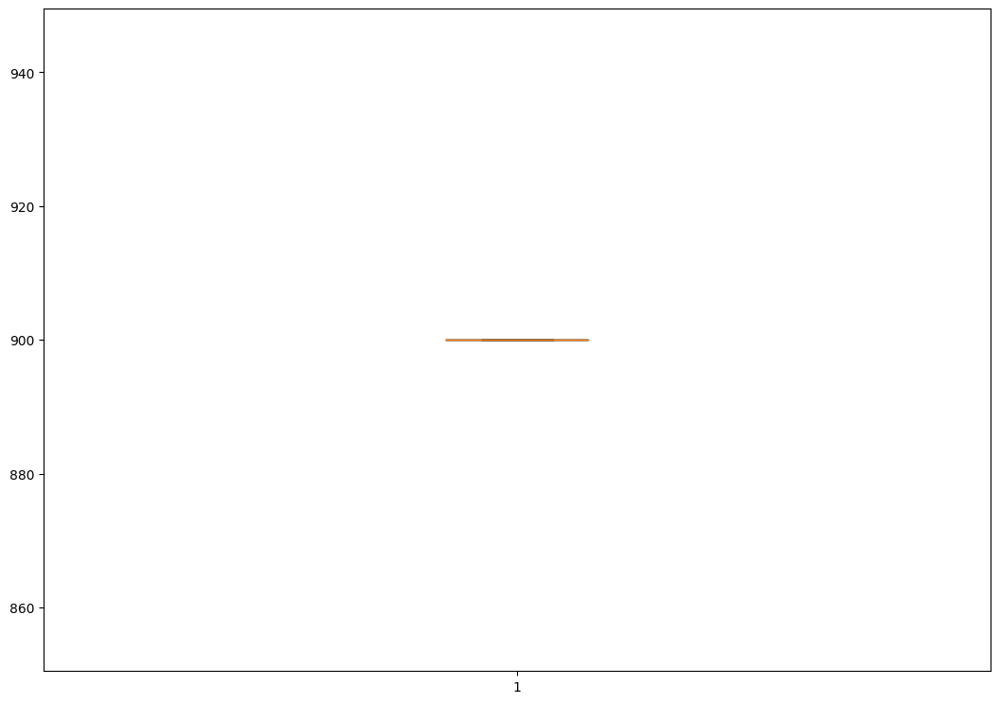

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.00031876564025878906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012552976608276367
Iterations:   1%|          | 1/100 [00:18<29:51, 18.10s/it]archive training
time to add to som 0.014671802520751953
Iterations:   2%|▏         | 2/100 [00:36<29:46, 18.23s/it]archive training
time to add to som 0.025081872940063477
Iterations:   3%|▎         | 3/100 [00:55<29:56, 18.52s/it]archive training
time to add to som 0.01683831214904785
Iterations:   4%|▍         | 4/100 [01:14<30:15, 18.91s/it]archive training
time to add to som 0.018772363662719727
Iterations:   5%|▌         | 5/100 [01:33<29:34, 18.68s/it]archive training
time to add to som 0.01914811134338379
Iterations:   6%|▌         | 6/100 [01:50<28:51, 18.42s/it]archive training
time to add to som 0.019246339797973633
Iterations:   7%|▋         | 7/100 [02:09<28:21, 18.29s/it]archive training
time to add to som 0.03383159637451172
Iterations:   8%|▊         

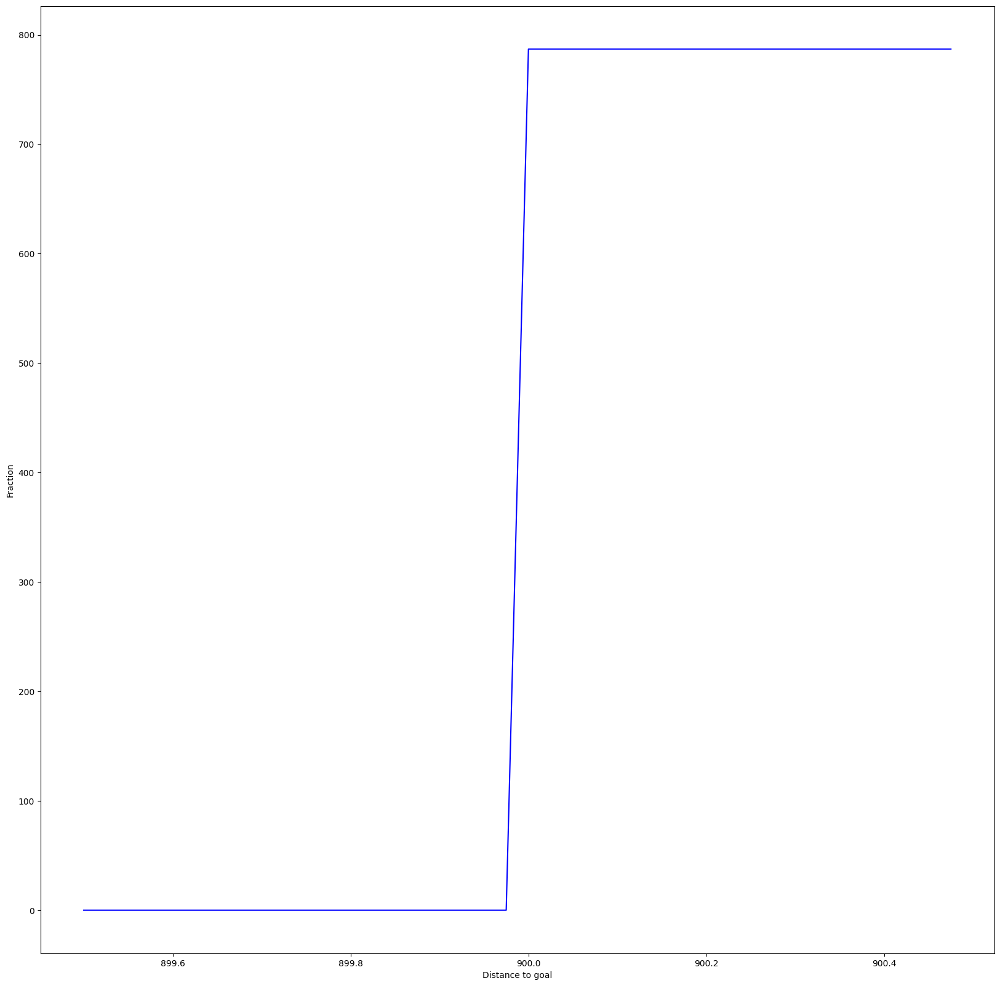

In [ ]:
plot_cumulative_distro_objective(archive)


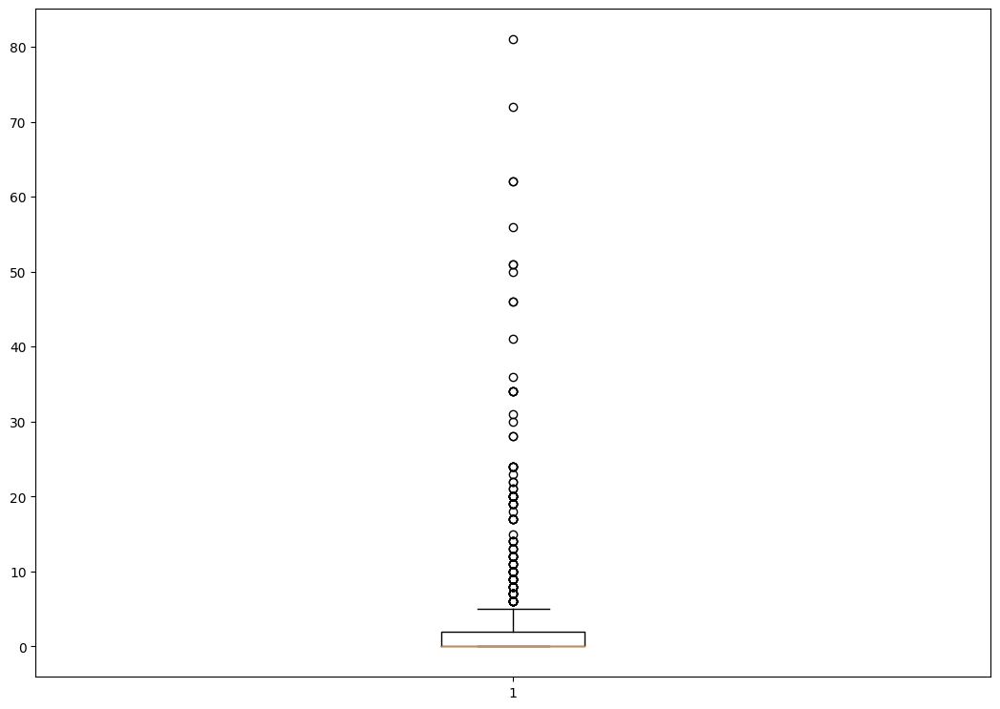

In [ ]:
plot_solution_spread(archive)


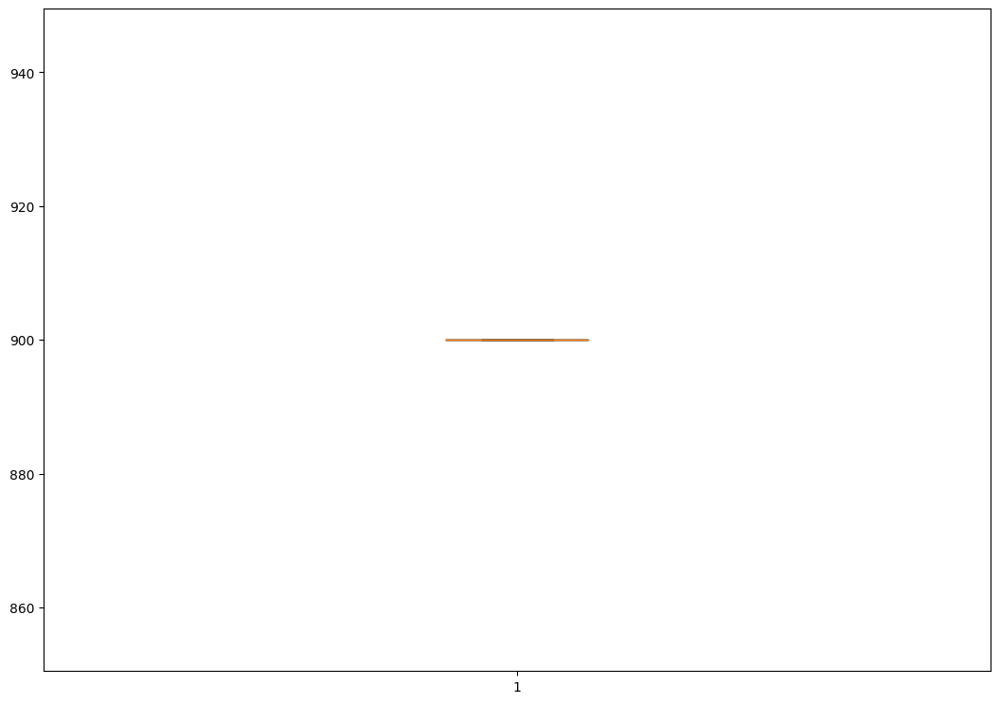

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 50, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




In [ ]:
plot_cumulative_distro_objective(archive)

In [ ]:
plot_solution_spread(archive)

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 50, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0013048648834228516
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.0184171199798584
Iterations:   1%|          | 1/100 [01:05<1:48:35, 65.82s/it]archive training
time to add to som 0.01753377914428711
Iterations:   2%|▏         | 2/100 [01:42<1:19:25, 48.63s/it]archive training
time to add to som 0.020928621292114258
Iterations:   3%|▎         | 3/100 [02:21<1:11:54, 44.48s/it]archive training
time to add to som 0.021739721298217773
Iterations:   4%|▍         | 4/100 [02:58<1:06:06, 41.32s/it]archive training
time to add to som 0.04059314727783203
Iterations:   5%|▌         | 5/100 [03:36<1:03:25, 40.06s/it]archive training
time to add to som 0.030292987823486328
Iterations:   6%|▌         | 6/100 [04:13<1:01:20, 39.15s/it]archive training
time to add to som 0.042429208755493164
Iterations:   7%|▋         | 7/100 [04:51<59:59, 38.71s/it]  archive training
time to add to som 0.04004073143005371
Iterations:   8%

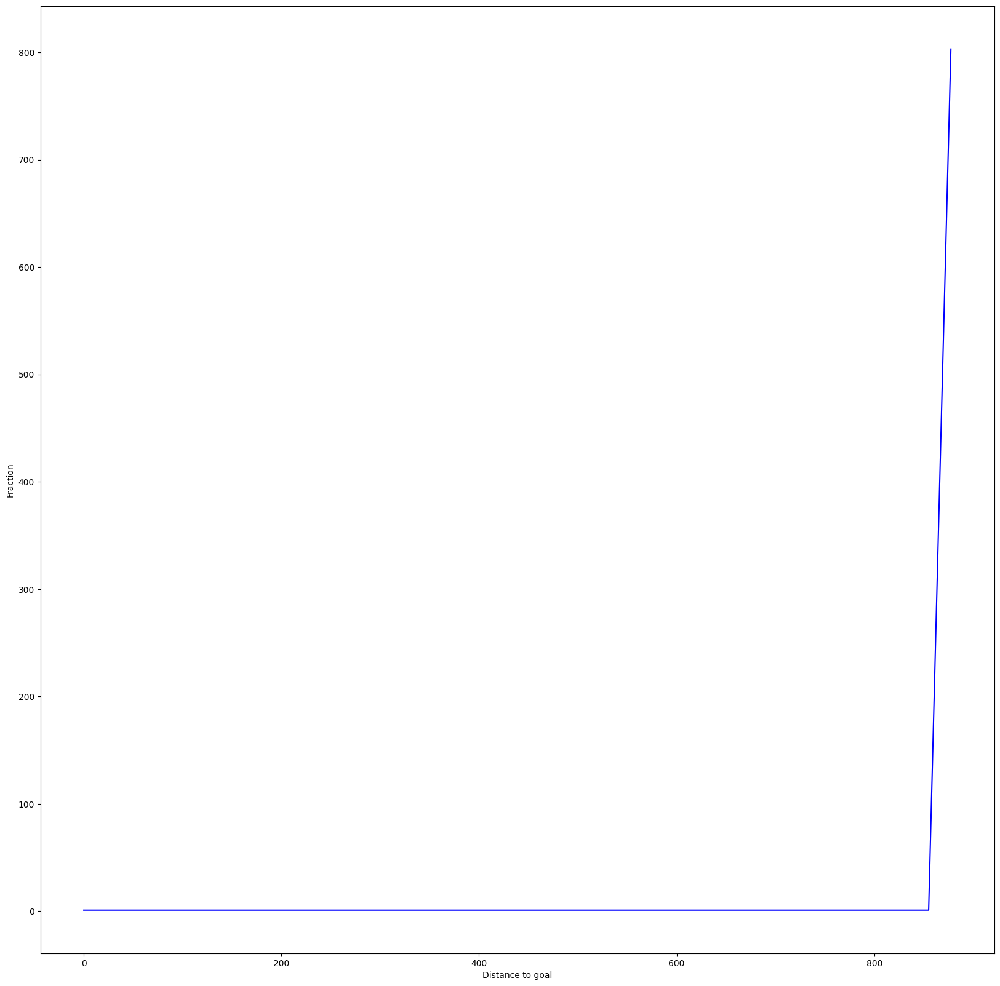

In [ ]:
plot_cumulative_distro_objective(archive)

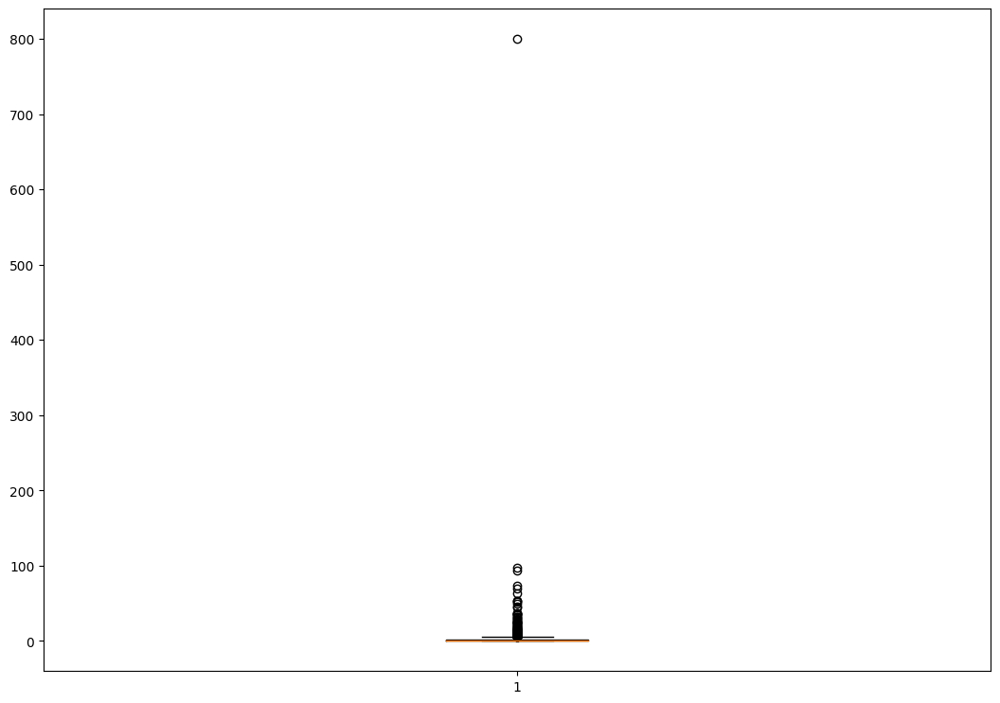

In [ ]:
plot_solution_spread(archive)

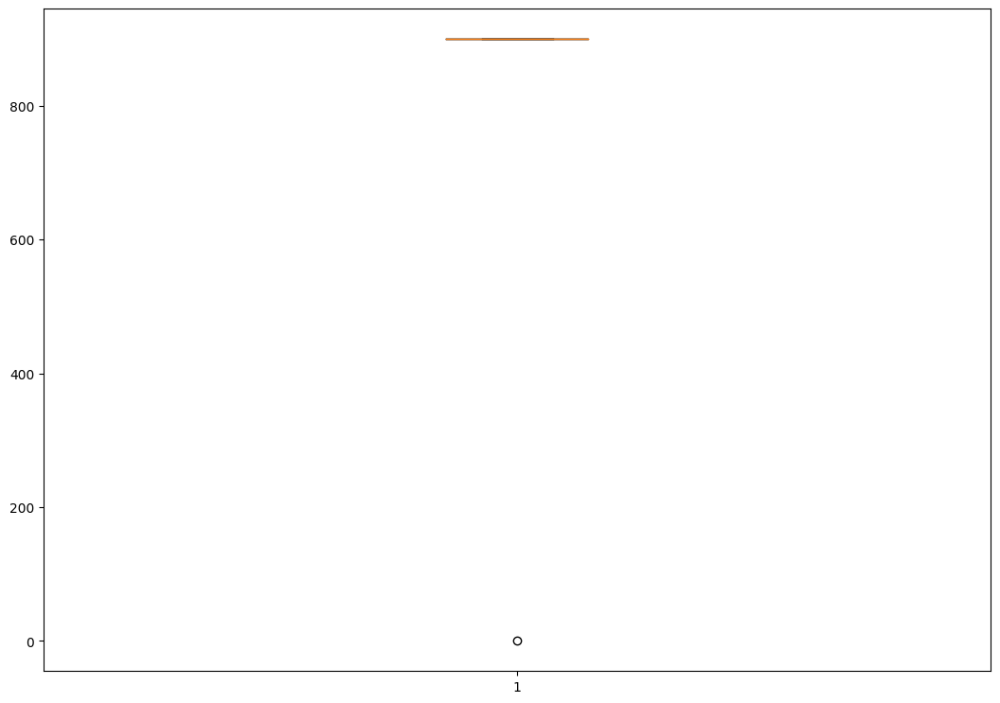

In [ ]:
plot_solution_distance(archive)

######*11.1.3 150d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze2", dim=150)

extra time to initialize archive 143.1729655265808
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 3.324390172958374
Iterations:   1%|          | 1/100 [00:31<51:21, 31.12s/it]archive training
time to add to cvt 0.0917215347290039
Iterations:   2%|▏         | 2/100 [00:56<44:52, 27.48s/it]archive training
time to add to cvt 0.060501813888549805
Iterations:   3%|▎         | 3/100 [01:21<42:55, 26.56s/it]archive training
time to add to cvt 0.06749534606933594
Iterations:   4%|▍         | 4/100 [01:47<42:07, 26.33s/it]archive training
time to add to cvt 0.07914543151855469
Iterations:   5%|▌         | 5/100 [02:12<40:40, 25.69s/it]archive training
time to add to cvt 0.07160711288452148
Iterations:   6%|▌         | 6/100 [02:37<40:05, 25.59s/it]archive training
time to add to cvt 0.1287364959716797
Iterations:   7%|▋         | 7/100 [03:02<39:23, 25.41s/it]archive training
time to add to cvt 0.059409379959106445
Iterations:   8%|▊         | 8/100 [03:

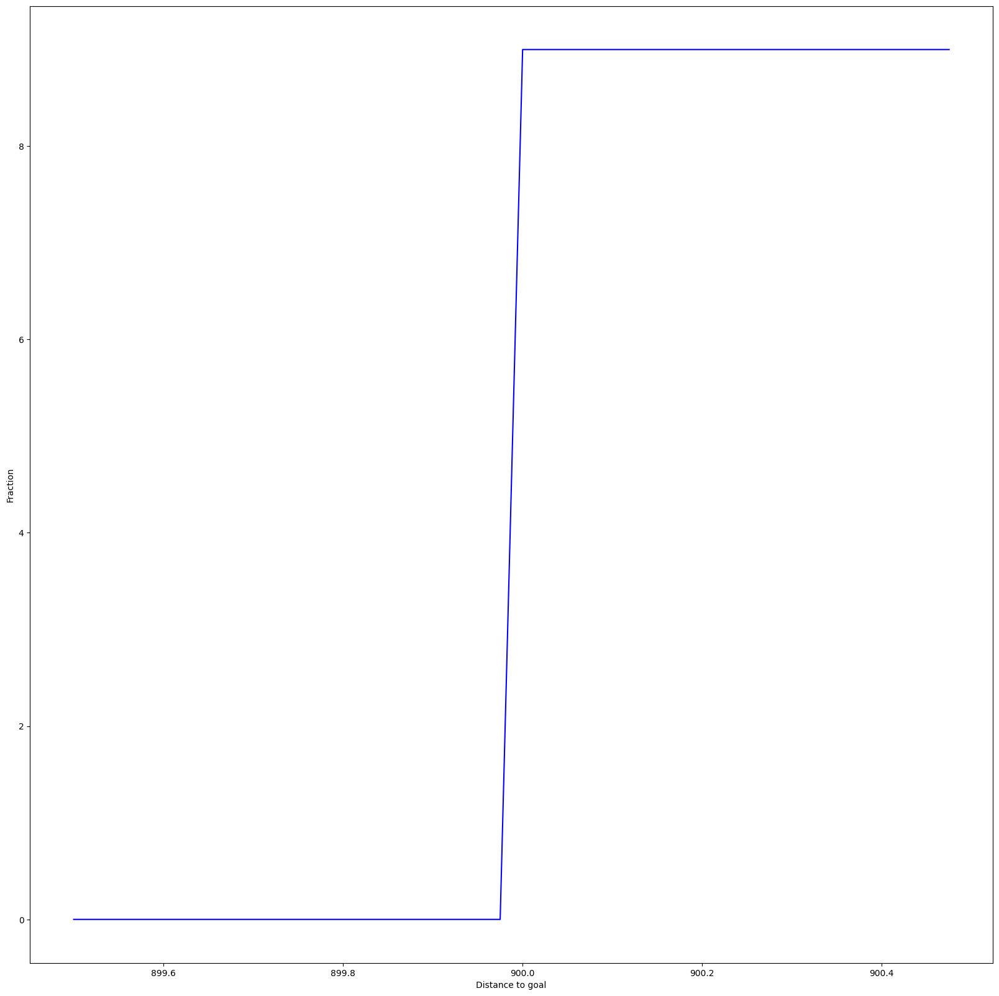

In [ ]:
plot_cumulative_distro_objective(archive)

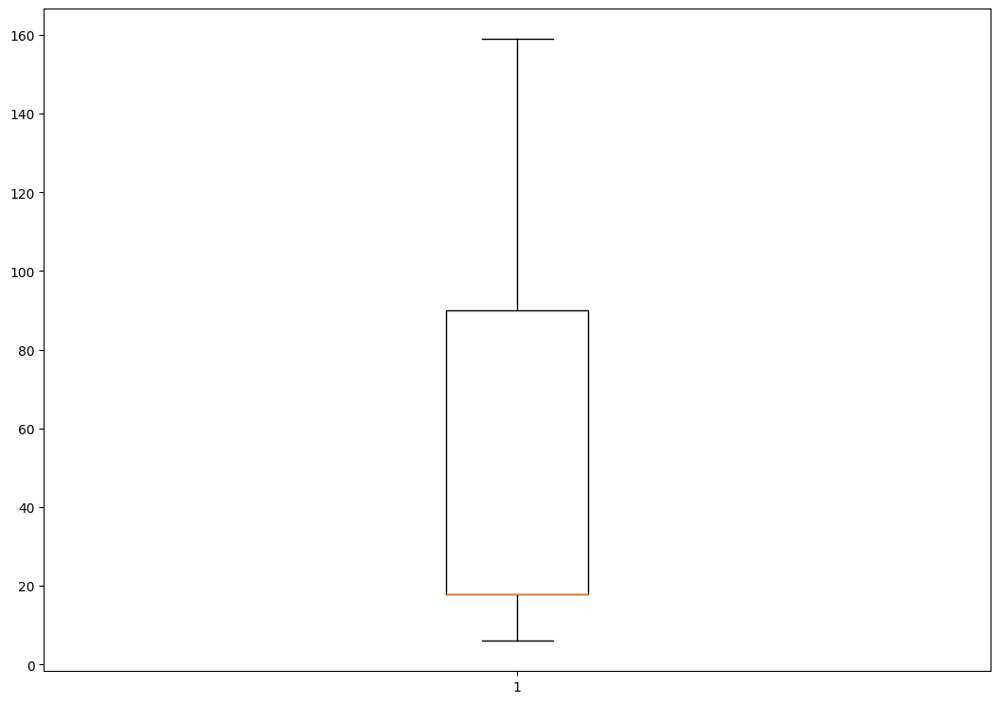

In [ ]:
plot_solution_spread(archive)

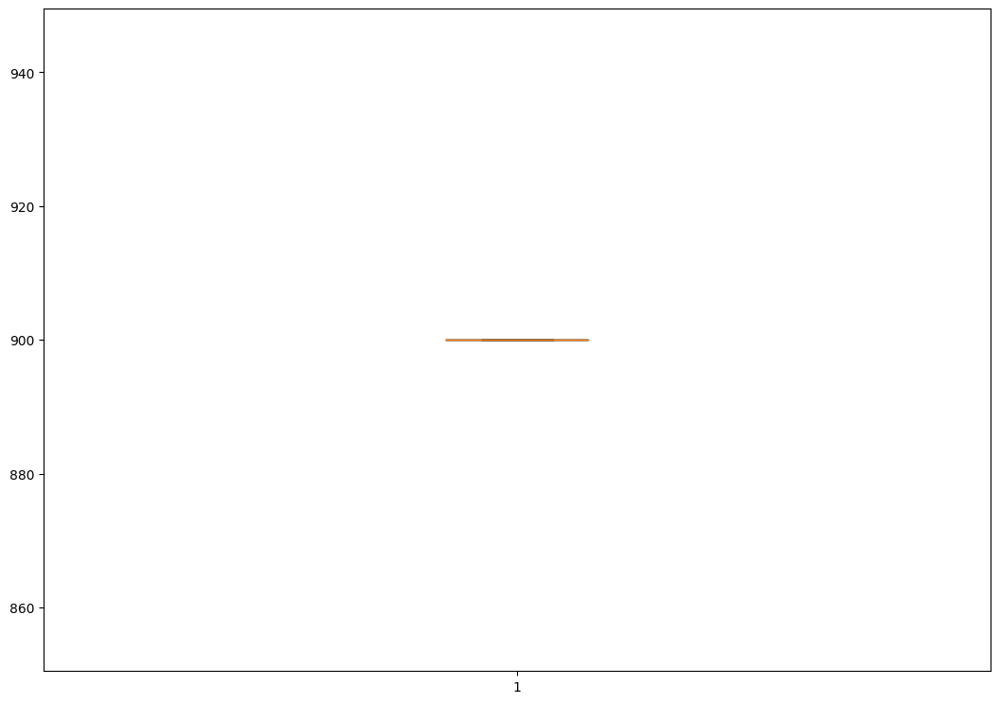

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 150)


extra time to initialize archive 0.0002982616424560547
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.017552614212036133
Iterations:   1%|          | 1/100 [00:18<29:45, 18.03s/it]archive training
time to add to som 0.013924121856689453
Iterations:   2%|▏         | 2/100 [00:36<30:11, 18.49s/it]archive training
time to add to som 0.017050743103027344
Iterations:   3%|▎         | 3/100 [00:54<29:21, 18.16s/it]archive training
time to add to som 0.023063182830810547
Iterations:   4%|▍         | 4/100 [01:12<28:59, 18.12s/it]archive training
time to add to som 0.022652864456176758
Iterations:   5%|▌         | 5/100 [01:30<28:40, 18.11s/it]archive training
time to add to som 0.03582119941711426
Iterations:   6%|▌         | 6/100 [01:49<28:40, 18.30s/it]archive training
time to add to som 0.039838552474975586
Iterations:   7%|▋         | 7/100 [02:08<28:51, 18.62s/it]archive training
time to add to som 0.02938365936279297
Iterations:   8%|▊         

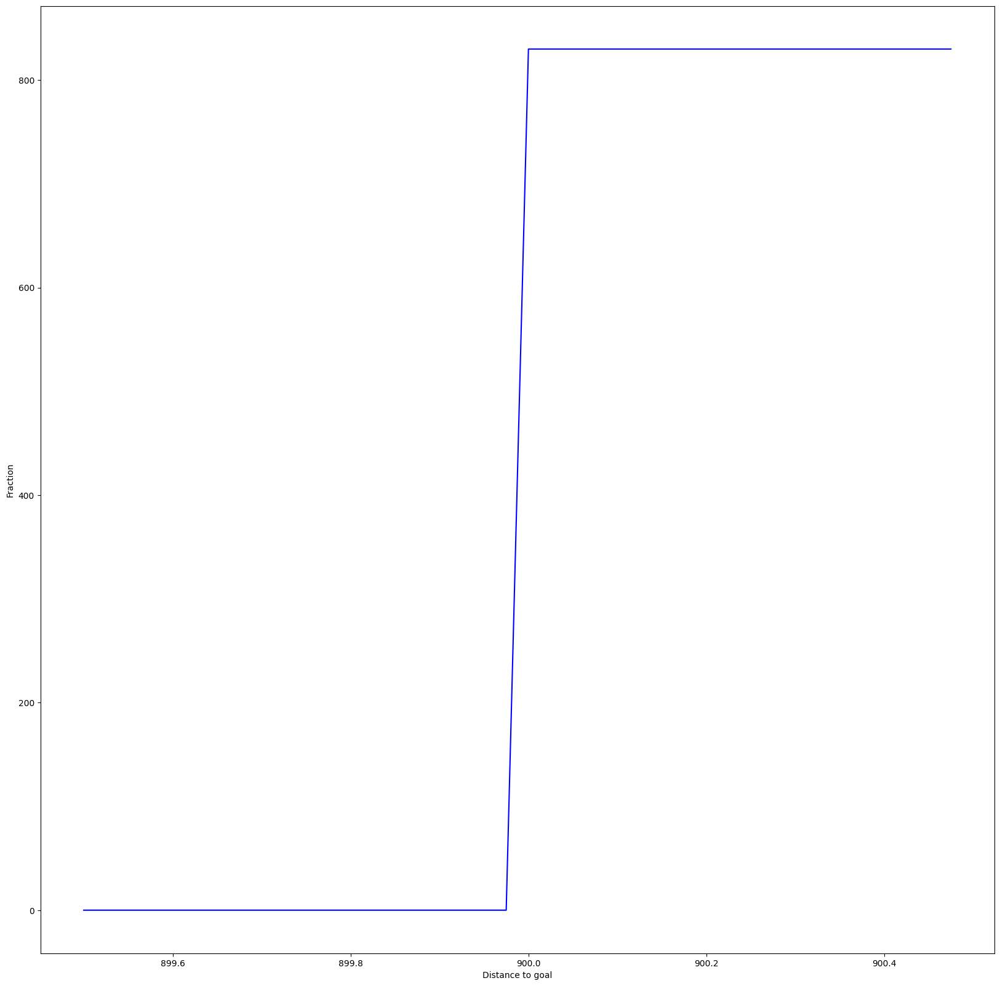

In [ ]:
plot_cumulative_distro_objective(archive)


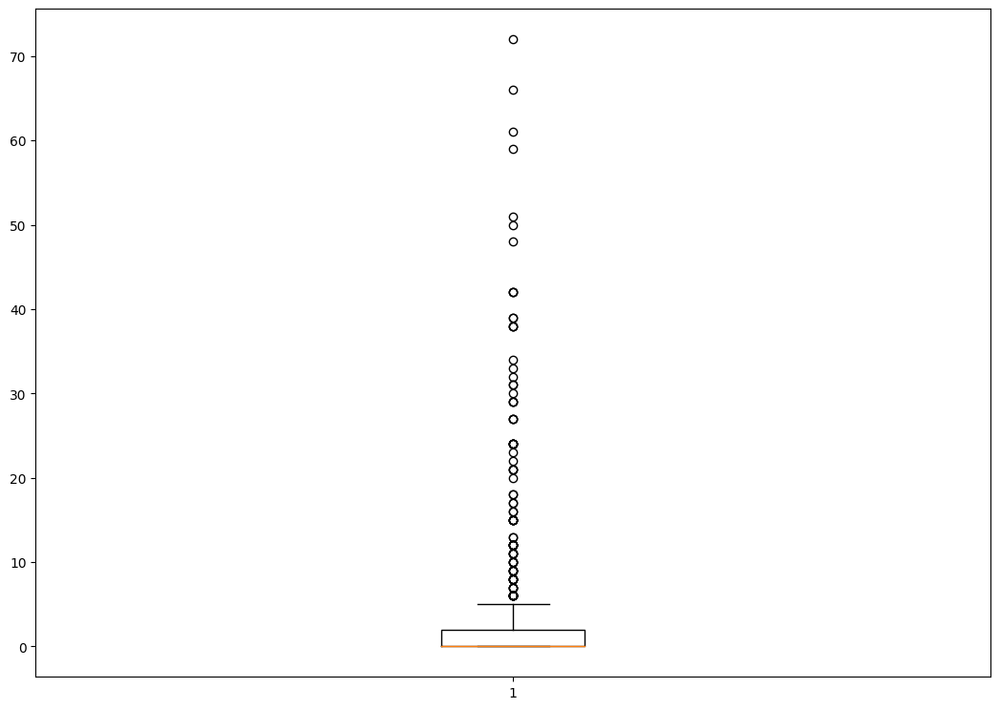

In [ ]:
plot_solution_spread(archive)


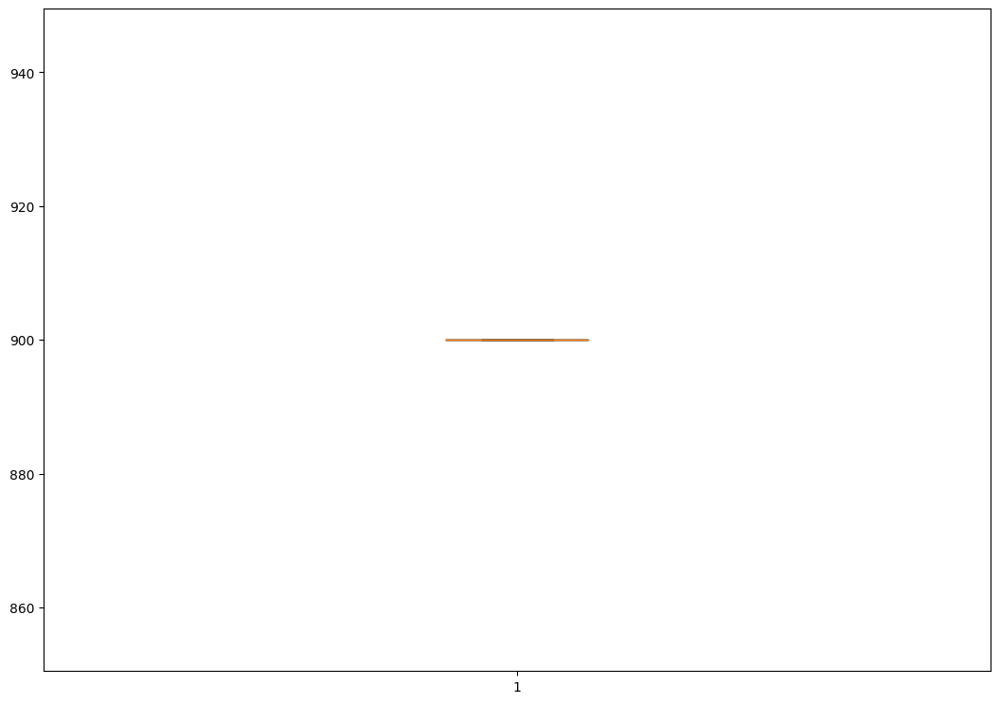

In [ ]:
plot_solution_distance(archive)

spm high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })


extra time to initialize archive 0.00039839744567871094
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.02624344825744629
Iterations:   1%|          | 1/100 [00:18<30:39, 18.58s/it]archive training
time to add to som 0.014659404754638672
Iterations:   2%|▏         | 2/100 [00:37<30:25, 18.63s/it]archive training
time to add to som 0.02589702606201172
Iterations:   3%|▎         | 3/100 [00:56<30:34, 18.92s/it]archive training
time to add to som 0.019639253616333008
Iterations:   4%|▍         | 4/100 [01:16<30:45, 19.23s/it]archive training
time to add to som 0.023326396942138672
Iterations:   5%|▌         | 5/100 [01:34<30:08, 19.04s/it]archive training
time to add to som 0.02451014518737793
Iterations:   6%|▌         | 6/100 [01:53<29:40, 18.94s/it]archive training
time to add to som 0.041375160217285156
Iterations:   7%|▋         | 7/100 [02:12<29:15, 18.87s/it]archive training
time to add to som 0.04666638374328613
Iterations:   8%|▊         |

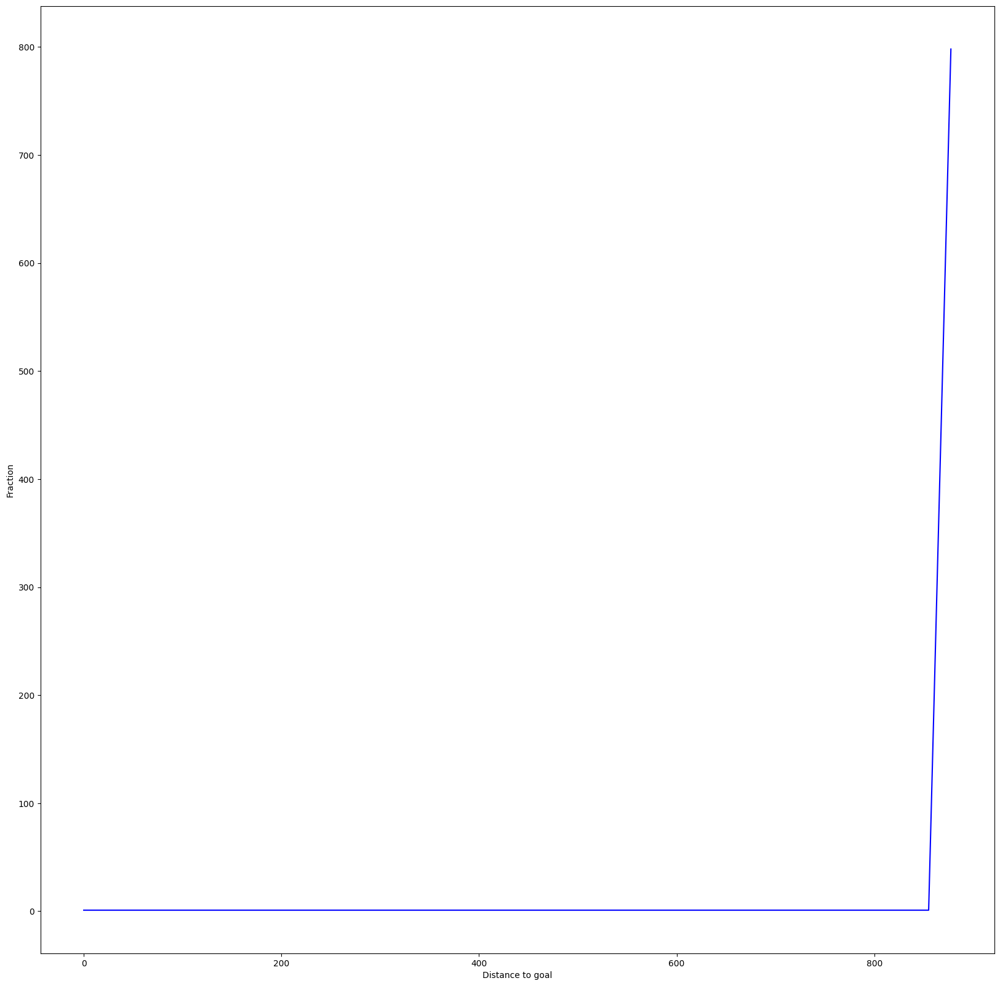

In [ ]:
plot_cumulative_distro_objective(archive)


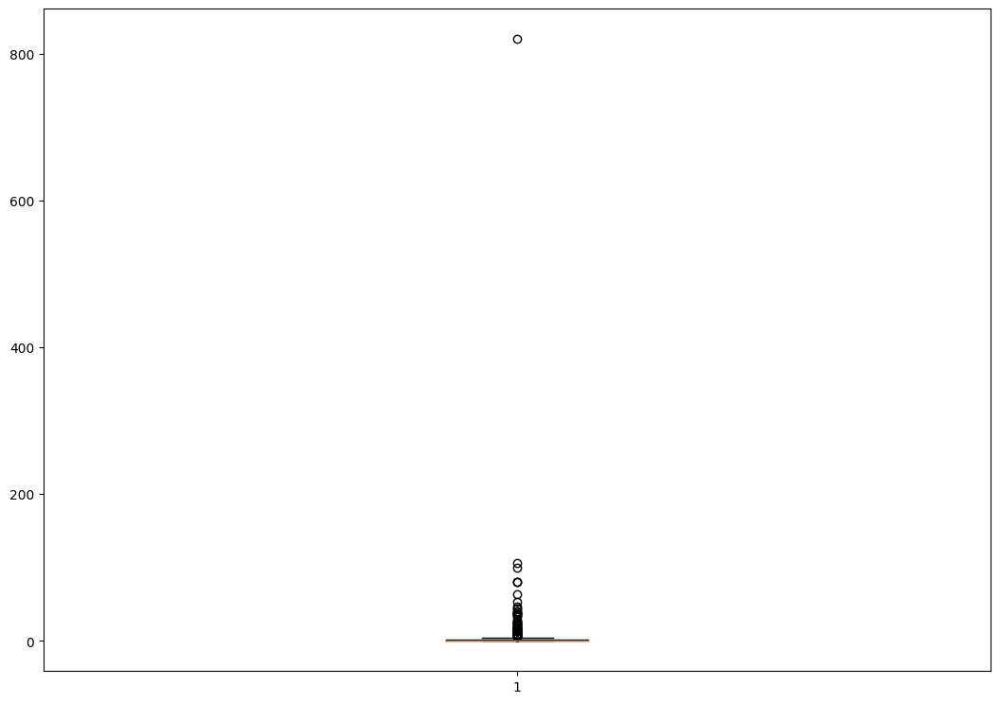

In [ ]:
plot_solution_spread(archive)

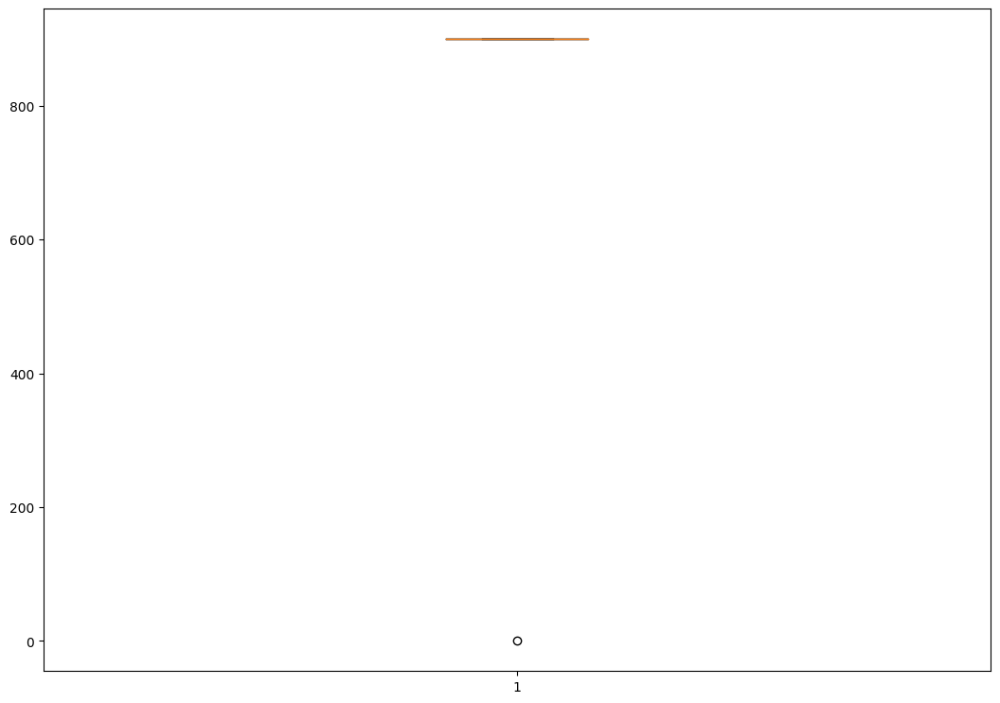

In [ ]:
plot_solution_distance(archive)

som double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.003644227981567383
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014578580856323242
Iterations:   1%|          | 1/100 [00:20<34:12, 20.74s/it]archive training
time to add to som 0.01668238639831543
Iterations:   2%|▏         | 2/100 [00:40<32:47, 20.07s/it]archive training
time to add to som 0.018606901168823242
Iterations:   3%|▎         | 3/100 [01:00<32:22, 20.02s/it]archive training
time to add to som 0.0346982479095459
Iterations:   4%|▍         | 4/100 [01:21<32:39, 20.41s/it]archive training
time to add to som 0.022433757781982422
Iterations:   5%|▌         | 5/100 [01:41<32:21, 20.43s/it]archive training
time to add to som 0.02706289291381836
Iterations:   6%|▌         | 6/100 [02:01<31:52, 20.34s/it]archive training
time to add to som 0.04877209663391113
Iterations:   7%|▋         | 7/100 [02:22<31:43, 20.47s/it]archive training
time to add to som 0.027080774307250977
Iterations:   8%|▊         | 8/

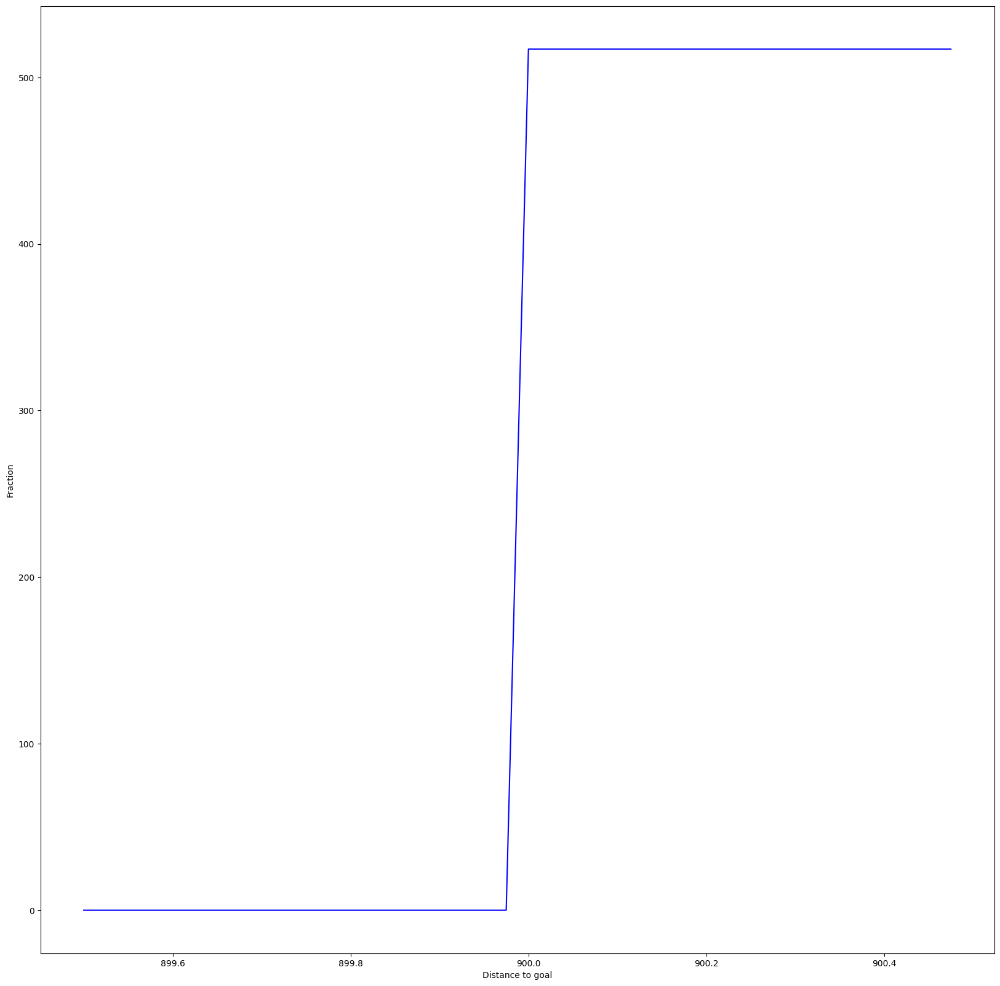

In [ ]:
plot_cumulative_distro_objective(archive)


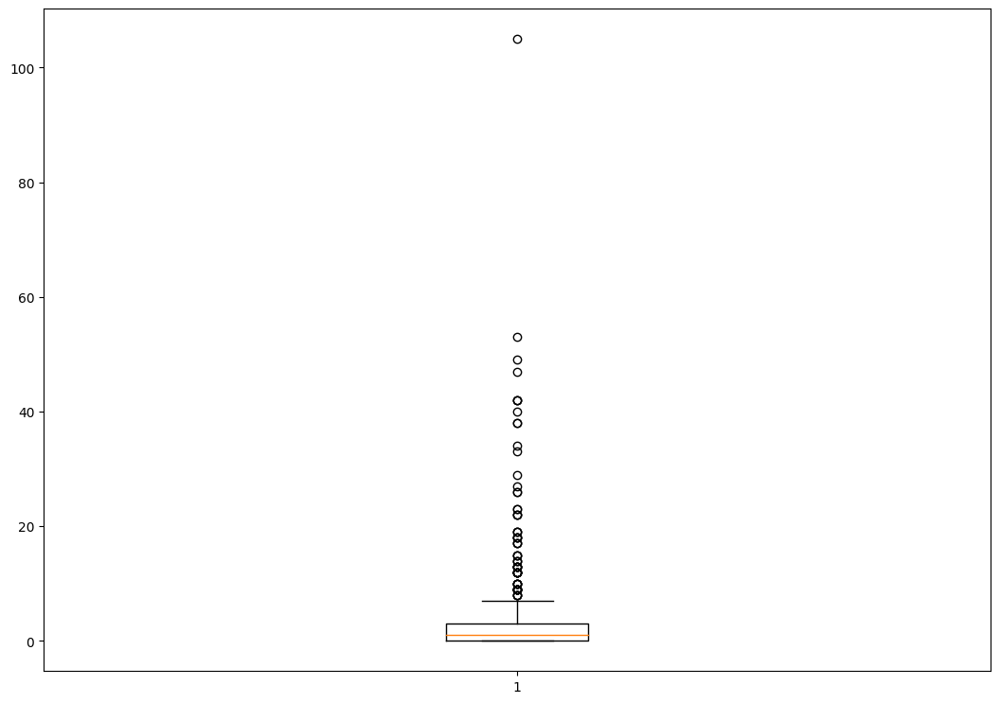

In [ ]:
plot_solution_spread(archive)

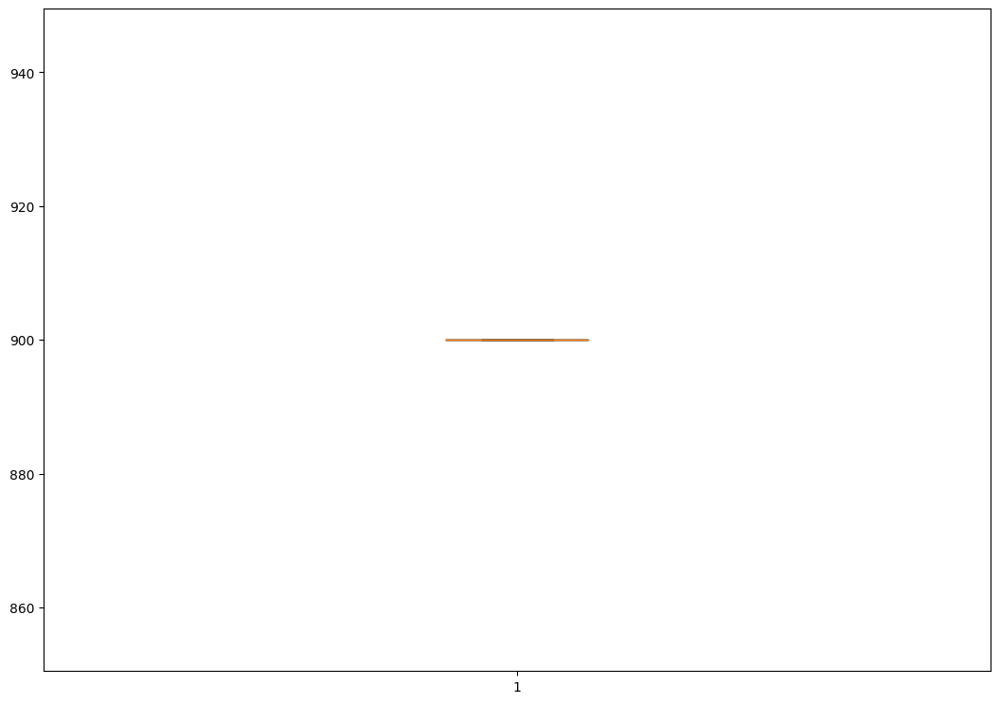

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.00029087066650390625
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012509584426879883
Iterations:   1%|          | 1/100 [00:18<30:24, 18.43s/it]archive training
time to add to som 0.01647639274597168
Iterations:   2%|▏         | 2/100 [00:36<29:53, 18.30s/it]archive training
time to add to som 0.027355670928955078
Iterations:   3%|▎         | 3/100 [00:55<30:15, 18.72s/it]archive training
time to add to som 0.024288415908813477
Iterations:   4%|▍         | 4/100 [01:14<30:12, 18.88s/it]archive training
time to add to som 0.033659934997558594
Iterations:   5%|▌         | 5/100 [01:33<29:36, 18.70s/it]archive training
time to add to som 0.026741743087768555
Iterations:   6%|▌         | 6/100 [01:51<29:06, 18.58s/it]archive training
time to add to som 0.04869413375854492
Iterations:   7%|▋         | 7/100 [02:10<29:02, 18.74s/it]archive training
time to add to som 0.03153562545776367
Iterations:   8%|▊         

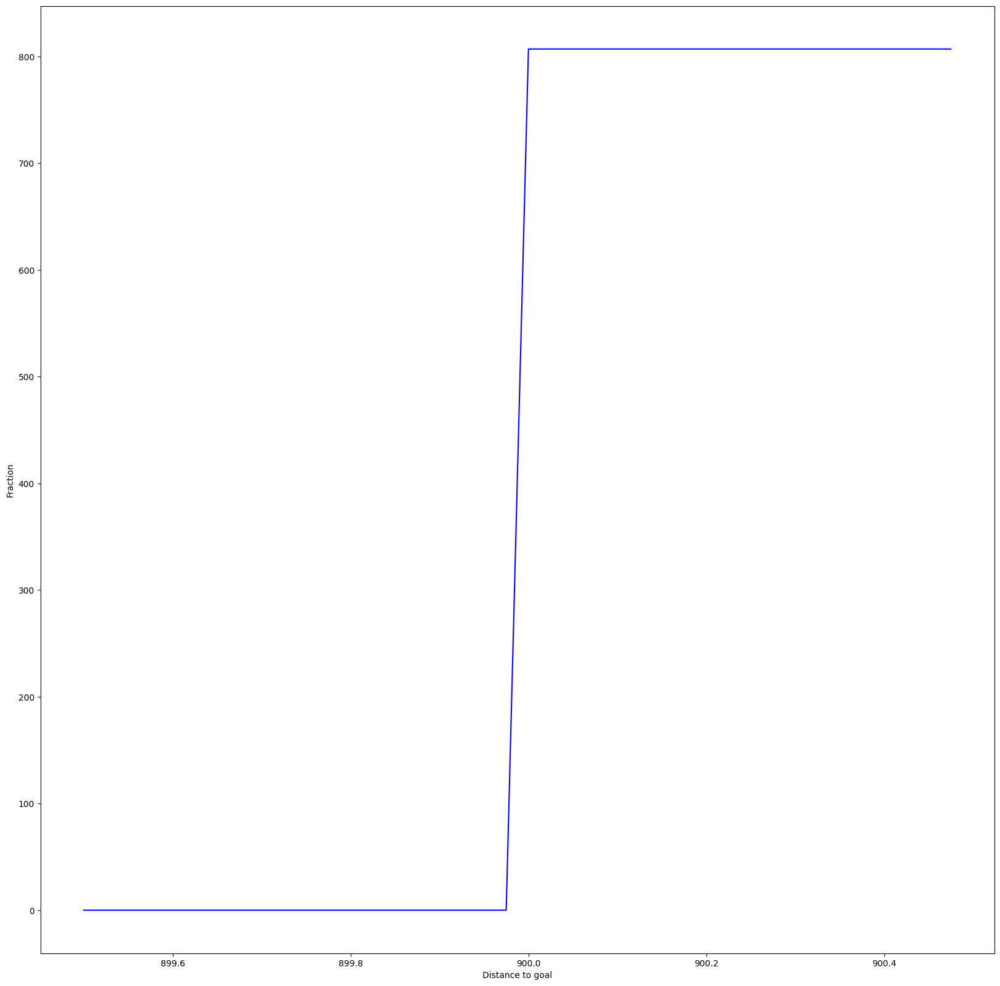

In [ ]:
plot_cumulative_distro_objective(archive)


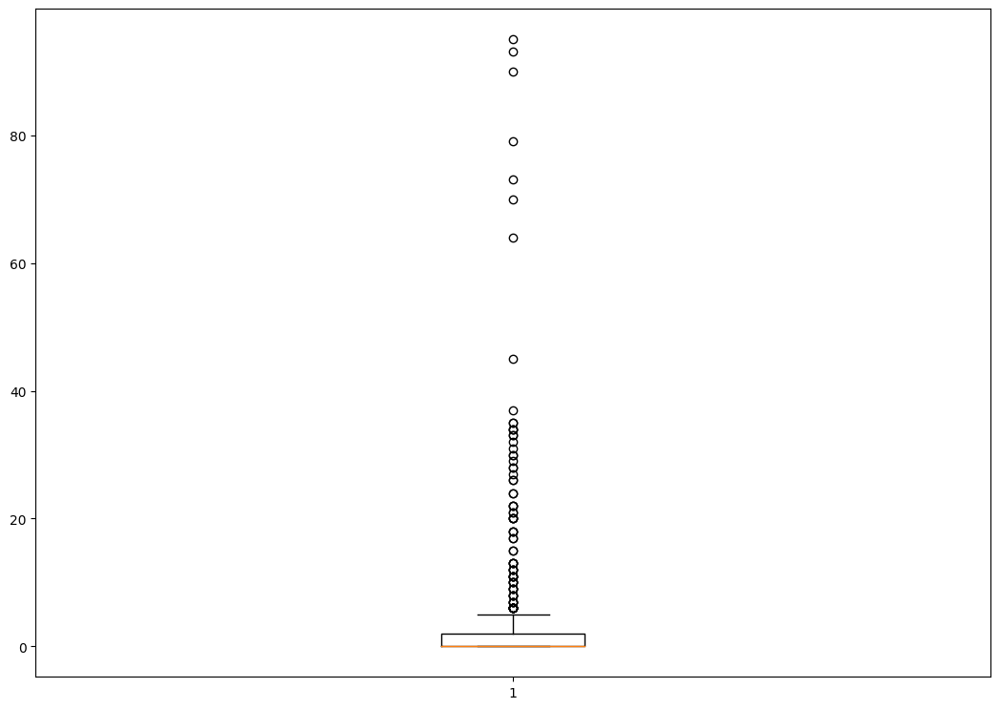

In [ ]:
plot_solution_spread(archive)


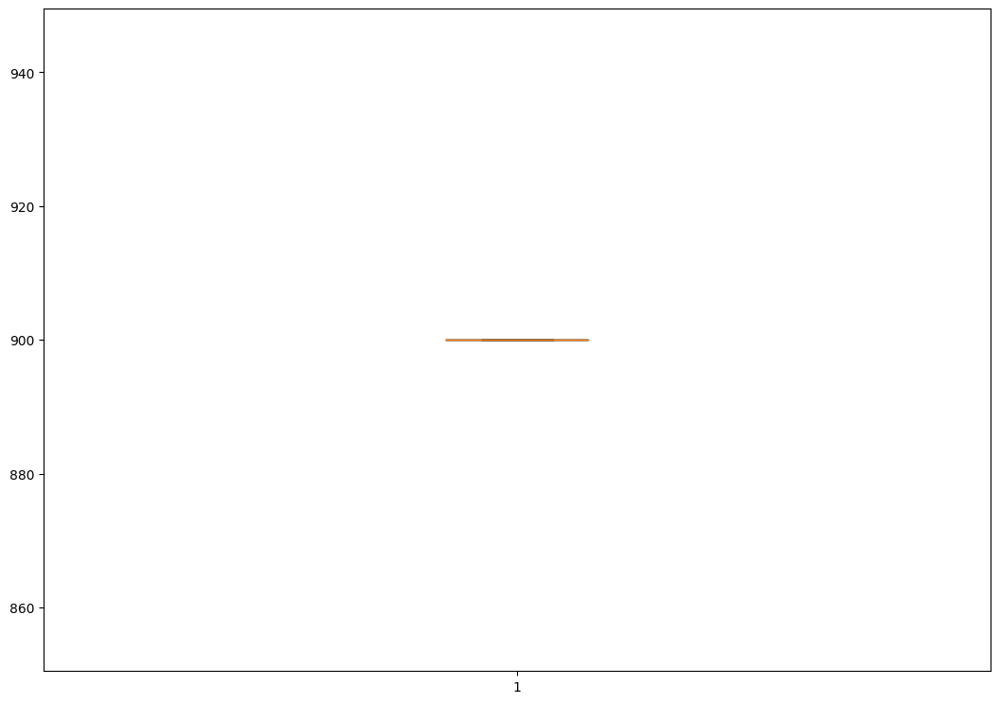

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 150, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0006670951843261719
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.0783696174621582
Iterations:   1%|          | 1/100 [00:38<1:02:42, 38.01s/it]archive training
time to add to som 0.016569852828979492
Iterations:   2%|▏         | 2/100 [01:20<1:06:24, 40.66s/it]archive training
time to add to som 0.030245065689086914
Iterations:   3%|▎         | 3/100 [01:57<1:02:48, 38.85s/it]archive training
time to add to som 0.021289825439453125
Iterations:   4%|▍         | 4/100 [02:34<1:01:00, 38.13s/it]archive training
time to add to som 0.0322413444519043
Iterations:   5%|▌         | 5/100 [03:11<59:46, 37.76s/it]  archive training
time to add to som 0.03638339042663574
Iterations:   6%|▌         | 6/100 [03:46<57:47, 36.89s/it]archive training
time to add to som 0.03128504753112793
Iterations:   7%|▋         | 7/100 [04:22<56:38, 36.54s/it]archive training
time to add to som 0.046622514724731445
Iterations:   8%|▊   

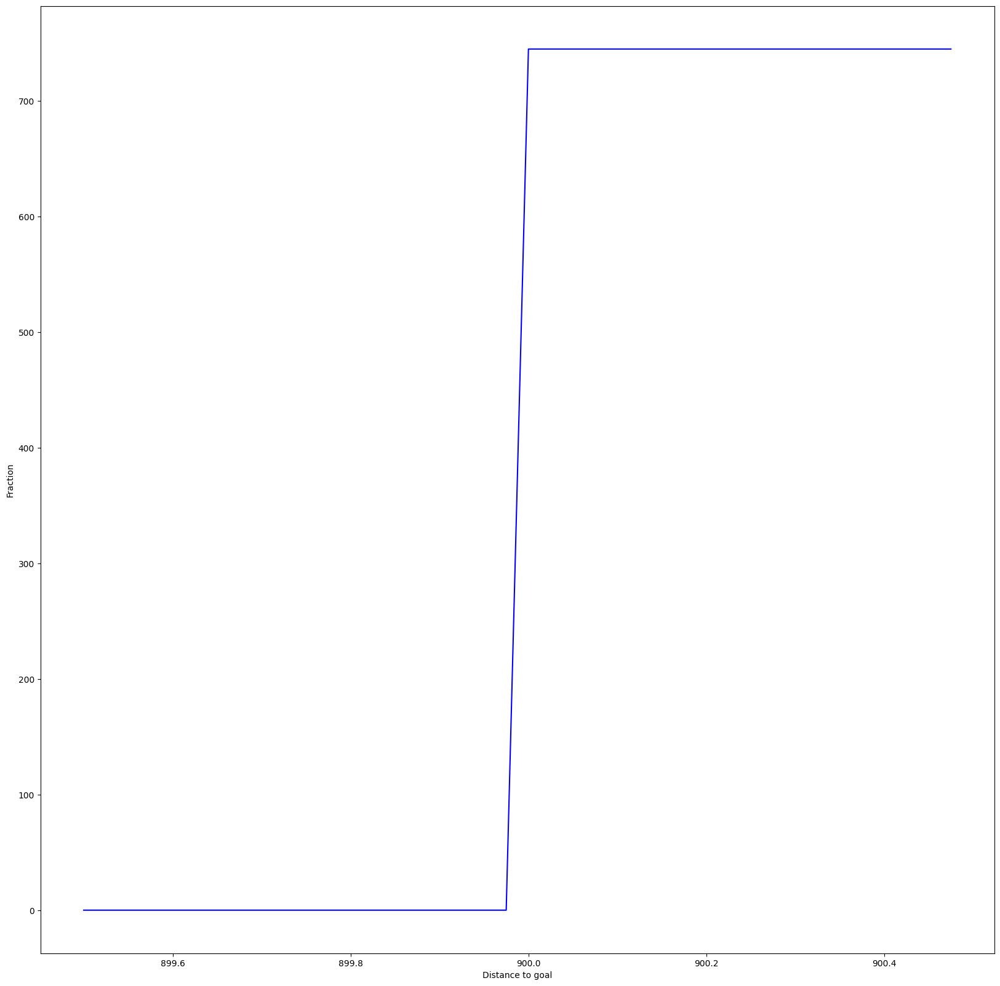

In [ ]:
plot_cumulative_distro_objective(archive)

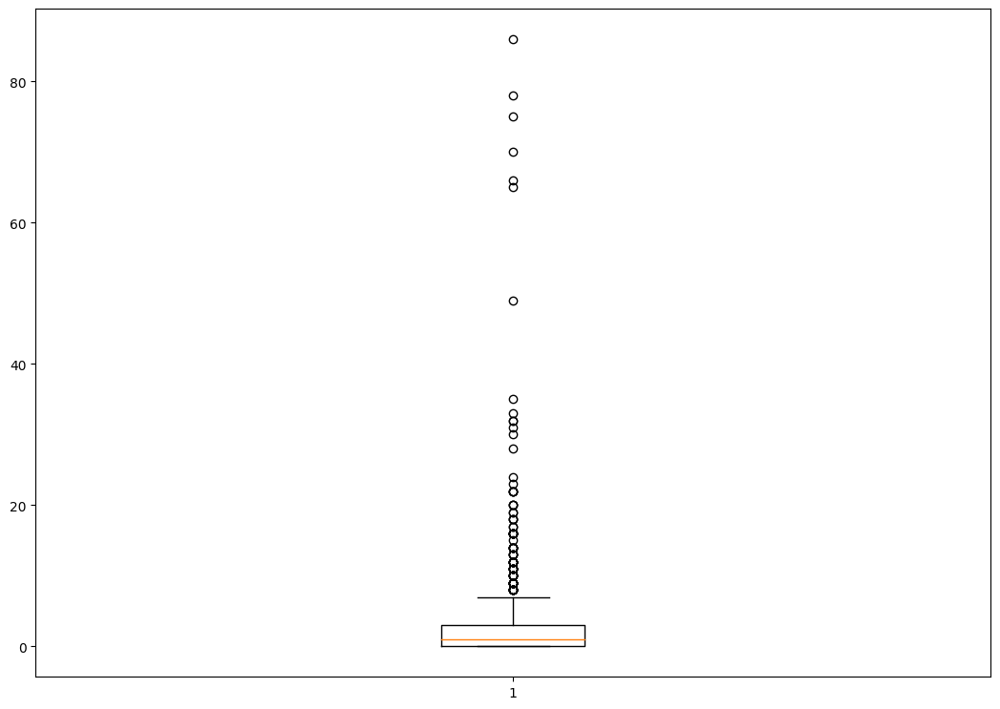

In [ ]:
plot_solution_spread(archive)

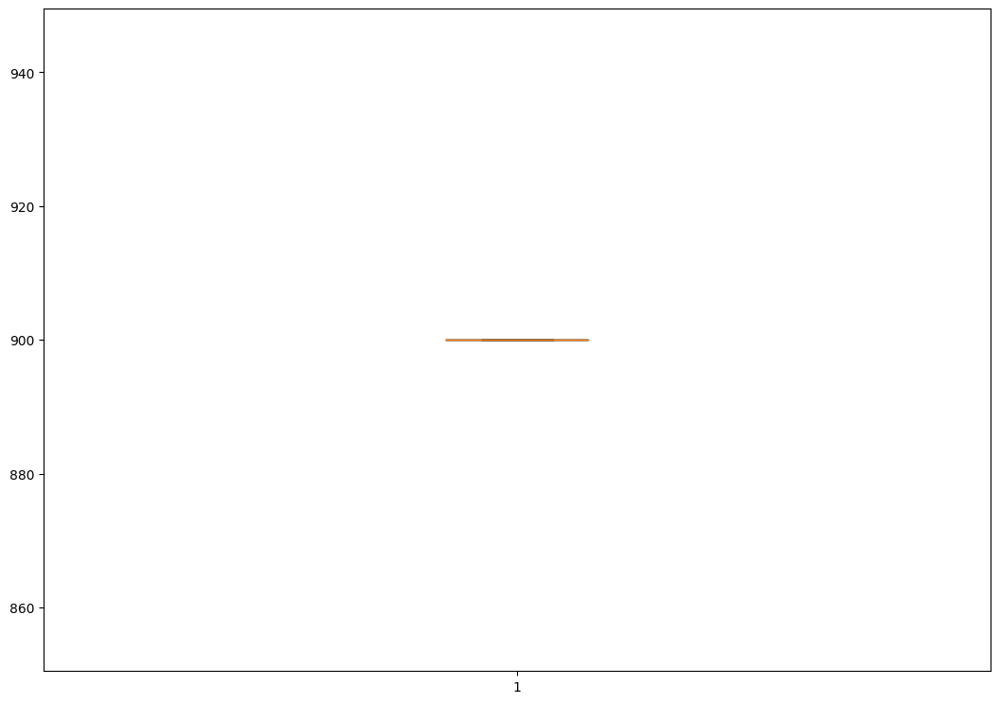

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 150, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0017216205596923828
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.015851259231567383
Iterations:   1%|          | 1/100 [00:35<58:13, 35.28s/it]archive training
time to add to som 0.02014780044555664
Iterations:   2%|▏         | 2/100 [01:10<57:34, 35.25s/it]archive training
time to add to som 0.02182292938232422
Iterations:   3%|▎         | 3/100 [01:45<56:34, 34.99s/it]archive training
time to add to som 0.03503727912902832
Iterations:   4%|▍         | 4/100 [02:20<56:13, 35.14s/it]archive training
time to add to som 0.029781579971313477
Iterations:   5%|▌         | 5/100 [02:55<55:28, 35.03s/it]archive training
time to add to som 0.04933309555053711
Iterations:   6%|▌         | 6/100 [03:30<55:07, 35.19s/it]archive training
time to add to som 0.04047894477844238
Iterations:   7%|▋         | 7/100 [04:07<55:03, 35.52s/it]archive training
time to add to som 0.04624509811401367
Iterations:   8%|▊         | 8/

In [ ]:
plot_cumulative_distro_objective(archive)

In [ ]:
plot_solution_spread(archive)

In [ ]:
plot_solution_distance(archive)

######*11.1.3 500d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze2", dim=500)

extra time to initialize archive 494.67900919914246
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.2832632064819336
Iterations:   1%|          | 1/100 [00:29<48:02, 29.11s/it]archive training
time to add to cvt 0.2738687992095947
Iterations:   2%|▏         | 2/100 [00:58<47:37, 29.16s/it]archive training
time to add to cvt 0.23881268501281738
Iterations:   3%|▎         | 3/100 [01:27<47:21, 29.30s/it]archive training
time to add to cvt 0.22304487228393555
Iterations:   4%|▍         | 4/100 [01:57<47:17, 29.55s/it]archive training
time to add to cvt 0.2813894748687744
Iterations:   5%|▌         | 5/100 [02:26<46:24, 29.31s/it]archive training
time to add to cvt 0.28553271293640137
Iterations:   6%|▌         | 6/100 [02:54<45:14, 28.88s/it]archive training
time to add to cvt 0.22835016250610352
Iterations:   7%|▋         | 7/100 [03:23<44:48, 28.91s/it]archive training
time to add to cvt 0.2724125385284424
Iterations:   8%|▊         | 8/100 [03:5

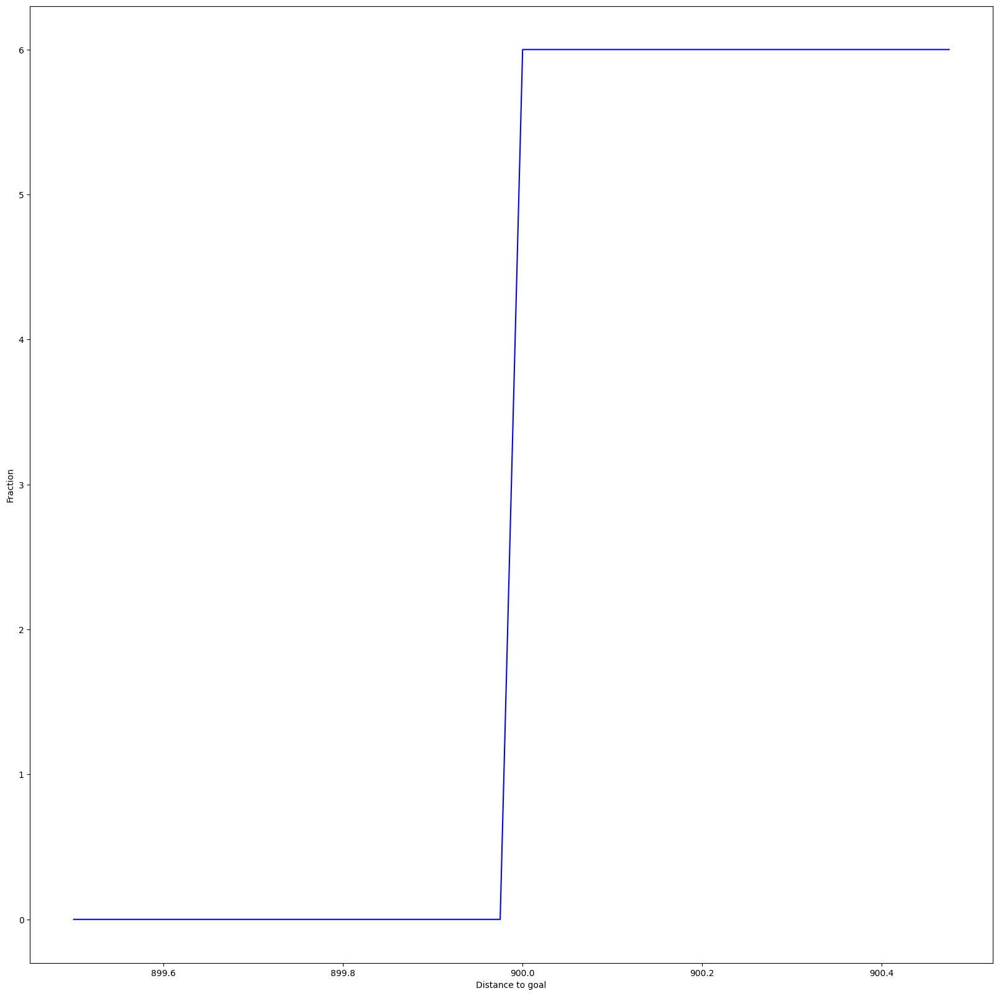

In [ ]:
plot_cumulative_distro_objective(archive)

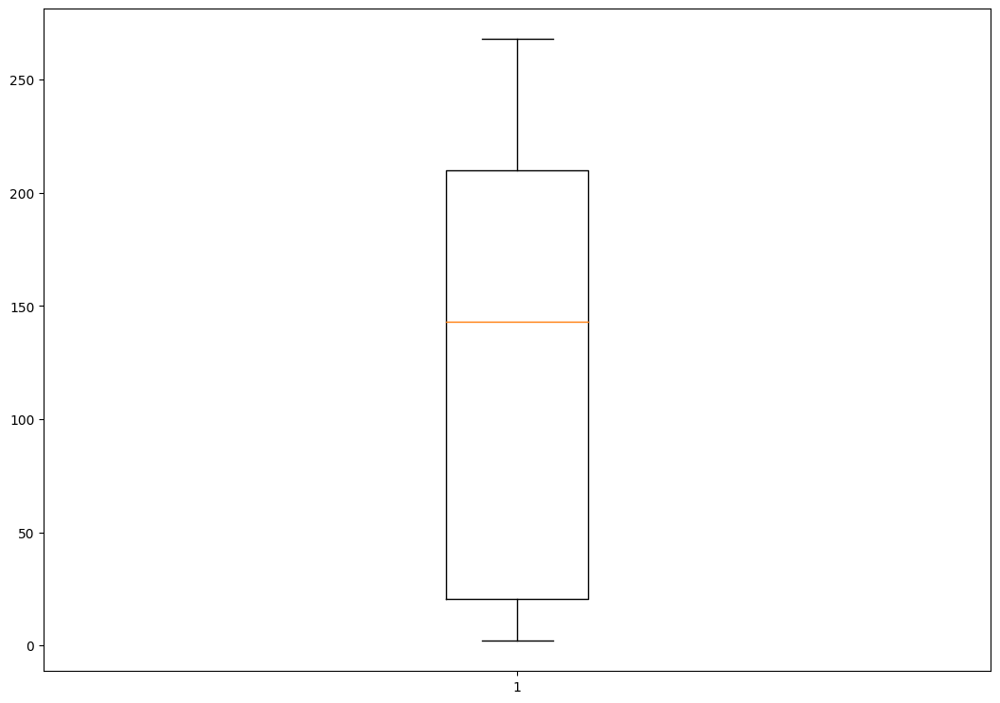

In [ ]:
plot_solution_spread(archive)

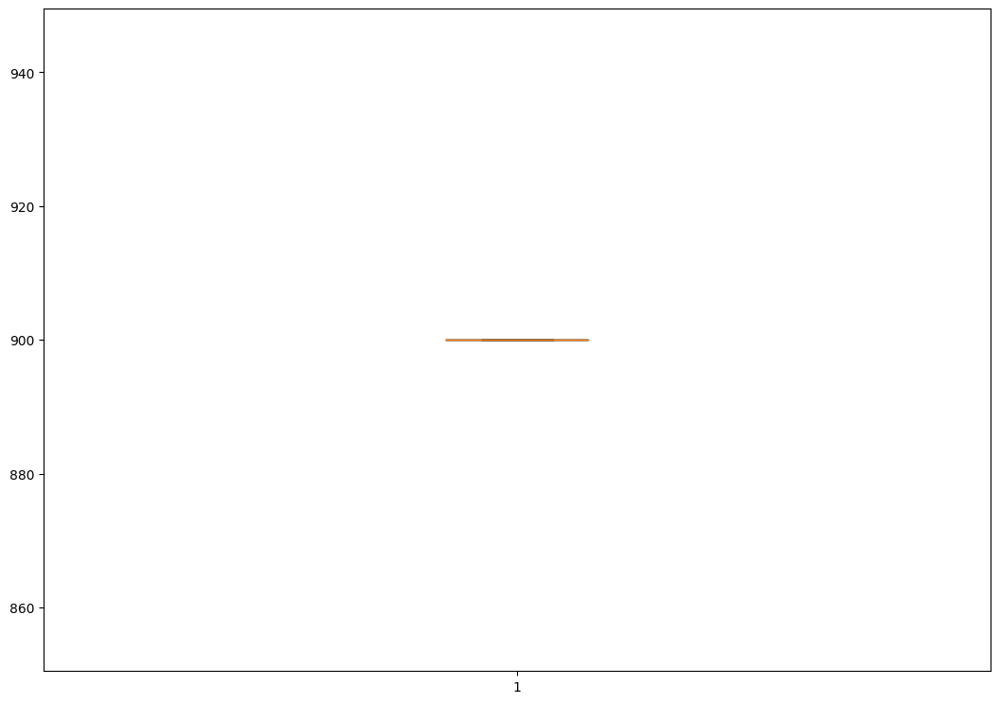

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 500)


extra time to initialize archive 0.0003113746643066406
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01625990867614746
Iterations:   1%|          | 1/100 [00:18<29:51, 18.10s/it]archive training
time to add to som 0.019443511962890625
Iterations:   2%|▏         | 2/100 [00:36<29:44, 18.21s/it]archive training
time to add to som 0.03974127769470215
Iterations:   3%|▎         | 3/100 [00:54<29:30, 18.25s/it]archive training
time to add to som 0.05341148376464844
Iterations:   4%|▍         | 4/100 [01:14<29:57, 18.72s/it]archive training
time to add to som 0.044027090072631836
Iterations:   5%|▌         | 5/100 [01:32<29:31, 18.65s/it]archive training
time to add to som 0.050258636474609375
Iterations:   6%|▌         | 6/100 [01:51<29:06, 18.58s/it]archive training
time to add to som 0.056793212890625
Iterations:   7%|▋         | 7/100 [02:09<28:29, 18.38s/it]archive training
time to add to som 0.07297992706298828
Iterations:   8%|▊         | 8/1

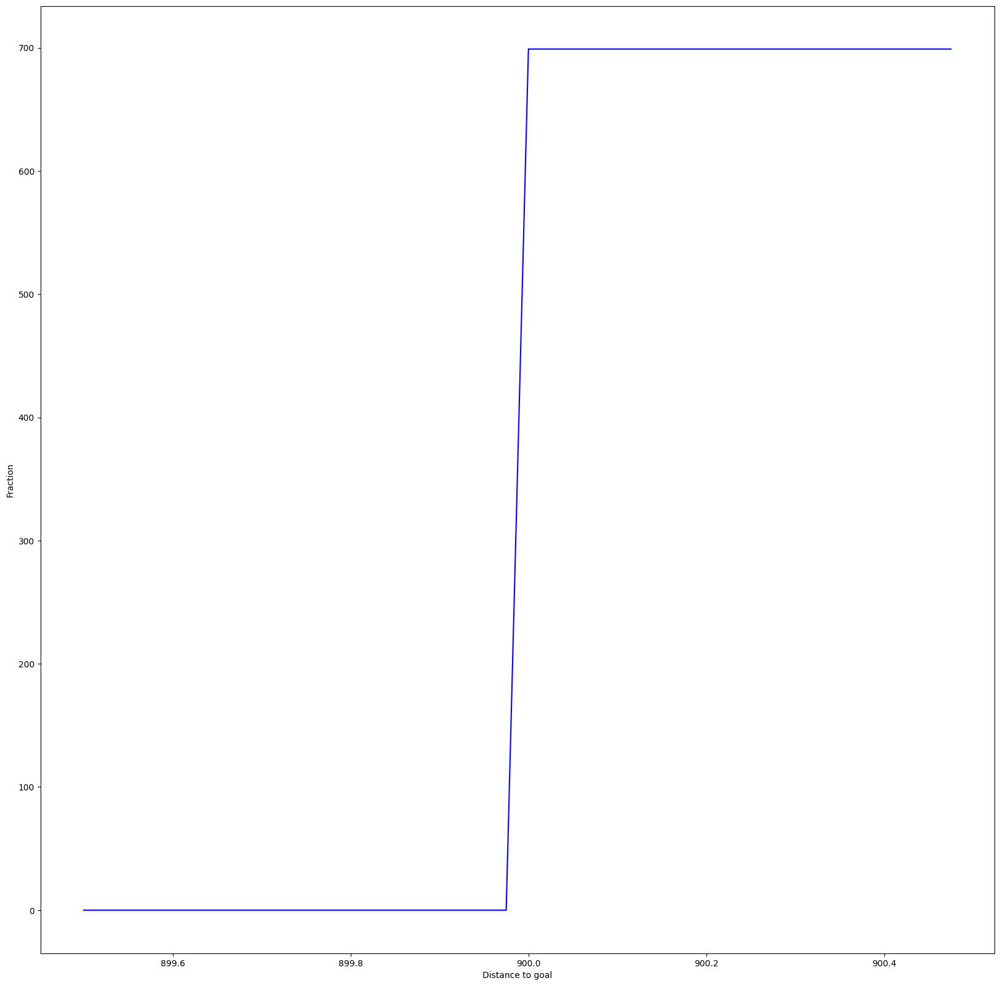

In [ ]:
plot_cumulative_distro_objective(archive)


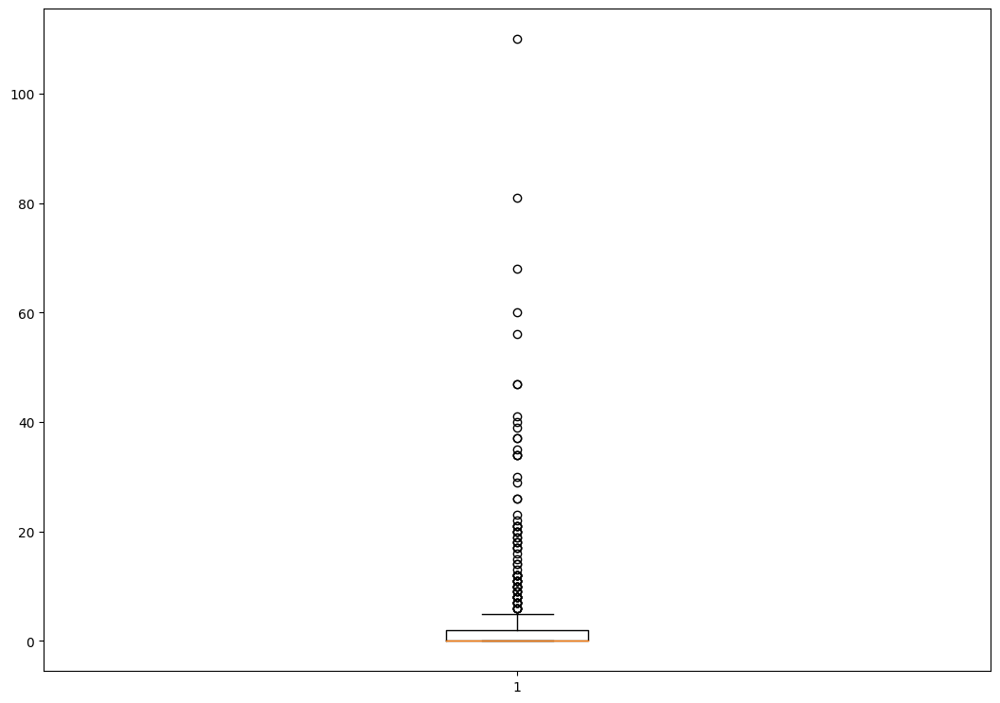

In [ ]:
plot_solution_spread(archive)


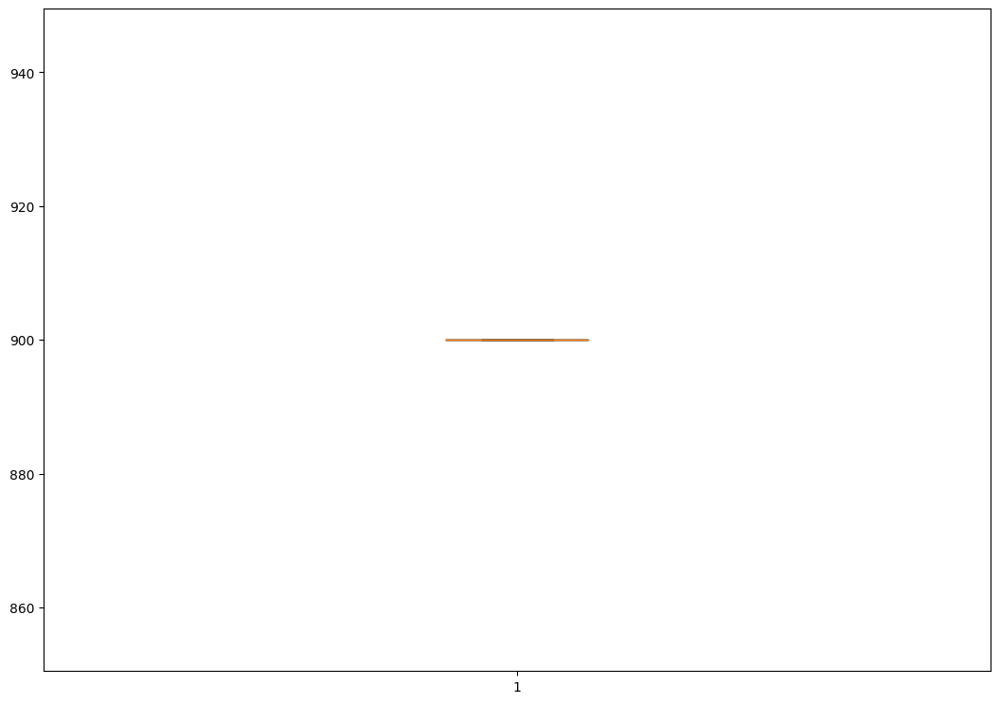

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })


extra time to initialize archive 0.00033354759216308594
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.016304731369018555
Iterations:   1%|          | 1/100 [00:19<32:24, 19.64s/it]archive training
time to add to som 0.023090600967407227
Iterations:   2%|▏         | 2/100 [00:39<32:04, 19.63s/it]archive training
time to add to som 0.04158973693847656
Iterations:   3%|▎         | 3/100 [00:58<31:47, 19.67s/it]archive training
time to add to som 0.04320693016052246
Iterations:   4%|▍         | 4/100 [01:20<32:20, 20.21s/it]archive training
time to add to som 0.04588794708251953
Iterations:   5%|▌         | 5/100 [01:39<31:31, 19.91s/it]archive training
time to add to som 0.04530167579650879
Iterations:   6%|▌         | 6/100 [01:58<30:52, 19.71s/it]archive training
time to add to som 0.06683778762817383
Iterations:   7%|▋         | 7/100 [02:19<31:06, 20.07s/it]archive training
time to add to som 0.05285382270812988
Iterations:   8%|▊         | 8

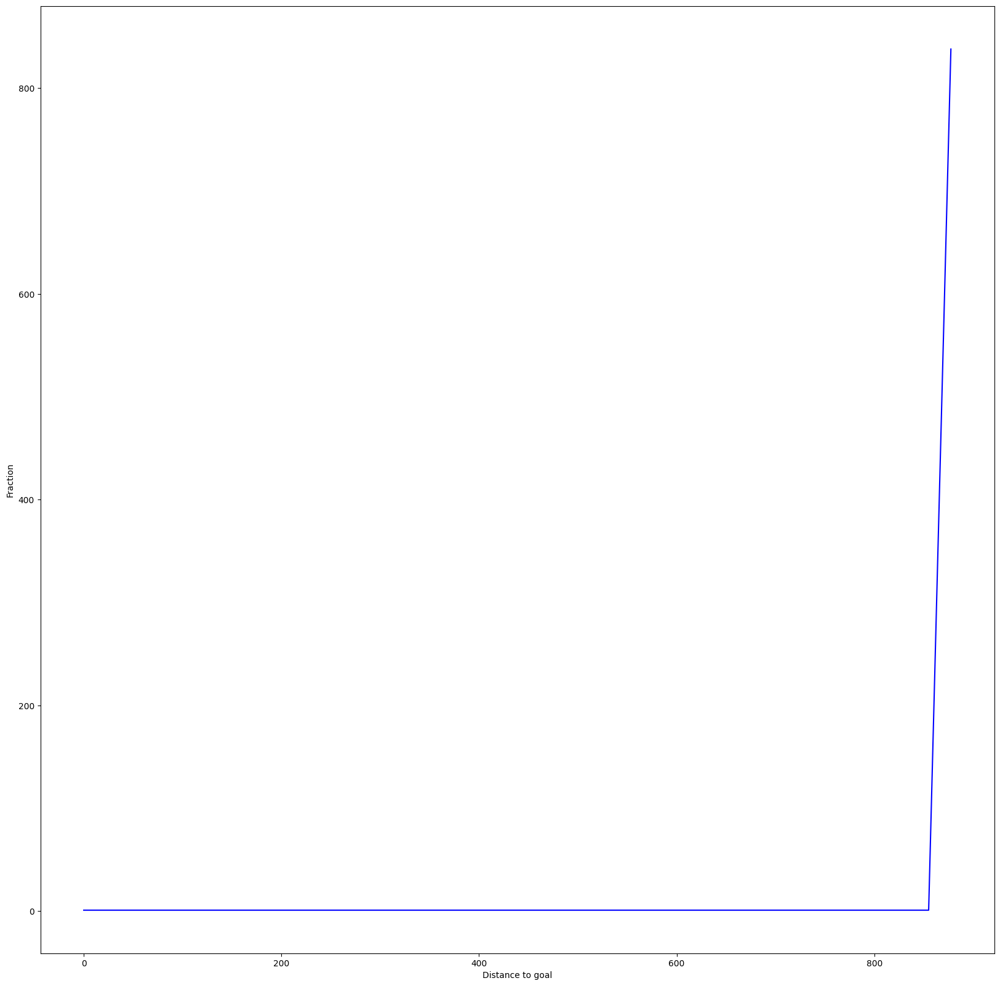

In [ ]:
plot_cumulative_distro_objective(archive)

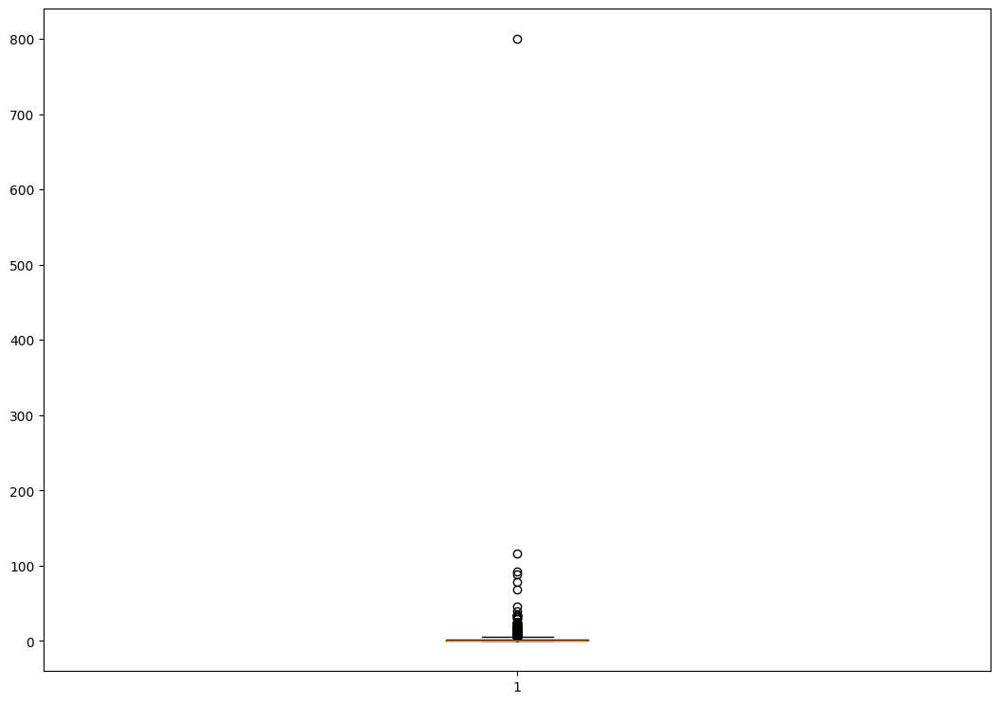

In [ ]:
plot_solution_spread(archive)

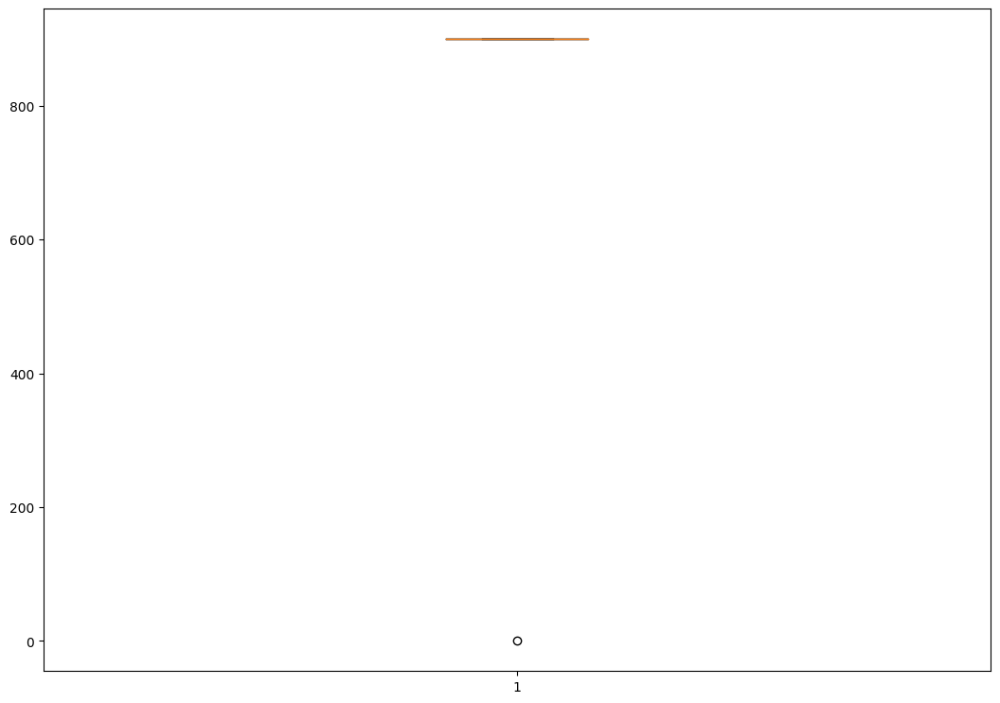

In [ ]:
plot_solution_distance(archive)

som double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.000362396240234375
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.015291690826416016
Iterations:   1%|          | 1/100 [00:20<34:36, 20.98s/it]archive training
time to add to som 0.03214597702026367
Iterations:   2%|▏         | 2/100 [00:41<33:46, 20.67s/it]archive training
time to add to som 0.03586411476135254
Iterations:   3%|▎         | 3/100 [01:02<33:38, 20.81s/it]archive training
time to add to som 0.031184911727905273
Iterations:   4%|▍         | 4/100 [01:24<33:54, 21.19s/it]archive training
time to add to som 0.04035377502441406
Iterations:   5%|▌         | 5/100 [01:44<33:16, 21.02s/it]archive training
time to add to som 0.07681822776794434
Iterations:   6%|▌         | 6/100 [02:06<33:16, 21.24s/it]archive training
time to add to som 0.04202532768249512
Iterations:   7%|▋         | 7/100 [02:27<32:58, 21.27s/it]archive training
time to add to som 0.04955935478210449
Iterations:   8%|▊         | 8/1

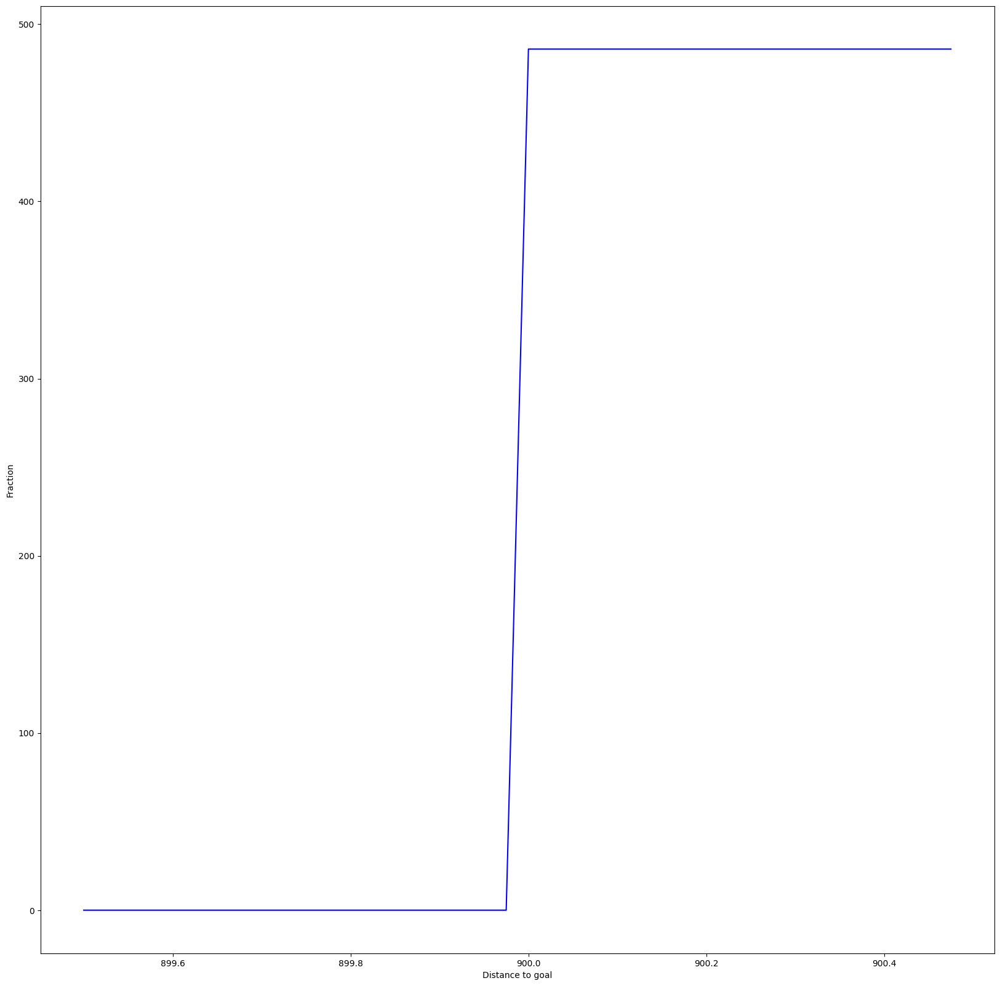

In [ ]:
plot_cumulative_distro_objective(archive)

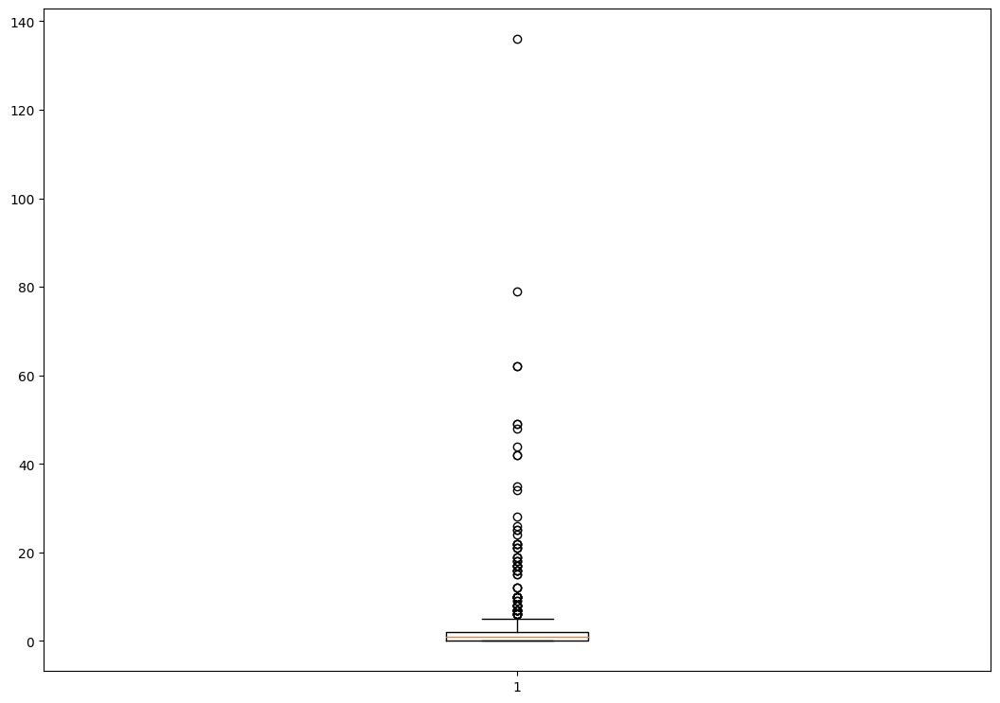

In [ ]:
plot_solution_spread(archive)

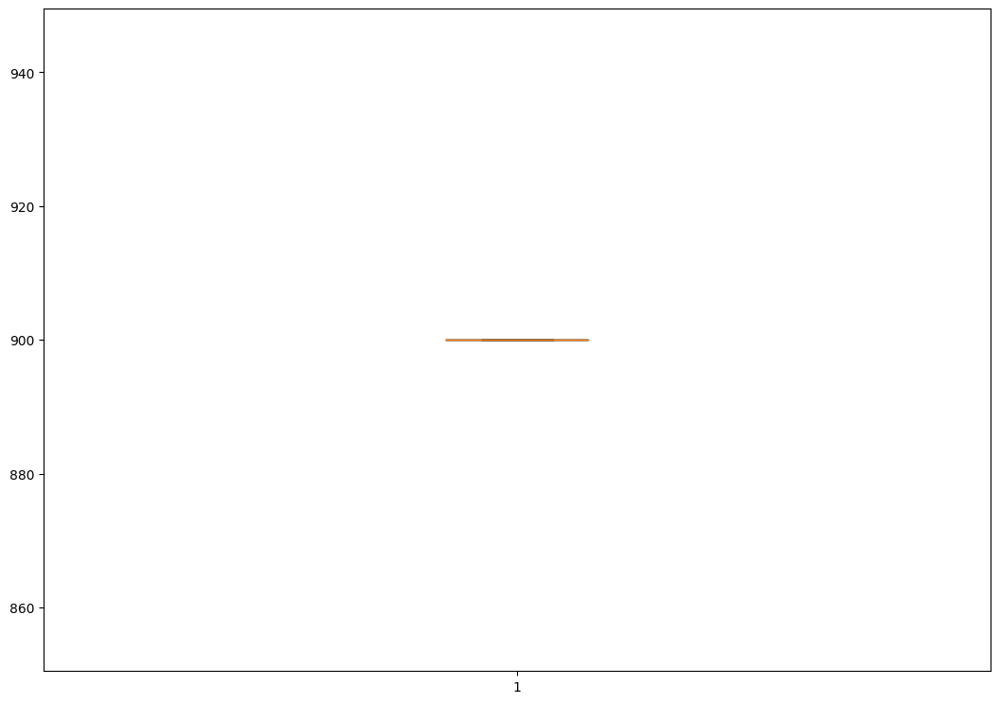

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })


extra time to initialize archive 0.0003039836883544922
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.021991252899169922
Iterations:   1%|          | 1/100 [00:18<30:58, 18.78s/it]archive training
time to add to som 0.02208709716796875
Iterations:   2%|▏         | 2/100 [00:38<31:20, 19.19s/it]archive training
time to add to som 0.027739524841308594
Iterations:   3%|▎         | 3/100 [00:56<30:24, 18.81s/it]archive training
time to add to som 0.03179121017456055
Iterations:   4%|▍         | 4/100 [01:15<29:54, 18.69s/it]archive training
time to add to som 0.03684425354003906
Iterations:   5%|▌         | 5/100 [01:33<29:24, 18.58s/it]archive training
time to add to som 0.05838155746459961
Iterations:   6%|▌         | 6/100 [01:52<29:31, 18.84s/it]archive training
time to add to som 0.05094313621520996
Iterations:   7%|▋         | 7/100 [02:11<29:18, 18.91s/it]archive training
time to add to som 0.054112911224365234
Iterations:   8%|▊         | 8

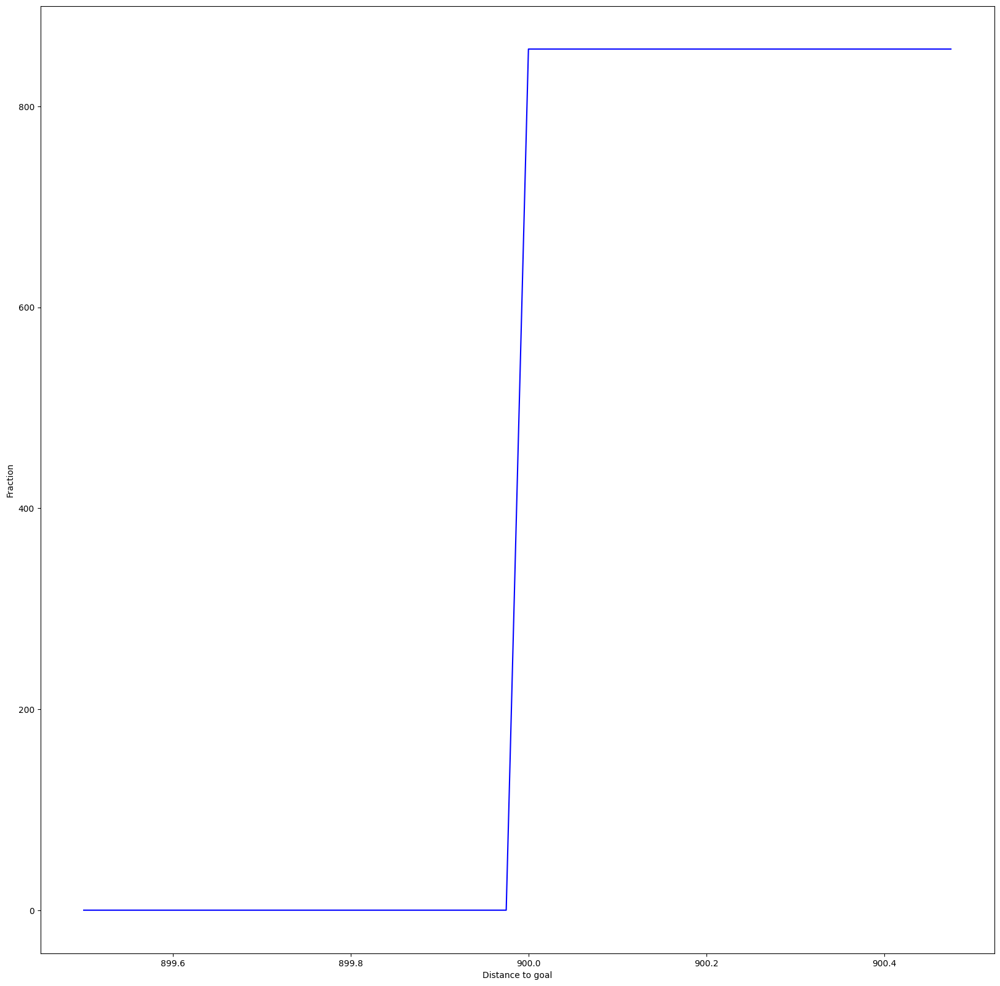

In [ ]:
plot_cumulative_distro_objective(archive)


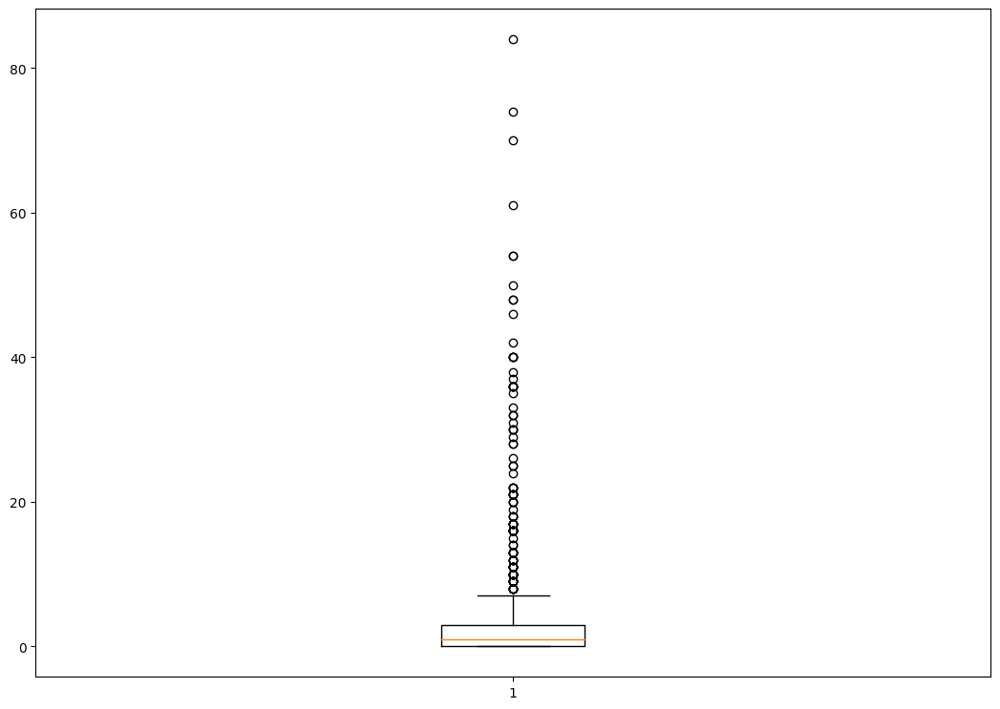

In [ ]:
plot_solution_spread(archive)


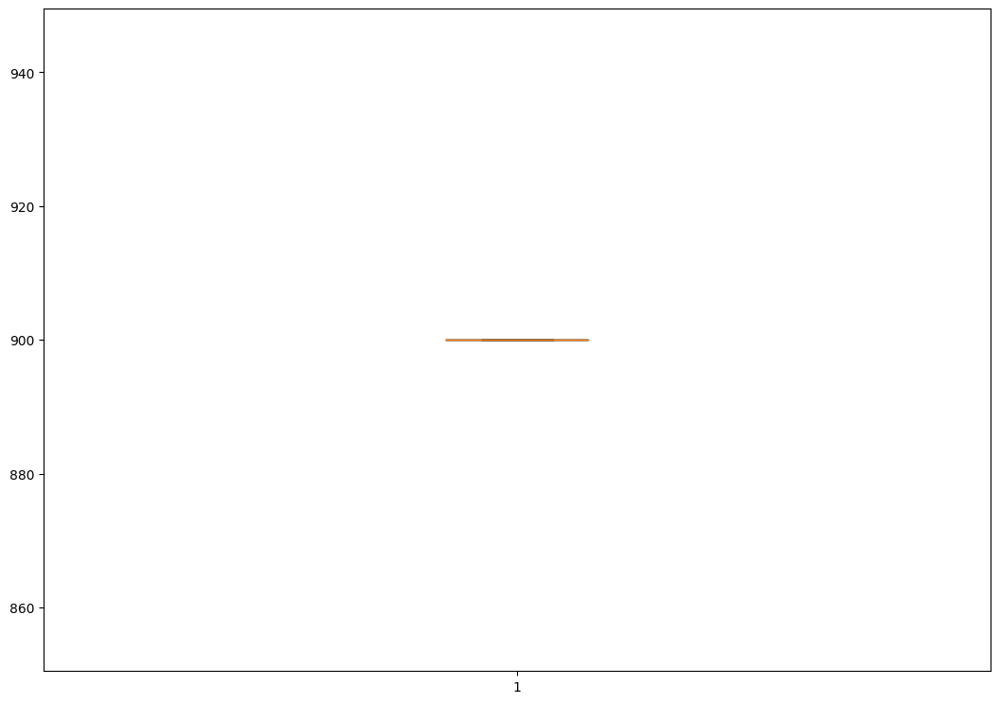

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 500, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.00032639503479003906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 2.9936094284057617
Iterations:   1%|          | 1/100 [00:42<1:10:18, 42.61s/it]archive training
time to add to som 0.04133009910583496
Iterations:   2%|▏         | 2/100 [01:28<1:13:09, 44.79s/it]archive training
time to add to som 0.040454864501953125
Iterations:   3%|▎         | 3/100 [02:05<1:06:16, 41.00s/it]archive training
time to add to som 0.03617119789123535
Iterations:   4%|▍         | 4/100 [02:41<1:02:17, 38.93s/it]archive training
time to add to som 0.06587791442871094
Iterations:   5%|▌         | 5/100 [03:16<59:47, 37.76s/it]  archive training
time to add to som 0.05281662940979004
Iterations:   6%|▌         | 6/100 [03:52<57:53, 36.95s/it]archive training
time to add to som 0.05641007423400879
Iterations:   7%|▋         | 7/100 [04:27<56:24, 36.39s/it]archive training
time to add to som 0.07492256164550781
Iterations:   8%|▊    

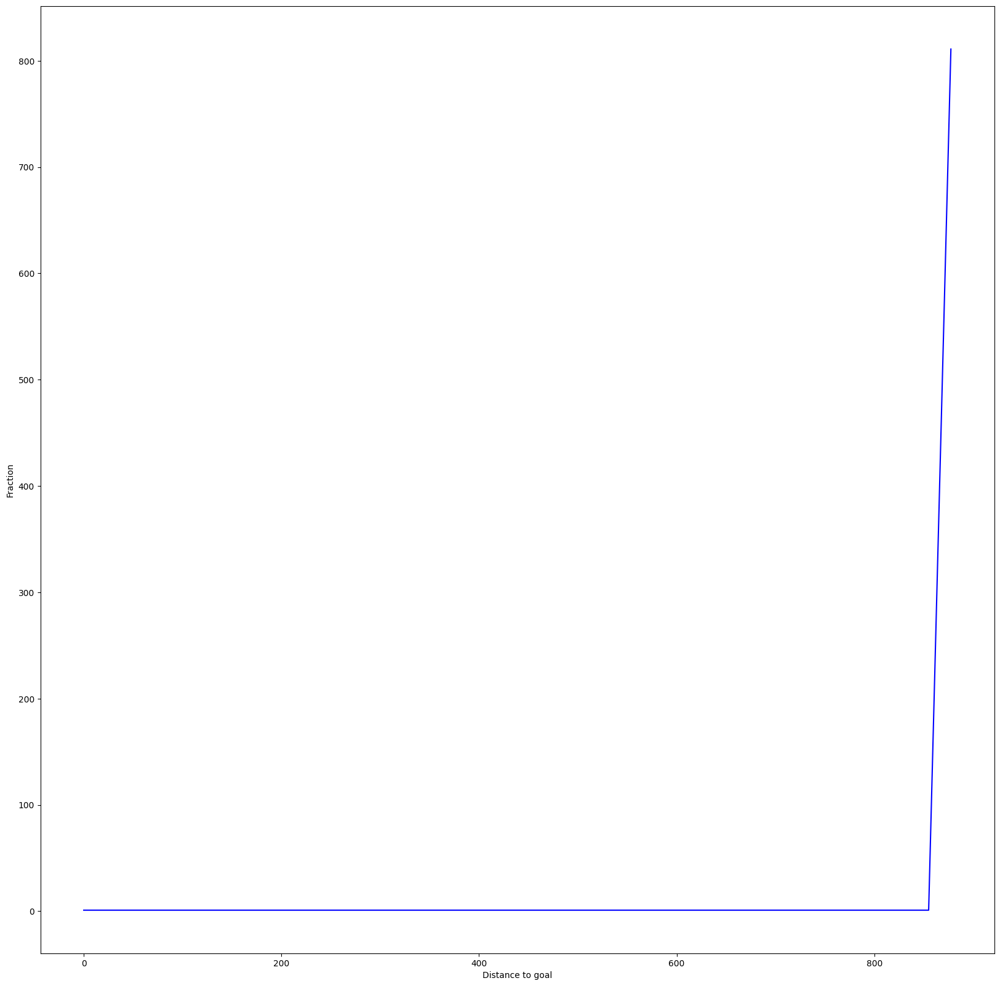

In [ ]:
plot_cumulative_distro_objective(archive)

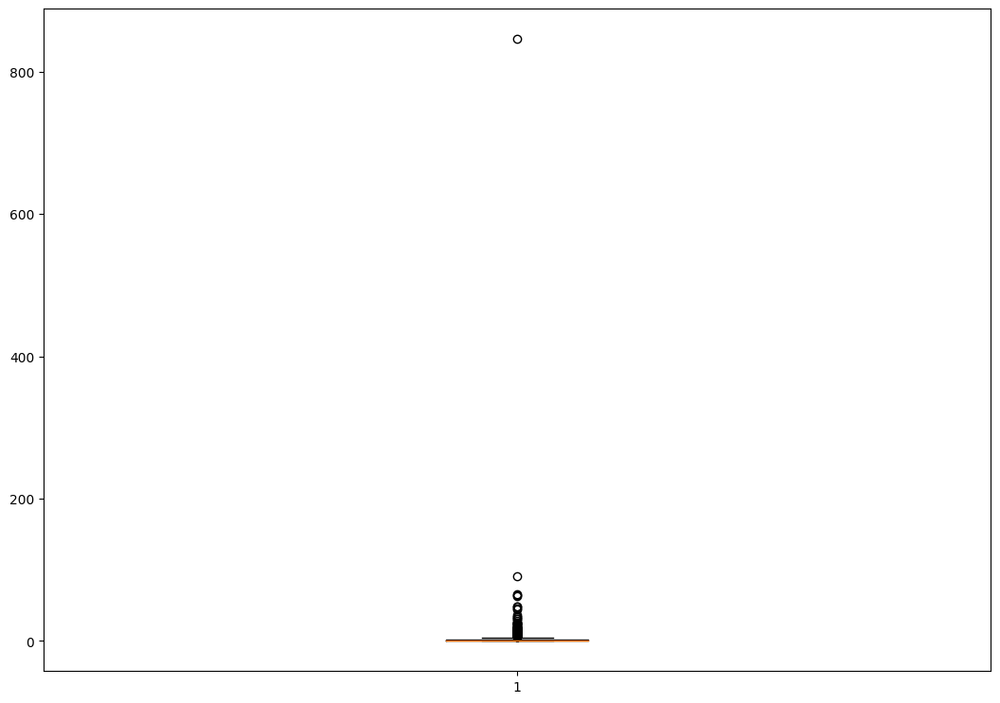

In [ ]:
plot_solution_spread(archive)

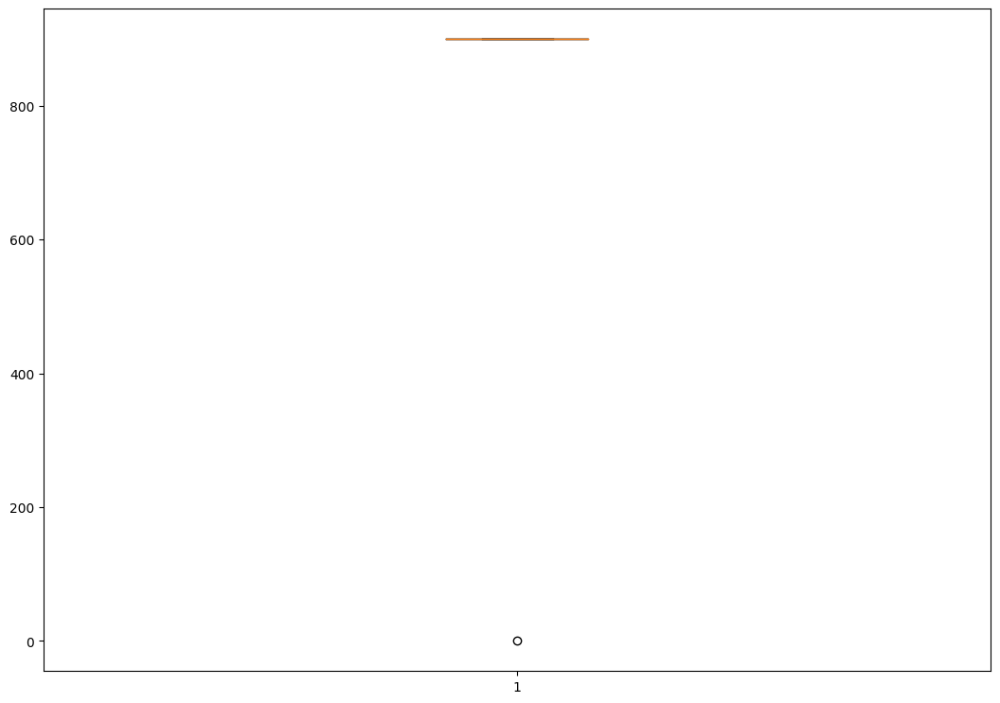

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze2", dim = 500, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0010957717895507812
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01770639419555664
Iterations:   1%|          | 1/100 [00:33<55:25, 33.59s/it]archive training
time to add to som 0.02423715591430664
Iterations:   2%|▏         | 2/100 [01:07<55:08, 33.76s/it]archive training
time to add to som 0.05281519889831543
Iterations:   3%|▎         | 3/100 [01:42<55:24, 34.27s/it]archive training
time to add to som 0.04694509506225586
Iterations:   4%|▍         | 4/100 [02:16<54:57, 34.35s/it]archive training
time to add to som 0.04893136024475098
Iterations:   5%|▌         | 5/100 [02:50<54:09, 34.20s/it]archive training
time to add to som 0.0870523452758789
Iterations:   6%|▌         | 6/100 [03:26<54:24, 34.73s/it]archive training
time to add to som 0.07080912590026855
Iterations:   7%|▋         | 7/100 [04:01<54:04, 34.88s/it]archive training
time to add to som 0.0834660530090332
Iterations:   8%|▊         | 8/100 

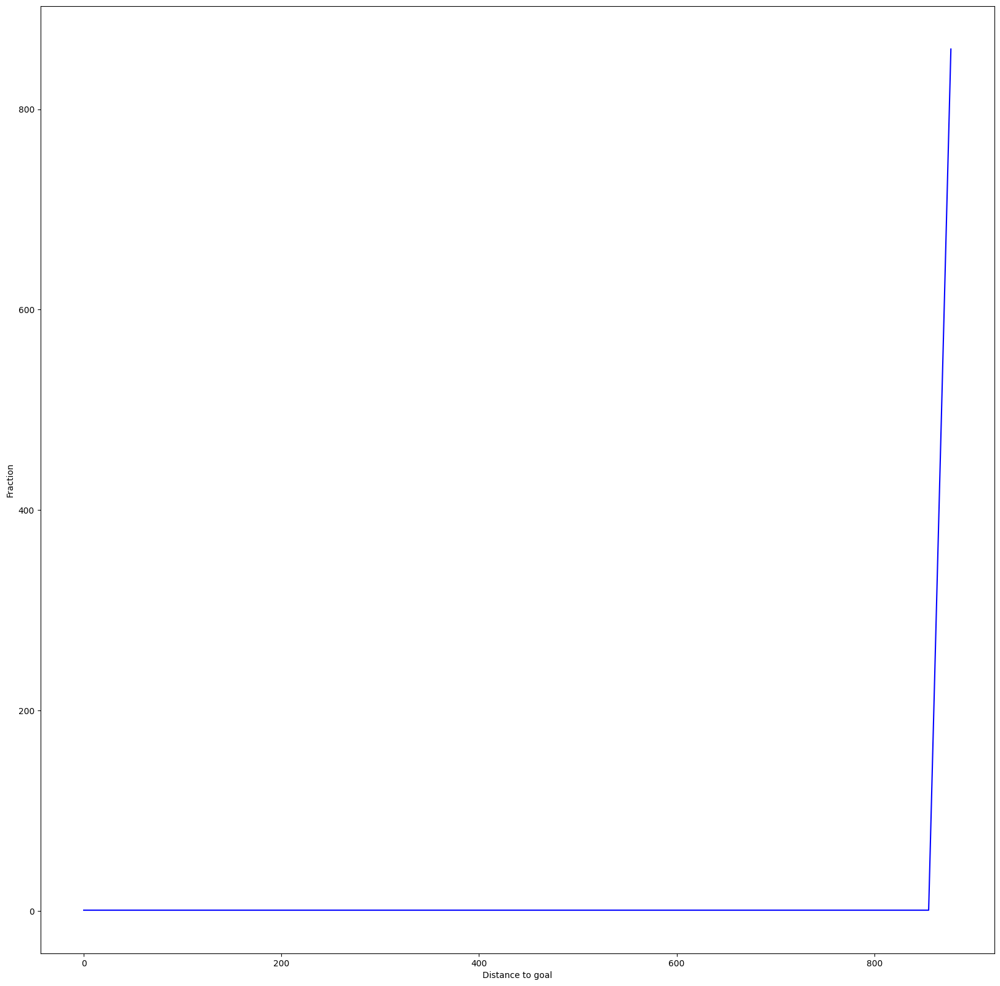

In [ ]:
plot_cumulative_distro_objective(archive)

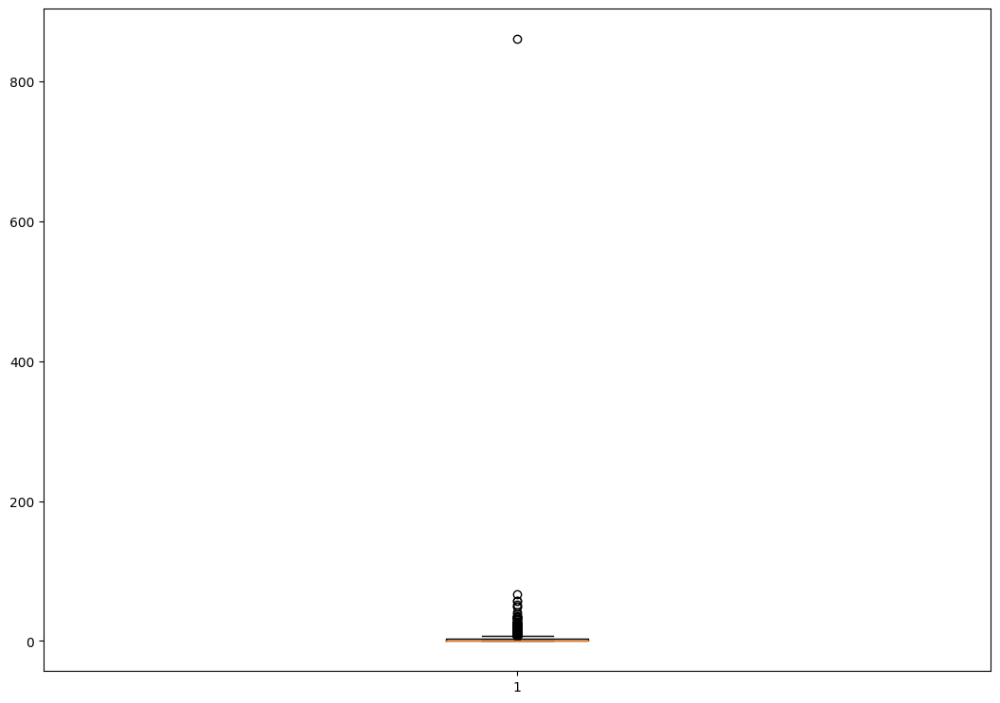

In [ ]:
plot_solution_spread(archive)

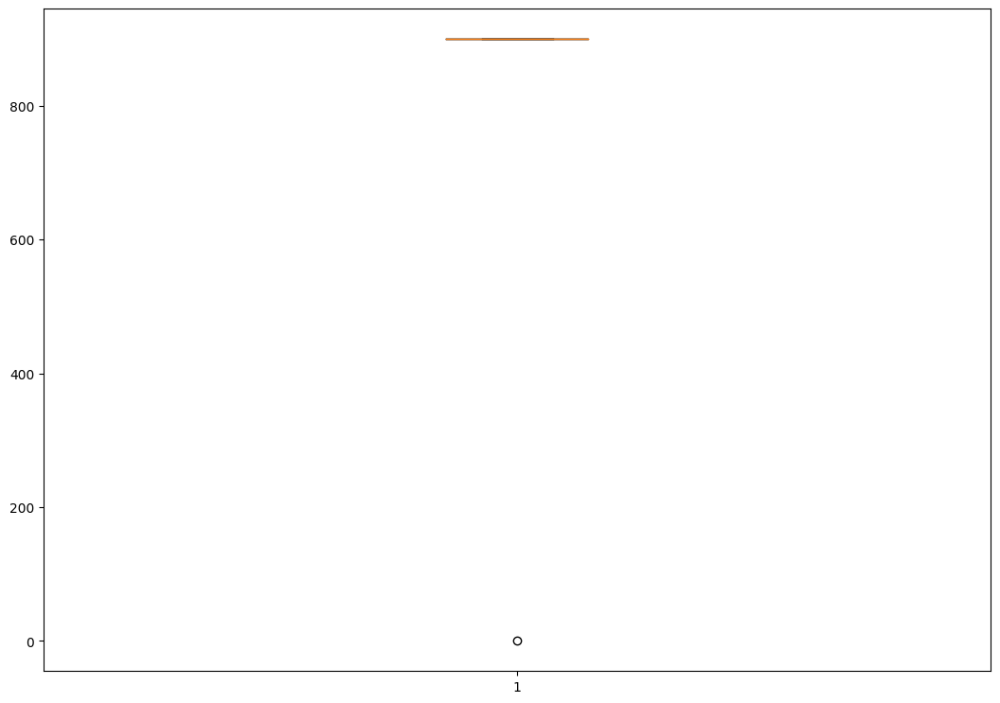

In [ ]:
plot_solution_distance(archive)

#####**11.1.3 maze 3**

######*11.1.3 1d*

cvt

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze3")

extra time to initialize archive 40.655808448791504
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.005408048629760742
Iterations:   1%|          | 1/100 [00:17<29:30, 17.88s/it]archive training
time to add to cvt 0.004616260528564453
Iterations:   2%|▏         | 2/100 [00:36<29:38, 18.15s/it]archive training
time to add to cvt 0.0038497447967529297
Iterations:   3%|▎         | 3/100 [00:54<29:29, 18.24s/it]archive training
time to add to cvt 0.003134012222290039
Iterations:   4%|▍         | 4/100 [01:12<29:02, 18.15s/it]archive training
time to add to cvt 0.003596782684326172
Iterations:   5%|▌         | 5/100 [01:30<28:42, 18.13s/it]archive training
time to add to cvt 0.003995656967163086
Iterations:   6%|▌         | 6/100 [01:48<28:13, 18.02s/it]archive training
time to add to cvt 0.0045239925384521484
Iterations:   7%|▋         | 7/100 [02:07<28:17, 18.25s/it]archive training
time to add to cvt 0.0033109188079833984
Iterations:   8%|▊       

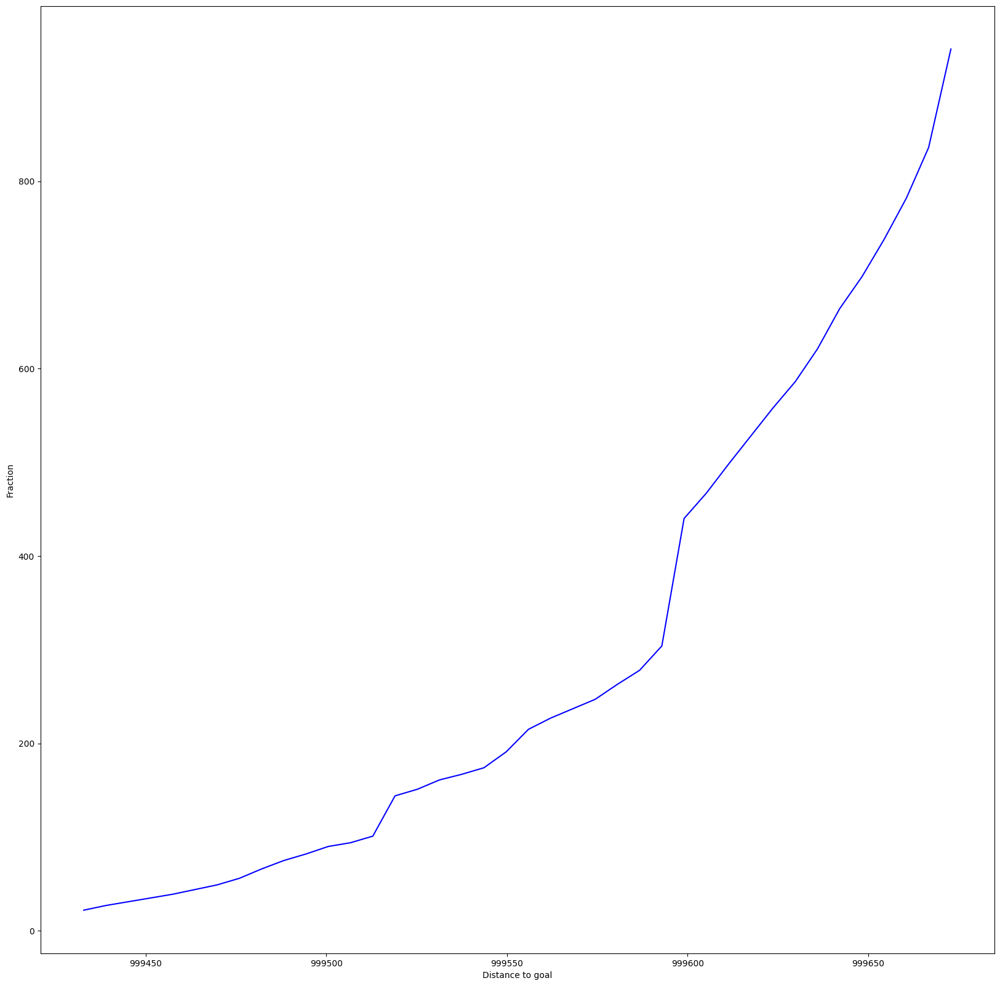

In [ ]:
plot_cumulative_distro_objective(archive)

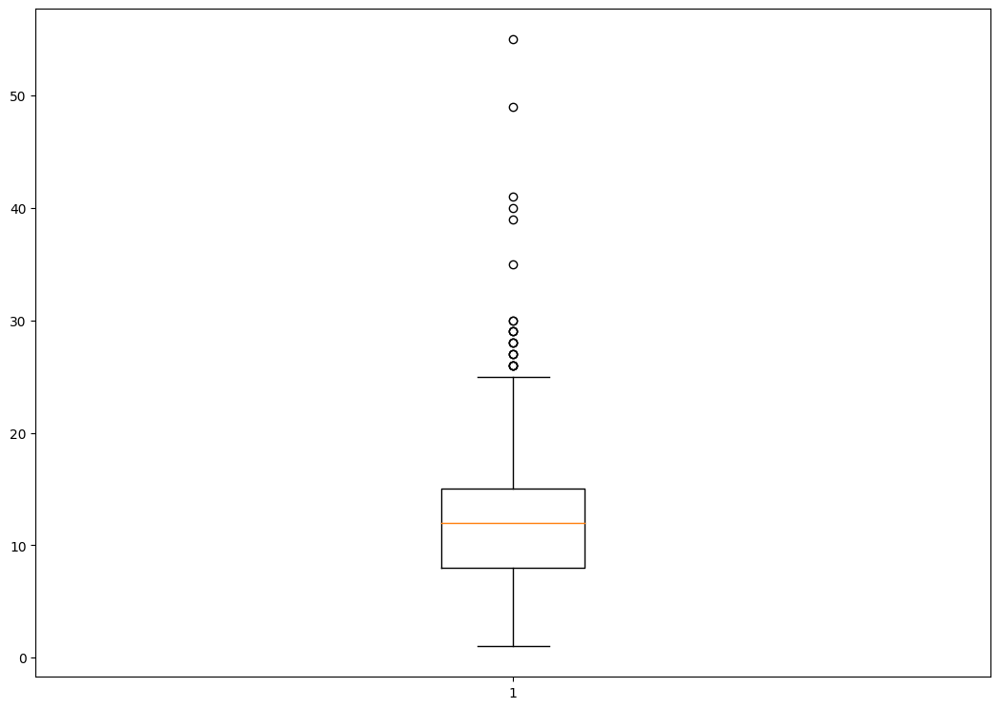

In [ ]:
plot_solution_spread(archive)

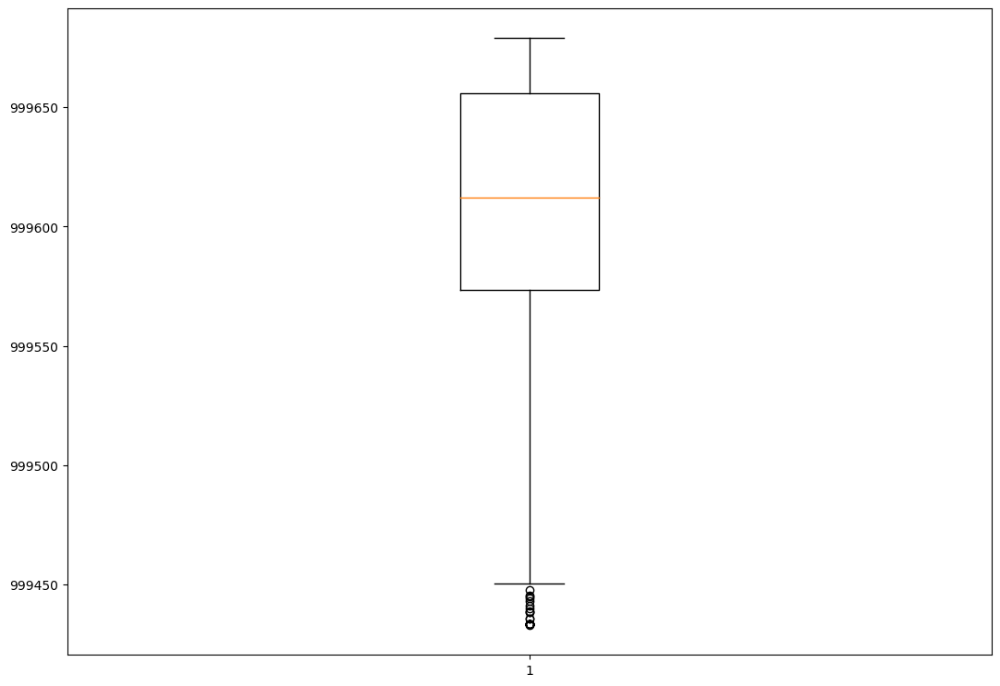

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3")

extra time to initialize archive 0.0003604888916015625
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 3.615382671356201
Iterations:   1%|          | 1/100 [00:43<1:11:38, 43.42s/it]archive training
time to add to som 0.02074265480041504
Iterations:   2%|▏         | 2/100 [01:19<1:04:08, 39.27s/it]archive training
time to add to som 0.016807079315185547
Iterations:   3%|▎         | 3/100 [01:56<1:01:26, 38.00s/it]archive training
time to add to som 0.01618671417236328
Iterations:   4%|▍         | 4/100 [02:32<59:30, 37.19s/it]  archive training
time to add to som 0.02047252655029297
Iterations:   5%|▌         | 5/100 [03:21<1:06:00, 41.69s/it]archive training
time to add to som 0.030569076538085938
Iterations:   6%|▌         | 6/100 [03:59<1:03:23, 40.46s/it]archive training
time to add to som 0.018850088119506836
Iterations:   7%|▋         | 7/100 [04:38<1:01:52, 39.92s/it]archive training
time to add to som 0.021300077438354492
Iterations:   8%|

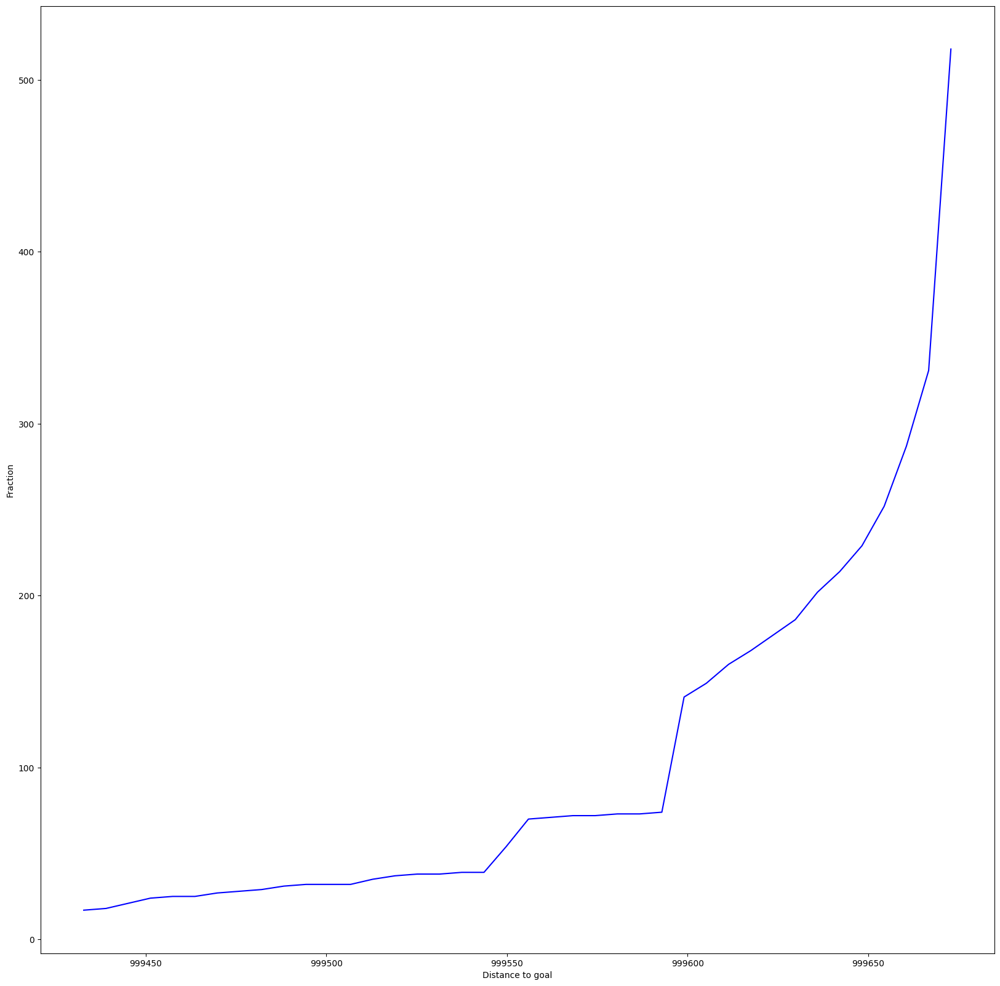

In [ ]:
plot_cumulative_distro_objective(archive)


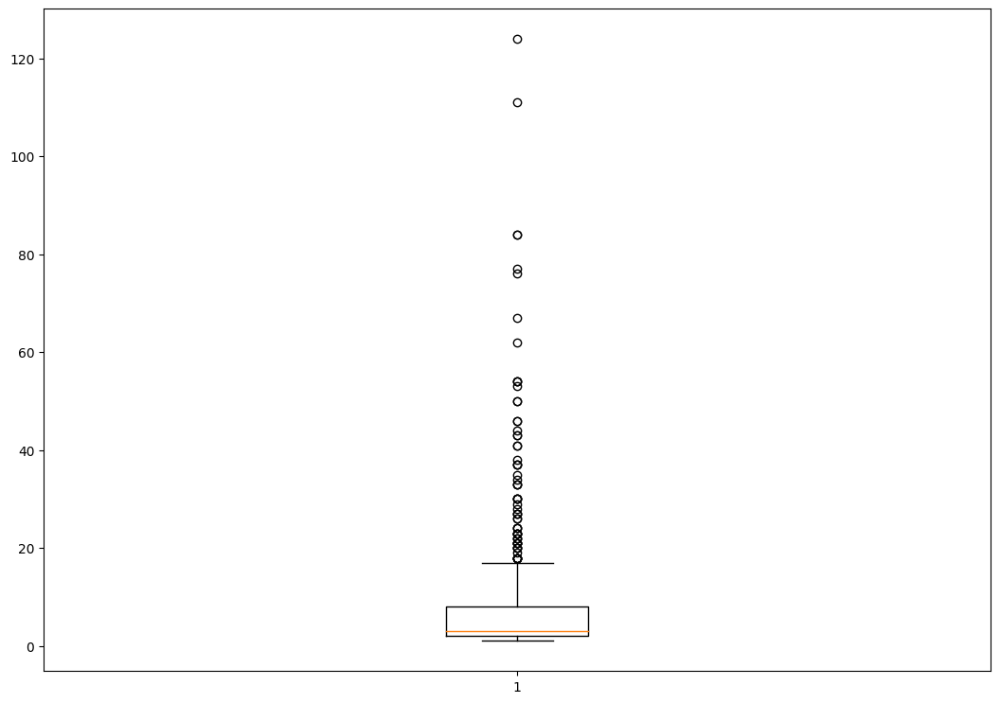

In [ ]:
plot_solution_spread(archive)


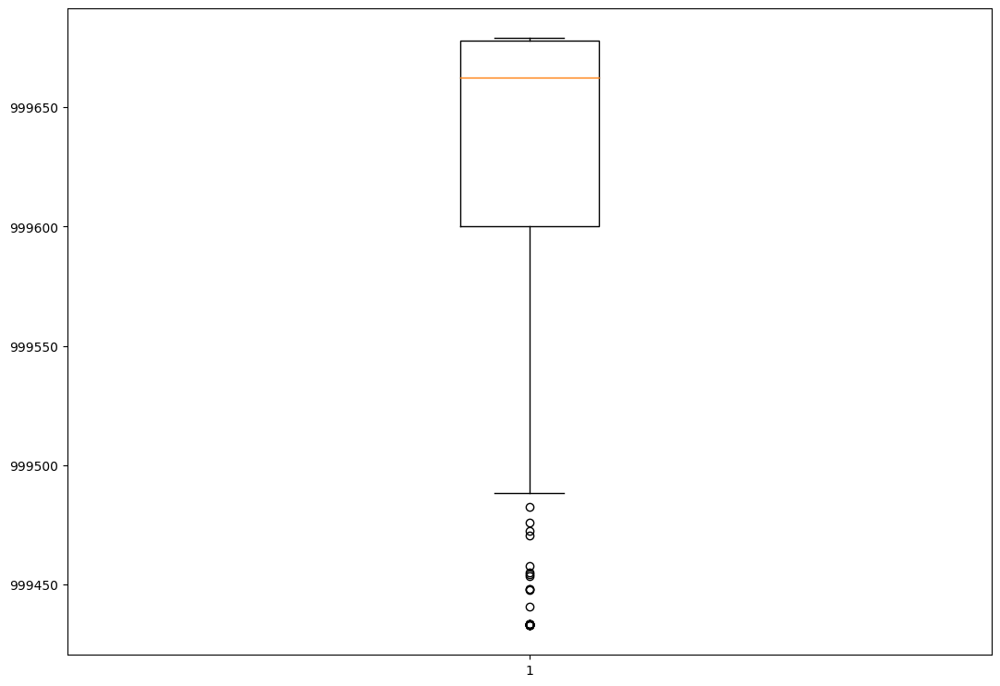

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.0003192424774169922
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 2.740144968032837
Iterations:   1%|          | 1/100 [00:24<39:41, 24.06s/it]archive training
time to add to som 0.015293121337890625
Iterations:   2%|▏         | 2/100 [00:42<34:10, 20.93s/it]archive training
time to add to som 0.02358698844909668
Iterations:   3%|▎         | 3/100 [01:02<33:06, 20.48s/it]archive training
time to add to som 0.01604294776916504
Iterations:   4%|▍         | 4/100 [01:23<32:46, 20.49s/it]archive training
time to add to som 0.019925355911254883
Iterations:   5%|▌         | 5/100 [01:42<31:39, 20.00s/it]archive training
time to add to som 0.019827842712402344
Iterations:   6%|▌         | 6/100 [02:01<30:44, 19.62s/it]archive training
time to add to som 0.029942989349365234
Iterations:   7%|▋         | 7/100 [02:21<30:40, 19.79s/it]archive training
time to add to som 0.018378257751464844
Iterations:   8%|▊         | 8

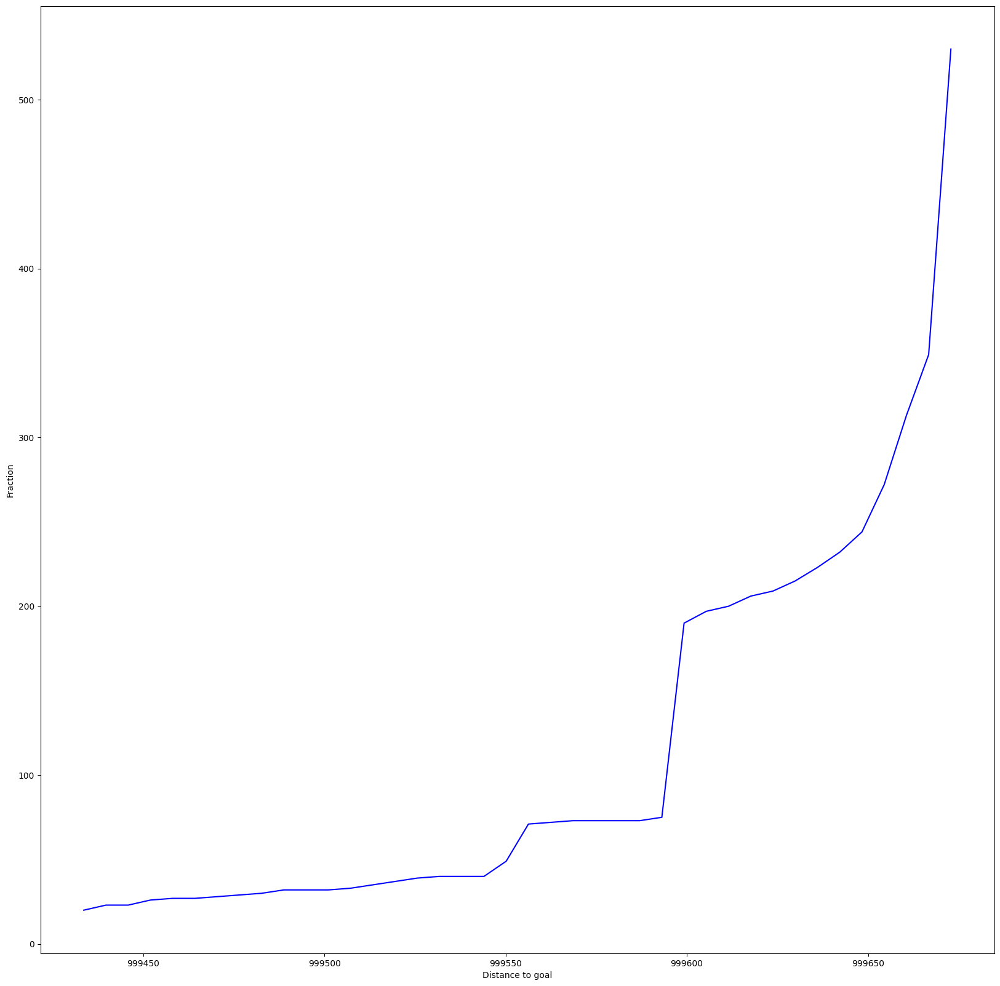

In [ ]:
plot_cumulative_distro_objective(archive)


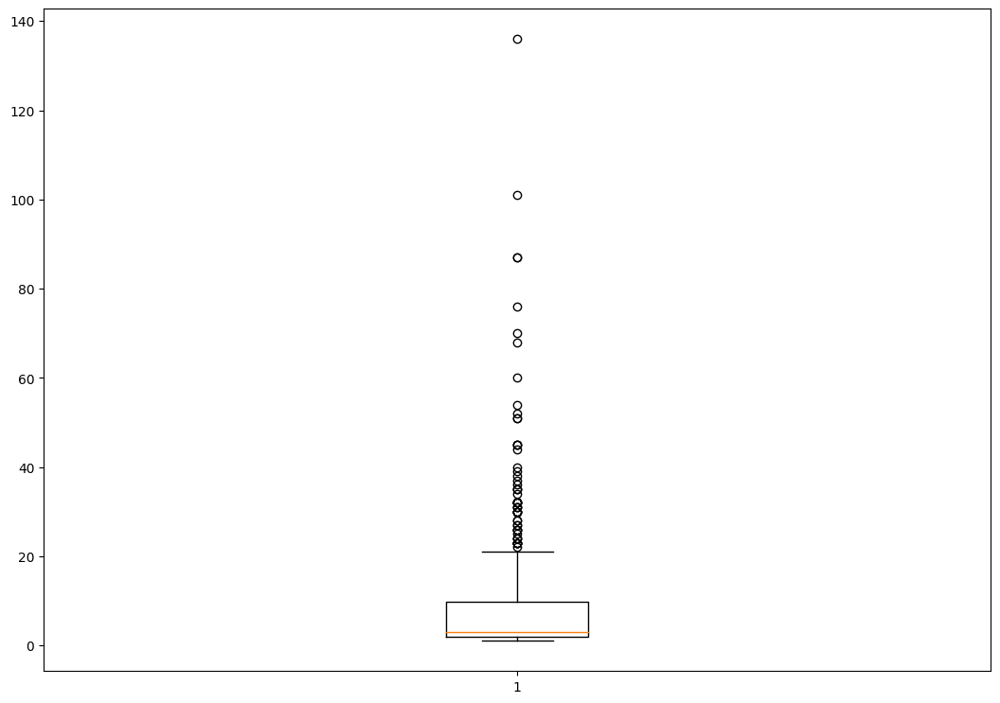

In [ ]:
plot_solution_spread(archive)

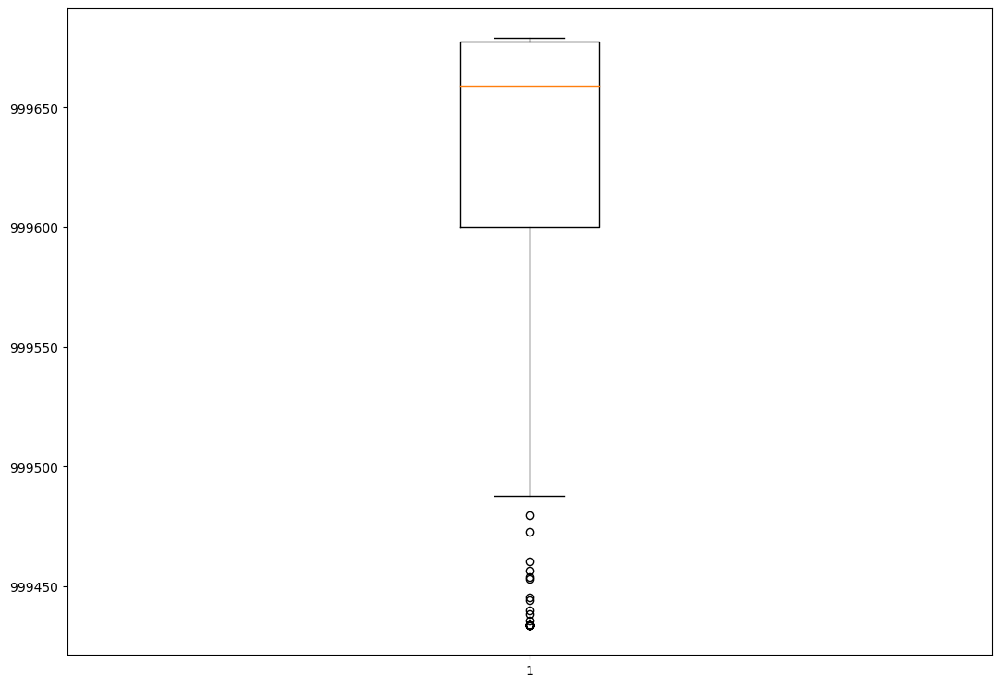

In [ ]:
plot_solution_distance(archive)

som multiplier double

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 2, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003952980041503906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.027675390243530273
Iterations:   1%|          | 1/100 [00:48<1:19:59, 48.48s/it]archive training
time to add to som 0.03612399101257324
Iterations:   2%|▏         | 2/100 [01:47<1:29:23, 54.73s/it]archive training
time to add to som 0.023471832275390625
Iterations:   3%|▎         | 3/100 [02:29<1:19:23, 49.11s/it]archive training
time to add to som 0.015481948852539062
Iterations:   4%|▍         | 4/100 [03:05<1:09:43, 43.58s/it]archive training
time to add to som 0.02959609031677246
Iterations:   5%|▌         | 5/100 [03:40<1:04:12, 40.55s/it]archive training
time to add to som 0.01587843894958496
Iterations:   6%|▌         | 6/100 [04:14<1:00:11, 38.42s/it]archive training
time to add to som 0.02801203727722168
Iterations:   7%|▋         | 7/100 [04:49<57:47, 37.28s/it]  archive training
time to add to som 0.022593021392822266
Iterations:   8

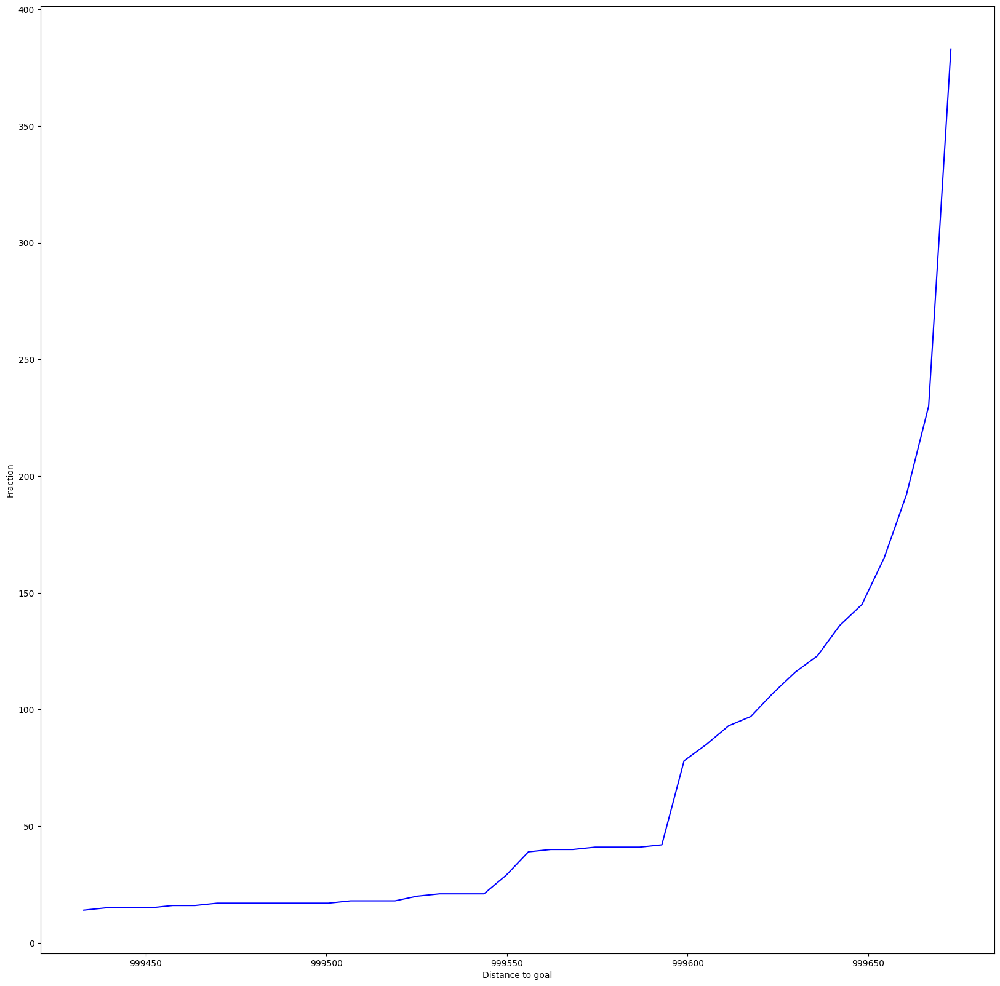

In [ ]:
plot_cumulative_distro_objective(archive)


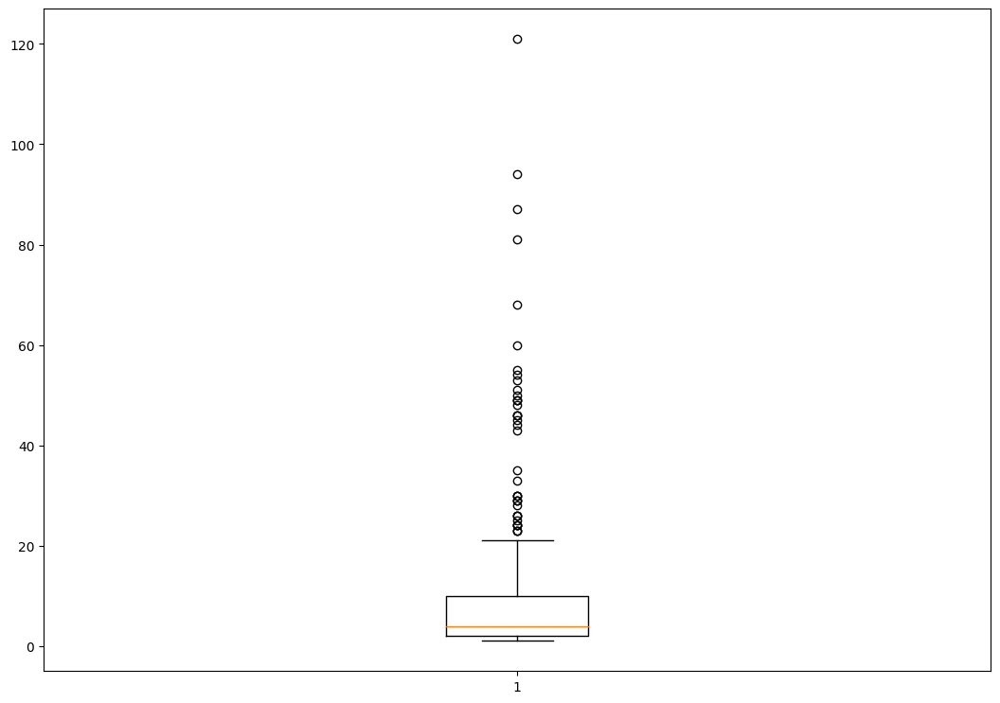

In [ ]:
plot_solution_spread(archive)


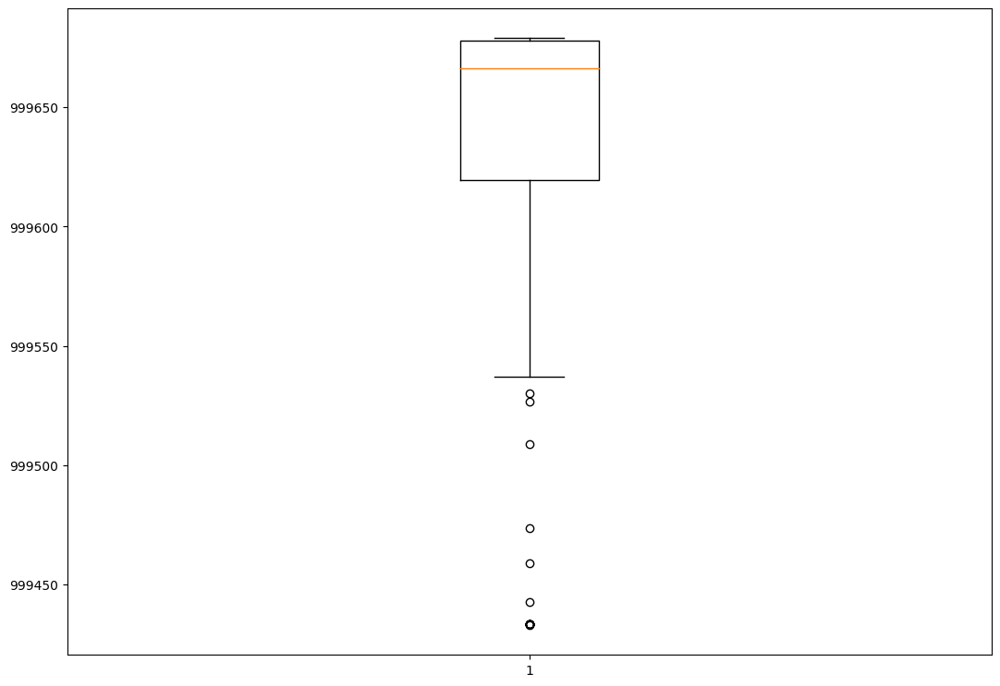

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 2, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003275871276855469
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.011420965194702148
Iterations:   1%|          | 1/100 [00:19<32:24, 19.64s/it]archive training
time to add to som 0.10579895973205566
Iterations:   2%|▏         | 2/100 [00:44<37:24, 22.90s/it]archive training
time to add to som 0.014075756072998047
Iterations:   3%|▎         | 3/100 [01:09<38:03, 23.54s/it]archive training
time to add to som 0.02255392074584961
Iterations:   4%|▍         | 4/100 [01:29<35:34, 22.23s/it]archive training
time to add to som 0.01807403564453125
Iterations:   5%|▌         | 5/100 [01:49<34:03, 21.51s/it]archive training
time to add to som 0.01848149299621582
Iterations:   6%|▌         | 6/100 [02:08<32:33, 20.78s/it]archive training
time to add to som 0.020199298858642578
Iterations:   7%|▋         | 7/100 [02:28<31:28, 20.30s/it]archive training
time to add to som 0.016917943954467773
Iterations:   8%|▊         | 

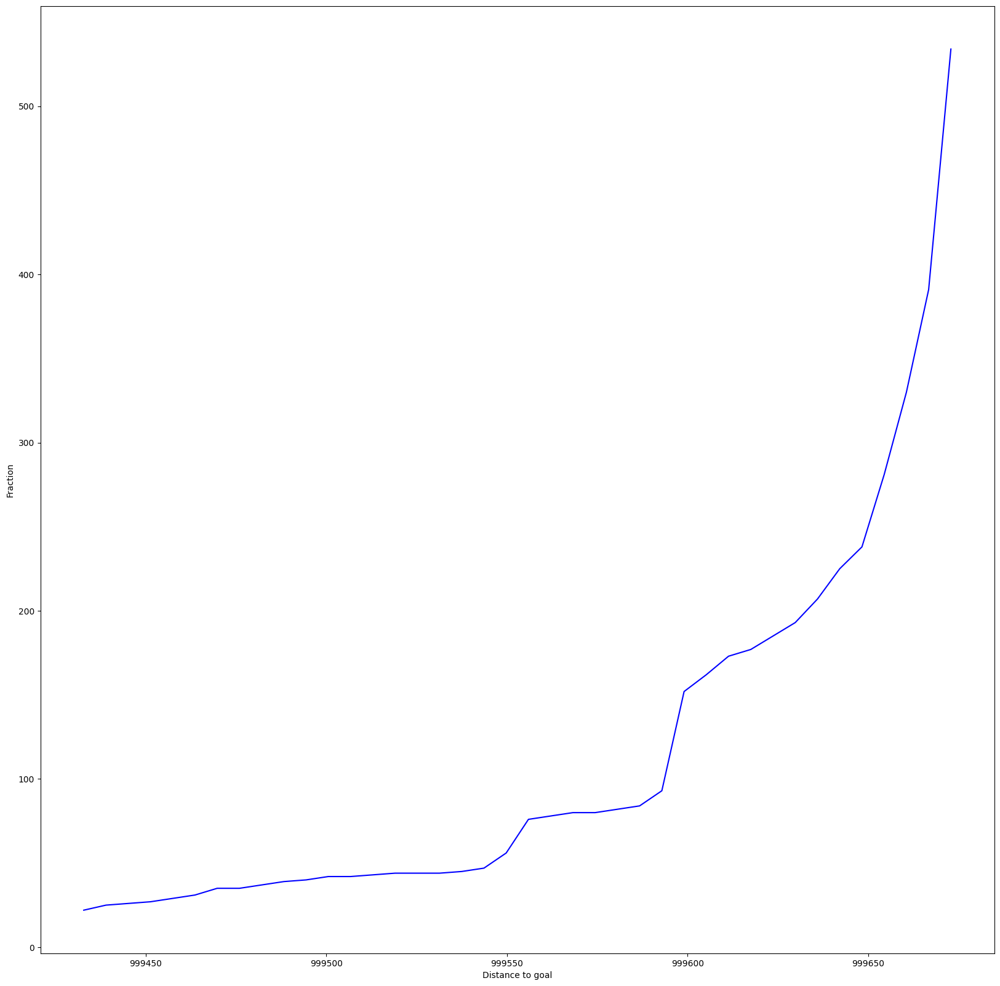

In [ ]:
plot_cumulative_distro_objective(archive)


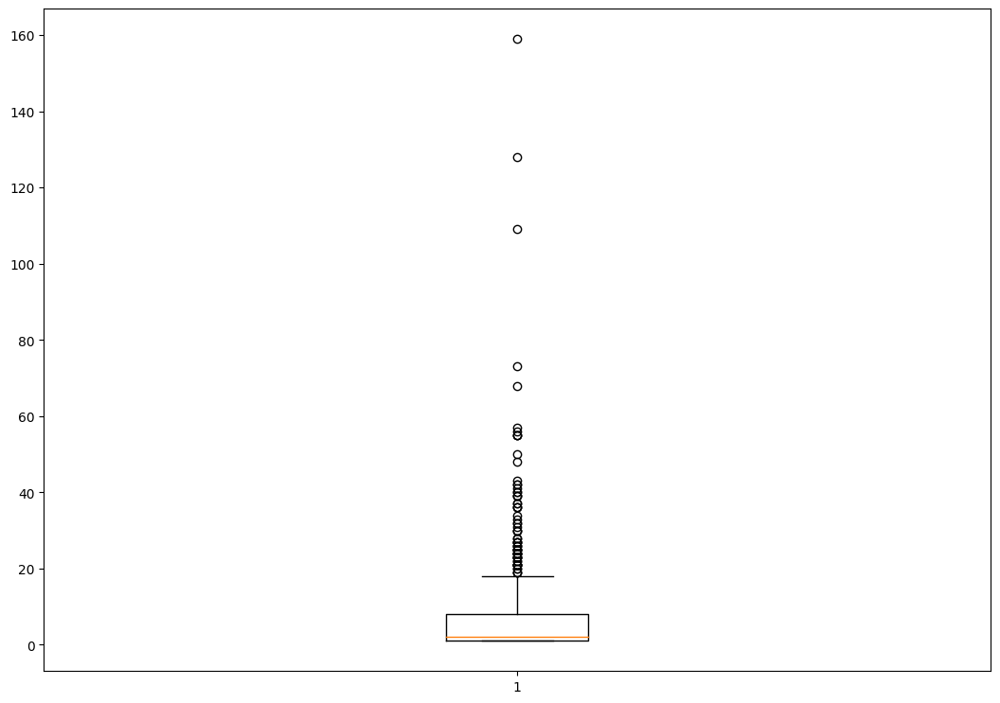

In [ ]:
plot_solution_spread(archive)


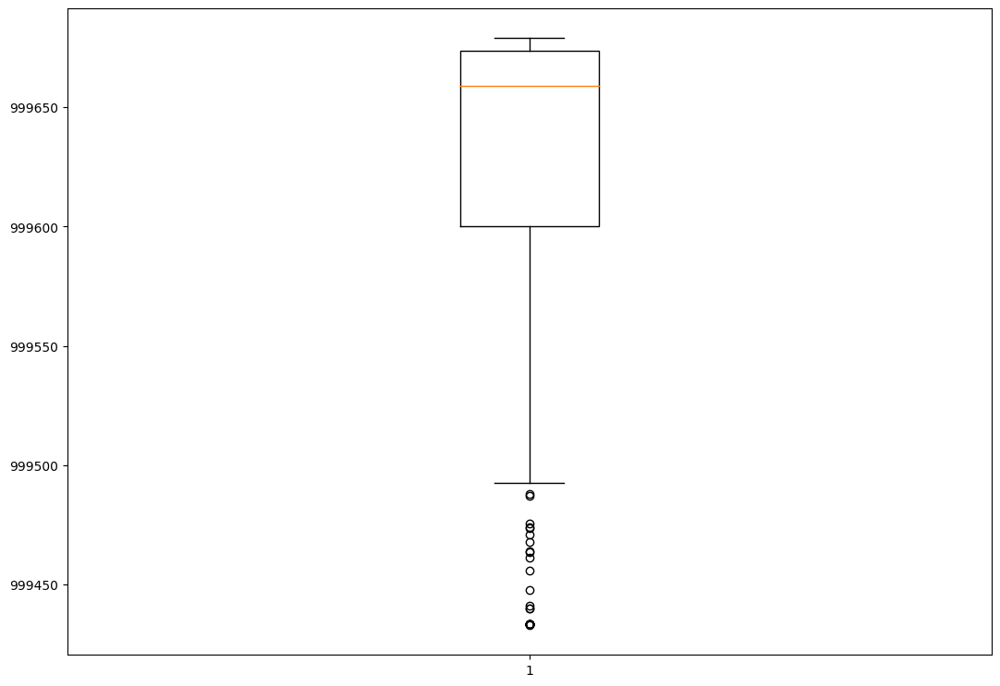

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 2, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0078012943267822266
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01735687255859375
Iterations:   1%|          | 1/100 [00:48<1:19:38, 48.27s/it]archive training
time to add to som 0.022757530212402344
Iterations:   2%|▏         | 2/100 [01:23<1:06:00, 40.42s/it]archive training
time to add to som 0.014302968978881836
Iterations:   3%|▎         | 3/100 [01:56<1:00:11, 37.23s/it]archive training
time to add to som 0.017642736434936523
Iterations:   4%|▍         | 4/100 [02:29<57:00, 35.63s/it]  archive training
time to add to som 0.015848398208618164
Iterations:   5%|▌         | 5/100 [03:02<54:53, 34.67s/it]archive training
time to add to som 0.01608419418334961
Iterations:   6%|▌         | 6/100 [03:35<53:24, 34.09s/it]archive training
time to add to som 0.022527456283569336
Iterations:   7%|▋         | 7/100 [04:10<52:59, 34.19s/it]archive training
time to add to som 0.01625347137451172
Iterations:   8%|▊  

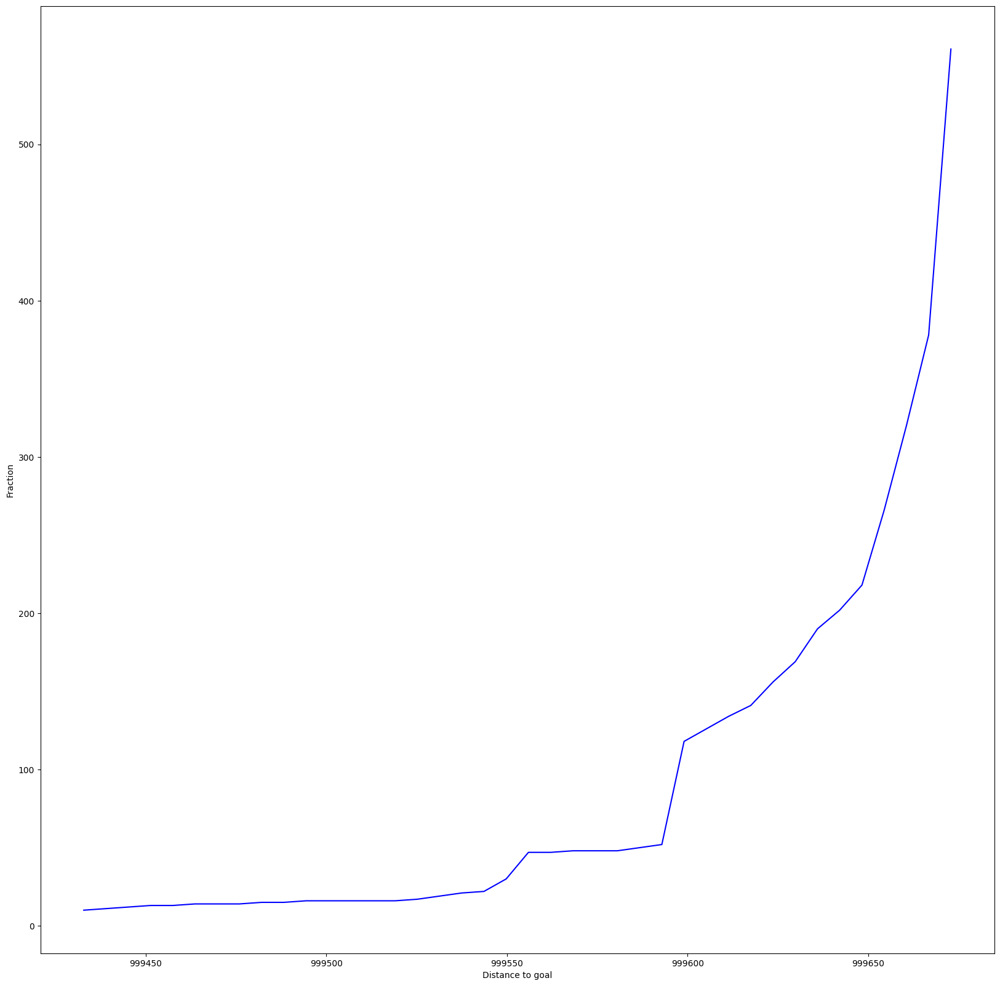

In [ ]:
plot_cumulative_distro_objective(archive)

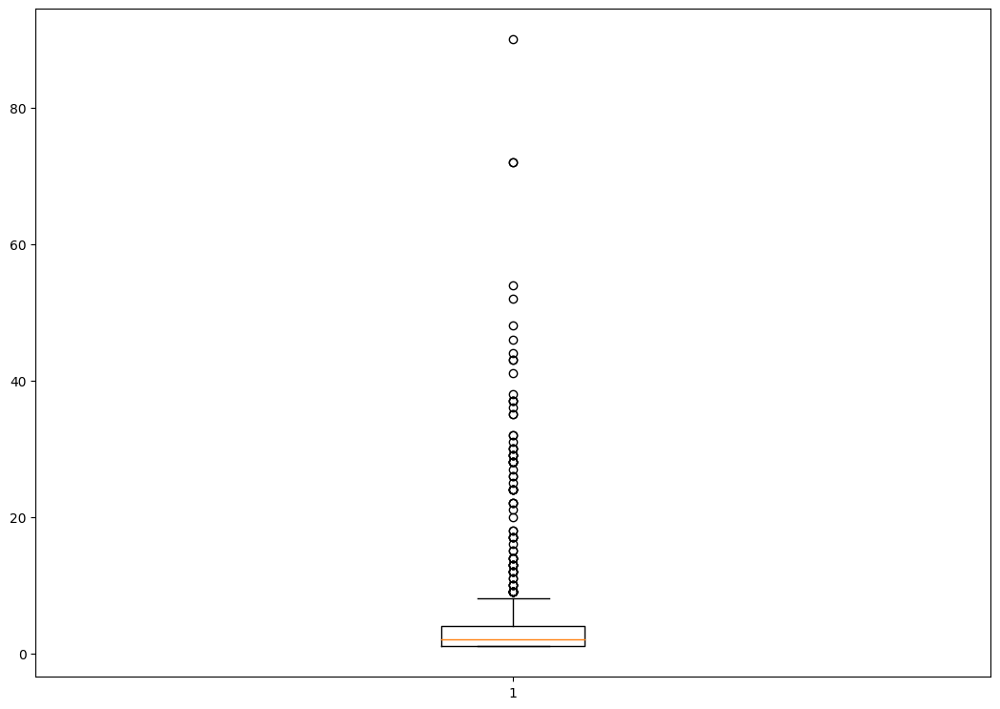

In [ ]:
plot_solution_spread(archive)

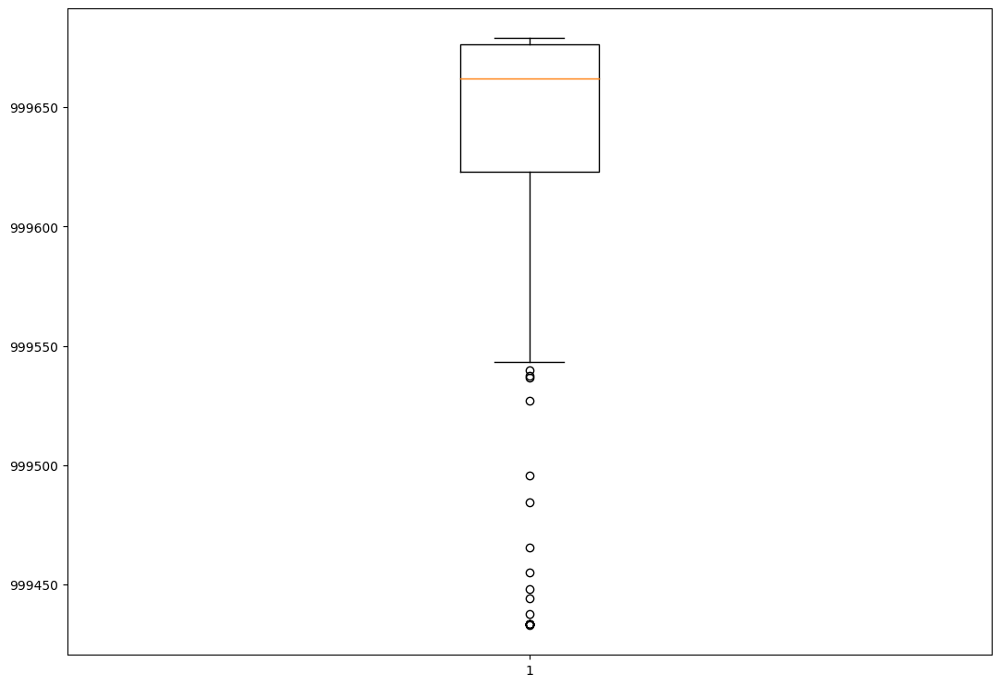

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 2, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0007061958312988281
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012522220611572266
Iterations:   1%|          | 1/100 [00:34<56:40, 34.35s/it]archive training
time to add to som 0.01663517951965332
Iterations:   2%|▏         | 2/100 [01:06<54:27, 33.34s/it]archive training
time to add to som 0.02075505256652832
Iterations:   3%|▎         | 3/100 [01:39<53:27, 33.07s/it]archive training
time to add to som 0.02482295036315918
Iterations:   4%|▍         | 4/100 [02:13<53:03, 33.16s/it]archive training
time to add to som 0.02512073516845703
Iterations:   5%|▌         | 5/100 [02:46<52:54, 33.42s/it]archive training
time to add to som 0.01834845542907715
Iterations:   6%|▌         | 6/100 [03:20<52:22, 33.43s/it]archive training
time to add to som 0.020485401153564453
Iterations:   7%|▋         | 7/100 [03:53<51:44, 33.38s/it]archive training
time to add to som 0.020329713821411133
Iterations:   8%|▊         | 8

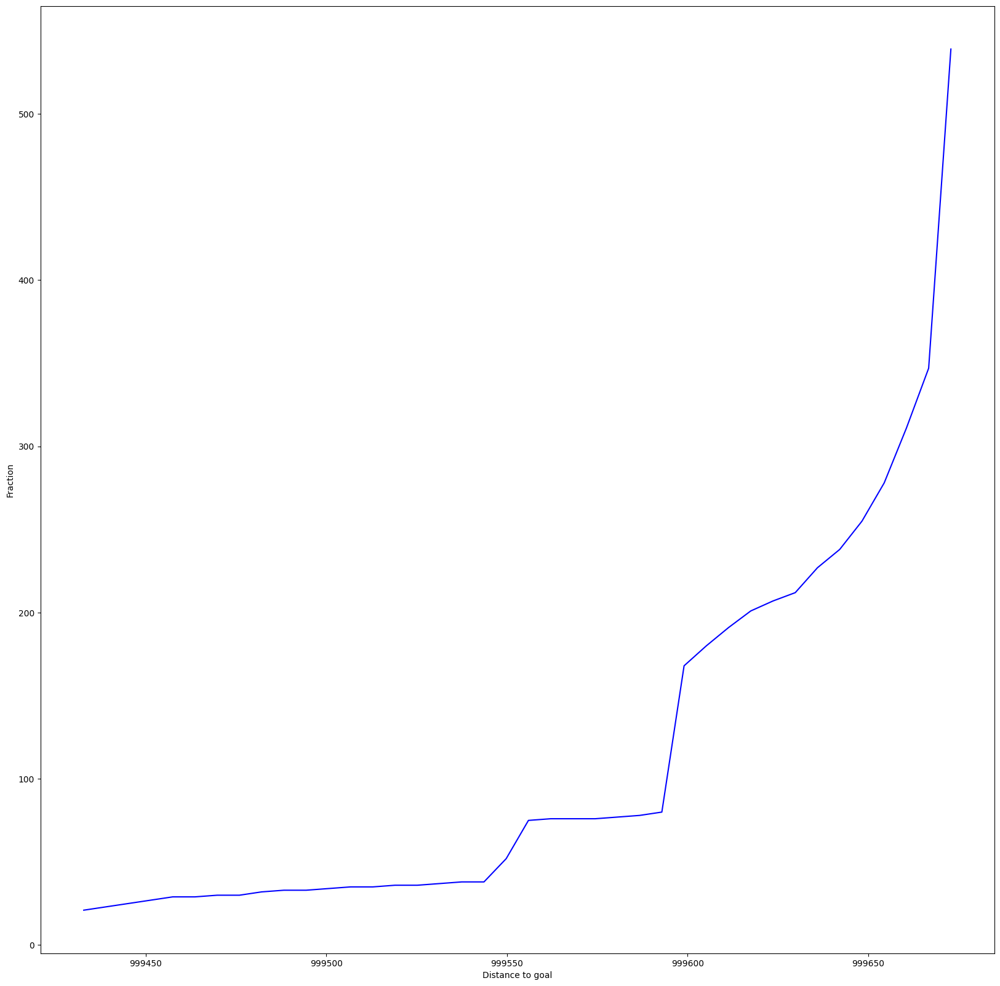

In [ ]:
plot_cumulative_distro_objective(archive)

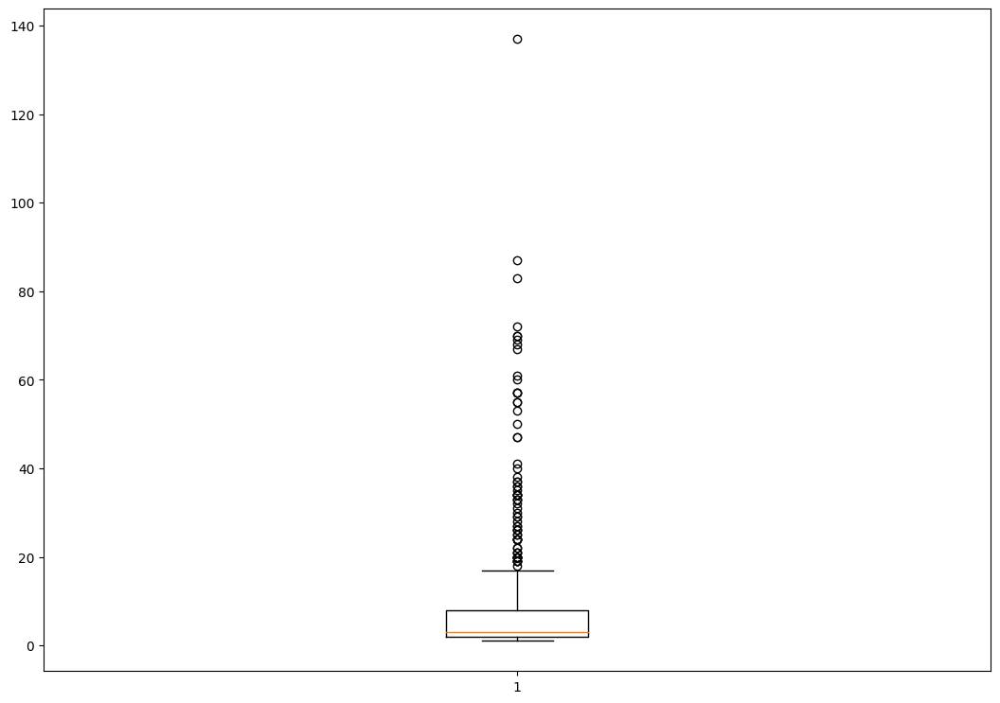

In [ ]:
plot_solution_spread(archive)

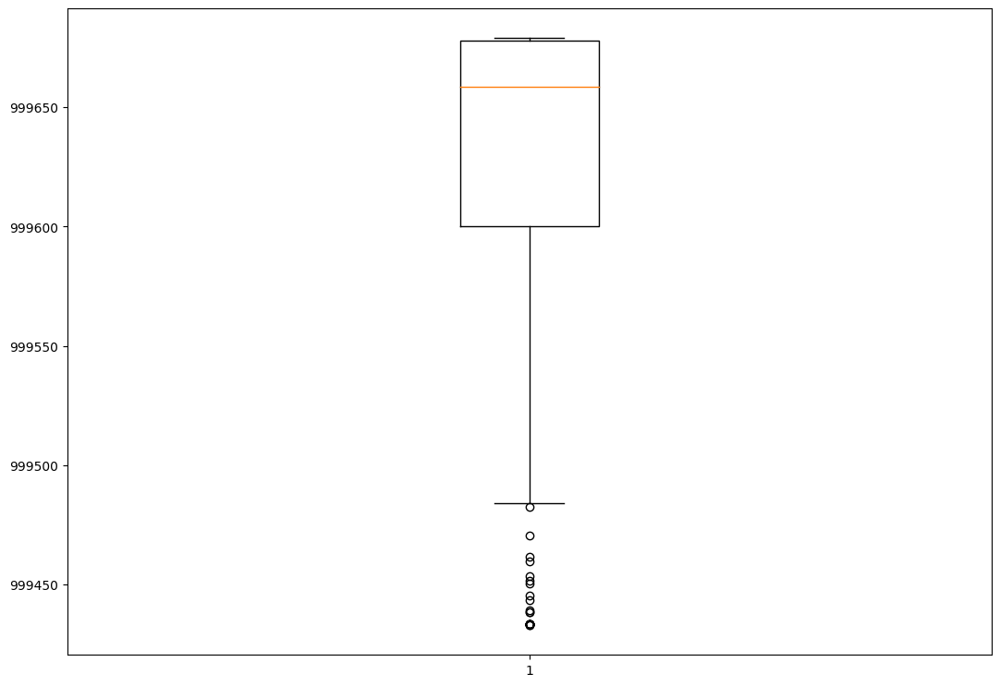

In [ ]:
plot_solution_distance(archive)

######*11.1.3 50d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze3", dim=50)

extra time to initialize archive 68.05777907371521
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.037667036056518555
Iterations:   1%|          | 1/100 [00:23<39:23, 23.88s/it]archive training
time to add to cvt 0.03005838394165039
Iterations:   2%|▏         | 2/100 [00:48<39:38, 24.27s/it]archive training
time to add to cvt 0.028702259063720703
Iterations:   3%|▎         | 3/100 [01:13<39:53, 24.68s/it]archive training
time to add to cvt 0.028662443161010742
Iterations:   4%|▍         | 4/100 [01:37<39:18, 24.56s/it]archive training
time to add to cvt 0.02823162078857422
Iterations:   5%|▌         | 5/100 [02:03<39:27, 24.92s/it]archive training
time to add to cvt 0.036093950271606445
Iterations:   6%|▌         | 6/100 [02:29<39:20, 25.11s/it]archive training
time to add to cvt 0.030937910079956055
Iterations:   7%|▋         | 7/100 [02:53<38:21, 24.75s/it]archive training
time to add to cvt 0.037345170974731445
Iterations:   8%|▊         | 8/

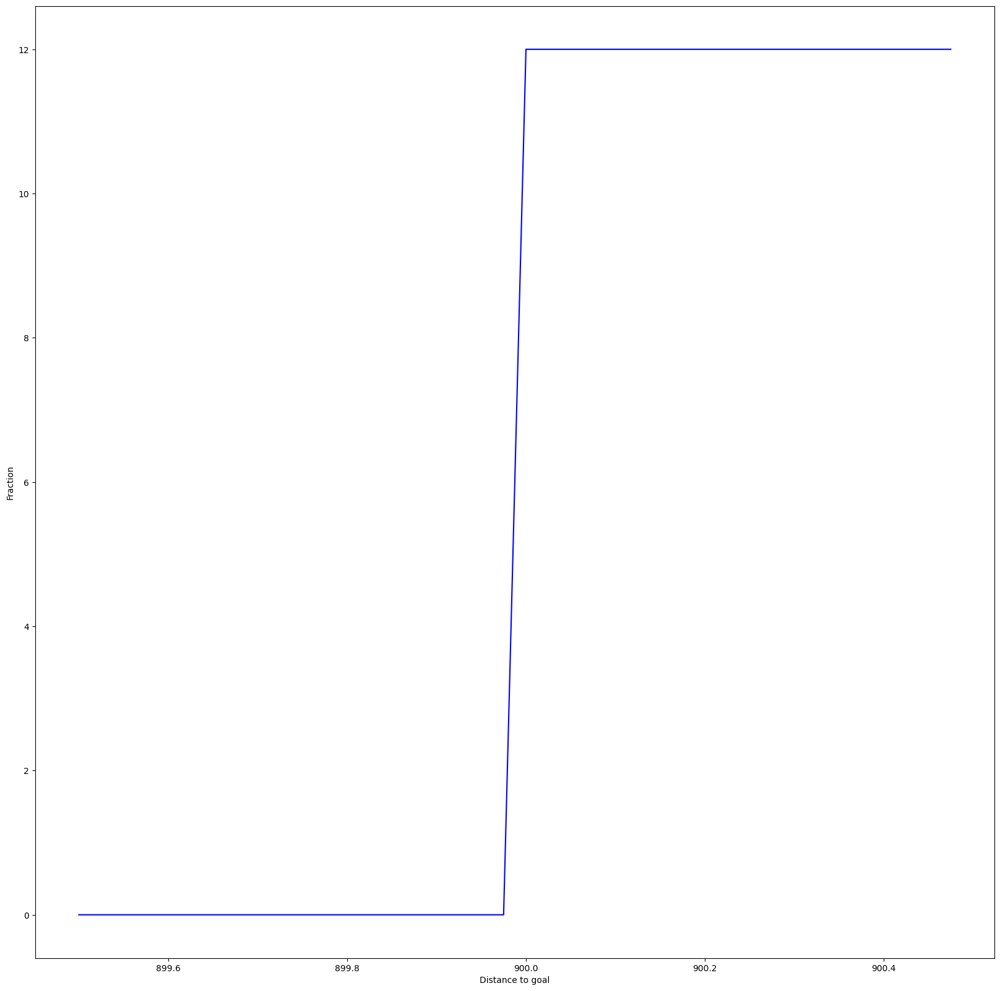

In [ ]:
plot_cumulative_distro_objective(archive)

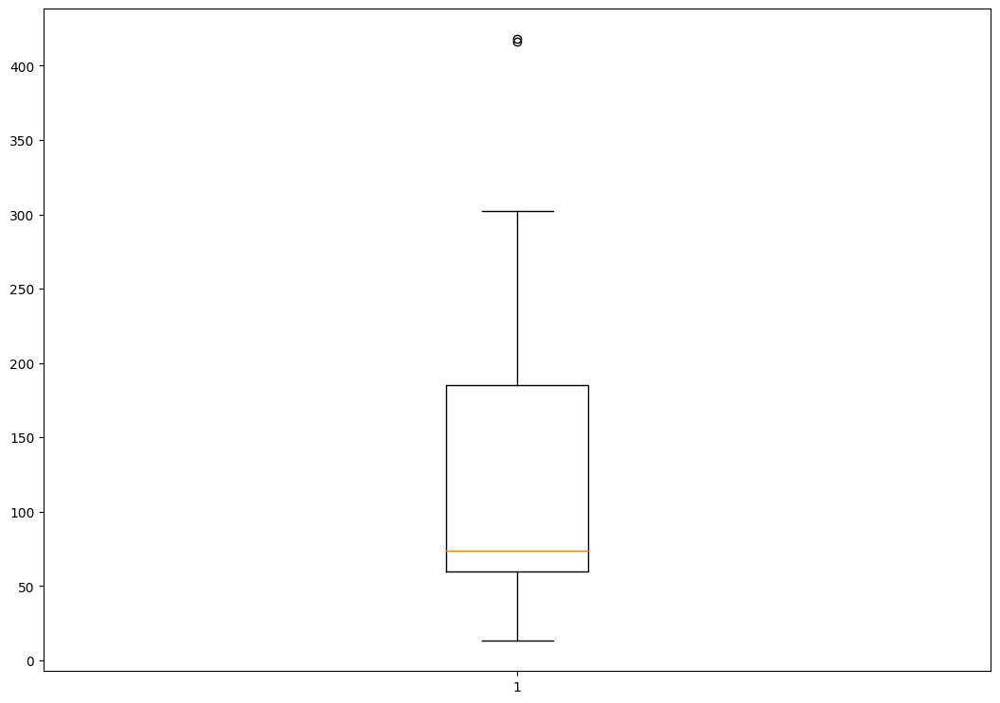

In [ ]:
plot_solution_spread(archive)

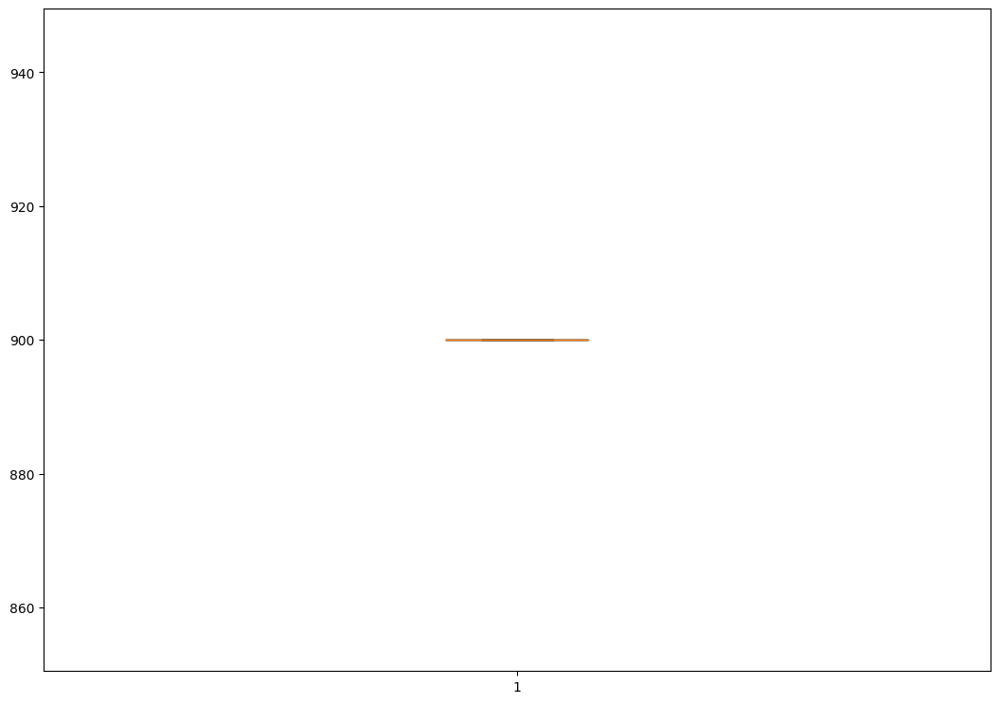

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 50)

extra time to initialize archive 0.0007085800170898438
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.013683557510375977
Iterations:   1%|          | 1/100 [00:36<59:38, 36.14s/it]archive training
time to add to som 0.02292919158935547
Iterations:   2%|▏         | 2/100 [01:27<1:13:13, 44.83s/it]archive training
time to add to som 0.01771378517150879
Iterations:   3%|▎         | 3/100 [02:03<1:05:57, 40.79s/it]archive training
time to add to som 0.020522594451904297
Iterations:   4%|▍         | 4/100 [02:37<1:01:32, 38.47s/it]archive training
time to add to som 0.03233623504638672
Iterations:   5%|▌         | 5/100 [03:13<59:14, 37.41s/it]  archive training
time to add to som 0.027354717254638672
Iterations:   6%|▌         | 6/100 [03:49<57:46, 36.88s/it]archive training
time to add to som 0.023520469665527344
Iterations:   7%|▋         | 7/100 [04:24<56:12, 36.26s/it]archive training
time to add to som 0.02525162696838379
Iterations:   8%|▊   

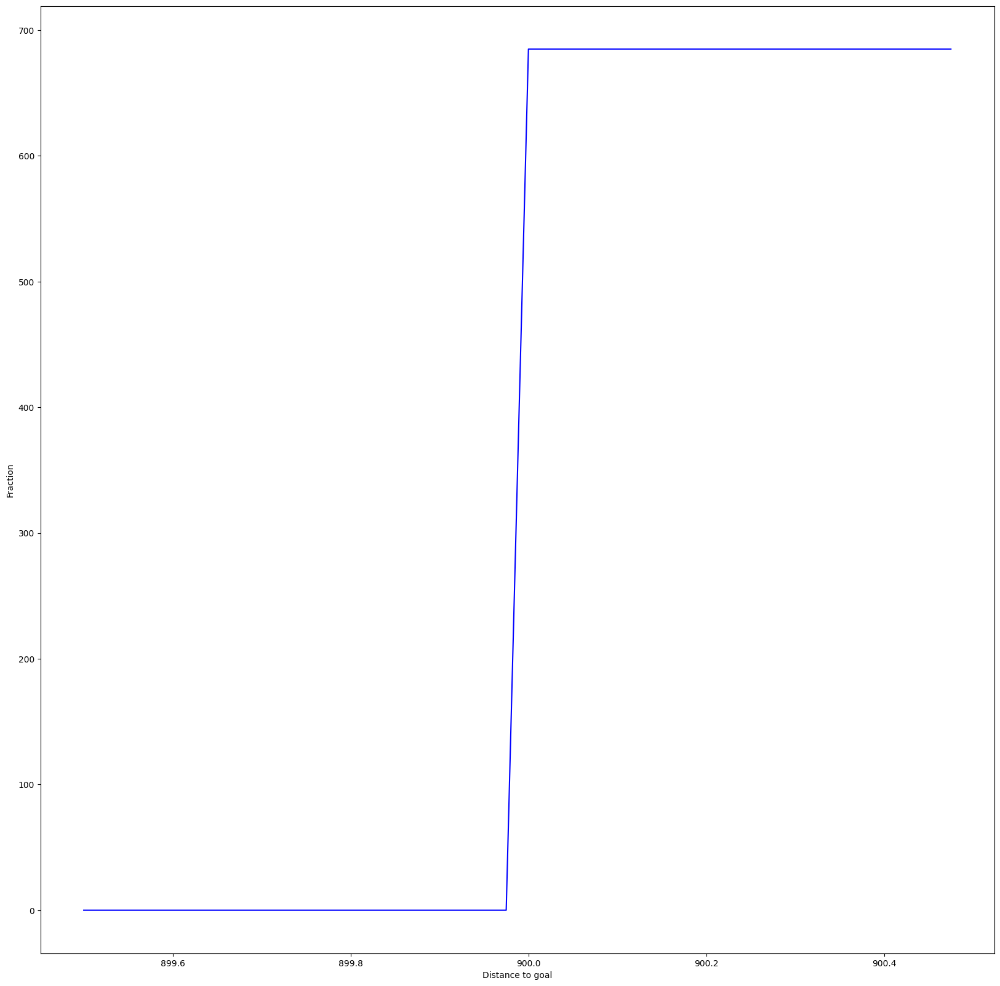

In [ ]:
plot_cumulative_distro_objective(archive)


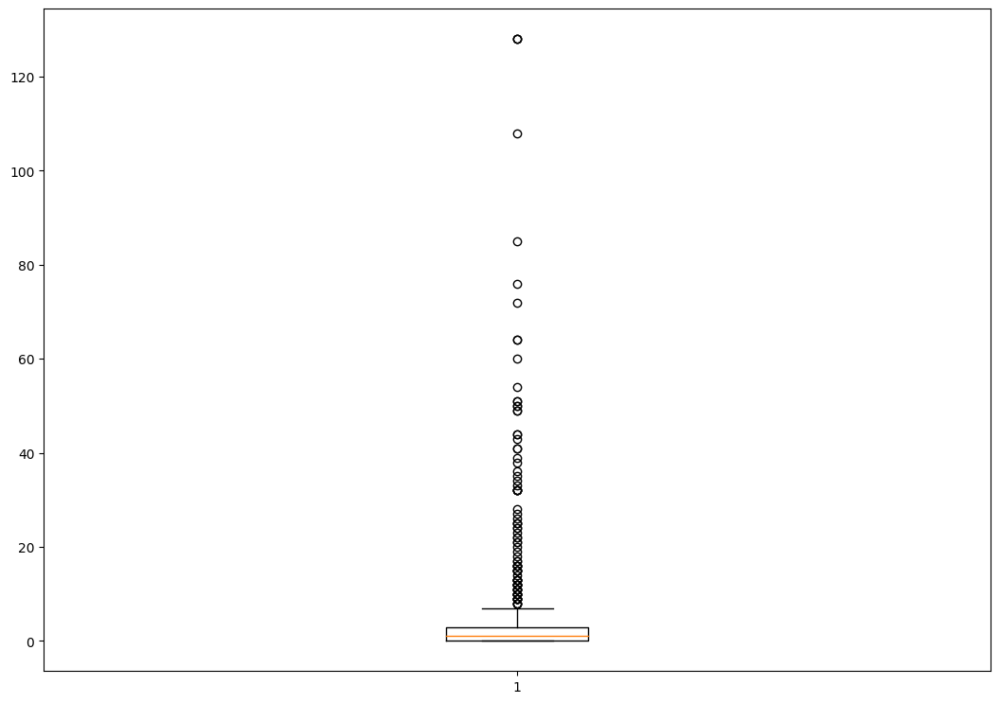

In [ ]:
plot_solution_spread(archive)


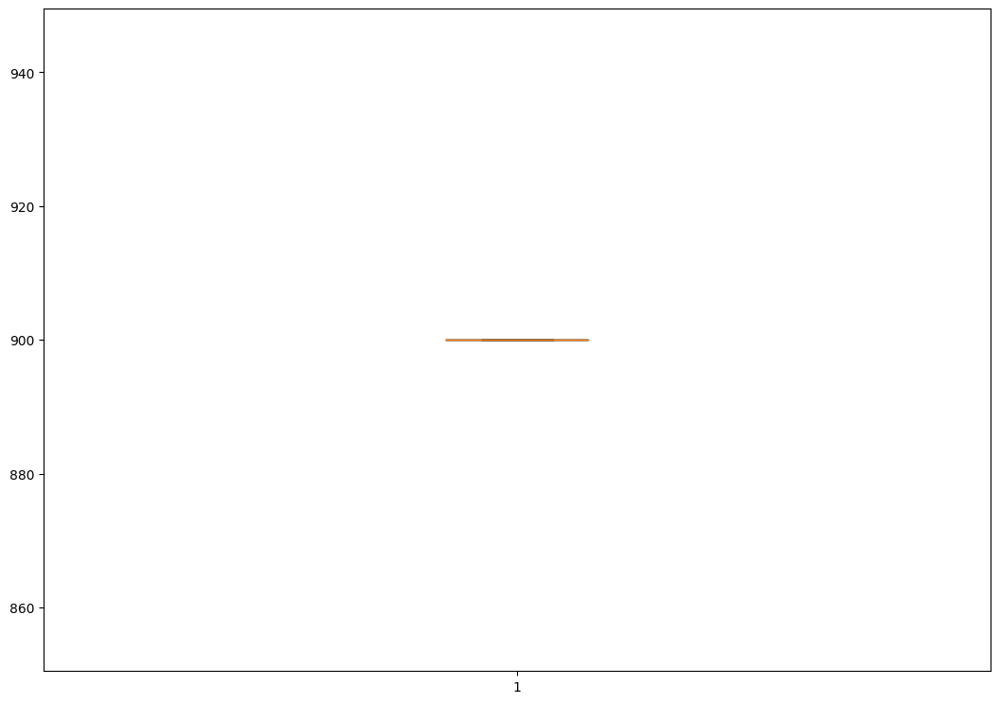

In [ ]:
plot_solution_distance(archive)

high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.0008027553558349609
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014206409454345703
Iterations:   1%|          | 1/100 [00:18<30:49, 18.68s/it]archive training
time to add to som 0.017586708068847656
Iterations:   2%|▏         | 2/100 [00:37<30:56, 18.94s/it]archive training
time to add to som 0.023667573928833008
Iterations:   3%|▎         | 3/100 [00:57<31:01, 19.20s/it]archive training
time to add to som 0.019042491912841797
Iterations:   4%|▍         | 4/100 [01:17<31:12, 19.50s/it]archive training
time to add to som 0.020517826080322266
Iterations:   5%|▌         | 5/100 [01:36<30:35, 19.33s/it]archive training
time to add to som 0.023976564407348633
Iterations:   6%|▌         | 6/100 [01:55<30:08, 19.24s/it]archive training
time to add to som 0.0314488410949707
Iterations:   7%|▋         | 7/100 [02:15<30:11, 19.47s/it]archive training
time to add to som 0.023128032684326172
Iterations:   8%|▊         

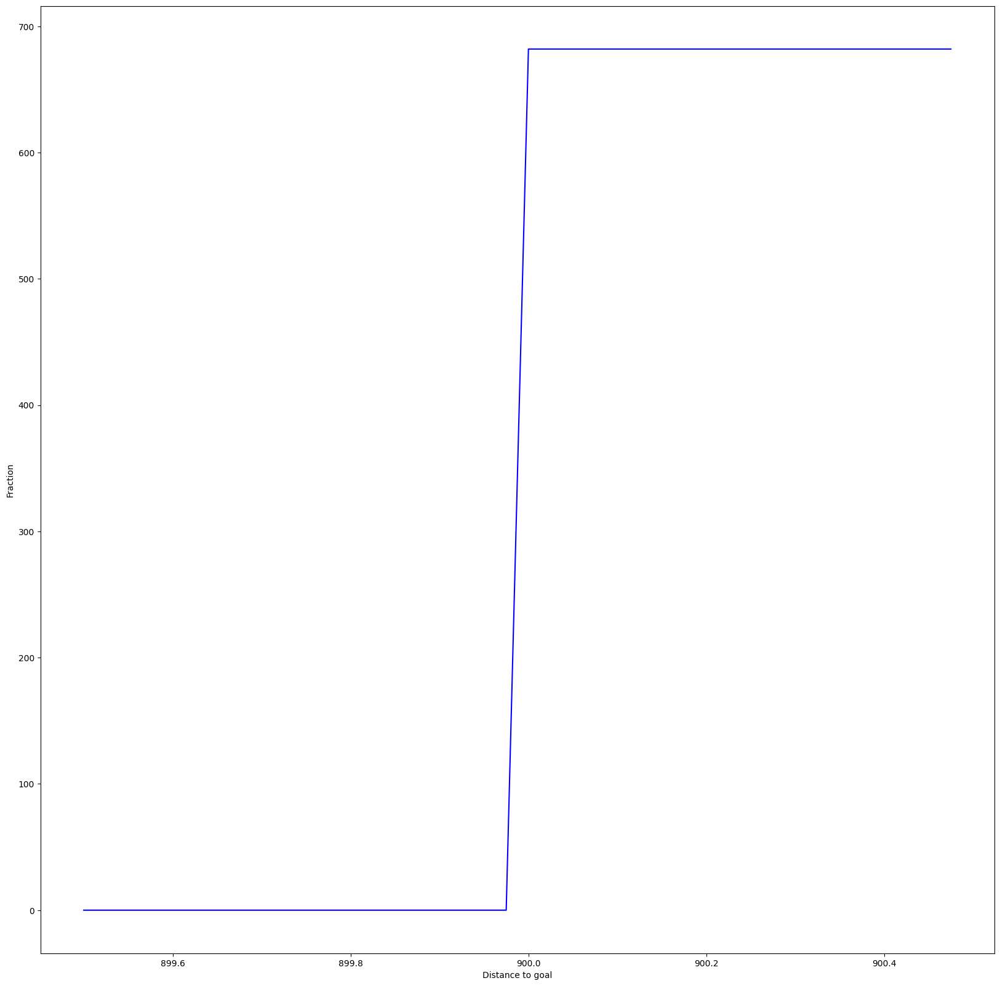

In [ ]:
plot_cumulative_distro_objective(archive)


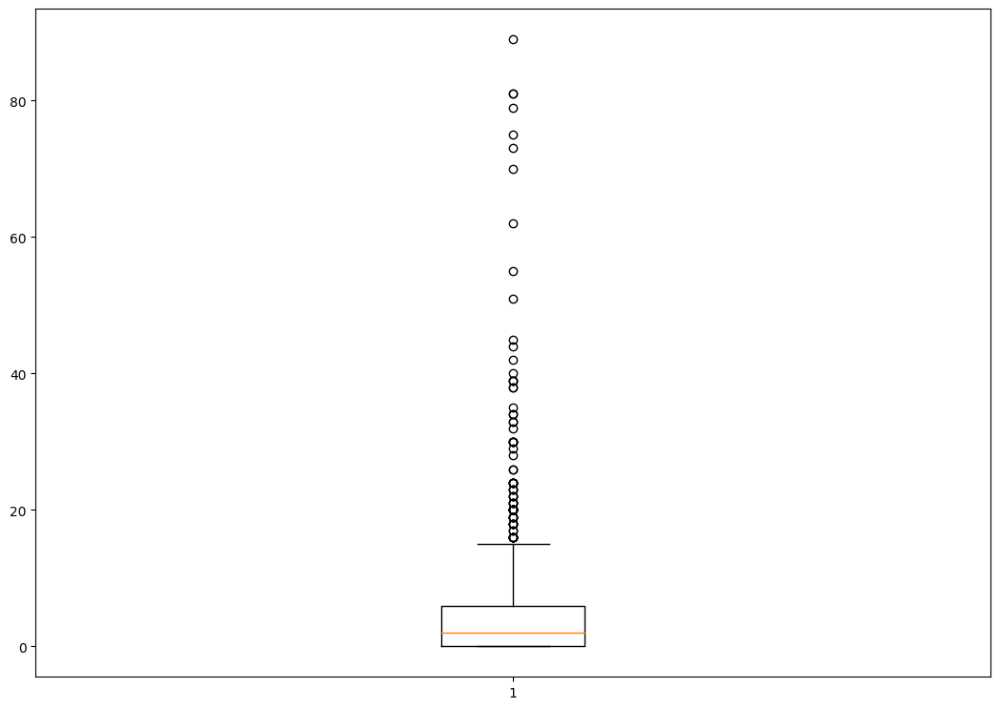

In [ ]:
plot_solution_spread(archive)

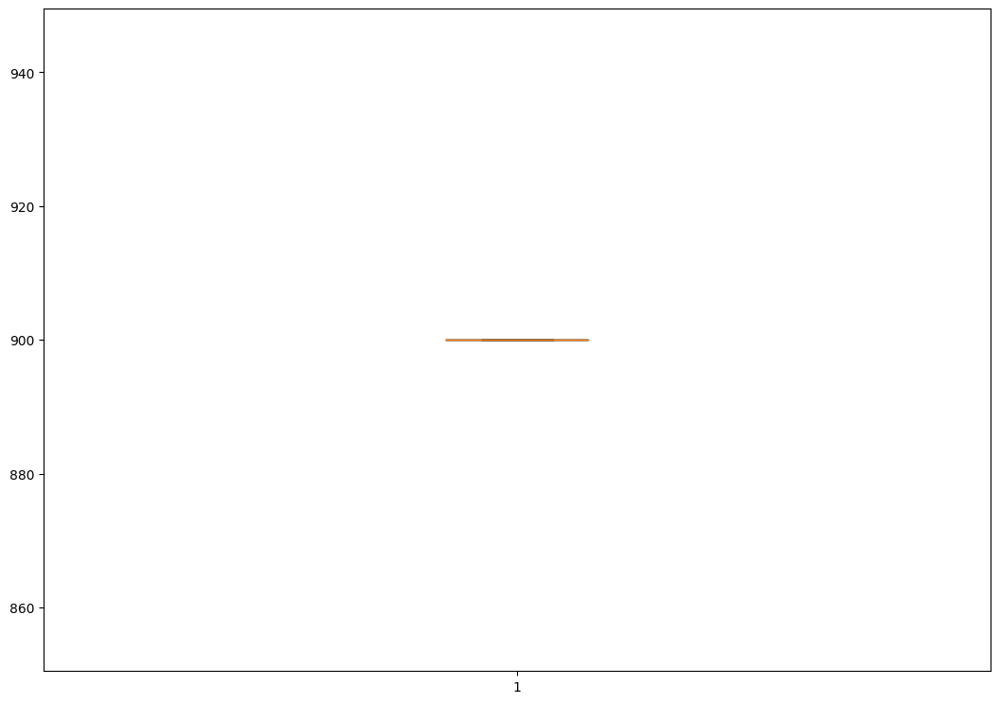

In [ ]:
plot_solution_distance(archive)

double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.000827789306640625
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.02100229263305664
Iterations:   1%|          | 1/100 [00:33<55:58, 33.93s/it]archive training
time to add to som 0.014127731323242188
Iterations:   2%|▏         | 2/100 [01:08<56:08, 34.38s/it]archive training
time to add to som 0.018066883087158203
Iterations:   3%|▎         | 3/100 [01:42<55:00, 34.02s/it]archive training
time to add to som 0.017229795455932617
Iterations:   4%|▍         | 4/100 [02:17<55:00, 34.38s/it]archive training
time to add to som 0.01616835594177246
Iterations:   5%|▌         | 5/100 [02:50<53:49, 33.99s/it]archive training
time to add to som 0.05843520164489746
Iterations:   6%|▌         | 6/100 [03:29<56:10, 35.86s/it]archive training
time to add to som 0.028113603591918945
Iterations:   7%|▋         | 7/100 [04:09<57:42, 37.23s/it]archive training
time to add to som 0.019446372985839844
Iterations:   8%|▊         | 

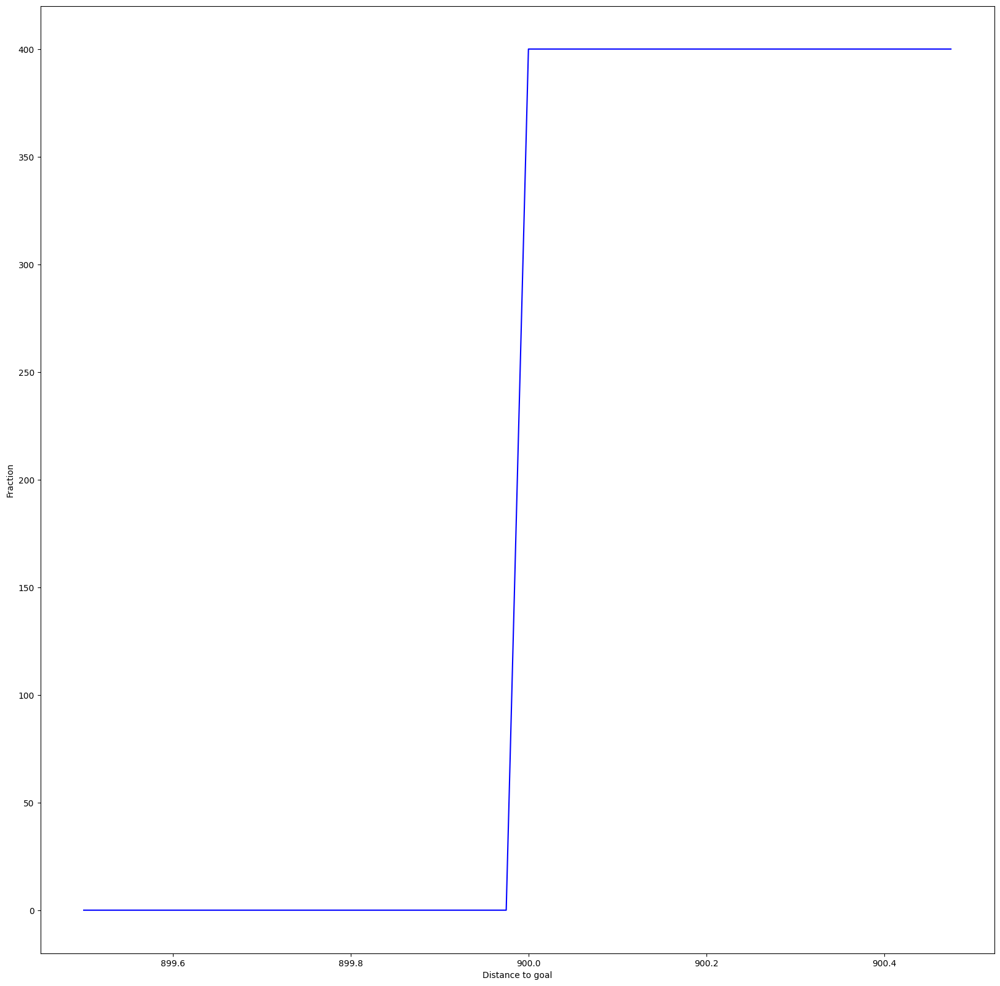

In [ ]:
plot_cumulative_distro_objective(archive)


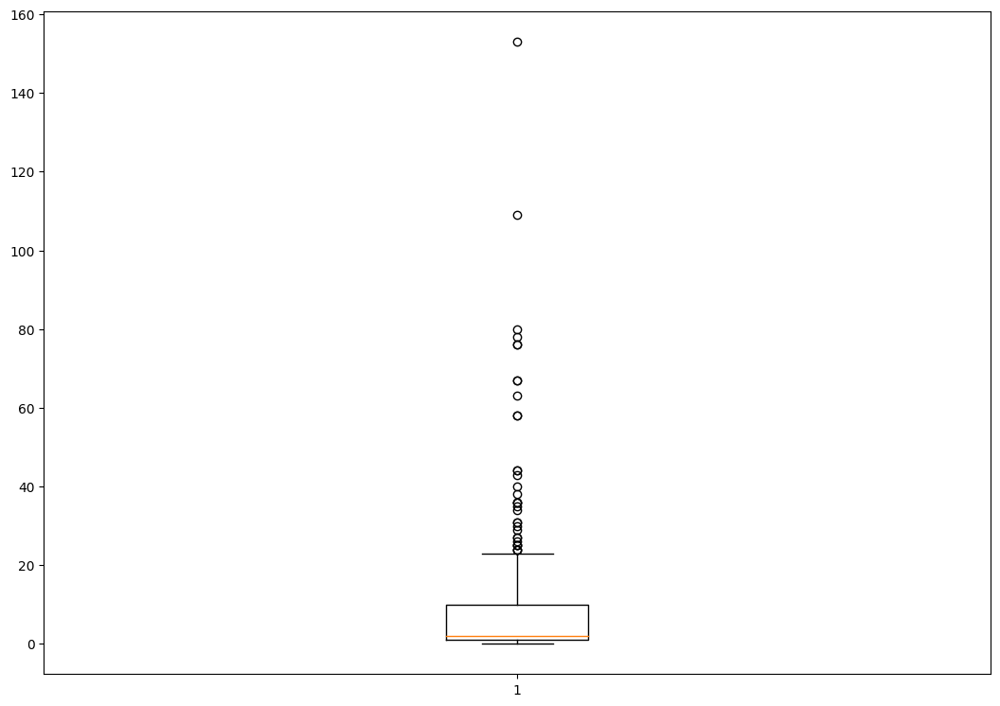

In [ ]:
plot_solution_spread(archive)


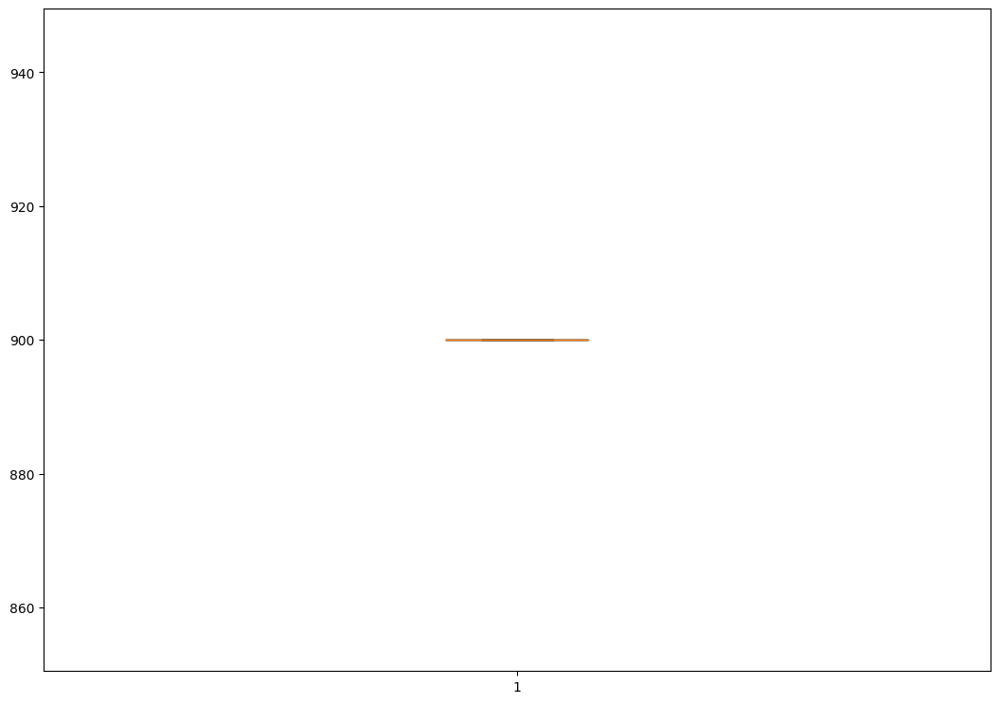

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003535747528076172
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.013864994049072266
Iterations:   1%|          | 1/100 [00:19<32:09, 19.49s/it]archive training
time to add to som 0.01578974723815918
Iterations:   2%|▏         | 2/100 [00:39<32:07, 19.67s/it]archive training
time to add to som 0.01630878448486328
Iterations:   3%|▎         | 3/100 [01:00<32:48, 20.30s/it]archive training
time to add to som 0.01749110221862793
Iterations:   4%|▍         | 4/100 [01:20<32:10, 20.11s/it]archive training
time to add to som 0.0190277099609375
Iterations:   5%|▌         | 5/100 [01:39<31:34, 19.95s/it]archive training
time to add to som 0.033080101013183594
Iterations:   6%|▌         | 6/100 [02:00<31:50, 20.33s/it]archive training
time to add to som 0.021503925323486328
Iterations:   7%|▋         | 7/100 [02:20<31:16, 20.17s/it]archive training
time to add to som 0.021215200424194336
Iterations:   8%|▊         | 8

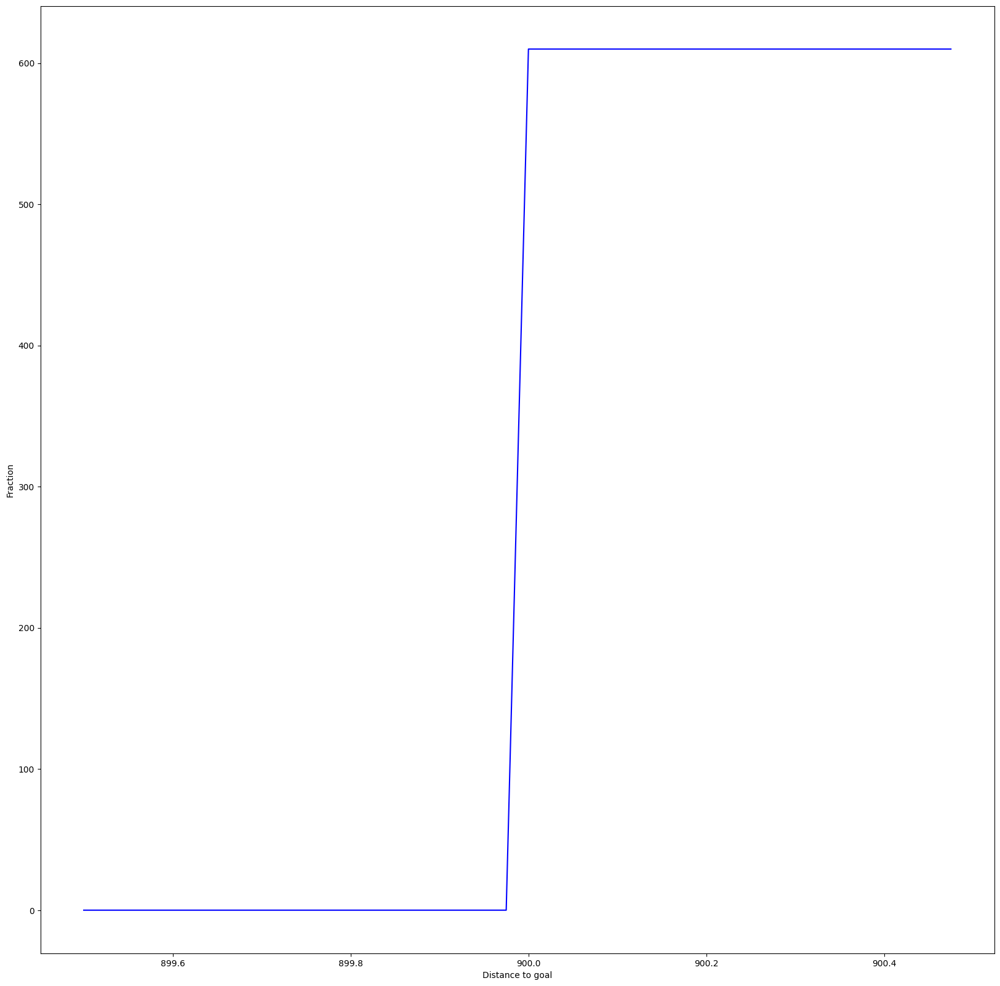

In [ ]:
plot_cumulative_distro_objective(archive)


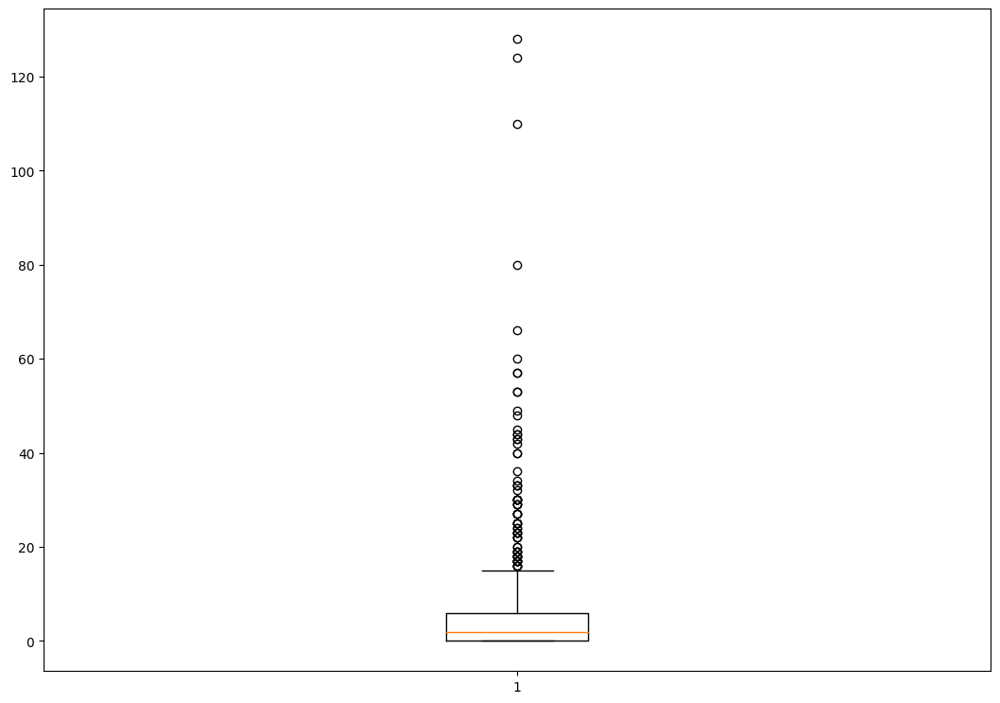

In [ ]:
plot_solution_spread(archive)


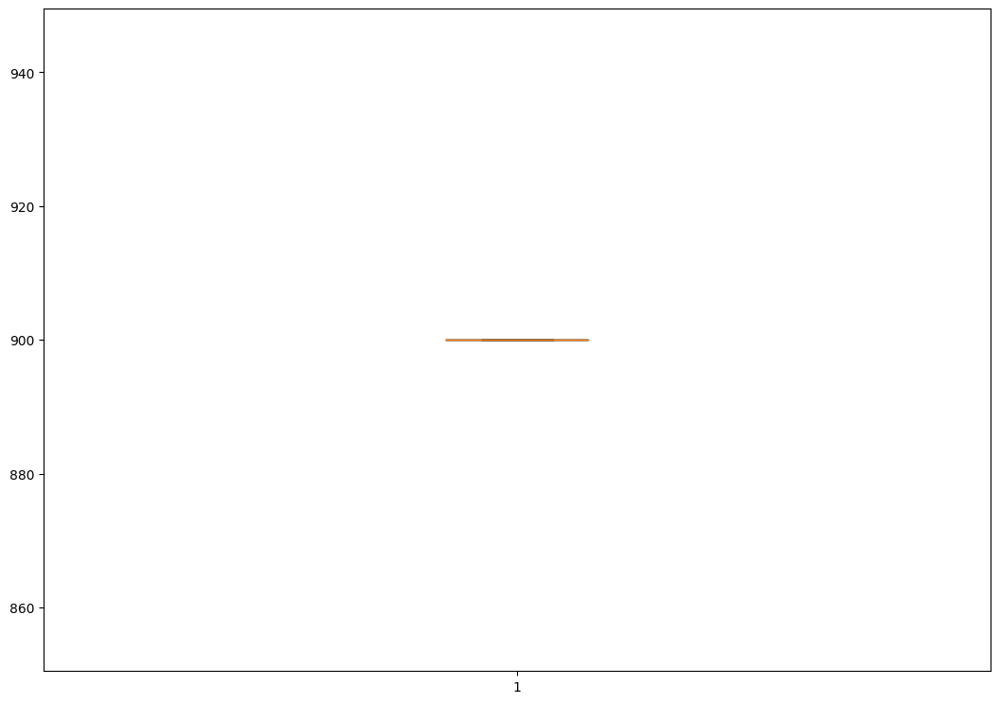

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 50, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.003813505172729492
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012475013732910156
Iterations:   1%|          | 1/100 [00:34<56:53, 34.48s/it]archive training
time to add to som 0.016214847564697266
Iterations:   2%|▏         | 2/100 [01:09<56:59, 34.89s/it]archive training
time to add to som 0.018990039825439453
Iterations:   3%|▎         | 3/100 [01:44<56:29, 34.94s/it]archive training
time to add to som 0.025861740112304688
Iterations:   4%|▍         | 4/100 [02:19<56:03, 35.04s/it]archive training
time to add to som 0.017427444458007812
Iterations:   5%|▌         | 5/100 [02:54<55:16, 34.91s/it]archive training
time to add to som 0.019362688064575195
Iterations:   6%|▌         | 6/100 [03:30<55:00, 35.11s/it]archive training
time to add to som 0.030590295791625977
Iterations:   7%|▋         | 7/100 [04:05<54:22, 35.08s/it]archive training
time to add to som 0.02115607261657715
Iterations:   8%|▊         

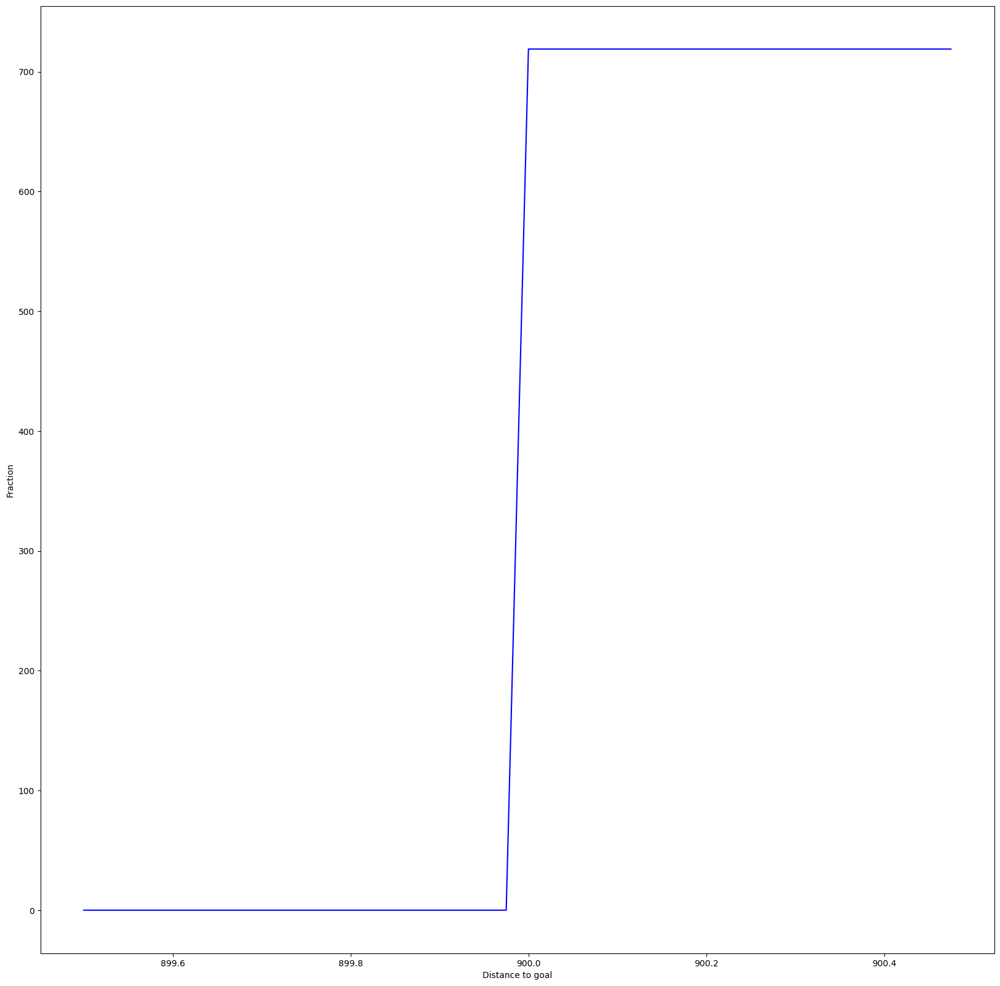

In [ ]:
plot_cumulative_distro_objective(archive)

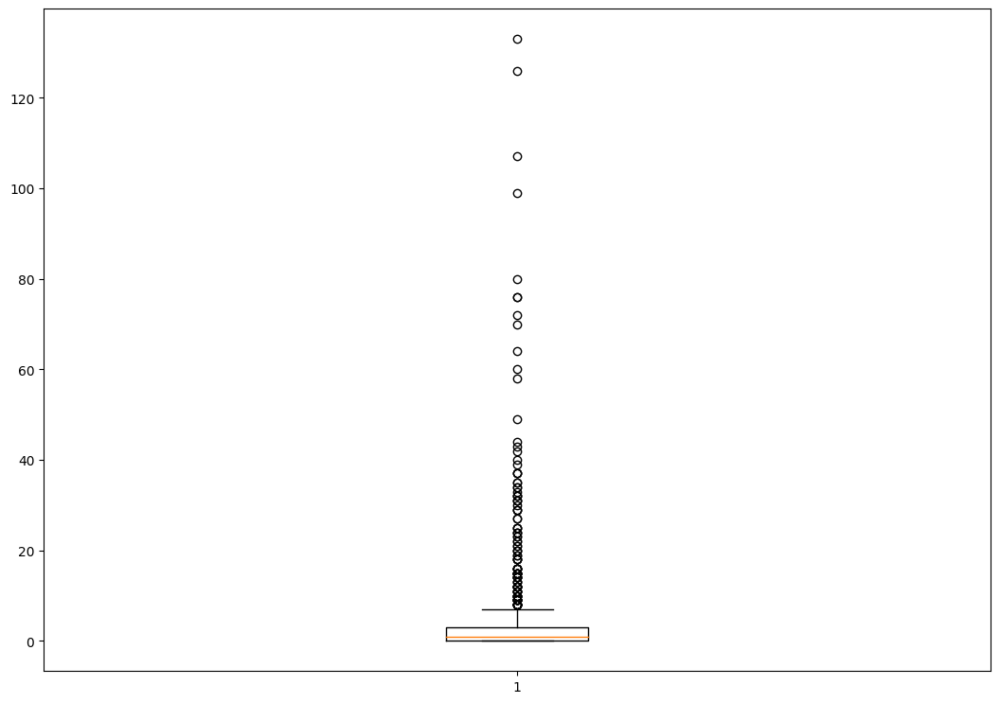

In [ ]:
plot_solution_spread(archive)

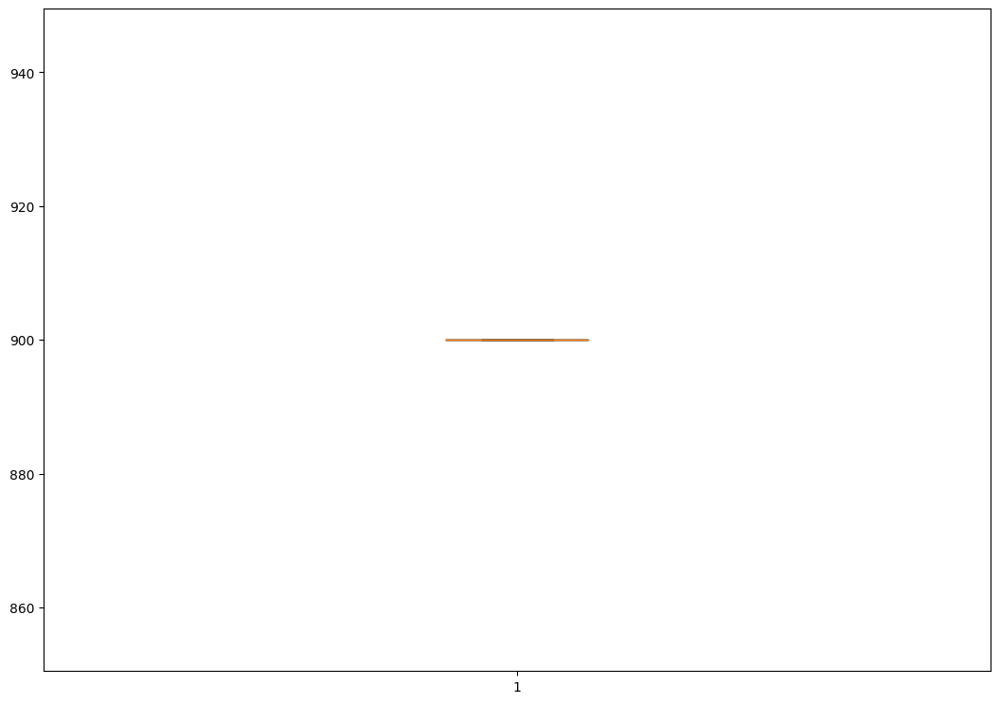

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 2, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0005393028259277344
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.019277095794677734
Iterations:   1%|          | 1/100 [00:34<57:26, 34.81s/it]archive training
time to add to som 0.014904975891113281
Iterations:   2%|▏         | 2/100 [01:09<56:40, 34.70s/it]archive training
time to add to som 0.015335559844970703
Iterations:   3%|▎         | 3/100 [01:43<55:38, 34.41s/it]archive training
time to add to som 0.016175031661987305
Iterations:   4%|▍         | 4/100 [02:17<55:01, 34.39s/it]archive training
time to add to som 0.027635812759399414
Iterations:   5%|▌         | 5/100 [02:54<55:57, 35.35s/it]archive training
time to add to som 0.021444082260131836
Iterations:   6%|▌         | 6/100 [03:29<54:48, 34.98s/it]archive training
time to add to som 0.01884746551513672
Iterations:   7%|▋         | 7/100 [04:03<53:55, 34.79s/it]archive training
time to add to som 0.03048110008239746
Iterations:   8%|▊         

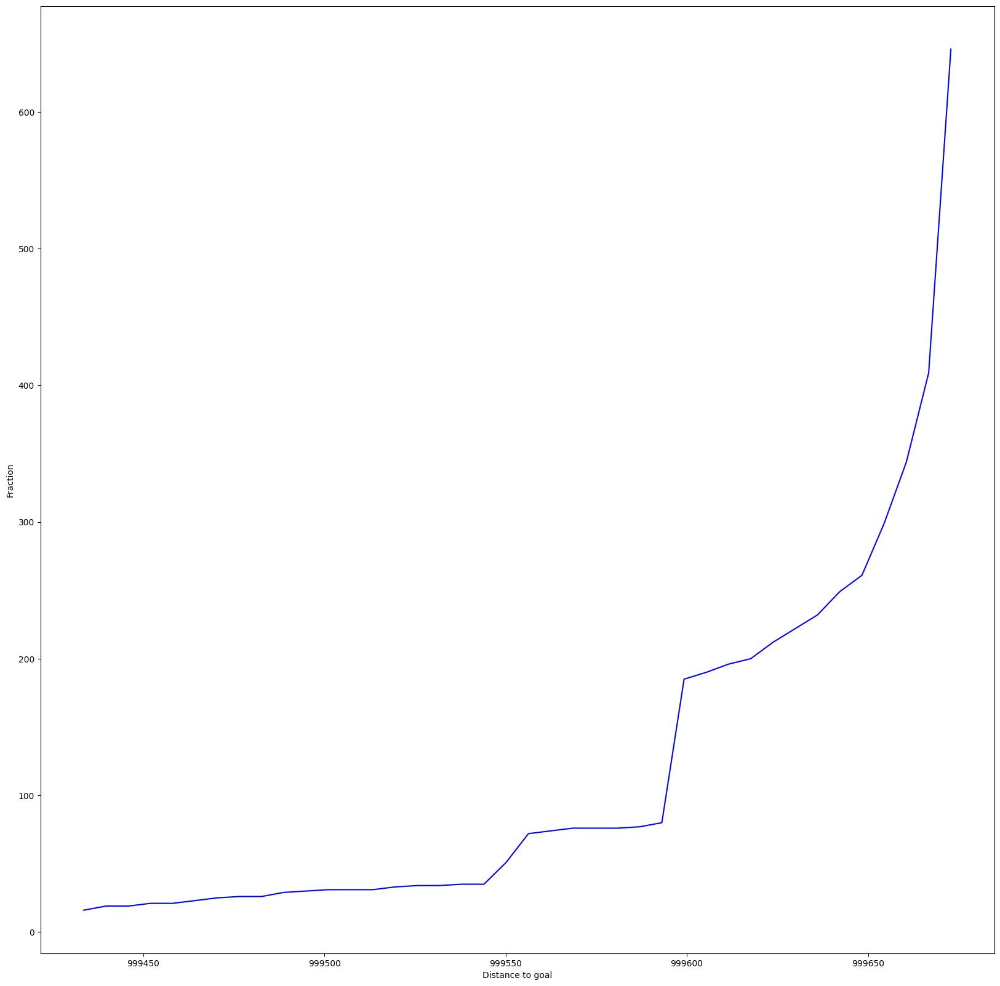

In [ ]:
plot_cumulative_distro_objective(archive)

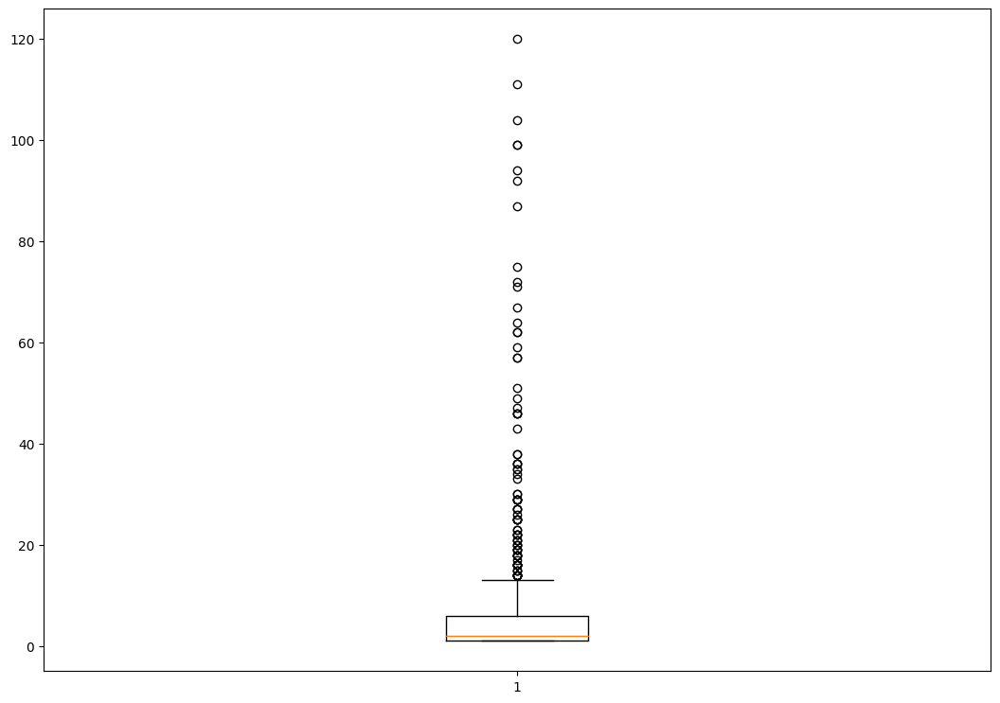

In [ ]:
plot_solution_spread(archive)

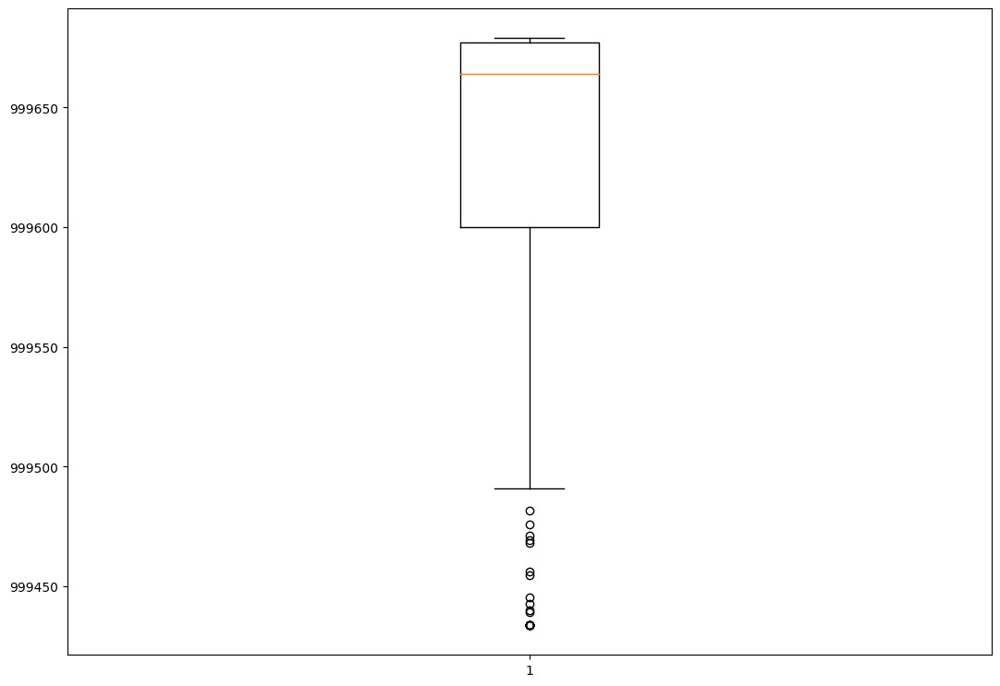

In [ ]:
plot_solution_distance(archive)

######*11.1.3 150d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze3", dim=150)

extra time to initialize archive 134.66655921936035
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.08331489562988281
Iterations:   1%|          | 1/100 [00:29<49:12, 29.82s/it]archive training
time to add to cvt 0.09357810020446777
Iterations:   2%|▏         | 2/100 [00:59<48:52, 29.93s/it]archive training
time to add to cvt 0.09538817405700684
Iterations:   3%|▎         | 3/100 [01:29<48:04, 29.74s/it]archive training
time to add to cvt 0.06746935844421387
Iterations:   4%|▍         | 4/100 [01:59<47:40, 29.80s/it]archive training
time to add to cvt 0.0682063102722168
Iterations:   5%|▌         | 5/100 [02:29<47:22, 29.92s/it]archive training
time to add to cvt 0.10803818702697754
Iterations:   6%|▌         | 6/100 [02:59<47:06, 30.06s/it]archive training
time to add to cvt 0.060882568359375
Iterations:   7%|▋         | 7/100 [03:30<47:05, 30.38s/it]archive training
time to add to cvt 0.06480193138122559
Iterations:   8%|▊         | 8/100 [04:

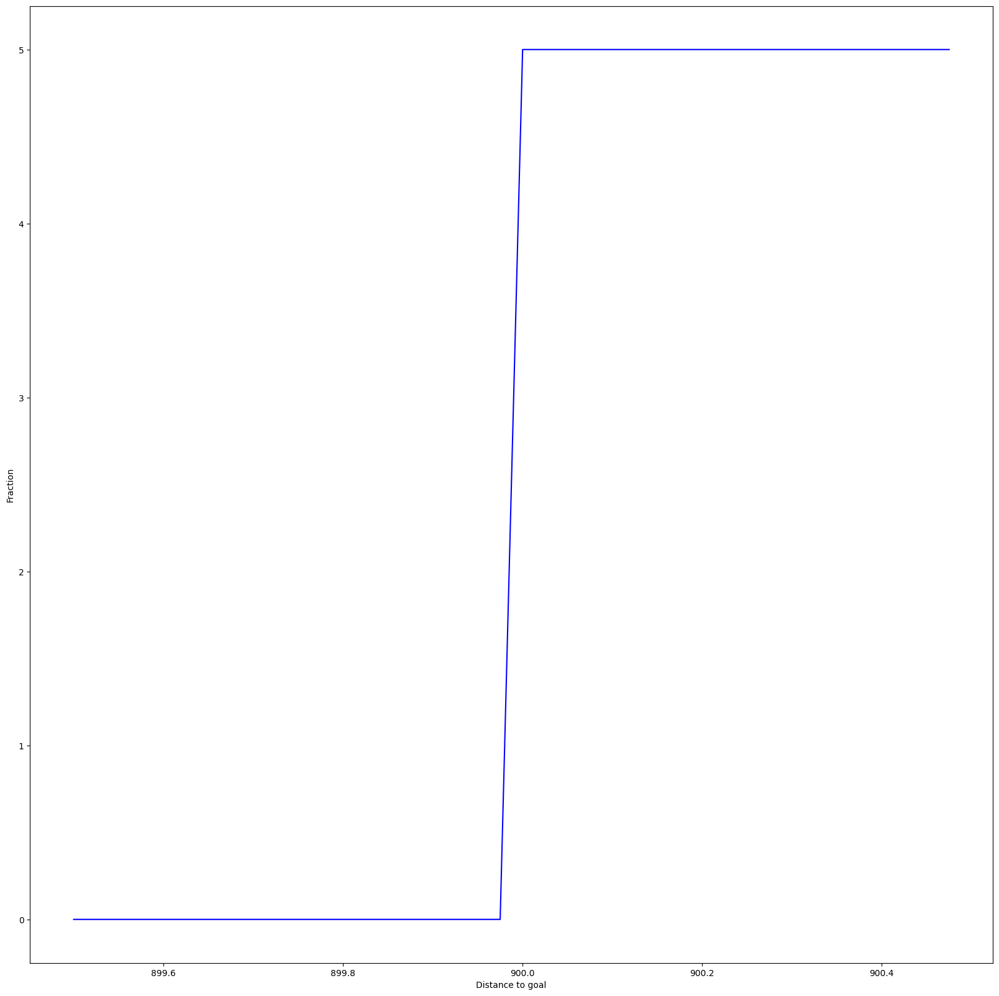

In [ ]:
plot_cumulative_distro_objective(archive)

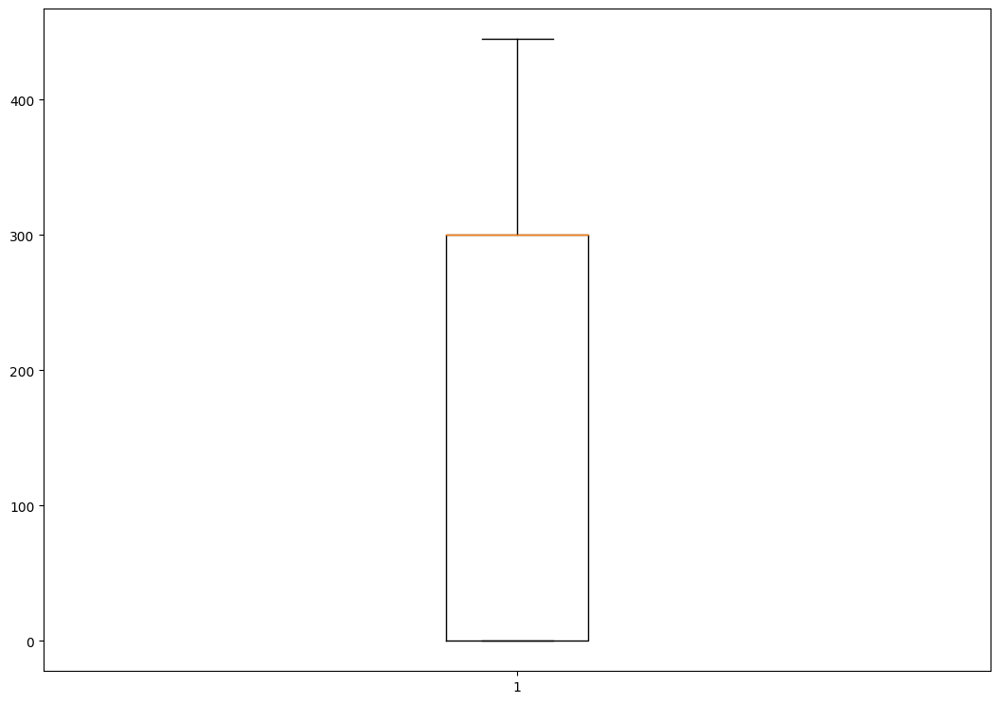

In [ ]:
plot_solution_spread(archive)

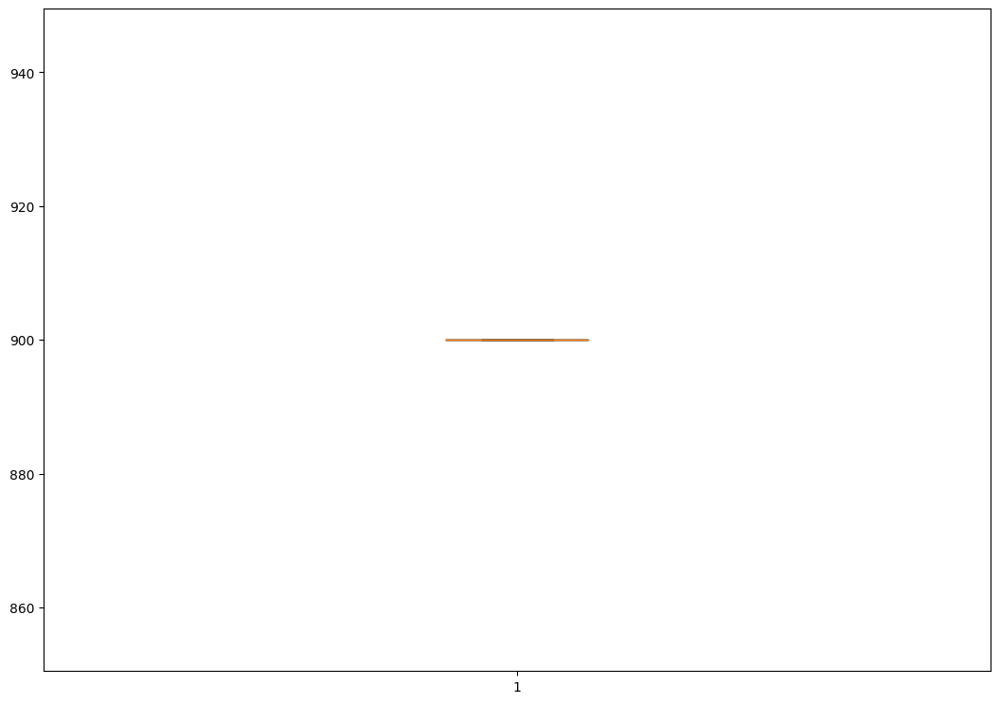

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 150)

extra time to initialize archive 0.0007240772247314453
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01660609245300293
Iterations:   1%|          | 1/100 [00:35<59:11, 35.88s/it]archive training
time to add to som 0.0178377628326416
Iterations:   2%|▏         | 2/100 [01:11<58:30, 35.82s/it]archive training
time to add to som 0.02144455909729004
Iterations:   3%|▎         | 3/100 [02:01<1:07:58, 42.05s/it]archive training
time to add to som 0.039368391036987305
Iterations:   4%|▍         | 4/100 [02:37<1:03:49, 39.89s/it]archive training
time to add to som 0.03798079490661621
Iterations:   5%|▌         | 5/100 [03:13<1:00:42, 38.35s/it]archive training
time to add to som 0.049083709716796875
Iterations:   6%|▌         | 6/100 [03:50<59:28, 37.96s/it]  archive training
time to add to som 0.03703165054321289
Iterations:   7%|▋         | 7/100 [04:27<58:14, 37.58s/it]archive training
time to add to som 0.03570199012756348
Iterations:   8%|▊      

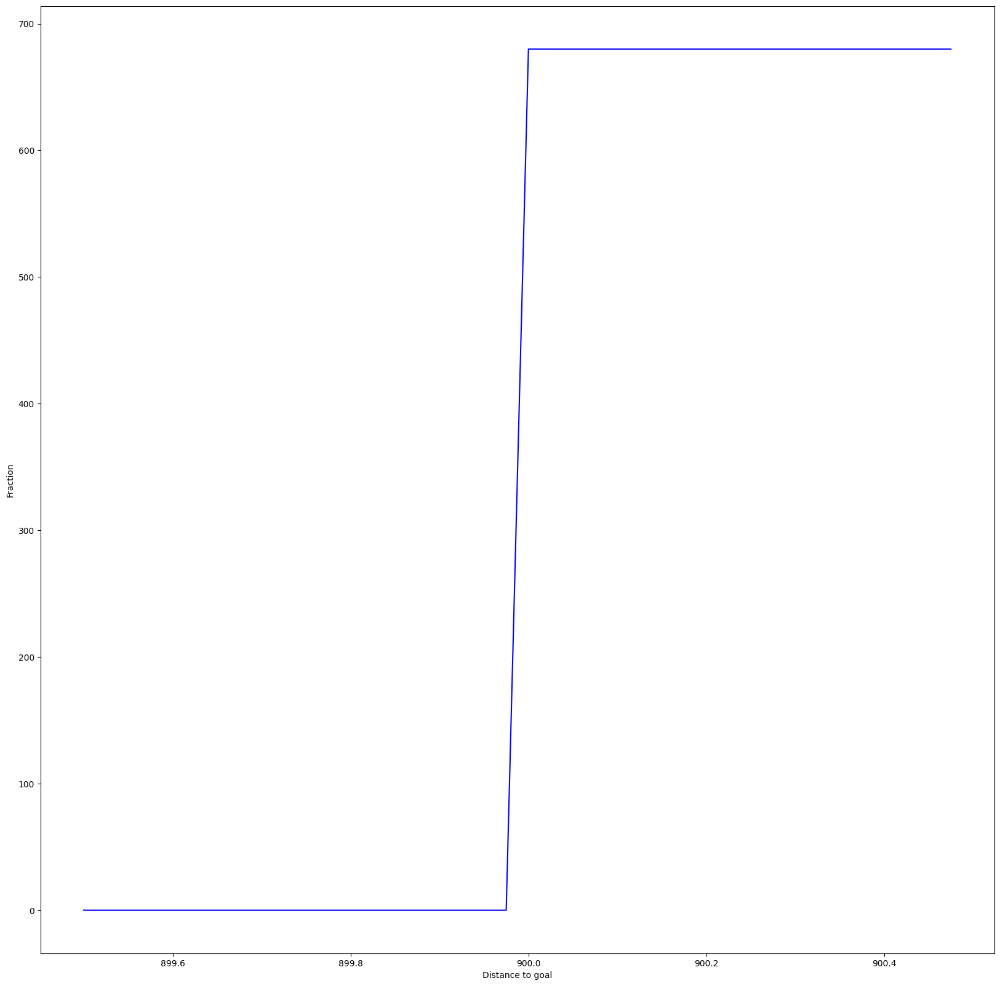

In [ ]:
plot_cumulative_distro_objective(archive)


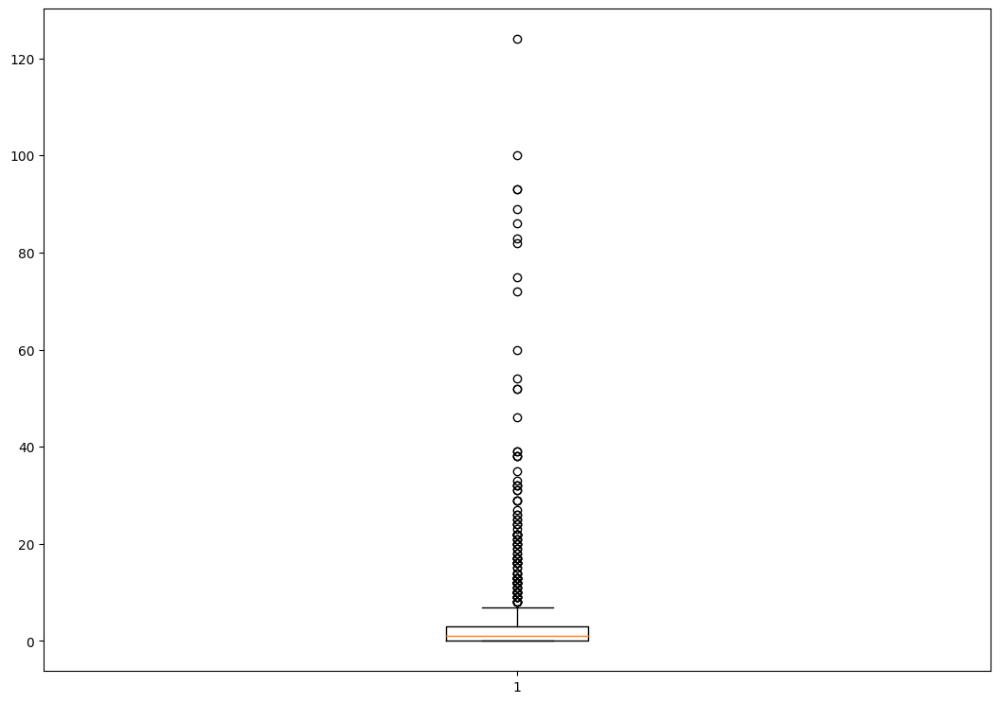

In [ ]:
plot_solution_spread(archive)


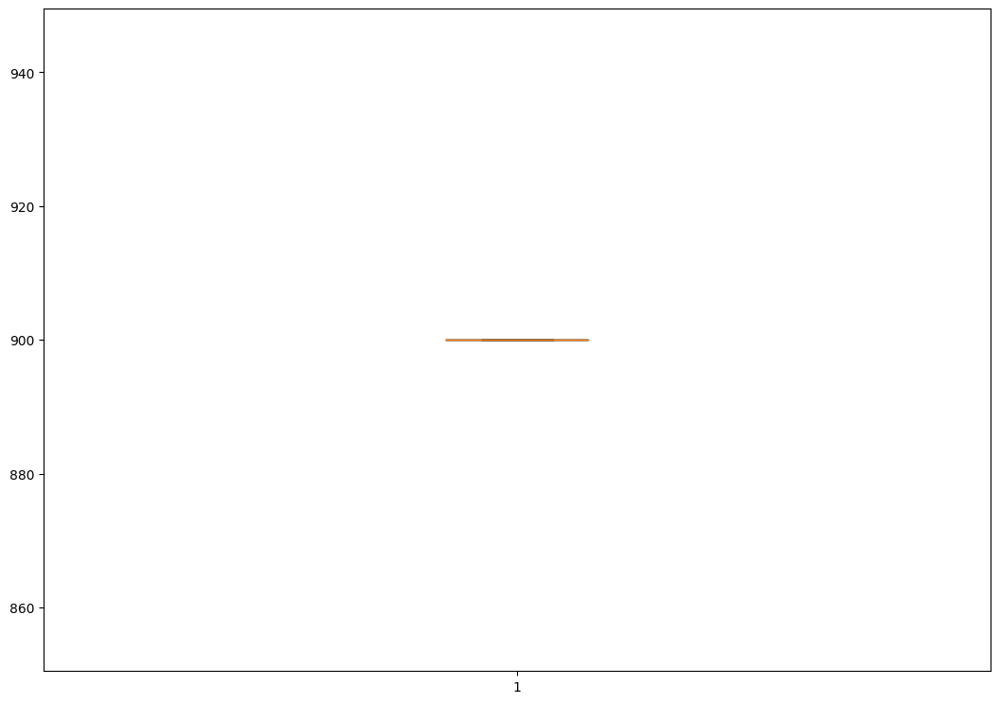

In [ ]:
plot_solution_distance(archive)

high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.00031113624572753906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.018909692764282227
Iterations:   1%|          | 1/100 [00:19<31:55, 19.35s/it]archive training
time to add to som 0.01624584197998047
Iterations:   2%|▏         | 2/100 [00:38<31:44, 19.43s/it]archive training
time to add to som 0.03133988380432129
Iterations:   3%|▎         | 3/100 [00:59<32:30, 20.10s/it]archive training
time to add to som 0.026949405670166016
Iterations:   4%|▍         | 4/100 [01:19<31:53, 19.94s/it]archive training
time to add to som 0.023992061614990234
Iterations:   5%|▌         | 5/100 [01:38<31:19, 19.78s/it]archive training
time to add to som 0.040483713150024414
Iterations:   6%|▌         | 6/100 [01:59<31:27, 20.08s/it]archive training
time to add to som 0.027678728103637695
Iterations:   7%|▋         | 7/100 [02:20<31:23, 20.25s/it]archive training
time to add to som 0.03257298469543457
Iterations:   8%|▊         

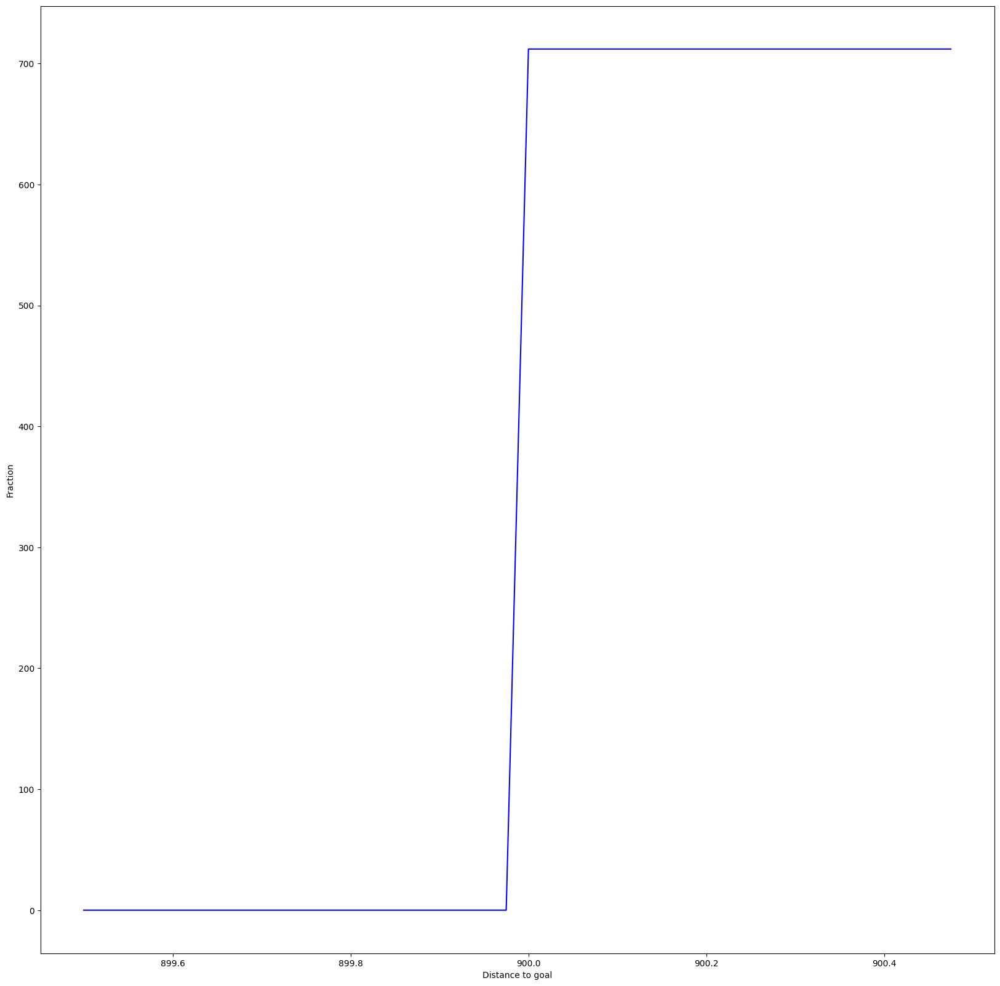

In [ ]:
plot_cumulative_distro_objective(archive)

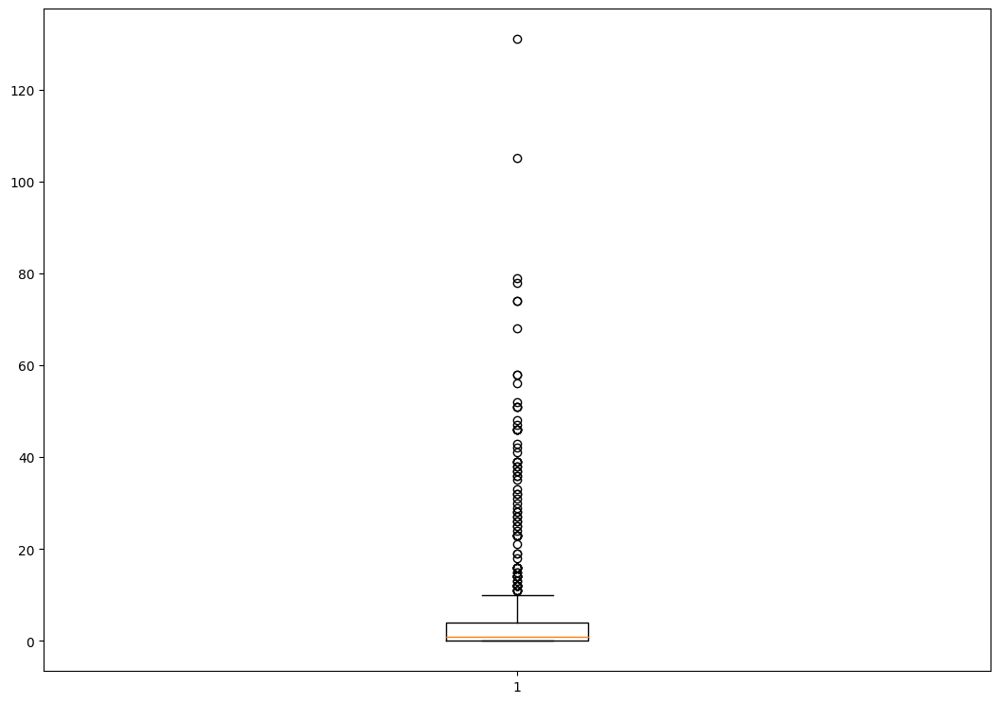

In [ ]:
plot_solution_spread(archive)

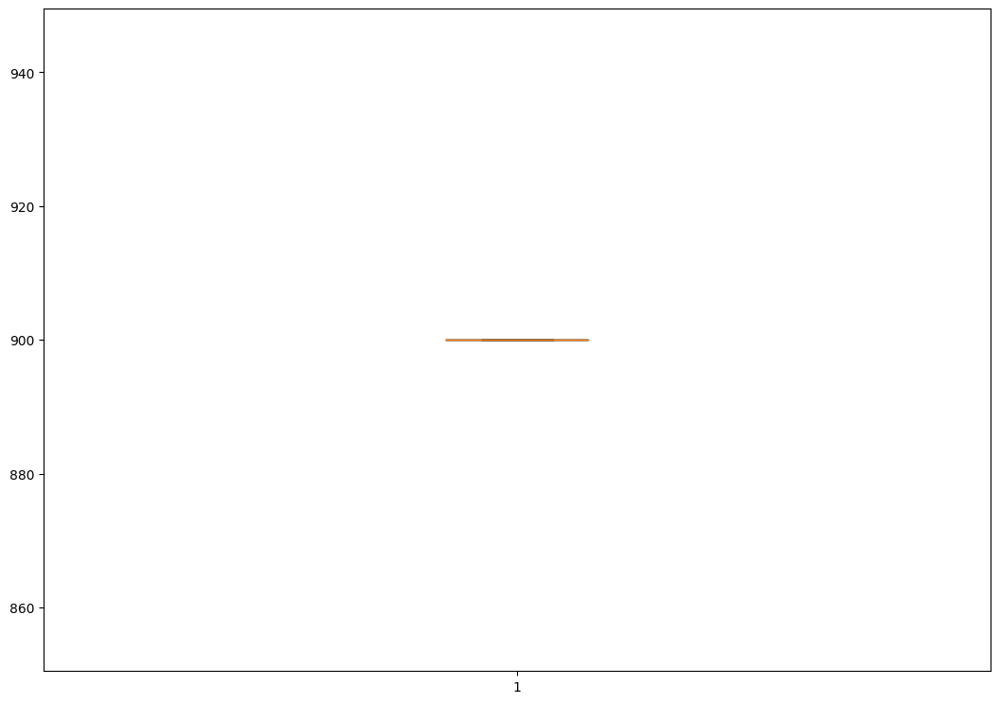

In [ ]:
plot_solution_distance(archive)

double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.00040030479431152344
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 2.660861015319824
Iterations:   1%|          | 1/100 [00:23<38:23, 23.27s/it]archive training
time to add to som 0.016188859939575195
Iterations:   2%|▏         | 2/100 [00:41<33:09, 20.30s/it]archive training
time to add to som 0.0244140625
Iterations:   3%|▎         | 3/100 [00:59<31:29, 19.47s/it]archive training
time to add to som 0.0325162410736084
Iterations:   4%|▍         | 4/100 [01:20<31:39, 19.78s/it]archive training
time to add to som 0.026952028274536133
Iterations:   5%|▌         | 5/100 [01:42<32:36, 20.60s/it]archive training
time to add to som 0.020084857940673828
Iterations:   6%|▌         | 6/100 [02:00<30:53, 19.72s/it]archive training
time to add to som 0.022365331649780273
Iterations:   7%|▋         | 7/100 [02:18<29:45, 19.20s/it]archive training
time to add to som 0.03516268730163574
Iterations:   8%|▊         | 8/100 [02

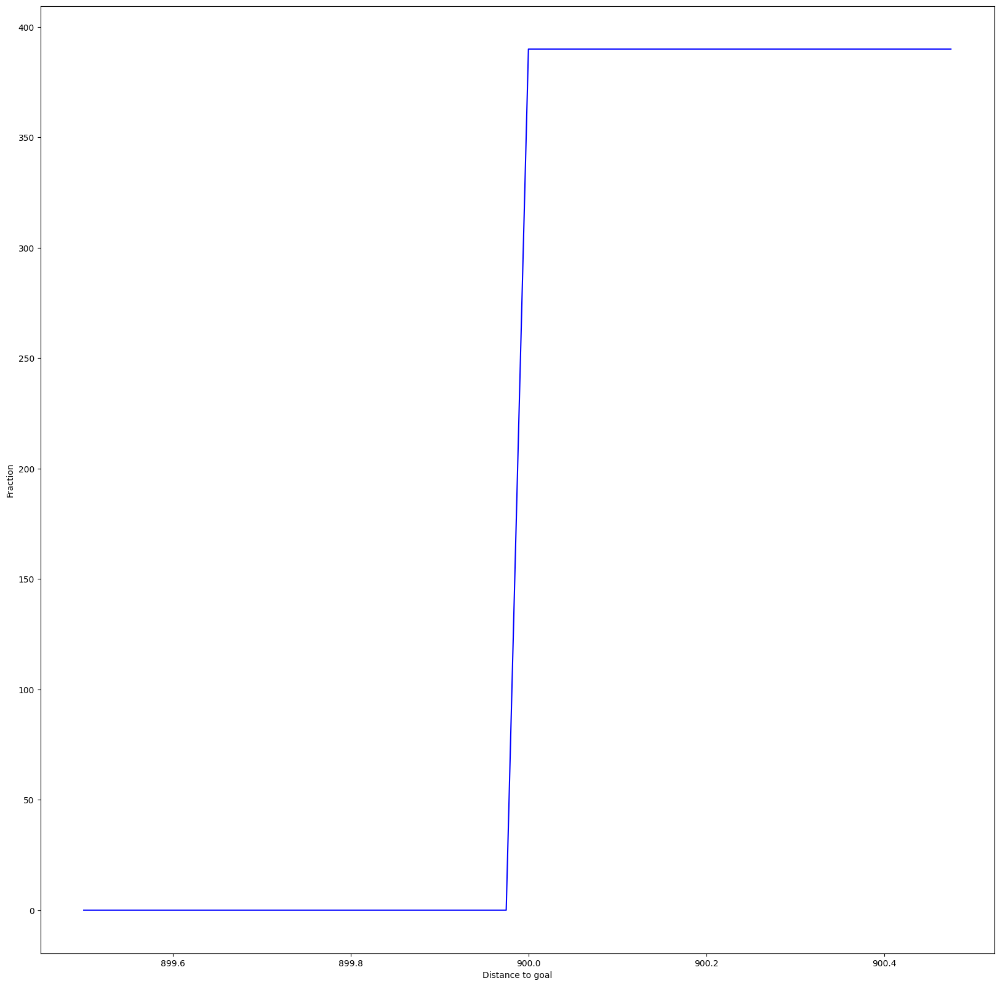

In [ ]:
plot_cumulative_distro_objective(archive)


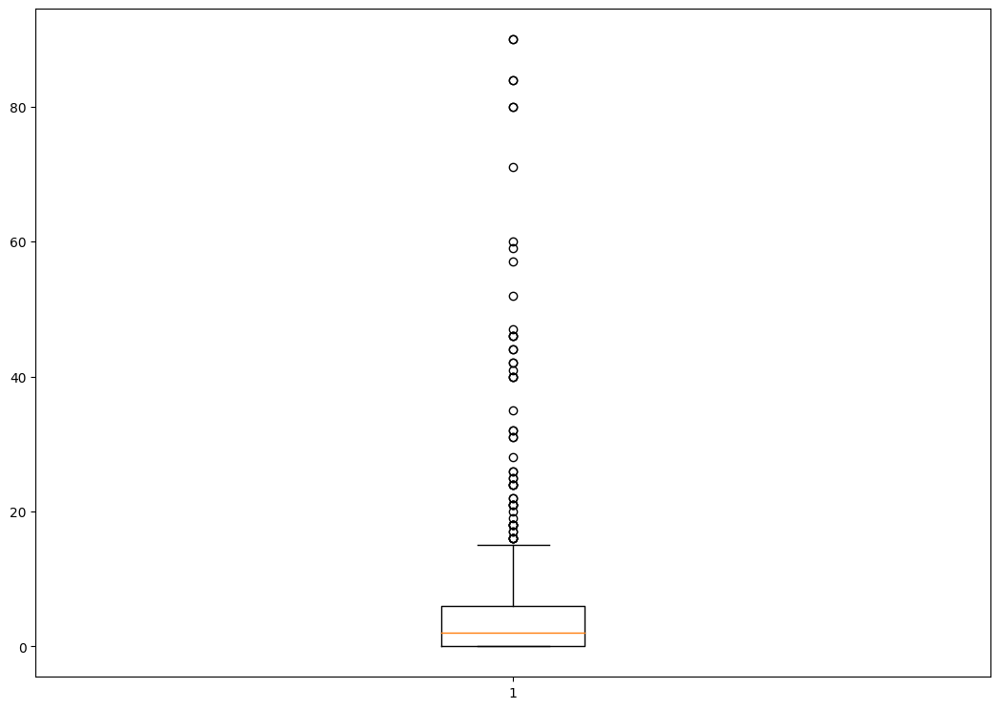

In [ ]:
plot_solution_spread(archive)


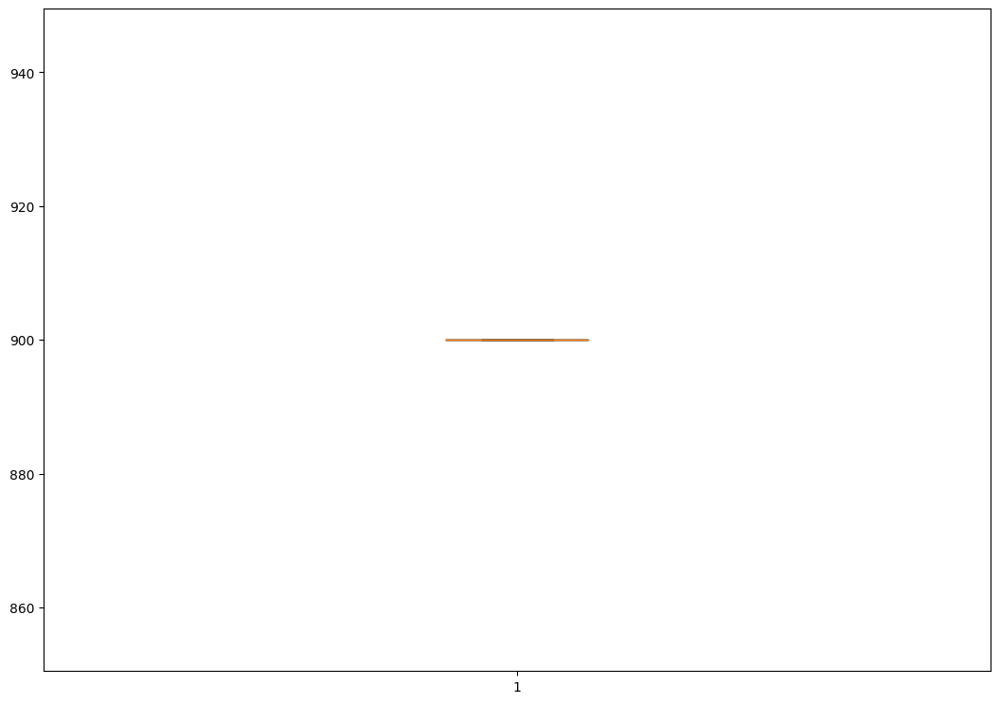

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.00034809112548828125
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012288093566894531
Iterations:   1%|          | 1/100 [00:19<32:54, 19.94s/it]archive training
time to add to som 0.020931482315063477
Iterations:   2%|▏         | 2/100 [00:39<32:36, 19.96s/it]archive training
time to add to som 0.02922821044921875
Iterations:   3%|▎         | 3/100 [01:01<33:19, 20.61s/it]archive training
time to add to som 0.02464771270751953
Iterations:   4%|▍         | 4/100 [01:22<33:02, 20.65s/it]archive training
time to add to som 0.027865171432495117
Iterations:   5%|▌         | 5/100 [01:42<32:25, 20.48s/it]archive training
time to add to som 0.0419769287109375
Iterations:   6%|▌         | 6/100 [02:03<32:44, 20.90s/it]archive training
time to add to som 0.029646635055541992
Iterations:   7%|▋         | 7/100 [02:23<31:55, 20.59s/it]archive training
time to add to som 0.028333425521850586
Iterations:   8%|▊         |

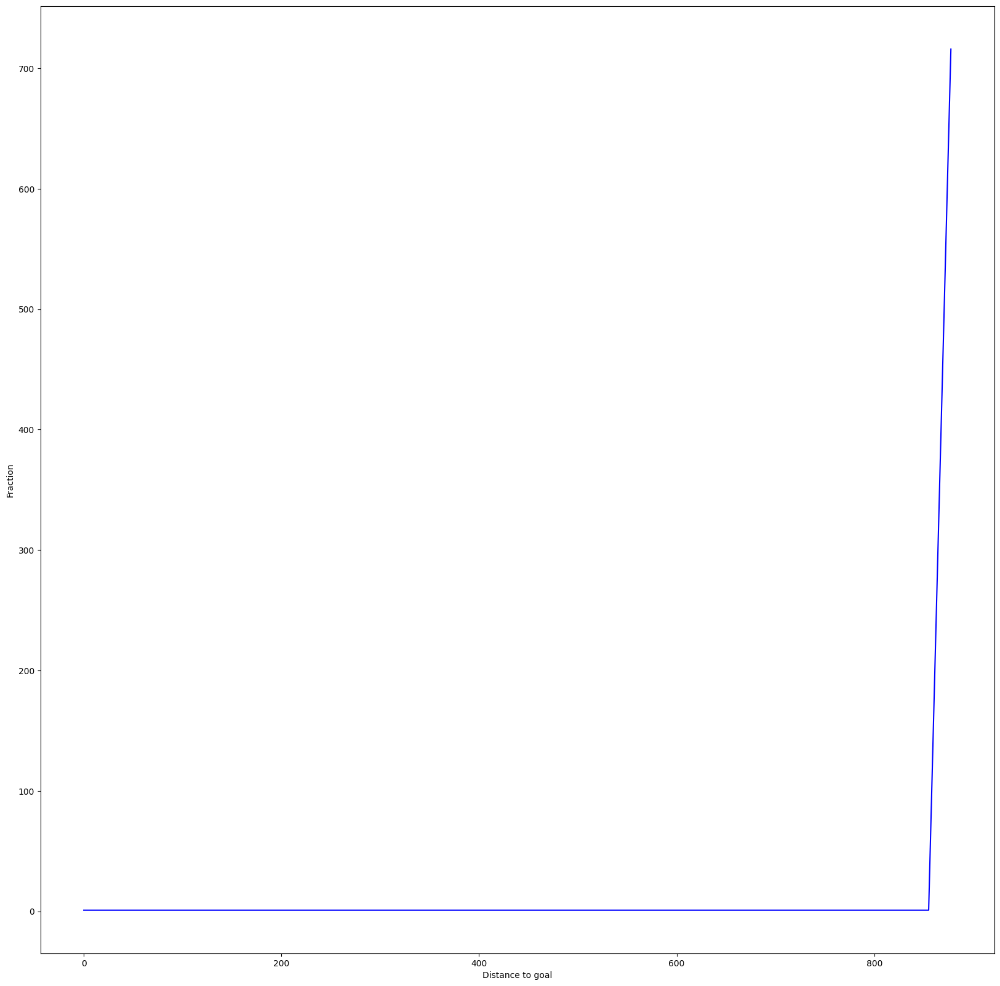

In [ ]:
plot_cumulative_distro_objective(archive)


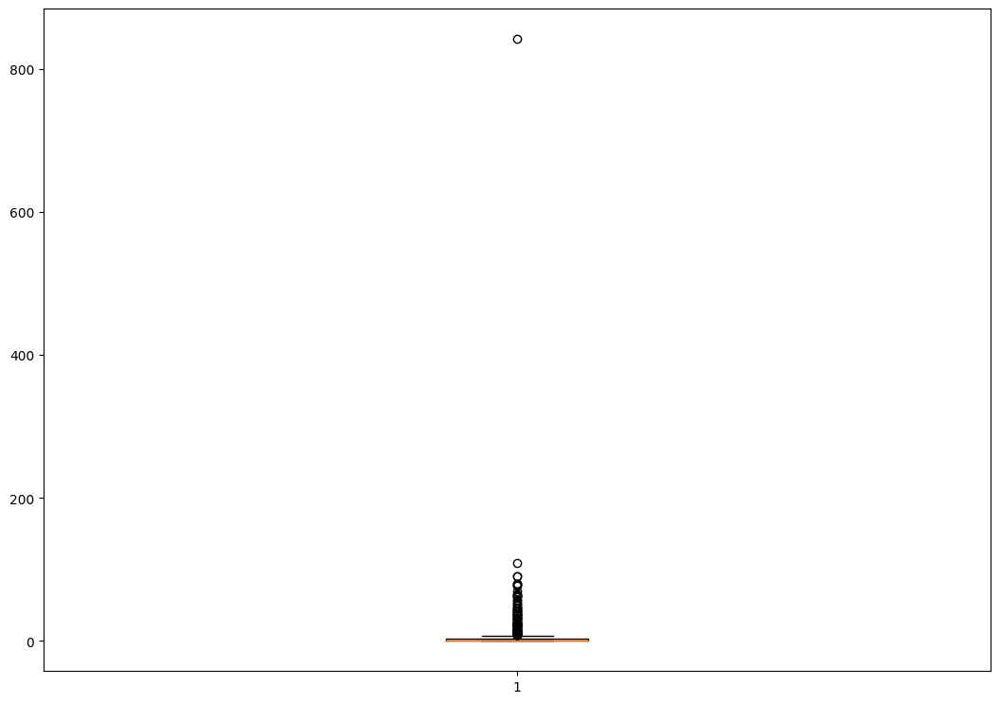

In [ ]:
plot_solution_spread(archive)


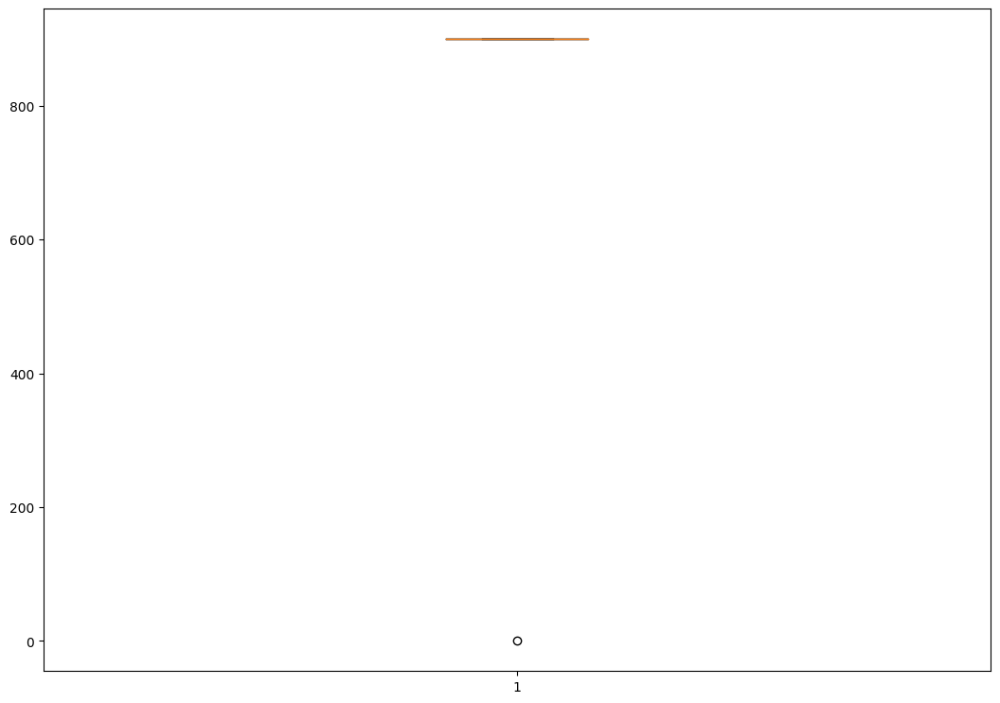

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 150, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0013232231140136719
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.013559818267822266
Iterations:   1%|          | 1/100 [00:49<1:20:56, 49.05s/it]archive training
time to add to som 0.014724254608154297
Iterations:   2%|▏         | 2/100 [01:22<1:05:31, 40.12s/it]archive training
time to add to som 0.02576136589050293
Iterations:   3%|▎         | 3/100 [01:57<1:00:41, 37.54s/it]archive training
time to add to som 0.028890371322631836
Iterations:   4%|▍         | 4/100 [02:34<59:37, 37.27s/it]  archive training
time to add to som 0.022397279739379883
Iterations:   5%|▌         | 5/100 [03:08<57:22, 36.24s/it]archive training
time to add to som 0.025568485260009766
Iterations:   6%|▌         | 6/100 [03:42<55:41, 35.55s/it]archive training
time to add to som 0.05154705047607422
Iterations:   7%|▋         | 7/100 [04:19<55:33, 35.84s/it]archive training
time to add to som 0.04060244560241699
Iterations:   8%|▊  

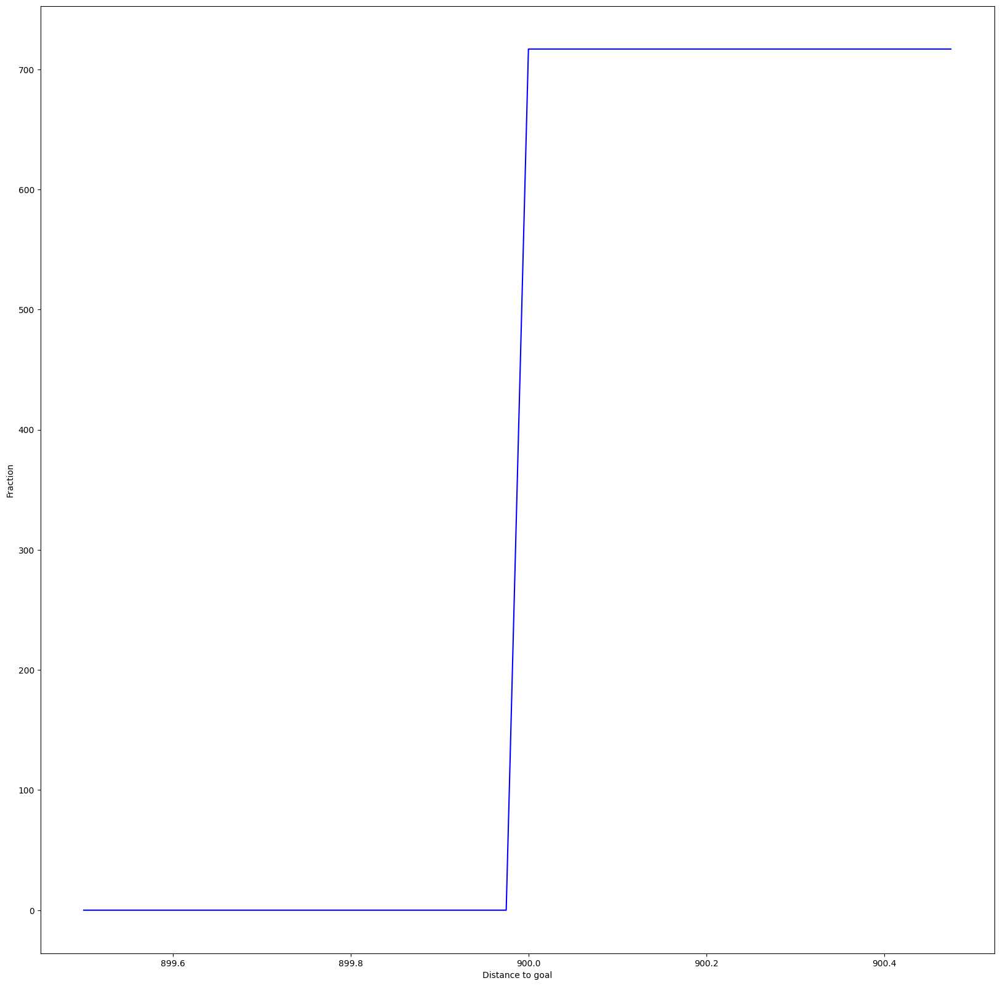

In [ ]:
plot_cumulative_distro_objective(archive)

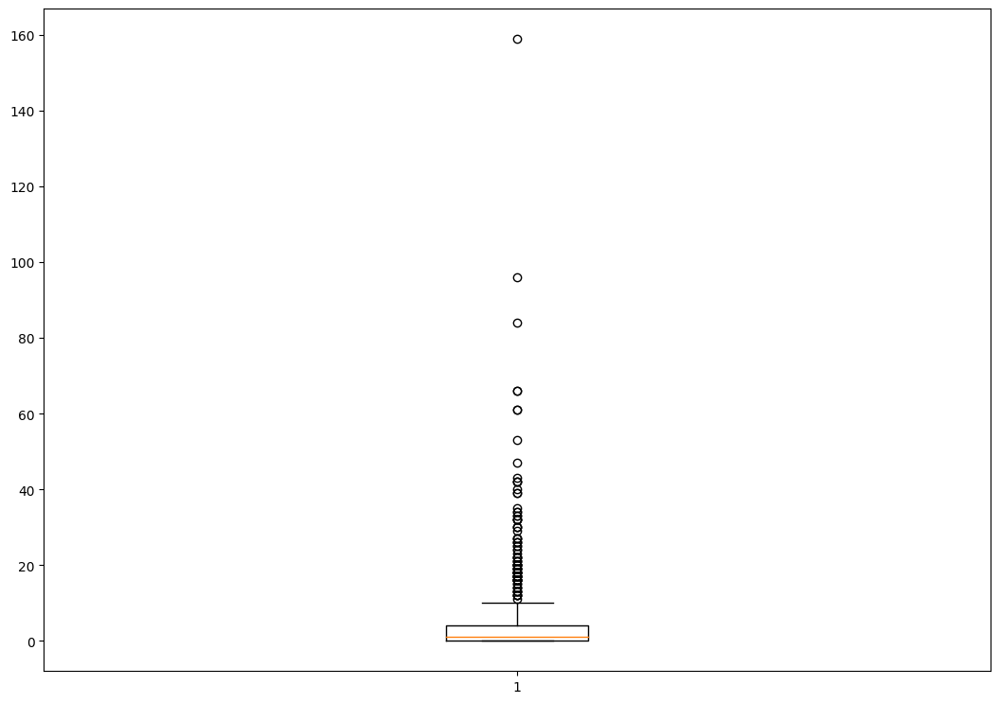

In [ ]:
plot_solution_spread(archive)

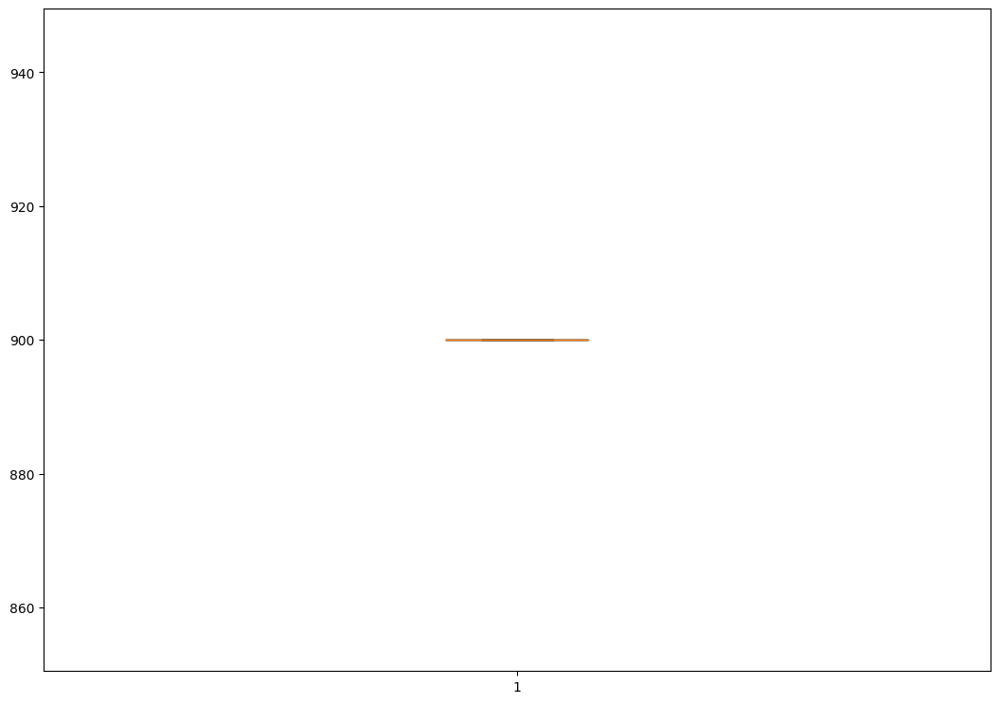

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 150, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0008437633514404297
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01786208152770996
Iterations:   1%|          | 1/100 [00:34<57:26, 34.82s/it]archive training
time to add to som 0.01803302764892578
Iterations:   2%|▏         | 2/100 [01:08<55:53, 34.22s/it]archive training
time to add to som 0.021008968353271484
Iterations:   3%|▎         | 3/100 [01:42<55:08, 34.11s/it]archive training
time to add to som 0.036733150482177734
Iterations:   4%|▍         | 4/100 [02:16<54:45, 34.22s/it]archive training
time to add to som 0.02525162696838379
Iterations:   5%|▌         | 5/100 [02:52<54:47, 34.61s/it]archive training
time to add to som 0.028472900390625
Iterations:   6%|▌         | 6/100 [03:26<54:09, 34.57s/it]archive training
time to add to som 0.03441953659057617
Iterations:   7%|▋         | 7/100 [04:01<53:33, 34.56s/it]archive training
time to add to som 0.05740523338317871
Iterations:   8%|▊         | 8/10

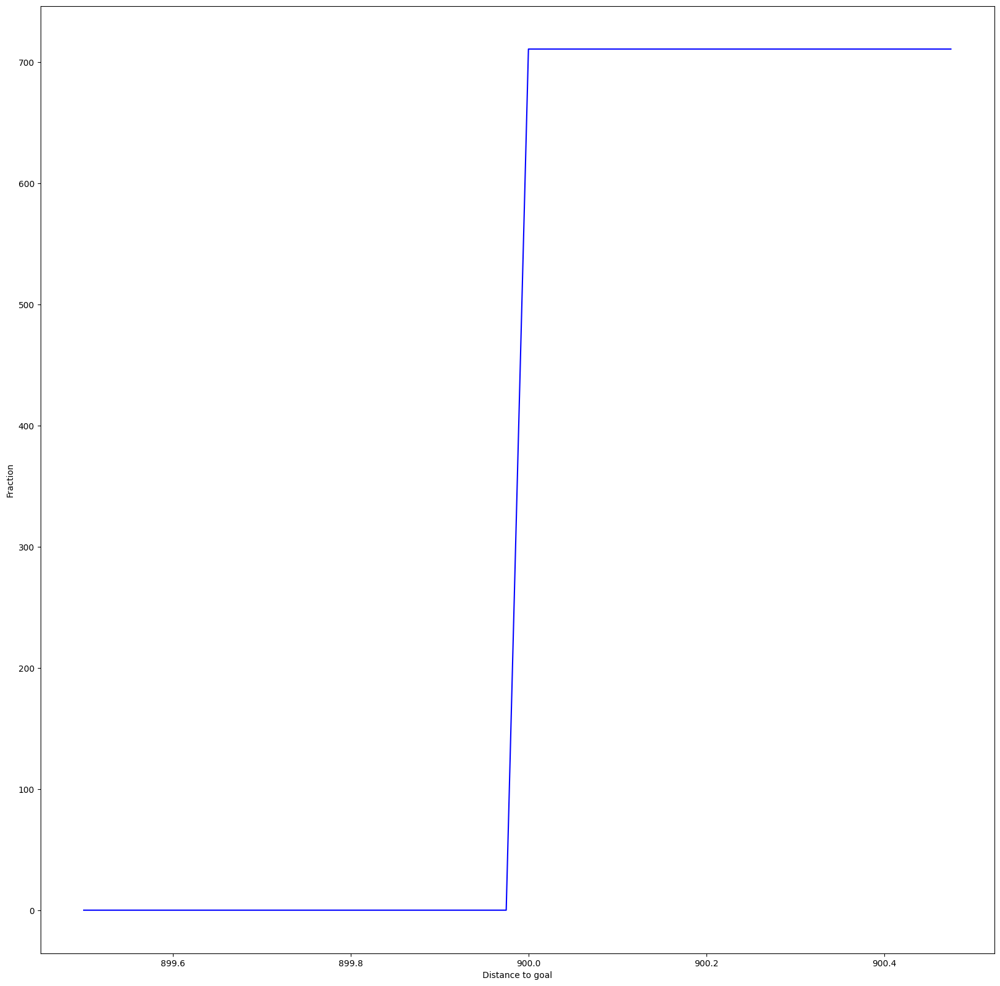

In [ ]:
plot_cumulative_distro_objective(archive)

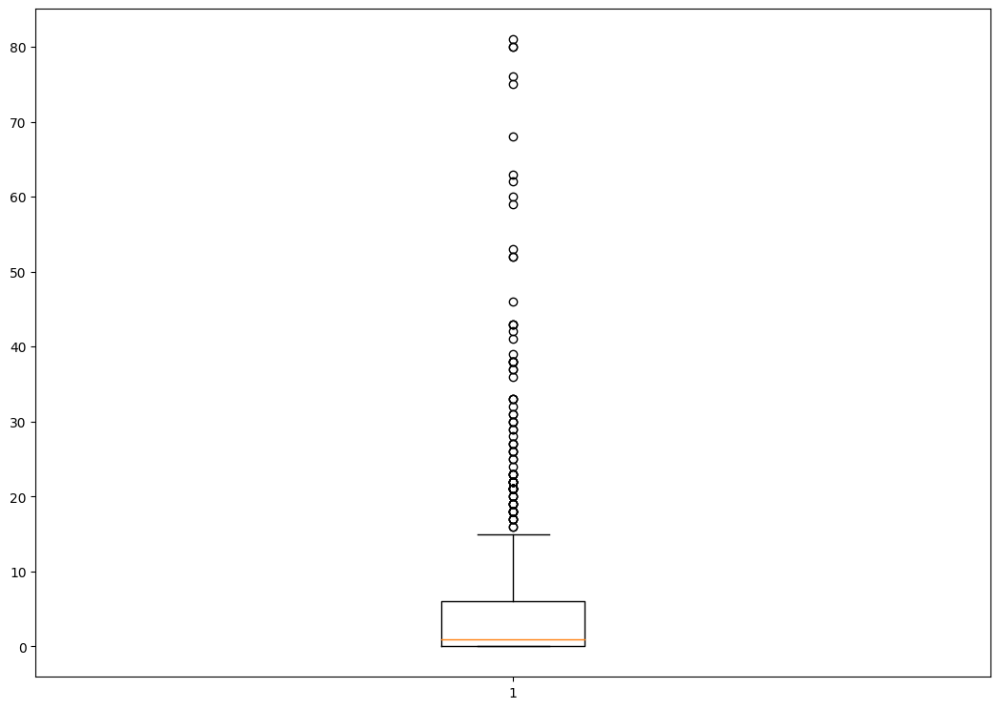

In [ ]:
plot_solution_spread(archive)

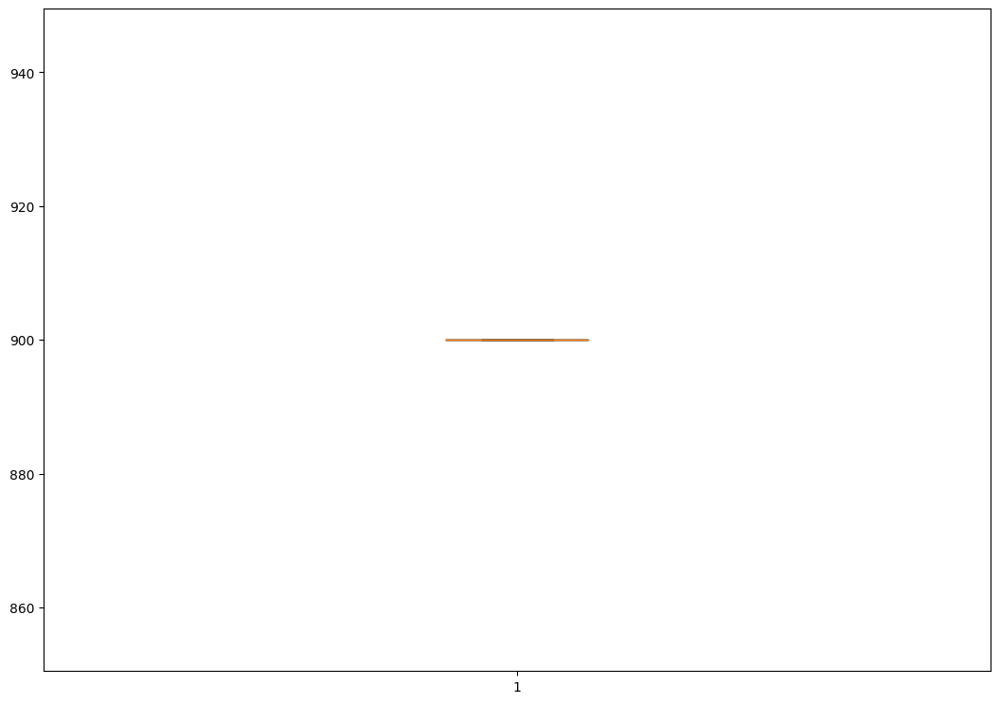

In [ ]:
plot_solution_distance(archive)

######*11.1.3 500d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze3", dim=500)

extra time to initialize archive 441.0389783382416
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 3.0725512504577637
Iterations:   1%|          | 1/100 [00:27<45:08, 27.35s/it]archive training
time to add to cvt 0.29455041885375977
Iterations:   2%|▏         | 2/100 [00:48<39:08, 23.97s/it]archive training
time to add to cvt 0.22202801704406738
Iterations:   3%|▎         | 3/100 [01:10<36:48, 22.77s/it]archive training
time to add to cvt 0.23237943649291992
Iterations:   4%|▍         | 4/100 [01:37<39:15, 24.53s/it]archive training
time to add to cvt 0.24763226509094238
Iterations:   5%|▌         | 5/100 [01:57<36:23, 22.98s/it]archive training
time to add to cvt 0.24343538284301758
Iterations:   6%|▌         | 6/100 [02:18<34:32, 22.05s/it]archive training
time to add to cvt 0.29508256912231445
Iterations:   7%|▋         | 7/100 [02:40<34:14, 22.09s/it]archive training
time to add to cvt 0.24390530586242676
Iterations:   8%|▊         | 8/100 [03

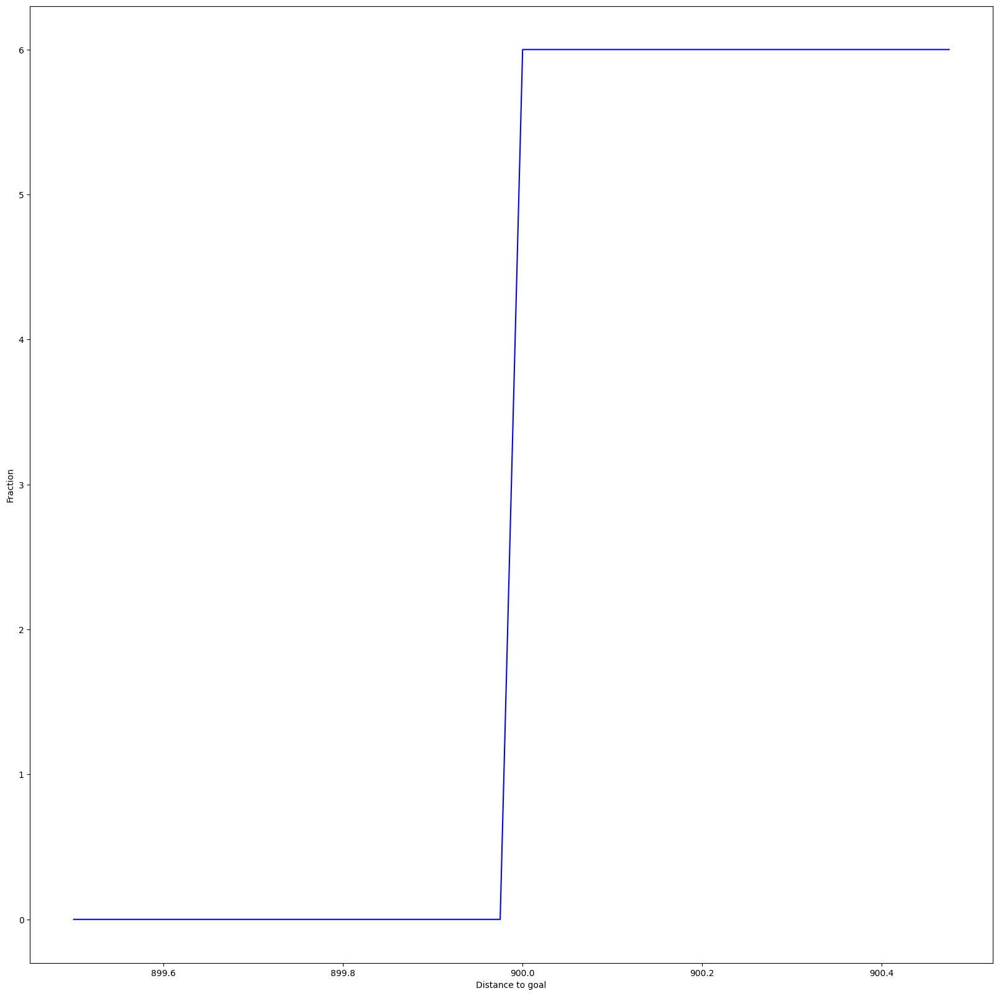

In [ ]:
plot_cumulative_distro_objective(archive)

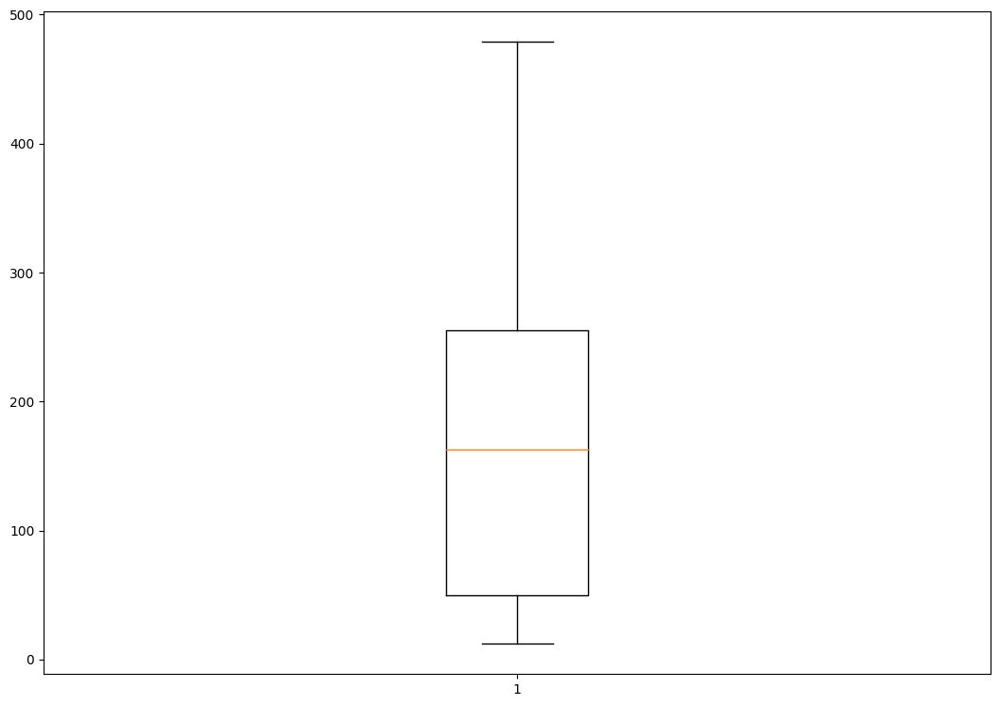

In [ ]:
plot_solution_spread(archive)

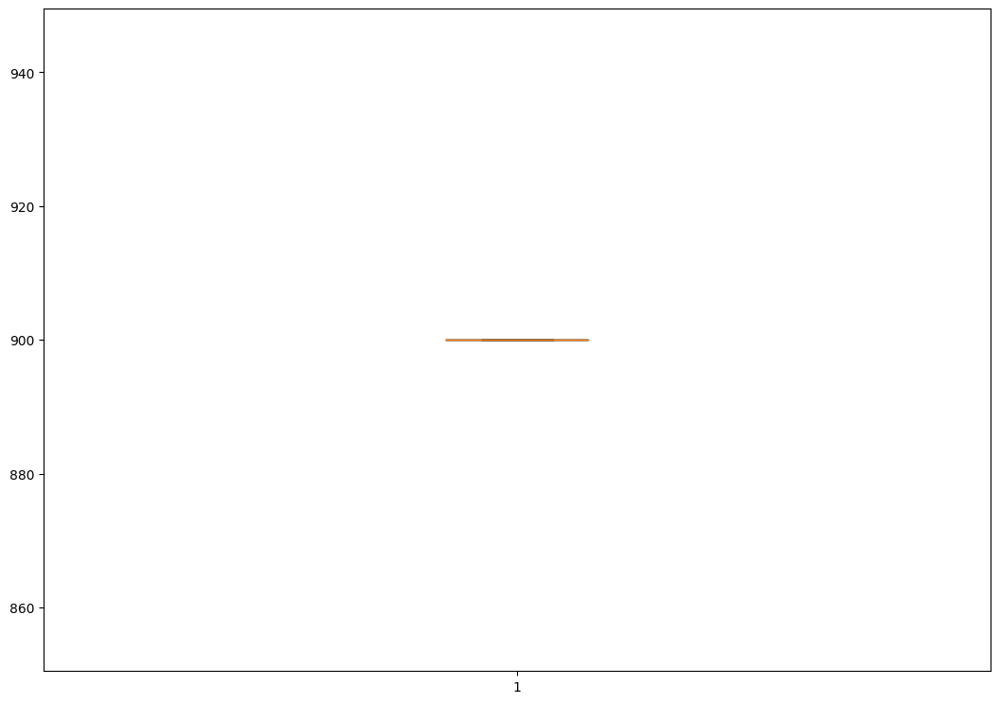

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 500)

extra time to initialize archive 0.00043010711669921875
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.025135278701782227
Iterations:   1%|          | 1/100 [00:36<59:34, 36.10s/it]archive training
time to add to som 0.07018327713012695
Iterations:   2%|▏         | 2/100 [01:20<1:06:38, 40.80s/it]archive training
time to add to som 0.032935380935668945
Iterations:   3%|▎         | 3/100 [02:02<1:07:09, 41.54s/it]archive training
time to add to som 0.039750099182128906
Iterations:   4%|▍         | 4/100 [02:38<1:02:38, 39.15s/it]archive training
time to add to som 0.0888972282409668
Iterations:   5%|▌         | 5/100 [03:16<1:01:27, 38.81s/it]archive training
time to add to som 0.05843186378479004
Iterations:   6%|▌         | 6/100 [03:52<59:11, 37.78s/it]  archive training
time to add to som 0.06433677673339844
Iterations:   7%|▋         | 7/100 [04:27<57:27, 37.07s/it]archive training
time to add to som 0.24506068229675293
Iterations:   8%|▊  

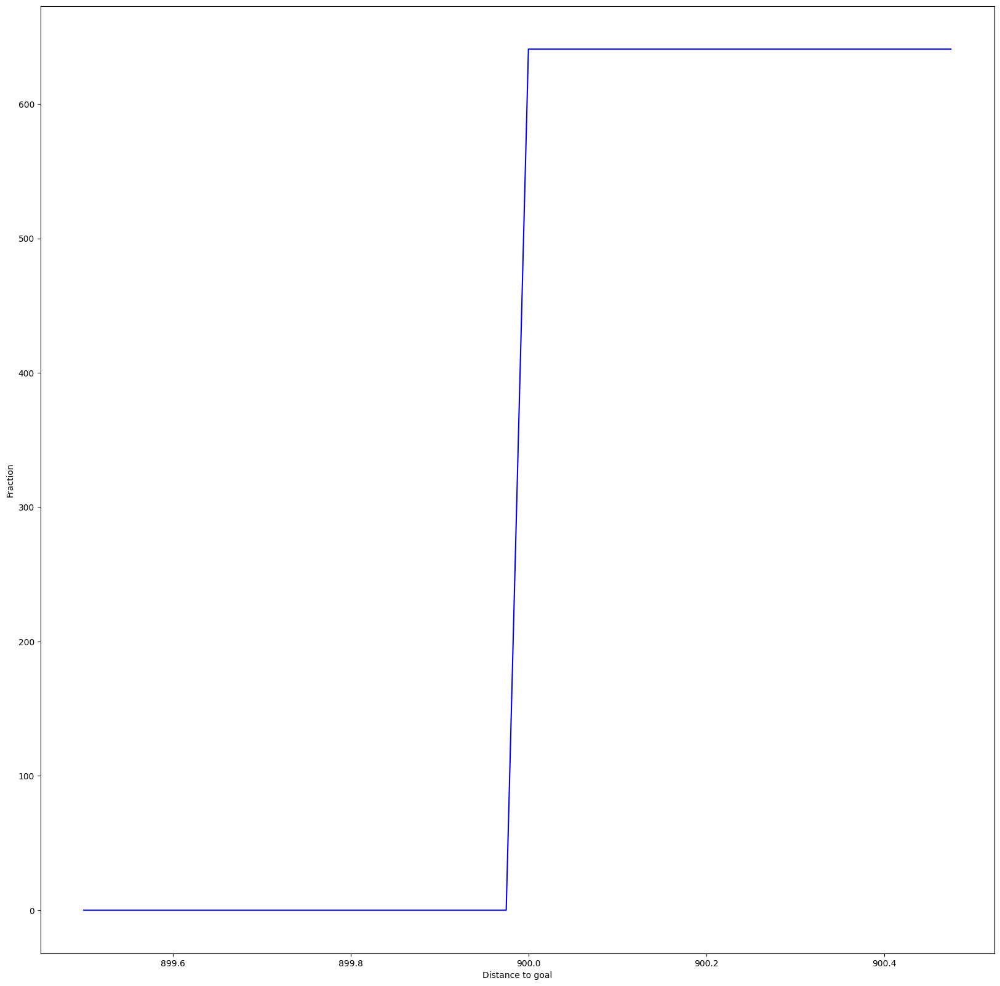

In [ ]:
plot_cumulative_distro_objective(archive)


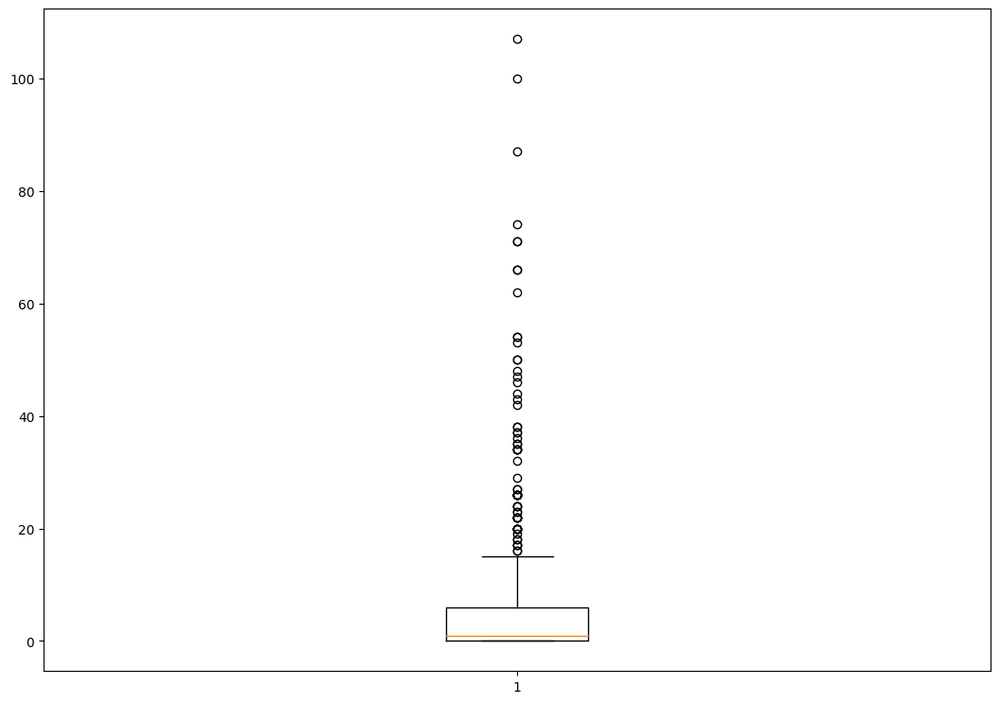

In [ ]:
plot_solution_spread(archive)


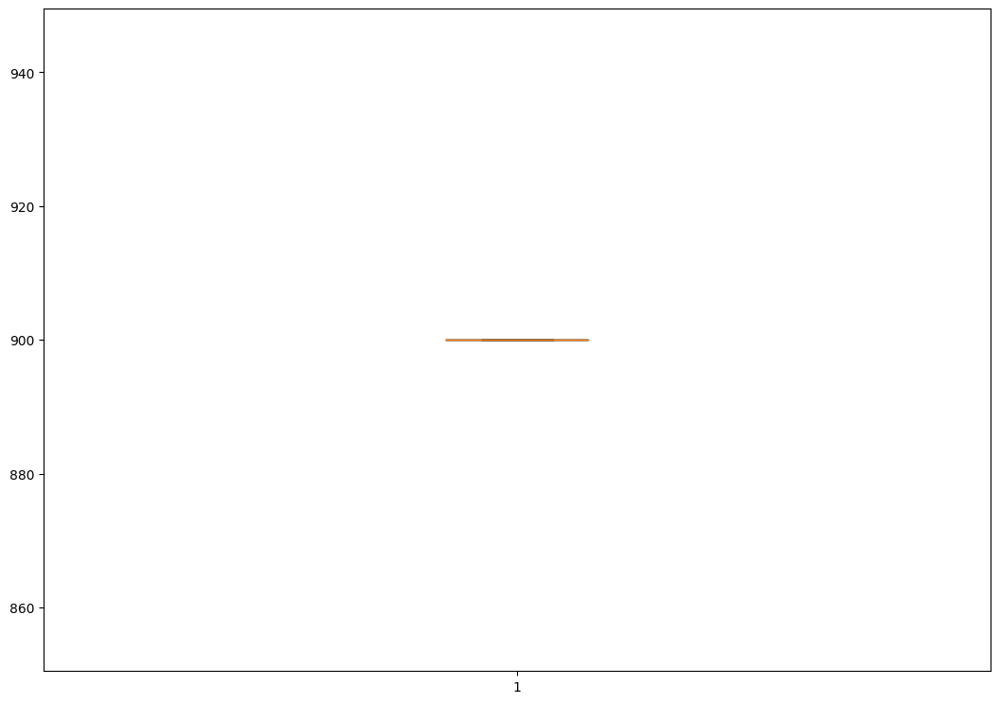

In [ ]:
plot_solution_distance(archive)

high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.0003509521484375
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.016757488250732422
Iterations:   1%|          | 1/100 [00:19<32:14, 19.54s/it]archive training
time to add to som 0.020363330841064453
Iterations:   2%|▏         | 2/100 [00:39<31:56, 19.56s/it]archive training
time to add to som 0.041457414627075195
Iterations:   3%|▎         | 3/100 [00:59<32:28, 20.09s/it]archive training
time to add to som 0.039209604263305664
Iterations:   4%|▍         | 4/100 [01:20<32:16, 20.17s/it]archive training
time to add to som 0.04850888252258301
Iterations:   5%|▌         | 5/100 [01:39<31:43, 20.04s/it]archive training
time to add to som 0.08304691314697266
Iterations:   6%|▌         | 6/100 [02:00<31:42, 20.24s/it]archive training
time to add to som 0.0673830509185791
Iterations:   7%|▋         | 7/100 [02:21<31:43, 20.47s/it]archive training
time to add to som 0.07110142707824707
Iterations:   8%|▊         | 8/10

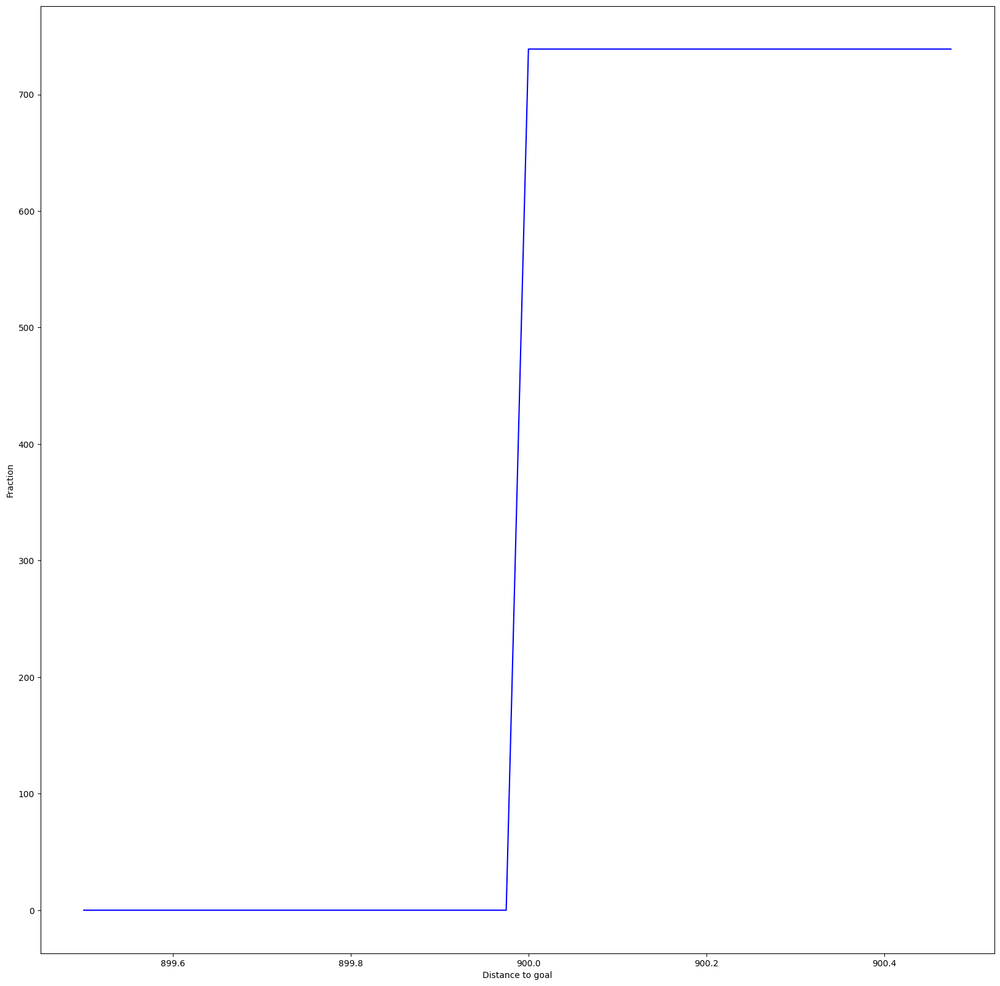

In [ ]:
plot_cumulative_distro_objective(archive)

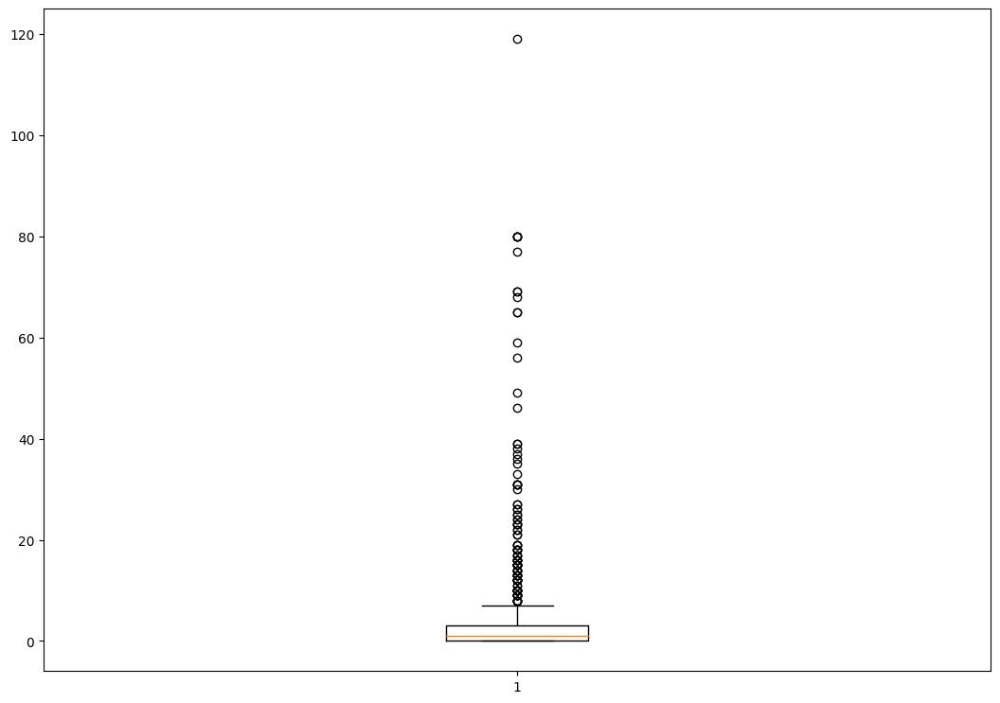

In [ ]:
plot_solution_spread(archive)

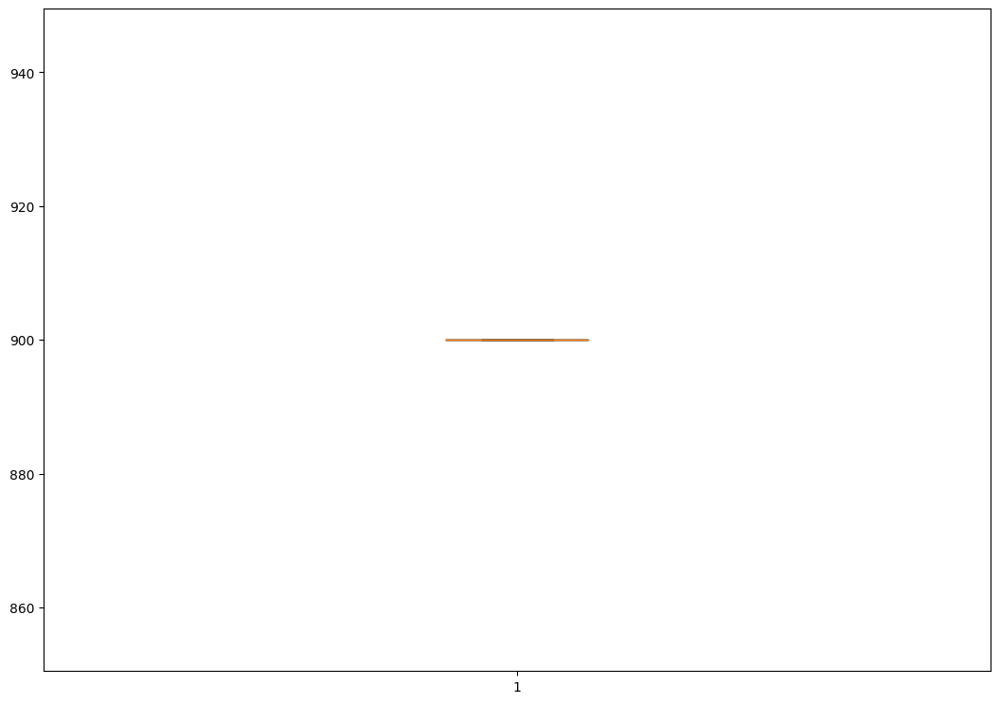

In [ ]:
plot_solution_distance(archive)

double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.0006582736968994141
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014292478561401367
Iterations:   1%|          | 1/100 [00:18<30:55, 18.75s/it]archive training
time to add to som 0.021083354949951172
Iterations:   2%|▏         | 2/100 [00:37<30:23, 18.61s/it]archive training
time to add to som 0.025716543197631836
Iterations:   3%|▎         | 3/100 [00:55<30:03, 18.59s/it]archive training
time to add to som 0.057206153869628906
Iterations:   4%|▍         | 4/100 [01:15<30:35, 19.12s/it]archive training
time to add to som 0.03399205207824707
Iterations:   5%|▌         | 5/100 [01:35<30:25, 19.21s/it]archive training
time to add to som 0.036568403244018555
Iterations:   6%|▌         | 6/100 [01:53<29:51, 19.06s/it]archive training
time to add to som 0.03875398635864258
Iterations:   7%|▋         | 7/100 [02:12<29:20, 18.93s/it]archive training
time to add to som 0.05282878875732422
Iterations:   8%|▊         |

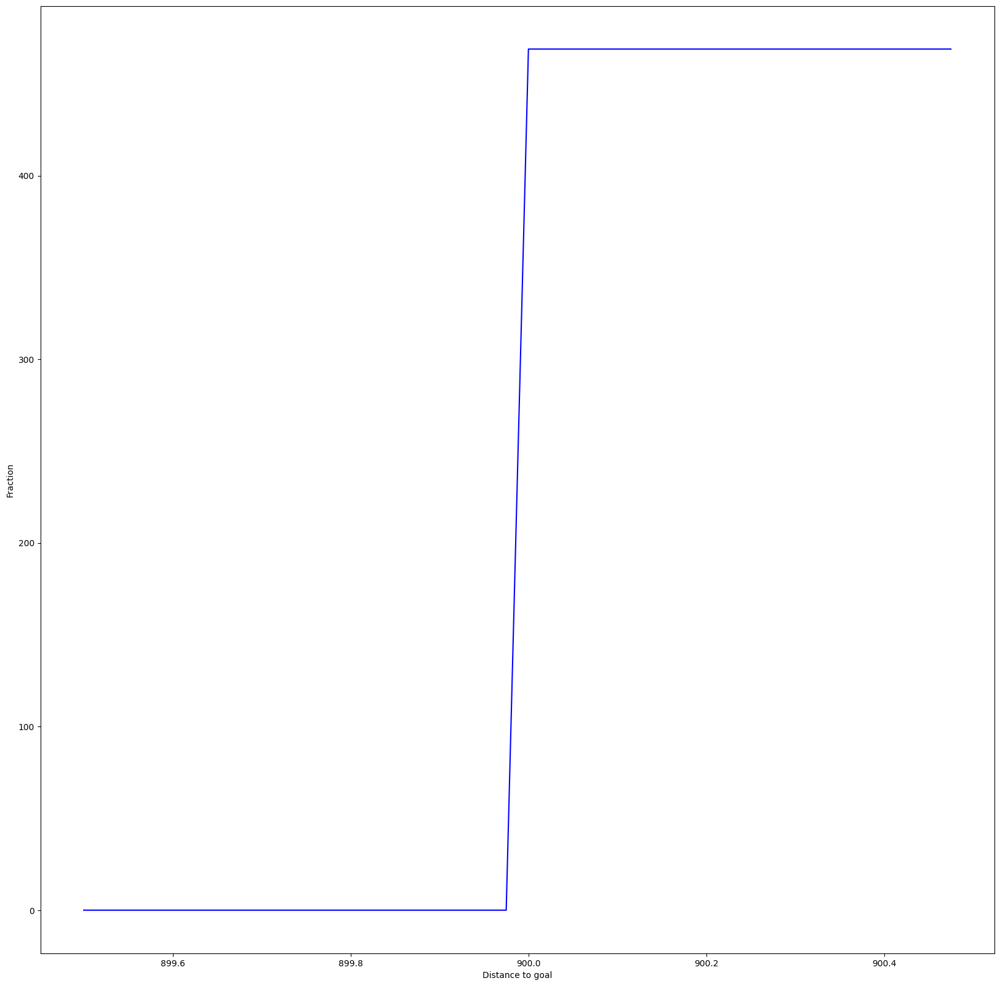

In [ ]:
plot_cumulative_distro_objective(archive)


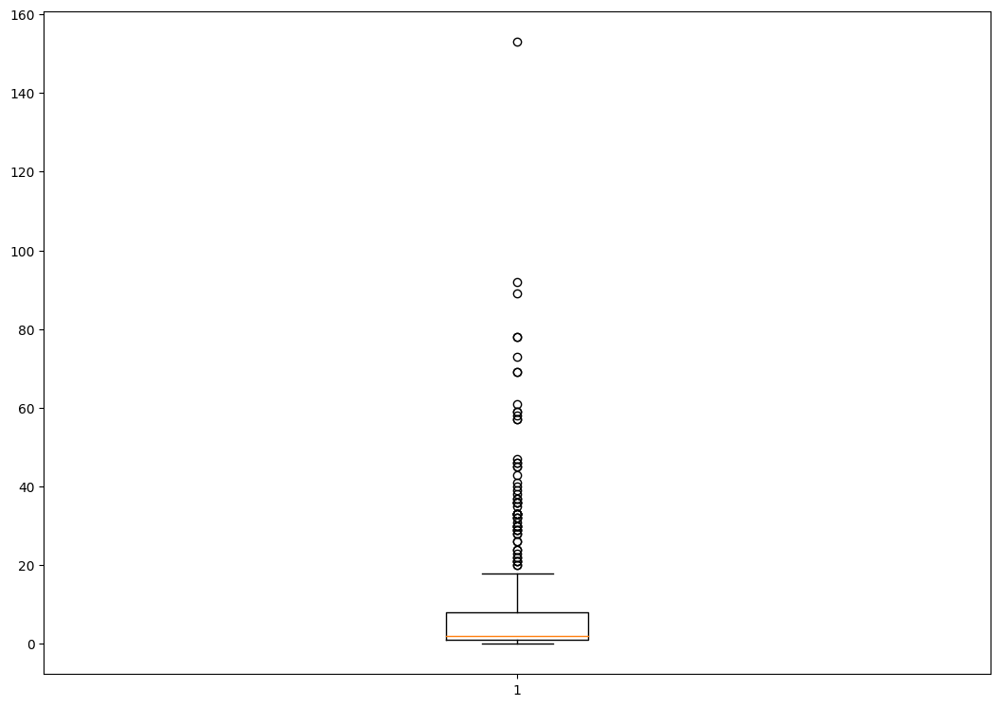

In [ ]:
plot_solution_spread(archive)


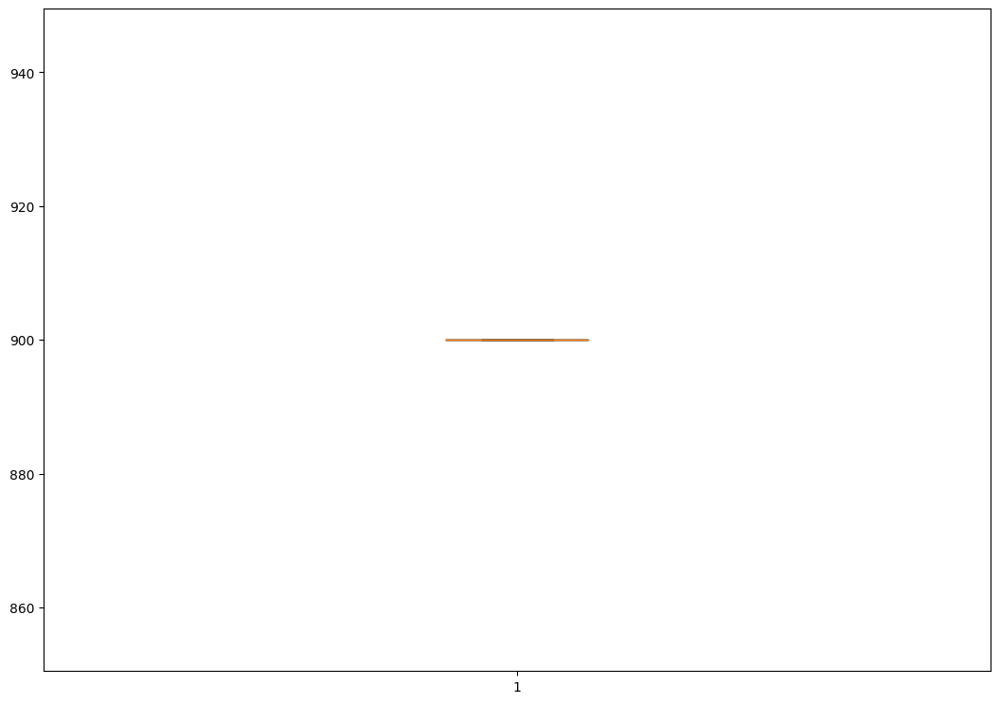

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003085136413574219
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014927148818969727
Iterations:   1%|          | 1/100 [00:19<32:45, 19.86s/it]archive training
time to add to som 0.02357959747314453
Iterations:   2%|▏         | 2/100 [00:41<34:04, 20.86s/it]archive training
time to add to som 0.03119802474975586
Iterations:   3%|▎         | 3/100 [01:01<32:58, 20.40s/it]archive training
time to add to som 0.03719019889831543
Iterations:   4%|▍         | 4/100 [01:21<32:26, 20.28s/it]archive training
time to add to som 0.04154038429260254
Iterations:   5%|▌         | 5/100 [01:42<32:51, 20.75s/it]archive training
time to add to som 0.05121421813964844
Iterations:   6%|▌         | 6/100 [02:02<32:00, 20.43s/it]archive training
time to add to som 0.05135345458984375
Iterations:   7%|▋         | 7/100 [02:23<31:38, 20.42s/it]archive training
time to add to som 0.05704951286315918
Iterations:   8%|▊         | 8/1

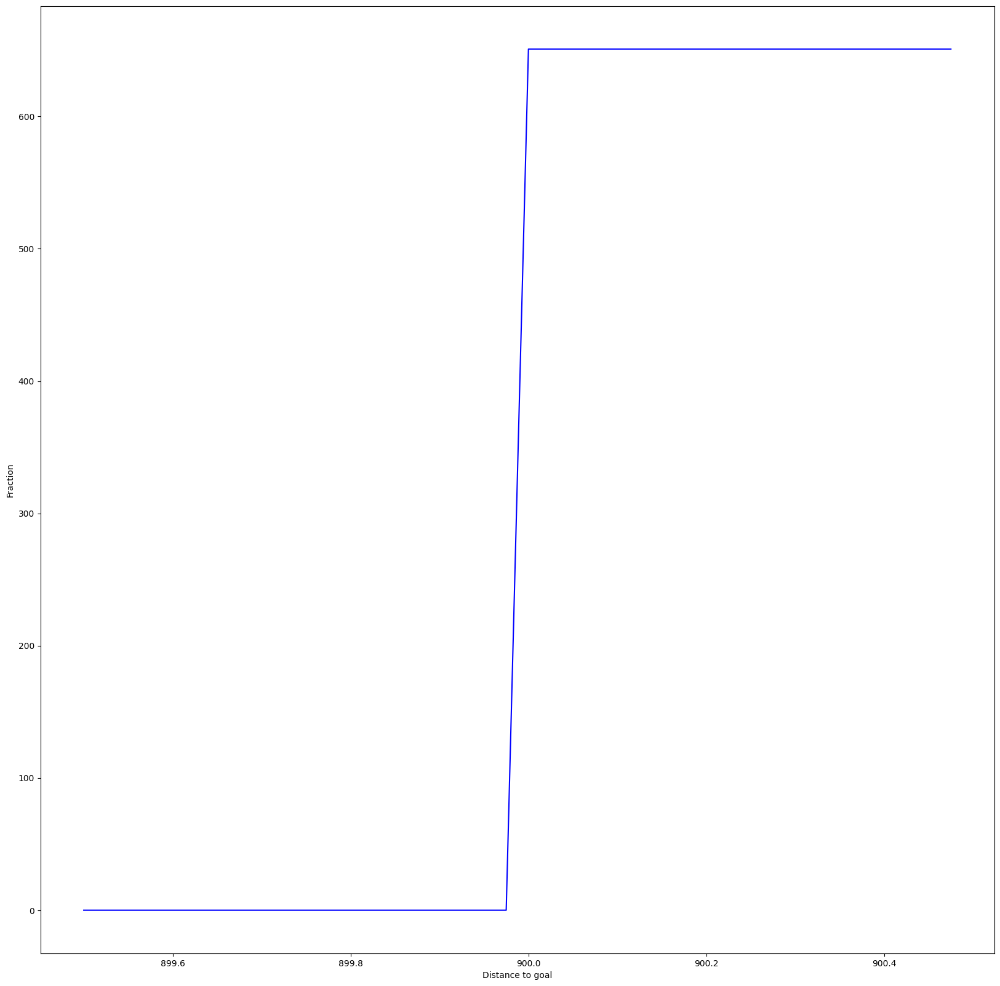

In [ ]:
plot_cumulative_distro_objective(archive)


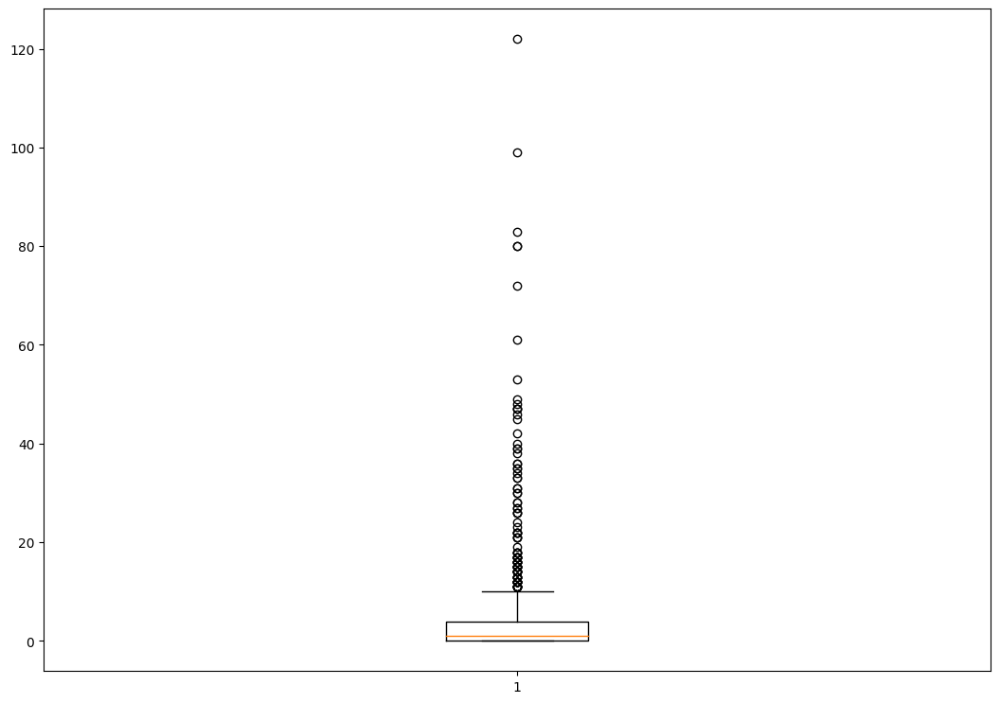

In [ ]:
plot_solution_spread(archive)


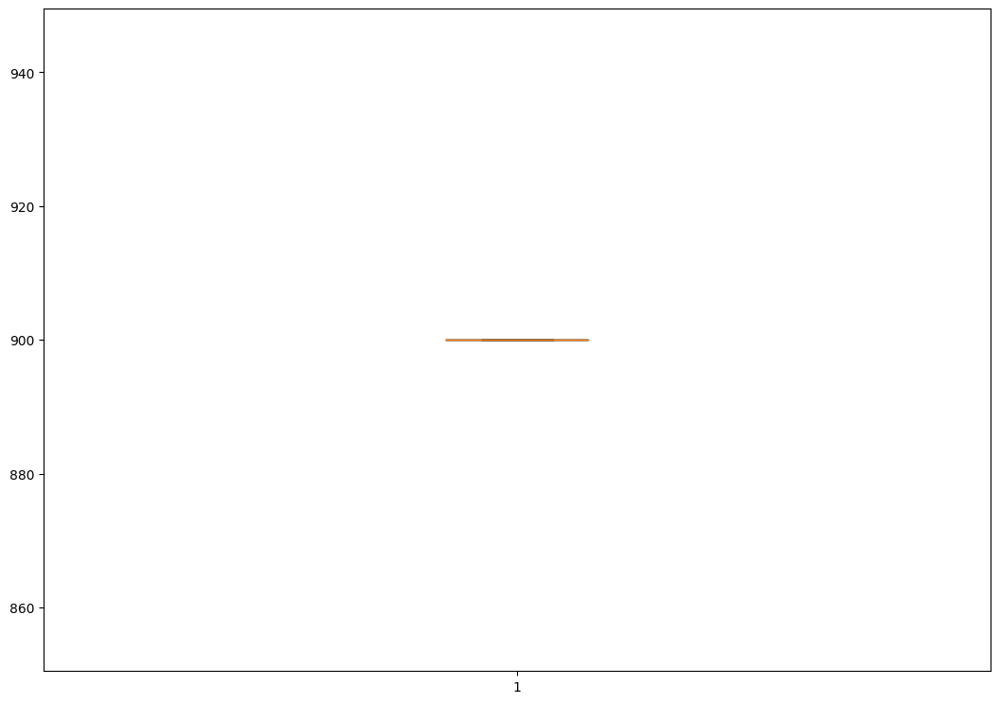

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 500, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.0003647804260253906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.021822690963745117
Iterations:   1%|          | 1/100 [00:35<57:55, 35.11s/it]archive training
time to add to som 0.019002437591552734
Iterations:   2%|▏         | 2/100 [01:09<56:47, 34.77s/it]archive training
time to add to som 0.026368379592895508
Iterations:   3%|▎         | 3/100 [01:43<55:34, 34.38s/it]archive training
time to add to som 0.04776358604431152
Iterations:   4%|▍         | 4/100 [02:17<55:00, 34.38s/it]archive training
time to add to som 0.054711341857910156
Iterations:   5%|▌         | 5/100 [02:53<54:55, 34.69s/it]archive training
time to add to som 0.041426897048950195
Iterations:   6%|▌         | 6/100 [03:28<54:52, 35.03s/it]archive training
time to add to som 0.04360508918762207
Iterations:   7%|▋         | 7/100 [04:02<53:48, 34.72s/it]archive training
time to add to som 0.06174731254577637
Iterations:   8%|▊         |

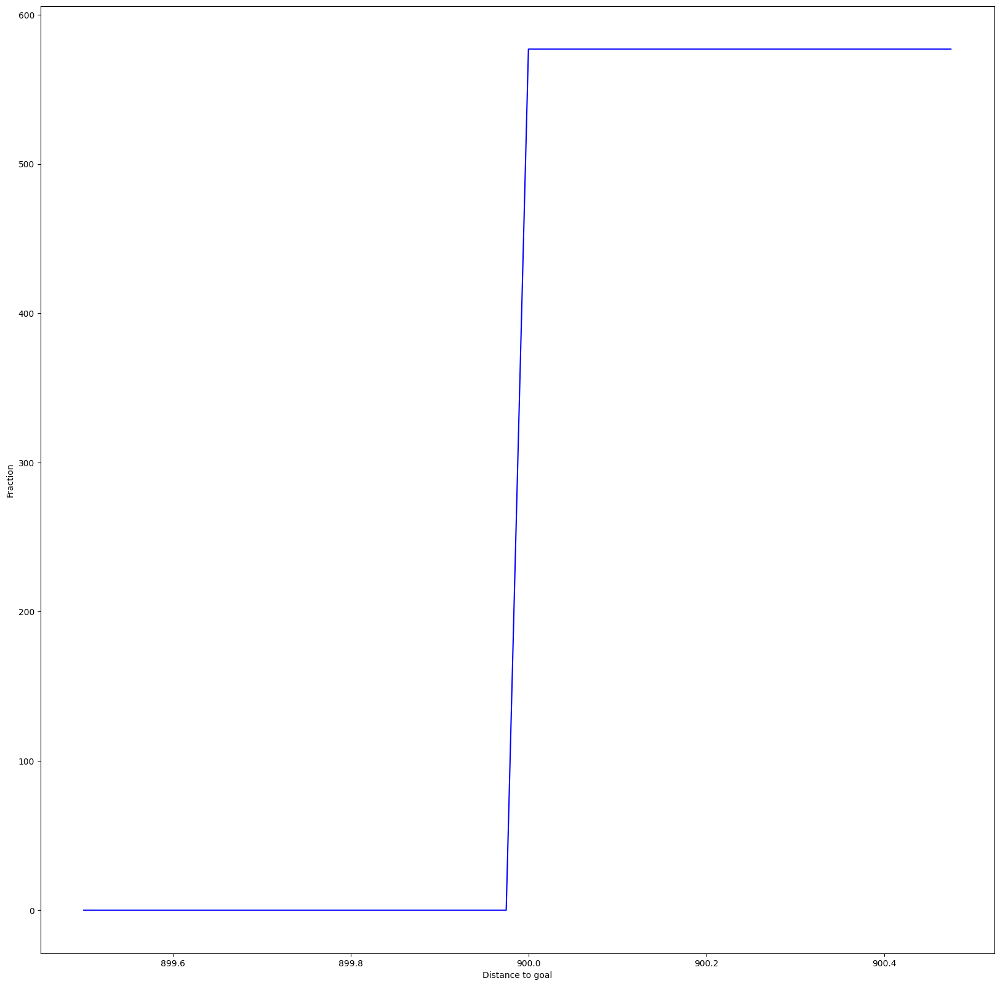

In [ ]:
plot_cumulative_distro_objective(archive)


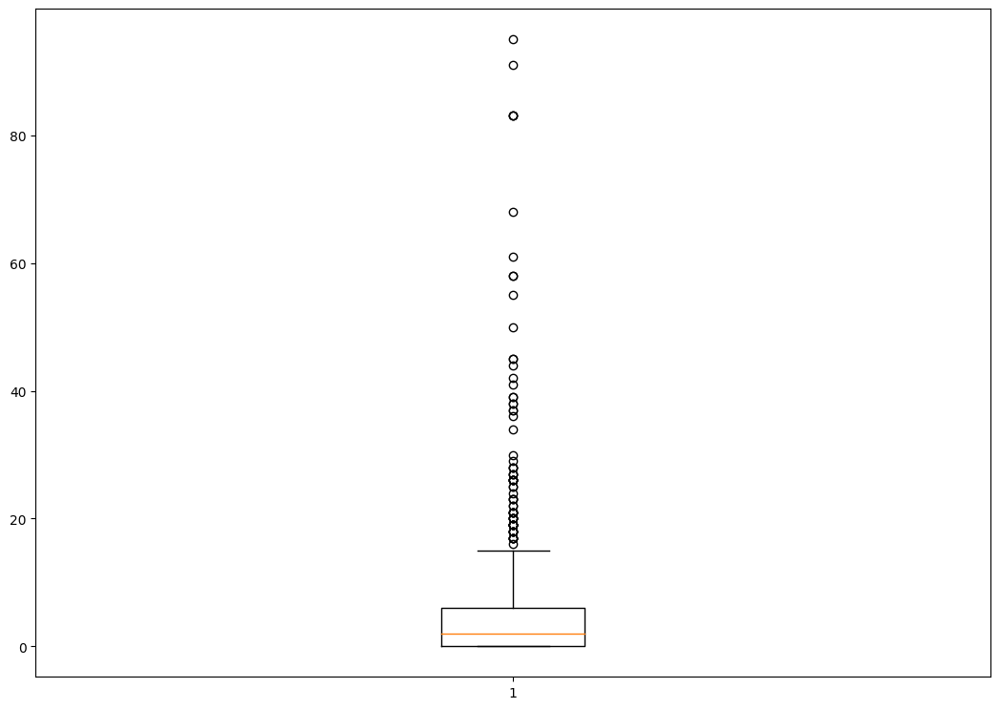

In [ ]:
plot_solution_spread(archive)


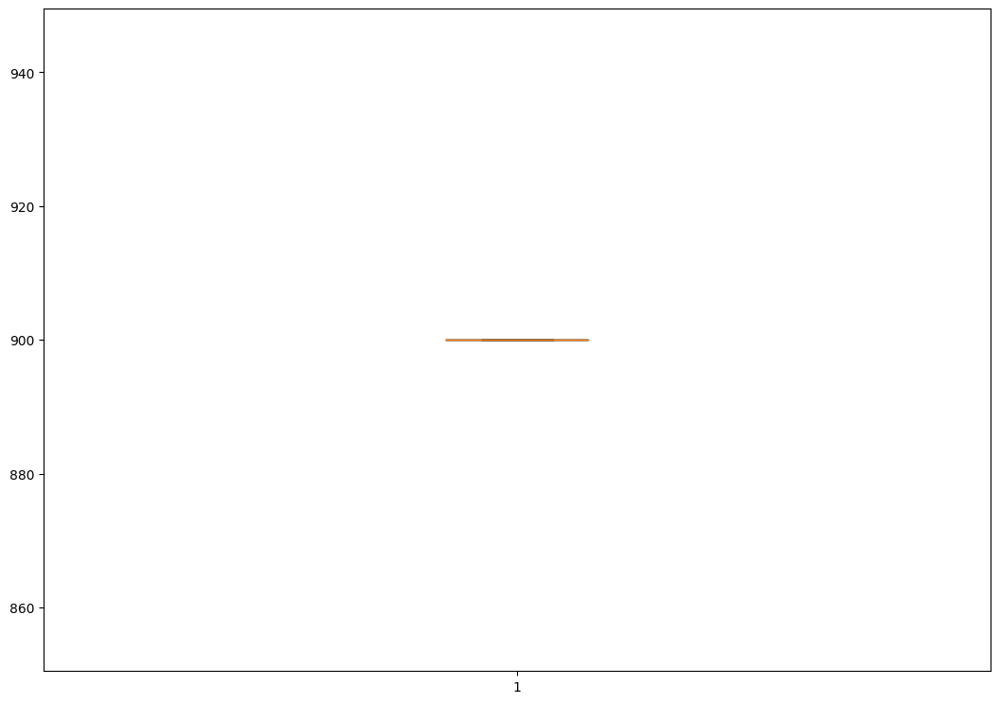

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze3", dim = 500, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0004432201385498047
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 2.8223345279693604
Iterations:   1%|          | 1/100 [00:58<1:35:47, 58.05s/it]archive training
time to add to som 0.039026737213134766
Iterations:   2%|▏         | 2/100 [01:41<1:20:48, 49.48s/it]archive training
time to add to som 0.036106109619140625
Iterations:   3%|▎         | 3/100 [02:42<1:28:42, 54.87s/it]archive training
time to add to som 0.04187774658203125
Iterations:   4%|▍         | 4/100 [03:18<1:15:42, 47.32s/it]archive training
time to add to som 0.06676483154296875
Iterations:   5%|▌         | 5/100 [03:54<1:08:30, 43.27s/it]archive training
time to add to som 0.06158947944641113
Iterations:   6%|▌         | 6/100 [04:34<1:05:46, 41.99s/it]archive training
time to add to som 0.06908535957336426
Iterations:   7%|▋         | 7/100 [05:10<1:02:03, 40.04s/it]archive training
time to add to som 0.11099529266357422
Iterations:   8%|▊

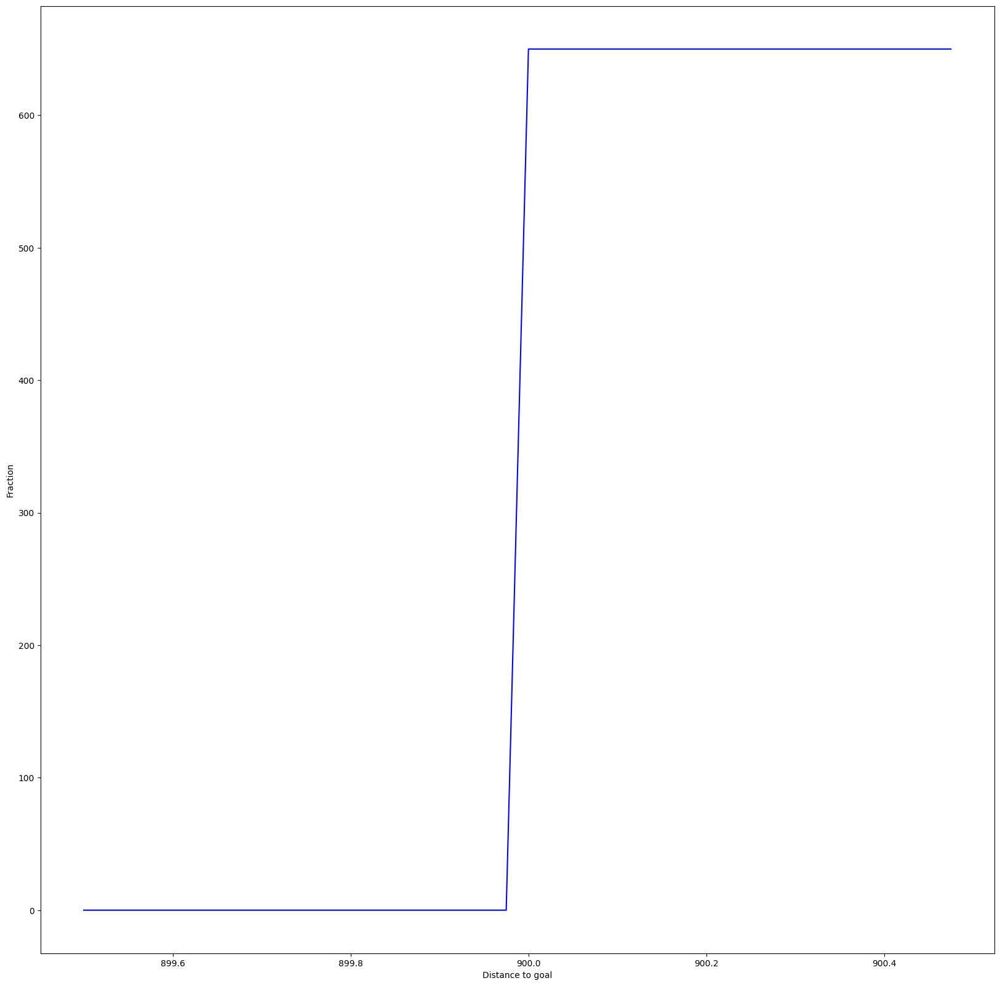

In [ ]:
plot_cumulative_distro_objective(archive)

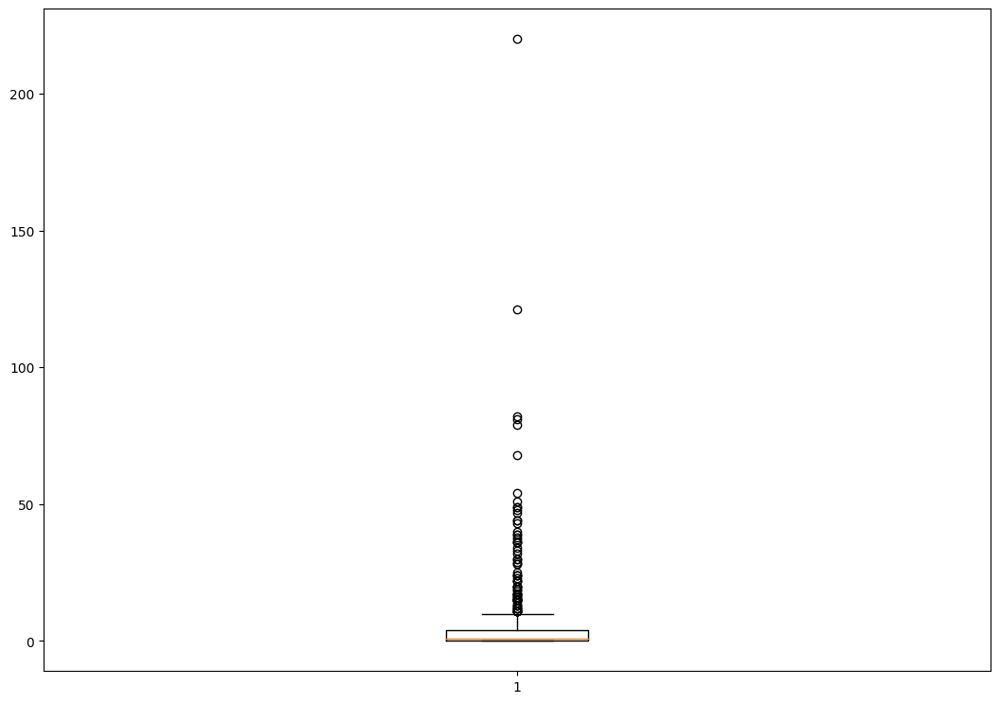

In [ ]:
plot_solution_spread(archive)

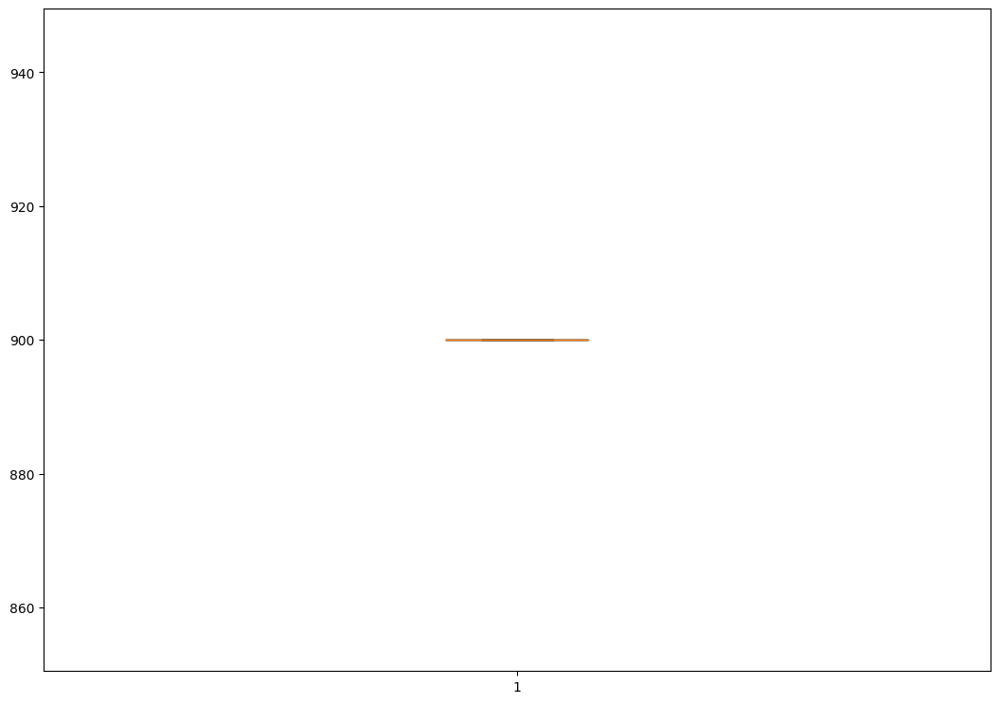

In [ ]:
plot_solution_distance(archive)

#####**11.1.4 maze 4**

######*11.1.1 2d*

cvt

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze4")

extra time to initialize archive 35.62418079376221
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.003191232681274414
Iterations:   1%|          | 1/100 [00:17<28:09, 17.07s/it]archive training
time to add to cvt 0.003167390823364258
Iterations:   2%|▏         | 2/100 [00:34<27:48, 17.02s/it]archive training
time to add to cvt 0.004428386688232422
Iterations:   3%|▎         | 3/100 [00:51<28:02, 17.35s/it]archive training
time to add to cvt 0.0036492347717285156
Iterations:   4%|▍         | 4/100 [01:10<28:22, 17.73s/it]archive training
time to add to cvt 0.0030939579010009766
Iterations:   5%|▌         | 5/100 [01:27<27:57, 17.66s/it]archive training
time to add to cvt 0.0031461715698242188
Iterations:   6%|▌         | 6/100 [01:45<27:31, 17.57s/it]archive training
time to add to cvt 0.00481724739074707
Iterations:   7%|▋         | 7/100 [02:02<27:19, 17.63s/it]archive training
time to add to cvt 0.003045797348022461
Iterations:   8%|▊         

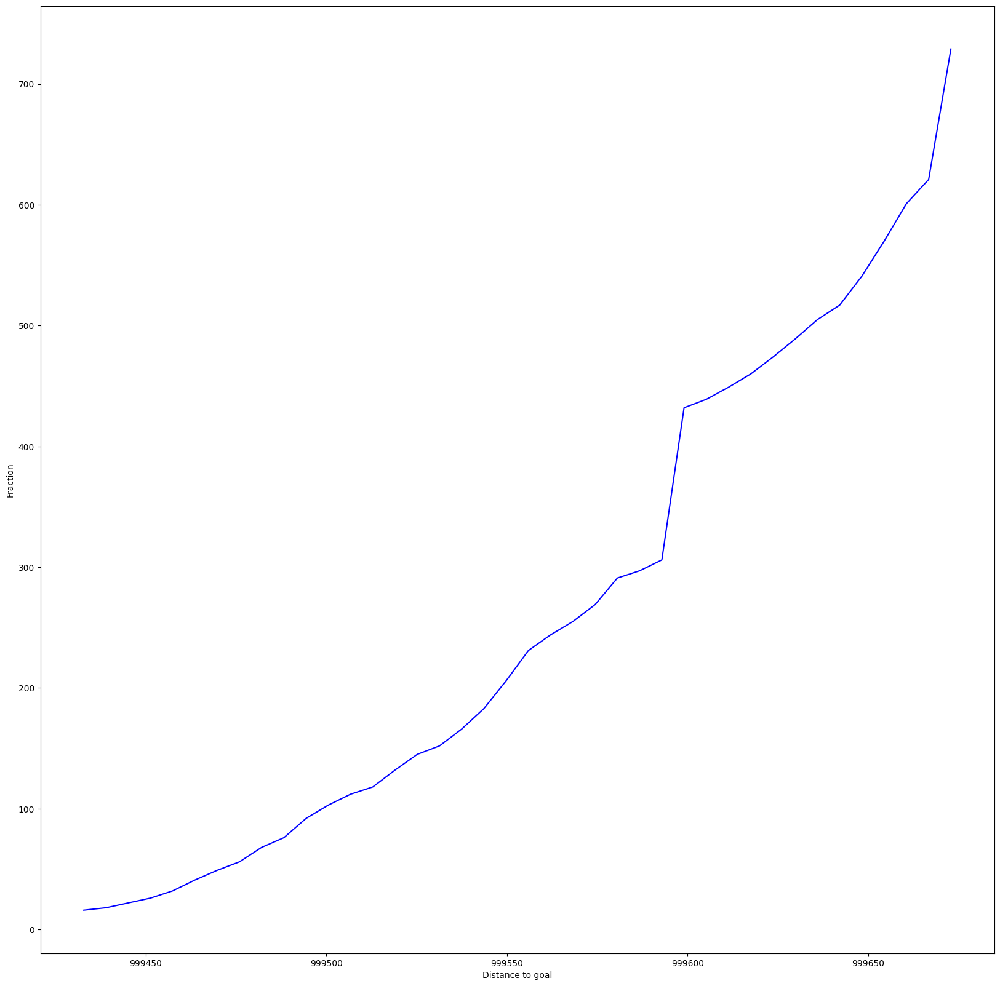

In [ ]:
plot_cumulative_distro_objective(archive)

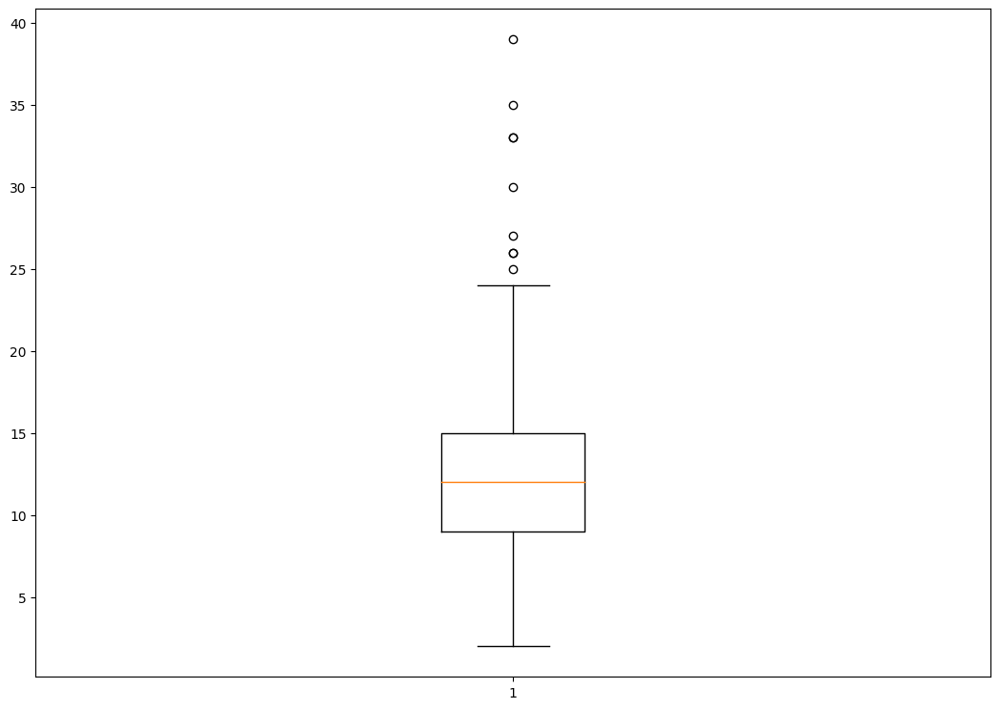

In [ ]:
plot_solution_spread(archive)

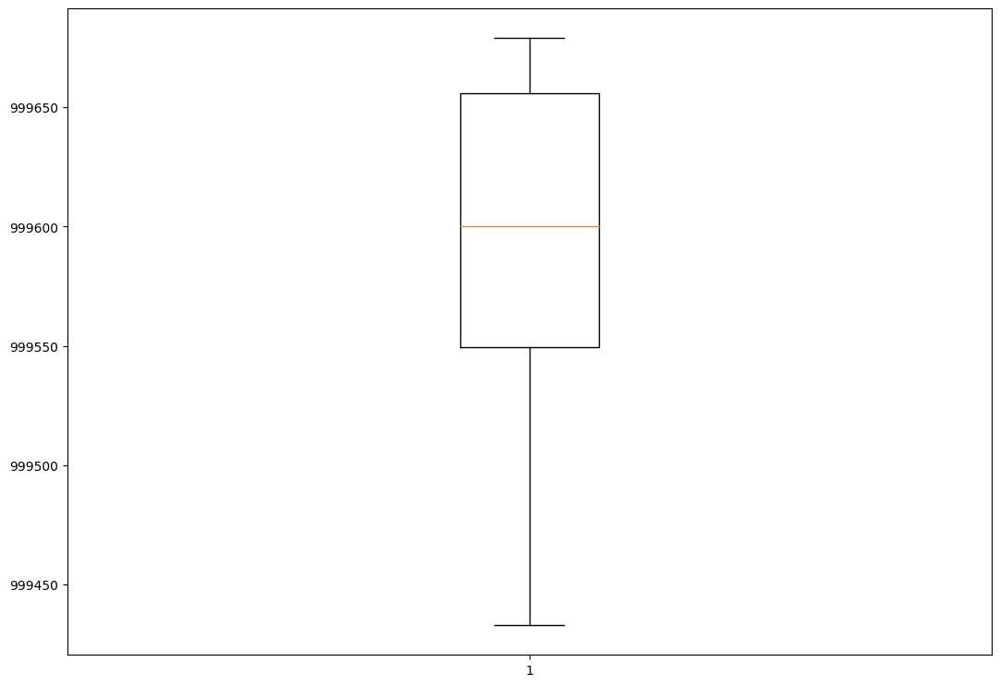

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4")

extra time to initialize archive 0.0006389617919921875
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.013326883316040039
Iterations:   1%|          | 1/100 [00:35<57:51, 35.07s/it]archive training
time to add to som 0.02177262306213379
Iterations:   2%|▏         | 2/100 [01:09<56:32, 34.62s/it]archive training
time to add to som 0.016058921813964844
Iterations:   3%|▎         | 3/100 [01:43<55:57, 34.61s/it]archive training
time to add to som 0.034479618072509766
Iterations:   4%|▍         | 4/100 [02:21<57:01, 35.64s/it]archive training
time to add to som 0.017789840698242188
Iterations:   5%|▌         | 5/100 [02:55<55:40, 35.16s/it]archive training
time to add to som 0.035221099853515625
Iterations:   6%|▌         | 6/100 [03:30<54:47, 34.97s/it]archive training
time to add to som 0.029686689376831055
Iterations:   7%|▋         | 7/100 [04:04<54:00, 34.84s/it]archive training
time to add to som 0.019771099090576172
Iterations:   8%|▊        

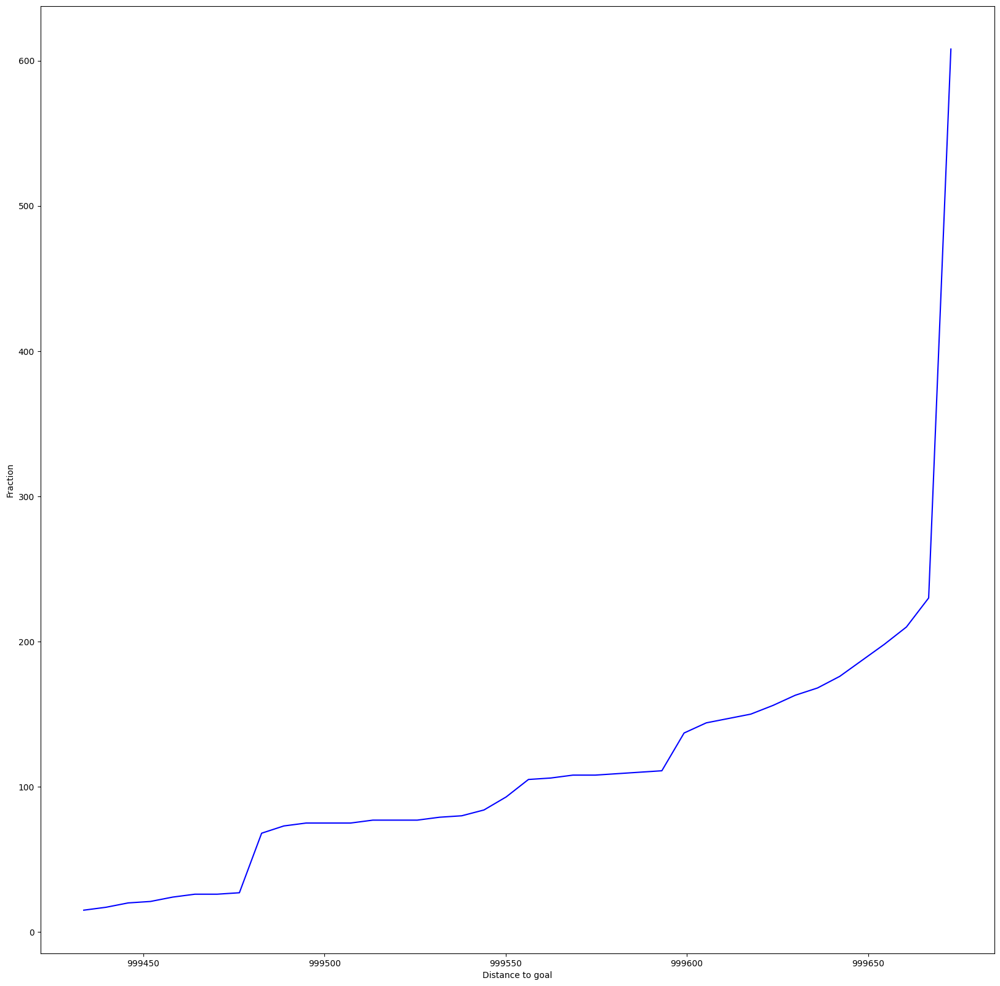

In [ ]:
plot_cumulative_distro_objective(archive)

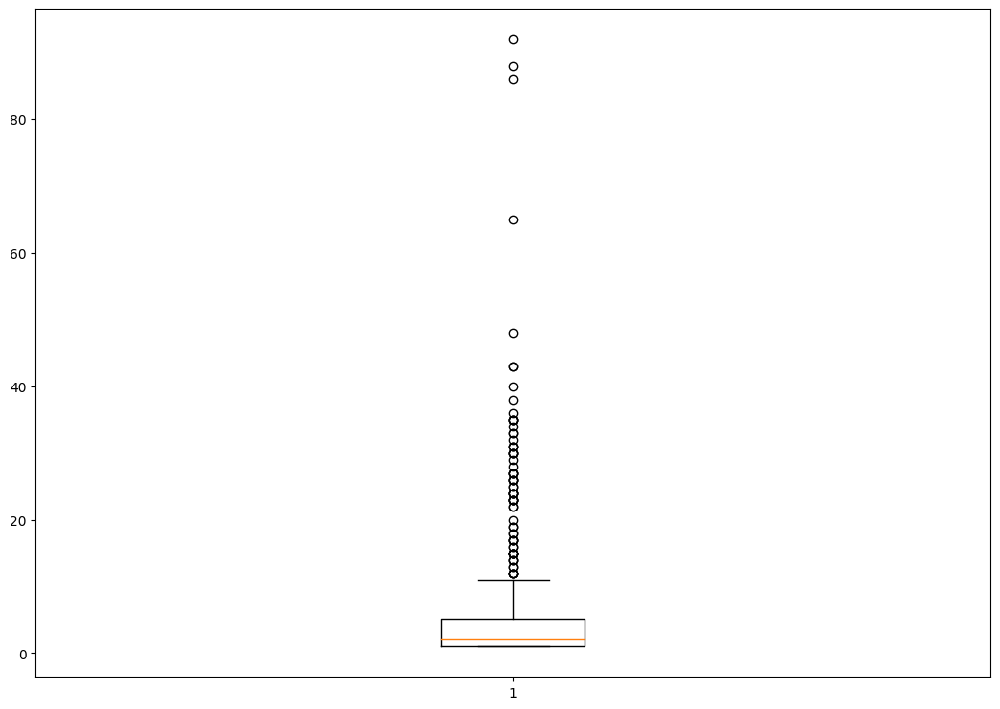

In [ ]:
plot_solution_spread(archive)


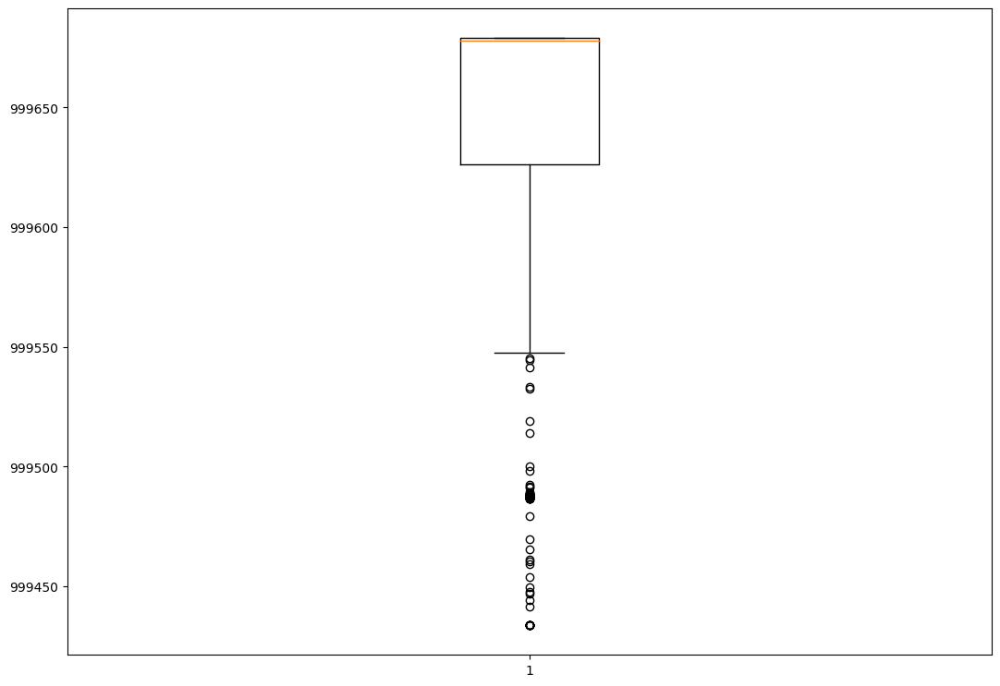

In [ ]:
plot_solution_distance(archive)

som high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.0005590915679931641
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.0180966854095459
Iterations:   1%|          | 1/100 [00:20<33:54, 20.55s/it]archive training
time to add to som 0.01248788833618164
Iterations:   2%|▏         | 2/100 [00:41<33:42, 20.64s/it]archive training
time to add to som 0.016466856002807617
Iterations:   3%|▎         | 3/100 [01:01<32:59, 20.41s/it]archive training
time to add to som 0.02488112449645996
Iterations:   4%|▍         | 4/100 [01:22<33:04, 20.67s/it]archive training
time to add to som 0.020296096801757812
Iterations:   5%|▌         | 5/100 [01:43<32:50, 20.74s/it]archive training
time to add to som 0.020334959030151367
Iterations:   6%|▌         | 6/100 [02:03<32:05, 20.48s/it]archive training
time to add to som 0.031077861785888672
Iterations:   7%|▋         | 7/100 [02:24<32:06, 20.71s/it]archive training
time to add to som 0.02399897575378418
Iterations:   8%|▊         | 8

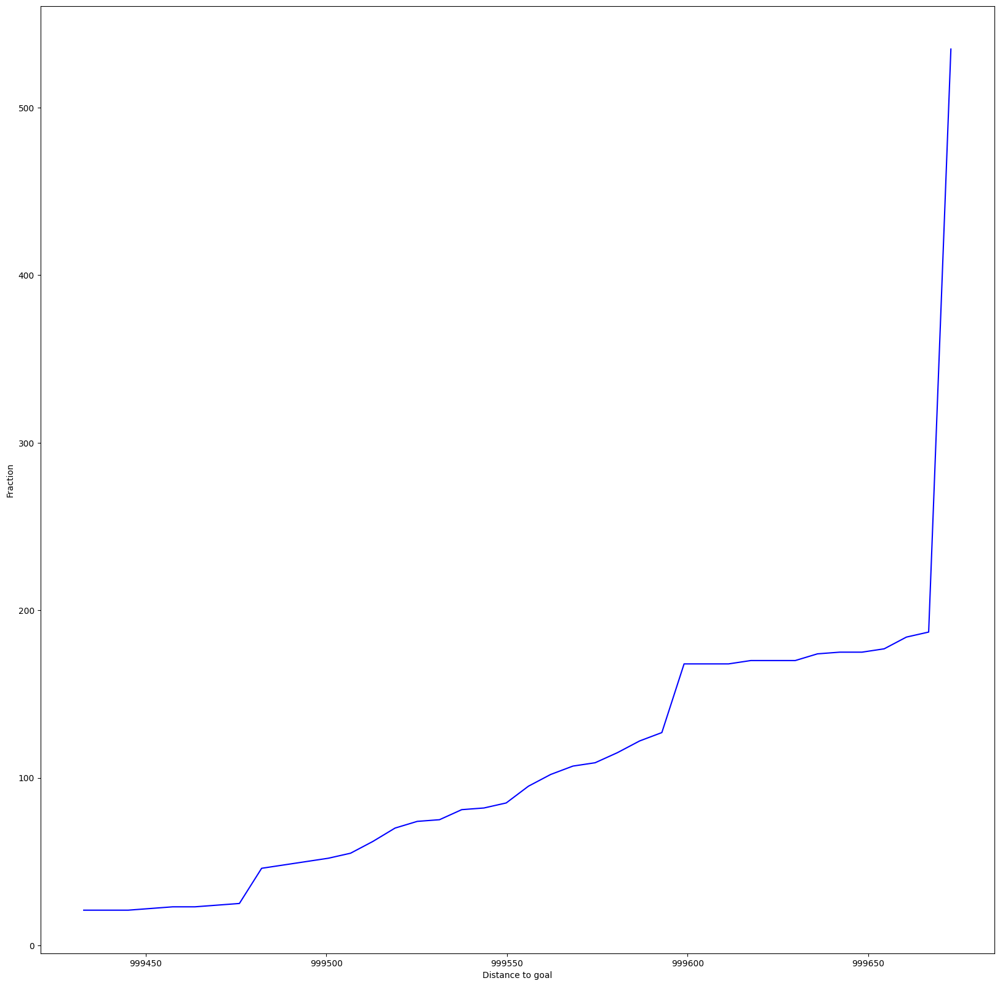

In [ ]:
plot_cumulative_distro_objective(archive)


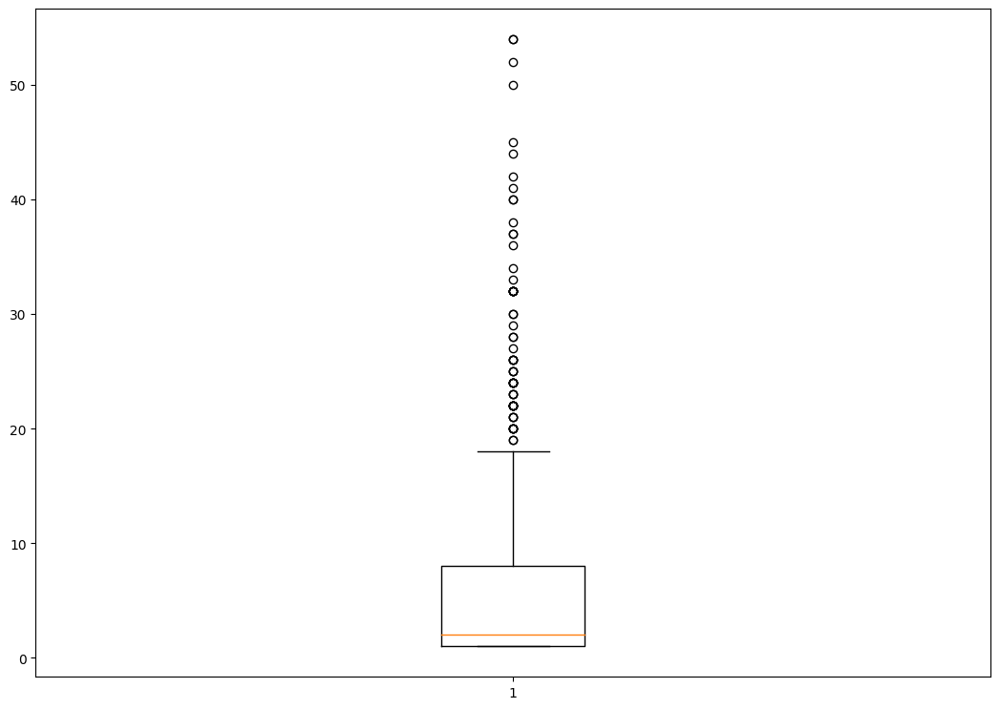

In [ ]:
plot_solution_spread(archive)


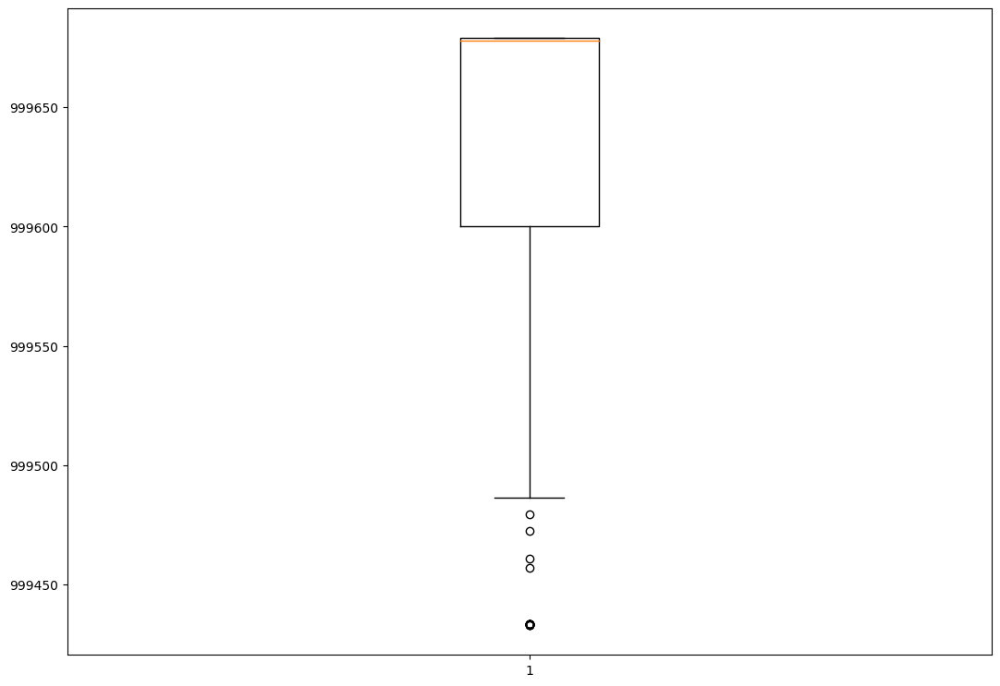

In [ ]:
plot_solution_distance(archive)

som double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 2, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003724098205566406
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.011342048645019531
Iterations:   1%|          | 1/100 [00:19<31:29, 19.08s/it]archive training
time to add to som 0.013704538345336914
Iterations:   2%|▏         | 2/100 [00:38<31:06, 19.05s/it]archive training
time to add to som 0.02073955535888672
Iterations:   3%|▎         | 3/100 [00:58<31:56, 19.76s/it]archive training
time to add to som 0.016361713409423828
Iterations:   4%|▍         | 4/100 [01:18<31:35, 19.75s/it]archive training
time to add to som 0.013843536376953125
Iterations:   5%|▌         | 5/100 [01:37<31:04, 19.62s/it]archive training
time to add to som 0.020798683166503906
Iterations:   6%|▌         | 6/100 [01:57<30:53, 19.71s/it]archive training
time to add to som 0.014708518981933594
Iterations:   7%|▋         | 7/100 [02:18<31:06, 20.07s/it]archive training
time to add to som 0.01547384262084961
Iterations:   8%|▊         

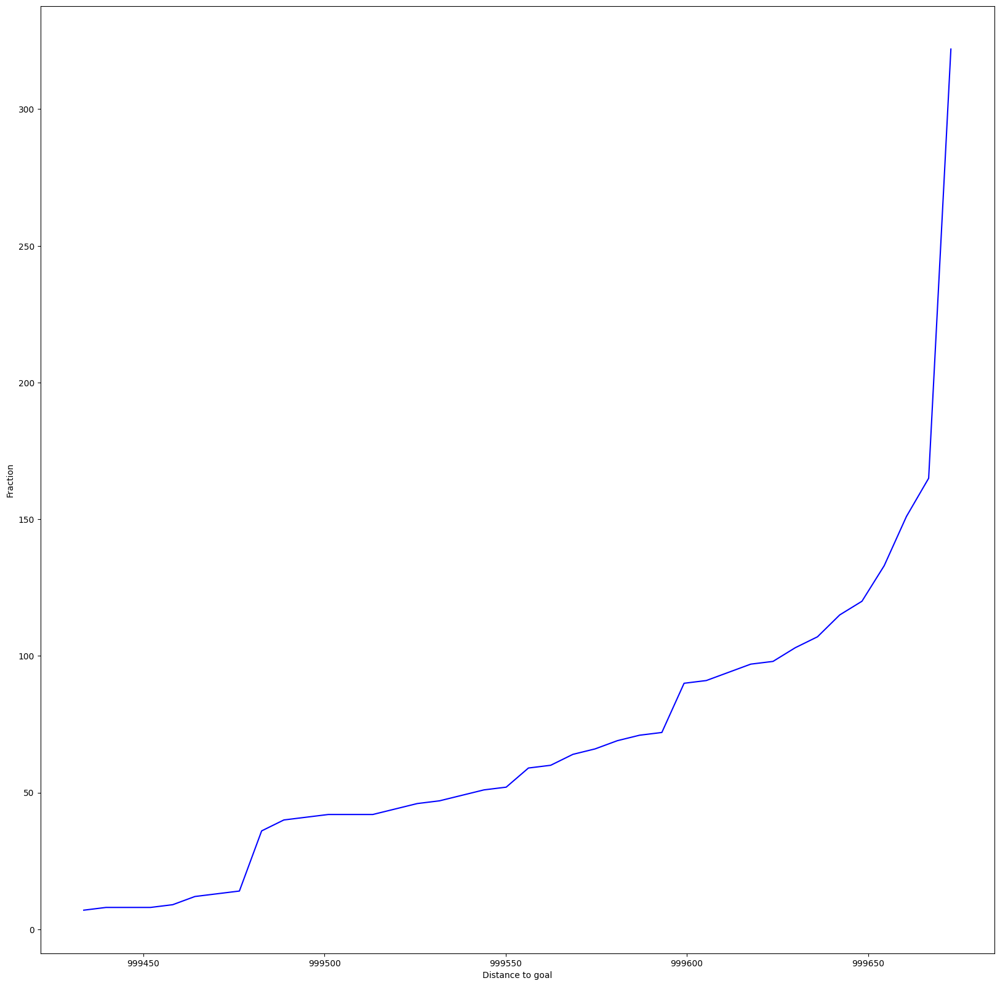

In [ ]:
plot_cumulative_distro_objective(archive)


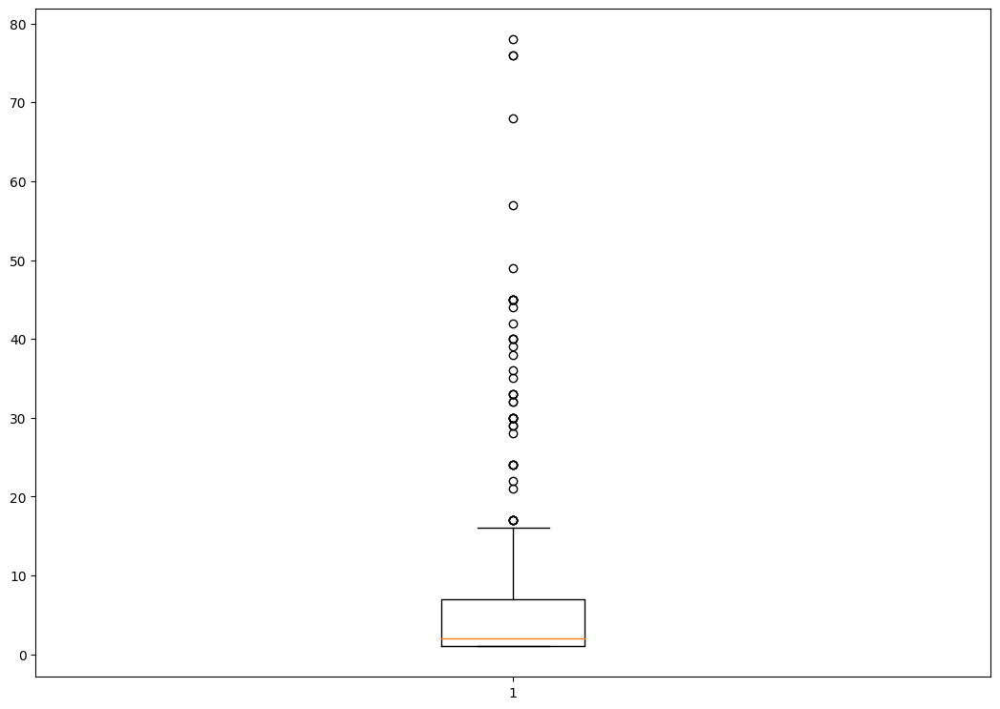

In [ ]:
plot_solution_spread(archive)


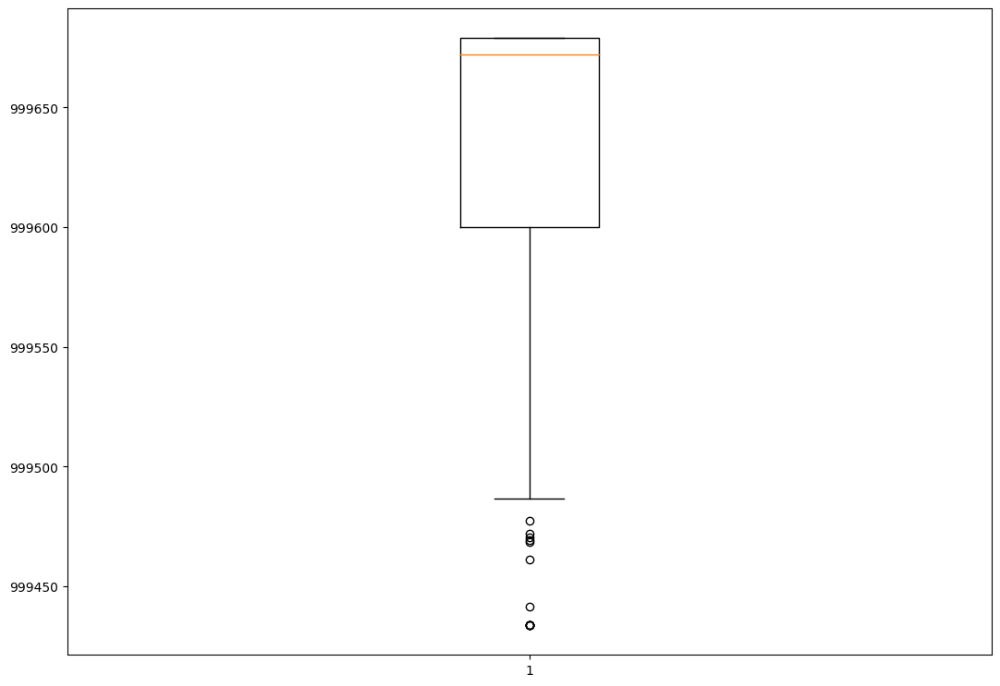

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 2, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0008323192596435547
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012530803680419922
Iterations:   1%|          | 1/100 [00:21<35:06, 21.28s/it]archive training
time to add to som 0.02277374267578125
Iterations:   2%|▏         | 2/100 [00:42<34:47, 21.30s/it]archive training
time to add to som 0.014551401138305664
Iterations:   3%|▎         | 3/100 [01:05<35:20, 21.86s/it]archive training
time to add to som 0.07390666007995605
Iterations:   4%|▍         | 4/100 [01:31<37:55, 23.71s/it]archive training
time to add to som 0.018794775009155273
Iterations:   5%|▌         | 5/100 [01:55<37:50, 23.90s/it]archive training
time to add to som 0.019091367721557617
Iterations:   6%|▌         | 6/100 [02:16<35:45, 22.82s/it]archive training
time to add to som 0.01735234260559082
Iterations:   7%|▋         | 7/100 [02:39<35:23, 22.84s/it]archive training
time to add to som 0.020231008529663086
Iterations:   8%|▊         |

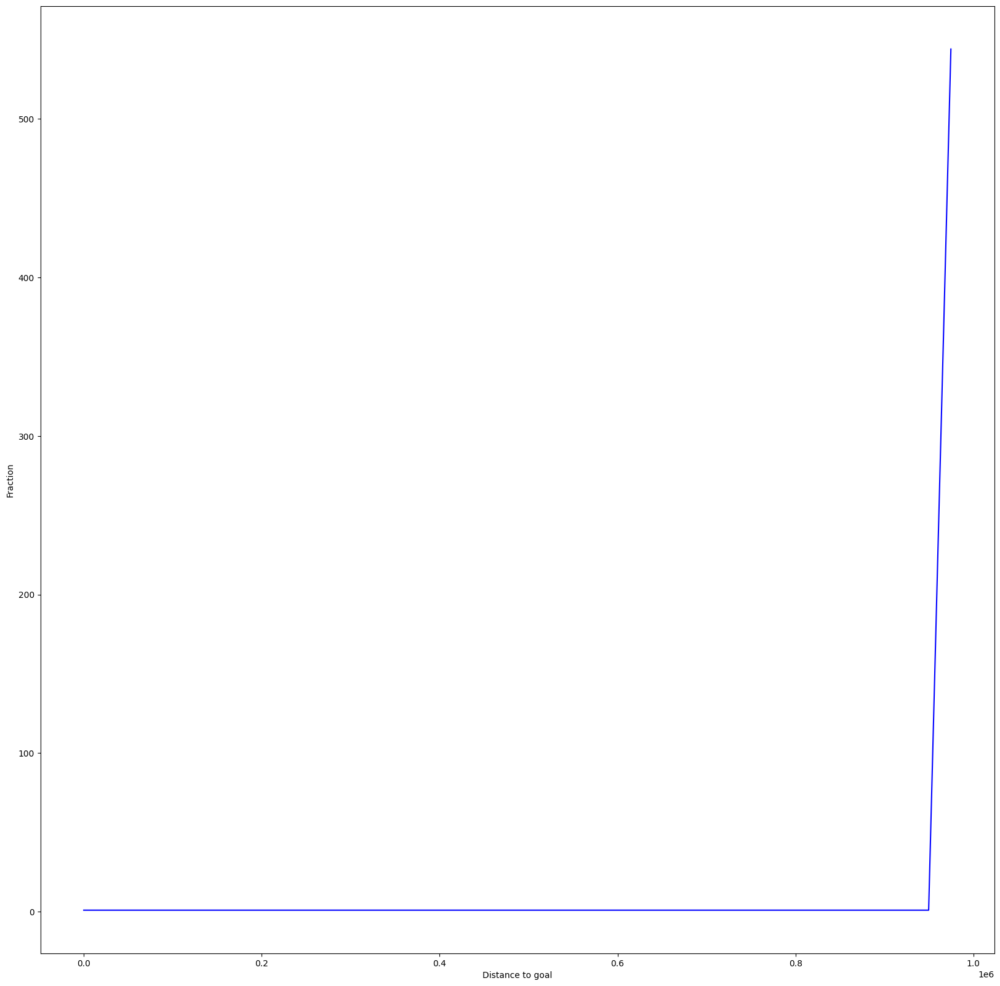

In [ ]:
plot_cumulative_distro_objective(archive)


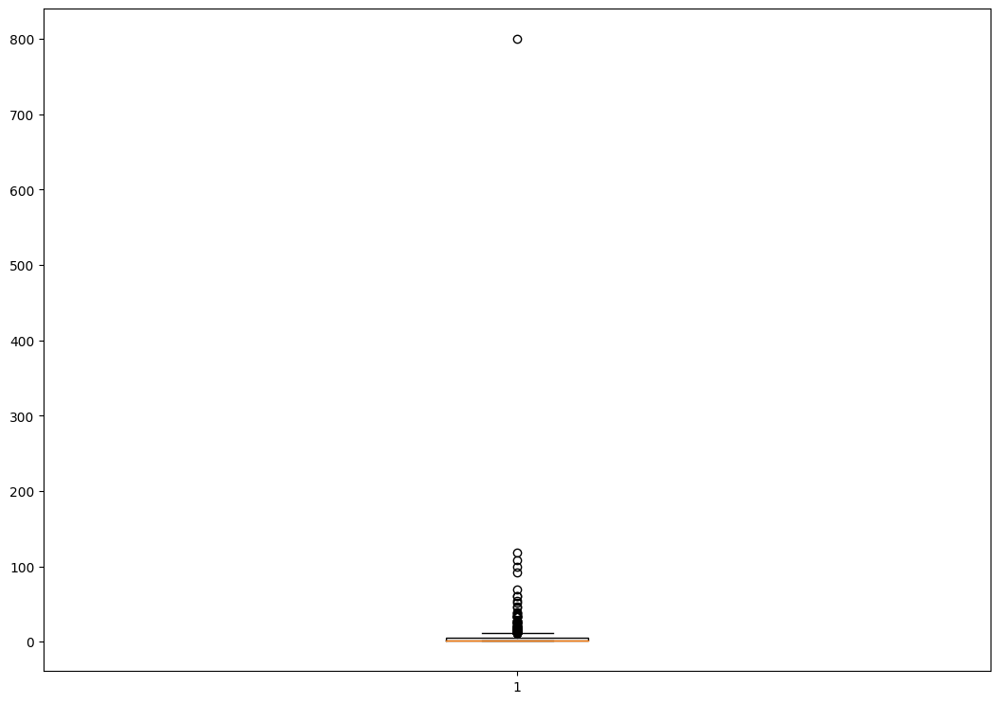

In [ ]:
plot_solution_spread(archive)


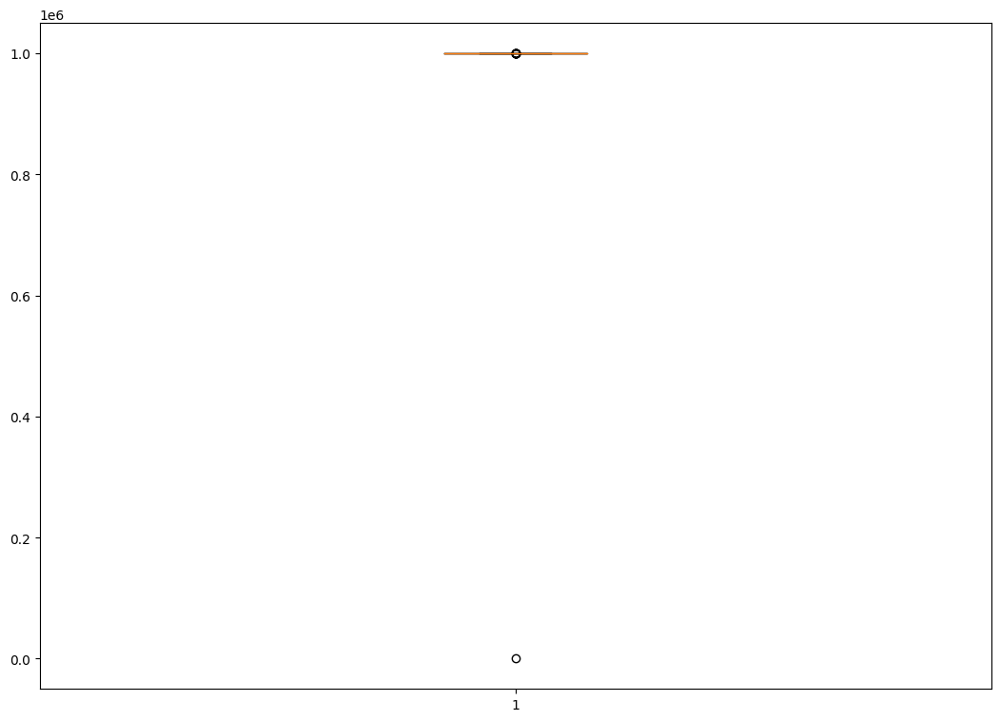

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 2, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.001703023910522461
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.023070812225341797
Iterations:   1%|          | 1/100 [00:37<1:01:48, 37.45s/it]archive training
time to add to som 0.012085676193237305
Iterations:   2%|▏         | 2/100 [01:14<1:00:39, 37.14s/it]archive training
time to add to som 0.013872623443603516
Iterations:   3%|▎         | 3/100 [01:48<58:08, 35.97s/it]  archive training
time to add to som 0.020728111267089844
Iterations:   4%|▍         | 4/100 [02:24<57:31, 35.95s/it]archive training
time to add to som 0.015302181243896484
Iterations:   5%|▌         | 5/100 [03:01<57:24, 36.26s/it]archive training
time to add to som 0.023424863815307617
Iterations:   6%|▌         | 6/100 [03:38<57:13, 36.53s/it]archive training
time to add to som 0.031822919845581055
Iterations:   7%|▋         | 7/100 [04:14<56:06, 36.20s/it]archive training
time to add to som 0.016978740692138672
Iterations:   8%|▊  

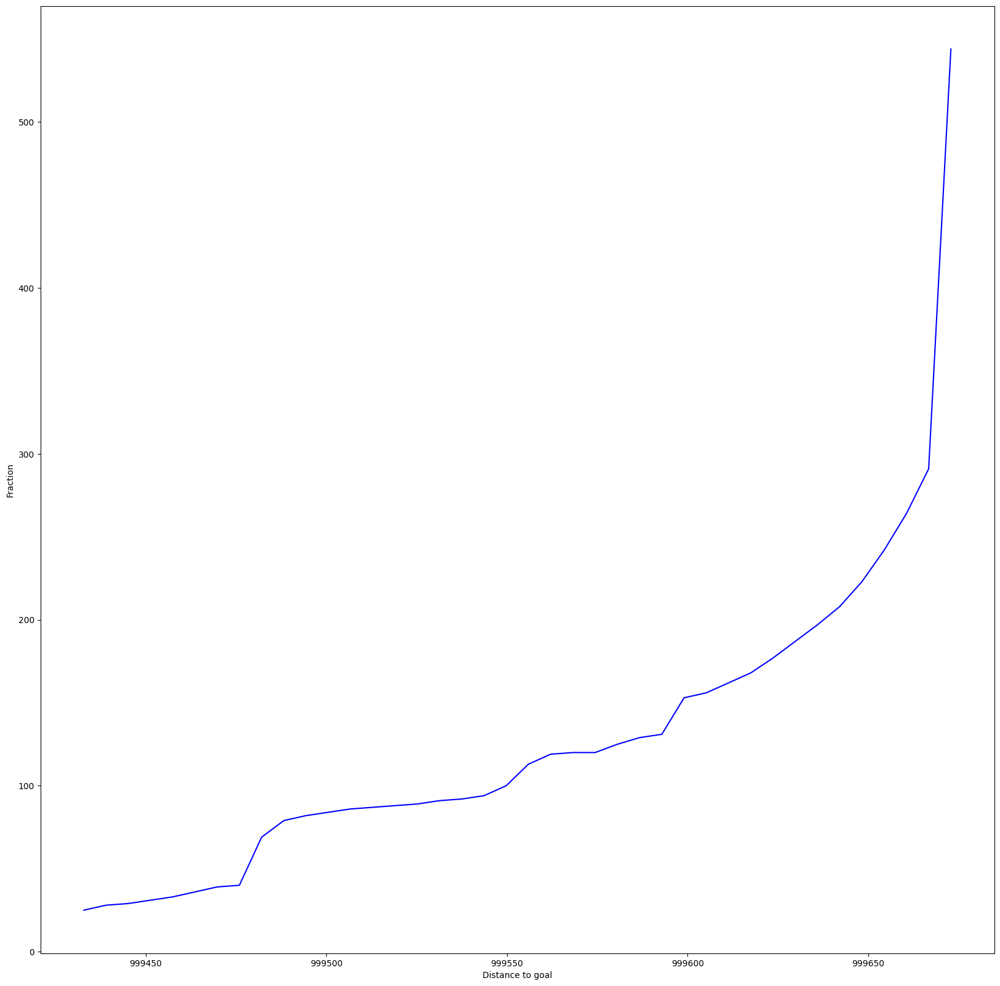

In [ ]:
plot_cumulative_distro_objective(archive)

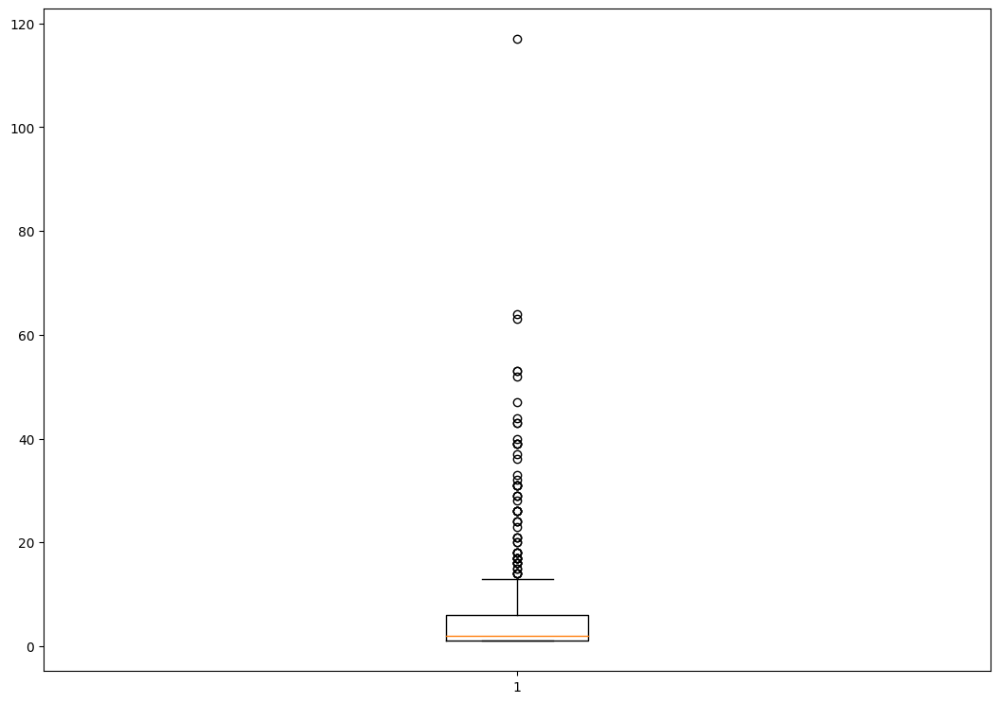

In [ ]:
plot_solution_spread(archive)

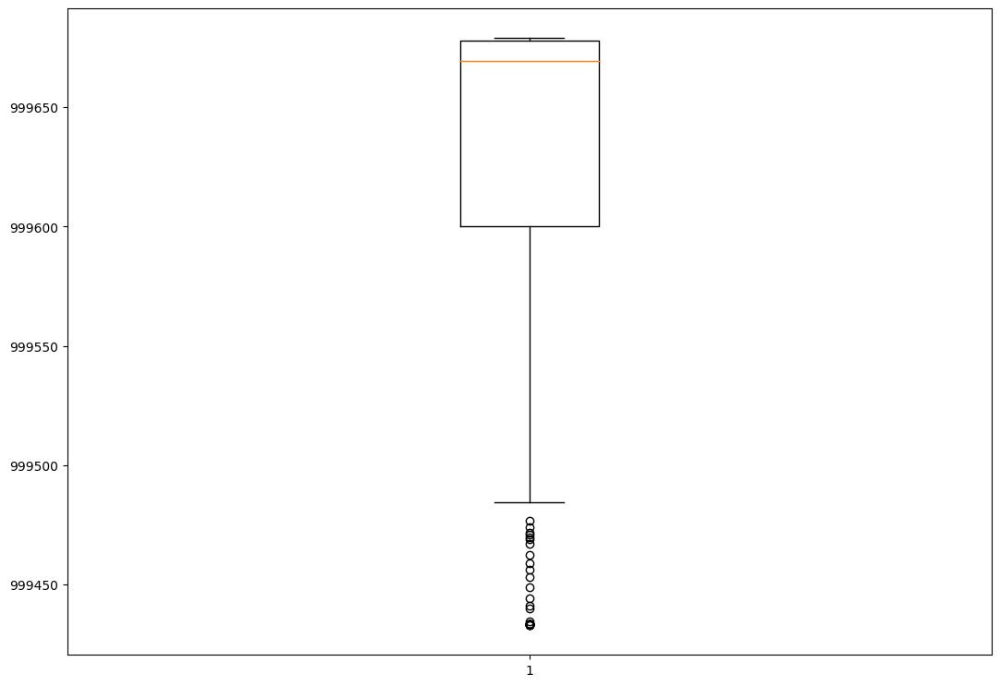

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 2, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0006172657012939453
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01877450942993164
Iterations:   1%|          | 1/100 [00:35<58:34, 35.50s/it]archive training
time to add to som 0.013655662536621094
Iterations:   2%|▏         | 2/100 [01:10<57:17, 35.08s/it]archive training
time to add to som 0.0174713134765625
Iterations:   3%|▎         | 3/100 [01:44<56:13, 34.78s/it]archive training
time to add to som 0.03370380401611328
Iterations:   4%|▍         | 4/100 [02:20<56:32, 35.34s/it]archive training
time to add to som 0.025948524475097656
Iterations:   5%|▌         | 5/100 [02:58<57:10, 36.11s/it]archive training
time to add to som 0.018193721771240234
Iterations:   6%|▌         | 6/100 [03:33<56:10, 35.86s/it]archive training
time to add to som 0.018799543380737305
Iterations:   7%|▋         | 7/100 [04:08<54:59, 35.48s/it]archive training
time to add to som 0.0357818603515625
Iterations:   8%|▊         | 8/

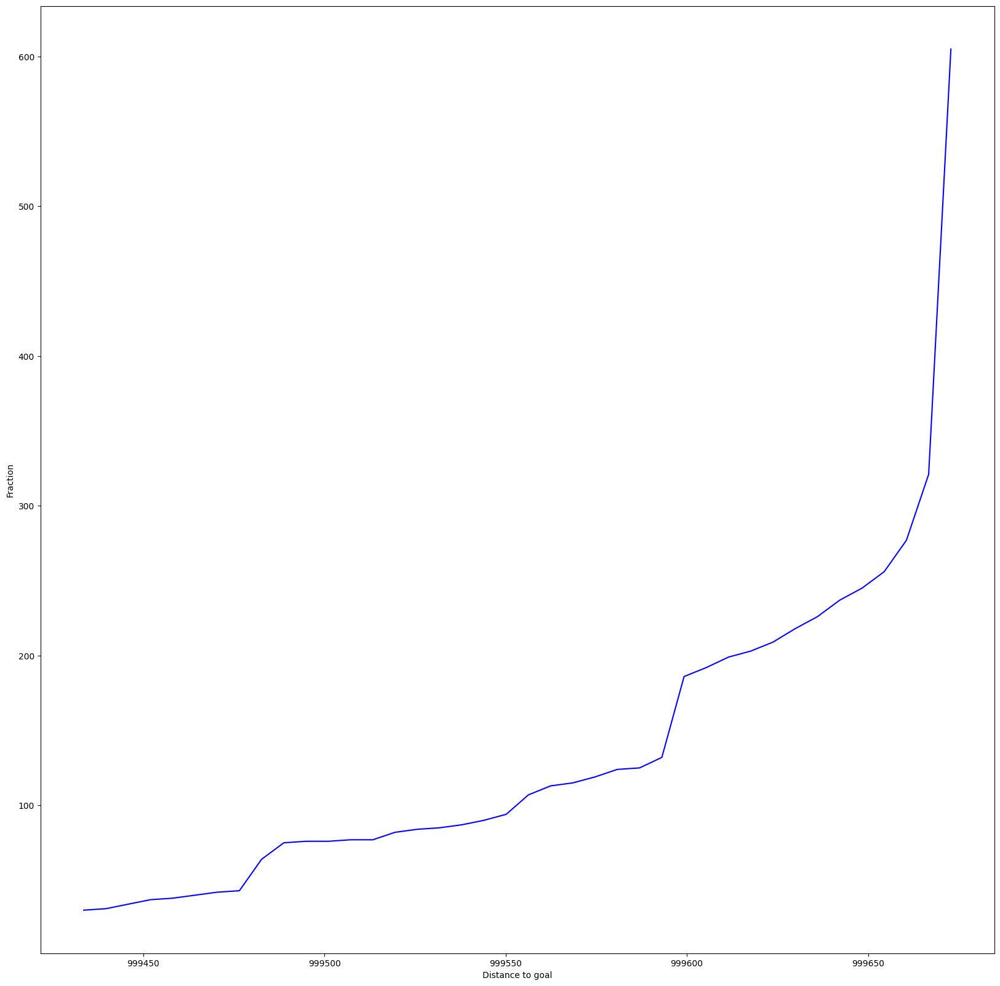

In [ ]:
plot_cumulative_distro_objective(archive)

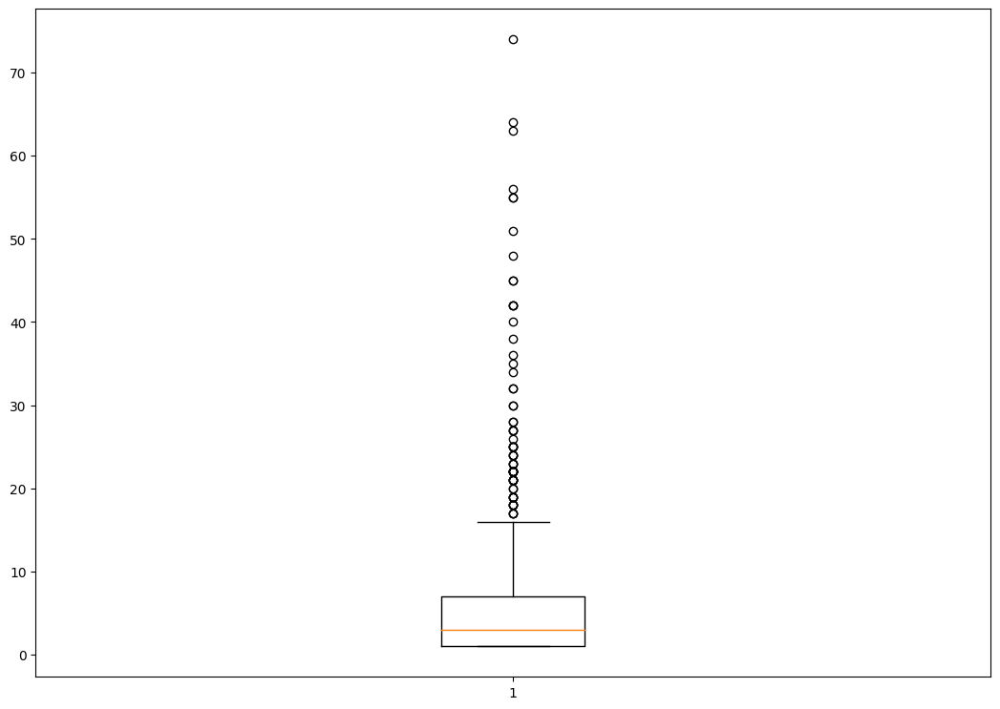

In [ ]:
plot_solution_spread(archive)

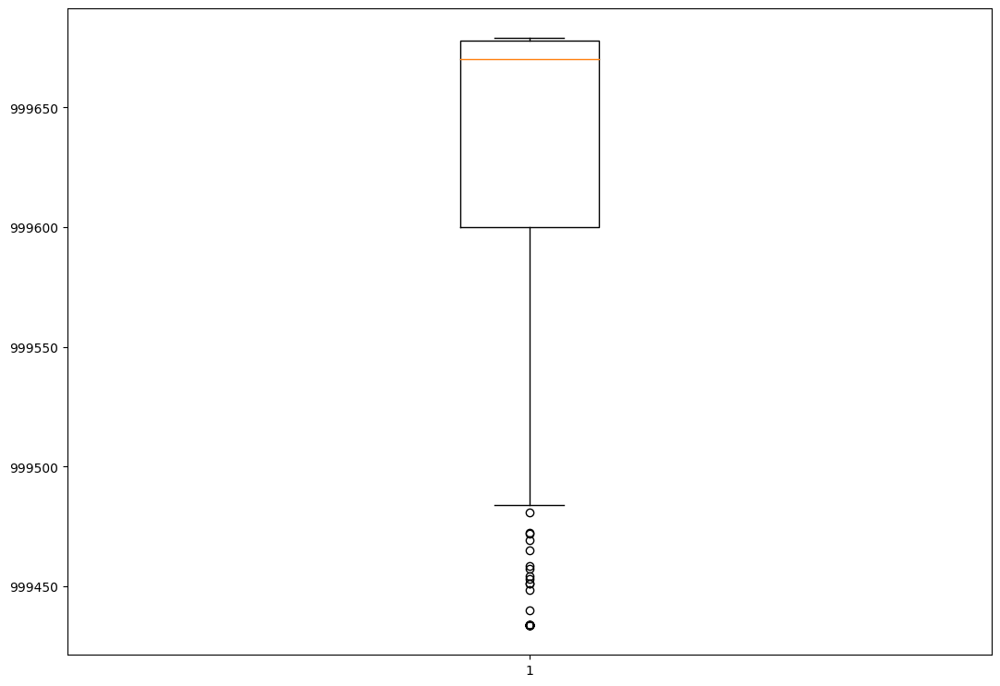

In [ ]:
plot_solution_distance(archive)

######*11.1.3 50d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze4", dim=50)

extra time to initialize archive 82.78815460205078
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.028429031372070312
Iterations:   1%|          | 1/100 [00:22<37:06, 22.49s/it]archive training
time to add to cvt 0.036501407623291016
Iterations:   2%|▏         | 2/100 [00:46<38:32, 23.60s/it]archive training
time to add to cvt 0.039270877838134766
Iterations:   3%|▎         | 3/100 [01:10<38:31, 23.83s/it]archive training
time to add to cvt 0.02811574935913086
Iterations:   4%|▍         | 4/100 [01:34<37:46, 23.61s/it]archive training
time to add to cvt 0.028492450714111328
Iterations:   5%|▌         | 5/100 [01:58<37:49, 23.89s/it]archive training
time to add to cvt 0.04119229316711426
Iterations:   6%|▌         | 6/100 [02:21<36:39, 23.40s/it]archive training
time to add to cvt 0.027391433715820312
Iterations:   7%|▋         | 7/100 [02:44<36:10, 23.34s/it]archive training
time to add to cvt 0.040645599365234375
Iterations:   8%|▊         | 8/

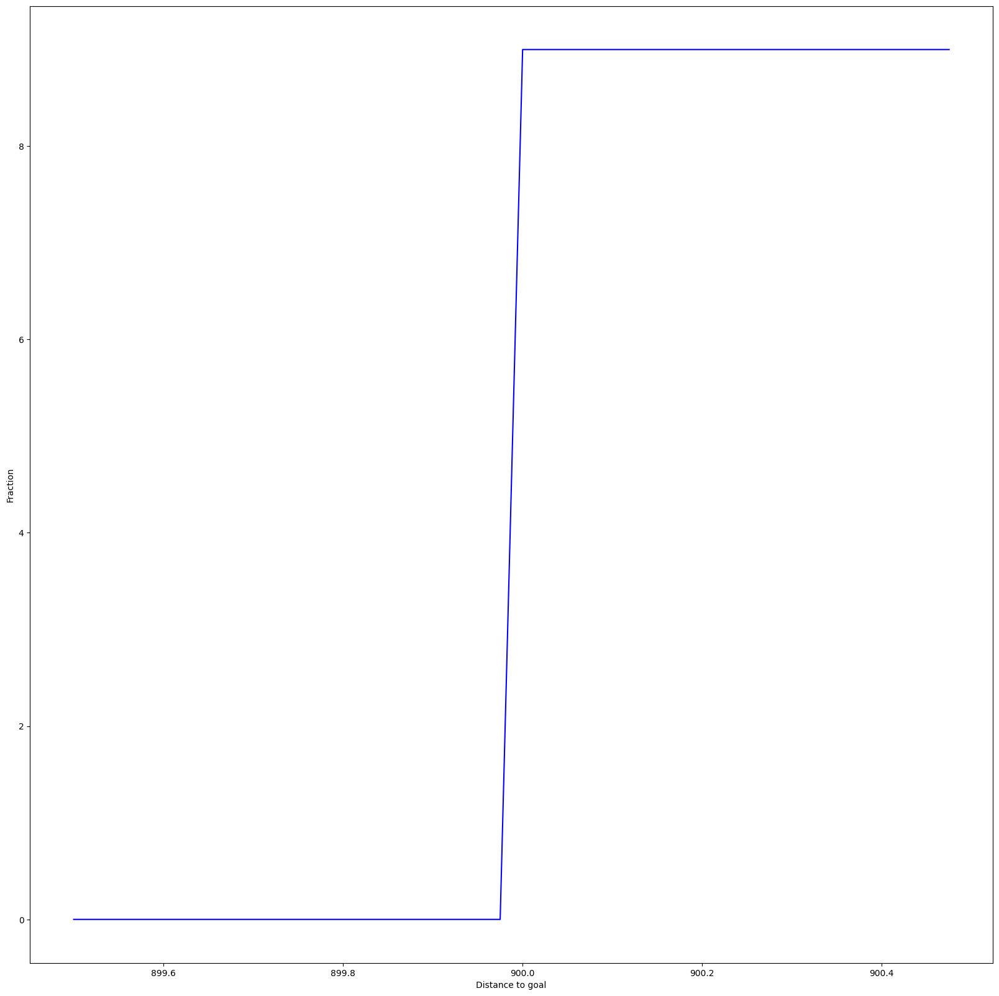

In [ ]:
plot_cumulative_distro_objective(archive)

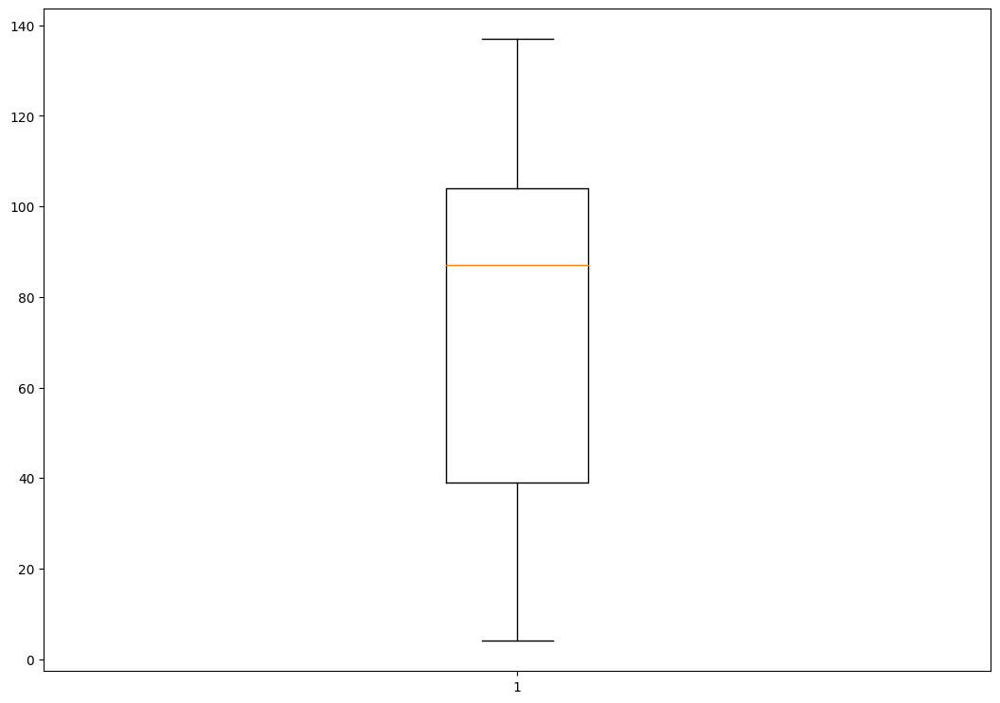

In [ ]:
plot_solution_spread(archive)

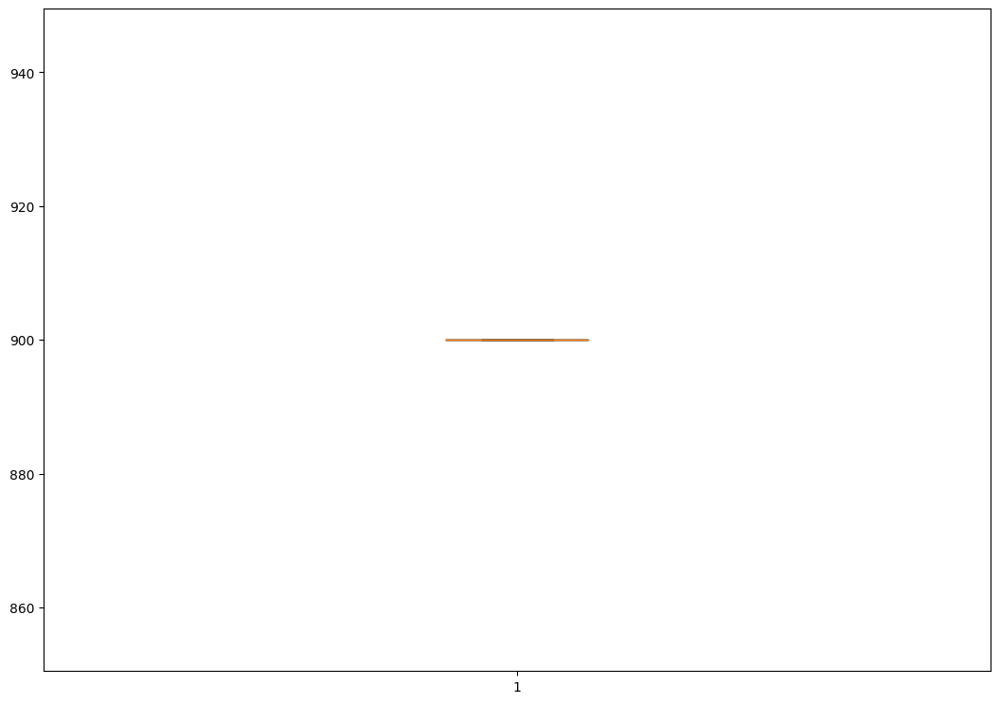

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 50)

extra time to initialize archive 0.0008406639099121094
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.033568620681762695
Iterations:   1%|          | 1/100 [00:35<57:45, 35.01s/it]archive training
time to add to som 0.014846563339233398
Iterations:   2%|▏         | 2/100 [01:09<56:45, 34.75s/it]archive training
time to add to som 0.018116474151611328
Iterations:   3%|▎         | 3/100 [01:43<55:39, 34.42s/it]archive training
time to add to som 0.029729127883911133
Iterations:   4%|▍         | 4/100 [02:18<55:20, 34.59s/it]archive training
time to add to som 0.031586647033691406
Iterations:   5%|▌         | 5/100 [02:54<55:29, 35.05s/it]archive training
time to add to som 0.021335363388061523
Iterations:   6%|▌         | 6/100 [03:29<54:44, 34.94s/it]archive training
time to add to som 0.022858858108520508
Iterations:   7%|▋         | 7/100 [04:03<53:41, 34.64s/it]archive training
time to add to som 0.023377418518066406
Iterations:   8%|▊       

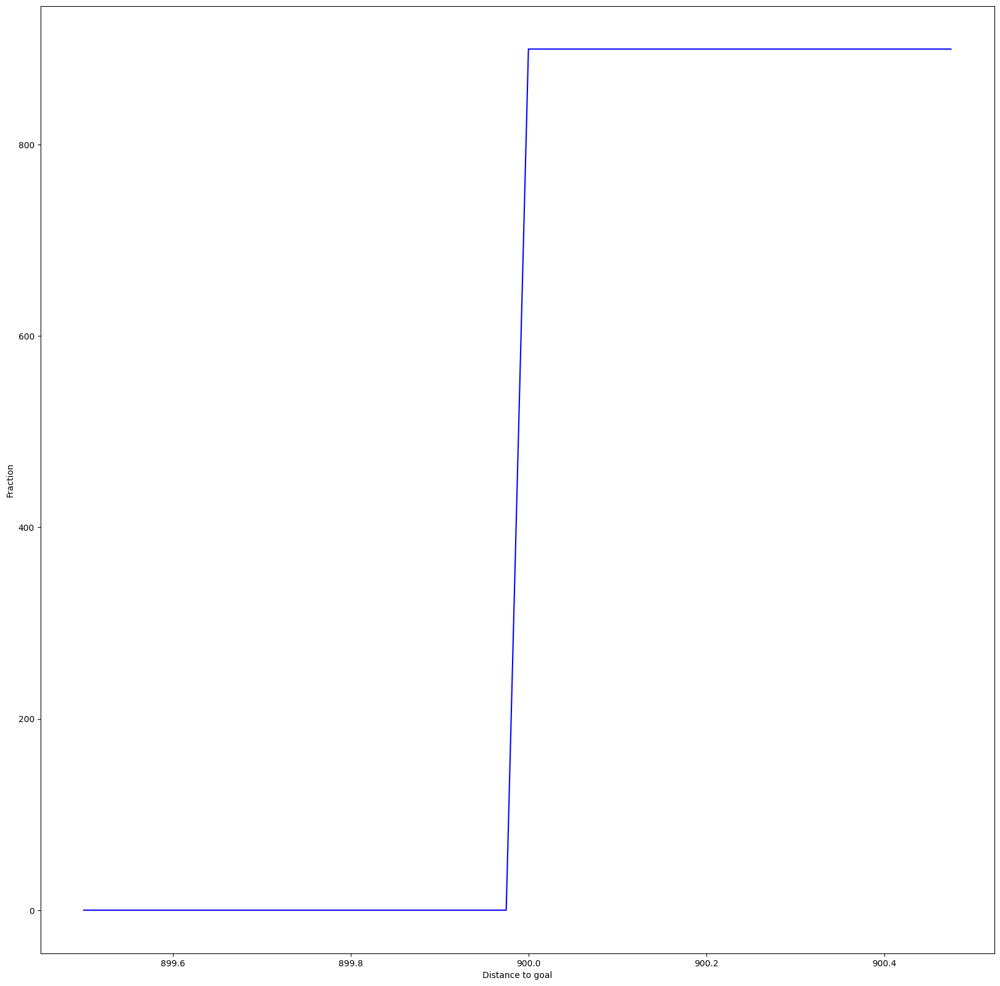

In [ ]:
plot_cumulative_distro_objective(archive)


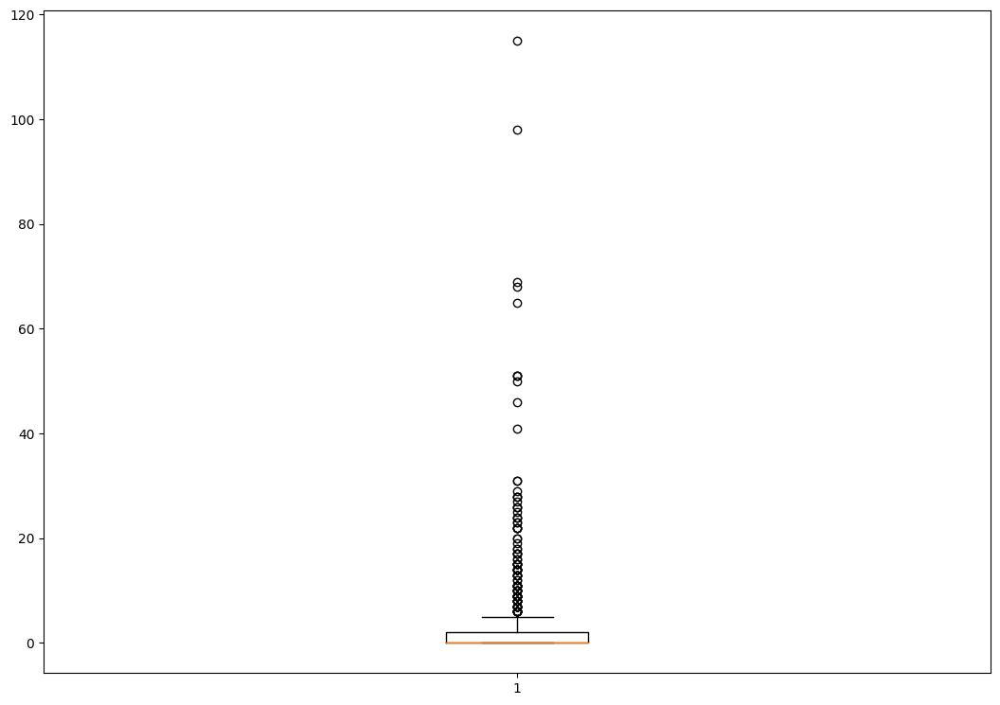

In [ ]:
plot_solution_spread(archive)


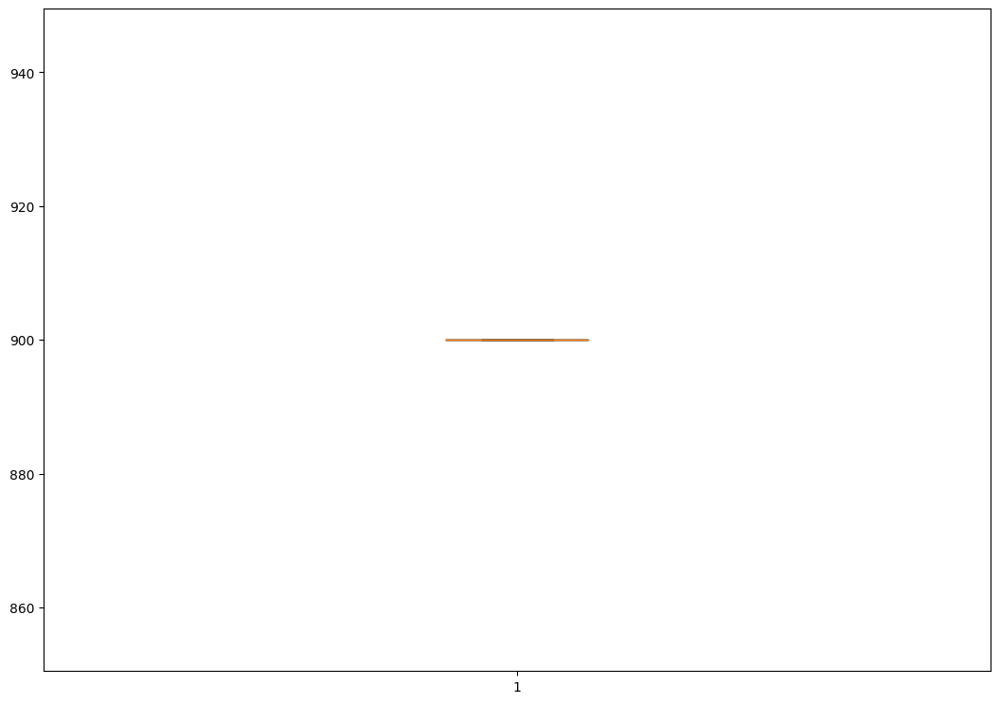

In [ ]:
plot_solution_distance(archive)

high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.00032639503479003906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.019268512725830078
Iterations:   1%|          | 1/100 [00:20<34:17, 20.78s/it]archive training
time to add to som 0.014251232147216797
Iterations:   2%|▏         | 2/100 [00:40<33:14, 20.35s/it]archive training
time to add to som 0.017269611358642578
Iterations:   3%|▎         | 3/100 [01:00<32:41, 20.22s/it]archive training
time to add to som 0.030419111251831055
Iterations:   4%|▍         | 4/100 [01:21<32:46, 20.49s/it]archive training
time to add to som 0.0243227481842041
Iterations:   5%|▌         | 5/100 [01:42<32:27, 20.50s/it]archive training
time to add to som 0.020372390747070312
Iterations:   6%|▌         | 6/100 [02:02<32:10, 20.54s/it]archive training
time to add to som 0.03416156768798828
Iterations:   7%|▋         | 7/100 [02:23<32:01, 20.67s/it]archive training
time to add to som 0.030853748321533203
Iterations:   8%|▊         

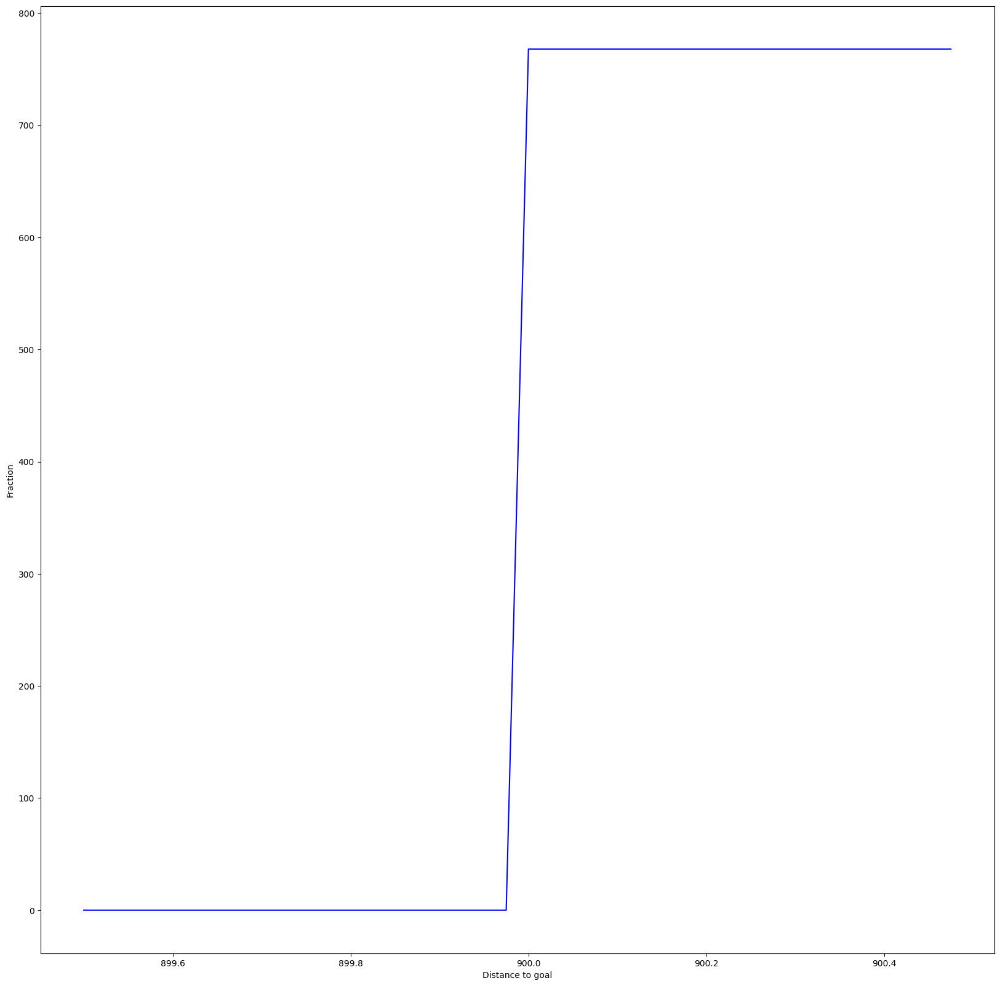

In [ ]:
plot_cumulative_distro_objective(archive)


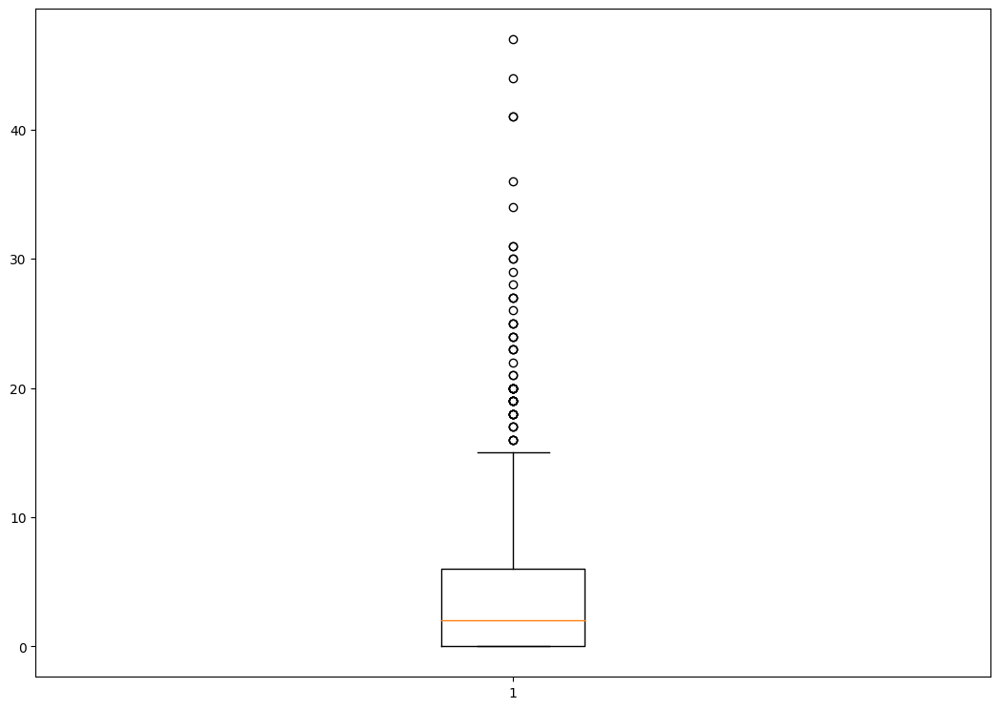

In [ ]:
plot_solution_spread(archive)


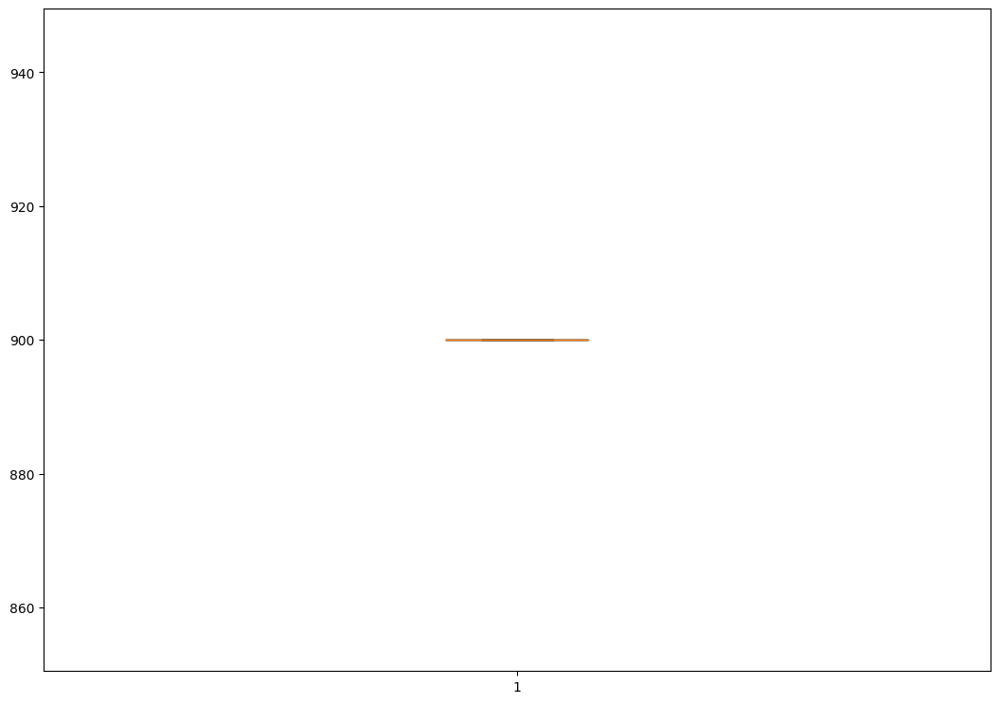

In [ ]:
plot_solution_distance(archive)

double multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003666877746582031
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.020806074142456055
Iterations:   1%|          | 1/100 [00:21<35:30, 21.52s/it]archive training
time to add to som 0.014063119888305664
Iterations:   2%|▏         | 2/100 [00:41<33:34, 20.55s/it]archive training
time to add to som 0.01897263526916504
Iterations:   3%|▎         | 3/100 [01:02<33:19, 20.61s/it]archive training
time to add to som 0.015625953674316406
Iterations:   4%|▍         | 4/100 [01:22<32:44, 20.46s/it]archive training
time to add to som 0.024811983108520508
Iterations:   5%|▌         | 5/100 [01:44<33:35, 21.21s/it]archive training
time to add to som 0.01731133460998535
Iterations:   6%|▌         | 6/100 [02:04<32:27, 20.72s/it]archive training
time to add to som 0.019189119338989258
Iterations:   7%|▋         | 7/100 [02:23<31:05, 20.06s/it]archive training
time to add to som 0.023552417755126953
Iterations:   8%|▊         

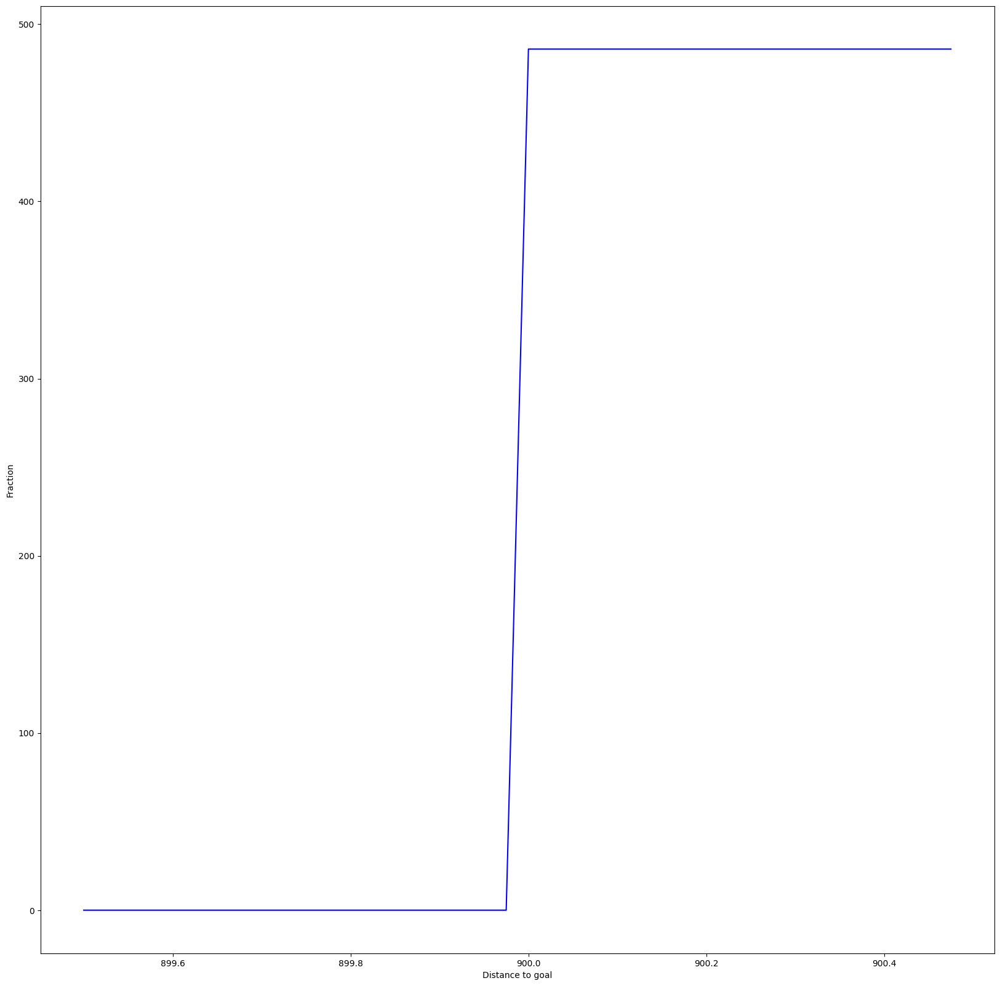

In [ ]:
plot_cumulative_distro_objective(archive)


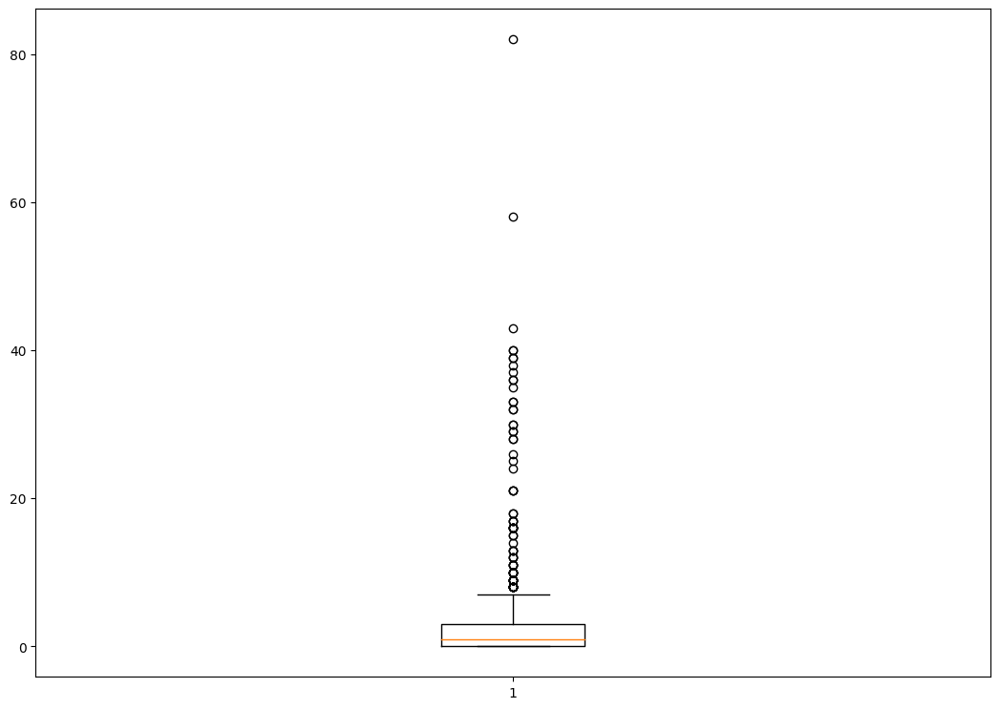

In [ ]:
plot_solution_spread(archive)


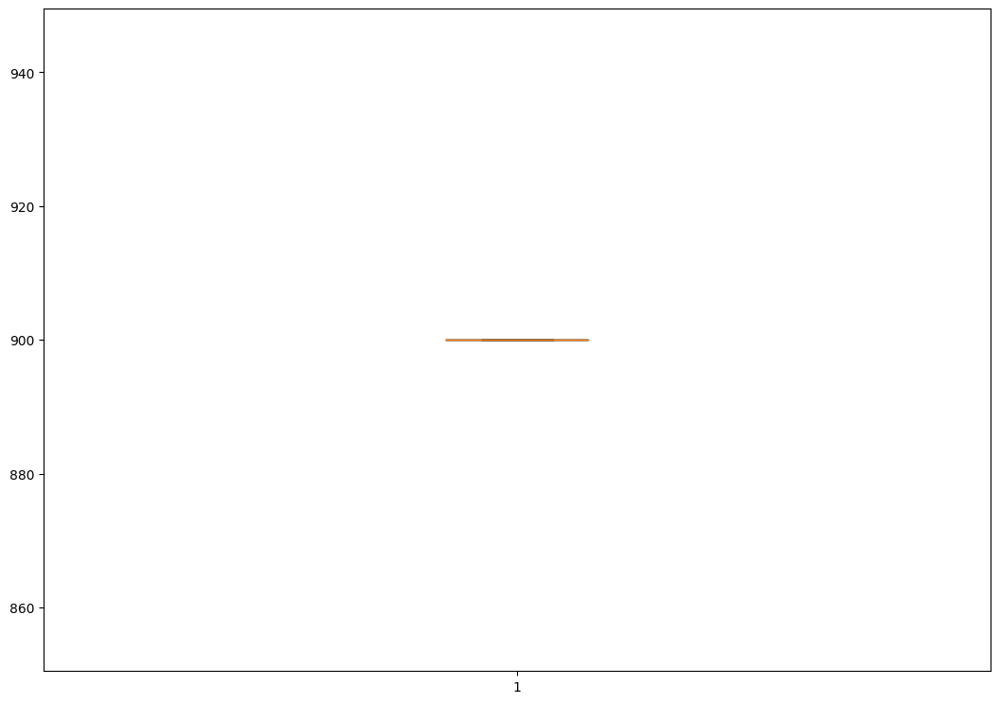

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 50, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })


extra time to initialize archive 0.0006866455078125
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.018540143966674805
Iterations:   1%|          | 1/100 [00:18<30:44, 18.63s/it]archive training
time to add to som 0.02562117576599121
Iterations:   2%|▏         | 2/100 [00:37<30:36, 18.74s/it]archive training
time to add to som 0.01930856704711914
Iterations:   3%|▎         | 3/100 [00:55<29:42, 18.37s/it]archive training
time to add to som 0.018570661544799805
Iterations:   4%|▍         | 4/100 [01:13<29:16, 18.30s/it]archive training
time to add to som 0.019274473190307617
Iterations:   5%|▌         | 5/100 [01:31<28:47, 18.19s/it]archive training
time to add to som 0.03303360939025879
Iterations:   6%|▌         | 6/100 [01:49<28:19, 18.08s/it]archive training
time to add to som 0.03050851821899414
Iterations:   7%|▋         | 7/100 [02:08<28:30, 18.39s/it]archive training
time to add to som 0.021628379821777344
Iterations:   8%|▊         | 8/1

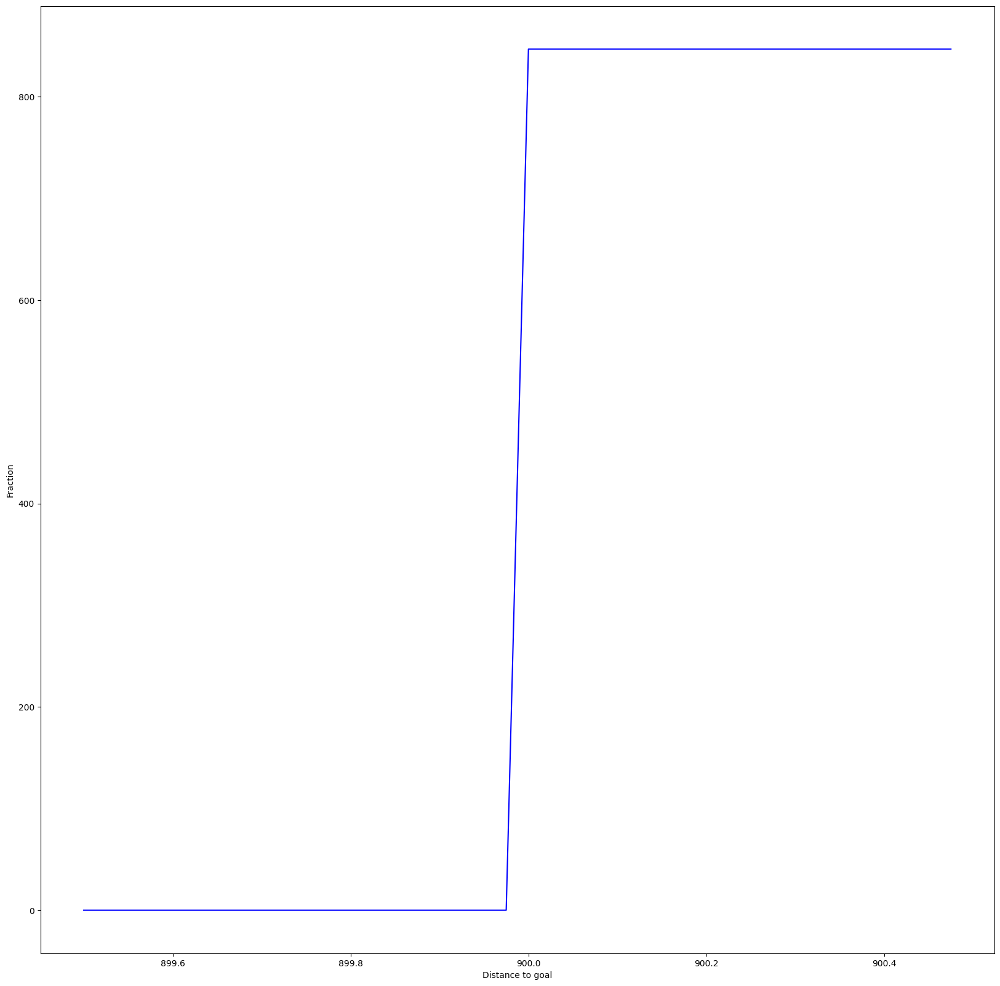

In [ ]:
plot_cumulative_distro_objective(archive)


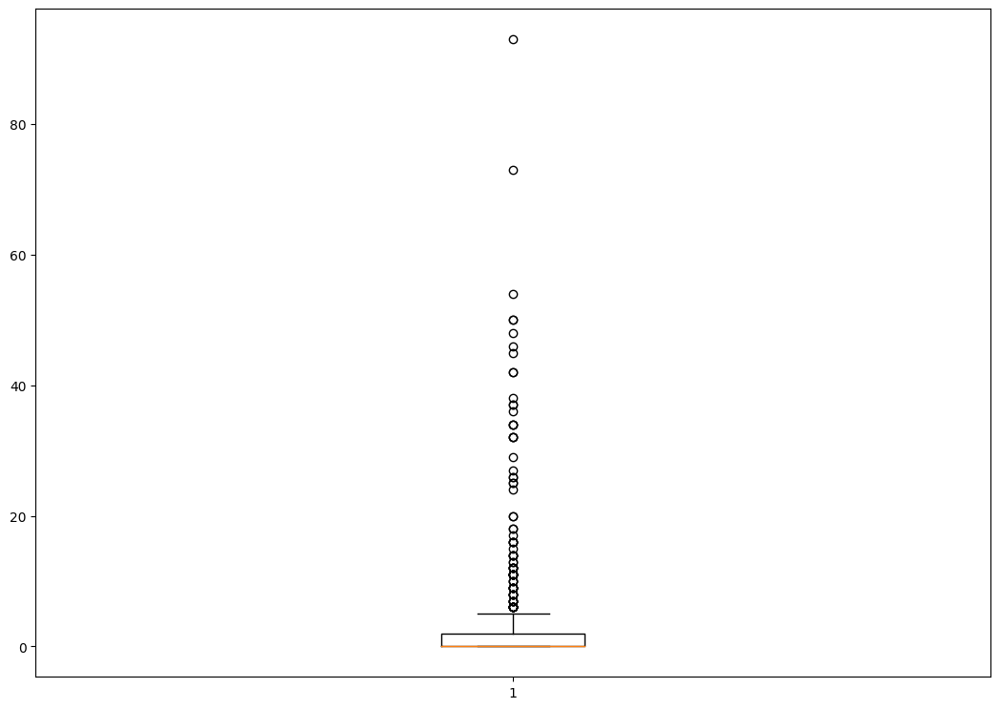

In [ ]:
plot_solution_spread(archive)


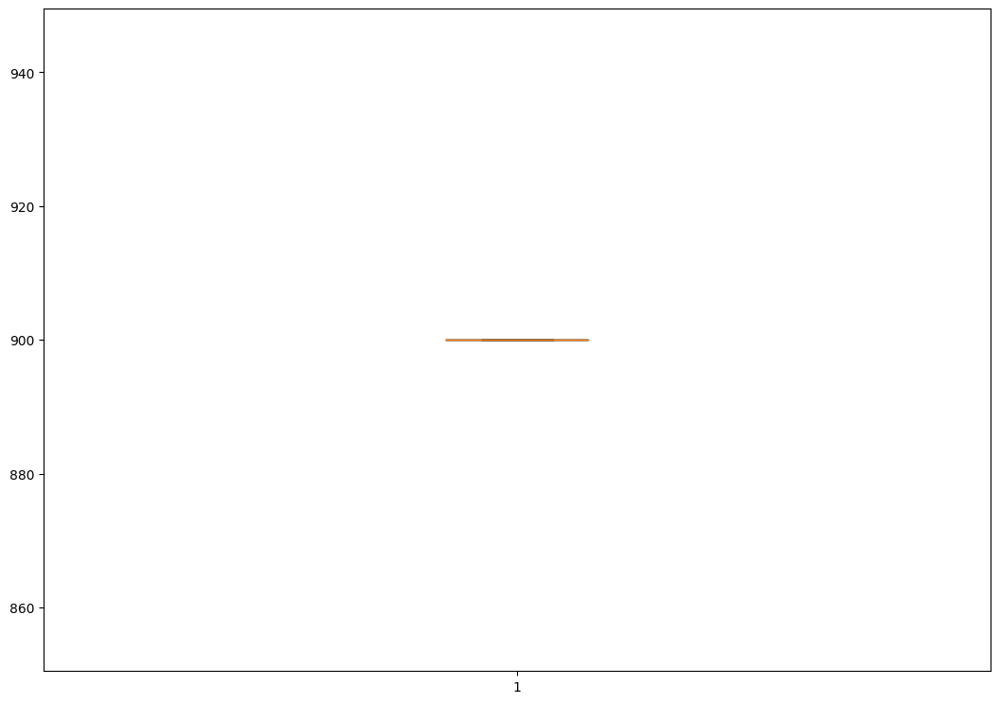

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 50, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0012650489807128906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 3.586085319519043
Iterations:   1%|          | 1/100 [00:27<45:53, 27.82s/it]archive training
time to add to som 0.015859365463256836
Iterations:   2%|▏         | 2/100 [00:50<40:52, 25.02s/it]archive training
time to add to som 0.023121356964111328
Iterations:   3%|▎         | 3/100 [01:13<39:02, 24.15s/it]archive training
time to add to som 0.019479990005493164
Iterations:   4%|▍         | 4/100 [01:37<38:19, 23.95s/it]archive training
time to add to som 0.0392909049987793
Iterations:   5%|▌         | 5/100 [02:01<37:53, 23.93s/it]archive training
time to add to som 0.03466534614562988
Iterations:   6%|▌         | 6/100 [02:25<37:45, 24.10s/it]archive training
time to add to som 0.031373023986816406
Iterations:   7%|▋         | 7/100 [02:49<36:59, 23.86s/it]archive training
time to add to som 0.02442646026611328
Iterations:   8%|▊         | 8/1

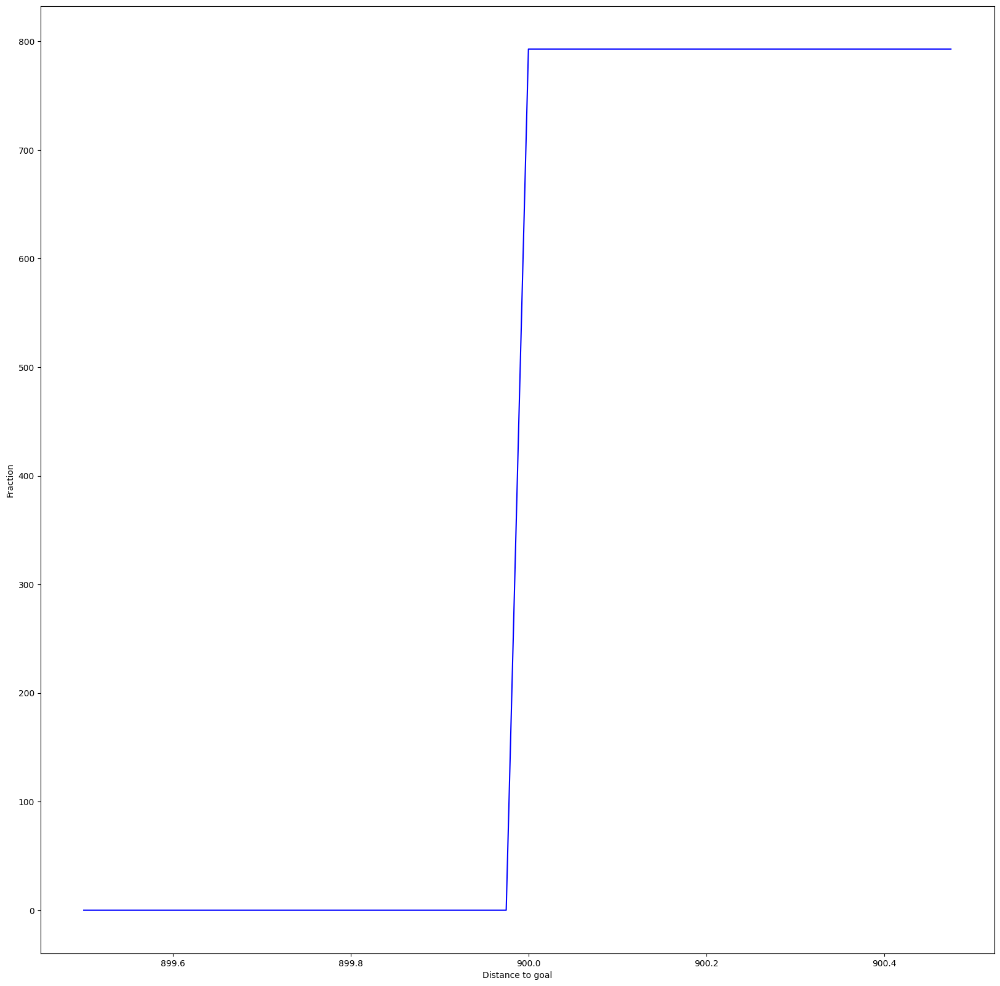

In [ ]:
plot_cumulative_distro_objective(archive)

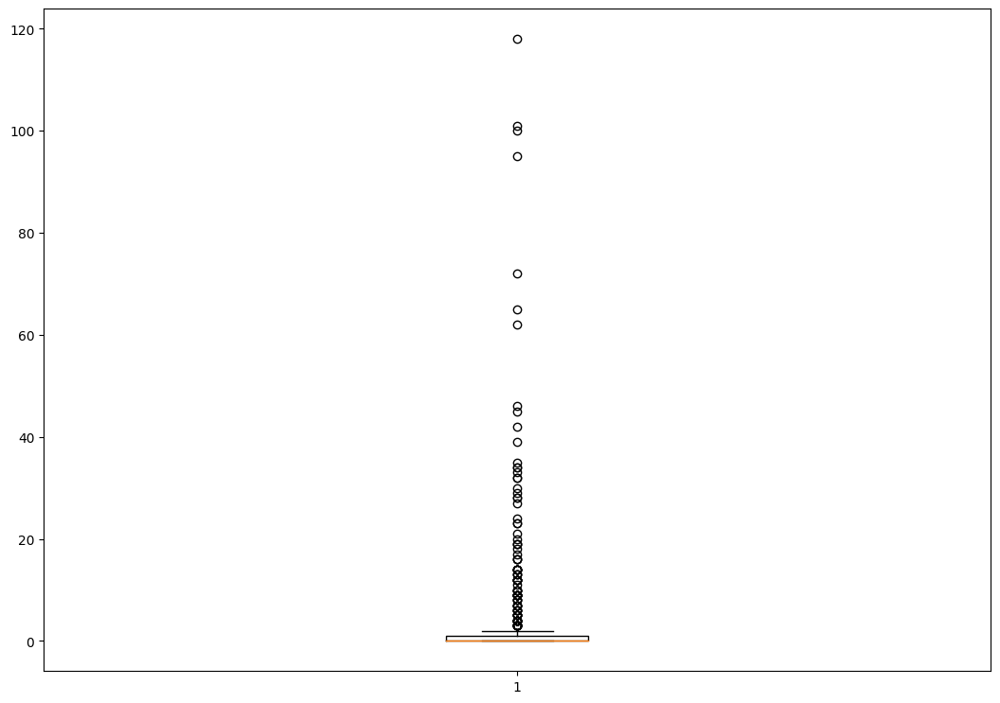

In [ ]:
plot_solution_spread(archive)

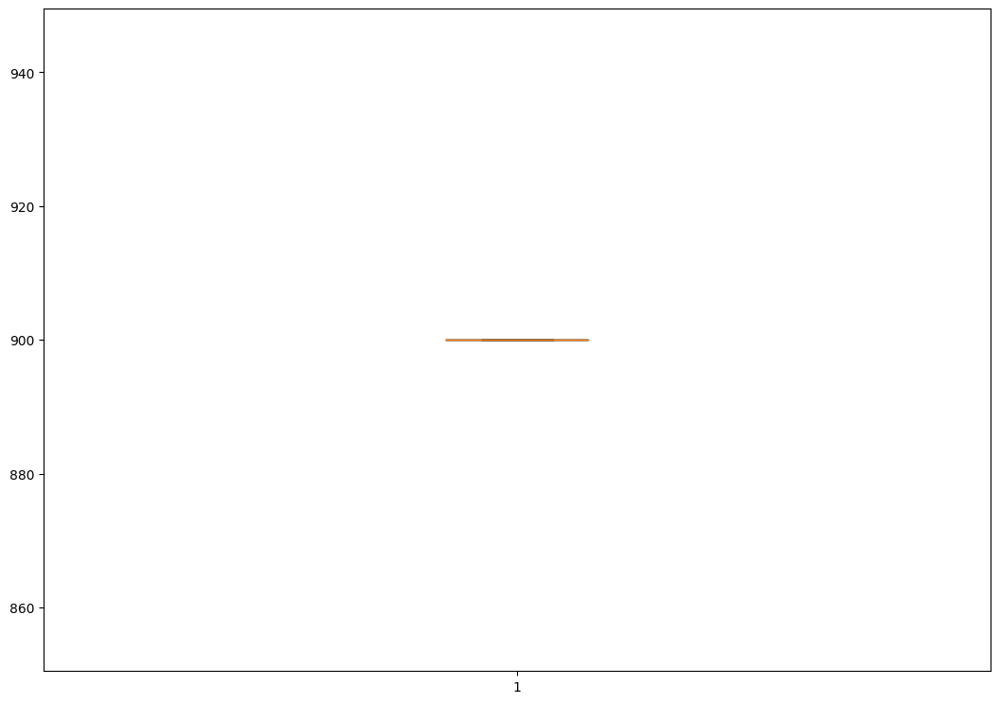

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 50, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0015106201171875
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.014949321746826172
Iterations:   1%|          | 1/100 [00:22<37:17, 22.60s/it]archive training
time to add to som 0.026811599731445312
Iterations:   2%|▏         | 2/100 [00:47<39:23, 24.12s/it]archive training
time to add to som 0.019695758819580078
Iterations:   3%|▎         | 3/100 [01:10<38:03, 23.54s/it]archive training
time to add to som 0.027844667434692383
Iterations:   4%|▍         | 4/100 [01:33<37:22, 23.36s/it]archive training
time to add to som 0.023894786834716797
Iterations:   5%|▌         | 5/100 [01:56<36:51, 23.28s/it]archive training
time to add to som 0.033623695373535156
Iterations:   6%|▌         | 6/100 [02:20<36:30, 23.30s/it]archive training
time to add to som 0.025550127029418945
Iterations:   7%|▋         | 7/100 [02:43<35:56, 23.19s/it]archive training
time to add to som 0.04123377799987793
Iterations:   8%|▊         | 

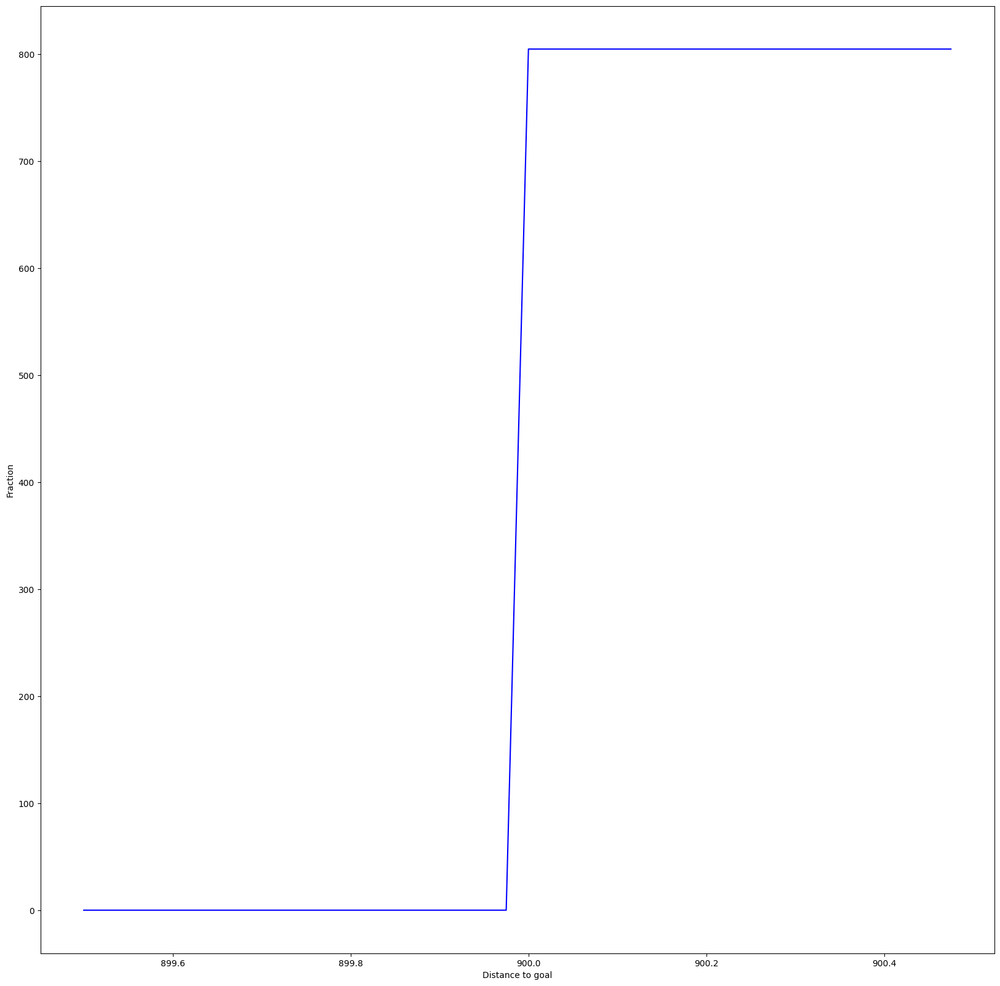

In [ ]:
plot_cumulative_distro_objective(archive)

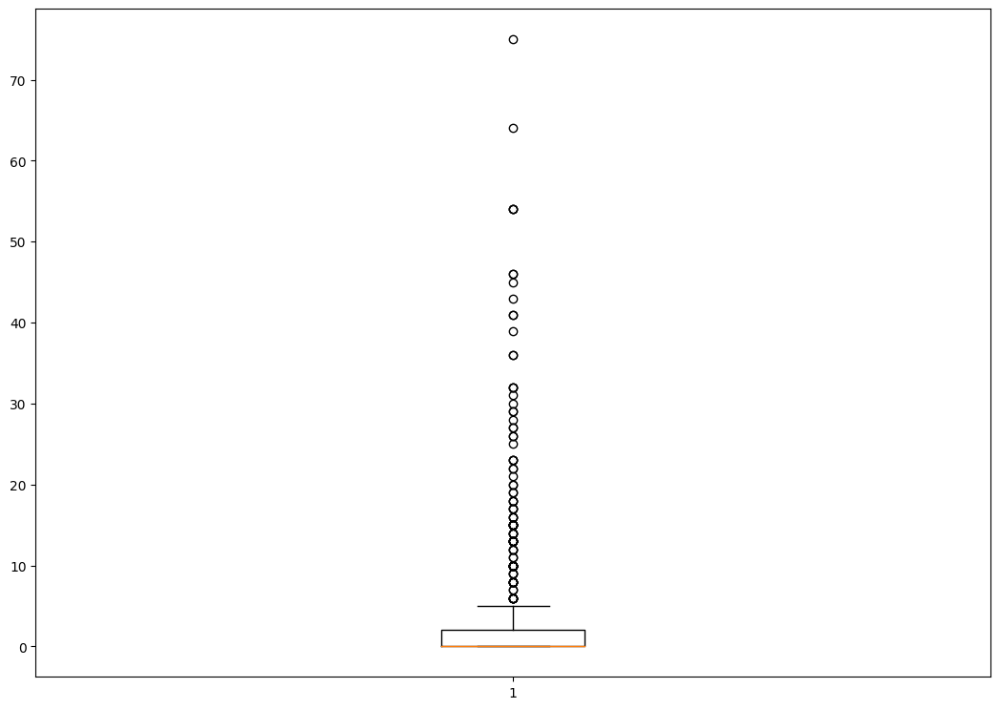

In [ ]:
plot_solution_spread(archive)

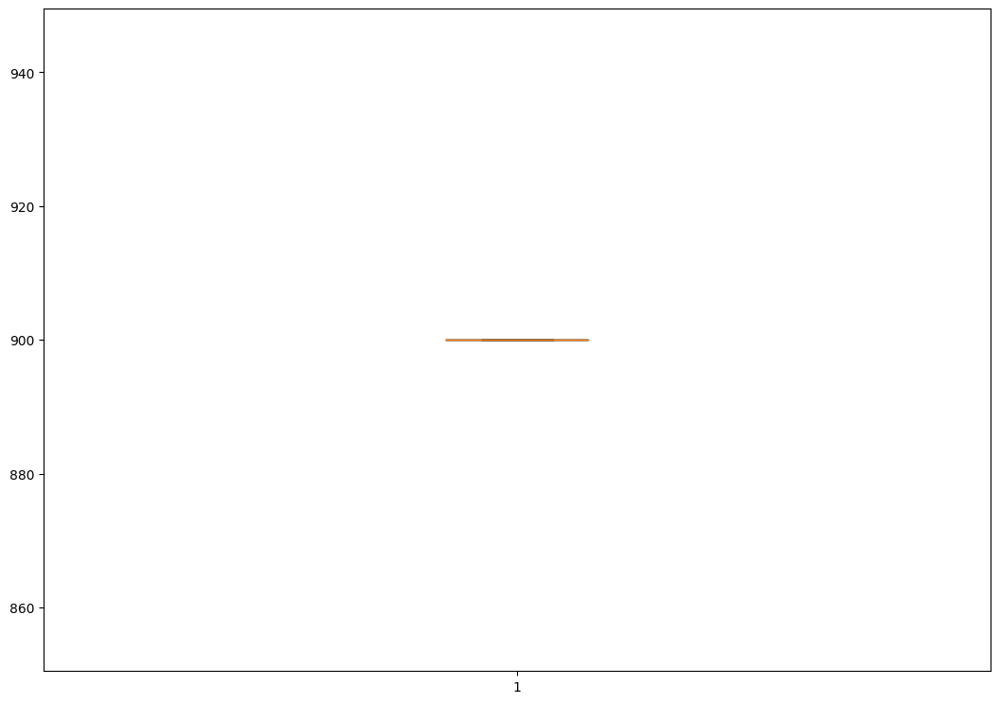

In [ ]:
plot_solution_distance(archive)

######*11.1.3 150d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze4", dim=150)

extra time to initialize archive 157.37388229370117
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.06256771087646484
Iterations:   1%|          | 1/100 [00:26<43:17, 26.23s/it]archive training
time to add to cvt 0.08513545989990234
Iterations:   2%|▏         | 2/100 [00:52<42:55, 26.28s/it]archive training
time to add to cvt 0.06177401542663574
Iterations:   3%|▎         | 3/100 [01:18<42:19, 26.18s/it]archive training
time to add to cvt 0.06075286865234375
Iterations:   4%|▍         | 4/100 [01:45<42:02, 26.28s/it]archive training
time to add to cvt 0.07451200485229492
Iterations:   5%|▌         | 5/100 [02:11<41:34, 26.25s/it]archive training
time to add to cvt 0.05700111389160156
Iterations:   6%|▌         | 6/100 [02:37<40:55, 26.12s/it]archive training
time to add to cvt 0.0647275447845459
Iterations:   7%|▋         | 7/100 [03:05<41:23, 26.70s/it]archive training
time to add to cvt 0.08163285255432129
Iterations:   8%|▊         | 8/100 [0

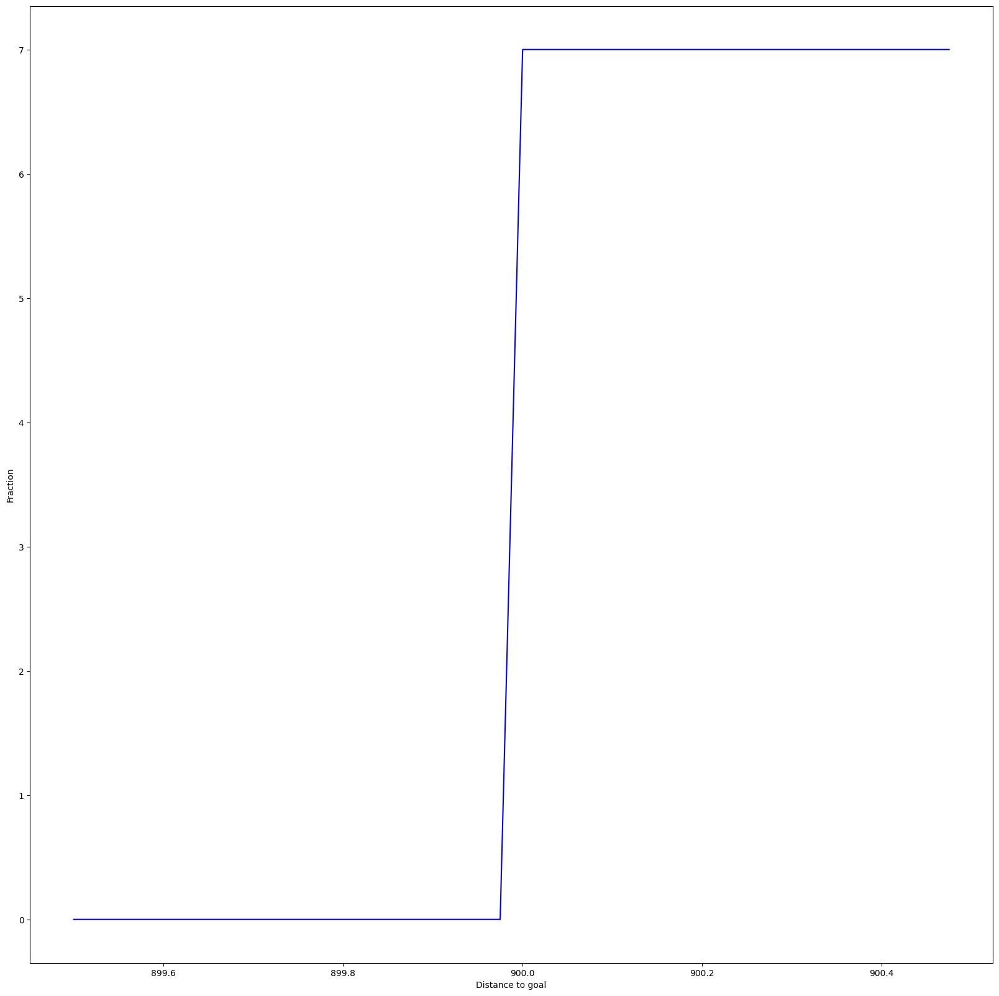

In [ ]:
plot_cumulative_distro_objective(archive)

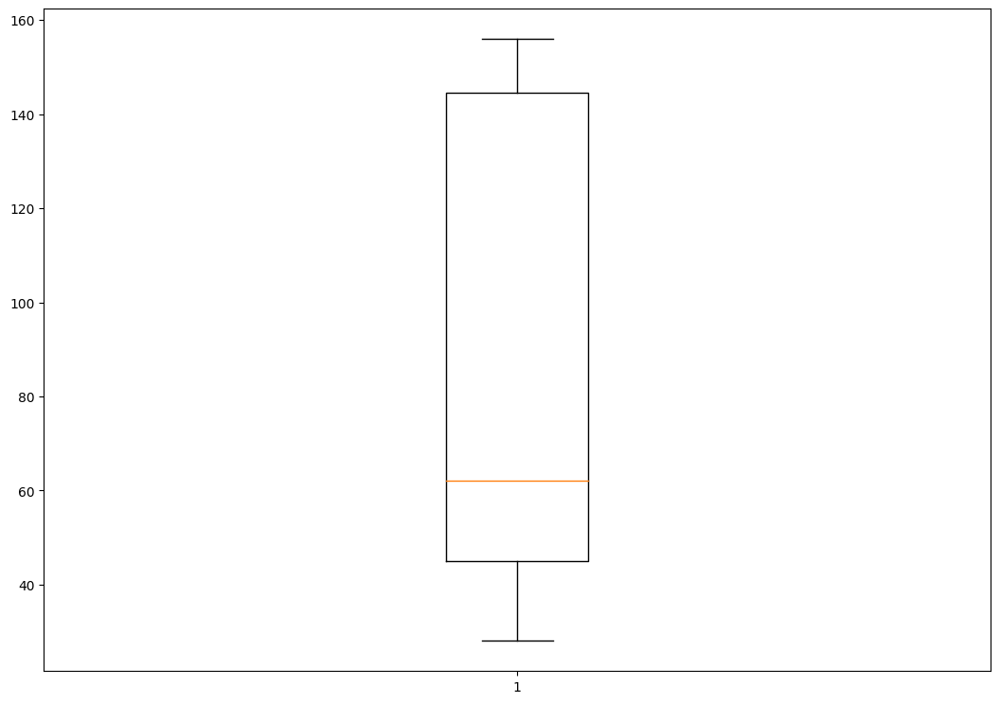

In [ ]:
plot_solution_spread(archive)

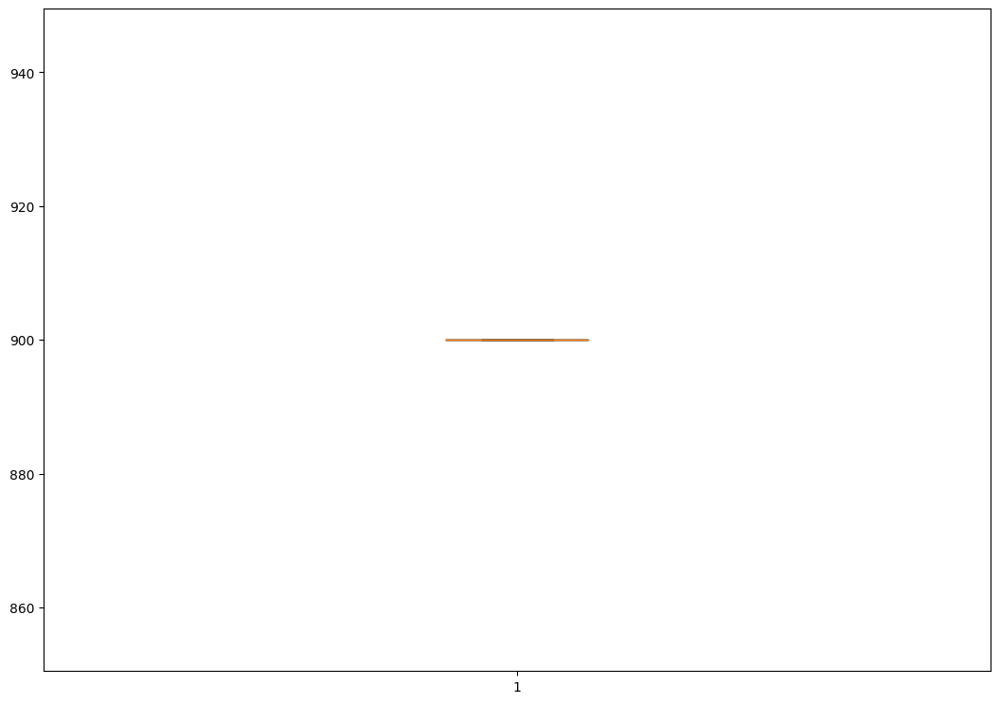

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 150)

extra time to initialize archive 0.0005514621734619141
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 1.4966495037078857
Iterations:   1%|          | 1/100 [00:33<55:20, 33.54s/it]archive training
time to add to som 0.010751962661743164
Iterations:   2%|▏         | 2/100 [00:52<40:45, 24.95s/it]archive training
time to add to som 0.01310873031616211
Iterations:   3%|▎         | 3/100 [01:12<36:22, 22.50s/it]archive training
time to add to som 0.01895308494567871
Iterations:   4%|▍         | 4/100 [01:31<34:16, 21.42s/it]archive training
time to add to som 0.016811847686767578
Iterations:   5%|▌         | 5/100 [01:51<32:44, 20.68s/it]archive training
time to add to som 0.01860356330871582
Iterations:   6%|▌         | 6/100 [02:11<32:00, 20.43s/it]archive training
time to add to som 0.026552677154541016
Iterations:   7%|▋         | 7/100 [02:30<31:08, 20.10s/it]archive training
time to add to som 0.02277350425720215
Iterations:   8%|▊         | 8/

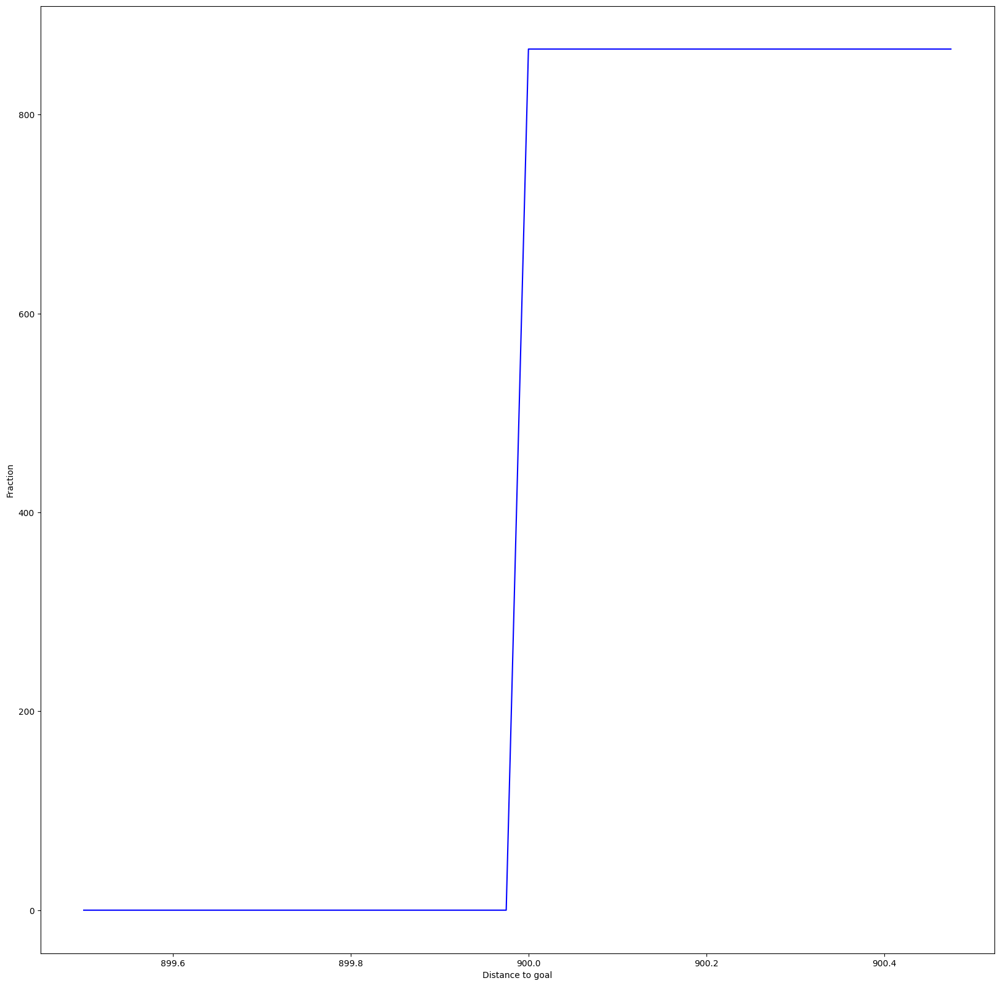

In [ ]:
plot_cumulative_distro_objective(archive)


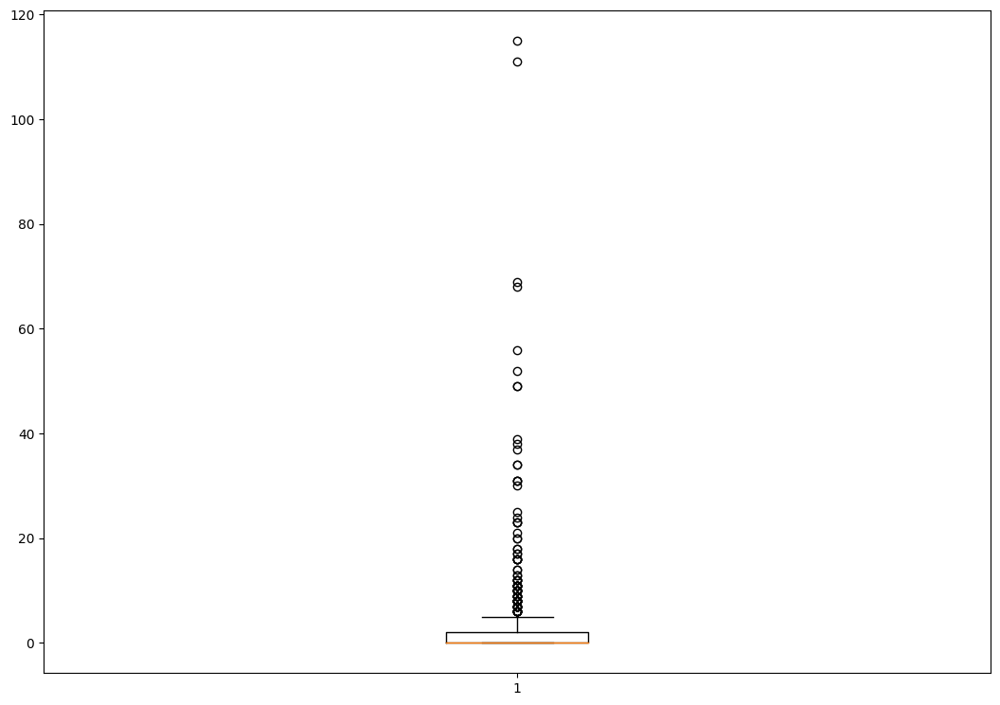

In [ ]:
plot_solution_spread(archive)


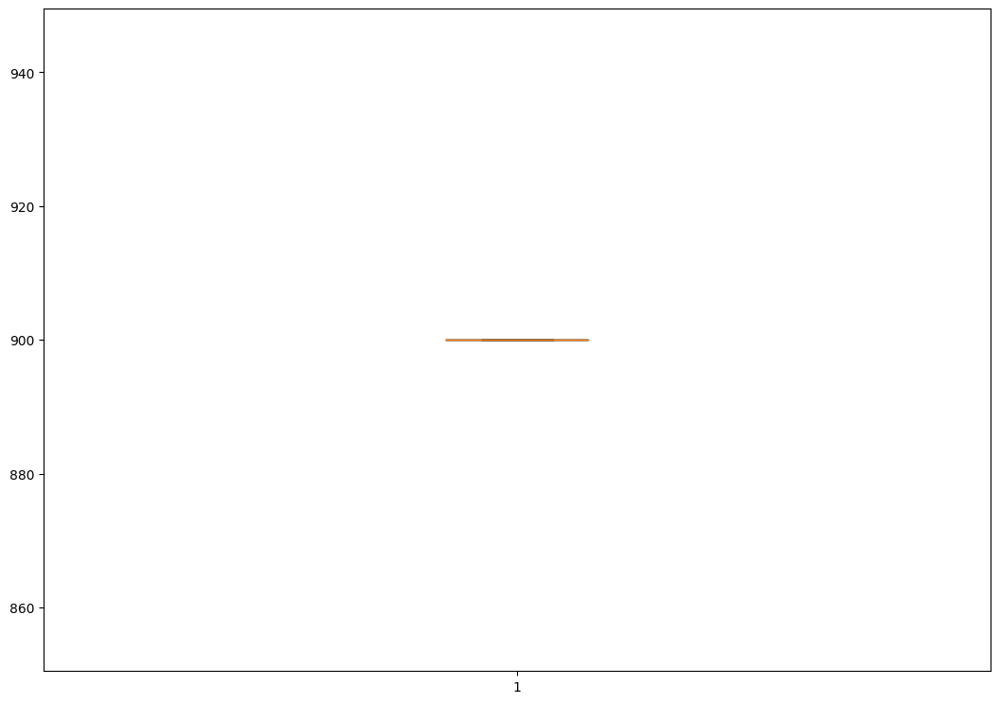

In [ ]:
plot_solution_distance(archive)

high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })

extra time to initialize archive 0.00033283233642578125
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.022893428802490234
Iterations:   1%|          | 1/100 [00:20<33:22, 20.23s/it]archive training
time to add to som 0.016896963119506836
Iterations:   2%|▏         | 2/100 [00:41<33:57, 20.79s/it]archive training
time to add to som 0.018682003021240234
Iterations:   3%|▎         | 3/100 [01:01<32:57, 20.38s/it]archive training
time to add to som 0.03638458251953125
Iterations:   4%|▍         | 4/100 [01:21<32:35, 20.37s/it]archive training
time to add to som 0.02846384048461914
Iterations:   5%|▌         | 5/100 [01:43<33:06, 20.91s/it]archive training
time to add to som 0.029268503189086914
Iterations:   6%|▌         | 6/100 [02:04<32:32, 20.77s/it]archive training
time to add to som 0.04149818420410156
Iterations:   7%|▋         | 7/100 [02:24<32:05, 20.71s/it]archive training
time to add to som 0.030841588973999023
Iterations:   8%|▊         

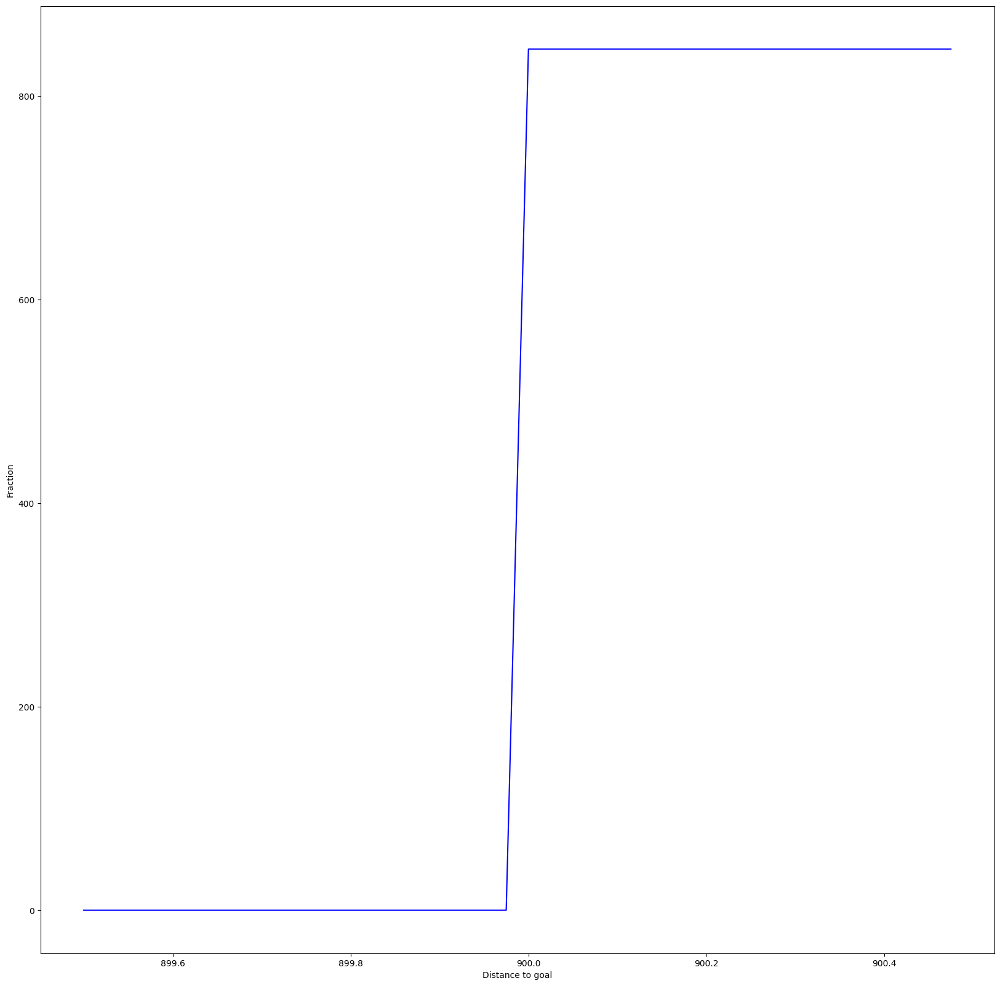

In [ ]:
plot_cumulative_distro_objective(archive)

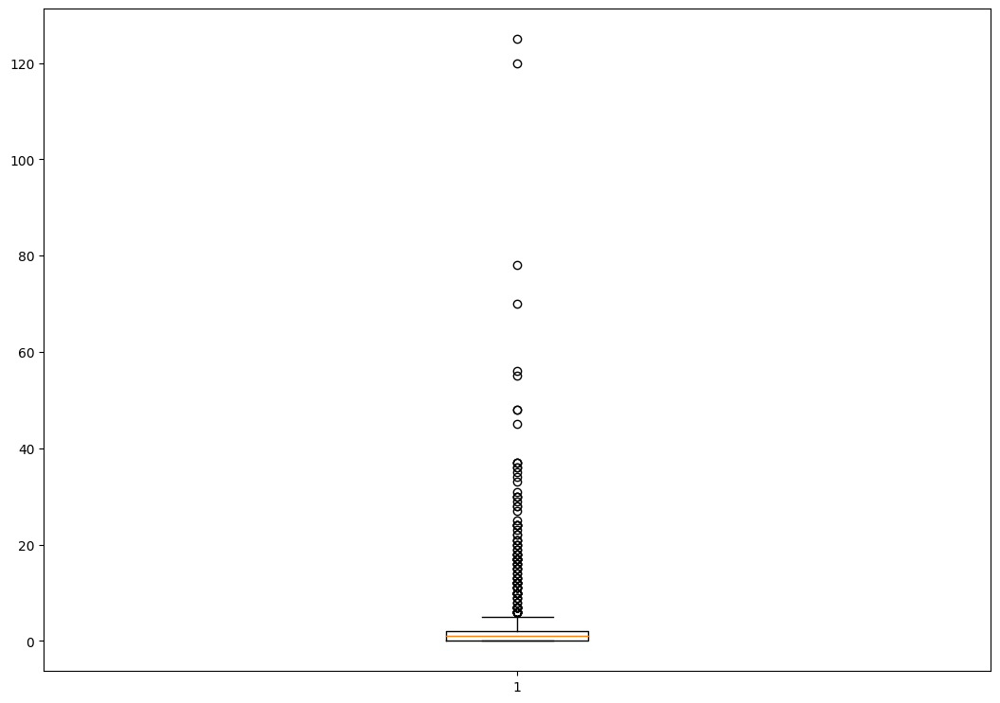

In [ ]:
plot_solution_spread(archive)

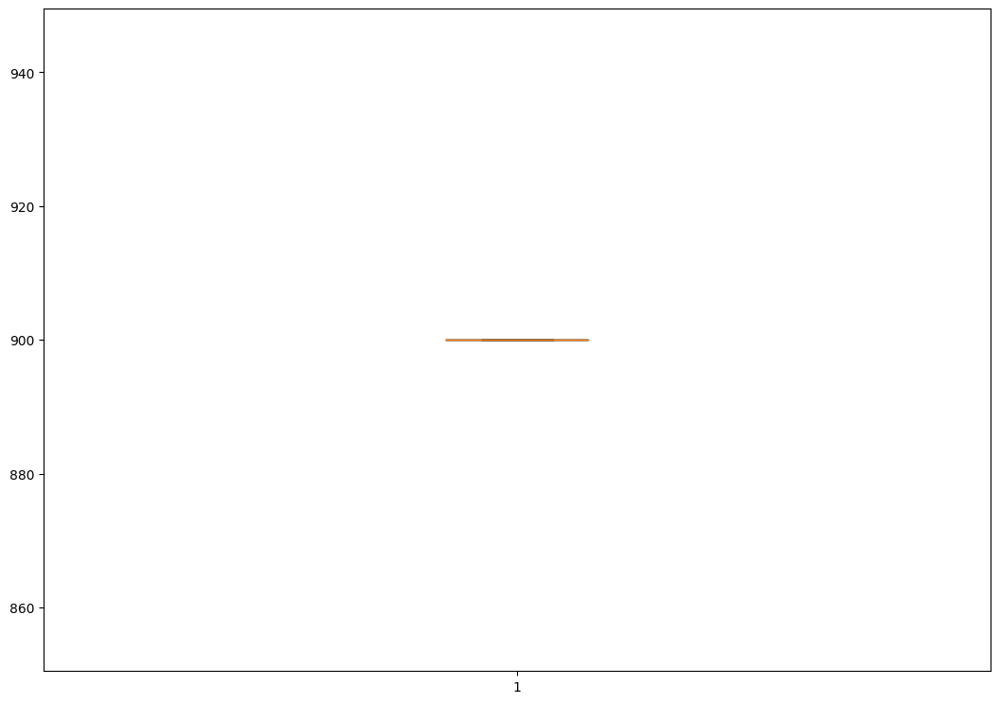

In [ ]:
plot_solution_distance(archive)

high multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })

extra time to initialize archive 0.0003516674041748047
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.012813568115234375
Iterations:   1%|          | 1/100 [00:18<30:17, 18.36s/it]archive training
time to add to som 0.015467643737792969
Iterations:   2%|▏         | 2/100 [00:37<30:18, 18.56s/it]archive training
time to add to som 0.029097318649291992
Iterations:   3%|▎         | 3/100 [00:56<30:54, 19.12s/it]archive training
time to add to som 0.019385337829589844
Iterations:   4%|▍         | 4/100 [01:16<30:49, 19.26s/it]archive training
time to add to som 0.02097773551940918
Iterations:   5%|▌         | 5/100 [01:35<30:19, 19.16s/it]archive training
time to add to som 0.022873878479003906
Iterations:   6%|▌         | 6/100 [01:54<29:58, 19.14s/it]archive training
time to add to som 0.04050779342651367
Iterations:   7%|▋         | 7/100 [02:14<30:03, 19.39s/it]archive training
time to add to som 0.025919198989868164
Iterations:   8%|▊         

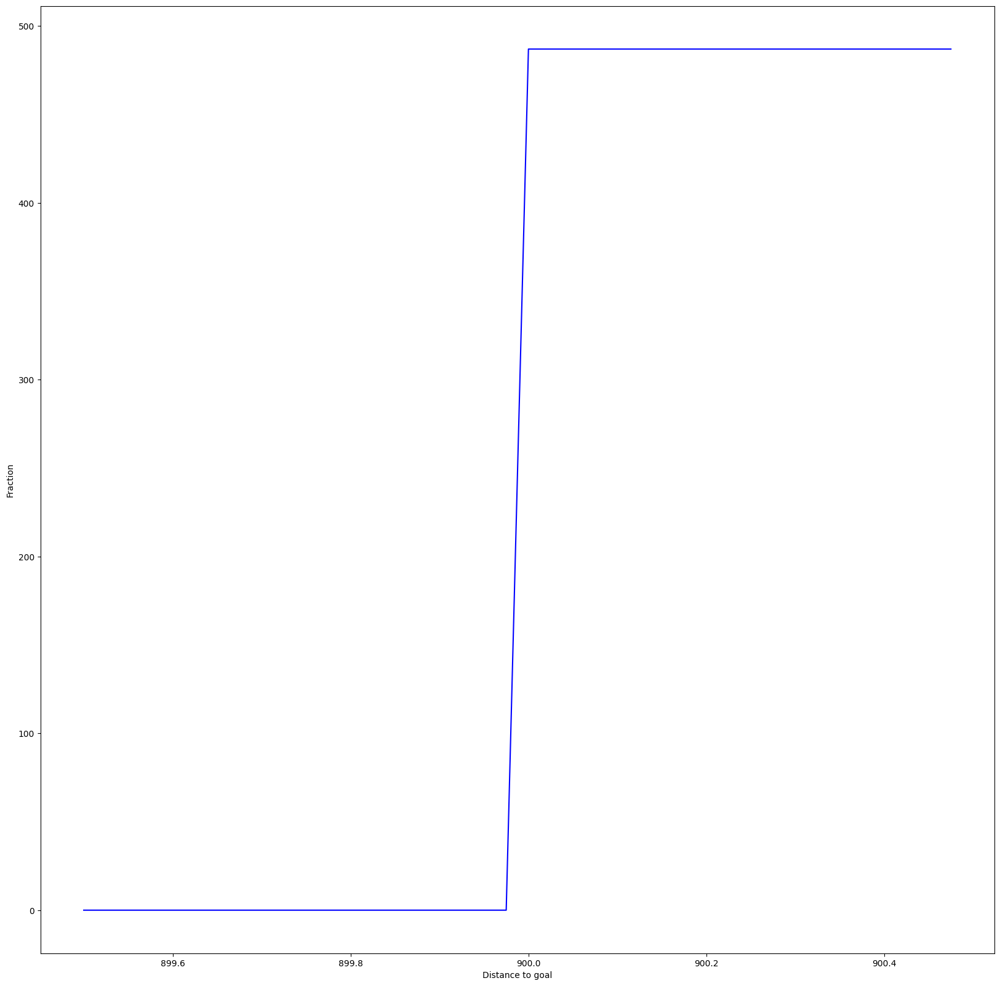

In [ ]:
plot_cumulative_distro_objective(archive)


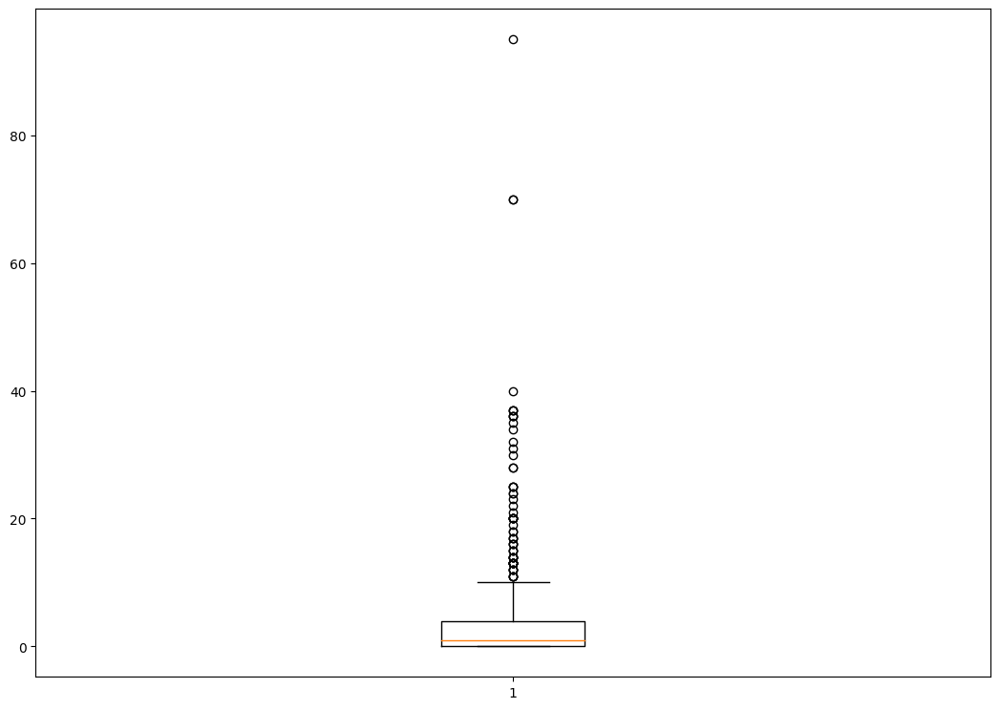

In [ ]:
plot_solution_spread(archive)


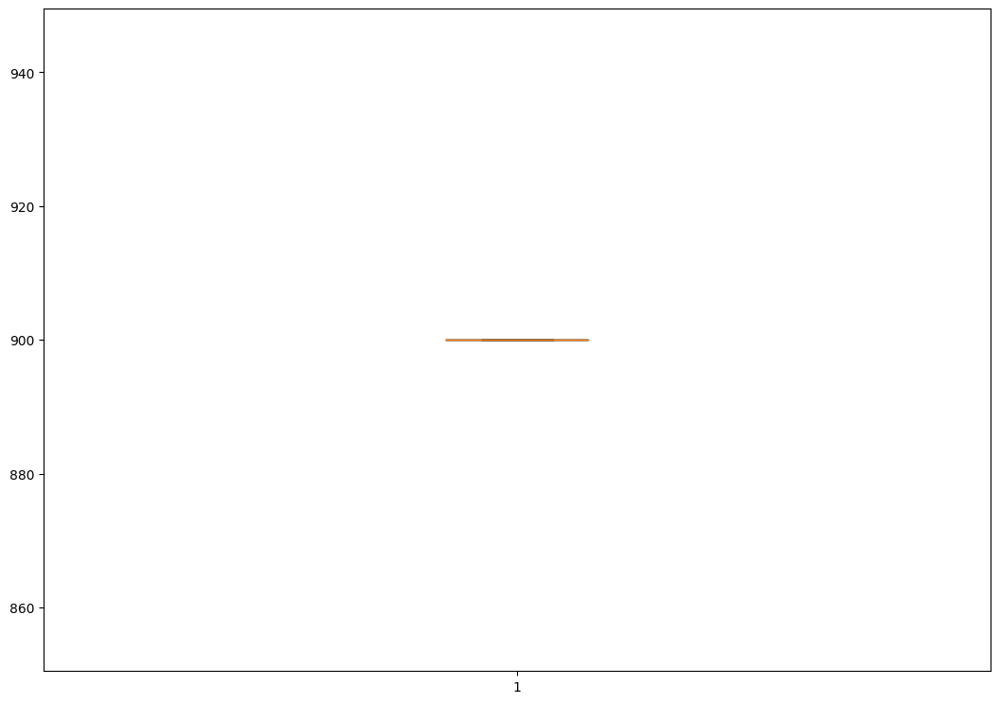

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 150, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })

extra time to initialize archive 0.00033473968505859375
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.015457868576049805
Iterations:   1%|          | 1/100 [00:18<30:57, 18.76s/it]archive training
time to add to som 0.023946046829223633
Iterations:   2%|▏         | 2/100 [00:38<31:13, 19.11s/it]archive training
time to add to som 0.021204710006713867
Iterations:   3%|▎         | 3/100 [00:58<31:52, 19.72s/it]archive training
time to add to som 0.025792598724365234
Iterations:   4%|▍         | 4/100 [01:17<31:09, 19.47s/it]archive training
time to add to som 0.02417778968811035
Iterations:   5%|▌         | 5/100 [01:37<30:59, 19.58s/it]archive training
time to add to som 0.040342092514038086
Iterations:   6%|▌         | 6/100 [01:57<31:08, 19.87s/it]archive training
time to add to som 0.02957606315612793
Iterations:   7%|▋         | 7/100 [02:17<30:37, 19.76s/it]archive training
time to add to som 0.03012251853942871
Iterations:   8%|▊         

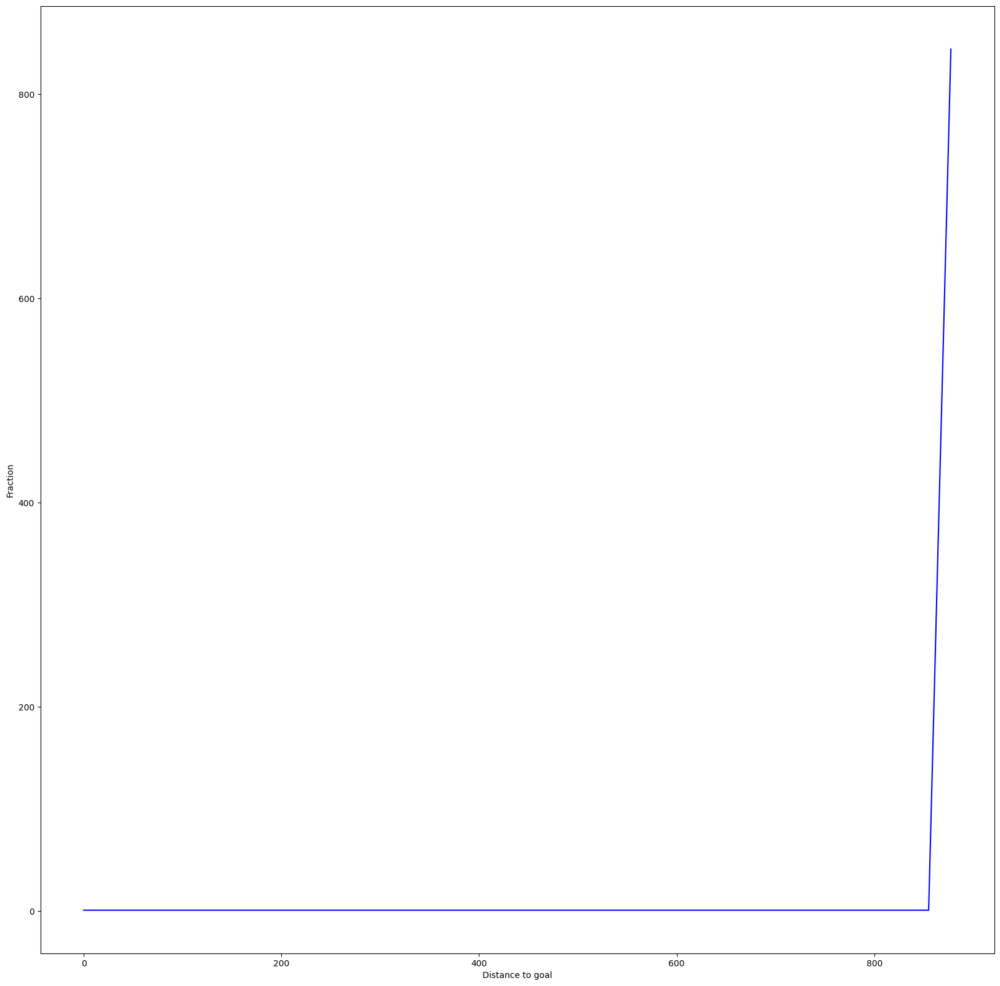

In [ ]:
plot_cumulative_distro_objective(archive)


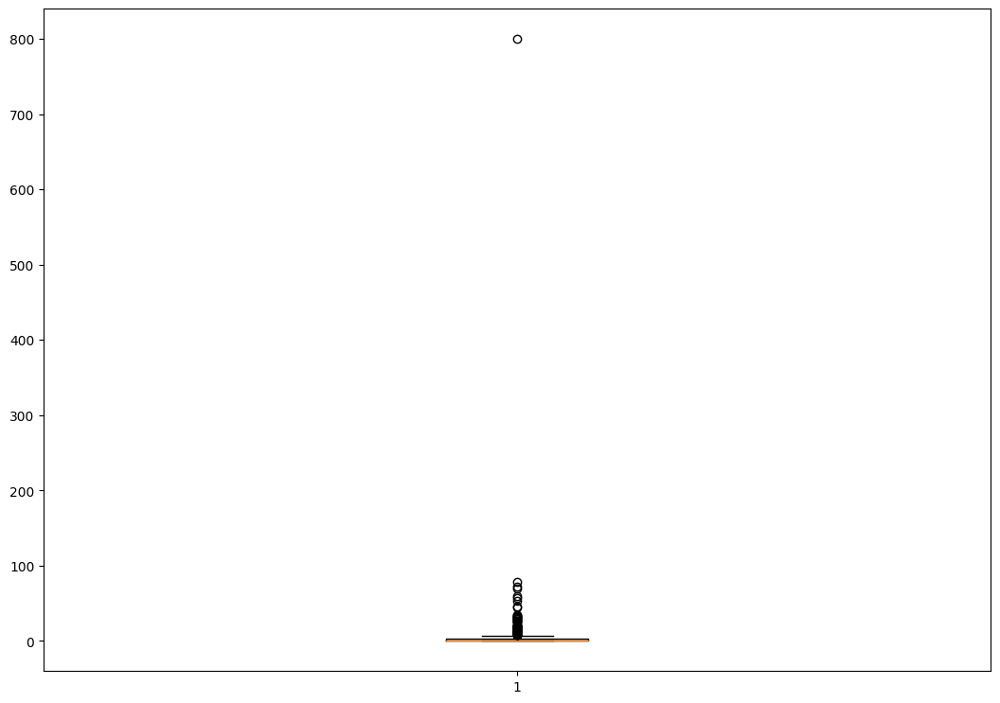

In [ ]:
plot_solution_spread(archive)


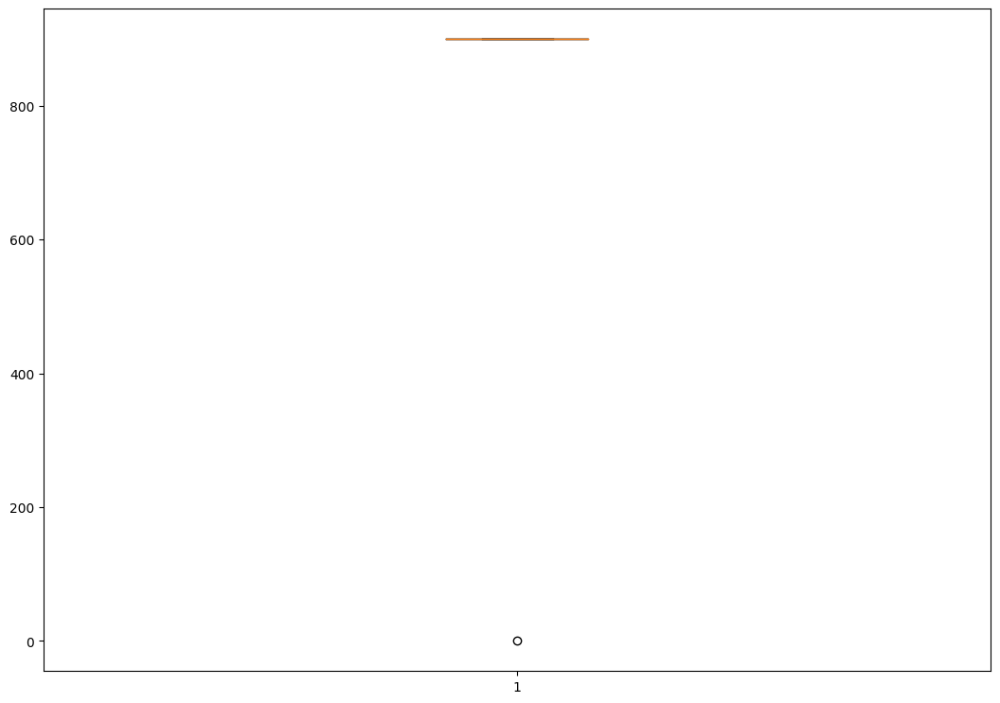

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 150, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.00037479400634765625
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.013865232467651367
Iterations:   1%|          | 1/100 [00:23<38:24, 23.28s/it]archive training
time to add to som 0.01546931266784668
Iterations:   2%|▏         | 2/100 [00:47<39:05, 23.93s/it]archive training
time to add to som 0.017454147338867188
Iterations:   3%|▎         | 3/100 [01:12<39:05, 24.18s/it]archive training
time to add to som 0.02028799057006836
Iterations:   4%|▍         | 4/100 [01:36<38:50, 24.28s/it]archive training
time to add to som 0.027747154235839844
Iterations:   5%|▌         | 5/100 [01:59<37:44, 23.83s/it]archive training
time to add to som 0.023341894149780273
Iterations:   6%|▌         | 6/100 [02:23<37:36, 24.01s/it]archive training
time to add to som 0.03898167610168457
Iterations:   7%|▋         | 7/100 [02:46<36:39, 23.65s/it]archive training
time to add to som 0.025890350341796875
Iterations:   8%|▊         

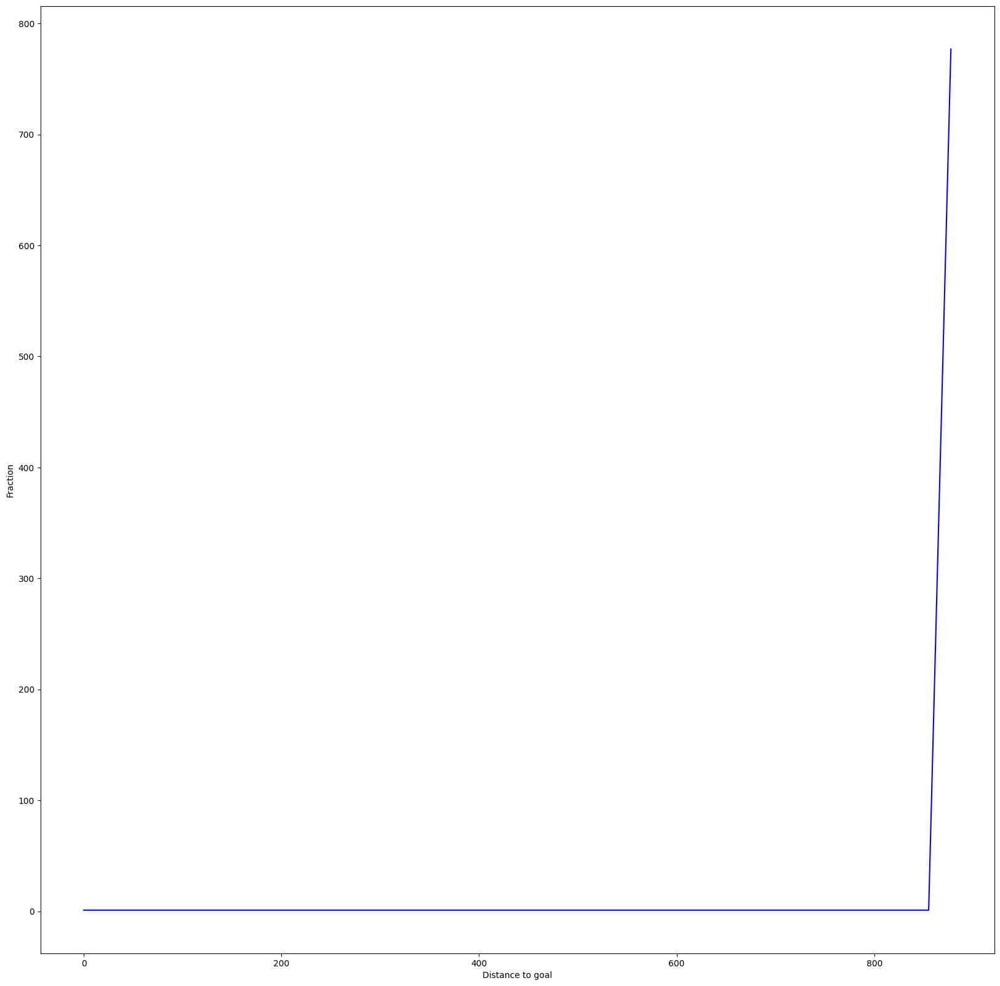

In [ ]:
plot_cumulative_distro_objective(archive)

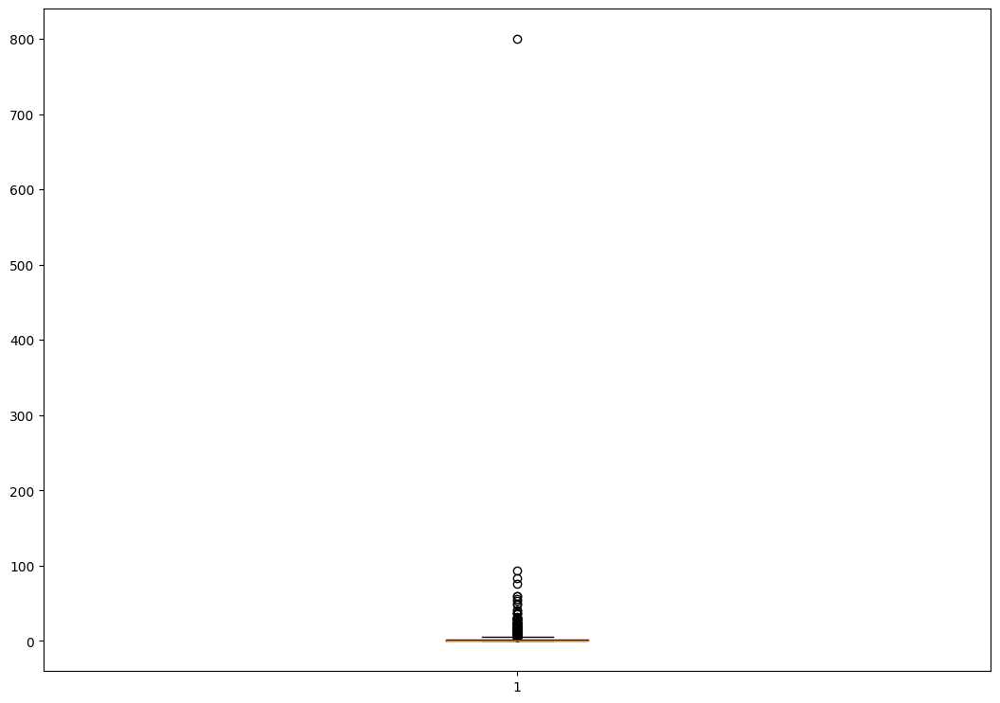

In [ ]:
plot_solution_spread(archive)

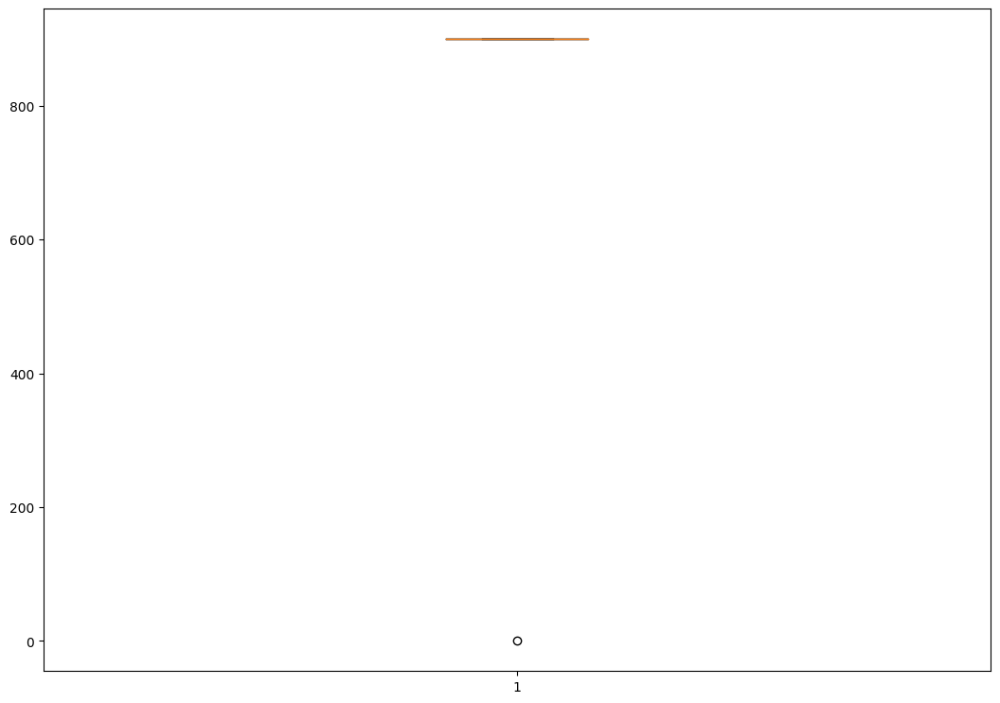

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 150, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0003528594970703125
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.030264854431152344
Iterations:   1%|          | 1/100 [00:22<37:37, 22.80s/it]archive training
time to add to som 0.021125078201293945
Iterations:   2%|▏         | 2/100 [00:49<41:03, 25.14s/it]archive training
time to add to som 0.03992486000061035
Iterations:   3%|▎         | 3/100 [01:32<53:42, 33.22s/it]archive training
time to add to som 0.05113506317138672
Iterations:   4%|▍         | 4/100 [02:04<52:35, 32.87s/it]archive training
time to add to som 0.028155803680419922
Iterations:   5%|▌         | 5/100 [02:28<46:47, 29.55s/it]archive training
time to add to som 0.0502016544342041
Iterations:   6%|▌         | 6/100 [02:52<43:25, 27.72s/it]archive training
time to add to som 0.04051351547241211
Iterations:   7%|▋         | 7/100 [03:15<40:35, 26.18s/it]archive training
time to add to som 0.07547783851623535
Iterations:   8%|▊         | 8/

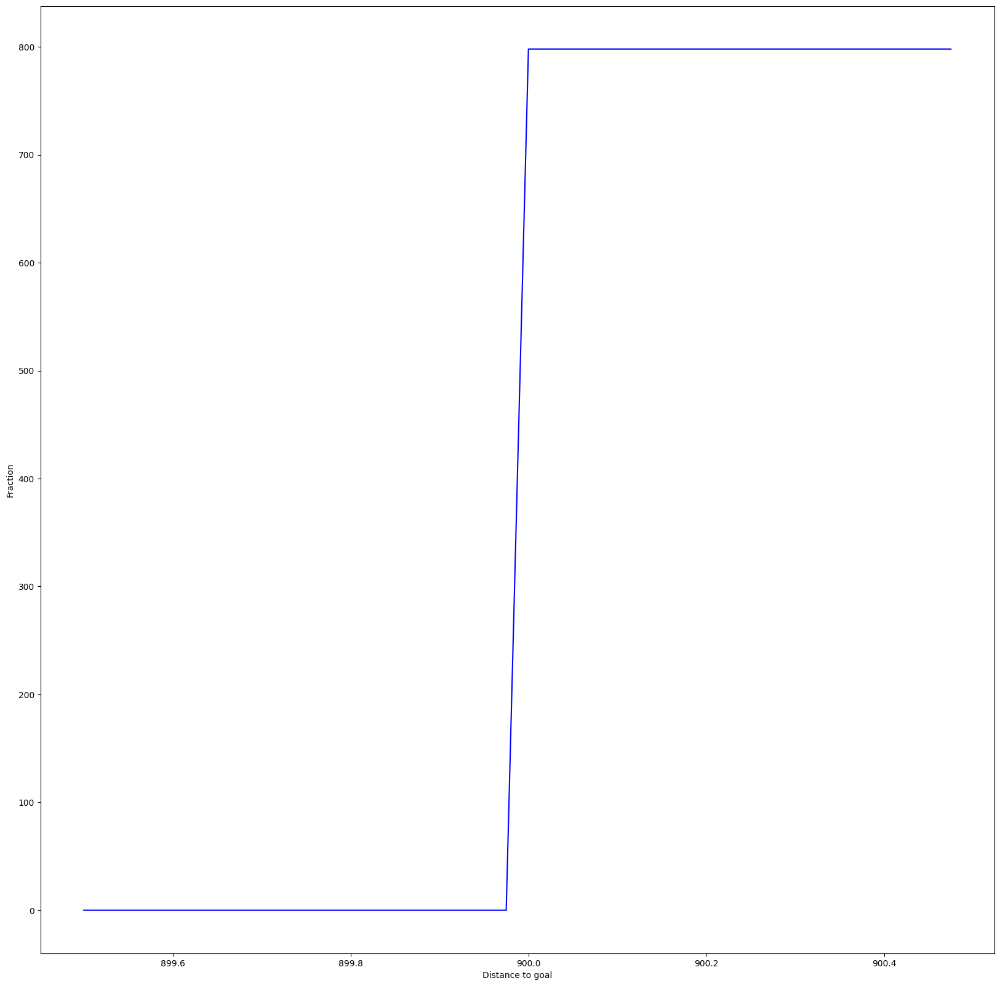

In [ ]:
plot_cumulative_distro_objective(archive)

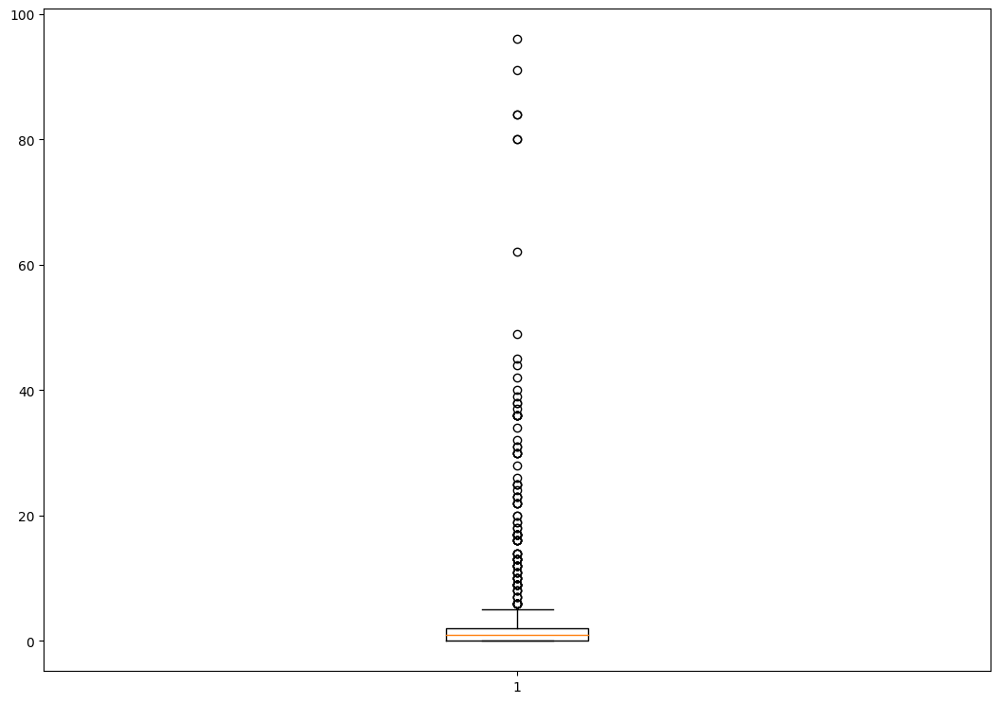

In [ ]:
plot_solution_spread(archive)

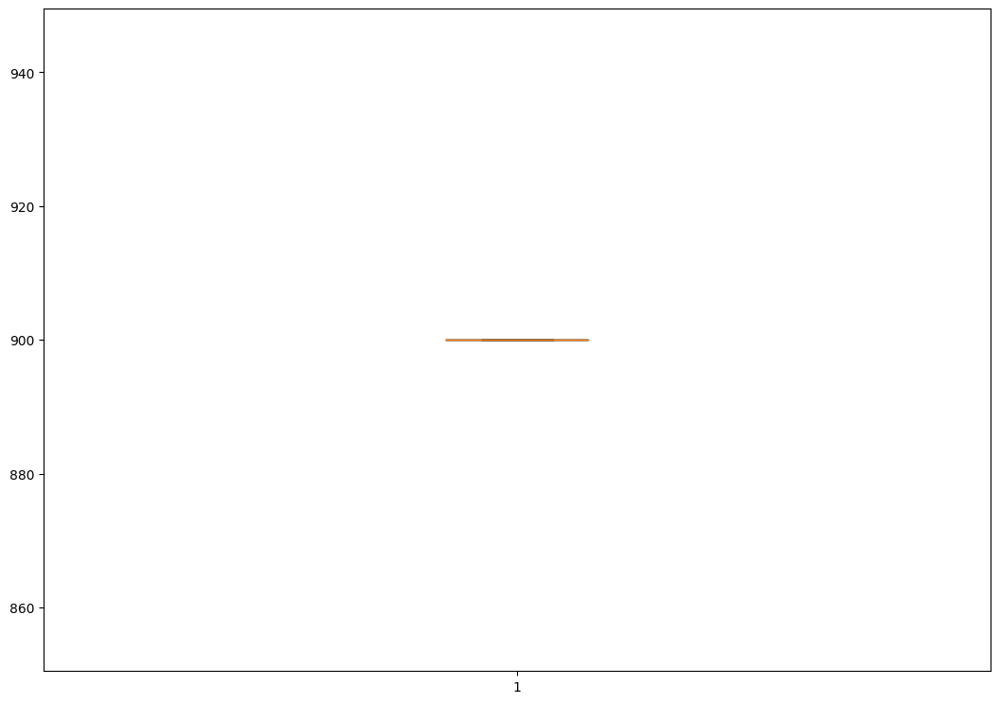

In [ ]:
plot_solution_distance(archive)

######*11.1.3 500d*

In [ ]:
archive = maze_exp(archive_name = "cvt", exp_name = "maze4", dim=500)

extra time to initialize archive 381.6156234741211
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to cvt 0.22232556343078613
Iterations:   1%|          | 1/100 [00:28<46:36, 28.25s/it]archive training
time to add to cvt 0.22971248626708984
Iterations:   2%|▏         | 2/100 [00:53<43:25, 26.59s/it]archive training
time to add to cvt 0.17954230308532715
Iterations:   3%|▎         | 3/100 [01:20<42:50, 26.50s/it]archive training
time to add to cvt 0.25038623809814453
Iterations:   4%|▍         | 4/100 [01:48<43:36, 27.25s/it]archive training
time to add to cvt 0.3019139766693115
Iterations:   5%|▌         | 5/100 [02:13<42:06, 26.59s/it]archive training
time to add to cvt 0.275432825088501
Iterations:   6%|▌         | 6/100 [02:42<42:30, 27.14s/it]archive training
time to add to cvt 0.265169620513916
Iterations:   7%|▋         | 7/100 [03:11<43:18, 27.94s/it]archive training
time to add to cvt 0.29381632804870605
Iterations:   8%|▊         | 8/100 [03:39<

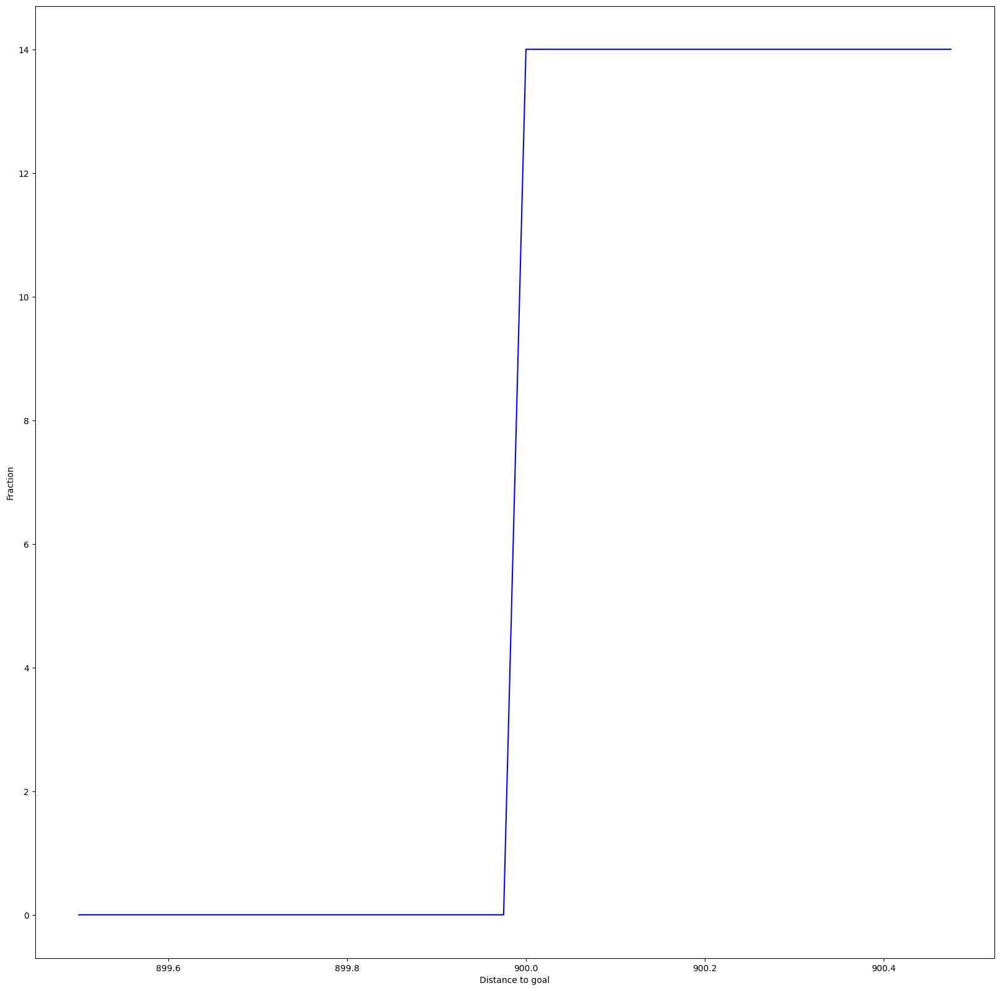

In [ ]:
plot_cumulative_distro_objective(archive)

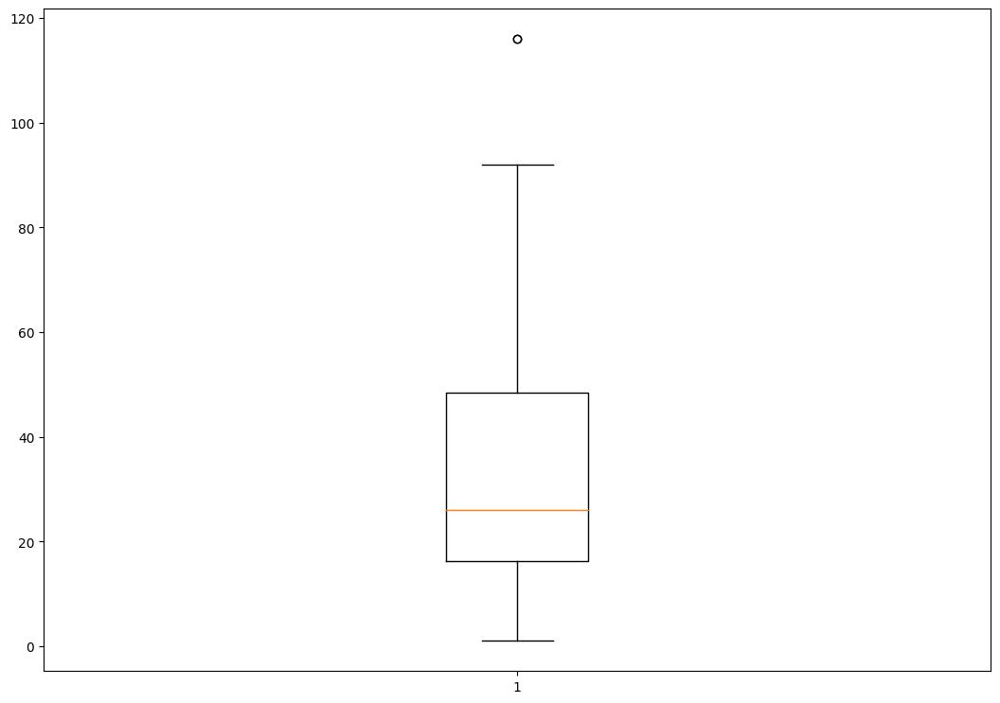

In [ ]:
plot_solution_spread(archive)

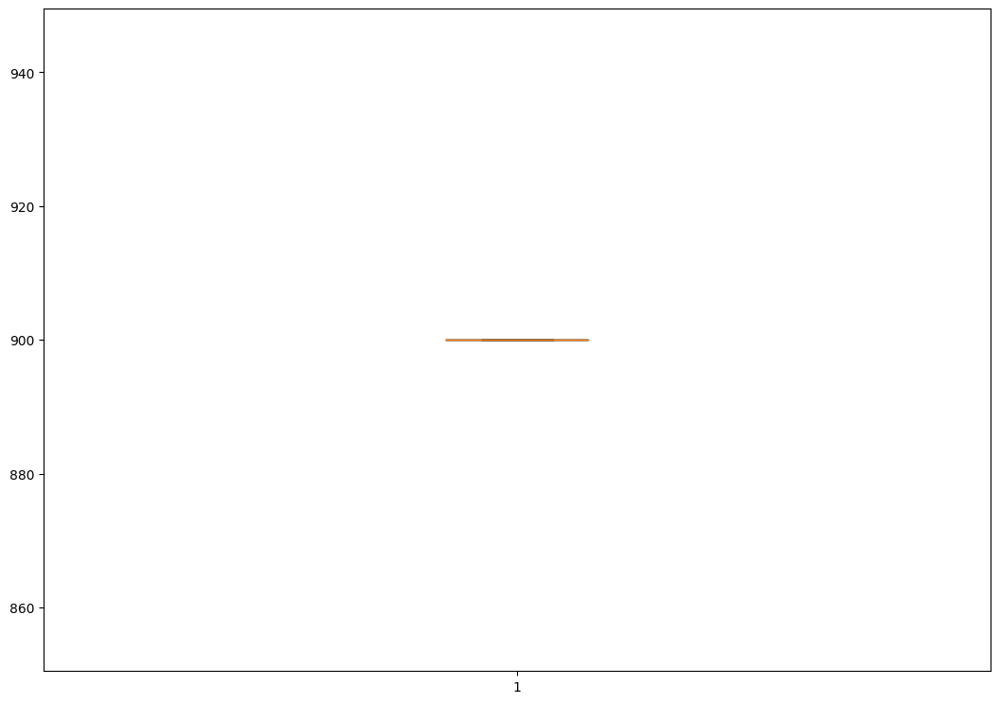

In [ ]:
plot_solution_distance(archive)

som

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 500)

extra time to initialize archive 0.0002353191375732422
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.011504650115966797
Iterations:   1%|          | 1/100 [00:19<32:05, 19.45s/it]archive training
time to add to som 0.014837980270385742
Iterations:   2%|▏         | 2/100 [00:38<31:13, 19.12s/it]archive training
time to add to som 0.01833486557006836
Iterations:   3%|▎         | 3/100 [00:57<31:10, 19.29s/it]archive training
time to add to som 0.02310943603515625
Iterations:   4%|▍         | 4/100 [01:17<31:07, 19.45s/it]archive training
time to add to som 0.027243375778198242
Iterations:   5%|▌         | 5/100 [01:36<30:35, 19.33s/it]archive training
time to add to som 0.026831626892089844
Iterations:   6%|▌         | 6/100 [01:56<30:28, 19.45s/it]archive training
time to add to som 0.04359722137451172
Iterations:   7%|▋         | 7/100 [02:15<30:01, 19.37s/it]archive training
time to add to som 0.035179853439331055
Iterations:   8%|▊         |

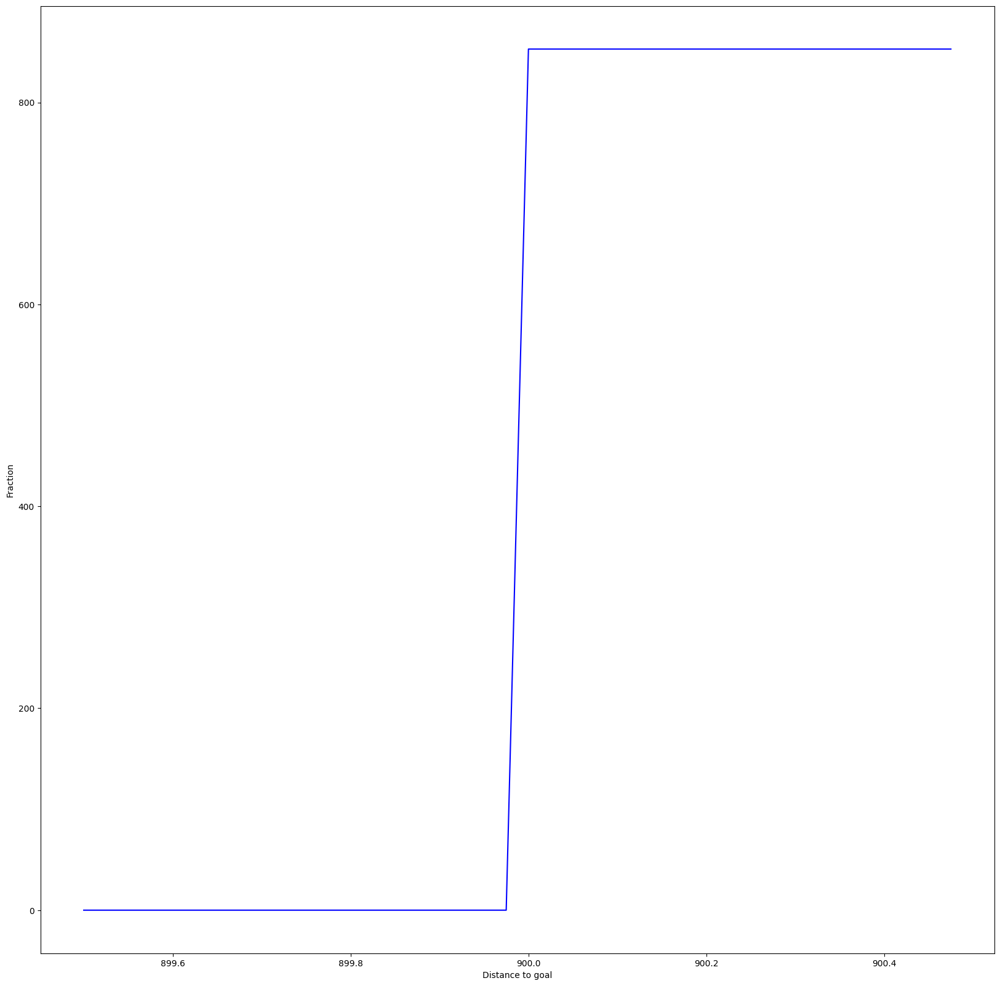

In [ ]:
plot_cumulative_distro_objective(archive)


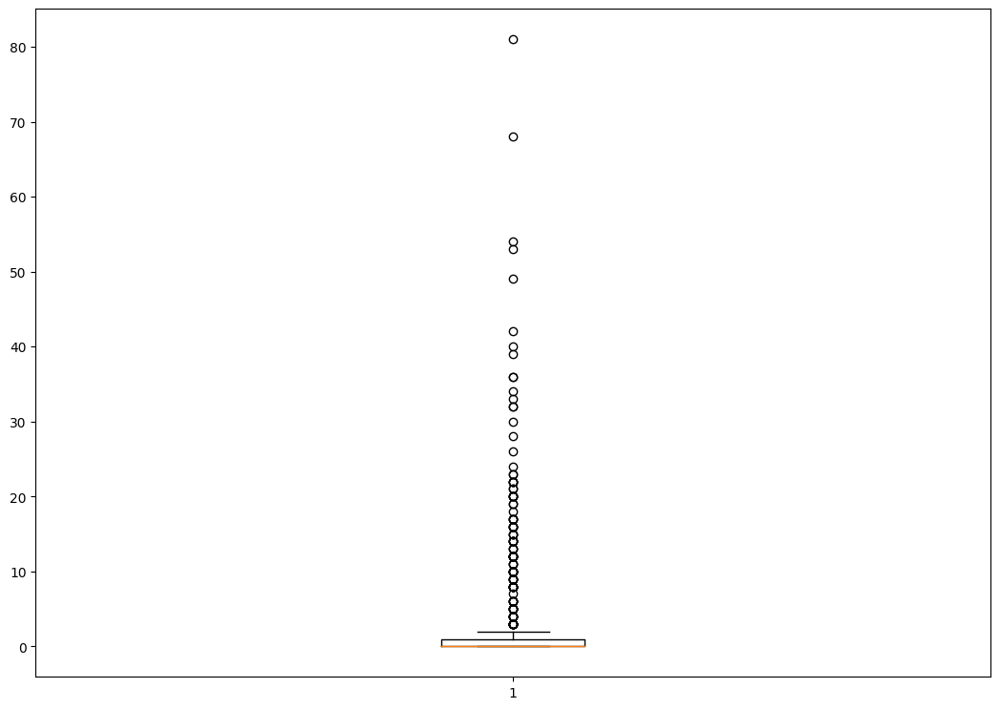

In [ ]:
plot_solution_spread(archive)


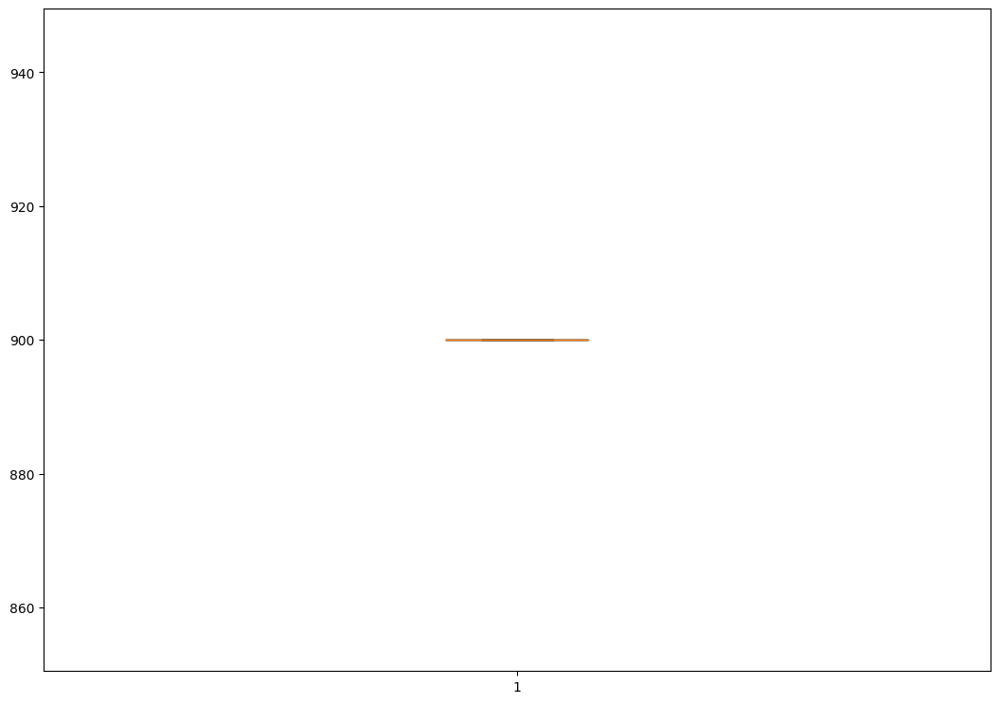

In [ ]:
plot_solution_distance(archive)

high age

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 50
             })



extra time to initialize archive 0.00036978721618652344
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.028371572494506836
Iterations:   1%|          | 1/100 [00:21<35:42, 21.64s/it]archive training
time to add to som 0.021394014358520508
Iterations:   2%|▏         | 2/100 [00:42<35:01, 21.44s/it]archive training
time to add to som 0.03179597854614258
Iterations:   3%|▎         | 3/100 [01:03<34:06, 21.10s/it]archive training
time to add to som 0.0633854866027832
Iterations:   4%|▍         | 4/100 [01:25<34:16, 21.42s/it]archive training
time to add to som 0.04697751998901367
Iterations:   5%|▌         | 5/100 [01:46<33:24, 21.10s/it]archive training
time to add to som 0.05509829521179199
Iterations:   6%|▌         | 6/100 [02:06<32:51, 20.98s/it]archive training
time to add to som 0.06522965431213379
Iterations:   7%|▋         | 7/100 [02:29<33:10, 21.40s/it]archive training
time to add to som 0.06851553916931152
Iterations:   8%|▊         | 8/

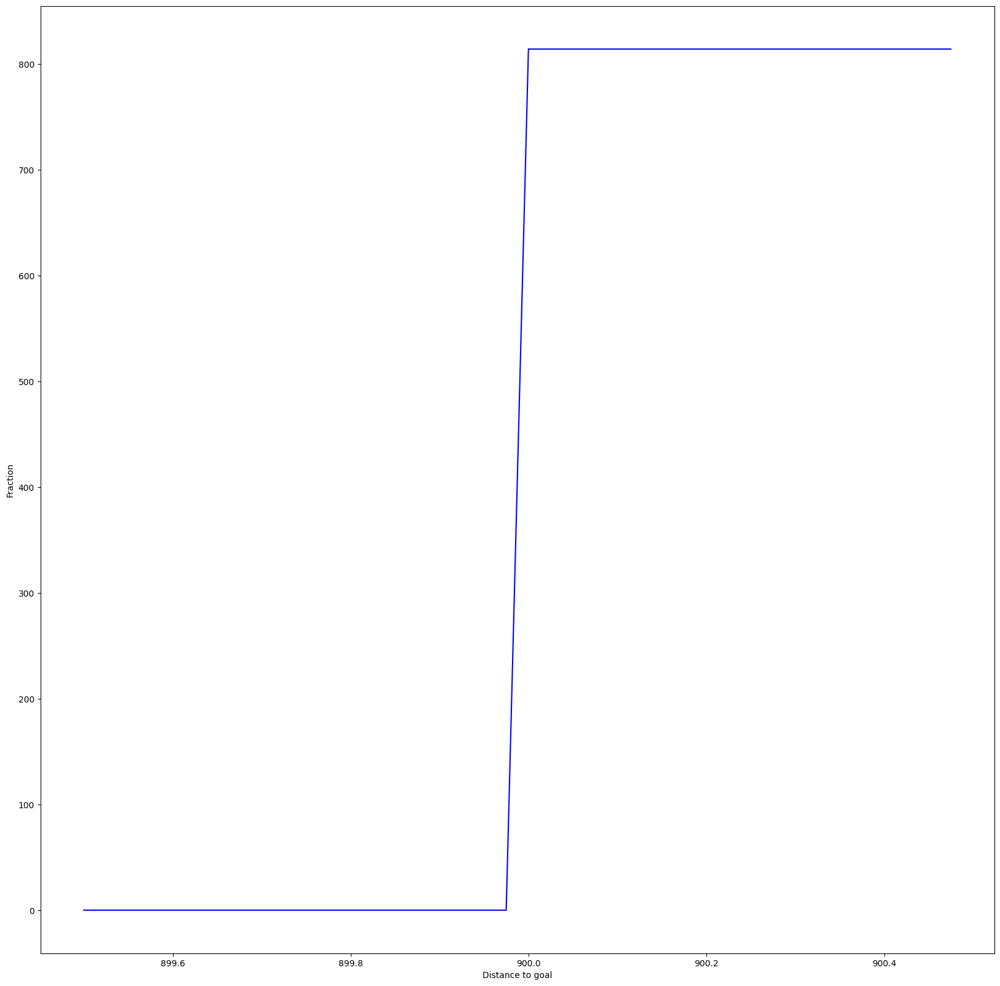

In [ ]:
plot_cumulative_distro_objective(archive)

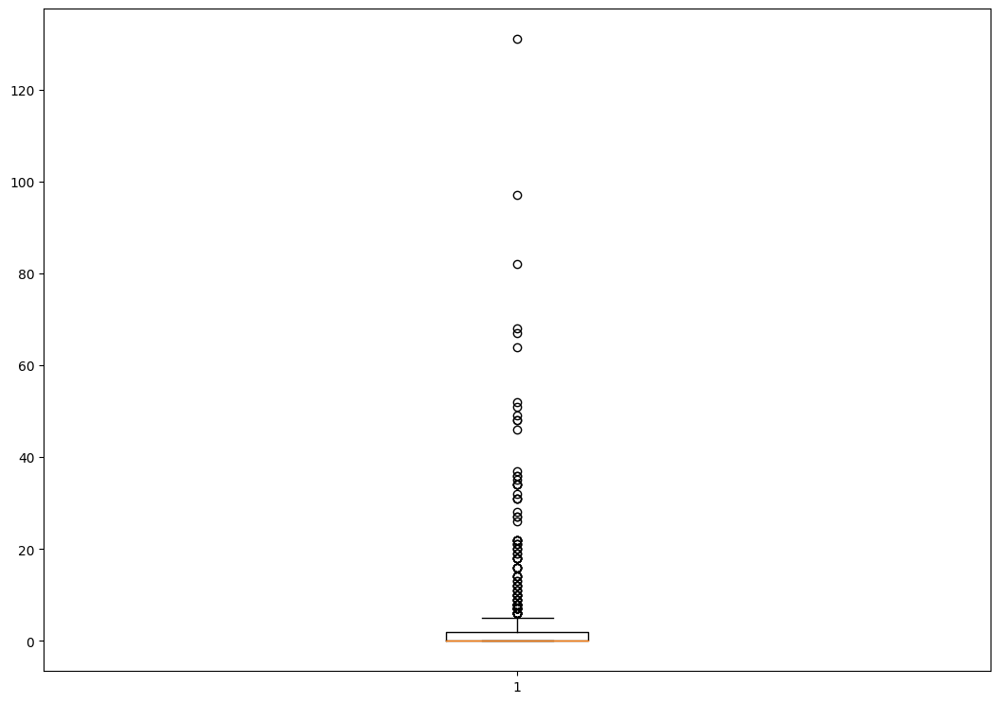

In [ ]:
plot_solution_spread(archive)


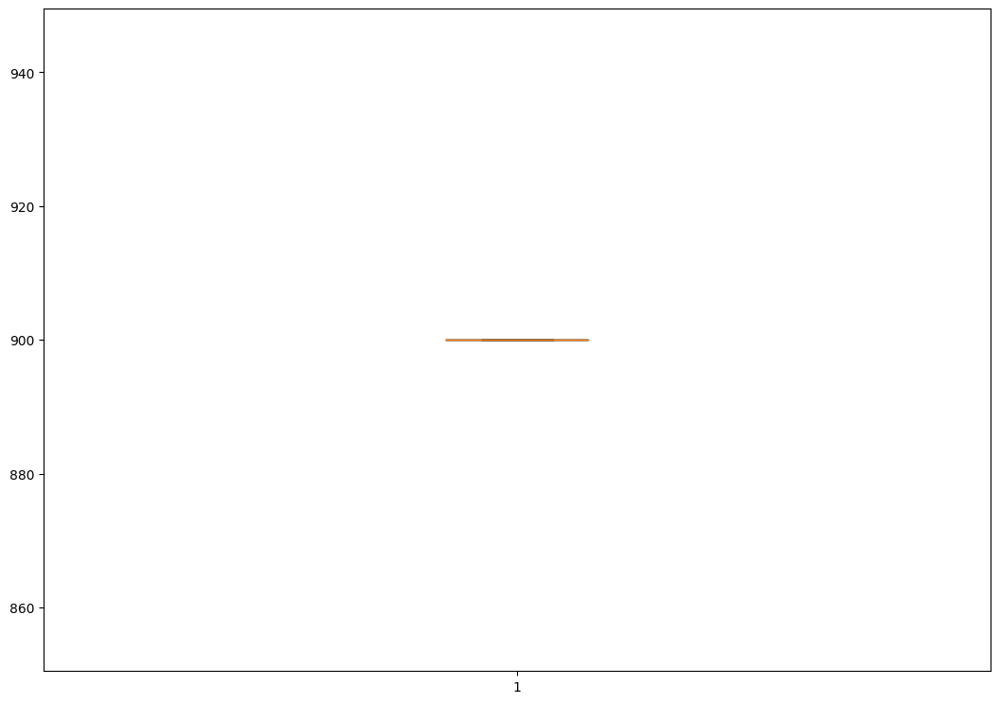

In [ ]:
plot_solution_distance(archive)

high multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 2.05,
                 "multiplier_neighbour": 2.05,
                 "maximum_age": 40
             })


extra time to initialize archive 0.00033402442932128906
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.0139312744140625
Iterations:   1%|          | 1/100 [00:18<31:00, 18.79s/it]archive training
time to add to som 0.018193721771240234
Iterations:   2%|▏         | 2/100 [00:37<30:32, 18.70s/it]archive training
time to add to som 0.03689384460449219
Iterations:   3%|▎         | 3/100 [00:56<30:22, 18.79s/it]archive training
time to add to som 0.04342842102050781
Iterations:   4%|▍         | 4/100 [01:16<31:04, 19.43s/it]archive training
time to add to som 0.036623239517211914
Iterations:   5%|▌         | 5/100 [01:35<30:29, 19.26s/it]archive training
time to add to som 0.03884077072143555
Iterations:   6%|▌         | 6/100 [01:54<29:57, 19.12s/it]archive training
time to add to som 0.04218125343322754
Iterations:   7%|▋         | 7/100 [02:13<29:34, 19.08s/it]archive training
time to add to som 0.0589907169342041
Iterations:   8%|▊         | 8/1

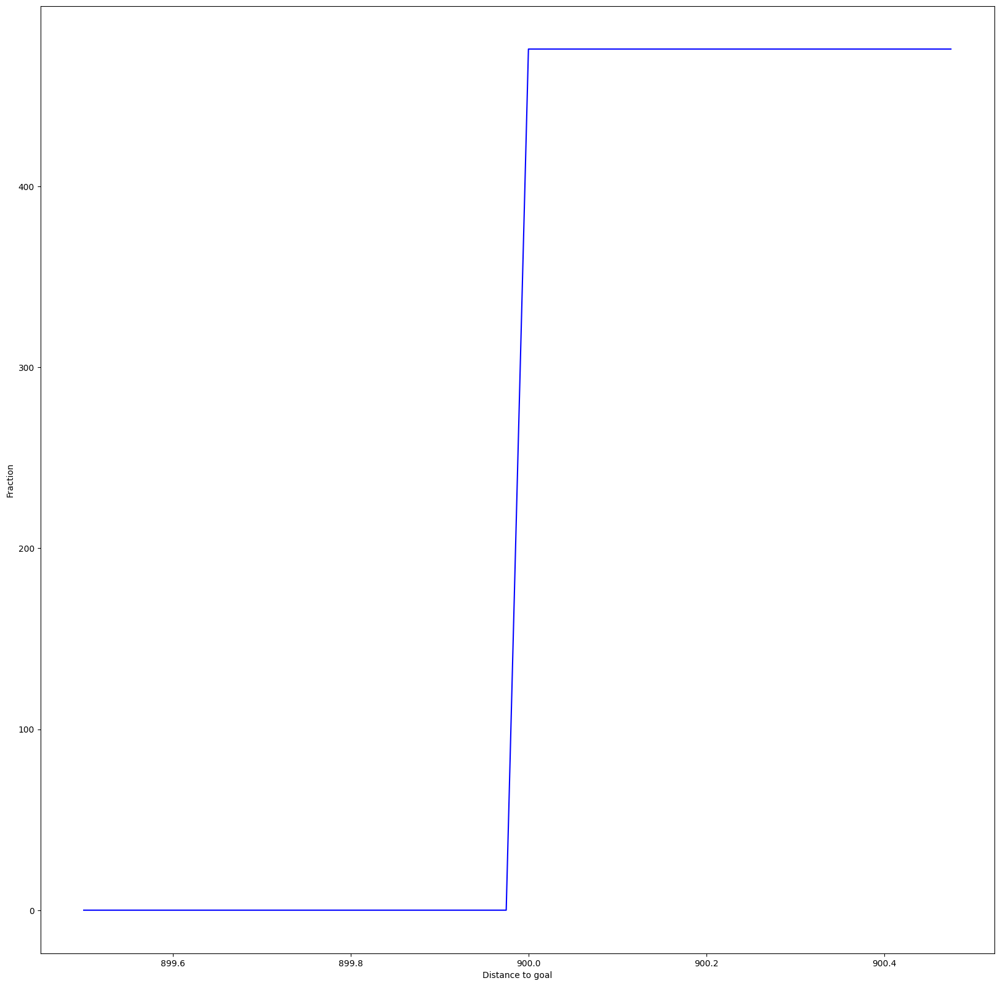

In [ ]:
plot_cumulative_distro_objective(archive)


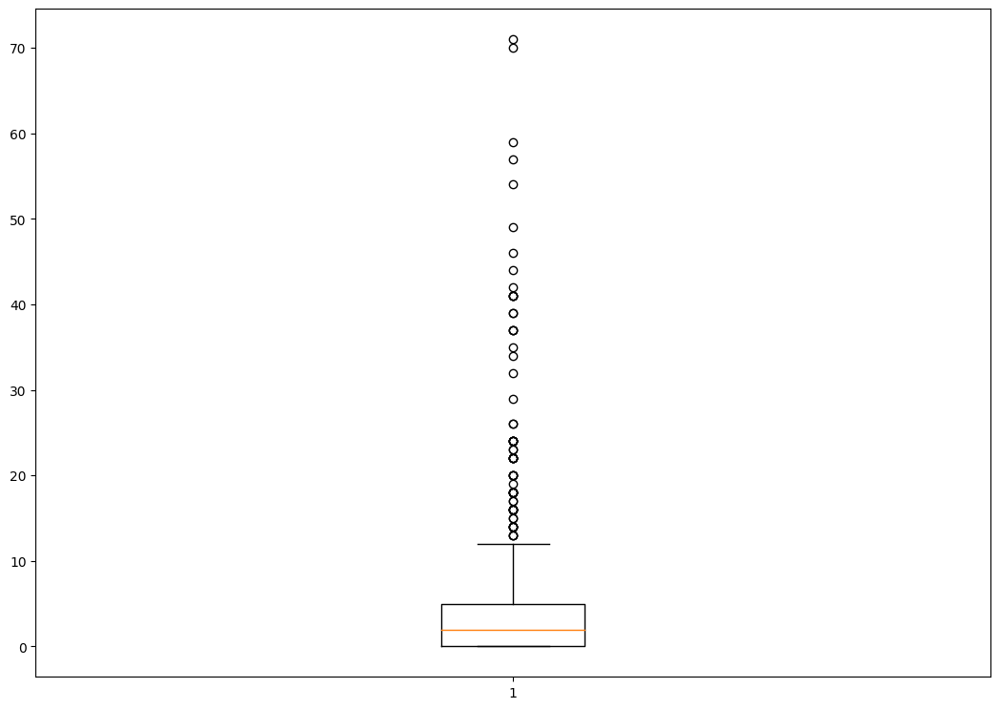

In [ ]:
plot_solution_spread(archive)


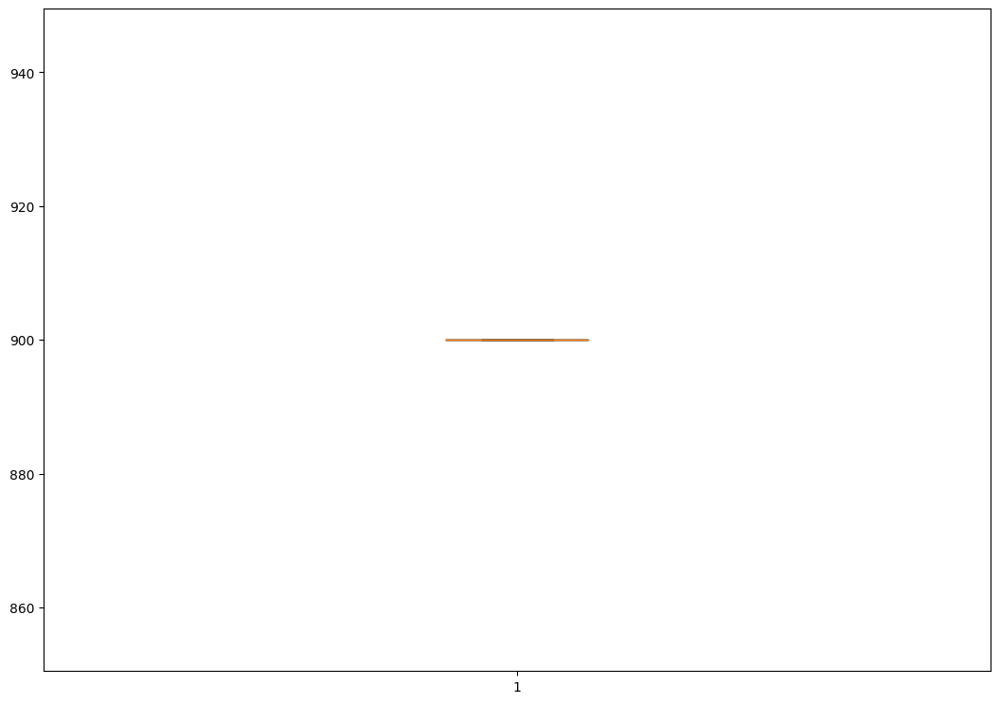

In [ ]:
plot_solution_distance(archive)

half multiplier

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 500, params = {
                 "decay_firing": 3.33,
                 "decay_neighbour": 14.3,
                 "multiplier_firing": 0.55,
                 "multiplier_neighbour": 0.55,
                 "maximum_age": 40
             })


extra time to initialize archive 0.002267599105834961
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.024009227752685547
Iterations:   1%|          | 1/100 [00:19<32:42, 19.82s/it]archive training
time to add to som 0.02579498291015625
Iterations:   2%|▏         | 2/100 [00:39<32:08, 19.68s/it]archive training
time to add to som 0.05085635185241699
Iterations:   3%|▎         | 3/100 [01:00<33:00, 20.42s/it]archive training
time to add to som 0.04730081558227539
Iterations:   4%|▍         | 4/100 [01:20<32:20, 20.21s/it]archive training
time to add to som 0.052735090255737305
Iterations:   5%|▌         | 5/100 [01:40<31:59, 20.20s/it]archive training
time to add to som 0.08103632926940918
Iterations:   6%|▌         | 6/100 [02:02<32:21, 20.65s/it]archive training
time to add to som 0.060781002044677734
Iterations:   7%|▋         | 7/100 [02:22<31:51, 20.55s/it]archive training
time to add to som 0.06709647178649902
Iterations:   8%|▊         | 8/

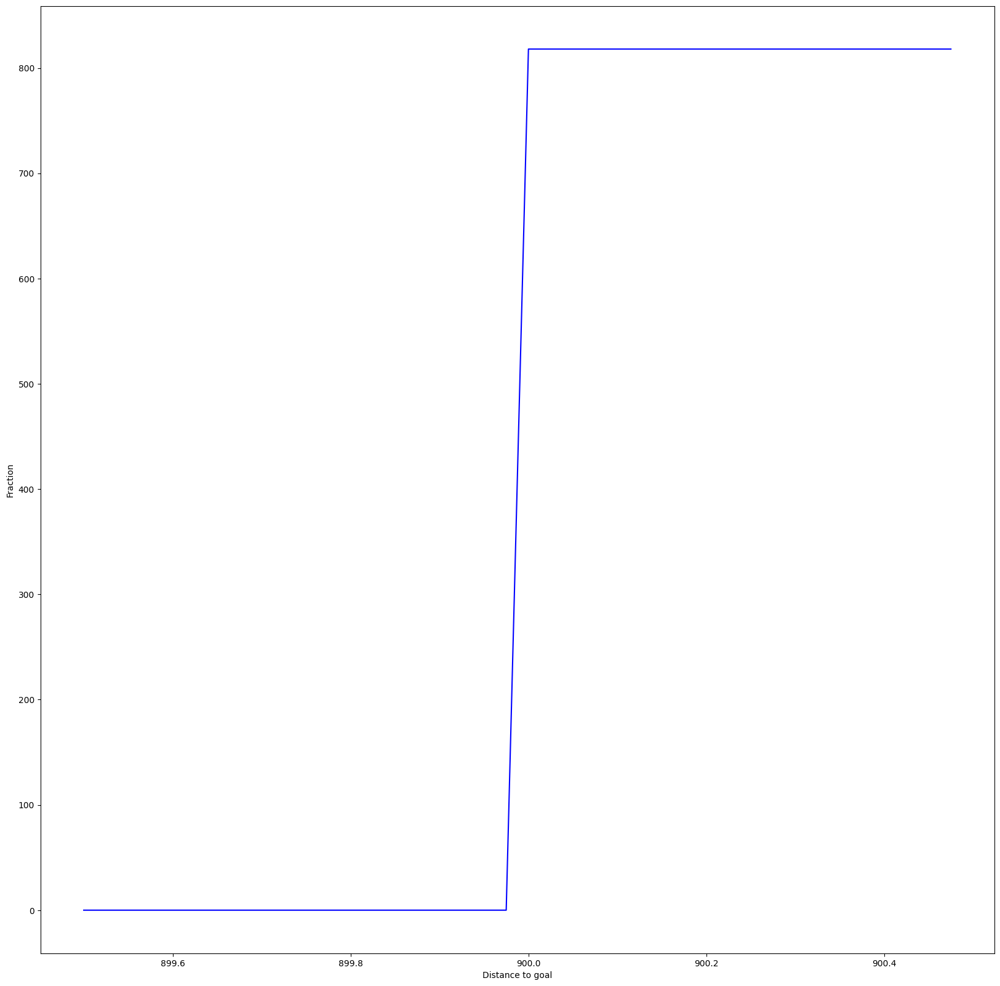

In [ ]:
plot_cumulative_distro_objective(archive)


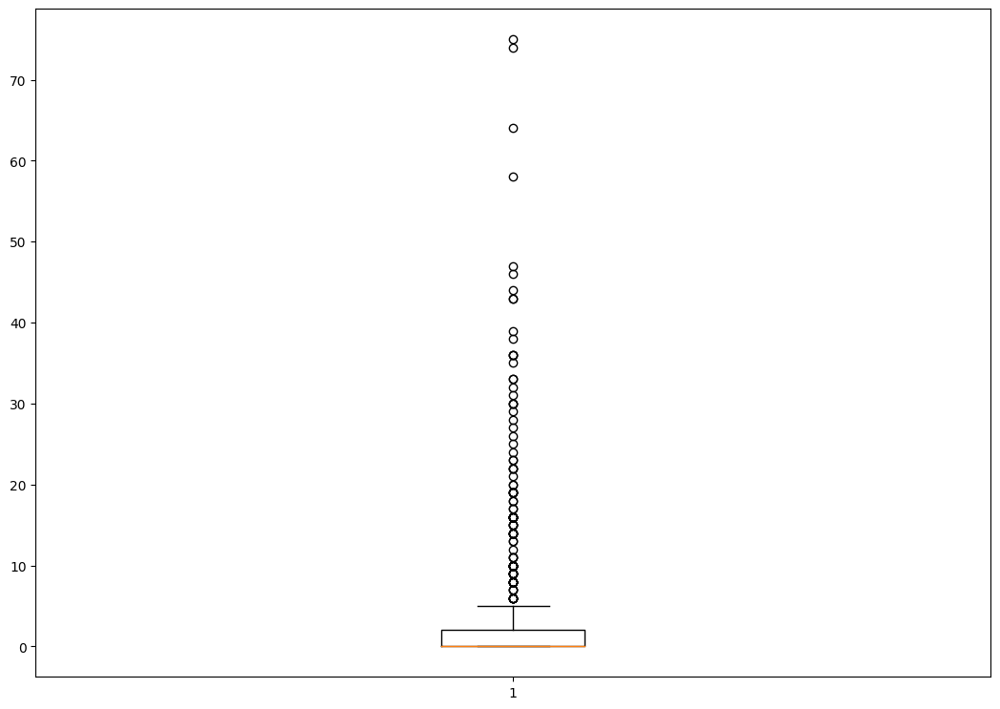

In [ ]:
plot_solution_spread(archive)


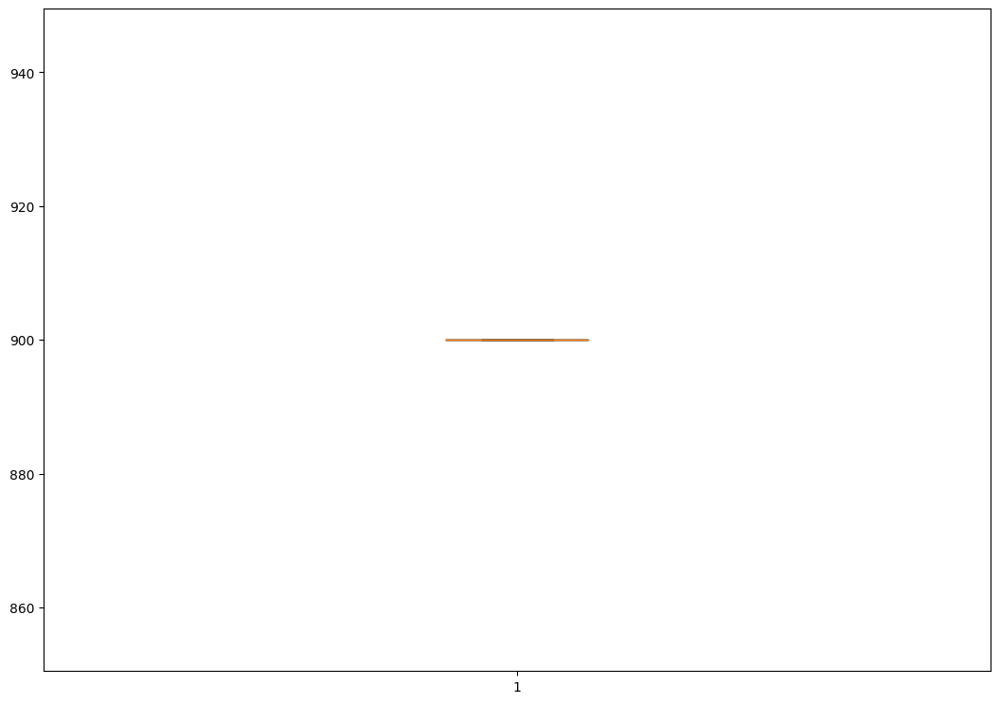

In [ ]:
plot_solution_distance(archive)

double decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 500, params = {
                 "decay_firing": 6.66,
                 "decay_neighbour": 28.6,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0003421306610107422
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.01590561866760254
Iterations:   1%|          | 1/100 [00:22<37:44, 22.88s/it]archive training
time to add to som 0.020710468292236328
Iterations:   2%|▏         | 2/100 [00:47<38:37, 23.64s/it]archive training
time to add to som 0.024830341339111328
Iterations:   3%|▎         | 3/100 [01:10<37:58, 23.49s/it]archive training
time to add to som 0.03214311599731445
Iterations:   4%|▍         | 4/100 [01:35<38:22, 23.99s/it]archive training
time to add to som 0.051592111587524414
Iterations:   5%|▌         | 5/100 [01:58<37:45, 23.85s/it]archive training
time to add to som 0.04428219795227051
Iterations:   6%|▌         | 6/100 [02:23<37:50, 24.16s/it]archive training
time to add to som 0.07130599021911621
Iterations:   7%|▋         | 7/100 [02:49<38:12, 24.65s/it]archive training
time to add to som 0.05683255195617676
Iterations:   8%|▊         | 8

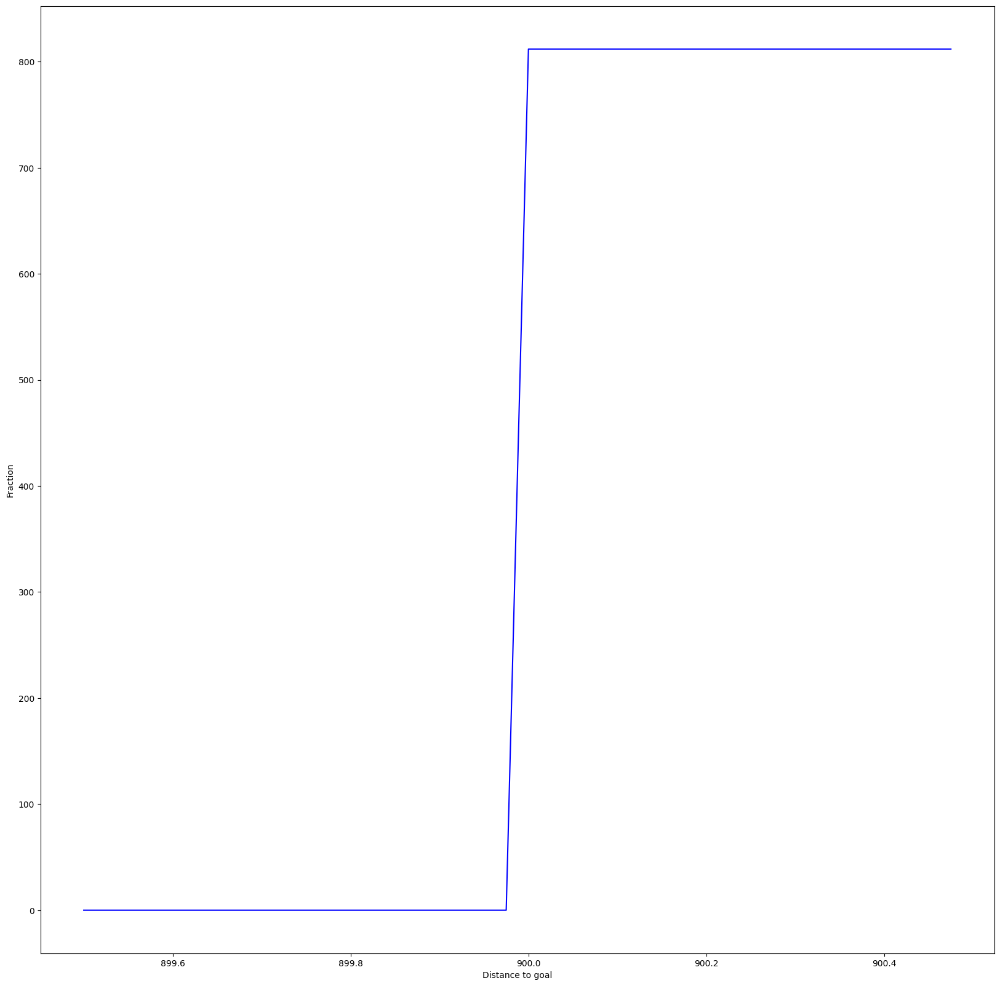

In [ ]:
plot_cumulative_distro_objective(archive)

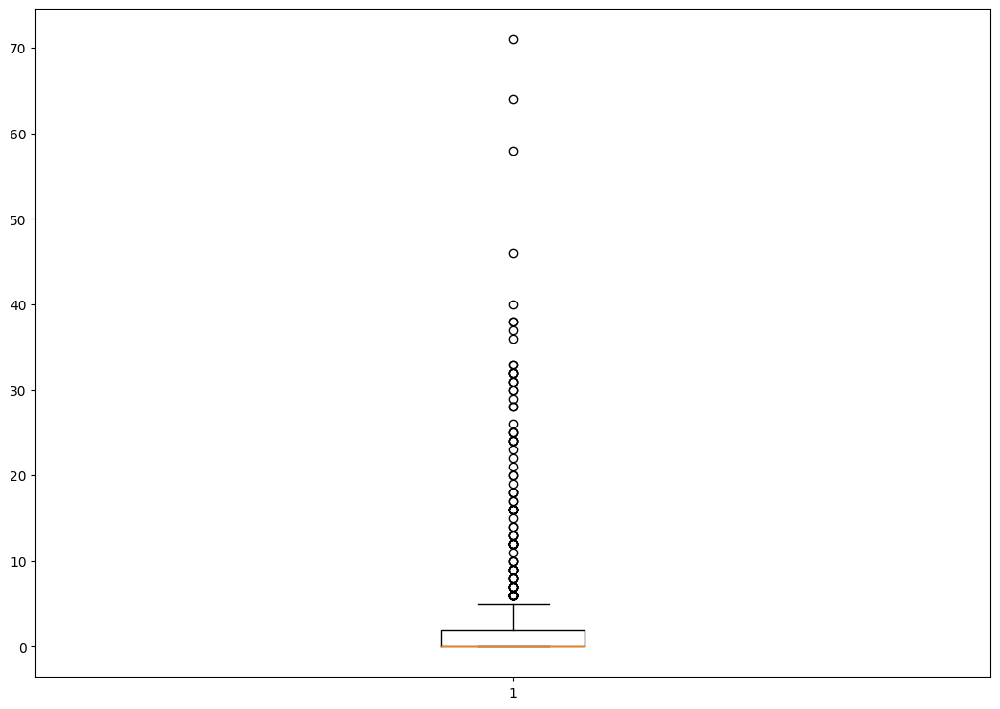

In [ ]:
plot_solution_spread(archive)

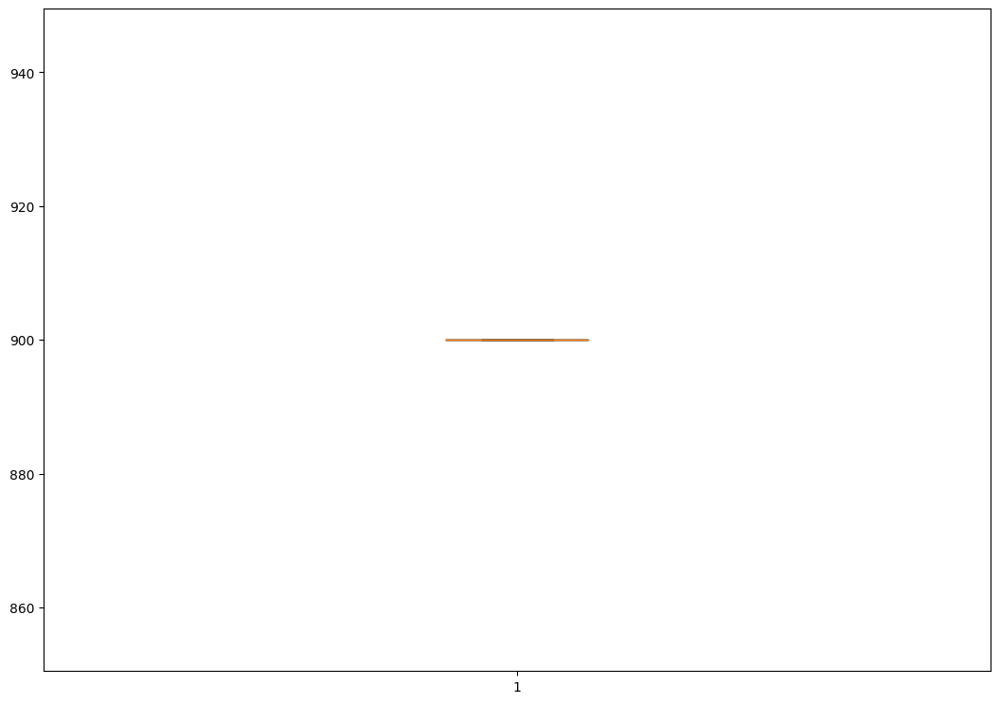

In [ ]:
plot_solution_distance(archive)

half decay

In [ ]:
archive = maze_exp(archive_name = "som", exp_name = "maze4", dim = 500, params = {
                 "decay_firing": 1.7,
                 "decay_neighbour": 7.1,
                 "multiplier_firing": 1.05,
                 "multiplier_neighbour": 1.05,
                 "maximum_age": 40
             })




extra time to initialize archive 0.0003693103790283203
Iterations:   0%|          | 0/100 [00:00<?, ?it/s]archive training
time to add to som 0.017331838607788086
Iterations:   1%|          | 1/100 [00:23<38:26, 23.29s/it]archive training
time to add to som 0.025254249572753906
Iterations:   2%|▏         | 2/100 [00:47<38:59, 23.88s/it]archive training
time to add to som 0.05512523651123047
Iterations:   3%|▎         | 3/100 [01:11<38:21, 23.72s/it]archive training
time to add to som 0.043591976165771484
Iterations:   4%|▍         | 4/100 [01:34<37:45, 23.60s/it]archive training
time to add to som 0.05402779579162598
Iterations:   5%|▌         | 5/100 [01:58<37:42, 23.81s/it]archive training
time to add to som 0.0793759822845459
Iterations:   6%|▌         | 6/100 [02:24<38:05, 24.31s/it]archive training
time to add to som 0.07692360877990723
Iterations:   7%|▋         | 7/100 [02:47<37:27, 24.17s/it]archive training
time to add to som 0.09136295318603516
Iterations:   8%|▊         | 8/

In [ ]:
plot_cumulative_distro_objective(archive)

In [ ]:
plot_solution_spread(archive)

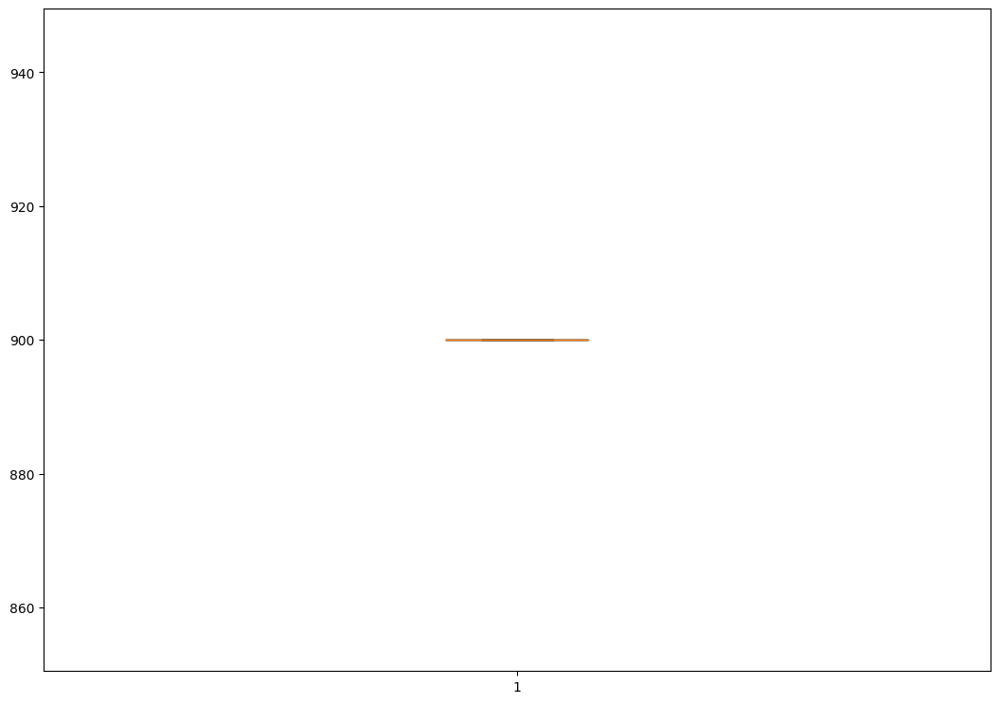

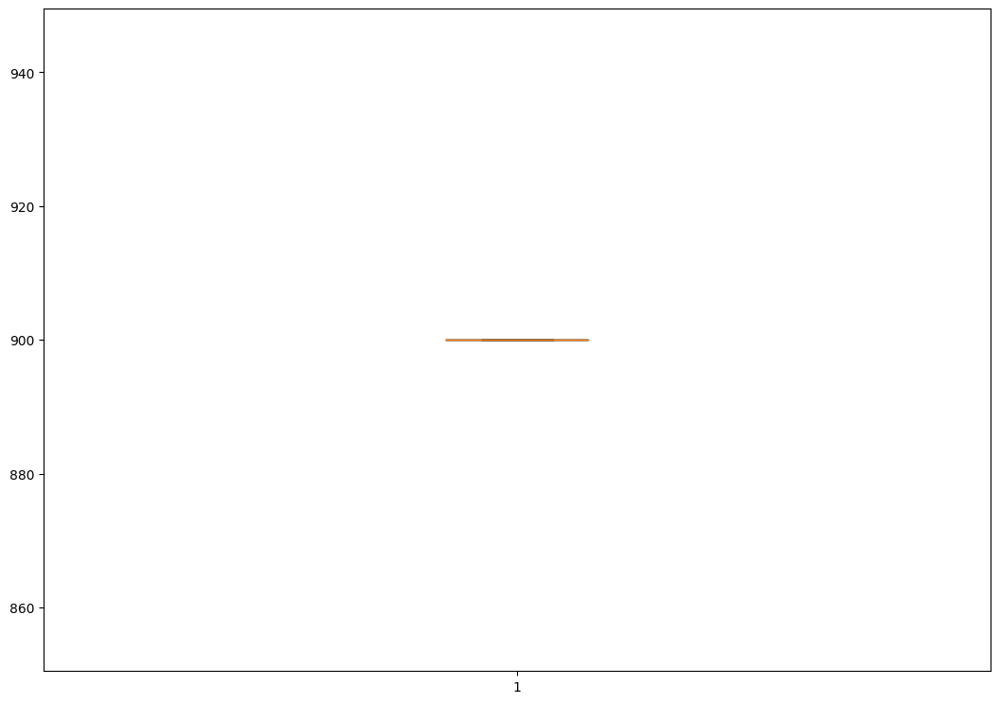

In [ ]:
plot_solution_distance(archive)

####11.2 GP EXPERIMENTS

here
- train evolutionary emitter over train data
- select for be mantained in archive over eval set
- select for hyperparams over develop set


use as SOMAP parameters the setting which create more cells
- double multiplier firing  and neighbour
- double decay firing and neighbour


config space

In [110]:
POP_SIZE_CONFIG = [100, 200, 300, 400, 500]
CROSSOVER_PROB_CONFIG = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
MUTATION_PROB_CONFIG = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7]
GP_TRNMT_SIZE_CONFIG = [3, 6, 12, 24, 48]
RANKER_FACTOR_CONFIG = [0, 100, 500, 1000]

In [111]:
def random_param_search(exp_num = 1, num_samples = 20):
    best_metric = float('-inf')
    best_pop_size = None
    best_crossover_prob = None
    best_mutation_prob = None
    best_gp_trnmt_size = None
    best_ranker_factor = None

    for i in range(num_samples):
        pop_size = random.choice(POP_SIZE_CONFIG)
        crossover_prob = random.choice(CROSSOVER_PROB_CONFIG)
        mutation_prob = random.choice(MUTATION_PROB_CONFIG)
        gp_trnmt_size = random.choice(GP_TRNMT_SIZE_CONFIG)
        ranker_factor = random.choice(RANKER_FACTOR_CONFIG)
        print("testing : " + str(pop_size))
        print("testing crossover : " + str(crossover_prob))
        print("testing mutation : " + str(mutation_prob))
        print("testing gp trnmt : " + str(gp_trnmt_size))
        print("testing ranker factor : " + str(ranker_factor))
        som_archive, som_emitter, devlop_metric = gp_exp(exp_num = exp_num, crossover_prob = crossover_prob,
              mutation_prob  = mutation_prob, gp_trnmt_size = gp_trnmt_size, ranker_factor = ranker_factor)
        print("actual develop metric: " + str(devlop_metric))
        if best_metric < devlop_metric:
            best_metric = devlop_metric
            best_pop_size = pop_size
            best_crossover_prob = crossover_prob
            best_mutation_prob = mutation_prob
            best_gp_trnmt_size = gp_trnmt_size
            best_ranker_factor = ranker_factor
        print("best metric sofar: " + str(best_metric))
        print("best pop size sofar: " + str(best_pop_size))
        print("best crossover sofar: " + str(best_crossover_prob))
        print("best mutation prob sofar: " + str(best_mutation_prob))
        print("best gp trnmt size sofar: " + str(best_gp_trnmt_size))
        print("best ranker factor sofar: " + str(best_ranker_factor))
    print("best metric: " + str(best_metric))
    print("best pop size: " + str(best_pop_size))
    print("best crossover: " + str(best_crossover_prob))
    print("best mutation prob: " + str(best_mutation_prob))
    print("best gp trnmt size: " + str(best_gp_trnmt_size))
    print("best ranker factor sofar: " + str(best_ranker_factor))
    return None

In [112]:
def do_ex(
    exp_num = 1, pop_size = 100,
    crossover_prob = 0.1, mutation_prob = 0.1,
    gp_trnmt_size = 3, ranker_factor = 0, n_gen = 20):
    # evlolve archive
    som_archive, som_emitter, devlop_metric = gp_exp(exp_num = exp_num, crossover_prob = crossover_prob,
              mutation_prob  = mutation_prob, gp_trnmt_size = gp_trnmt_size, n_gen = n_gen, ranker_factor = ranker_factor)
    # plot topology
    draw_fancy_topology(topology = som_archive.obtain_topology(), max_value = som_archive.best_elite[1])
    # evaluate single  best tree
    index_best = som_emitter.communicator.meas_to_id[float(som_archive.best_elite[0])]
    tree_best = som_emitter.communicator.storer_dict[index_best]
    print("single best individual fitness")
    evaluation_function(individual = tree_best,
                        data =  DATA_DICT["test"]["data"],
                        start_index = DATA_DICT["test"]["start_index"],
                        end_index = DATA_DICT["test"]["end_index"],
                        toolbox = som_emitter.toolbox,
                        transaction_cost = 2,
                        compute_all_metrics = True)
    barycenter_vertices_biggest, biggest = extract_max_barycenter_and_max_baricentricity(som_archive.obtain_topology())
    barycenter_vertices_smallest, smallest = extract_barycenter_and_baricentricity(som_archive.obtain_topology())
    results_fitness = []
    results_accuracy = []
    results_avg_earning = []
    results_risk = []
    results_f1 = []
    bins = []
    if ((biggest != smallest) and (int((biggest - smallest)/10)) > 0):
        for i in range(smallest, biggest, int((biggest - smallest)/10)):
            barycenter_vertices = extract_k_barycenter(G = som_archive.obtain_topology(), k = i, min_baricentricity = smallest,
                                max_baricentricity = biggest)
            barycenter_vertices_set = set(barycenter_vertices)
            index_list = []
            for data in som_archive.obtain_topology().nodes(data=True):
              if ((float(data[1]["solution"]) != 0) and (data[0] in barycenter_vertices_set)):
                index_list.append(som_emitter.communicator.meas_to_id[float(data[1]['solution'])])
            tree_list = [som_emitter.communicator.storer_dict[index] for index in index_list]
            if len(tree_list) != 0:
                evaluation_dict = evaluation_function(individual = tree_list,
                            data =  DATA_DICT["test"]["data"],
                            start_index = DATA_DICT["test"]["start_index"],
                            end_index = DATA_DICT["test"]["end_index"],
                            toolbox = som_emitter.toolbox,
                            transaction_cost = 2,
                            compute_all_metrics = True)
                results_fitness.append(evaluation_dict["fitness_wo_transaction"])
                results_accuracy.append(evaluation_dict["accuracy"])
                results_avg_earning.append(evaluation_dict["avg_earning"])
                results_risk.append(evaluation_dict["risk"])
                results_f1.append(evaluation_dict["f1"])
                bins.append(i)
    elif  ((biggest != smallest) and (int((biggest - smallest)/6)) > 0):
        for i in range(smallest, biggest, int((biggest - smallest)/10)):
            barycenter_vertices = extract_k_barycenter(G = som_archive.obtain_topology(), k = i, min_baricentricity = smallest,
                                max_baricentricity = biggest)
            index_list = []
            for data in som_archive.obtain_topology().nodes(data=True):
              if ((float(data[1]["solution"]) != 0) and (data[0] in barycenter_vertices_set)):
                index_list.append(som_emitter.communicator.meas_to_id[float(data[1]['solution'])])
            tree_list = [som_emitter.communicator.storer_dict[index] for index in index_list]
            if len(tree_list) != 0:
                evaluation_dict = evaluation_function(individual = tree_list,
                            data =  DATA_DICT["test"]["data"],
                            start_index = DATA_DICT["test"]["start_index"],
                            end_index = DATA_DICT["test"]["end_index"],
                            toolbox = som_emitter.toolbox,
                            transaction_cost = 2,
                            compute_all_metrics = True)
                results_fitness.append(evaluation_dict["fitness_wo_transaction"])
                results_accuracy.append(evaluation_dict["accuracy"])
                results_avg_earning.append(evaluation_dict["avg_earning"])
                results_risk.append(evaluation_dict["risk"])
                results_f1.append(evaluation_dict["f1"])
                bins.append(i)
    elif  ((biggest != smallest) and (int((biggest - smallest)/2)) > 0):
        for i in range(smallest, biggest, int((biggest - smallest)/10)):
            barycenter_vertices = extract_k_barycenter(G = som_archive.obtain_topology(), k = i, min_baricentricity = smallest,
                                max_baricentricity = biggest)
            index_list = []
            for data in som_archive.obtain_topology().nodes(data=True):
              if ((float(data[1]["solution"]) != 0) and (data[0] in barycenter_vertices_set)):
                index_list.append(som_emitter.communicator.meas_to_id[float(data[1]['solution'])])
            tree_list = [som_emitter.communicator.storer_dict[index] for index in index_list]
            if len(tree_list) != 0:
                evaluation_dict = evaluation_function(individual = tree_list,
                            data =  DATA_DICT["test"]["data"],
                            start_index = DATA_DICT["test"]["start_index"],
                            end_index = DATA_DICT["test"]["end_index"],
                            toolbox = som_emitter.toolbox,
                            transaction_cost = 2,
                            compute_all_metrics = True)
                results_fitness.append(evaluation_dict["fitness_wo_transaction"])
                results_accuracy.append(evaluation_dict["accuracy"])
                results_avg_earning.append(evaluation_dict["avg_earning"])
                results_risk.append(evaluation_dict["risk"])
                results_f1.append(evaluation_dict["f1"])
                bins.append(i)
    legend=[]
    plt.plot(bins, results_fitness)
    legend.append("fitness")
    plt.plot(bins, results_accuracy)
    legend.append("accuracy")
    plt.plot(bins, results_avg_earning)
    legend.append("avg earning")
    plt.plot(bins, results_risk)
    legend.append("risk")
    plt.plot(bins, results_f1)
    legend.append("f1")
    plt.legend(legend)
    plt.figure(figsize=(500,500))
    plt.xlabel('bins')
    plt.ylabel('metric value')
    plt.show()
    return None

#####**11.2.1 baseline results**

In [155]:
evaluate_baseline(data =  DATA_DICT["test"]["data"],
                  start_index = DATA_DICT["test"]["start_index"],
                  end_index = DATA_DICT["test"]["end_index"],
                  transaction_cost = 2,
                  strategy = "buy_and_hold_euro")

{'fitness': None,
 'fitness_wo_transaction': 583.2999999999947,
 'max_earning': 206.89999999999986,
 'min_earning': 0.1999999999990898,
 'dev_earning': 36.89412200849184,
 'risk': 585.6760300472656,
 'downside_earning': None,
 'MDD': 0.9990333494441804,
 'accuracy': 0.5249500998003992,
 'precision': 0.5249500998003992,
 'recall': 1.0,
 'f1': 0.6884816753926701,
 'median_earning': 25.999999999999357,
 'avg_earning': 37.66007604562734,
 'downside_risk': 166.2859903667423}

In [156]:
evaluate_baseline(data =  DATA_DICT["test"]["data"],
                  start_index = DATA_DICT["test"]["start_index"],
                  end_index = DATA_DICT["test"]["end_index"],
                  transaction_cost = 2,
                  strategy = "buy_and_hold_dollar")

{'fitness': None,
 'fitness_wo_transaction': -583.2999999999947,
 'max_earning': 176.0000000000006,
 'min_earning': 0.0,
 'dev_earning': 35.29459694802595,
 'risk': 560.2843568924158,
 'downside_earning': None,
 'MDD': 1.0,
 'accuracy': 0.4750499001996008,
 'precision': 0.4750499001996008,
 'recall': 1.0,
 'f1': 0.6441136671177267,
 'median_earning': 29.649999999999956,
 'avg_earning': 39.16512605042015,
 'downside_risk': 190.6171296039624}

#####**11.2.2 first split**

param search

In [ ]:
random_param_search(exp_num = 1)

/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


testing : 400
testing crossover : 0.7
testing mutation : 0.4
testing gp trnmt : 3
testing ranker factor : 500
Iterations:  96%|█████████▌| 24/25 [07:38<00:30, 30.25s/it]som training
> 25 itrs completed after 494.94s
Iterations:  96%|█████████▌| 24/25 [08:14<00:30, 30.25s/it]

*******************************************************************************
SOMAP ARCHIVE
*******************************************************************************
  - Size: 57
  - Coverage: 0.34545454545454546
  - QD Score: 27692.99999999988
  - Max Obj: 2486.3999999999937
  - Mean Obj: 485.8421052631558
Iterations: 100%|██████████| 25/25 [08:14<00:00, 19.80s/it]


/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


actual develop metric: 86.37719298245715
best metric sofar: 86.37719298245715
best pop size sofar: 400
best crossover sofar: 0.7
best mutation prob sofar: 0.4
best gp trnmt size sofar: 3
best ranker factor sofar: 500
testing : 400
testing crossover : 0.2
testing mutation : 0.7
testing gp trnmt : 3
testing ranker factor : 500
Iterations:  96%|█████████▌| 24/25 [12:42<00:41, 41.87s/it]som training
> 25 itrs completed after 837.98s
Iterations:  96%|█████████▌| 24/25 [13:57<00:41, 41.87s/it]

*******************************************************************************
SOMAP ARCHIVE
*******************************************************************************
  - Size: 69
  - Coverage: 0.3415841584158416
  - QD Score: 50809.3999999998
  - Max Obj: 2917.9999999999914
  - Mean Obj: 736.3681159420261
Iterations: 100%|██████████| 25/25 [13:58<00:00, 33.52s/it]
actual develop metric: 294.4739130434833
best metric sofar: 294.4739130434833
best pop size sofar: 400
best crossover sofar: 0.2
be

/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


Iterations:  40%|████      | 4/10 [00:28<00:43,  7.32s/it]som training
test metric: -104.15263157894718
Iterations:  90%|█████████ | 9/10 [01:00<00:06,  6.42s/it]som training
test metric: -40.44615384615343
Iterations: 100%|██████████| 10/10 [01:07<00:00,  6.75s/it]


<ipython-input-34-d92c669faefb>:33: UserWarning: 

The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for arrowsize.
Note that using FancyArrowPatches may be slow for large graphs.

  edges = nx.draw_networkx_edges(topology, pos,  arrowsize = 20)


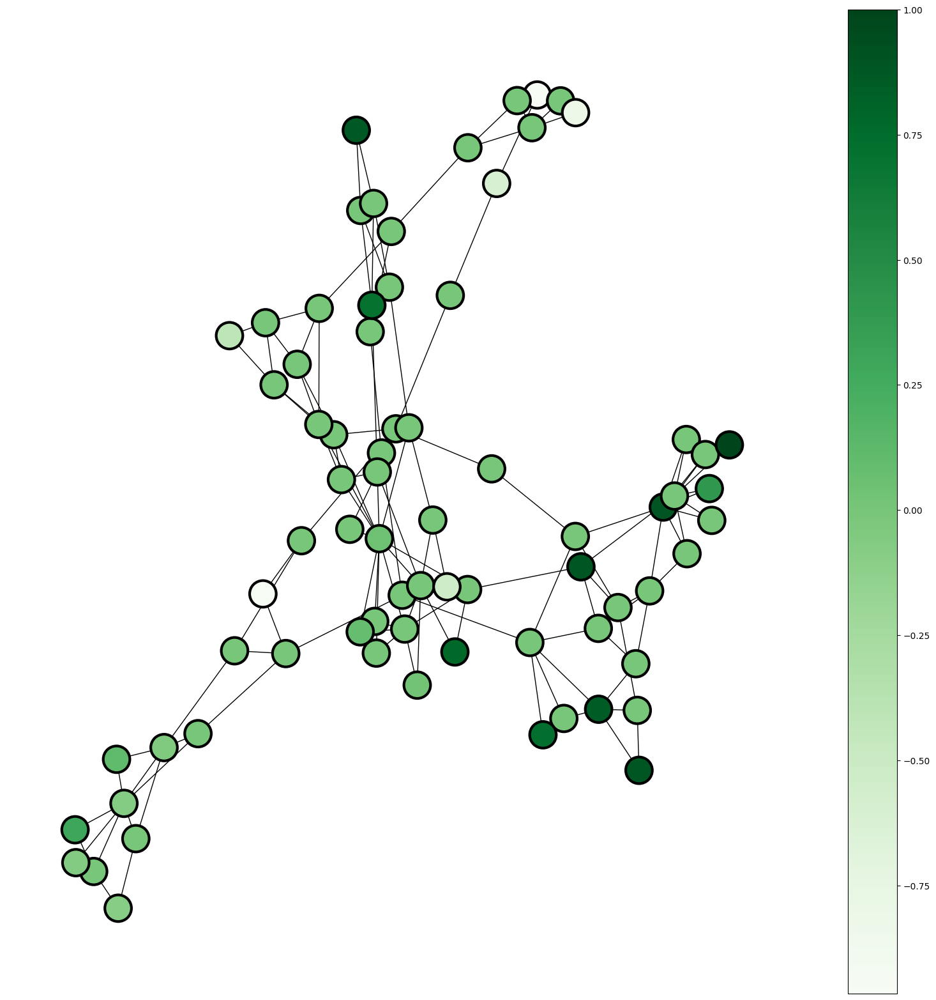

single best individual fitness


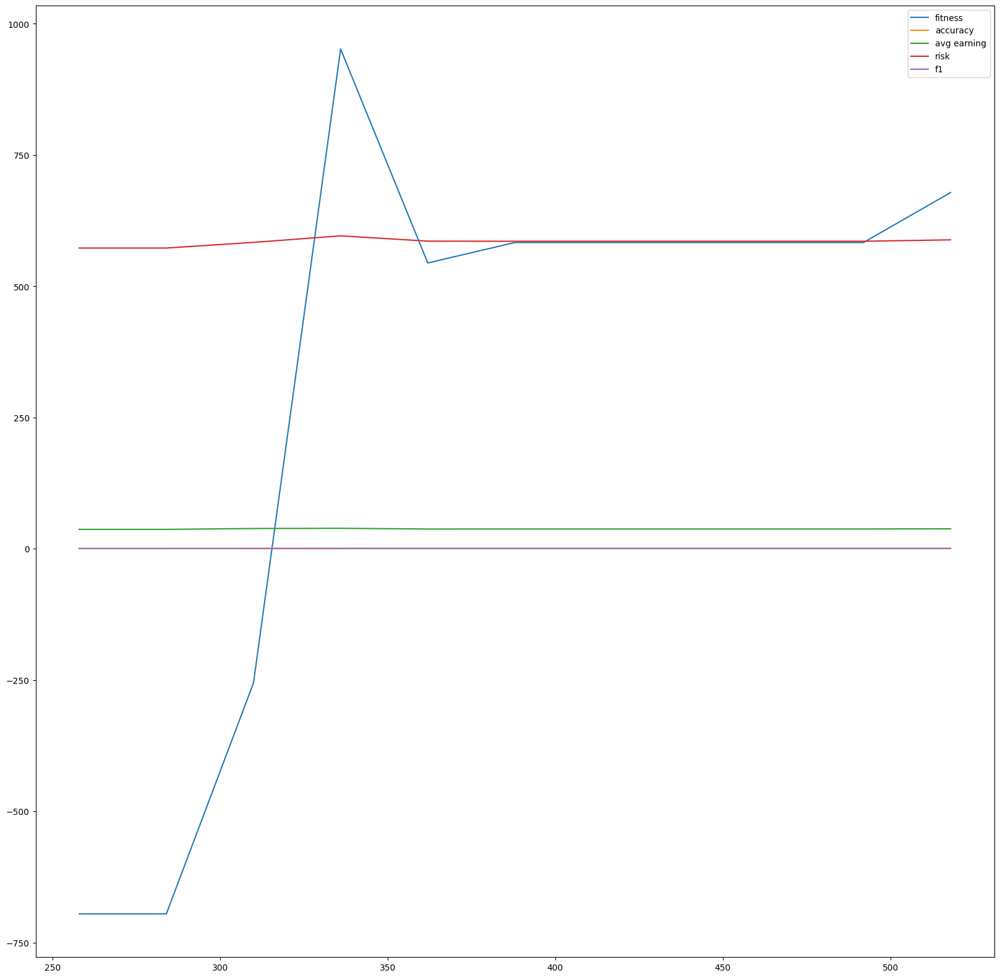

In [ ]:
do_ex(exp_num = 1, pop_size = 500, crossover_prob = 0.1, mutation_prob = 0.3, gp_trnmt_size = 6, ranker_factor = 500, n_gen = 20)

#####**11.2.3 second split**

In [ ]:
random_param_search(exp_num = 2)

testing : 500
testing crossover : 0.7
testing mutation : 0.5
testing gp trnmt : 3
testing ranker factor : 0
Iterations:  96%|█████████▌| 24/25 [11:34<00:39, 39.60s/it]som training
> 25 itrs completed after 728.44s
Iterations:  96%|█████████▌| 24/25 [12:08<00:39, 39.60s/it]

*******************************************************************************
SOMAP ARCHIVE
*******************************************************************************
  - Size: 119
  - Coverage: 0.3801916932907348
  - QD Score: -3608.5999999996816
  - Max Obj: 574.19999999998
  - Mean Obj: -30.324369747896483
Iterations: 100%|██████████| 25/25 [12:08<00:00, 29.14s/it]
actual develop metric: -570.5134453781553
best metric sofar: -570.5134453781553
best pop size sofar: 500
best crossover sofar: 0.7
best mutation prob sofar: 0.5
best gp trnmt size sofar: 3
best ranker factor sofar: 0
testing : 300
testing crossover : 0.3
testing mutation : 0.6
testing gp trnmt : 6
testing ranker factor : 100
Iterations:  96%|███

/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


Iterations:  20%|██        | 4/20 [00:22<01:26,  5.43s/it]som training
test metric: 24.395652173913014
Iterations:  45%|████▌     | 9/20 [00:51<01:02,  5.65s/it]som training
test metric: -44.458333333333236
Iterations:  70%|███████   | 14/20 [01:22<00:36,  6.16s/it]som training
test metric: 206.505555555554
Iterations:  95%|█████████▌| 19/20 [02:08<00:08,  8.42s/it]som training
test metric: 266.22083333333103
Iterations: 100%|██████████| 20/20 [02:21<00:00,  7.08s/it]


<ipython-input-34-d92c669faefb>:33: UserWarning: 

The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for arrowsize.
Note that using FancyArrowPatches may be slow for large graphs.

  edges = nx.draw_networkx_edges(topology, pos,  arrowsize = 20)


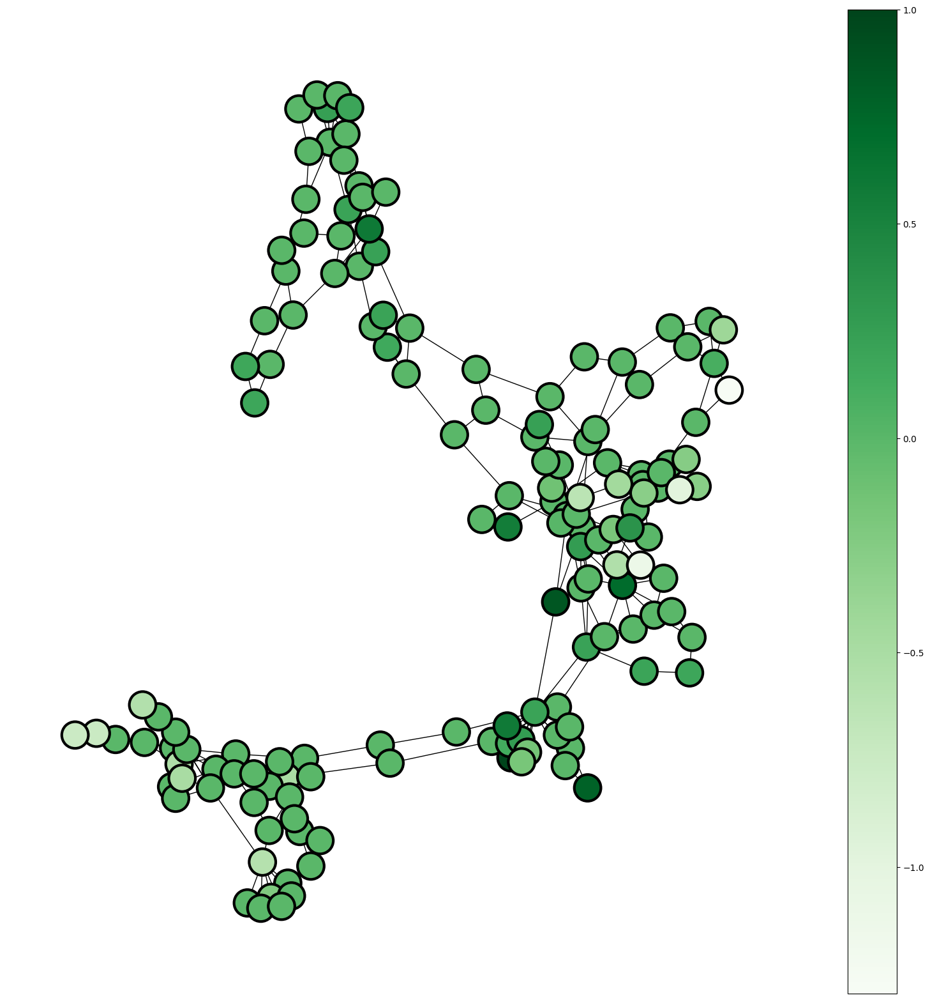

single best individual fitness


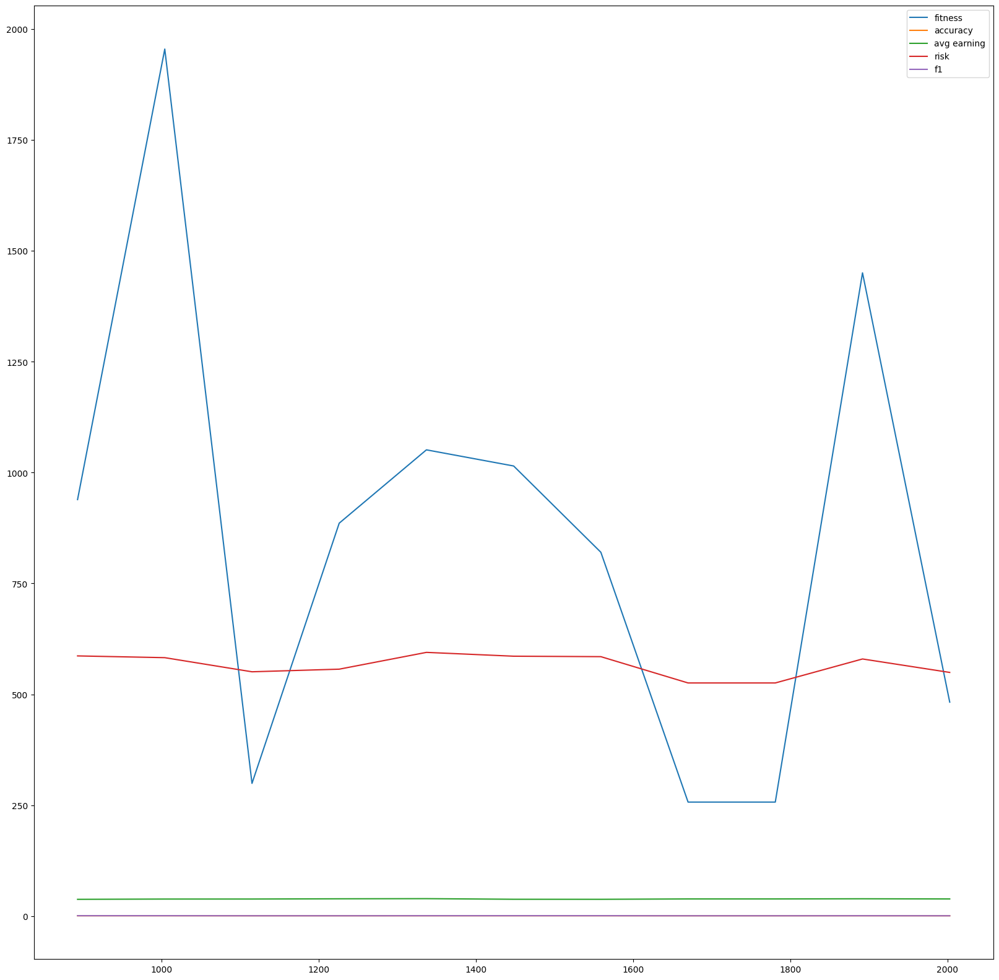

In [ ]:
do_ex(exp_num = 2, pop_size = 300, crossover_prob = 0.3, mutation_prob = 0.1, gp_trnmt_size = 12, ranker_factor = 1000, n_gen = 20)

#####**11.2.4 third split**

In [ ]:
random_param_search(exp_num = 3)

/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


testing : 400
testing crossover : 0.7
testing mutation : 0.4
testing gp trnmt : 3
testing ranker factor : 500
Iterations:  96%|█████████▌| 24/25 [11:43<01:07, 67.94s/it]som training
> 25 itrs completed after 832.85s
Iterations:  96%|█████████▌| 24/25 [13:52<01:07, 67.94s/it]

*******************************************************************************
SOMAP ARCHIVE
*******************************************************************************
  - Size: 90
  - Coverage: 0.3629032258064516
  - QD Score: 15809.9999999999
  - Max Obj: 1083.599999999994
  - Mean Obj: 175.66666666666555
Iterations: 100%|██████████| 25/25 [13:52<00:00, 33.31s/it]


/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


actual develop metric: -316.5488888888913
best metric sofar: -316.5488888888913
best pop size sofar: 400
best crossover sofar: 0.7
best mutation prob sofar: 0.4
best gp trnmt size sofar: 3
best ranker factor sofar: 500
testing : 400
testing crossover : 0.5
testing mutation : 0.7
testing gp trnmt : 48
testing ranker factor : 100
Iterations:  96%|█████████▌| 24/25 [08:50<00:30, 30.35s/it]som training
> 25 itrs completed after 590.96s
Iterations:  96%|█████████▌| 24/25 [09:50<00:30, 30.35s/it]

*******************************************************************************
SOMAP ARCHIVE
*******************************************************************************
  - Size: 76
  - Coverage: 0.3781094527363184
  - QD Score: 9719.800000000383
  - Max Obj: 871.1999999999952
  - Mean Obj: 127.89210526316293
Iterations: 100%|██████████| 25/25 [09:50<00:00, 23.64s/it]
actual develop metric: -413.2894736842129
best metric sofar: -316.5488888888913
best pop size sofar: 400
best crossover sofar: 

/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


Iterations:  20%|██        | 4/20 [00:31<02:07,  7.98s/it]som training
test metric: -175.58965517241307
Iterations:  45%|████▌     | 9/20 [08:03<17:10, 93.67s/it]som training
test metric: -136.99743589743642
Iterations:  70%|███████   | 14/20 [21:15<13:55, 139.33s/it]som training
test metric: -87.83333333333361
Iterations:  95%|█████████▌| 19/20 [36:08<02:43, 163.27s/it]som training
test metric: -144.81020408163104
Iterations: 100%|██████████| 20/20 [41:12<00:00, 123.62s/it]


<ipython-input-34-d92c669faefb>:33: UserWarning: 

The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for arrowsize.
Note that using FancyArrowPatches may be slow for large graphs.

  edges = nx.draw_networkx_edges(topology, pos,  arrowsize = 20)


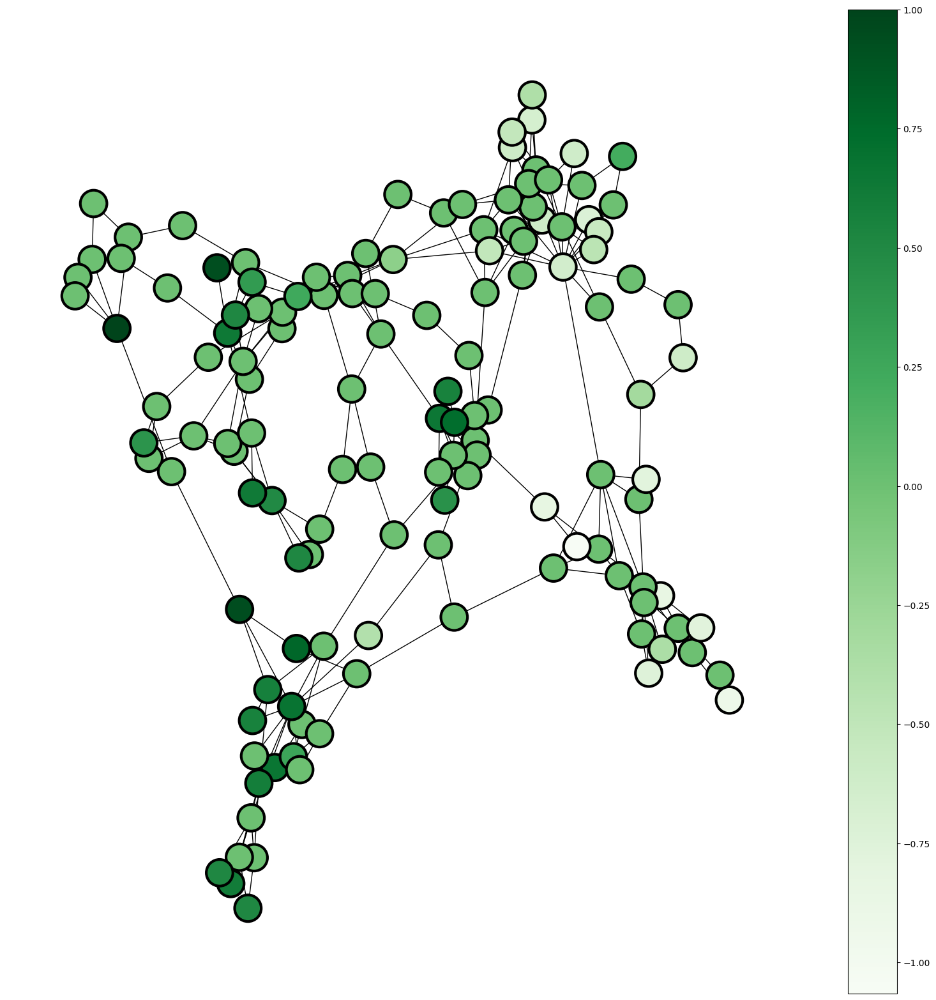

single best individual fitness


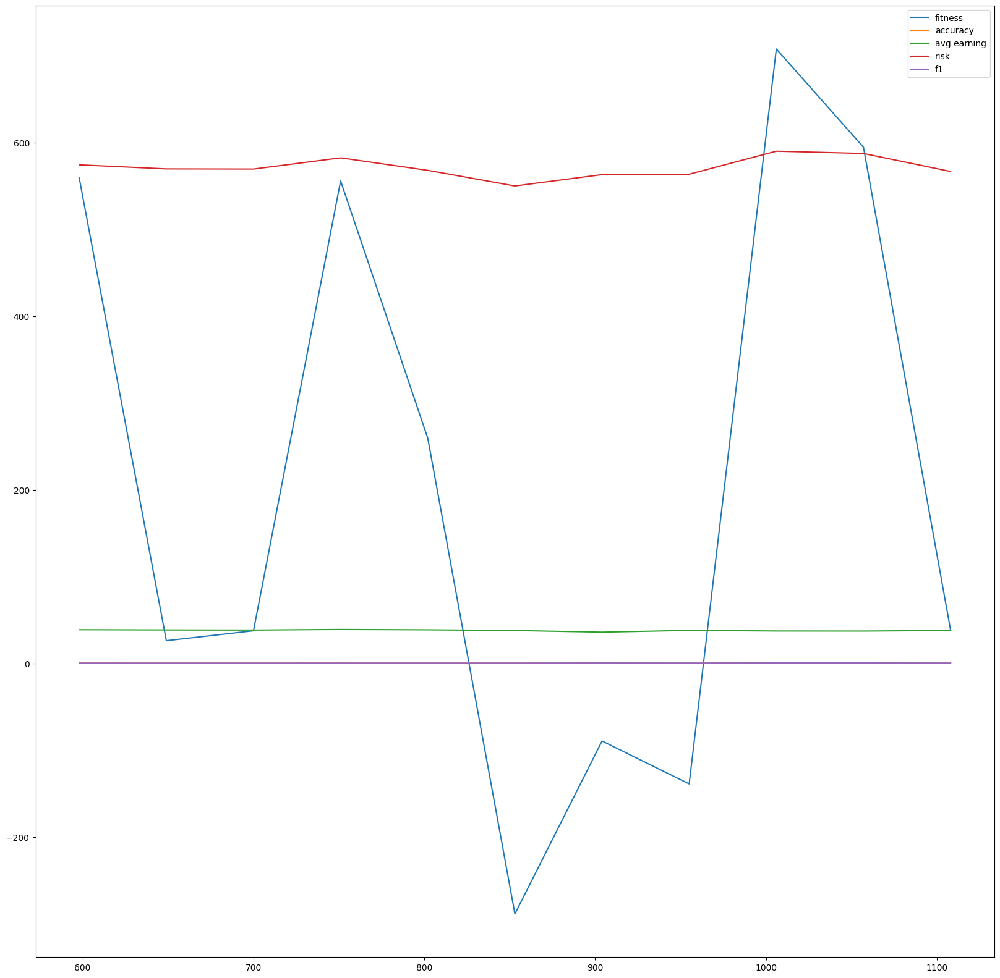

In [ ]:
do_ex(exp_num = 3, pop_size = 300, crossover_prob = 0.1, mutation_prob = 0.5, gp_trnmt_size = 48, ranker_factor = 500, n_gen = 20)

#####**11.2.5 fourth split**

In [ ]:
random_param_search(exp_num = 4)

/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


testing : 400
testing crossover : 0.7
testing mutation : 0.4
testing gp trnmt : 3
testing ranker factor : 500
Iterations:  96%|█████████▌| 24/25 [11:25<00:56, 56.43s/it]som training
> 25 itrs completed after 742.09s
Iterations:  96%|█████████▌| 24/25 [12:22<00:56, 56.43s/it]

*******************************************************************************
SOMAP ARCHIVE
*******************************************************************************
  - Size: 67
  - Coverage: 0.3743016759776536
  - QD Score: -4341.000000000211
  - Max Obj: 984.4000000000012
  - Mean Obj: -64.79104477612255
Iterations: 100%|██████████| 25/25 [12:22<00:00, 29.68s/it]


/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


actual develop metric: 167.38358208955316
best metric sofar: 167.38358208955316
best pop size sofar: 400
best crossover sofar: 0.7
best mutation prob sofar: 0.4
best gp trnmt size sofar: 3
best ranker factor sofar: 500
testing : 200
testing crossover : 0.6
testing mutation : 0.4
testing gp trnmt : 6
testing ranker factor : 100
Iterations:  96%|█████████▌| 24/25 [04:05<00:10, 10.05s/it]som training
> 25 itrs completed after 254.45s
Iterations:  96%|█████████▌| 24/25 [04:14<00:10, 10.05s/it]

*******************************************************************************
SOMAP ARCHIVE
*******************************************************************************
  - Size: 121
  - Coverage: 0.38170347003154576
  - QD Score: -27945.400000000678
  - Max Obj: 1115.3999999999971
  - Mean Obj: -230.95371900827007
Iterations: 100%|██████████| 25/25 [04:14<00:00, 10.18s/it]
actual develop metric: 81.82892561983635
best metric sofar: 167.38358208955316
best pop size sofar: 400
best crossover sof

/usr/local/lib/python3.10/dist-packages/deap/gp.py:254: RuntimeWarning: Ephemeral const function cannot be pickled because its generating function is a lambda function. Use functools.partial instead.
  warnings.warn("Ephemeral {name} function cannot be "


Iterations:  20%|██        | 4/20 [00:26<01:43,  6.45s/it]som training
test metric: -133.90000000000217
Iterations:  45%|████▌     | 9/20 [00:54<01:02,  5.65s/it]som training
test metric: -96.7090909090898
Iterations:  70%|███████   | 14/20 [01:22<00:33,  5.66s/it]som training
test metric: -89.76923076922911
Iterations:  95%|█████████▌| 19/20 [01:51<00:05,  5.50s/it]som training
test metric: -68.19285714285537
Iterations: 100%|██████████| 20/20 [01:59<00:00,  5.95s/it]


<ipython-input-34-d92c669faefb>:33: UserWarning: 

The arrowsize keyword argument is not applicable when drawing edges
with LineCollection.

To make this warning go away, either specify `arrows=True` to
force FancyArrowPatches or use the default value for arrowsize.
Note that using FancyArrowPatches may be slow for large graphs.

  edges = nx.draw_networkx_edges(topology, pos,  arrowsize = 20)


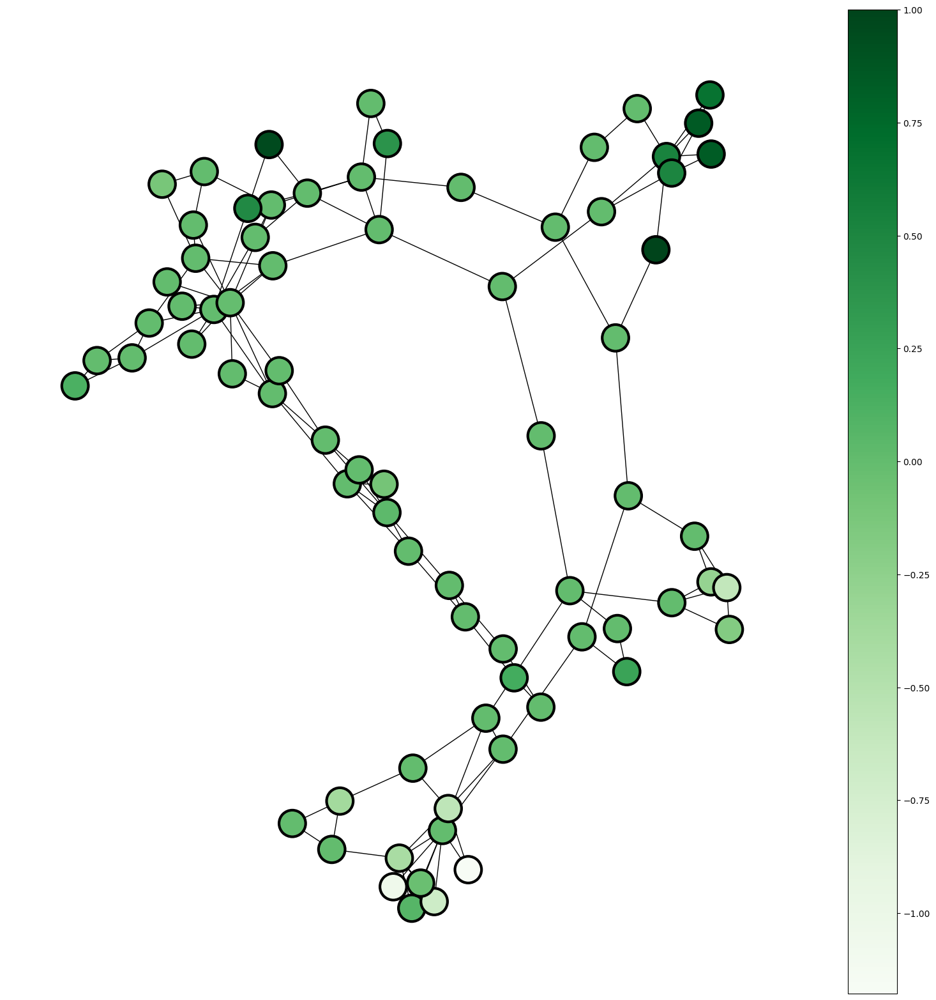

single best individual fitness


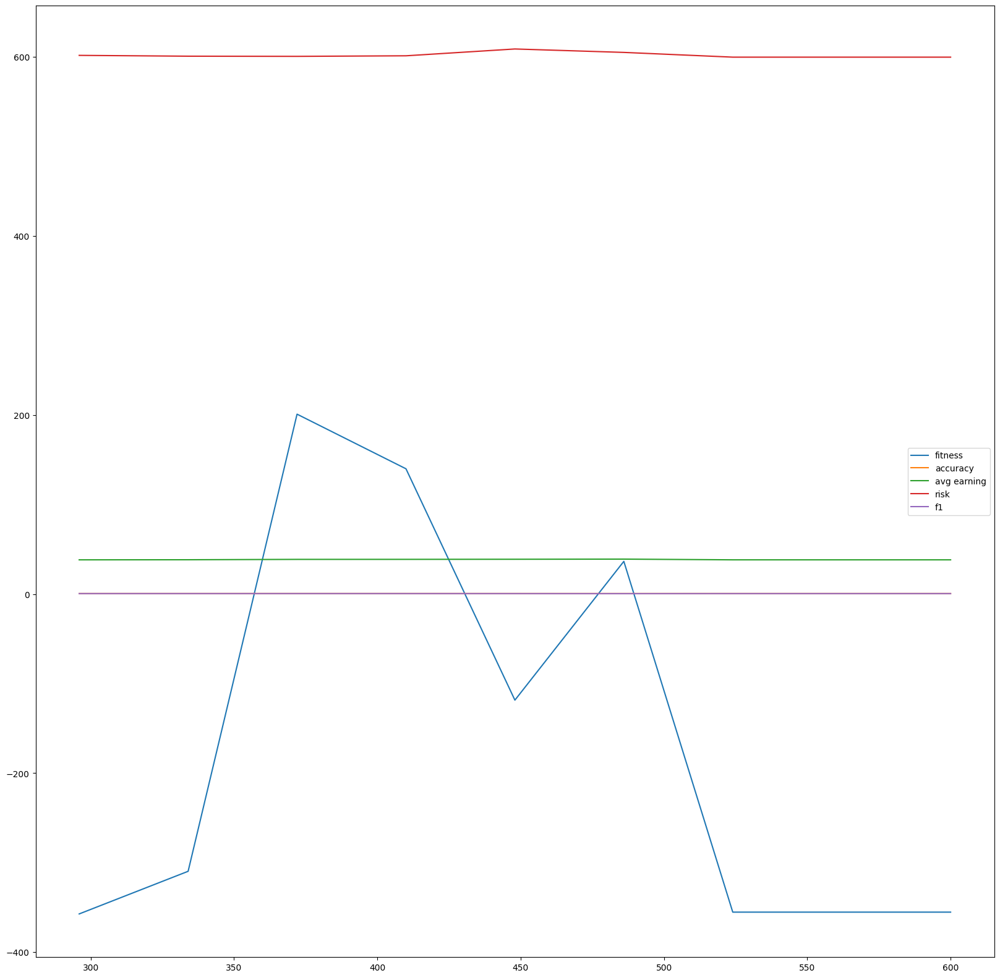

In [ ]:
do_ex(exp_num = 4, pop_size = 500, crossover_prob = 0.3, mutation_prob = 0.1, gp_trnmt_size = 12, ranker_factor = 500, n_gen = 20)